In [21]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
from fastai import *
from fastai.vision import *
from fastai.tabular import *
bs = 32

## Data wrangling

In [22]:
import pathlib
path = Path("data/PetAdoptionImages")

In [23]:
df9 = pd.read_csv("data/PetAdoptionImages/labels.csv", index_col=None)
df9['AdoptionSpeed'] = df9['AdoptionSpeed'].astype('int').astype('category')
df10 = df9[['Image_File_Name','AdoptionSpeed']]

## Data Batch

In [24]:
tfms = get_transforms(do_flip=True)

In [25]:
data = ImageDataBunch.from_df(path, df10, ds_tfms=tfms, size=299, fn_col = 'Image_File_Name', label_col = 'AdoptionSpeed' ).normalize()

In [26]:
data.batch_stats()

[tensor([-2.6696e-05, -1.2896e-05,  4.6141e-06]), tensor([1., 1., 1.])]

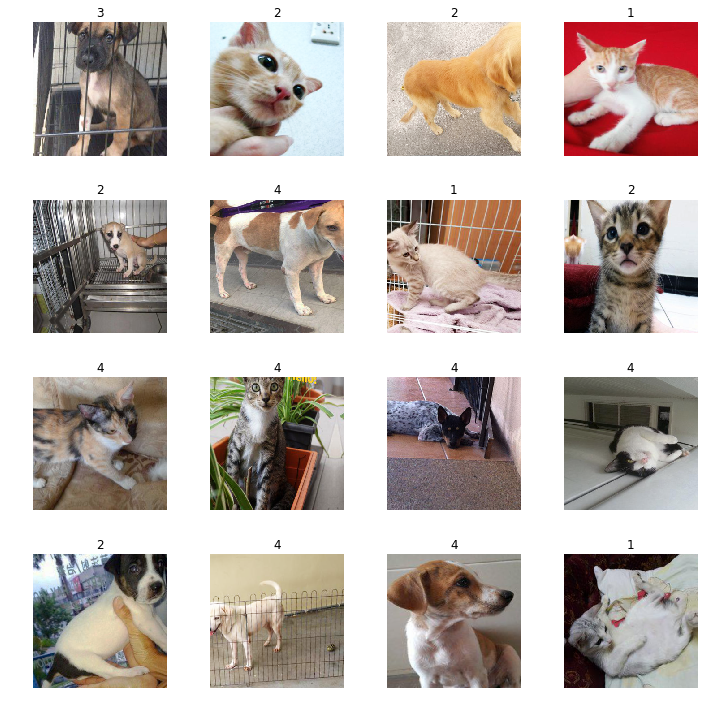

In [27]:
data.show_batch(rows=4, figsize=(10,10))

In [28]:
print(data.classes)
len(data.classes),data.c

[0, 1, 2, 3, 4]


(5, 5)

## Learning

In [29]:
learn = create_cnn(data, models.resnet101, metrics=error_rate)

In [30]:
learn.fit_one_cycle(8)
learn.save('stage-1-101')

epoch,train_loss,valid_loss,error_rate
1,1.465043,1.407103,0.655205
2,1.412174,1.384306,0.644744
3,1.391682,1.362943,0.625965
4,1.360187,1.355692,0.621934
5,1.321975,1.344206,0.610787
6,1.296491,1.331156,0.598954
7,1.268770,1.327803,0.597239
8,1.259636,1.327310,0.595610


### Fine Tuning


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


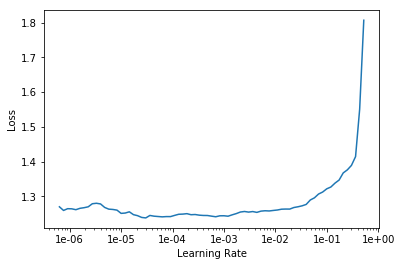

In [31]:
learn.lr_find()
learn.recorder.plot()

In [32]:
# learn.load('stage-1-101');
learn.unfreeze()
learn.fit_one_cycle(5, max_lr=slice(1e-6,1e-3))

epoch,train_loss,valid_loss,error_rate
1,1.280454,1.326270,0.593809
2,1.281010,1.329910,0.592694
3,1.199109,1.296825,0.570914
4,1.071847,1.309589,0.551535
5,0.994230,1.298435,0.549648


In [33]:
learn.save('stage-2-101')

In [34]:
# learn.load('stage-2-101');

In [35]:
learn = create_cnn(data, models.resnet101, metrics=error_rate)
learn.load('stage-2-101');

### Get Predictions

In [36]:
imageFilesPaths = get_image_files('data/PetAdoptionImages')

In [37]:
ImageFileNames =[]
iNamePath =imageFilesPaths[0]
ImageFileName = (os.path.basename(iNamePath))
ImageFileNames.append(ImageFileName)
   

In [38]:
dfPreds = pd.DataFrame()
count = 0
for iNamePath in imageFilesPaths:
    ImageFileName = (os.path.basename(iNamePath))
    PetID, t2 = ImageFileName.split("-")
    imageTrain =  open_image(iNamePath)
    pred_class,pred_idx,outputs = learn.predict(imageTrain)
    new_row = { 'Image_File_Name': ImageFileName, 'PetID': PetID, 'AdoptionSpeedPreds': int(pred_class) }
    print(new_row)
    count = count +1
    print(count)
    dfPreds = dfPreds.append(new_row,ignore_index=True)

{'Image_File_Name': 'a56bbc295-5.jpg', 'PetID': 'a56bbc295', 'AdoptionSpeedPreds': 3}
1
{'Image_File_Name': '1976719f7-2.jpg', 'PetID': '1976719f7', 'AdoptionSpeedPreds': 1}
2
{'Image_File_Name': '49113adb2-2.jpg', 'PetID': '49113adb2', 'AdoptionSpeedPreds': 3}
3
{'Image_File_Name': 'd8727d356-1.jpg', 'PetID': 'd8727d356', 'AdoptionSpeedPreds': 4}
4
{'Image_File_Name': 'fd740c8dc-3.jpg', 'PetID': 'fd740c8dc', 'AdoptionSpeedPreds': 4}
5
{'Image_File_Name': 'de445d837-1.jpg', 'PetID': 'de445d837', 'AdoptionSpeedPreds': 4}
6
{'Image_File_Name': '9e3d235d8-2.jpg', 'PetID': '9e3d235d8', 'AdoptionSpeedPreds': 3}
7
{'Image_File_Name': '71510cf8b-5.jpg', 'PetID': '71510cf8b', 'AdoptionSpeedPreds': 1}
8
{'Image_File_Name': '468cec390-2.jpg', 'PetID': '468cec390', 'AdoptionSpeedPreds': 2}
9
{'Image_File_Name': '1f6849a20-9.jpg', 'PetID': '1f6849a20', 'AdoptionSpeedPreds': 2}
10
{'Image_File_Name': 'f9159b6df-3.jpg', 'PetID': 'f9159b6df', 'AdoptionSpeedPreds': 4}
11
{'Image_File_Name': 'df59dd59f

{'Image_File_Name': '38c5d4e0e-3.jpg', 'PetID': '38c5d4e0e', 'AdoptionSpeedPreds': 4}
98
{'Image_File_Name': '92c2878db-1.jpg', 'PetID': '92c2878db', 'AdoptionSpeedPreds': 3}
99
{'Image_File_Name': '3eaa698d3-4.jpg', 'PetID': '3eaa698d3', 'AdoptionSpeedPreds': 4}
100
{'Image_File_Name': '263f0704d-2.jpg', 'PetID': '263f0704d', 'AdoptionSpeedPreds': 1}
101
{'Image_File_Name': 'eb77ec282-5.jpg', 'PetID': 'eb77ec282', 'AdoptionSpeedPreds': 4}
102
{'Image_File_Name': '88f092c58-1.jpg', 'PetID': '88f092c58', 'AdoptionSpeedPreds': 4}
103
{'Image_File_Name': 'ee6601d0b-2.jpg', 'PetID': 'ee6601d0b', 'AdoptionSpeedPreds': 4}
104
{'Image_File_Name': '7448f3165-2.jpg', 'PetID': '7448f3165', 'AdoptionSpeedPreds': 3}
105
{'Image_File_Name': '3029fcad6-5.jpg', 'PetID': '3029fcad6', 'AdoptionSpeedPreds': 1}
106
{'Image_File_Name': '92d830572-8.jpg', 'PetID': '92d830572', 'AdoptionSpeedPreds': 3}
107
{'Image_File_Name': 'b5757bc3f-3.jpg', 'PetID': 'b5757bc3f', 'AdoptionSpeedPreds': 1}
108
{'Image_File

{'Image_File_Name': '7395053bc-2.jpg', 'PetID': '7395053bc', 'AdoptionSpeedPreds': 4}
193
{'Image_File_Name': 'bce0e17b9-4.jpg', 'PetID': 'bce0e17b9', 'AdoptionSpeedPreds': 2}
194
{'Image_File_Name': 'f22ff0f64-3.jpg', 'PetID': 'f22ff0f64', 'AdoptionSpeedPreds': 1}
195
{'Image_File_Name': 'f21d7ec45-10.jpg', 'PetID': 'f21d7ec45', 'AdoptionSpeedPreds': 2}
196
{'Image_File_Name': 'aa7dc1913-3.jpg', 'PetID': 'aa7dc1913', 'AdoptionSpeedPreds': 4}
197
{'Image_File_Name': 'd0c943132-1.jpg', 'PetID': 'd0c943132', 'AdoptionSpeedPreds': 4}
198
{'Image_File_Name': 'd56553e2d-2.jpg', 'PetID': 'd56553e2d', 'AdoptionSpeedPreds': 4}
199
{'Image_File_Name': 'e86d8e932-2.jpg', 'PetID': 'e86d8e932', 'AdoptionSpeedPreds': 2}
200
{'Image_File_Name': 'bba3070ad-5.jpg', 'PetID': 'bba3070ad', 'AdoptionSpeedPreds': 2}
201
{'Image_File_Name': 'cb0309848-24.jpg', 'PetID': 'cb0309848', 'AdoptionSpeedPreds': 2}
202
{'Image_File_Name': '4235841ea-2.jpg', 'PetID': '4235841ea', 'AdoptionSpeedPreds': 4}
203
{'Image_

{'Image_File_Name': '7648e56db-2.jpg', 'PetID': '7648e56db', 'AdoptionSpeedPreds': 4}
288
{'Image_File_Name': 'de61ca522-2.jpg', 'PetID': 'de61ca522', 'AdoptionSpeedPreds': 4}
289
{'Image_File_Name': 'd3486b178-1.jpg', 'PetID': 'd3486b178', 'AdoptionSpeedPreds': 4}
290
{'Image_File_Name': 'cc25fb529-4.jpg', 'PetID': 'cc25fb529', 'AdoptionSpeedPreds': 2}
291
{'Image_File_Name': '5b5e81279-4.jpg', 'PetID': '5b5e81279', 'AdoptionSpeedPreds': 2}
292
{'Image_File_Name': '00648f96f-2.jpg', 'PetID': '00648f96f', 'AdoptionSpeedPreds': 2}
293
{'Image_File_Name': '5accbdfad-1.jpg', 'PetID': '5accbdfad', 'AdoptionSpeedPreds': 3}
294
{'Image_File_Name': '58b4ba48f-1.jpg', 'PetID': '58b4ba48f', 'AdoptionSpeedPreds': 4}
295
{'Image_File_Name': 'a89005005-4.jpg', 'PetID': 'a89005005', 'AdoptionSpeedPreds': 2}
296
{'Image_File_Name': '1f6849a20-12.jpg', 'PetID': '1f6849a20', 'AdoptionSpeedPreds': 1}
297
{'Image_File_Name': '27b708edc-5.jpg', 'PetID': '27b708edc', 'AdoptionSpeedPreds': 4}
298
{'Image_F

{'Image_File_Name': 'c89dcf5ae-1.jpg', 'PetID': 'c89dcf5ae', 'AdoptionSpeedPreds': 4}
382
{'Image_File_Name': 'e1e2b0af4-1.jpg', 'PetID': 'e1e2b0af4', 'AdoptionSpeedPreds': 2}
383
{'Image_File_Name': 'd672df50c-2.jpg', 'PetID': 'd672df50c', 'AdoptionSpeedPreds': 1}
384
{'Image_File_Name': '8c96f8ed3-4.jpg', 'PetID': '8c96f8ed3', 'AdoptionSpeedPreds': 3}
385
{'Image_File_Name': 'd17343468-5.jpg', 'PetID': 'd17343468', 'AdoptionSpeedPreds': 3}
386
{'Image_File_Name': '795cb17ef-6.jpg', 'PetID': '795cb17ef', 'AdoptionSpeedPreds': 3}
387
{'Image_File_Name': '94dac1ddf-1.jpg', 'PetID': '94dac1ddf', 'AdoptionSpeedPreds': 3}
388
{'Image_File_Name': '1696155ce-3.jpg', 'PetID': '1696155ce', 'AdoptionSpeedPreds': 2}
389
{'Image_File_Name': '460426eb4-4.jpg', 'PetID': '460426eb4', 'AdoptionSpeedPreds': 2}
390
{'Image_File_Name': 'bea72e6c5-2.jpg', 'PetID': 'bea72e6c5', 'AdoptionSpeedPreds': 4}
391
{'Image_File_Name': 'cb307f308-2.jpg', 'PetID': 'cb307f308', 'AdoptionSpeedPreds': 1}
392
{'Image_Fi

{'Image_File_Name': '7931ba838-3.jpg', 'PetID': '7931ba838', 'AdoptionSpeedPreds': 4}
476
{'Image_File_Name': '19caeb6b5-3.jpg', 'PetID': '19caeb6b5', 'AdoptionSpeedPreds': 3}
477
{'Image_File_Name': 'ec14446ba-5.jpg', 'PetID': 'ec14446ba', 'AdoptionSpeedPreds': 3}
478
{'Image_File_Name': '4d4c7be64-1.jpg', 'PetID': '4d4c7be64', 'AdoptionSpeedPreds': 4}
479
{'Image_File_Name': '463be5788-6.jpg', 'PetID': '463be5788', 'AdoptionSpeedPreds': 2}
480
{'Image_File_Name': 'f8710e158-11.jpg', 'PetID': 'f8710e158', 'AdoptionSpeedPreds': 3}
481
{'Image_File_Name': '8910f2f5e-9.jpg', 'PetID': '8910f2f5e', 'AdoptionSpeedPreds': 2}
482
{'Image_File_Name': '5407c6e1a-7.jpg', 'PetID': '5407c6e1a', 'AdoptionSpeedPreds': 3}
483
{'Image_File_Name': 'b356b0f05-1.jpg', 'PetID': 'b356b0f05', 'AdoptionSpeedPreds': 2}
484
{'Image_File_Name': '27e458086-5.jpg', 'PetID': '27e458086', 'AdoptionSpeedPreds': 3}
485
{'Image_File_Name': '1a0ee9580-2.jpg', 'PetID': '1a0ee9580', 'AdoptionSpeedPreds': 4}
486
{'Image_F

{'Image_File_Name': '5163abb6e-10.jpg', 'PetID': '5163abb6e', 'AdoptionSpeedPreds': 3}
570
{'Image_File_Name': 'acfbc9b71-1.jpg', 'PetID': 'acfbc9b71', 'AdoptionSpeedPreds': 3}
571
{'Image_File_Name': '059cfed40-2.jpg', 'PetID': '059cfed40', 'AdoptionSpeedPreds': 3}
572
{'Image_File_Name': '0b74e375f-2.jpg', 'PetID': '0b74e375f', 'AdoptionSpeedPreds': 3}
573
{'Image_File_Name': '4c9e42452-2.jpg', 'PetID': '4c9e42452', 'AdoptionSpeedPreds': 4}
574
{'Image_File_Name': '569e2b299-1.jpg', 'PetID': '569e2b299', 'AdoptionSpeedPreds': 4}
575
{'Image_File_Name': 'b76a6d7fa-2.jpg', 'PetID': 'b76a6d7fa', 'AdoptionSpeedPreds': 3}
576
{'Image_File_Name': '0bdd7f7ac-3.jpg', 'PetID': '0bdd7f7ac', 'AdoptionSpeedPreds': 1}
577
{'Image_File_Name': '8d7a8a5c0-11.jpg', 'PetID': '8d7a8a5c0', 'AdoptionSpeedPreds': 1}
578
{'Image_File_Name': '0792dbfa4-5.jpg', 'PetID': '0792dbfa4', 'AdoptionSpeedPreds': 4}
579
{'Image_File_Name': 'c7ef9e0bf-2.jpg', 'PetID': 'c7ef9e0bf', 'AdoptionSpeedPreds': 3}
580
{'Image_

{'Image_File_Name': 'd096658bb-8.jpg', 'PetID': 'd096658bb', 'AdoptionSpeedPreds': 4}
662
{'Image_File_Name': '4247730f1-2.jpg', 'PetID': '4247730f1', 'AdoptionSpeedPreds': 3}
663
{'Image_File_Name': '9eb98f34c-5.jpg', 'PetID': '9eb98f34c', 'AdoptionSpeedPreds': 3}
664
{'Image_File_Name': '8e343f4df-4.jpg', 'PetID': '8e343f4df', 'AdoptionSpeedPreds': 4}
665
{'Image_File_Name': '8d0b0238c-1.jpg', 'PetID': '8d0b0238c', 'AdoptionSpeedPreds': 2}
666
{'Image_File_Name': '16e922149-6.jpg', 'PetID': '16e922149', 'AdoptionSpeedPreds': 4}
667
{'Image_File_Name': '11a3055b7-5.jpg', 'PetID': '11a3055b7', 'AdoptionSpeedPreds': 3}
668
{'Image_File_Name': '48a2630a1-4.jpg', 'PetID': '48a2630a1', 'AdoptionSpeedPreds': 2}
669
{'Image_File_Name': '51c4018b8-4.jpg', 'PetID': '51c4018b8', 'AdoptionSpeedPreds': 2}
670
{'Image_File_Name': 'c41283409-1.jpg', 'PetID': 'c41283409', 'AdoptionSpeedPreds': 2}
671
{'Image_File_Name': '764837930-9.jpg', 'PetID': '764837930', 'AdoptionSpeedPreds': 4}
672
{'Image_Fi

{'Image_File_Name': '8e343f4df-1.jpg', 'PetID': '8e343f4df', 'AdoptionSpeedPreds': 4}
754
{'Image_File_Name': '487abc5e1-2.jpg', 'PetID': '487abc5e1', 'AdoptionSpeedPreds': 4}
755
{'Image_File_Name': 'fcffea7c0-5.jpg', 'PetID': 'fcffea7c0', 'AdoptionSpeedPreds': 2}
756
{'Image_File_Name': '3c0ca0676-5.jpg', 'PetID': '3c0ca0676', 'AdoptionSpeedPreds': 1}
757
{'Image_File_Name': '84efe95e8-1.jpg', 'PetID': '84efe95e8', 'AdoptionSpeedPreds': 4}
758
{'Image_File_Name': '27b2c806b-6.jpg', 'PetID': '27b2c806b', 'AdoptionSpeedPreds': 1}
759
{'Image_File_Name': 'ce971a506-1.jpg', 'PetID': 'ce971a506', 'AdoptionSpeedPreds': 1}
760
{'Image_File_Name': 'cd565b4f7-2.jpg', 'PetID': 'cd565b4f7', 'AdoptionSpeedPreds': 4}
761
{'Image_File_Name': '894da0f10-4.jpg', 'PetID': '894da0f10', 'AdoptionSpeedPreds': 3}
762
{'Image_File_Name': '095314294-5.jpg', 'PetID': '095314294', 'AdoptionSpeedPreds': 3}
763
{'Image_File_Name': '96607bca0-4.jpg', 'PetID': '96607bca0', 'AdoptionSpeedPreds': 1}
764
{'Image_Fi

{'Image_File_Name': '3fa341801-6.jpg', 'PetID': '3fa341801', 'AdoptionSpeedPreds': 2}
845
{'Image_File_Name': 'df76ee4c1-4.jpg', 'PetID': 'df76ee4c1', 'AdoptionSpeedPreds': 4}
846
{'Image_File_Name': '48c598ef0-7.jpg', 'PetID': '48c598ef0', 'AdoptionSpeedPreds': 1}
847
{'Image_File_Name': '9aee8fe5a-3.jpg', 'PetID': '9aee8fe5a', 'AdoptionSpeedPreds': 2}
848
{'Image_File_Name': '274c7f123-2.jpg', 'PetID': '274c7f123', 'AdoptionSpeedPreds': 4}
849
{'Image_File_Name': '2f6cde44b-6.jpg', 'PetID': '2f6cde44b', 'AdoptionSpeedPreds': 1}
850
{'Image_File_Name': '2239dee36-2.jpg', 'PetID': '2239dee36', 'AdoptionSpeedPreds': 2}
851
{'Image_File_Name': '458e8f61c-5.jpg', 'PetID': '458e8f61c', 'AdoptionSpeedPreds': 4}
852
{'Image_File_Name': '8947bf4b9-4.jpg', 'PetID': '8947bf4b9', 'AdoptionSpeedPreds': 2}
853
{'Image_File_Name': '615e51eef-3.jpg', 'PetID': '615e51eef', 'AdoptionSpeedPreds': 3}
854
{'Image_File_Name': '66cff2ed9-3.jpg', 'PetID': '66cff2ed9', 'AdoptionSpeedPreds': 4}
855
{'Image_Fi

{'Image_File_Name': '420193f17-2.jpg', 'PetID': '420193f17', 'AdoptionSpeedPreds': 2}
939
{'Image_File_Name': 'ca1df3f71-1.jpg', 'PetID': 'ca1df3f71', 'AdoptionSpeedPreds': 4}
940
{'Image_File_Name': '9d84fc0c5-2.jpg', 'PetID': '9d84fc0c5', 'AdoptionSpeedPreds': 3}
941
{'Image_File_Name': 'eac9c6b7a-3.jpg', 'PetID': 'eac9c6b7a', 'AdoptionSpeedPreds': 1}
942
{'Image_File_Name': '169fc07e1-3.jpg', 'PetID': '169fc07e1', 'AdoptionSpeedPreds': 1}
943
{'Image_File_Name': 'af28491d1-4.jpg', 'PetID': 'af28491d1', 'AdoptionSpeedPreds': 1}
944
{'Image_File_Name': 'a706b0eb9-5.jpg', 'PetID': 'a706b0eb9', 'AdoptionSpeedPreds': 1}
945
{'Image_File_Name': 'b70ec3788-1.jpg', 'PetID': 'b70ec3788', 'AdoptionSpeedPreds': 2}
946
{'Image_File_Name': '4f66a72ef-4.jpg', 'PetID': '4f66a72ef', 'AdoptionSpeedPreds': 1}
947
{'Image_File_Name': 'a2c9be724-14.jpg', 'PetID': 'a2c9be724', 'AdoptionSpeedPreds': 3}
948
{'Image_File_Name': 'ebc749f21-2.jpg', 'PetID': 'ebc749f21', 'AdoptionSpeedPreds': 2}
949
{'Image_F

{'Image_File_Name': '7a72ba3d7-1.jpg', 'PetID': '7a72ba3d7', 'AdoptionSpeedPreds': 4}
1030
{'Image_File_Name': '9a719040f-4.jpg', 'PetID': '9a719040f', 'AdoptionSpeedPreds': 2}
1031
{'Image_File_Name': 'ae0535c8c-2.jpg', 'PetID': 'ae0535c8c', 'AdoptionSpeedPreds': 1}
1032
{'Image_File_Name': '3b4ac67f0-4.jpg', 'PetID': '3b4ac67f0', 'AdoptionSpeedPreds': 0}
1033
{'Image_File_Name': 'e74dd0579-4.jpg', 'PetID': 'e74dd0579', 'AdoptionSpeedPreds': 3}
1034
{'Image_File_Name': 'dc371c173-21.jpg', 'PetID': 'dc371c173', 'AdoptionSpeedPreds': 2}
1035
{'Image_File_Name': 'aa795e561-3.jpg', 'PetID': 'aa795e561', 'AdoptionSpeedPreds': 4}
1036
{'Image_File_Name': 'da424cdd7-1.jpg', 'PetID': 'da424cdd7', 'AdoptionSpeedPreds': 3}
1037
{'Image_File_Name': 'eebee574e-3.jpg', 'PetID': 'eebee574e', 'AdoptionSpeedPreds': 2}
1038
{'Image_File_Name': 'cd3cd5fcc-18.jpg', 'PetID': 'cd3cd5fcc', 'AdoptionSpeedPreds': 2}
1039
{'Image_File_Name': '6ef02d7e9-3.jpg', 'PetID': '6ef02d7e9', 'AdoptionSpeedPreds': 3}
10

{'Image_File_Name': '2a6d369bb-2.jpg', 'PetID': '2a6d369bb', 'AdoptionSpeedPreds': 1}
1123
{'Image_File_Name': '15600cfea-10.jpg', 'PetID': '15600cfea', 'AdoptionSpeedPreds': 4}
1124
{'Image_File_Name': '6da1ee245-21.jpg', 'PetID': '6da1ee245', 'AdoptionSpeedPreds': 4}
1125
{'Image_File_Name': 'f2be40d43-2.jpg', 'PetID': 'f2be40d43', 'AdoptionSpeedPreds': 4}
1126
{'Image_File_Name': 'a437cc78c-1.jpg', 'PetID': 'a437cc78c', 'AdoptionSpeedPreds': 3}
1127
{'Image_File_Name': '9403ac24d-1.jpg', 'PetID': '9403ac24d', 'AdoptionSpeedPreds': 4}
1128
{'Image_File_Name': 'dea01911c-2.jpg', 'PetID': 'dea01911c', 'AdoptionSpeedPreds': 2}
1129
{'Image_File_Name': '1d4574c90-5.jpg', 'PetID': '1d4574c90', 'AdoptionSpeedPreds': 2}
1130
{'Image_File_Name': 'cc628c147-4.jpg', 'PetID': 'cc628c147', 'AdoptionSpeedPreds': 0}
1131
{'Image_File_Name': '502c3e7ae-1.jpg', 'PetID': '502c3e7ae', 'AdoptionSpeedPreds': 4}
1132
{'Image_File_Name': '8ad784999-6.jpg', 'PetID': '8ad784999', 'AdoptionSpeedPreds': 1}
11

{'Image_File_Name': 'b7c4936a9-4.jpg', 'PetID': 'b7c4936a9', 'AdoptionSpeedPreds': 4}
1216
{'Image_File_Name': 'cc6ce44c8-1.jpg', 'PetID': 'cc6ce44c8', 'AdoptionSpeedPreds': 3}
1217
{'Image_File_Name': '168f1c6e9-4.jpg', 'PetID': '168f1c6e9', 'AdoptionSpeedPreds': 4}
1218
{'Image_File_Name': '3a7d3c17e-2.jpg', 'PetID': '3a7d3c17e', 'AdoptionSpeedPreds': 4}
1219
{'Image_File_Name': '14a1d0eb4-13.jpg', 'PetID': '14a1d0eb4', 'AdoptionSpeedPreds': 4}
1220
{'Image_File_Name': '029641a1a-3.jpg', 'PetID': '029641a1a', 'AdoptionSpeedPreds': 2}
1221
{'Image_File_Name': '8b63e1b21-2.jpg', 'PetID': '8b63e1b21', 'AdoptionSpeedPreds': 2}
1222
{'Image_File_Name': '10124968c-19.jpg', 'PetID': '10124968c', 'AdoptionSpeedPreds': 4}
1223
{'Image_File_Name': '5e7db4c54-4.jpg', 'PetID': '5e7db4c54', 'AdoptionSpeedPreds': 1}
1224
{'Image_File_Name': 'adb97bde0-2.jpg', 'PetID': 'adb97bde0', 'AdoptionSpeedPreds': 4}
1225
{'Image_File_Name': '19b7a9e47-2.jpg', 'PetID': '19b7a9e47', 'AdoptionSpeedPreds': 4}
12

{'Image_File_Name': '969b9bb00-1.jpg', 'PetID': '969b9bb00', 'AdoptionSpeedPreds': 4}
1309
{'Image_File_Name': '69c1801cb-7.jpg', 'PetID': '69c1801cb', 'AdoptionSpeedPreds': 3}
1310
{'Image_File_Name': '3a9f1c036-9.jpg', 'PetID': '3a9f1c036', 'AdoptionSpeedPreds': 3}
1311
{'Image_File_Name': '86855ddfd-1.jpg', 'PetID': '86855ddfd', 'AdoptionSpeedPreds': 2}
1312
{'Image_File_Name': '28a0ae4fe-2.jpg', 'PetID': '28a0ae4fe', 'AdoptionSpeedPreds': 4}
1313
{'Image_File_Name': 'b4aa0c3ce-1.jpg', 'PetID': 'b4aa0c3ce', 'AdoptionSpeedPreds': 3}
1314
{'Image_File_Name': '3bf6cdab0-7.jpg', 'PetID': '3bf6cdab0', 'AdoptionSpeedPreds': 3}
1315
{'Image_File_Name': '28e86bb13-2.jpg', 'PetID': '28e86bb13', 'AdoptionSpeedPreds': 2}
1316
{'Image_File_Name': '7023f6b45-4.jpg', 'PetID': '7023f6b45', 'AdoptionSpeedPreds': 3}
1317
{'Image_File_Name': 'f4948a23d-3.jpg', 'PetID': 'f4948a23d', 'AdoptionSpeedPreds': 2}
1318
{'Image_File_Name': '0faf7f0ae-2.jpg', 'PetID': '0faf7f0ae', 'AdoptionSpeedPreds': 4}
1319

{'Image_File_Name': '10e27da02-3.jpg', 'PetID': '10e27da02', 'AdoptionSpeedPreds': 2}
1399
{'Image_File_Name': 'ba04f3e21-4.jpg', 'PetID': 'ba04f3e21', 'AdoptionSpeedPreds': 3}
1400
{'Image_File_Name': '2ba66d1e1-1.jpg', 'PetID': '2ba66d1e1', 'AdoptionSpeedPreds': 3}
1401
{'Image_File_Name': 'e3b6b7d2e-6.jpg', 'PetID': 'e3b6b7d2e', 'AdoptionSpeedPreds': 2}
1402
{'Image_File_Name': 'beb3a6da0-2.jpg', 'PetID': 'beb3a6da0', 'AdoptionSpeedPreds': 1}
1403
{'Image_File_Name': 'aca9ddee7-2.jpg', 'PetID': 'aca9ddee7', 'AdoptionSpeedPreds': 3}
1404
{'Image_File_Name': 'd7c6e0401-1.jpg', 'PetID': 'd7c6e0401', 'AdoptionSpeedPreds': 4}
1405
{'Image_File_Name': '0fd9076d7-2.jpg', 'PetID': '0fd9076d7', 'AdoptionSpeedPreds': 2}
1406
{'Image_File_Name': '4c48a8f2f-6.jpg', 'PetID': '4c48a8f2f', 'AdoptionSpeedPreds': 3}
1407
{'Image_File_Name': 'c20aa0352-4.jpg', 'PetID': 'c20aa0352', 'AdoptionSpeedPreds': 4}
1408
{'Image_File_Name': '32ac38a9f-2.jpg', 'PetID': '32ac38a9f', 'AdoptionSpeedPreds': 3}
1409

{'Image_File_Name': '85587ad13-8.jpg', 'PetID': '85587ad13', 'AdoptionSpeedPreds': 4}
1492
{'Image_File_Name': 'a1188fdb7-1.jpg', 'PetID': 'a1188fdb7', 'AdoptionSpeedPreds': 4}
1493
{'Image_File_Name': 'b23e29c89-11.jpg', 'PetID': 'b23e29c89', 'AdoptionSpeedPreds': 3}
1494
{'Image_File_Name': '30ca259ed-5.jpg', 'PetID': '30ca259ed', 'AdoptionSpeedPreds': 3}
1495
{'Image_File_Name': '412d7406c-2.jpg', 'PetID': '412d7406c', 'AdoptionSpeedPreds': 4}
1496
{'Image_File_Name': 'fd7c54ba8-1.jpg', 'PetID': 'fd7c54ba8', 'AdoptionSpeedPreds': 4}
1497
{'Image_File_Name': '4fec4436f-7.jpg', 'PetID': '4fec4436f', 'AdoptionSpeedPreds': 4}
1498
{'Image_File_Name': '0d6db9370-3.jpg', 'PetID': '0d6db9370', 'AdoptionSpeedPreds': 2}
1499
{'Image_File_Name': '25e0e0edf-2.jpg', 'PetID': '25e0e0edf', 'AdoptionSpeedPreds': 4}
1500
{'Image_File_Name': '783a33f4c-1.jpg', 'PetID': '783a33f4c', 'AdoptionSpeedPreds': 4}
1501
{'Image_File_Name': '1eb9e12e8-1.jpg', 'PetID': '1eb9e12e8', 'AdoptionSpeedPreds': 2}
150

{'Image_File_Name': 'ee8bf2efb-1.jpg', 'PetID': 'ee8bf2efb', 'AdoptionSpeedPreds': 2}
1586
{'Image_File_Name': '6668ff629-3.jpg', 'PetID': '6668ff629', 'AdoptionSpeedPreds': 2}
1587
{'Image_File_Name': '48cd2ebaa-7.jpg', 'PetID': '48cd2ebaa', 'AdoptionSpeedPreds': 3}
1588
{'Image_File_Name': '3e6fa700b-7.jpg', 'PetID': '3e6fa700b', 'AdoptionSpeedPreds': 4}
1589
{'Image_File_Name': '358517d09-1.jpg', 'PetID': '358517d09', 'AdoptionSpeedPreds': 2}
1590
{'Image_File_Name': '79a6cc443-2.jpg', 'PetID': '79a6cc443', 'AdoptionSpeedPreds': 3}
1591
{'Image_File_Name': '1380b76cf-5.jpg', 'PetID': '1380b76cf', 'AdoptionSpeedPreds': 2}
1592
{'Image_File_Name': '1e6130d74-1.jpg', 'PetID': '1e6130d74', 'AdoptionSpeedPreds': 1}
1593
{'Image_File_Name': '99ba6513a-3.jpg', 'PetID': '99ba6513a', 'AdoptionSpeedPreds': 4}
1594
{'Image_File_Name': 'ca144ac2a-2.jpg', 'PetID': 'ca144ac2a', 'AdoptionSpeedPreds': 3}
1595
{'Image_File_Name': '5783d40a2-5.jpg', 'PetID': '5783d40a2', 'AdoptionSpeedPreds': 2}
1596

{'Image_File_Name': '6231ed9b3-7.jpg', 'PetID': '6231ed9b3', 'AdoptionSpeedPreds': 2}
1678
{'Image_File_Name': 'ab4ab38d7-5.jpg', 'PetID': 'ab4ab38d7', 'AdoptionSpeedPreds': 4}
1679
{'Image_File_Name': 'b2e138d7a-2.jpg', 'PetID': 'b2e138d7a', 'AdoptionSpeedPreds': 3}
1680
{'Image_File_Name': '4771e1226-1.jpg', 'PetID': '4771e1226', 'AdoptionSpeedPreds': 2}
1681
{'Image_File_Name': 'c37b2e740-1.jpg', 'PetID': 'c37b2e740', 'AdoptionSpeedPreds': 1}
1682
{'Image_File_Name': '6a88c7fa4-5.jpg', 'PetID': '6a88c7fa4', 'AdoptionSpeedPreds': 2}
1683
{'Image_File_Name': '01802debf-7.jpg', 'PetID': '01802debf', 'AdoptionSpeedPreds': 3}
1684
{'Image_File_Name': '531e56f63-1.jpg', 'PetID': '531e56f63', 'AdoptionSpeedPreds': 4}
1685
{'Image_File_Name': 'd63d5fe8b-3.jpg', 'PetID': 'd63d5fe8b', 'AdoptionSpeedPreds': 1}
1686
{'Image_File_Name': '84efe95e8-4.jpg', 'PetID': '84efe95e8', 'AdoptionSpeedPreds': 4}
1687
{'Image_File_Name': '8b396d0f4-3.jpg', 'PetID': '8b396d0f4', 'AdoptionSpeedPreds': 2}
1688

{'Image_File_Name': '39816161d-1.jpg', 'PetID': '39816161d', 'AdoptionSpeedPreds': 2}
1771
{'Image_File_Name': '34cedf9bb-2.jpg', 'PetID': '34cedf9bb', 'AdoptionSpeedPreds': 1}
1772
{'Image_File_Name': '71510cf8b-4.jpg', 'PetID': '71510cf8b', 'AdoptionSpeedPreds': 2}
1773
{'Image_File_Name': '3bb86aa8f-1.jpg', 'PetID': '3bb86aa8f', 'AdoptionSpeedPreds': 2}
1774
{'Image_File_Name': '59d42b6bb-2.jpg', 'PetID': '59d42b6bb', 'AdoptionSpeedPreds': 3}
1775
{'Image_File_Name': '3e26edfa8-4.jpg', 'PetID': '3e26edfa8', 'AdoptionSpeedPreds': 3}
1776
{'Image_File_Name': '91efb738a-1.jpg', 'PetID': '91efb738a', 'AdoptionSpeedPreds': 4}
1777
{'Image_File_Name': '190eba3c6-5.jpg', 'PetID': '190eba3c6', 'AdoptionSpeedPreds': 2}
1778
{'Image_File_Name': '25ffa1850-2.jpg', 'PetID': '25ffa1850', 'AdoptionSpeedPreds': 2}
1779
{'Image_File_Name': '9699a3d34-1.jpg', 'PetID': '9699a3d34', 'AdoptionSpeedPreds': 4}
1780
{'Image_File_Name': 'a124a31ee-1.jpg', 'PetID': 'a124a31ee', 'AdoptionSpeedPreds': 3}
1781

{'Image_File_Name': 'a98a5b0e8-1.jpg', 'PetID': 'a98a5b0e8', 'AdoptionSpeedPreds': 1}
1863
{'Image_File_Name': 'dbcf45977-3.jpg', 'PetID': 'dbcf45977', 'AdoptionSpeedPreds': 4}
1864
{'Image_File_Name': '1b47183f1-1.jpg', 'PetID': '1b47183f1', 'AdoptionSpeedPreds': 4}
1865
{'Image_File_Name': 'b51b41933-15.jpg', 'PetID': 'b51b41933', 'AdoptionSpeedPreds': 2}
1866
{'Image_File_Name': '822193428-1.jpg', 'PetID': '822193428', 'AdoptionSpeedPreds': 3}
1867
{'Image_File_Name': 'dba5f0e5c-1.jpg', 'PetID': 'dba5f0e5c', 'AdoptionSpeedPreds': 3}
1868
{'Image_File_Name': '8039a31ae-3.jpg', 'PetID': '8039a31ae', 'AdoptionSpeedPreds': 3}
1869
{'Image_File_Name': 'ba20d5a08-1.jpg', 'PetID': 'ba20d5a08', 'AdoptionSpeedPreds': 4}
1870
{'Image_File_Name': '36010cec4-13.jpg', 'PetID': '36010cec4', 'AdoptionSpeedPreds': 2}
1871
{'Image_File_Name': '00f3a3993-5.jpg', 'PetID': '00f3a3993', 'AdoptionSpeedPreds': 2}
1872
{'Image_File_Name': 'a809464ca-10.jpg', 'PetID': 'a809464ca', 'AdoptionSpeedPreds': 4}
1

{'Image_File_Name': '239844635-1.jpg', 'PetID': '239844635', 'AdoptionSpeedPreds': 4}
1958
{'Image_File_Name': '532396459-2.jpg', 'PetID': '532396459', 'AdoptionSpeedPreds': 3}
1959
{'Image_File_Name': 'eff6d721e-5.jpg', 'PetID': 'eff6d721e', 'AdoptionSpeedPreds': 2}
1960
{'Image_File_Name': 'a43540943-3.jpg', 'PetID': 'a43540943', 'AdoptionSpeedPreds': 4}
1961
{'Image_File_Name': '991c722c1-9.jpg', 'PetID': '991c722c1', 'AdoptionSpeedPreds': 2}
1962
{'Image_File_Name': '9d4f21d40-15.jpg', 'PetID': '9d4f21d40', 'AdoptionSpeedPreds': 2}
1963
{'Image_File_Name': 'f2a6e7dac-4.jpg', 'PetID': 'f2a6e7dac', 'AdoptionSpeedPreds': 3}
1964
{'Image_File_Name': '3485ea1db-2.jpg', 'PetID': '3485ea1db', 'AdoptionSpeedPreds': 4}
1965
{'Image_File_Name': '8803fb1c2-5.jpg', 'PetID': '8803fb1c2', 'AdoptionSpeedPreds': 1}
1966
{'Image_File_Name': '369d96f21-4.jpg', 'PetID': '369d96f21', 'AdoptionSpeedPreds': 2}
1967
{'Image_File_Name': 'affeb8b58-1.jpg', 'PetID': 'affeb8b58', 'AdoptionSpeedPreds': 2}
196

{'Image_File_Name': 'b7e7211e7-1.jpg', 'PetID': 'b7e7211e7', 'AdoptionSpeedPreds': 1}
2049
{'Image_File_Name': 'cd1e7ec9d-1.jpg', 'PetID': 'cd1e7ec9d', 'AdoptionSpeedPreds': 1}
2050
{'Image_File_Name': '248eca1fa-2.jpg', 'PetID': '248eca1fa', 'AdoptionSpeedPreds': 2}
2051
{'Image_File_Name': 'f14086e70-1.jpg', 'PetID': 'f14086e70', 'AdoptionSpeedPreds': 2}
2052
{'Image_File_Name': '91f87fa27-1.jpg', 'PetID': '91f87fa27', 'AdoptionSpeedPreds': 3}
2053
{'Image_File_Name': 'aa0901313-2.jpg', 'PetID': 'aa0901313', 'AdoptionSpeedPreds': 3}
2054
{'Image_File_Name': 'b7856db41-1.jpg', 'PetID': 'b7856db41', 'AdoptionSpeedPreds': 3}
2055
{'Image_File_Name': 'cb8193d43-1.jpg', 'PetID': 'cb8193d43', 'AdoptionSpeedPreds': 2}
2056
{'Image_File_Name': '53b89efb9-3.jpg', 'PetID': '53b89efb9', 'AdoptionSpeedPreds': 1}
2057
{'Image_File_Name': 'c014197ab-3.jpg', 'PetID': 'c014197ab', 'AdoptionSpeedPreds': 3}
2058
{'Image_File_Name': '2ddbad288-2.jpg', 'PetID': '2ddbad288', 'AdoptionSpeedPreds': 2}
2059

{'Image_File_Name': '3a050484c-8.jpg', 'PetID': '3a050484c', 'AdoptionSpeedPreds': 3}
2144
{'Image_File_Name': '7b13bde34-1.jpg', 'PetID': '7b13bde34', 'AdoptionSpeedPreds': 1}
2145
{'Image_File_Name': '887b5144a-1.jpg', 'PetID': '887b5144a', 'AdoptionSpeedPreds': 4}
2146
{'Image_File_Name': '7c9dc0791-11.jpg', 'PetID': '7c9dc0791', 'AdoptionSpeedPreds': 2}
2147
{'Image_File_Name': 'a686164c9-1.jpg', 'PetID': 'a686164c9', 'AdoptionSpeedPreds': 1}
2148
{'Image_File_Name': '56f62a309-12.jpg', 'PetID': '56f62a309', 'AdoptionSpeedPreds': 4}
2149
{'Image_File_Name': '198a73c5e-1.jpg', 'PetID': '198a73c5e', 'AdoptionSpeedPreds': 4}
2150
{'Image_File_Name': '655eaa578-3.jpg', 'PetID': '655eaa578', 'AdoptionSpeedPreds': 3}
2151
{'Image_File_Name': 'b5d3858ae-1.jpg', 'PetID': 'b5d3858ae', 'AdoptionSpeedPreds': 4}
2152
{'Image_File_Name': 'c86e1aab2-2.jpg', 'PetID': 'c86e1aab2', 'AdoptionSpeedPreds': 4}
2153
{'Image_File_Name': 'd815333bb-8.jpg', 'PetID': 'd815333bb', 'AdoptionSpeedPreds': 4}
21

{'Image_File_Name': '009239f92-1.jpg', 'PetID': '009239f92', 'AdoptionSpeedPreds': 3}
2237
{'Image_File_Name': '24737dbd5-2.jpg', 'PetID': '24737dbd5', 'AdoptionSpeedPreds': 3}
2238
{'Image_File_Name': '988f48ca6-2.jpg', 'PetID': '988f48ca6', 'AdoptionSpeedPreds': 3}
2239
{'Image_File_Name': '02f37d829-1.jpg', 'PetID': '02f37d829', 'AdoptionSpeedPreds': 1}
2240
{'Image_File_Name': 'd6209194b-2.jpg', 'PetID': 'd6209194b', 'AdoptionSpeedPreds': 3}
2241
{'Image_File_Name': '81a805fda-1.jpg', 'PetID': '81a805fda', 'AdoptionSpeedPreds': 4}
2242
{'Image_File_Name': 'f6db28991-1.jpg', 'PetID': 'f6db28991', 'AdoptionSpeedPreds': 1}
2243
{'Image_File_Name': '600f8eb25-2.jpg', 'PetID': '600f8eb25', 'AdoptionSpeedPreds': 2}
2244
{'Image_File_Name': 'c81a8045f-3.jpg', 'PetID': 'c81a8045f', 'AdoptionSpeedPreds': 2}
2245
{'Image_File_Name': 'f34b0a578-1.jpg', 'PetID': 'f34b0a578', 'AdoptionSpeedPreds': 2}
2246
{'Image_File_Name': 'da3be5cb2-5.jpg', 'PetID': 'da3be5cb2', 'AdoptionSpeedPreds': 1}
2247

{'Image_File_Name': '06296e4e2-1.jpg', 'PetID': '06296e4e2', 'AdoptionSpeedPreds': 2}
2330
{'Image_File_Name': 'd574448ee-1.jpg', 'PetID': 'd574448ee', 'AdoptionSpeedPreds': 4}
2331
{'Image_File_Name': 'de59f42db-2.jpg', 'PetID': 'de59f42db', 'AdoptionSpeedPreds': 4}
2332
{'Image_File_Name': '2e76362c0-6.jpg', 'PetID': '2e76362c0', 'AdoptionSpeedPreds': 4}
2333
{'Image_File_Name': '0cba1503b-5.jpg', 'PetID': '0cba1503b', 'AdoptionSpeedPreds': 2}
2334
{'Image_File_Name': '13bbf723c-2.jpg', 'PetID': '13bbf723c', 'AdoptionSpeedPreds': 1}
2335
{'Image_File_Name': '3fa341801-18.jpg', 'PetID': '3fa341801', 'AdoptionSpeedPreds': 2}
2336
{'Image_File_Name': '8b17616d3-2.jpg', 'PetID': '8b17616d3', 'AdoptionSpeedPreds': 2}
2337
{'Image_File_Name': 'd6b0d8aa9-3.jpg', 'PetID': 'd6b0d8aa9', 'AdoptionSpeedPreds': 3}
2338
{'Image_File_Name': '443005b65-1.jpg', 'PetID': '443005b65', 'AdoptionSpeedPreds': 1}
2339
{'Image_File_Name': '977104c05-9.jpg', 'PetID': '977104c05', 'AdoptionSpeedPreds': 0}
234

{'Image_File_Name': '4c674cc1f-4.jpg', 'PetID': '4c674cc1f', 'AdoptionSpeedPreds': 2}
2420
{'Image_File_Name': '7199d2d4c-12.jpg', 'PetID': '7199d2d4c', 'AdoptionSpeedPreds': 1}
2421
{'Image_File_Name': 'eb939ea9e-5.jpg', 'PetID': 'eb939ea9e', 'AdoptionSpeedPreds': 4}
2422
{'Image_File_Name': '9ea482068-1.jpg', 'PetID': '9ea482068', 'AdoptionSpeedPreds': 2}
2423
{'Image_File_Name': '6fc17b073-3.jpg', 'PetID': '6fc17b073', 'AdoptionSpeedPreds': 1}
2424
{'Image_File_Name': '09cc3f346-4.jpg', 'PetID': '09cc3f346', 'AdoptionSpeedPreds': 1}
2425
{'Image_File_Name': '15cc01168-2.jpg', 'PetID': '15cc01168', 'AdoptionSpeedPreds': 2}
2426
{'Image_File_Name': 'bbfc5274f-11.jpg', 'PetID': 'bbfc5274f', 'AdoptionSpeedPreds': 1}
2427
{'Image_File_Name': '19abfb0c6-1.jpg', 'PetID': '19abfb0c6', 'AdoptionSpeedPreds': 4}
2428
{'Image_File_Name': 'a76cbec89-4.jpg', 'PetID': 'a76cbec89', 'AdoptionSpeedPreds': 1}
2429
{'Image_File_Name': '0d6b42991-6.jpg', 'PetID': '0d6b42991', 'AdoptionSpeedPreds': 4}
24

{'Image_File_Name': '1d46f1061-3.jpg', 'PetID': '1d46f1061', 'AdoptionSpeedPreds': 3}
2515
{'Image_File_Name': 'eb4dbddea-1.jpg', 'PetID': 'eb4dbddea', 'AdoptionSpeedPreds': 4}
2516
{'Image_File_Name': '61c5987cd-2.jpg', 'PetID': '61c5987cd', 'AdoptionSpeedPreds': 2}
2517
{'Image_File_Name': 'e7ab271b1-13.jpg', 'PetID': 'e7ab271b1', 'AdoptionSpeedPreds': 3}
2518
{'Image_File_Name': '58bfbd845-4.jpg', 'PetID': '58bfbd845', 'AdoptionSpeedPreds': 4}
2519
{'Image_File_Name': '7f40cce5f-3.jpg', 'PetID': '7f40cce5f', 'AdoptionSpeedPreds': 4}
2520
{'Image_File_Name': 'a243c61c6-5.jpg', 'PetID': 'a243c61c6', 'AdoptionSpeedPreds': 4}
2521
{'Image_File_Name': 'd320b7121-2.jpg', 'PetID': 'd320b7121', 'AdoptionSpeedPreds': 4}
2522
{'Image_File_Name': '2256216b1-1.jpg', 'PetID': '2256216b1', 'AdoptionSpeedPreds': 4}
2523
{'Image_File_Name': 'b03b1a110-2.jpg', 'PetID': 'b03b1a110', 'AdoptionSpeedPreds': 3}
2524
{'Image_File_Name': '2ca3bc8f5-13.jpg', 'PetID': '2ca3bc8f5', 'AdoptionSpeedPreds': 3}
25

{'Image_File_Name': '48c598ef0-12.jpg', 'PetID': '48c598ef0', 'AdoptionSpeedPreds': 1}
2608
{'Image_File_Name': '0244298a9-2.jpg', 'PetID': '0244298a9', 'AdoptionSpeedPreds': 2}
2609
{'Image_File_Name': '8d6c8d486-5.jpg', 'PetID': '8d6c8d486', 'AdoptionSpeedPreds': 3}
2610
{'Image_File_Name': 'e08e93f16-1.jpg', 'PetID': 'e08e93f16', 'AdoptionSpeedPreds': 4}
2611
{'Image_File_Name': '1bff3e46f-4.jpg', 'PetID': '1bff3e46f', 'AdoptionSpeedPreds': 2}
2612
{'Image_File_Name': '42d2aa0bf-3.jpg', 'PetID': '42d2aa0bf', 'AdoptionSpeedPreds': 2}
2613
{'Image_File_Name': '199f37bc2-1.jpg', 'PetID': '199f37bc2', 'AdoptionSpeedPreds': 3}
2614
{'Image_File_Name': '283d93104-4.jpg', 'PetID': '283d93104', 'AdoptionSpeedPreds': 2}
2615
{'Image_File_Name': 'aba03a4c5-3.jpg', 'PetID': 'aba03a4c5', 'AdoptionSpeedPreds': 1}
2616
{'Image_File_Name': 'c33c82dd5-3.jpg', 'PetID': 'c33c82dd5', 'AdoptionSpeedPreds': 4}
2617
{'Image_File_Name': 'f600bc8d1-7.jpg', 'PetID': 'f600bc8d1', 'AdoptionSpeedPreds': 3}
261

{'Image_File_Name': '44594e996-8.jpg', 'PetID': '44594e996', 'AdoptionSpeedPreds': 2}
2698
{'Image_File_Name': '0f1a3ce5a-5.jpg', 'PetID': '0f1a3ce5a', 'AdoptionSpeedPreds': 3}
2699
{'Image_File_Name': '780c099b4-1.jpg', 'PetID': '780c099b4', 'AdoptionSpeedPreds': 1}
2700
{'Image_File_Name': 'fce9a96ce-2.jpg', 'PetID': 'fce9a96ce', 'AdoptionSpeedPreds': 4}
2701
{'Image_File_Name': 'aafb75ee8-2.jpg', 'PetID': 'aafb75ee8', 'AdoptionSpeedPreds': 3}
2702
{'Image_File_Name': '8044a4f7e-2.jpg', 'PetID': '8044a4f7e', 'AdoptionSpeedPreds': 4}
2703
{'Image_File_Name': 'd85a78cf9-1.jpg', 'PetID': 'd85a78cf9', 'AdoptionSpeedPreds': 2}
2704
{'Image_File_Name': '2d06250ab-13.jpg', 'PetID': '2d06250ab', 'AdoptionSpeedPreds': 4}
2705
{'Image_File_Name': '810ae61da-4.jpg', 'PetID': '810ae61da', 'AdoptionSpeedPreds': 2}
2706
{'Image_File_Name': 'be16b20d6-3.jpg', 'PetID': 'be16b20d6', 'AdoptionSpeedPreds': 4}
2707
{'Image_File_Name': '88dbaffe0-1.jpg', 'PetID': '88dbaffe0', 'AdoptionSpeedPreds': 2}
270

{'Image_File_Name': 'b549fd8be-2.jpg', 'PetID': 'b549fd8be', 'AdoptionSpeedPreds': 2}
2791
{'Image_File_Name': '8a3c86cde-1.jpg', 'PetID': '8a3c86cde', 'AdoptionSpeedPreds': 4}
2792
{'Image_File_Name': '7d7eef3d3-4.jpg', 'PetID': '7d7eef3d3', 'AdoptionSpeedPreds': 4}
2793
{'Image_File_Name': '870ff72ec-2.jpg', 'PetID': '870ff72ec', 'AdoptionSpeedPreds': 4}
2794
{'Image_File_Name': '0e8c2a1aa-5.jpg', 'PetID': '0e8c2a1aa', 'AdoptionSpeedPreds': 3}
2795
{'Image_File_Name': '171af089c-1.jpg', 'PetID': '171af089c', 'AdoptionSpeedPreds': 1}
2796
{'Image_File_Name': '790a68c0c-1.jpg', 'PetID': '790a68c0c', 'AdoptionSpeedPreds': 4}
2797
{'Image_File_Name': 'e129ff4a1-1.jpg', 'PetID': 'e129ff4a1', 'AdoptionSpeedPreds': 2}
2798
{'Image_File_Name': '72626612c-4.jpg', 'PetID': '72626612c', 'AdoptionSpeedPreds': 2}
2799
{'Image_File_Name': '537b5f09b-2.jpg', 'PetID': '537b5f09b', 'AdoptionSpeedPreds': 2}
2800
{'Image_File_Name': 'f160ae385-3.jpg', 'PetID': 'f160ae385', 'AdoptionSpeedPreds': 3}
2801

{'Image_File_Name': '3d7204289-2.jpg', 'PetID': '3d7204289', 'AdoptionSpeedPreds': 2}
2881
{'Image_File_Name': '348665874-2.jpg', 'PetID': '348665874', 'AdoptionSpeedPreds': 4}
2882
{'Image_File_Name': '148686ce8-2.jpg', 'PetID': '148686ce8', 'AdoptionSpeedPreds': 1}
2883
{'Image_File_Name': 'e3b6b7d2e-9.jpg', 'PetID': 'e3b6b7d2e', 'AdoptionSpeedPreds': 2}
2884
{'Image_File_Name': '4f735cd71-1.jpg', 'PetID': '4f735cd71', 'AdoptionSpeedPreds': 3}
2885
{'Image_File_Name': 'e1a2d9477-5.jpg', 'PetID': 'e1a2d9477', 'AdoptionSpeedPreds': 3}
2886
{'Image_File_Name': '2885ade43-1.jpg', 'PetID': '2885ade43', 'AdoptionSpeedPreds': 4}
2887
{'Image_File_Name': '2d837689d-1.jpg', 'PetID': '2d837689d', 'AdoptionSpeedPreds': 3}
2888
{'Image_File_Name': '58bfbd845-10.jpg', 'PetID': '58bfbd845', 'AdoptionSpeedPreds': 3}
2889
{'Image_File_Name': '3f169c299-6.jpg', 'PetID': '3f169c299', 'AdoptionSpeedPreds': 4}
2890
{'Image_File_Name': 'd8d840693-4.jpg', 'PetID': 'd8d840693', 'AdoptionSpeedPreds': 4}
289

{'Image_File_Name': 'fab1170a2-1.jpg', 'PetID': 'fab1170a2', 'AdoptionSpeedPreds': 2}
2973
{'Image_File_Name': 'd111847a0-6.jpg', 'PetID': 'd111847a0', 'AdoptionSpeedPreds': 4}
2974
{'Image_File_Name': 'c787ee619-3.jpg', 'PetID': 'c787ee619', 'AdoptionSpeedPreds': 3}
2975
{'Image_File_Name': '84057a73d-1.jpg', 'PetID': '84057a73d', 'AdoptionSpeedPreds': 2}
2976
{'Image_File_Name': 'd30087066-1.jpg', 'PetID': 'd30087066', 'AdoptionSpeedPreds': 4}
2977
{'Image_File_Name': '6518a598b-2.jpg', 'PetID': '6518a598b', 'AdoptionSpeedPreds': 2}
2978
{'Image_File_Name': 'a17411df1-16.jpg', 'PetID': 'a17411df1', 'AdoptionSpeedPreds': 4}
2979
{'Image_File_Name': '2ca3f6d92-7.jpg', 'PetID': '2ca3f6d92', 'AdoptionSpeedPreds': 3}
2980
{'Image_File_Name': 'bf190a061-3.jpg', 'PetID': 'bf190a061', 'AdoptionSpeedPreds': 3}
2981
{'Image_File_Name': 'b9dd5cfcf-1.jpg', 'PetID': 'b9dd5cfcf', 'AdoptionSpeedPreds': 3}
2982
{'Image_File_Name': 'af1c2888d-1.jpg', 'PetID': 'af1c2888d', 'AdoptionSpeedPreds': 2}
298

{'Image_File_Name': 'b7d23de06-7.jpg', 'PetID': 'b7d23de06', 'AdoptionSpeedPreds': 2}
3068
{'Image_File_Name': '1253241be-18.jpg', 'PetID': '1253241be', 'AdoptionSpeedPreds': 3}
3069
{'Image_File_Name': '4b148edd2-1.jpg', 'PetID': '4b148edd2', 'AdoptionSpeedPreds': 1}
3070
{'Image_File_Name': 'c7c489413-6.jpg', 'PetID': 'c7c489413', 'AdoptionSpeedPreds': 1}
3071
{'Image_File_Name': 'e4a48ef49-11.jpg', 'PetID': 'e4a48ef49', 'AdoptionSpeedPreds': 2}
3072
{'Image_File_Name': 'b0a24f910-8.jpg', 'PetID': 'b0a24f910', 'AdoptionSpeedPreds': 2}
3073
{'Image_File_Name': '27e74e45c-6.jpg', 'PetID': '27e74e45c', 'AdoptionSpeedPreds': 4}
3074
{'Image_File_Name': 'ec7952240-1.jpg', 'PetID': 'ec7952240', 'AdoptionSpeedPreds': 2}
3075
{'Image_File_Name': '7f5233804-1.jpg', 'PetID': '7f5233804', 'AdoptionSpeedPreds': 2}
3076
{'Image_File_Name': 'dabcf0e55-4.jpg', 'PetID': 'dabcf0e55', 'AdoptionSpeedPreds': 2}
3077
{'Image_File_Name': 'ce9332934-2.jpg', 'PetID': 'ce9332934', 'AdoptionSpeedPreds': 1}
30

{'Image_File_Name': '77d38bd16-2.jpg', 'PetID': '77d38bd16', 'AdoptionSpeedPreds': 3}
3159
{'Image_File_Name': '619d6fdf8-5.jpg', 'PetID': '619d6fdf8', 'AdoptionSpeedPreds': 2}
3160
{'Image_File_Name': '1f34d9c73-19.jpg', 'PetID': '1f34d9c73', 'AdoptionSpeedPreds': 1}
3161
{'Image_File_Name': 'e42fd0fed-8.jpg', 'PetID': 'e42fd0fed', 'AdoptionSpeedPreds': 1}
3162
{'Image_File_Name': '3166b0f31-2.jpg', 'PetID': '3166b0f31', 'AdoptionSpeedPreds': 4}
3163
{'Image_File_Name': '43b5d3f4d-2.jpg', 'PetID': '43b5d3f4d', 'AdoptionSpeedPreds': 1}
3164
{'Image_File_Name': '3c8468196-1.jpg', 'PetID': '3c8468196', 'AdoptionSpeedPreds': 4}
3165
{'Image_File_Name': 'cf51903db-1.jpg', 'PetID': 'cf51903db', 'AdoptionSpeedPreds': 4}
3166
{'Image_File_Name': 'dffb9869f-4.jpg', 'PetID': 'dffb9869f', 'AdoptionSpeedPreds': 2}
3167
{'Image_File_Name': '867308404-3.jpg', 'PetID': '867308404', 'AdoptionSpeedPreds': 2}
3168
{'Image_File_Name': 'b7e7c5c9b-6.jpg', 'PetID': 'b7e7c5c9b', 'AdoptionSpeedPreds': 2}
316

{'Image_File_Name': '21fc38738-7.jpg', 'PetID': '21fc38738', 'AdoptionSpeedPreds': 4}
3250
{'Image_File_Name': 'b041aab9f-1.jpg', 'PetID': 'b041aab9f', 'AdoptionSpeedPreds': 2}
3251
{'Image_File_Name': 'fa94b21d1-3.jpg', 'PetID': 'fa94b21d1', 'AdoptionSpeedPreds': 1}
3252
{'Image_File_Name': '721acc718-4.jpg', 'PetID': '721acc718', 'AdoptionSpeedPreds': 1}
3253
{'Image_File_Name': 'fa89bfa82-3.jpg', 'PetID': 'fa89bfa82', 'AdoptionSpeedPreds': 3}
3254
{'Image_File_Name': 'ca457392b-2.jpg', 'PetID': 'ca457392b', 'AdoptionSpeedPreds': 2}
3255
{'Image_File_Name': '44c8447f9-5.jpg', 'PetID': '44c8447f9', 'AdoptionSpeedPreds': 4}
3256
{'Image_File_Name': 'b690774cb-3.jpg', 'PetID': 'b690774cb', 'AdoptionSpeedPreds': 3}
3257
{'Image_File_Name': '19f5a15ab-5.jpg', 'PetID': '19f5a15ab', 'AdoptionSpeedPreds': 4}
3258
{'Image_File_Name': '5c716a537-2.jpg', 'PetID': '5c716a537', 'AdoptionSpeedPreds': 1}
3259
{'Image_File_Name': '78551abb5-1.jpg', 'PetID': '78551abb5', 'AdoptionSpeedPreds': 1}
3260

{'Image_File_Name': 'e77941c00-1.jpg', 'PetID': 'e77941c00', 'AdoptionSpeedPreds': 4}
3343
{'Image_File_Name': 'a0c332aaf-2.jpg', 'PetID': 'a0c332aaf', 'AdoptionSpeedPreds': 1}
3344
{'Image_File_Name': '6276a846c-2.jpg', 'PetID': '6276a846c', 'AdoptionSpeedPreds': 3}
3345
{'Image_File_Name': 'e0e604fc2-3.jpg', 'PetID': 'e0e604fc2', 'AdoptionSpeedPreds': 1}
3346
{'Image_File_Name': '40713e16a-3.jpg', 'PetID': '40713e16a', 'AdoptionSpeedPreds': 2}
3347
{'Image_File_Name': 'bf9ce53b3-6.jpg', 'PetID': 'bf9ce53b3', 'AdoptionSpeedPreds': 4}
3348
{'Image_File_Name': '4463622c8-3.jpg', 'PetID': '4463622c8', 'AdoptionSpeedPreds': 2}
3349
{'Image_File_Name': 'ff065ec7b-5.jpg', 'PetID': 'ff065ec7b', 'AdoptionSpeedPreds': 1}
3350
{'Image_File_Name': '5a7207717-23.jpg', 'PetID': '5a7207717', 'AdoptionSpeedPreds': 2}
3351
{'Image_File_Name': 'b40a8ff86-1.jpg', 'PetID': 'b40a8ff86', 'AdoptionSpeedPreds': 3}
3352
{'Image_File_Name': 'a678a4342-7.jpg', 'PetID': 'a678a4342', 'AdoptionSpeedPreds': 3}
335

{'Image_File_Name': '8bf0f354b-2.jpg', 'PetID': '8bf0f354b', 'AdoptionSpeedPreds': 2}
3435
{'Image_File_Name': 'b4fb9949b-7.jpg', 'PetID': 'b4fb9949b', 'AdoptionSpeedPreds': 1}
3436
{'Image_File_Name': '331a14422-1.jpg', 'PetID': '331a14422', 'AdoptionSpeedPreds': 4}
3437
{'Image_File_Name': '59a08eeec-2.jpg', 'PetID': '59a08eeec', 'AdoptionSpeedPreds': 3}
3438
{'Image_File_Name': 'eb3d2466f-1.jpg', 'PetID': 'eb3d2466f', 'AdoptionSpeedPreds': 1}
3439
{'Image_File_Name': '553b61d90-5.jpg', 'PetID': '553b61d90', 'AdoptionSpeedPreds': 2}
3440
{'Image_File_Name': 'cb0309848-25.jpg', 'PetID': 'cb0309848', 'AdoptionSpeedPreds': 2}
3441
{'Image_File_Name': '9c26f0fed-3.jpg', 'PetID': '9c26f0fed', 'AdoptionSpeedPreds': 2}
3442
{'Image_File_Name': '44594e996-9.jpg', 'PetID': '44594e996', 'AdoptionSpeedPreds': 2}
3443
{'Image_File_Name': 'c026becc2-1.jpg', 'PetID': 'c026becc2', 'AdoptionSpeedPreds': 4}
3444
{'Image_File_Name': 'e4aadf23c-3.jpg', 'PetID': 'e4aadf23c', 'AdoptionSpeedPreds': 3}
344

{'Image_File_Name': '5419155f2-12.jpg', 'PetID': '5419155f2', 'AdoptionSpeedPreds': 1}
3527
{'Image_File_Name': '38733d0a1-4.jpg', 'PetID': '38733d0a1', 'AdoptionSpeedPreds': 4}
3528
{'Image_File_Name': '556599752-1.jpg', 'PetID': '556599752', 'AdoptionSpeedPreds': 3}
3529
{'Image_File_Name': 'fe2209833-2.jpg', 'PetID': 'fe2209833', 'AdoptionSpeedPreds': 1}
3530
{'Image_File_Name': '6a07fdc22-1.jpg', 'PetID': '6a07fdc22', 'AdoptionSpeedPreds': 2}
3531
{'Image_File_Name': '846ca7805-2.jpg', 'PetID': '846ca7805', 'AdoptionSpeedPreds': 3}
3532
{'Image_File_Name': 'c6a2b6ae1-2.jpg', 'PetID': 'c6a2b6ae1', 'AdoptionSpeedPreds': 4}
3533
{'Image_File_Name': '231fe619a-1.jpg', 'PetID': '231fe619a', 'AdoptionSpeedPreds': 3}
3534
{'Image_File_Name': 'ee5ceb065-3.jpg', 'PetID': 'ee5ceb065', 'AdoptionSpeedPreds': 4}
3535
{'Image_File_Name': 'e3d9dc96d-1.jpg', 'PetID': 'e3d9dc96d', 'AdoptionSpeedPreds': 2}
3536
{'Image_File_Name': 'be4acc363-5.jpg', 'PetID': 'be4acc363', 'AdoptionSpeedPreds': 2}
353

{'Image_File_Name': 'ce5e6e407-1.jpg', 'PetID': 'ce5e6e407', 'AdoptionSpeedPreds': 4}
3617
{'Image_File_Name': '1a849a445-3.jpg', 'PetID': '1a849a445', 'AdoptionSpeedPreds': 2}
3618
{'Image_File_Name': 'ed5d95d72-4.jpg', 'PetID': 'ed5d95d72', 'AdoptionSpeedPreds': 4}
3619
{'Image_File_Name': 'c62de8a15-1.jpg', 'PetID': 'c62de8a15', 'AdoptionSpeedPreds': 3}
3620
{'Image_File_Name': '011a11cda-2.jpg', 'PetID': '011a11cda', 'AdoptionSpeedPreds': 3}
3621
{'Image_File_Name': '066498aa1-2.jpg', 'PetID': '066498aa1', 'AdoptionSpeedPreds': 4}
3622
{'Image_File_Name': 'dafa3b086-2.jpg', 'PetID': 'dafa3b086', 'AdoptionSpeedPreds': 2}
3623
{'Image_File_Name': '44bc5f67c-1.jpg', 'PetID': '44bc5f67c', 'AdoptionSpeedPreds': 1}
3624
{'Image_File_Name': 'f8710e158-2.jpg', 'PetID': 'f8710e158', 'AdoptionSpeedPreds': 3}
3625
{'Image_File_Name': '81c4d25d6-2.jpg', 'PetID': '81c4d25d6', 'AdoptionSpeedPreds': 2}
3626
{'Image_File_Name': '850875906-1.jpg', 'PetID': '850875906', 'AdoptionSpeedPreds': 1}
3627

{'Image_File_Name': 'ac813296c-7.jpg', 'PetID': 'ac813296c', 'AdoptionSpeedPreds': 3}
3709
{'Image_File_Name': 'a85548db7-1.jpg', 'PetID': 'a85548db7', 'AdoptionSpeedPreds': 4}
3710
{'Image_File_Name': '2b6e5343e-2.jpg', 'PetID': '2b6e5343e', 'AdoptionSpeedPreds': 4}
3711
{'Image_File_Name': '863947277-3.jpg', 'PetID': '863947277', 'AdoptionSpeedPreds': 3}
3712
{'Image_File_Name': 'e4aadf23c-1.jpg', 'PetID': 'e4aadf23c', 'AdoptionSpeedPreds': 4}
3713
{'Image_File_Name': '6d43edbe9-15.jpg', 'PetID': '6d43edbe9', 'AdoptionSpeedPreds': 3}
3714
{'Image_File_Name': '43c8e589d-2.jpg', 'PetID': '43c8e589d', 'AdoptionSpeedPreds': 2}
3715
{'Image_File_Name': '32cda3189-4.jpg', 'PetID': '32cda3189', 'AdoptionSpeedPreds': 4}
3716
{'Image_File_Name': 'ccc88931c-7.jpg', 'PetID': 'ccc88931c', 'AdoptionSpeedPreds': 2}
3717
{'Image_File_Name': '8e8d158cf-3.jpg', 'PetID': '8e8d158cf', 'AdoptionSpeedPreds': 3}
3718
{'Image_File_Name': '1cdb5d61f-1.jpg', 'PetID': '1cdb5d61f', 'AdoptionSpeedPreds': 1}
371

{'Image_File_Name': 'cc8401c02-1.jpg', 'PetID': 'cc8401c02', 'AdoptionSpeedPreds': 4}
3802
{'Image_File_Name': '9d8dab6cd-2.jpg', 'PetID': '9d8dab6cd', 'AdoptionSpeedPreds': 2}
3803
{'Image_File_Name': 'b279ec774-3.jpg', 'PetID': 'b279ec774', 'AdoptionSpeedPreds': 1}
3804
{'Image_File_Name': '21db2af7c-7.jpg', 'PetID': '21db2af7c', 'AdoptionSpeedPreds': 1}
3805
{'Image_File_Name': 'ec7775c4f-6.jpg', 'PetID': 'ec7775c4f', 'AdoptionSpeedPreds': 0}
3806
{'Image_File_Name': '3ca4780f5-6.jpg', 'PetID': '3ca4780f5', 'AdoptionSpeedPreds': 1}
3807
{'Image_File_Name': 'd65b5a052-5.jpg', 'PetID': 'd65b5a052', 'AdoptionSpeedPreds': 4}
3808
{'Image_File_Name': '6da65afb8-10.jpg', 'PetID': '6da65afb8', 'AdoptionSpeedPreds': 3}
3809
{'Image_File_Name': '9160fdb5f-1.jpg', 'PetID': '9160fdb5f', 'AdoptionSpeedPreds': 3}
3810
{'Image_File_Name': '8421c66e6-1.jpg', 'PetID': '8421c66e6', 'AdoptionSpeedPreds': 3}
3811
{'Image_File_Name': '25dc712af-4.jpg', 'PetID': '25dc712af', 'AdoptionSpeedPreds': 3}
381

{'Image_File_Name': 'a2c98c186-1.jpg', 'PetID': 'a2c98c186', 'AdoptionSpeedPreds': 2}
3892
{'Image_File_Name': 'b18e25ae6-3.jpg', 'PetID': 'b18e25ae6', 'AdoptionSpeedPreds': 1}
3893
{'Image_File_Name': 'bed675184-2.jpg', 'PetID': 'bed675184', 'AdoptionSpeedPreds': 2}
3894
{'Image_File_Name': '50811e391-2.jpg', 'PetID': '50811e391', 'AdoptionSpeedPreds': 3}
3895
{'Image_File_Name': '3ef9ac2a6-2.jpg', 'PetID': '3ef9ac2a6', 'AdoptionSpeedPreds': 3}
3896
{'Image_File_Name': '45a283ed6-1.jpg', 'PetID': '45a283ed6', 'AdoptionSpeedPreds': 2}
3897
{'Image_File_Name': 'e98e609ac-7.jpg', 'PetID': 'e98e609ac', 'AdoptionSpeedPreds': 2}
3898
{'Image_File_Name': '8b2be8807-2.jpg', 'PetID': '8b2be8807', 'AdoptionSpeedPreds': 4}
3899
{'Image_File_Name': '14ae60869-12.jpg', 'PetID': '14ae60869', 'AdoptionSpeedPreds': 1}
3900
{'Image_File_Name': 'dcd0002db-1.jpg', 'PetID': 'dcd0002db', 'AdoptionSpeedPreds': 1}
3901
{'Image_File_Name': 'bf7ee1354-7.jpg', 'PetID': 'bf7ee1354', 'AdoptionSpeedPreds': 2}
390

{'Image_File_Name': '20fc75f2c-4.jpg', 'PetID': '20fc75f2c', 'AdoptionSpeedPreds': 1}
3982
{'Image_File_Name': 'c81372ddd-4.jpg', 'PetID': 'c81372ddd', 'AdoptionSpeedPreds': 3}
3983
{'Image_File_Name': '99459c30d-2.jpg', 'PetID': '99459c30d', 'AdoptionSpeedPreds': 1}
3984
{'Image_File_Name': 'a6cf89c61-5.jpg', 'PetID': 'a6cf89c61', 'AdoptionSpeedPreds': 1}
3985
{'Image_File_Name': 'e59c8fc76-2.jpg', 'PetID': 'e59c8fc76', 'AdoptionSpeedPreds': 4}
3986
{'Image_File_Name': 'cf8d949f9-4.jpg', 'PetID': 'cf8d949f9', 'AdoptionSpeedPreds': 2}
3987
{'Image_File_Name': 'c8c7ef646-2.jpg', 'PetID': 'c8c7ef646', 'AdoptionSpeedPreds': 2}
3988
{'Image_File_Name': '35c0c3aca-4.jpg', 'PetID': '35c0c3aca', 'AdoptionSpeedPreds': 3}
3989
{'Image_File_Name': '802798c57-4.jpg', 'PetID': '802798c57', 'AdoptionSpeedPreds': 4}
3990
{'Image_File_Name': 'e4b550d46-5.jpg', 'PetID': 'e4b550d46', 'AdoptionSpeedPreds': 1}
3991
{'Image_File_Name': '002278114-4.jpg', 'PetID': '002278114', 'AdoptionSpeedPreds': 1}
3992

{'Image_File_Name': '3e463e29e-1.jpg', 'PetID': '3e463e29e', 'AdoptionSpeedPreds': 2}
4074
{'Image_File_Name': '1e7a3b766-2.jpg', 'PetID': '1e7a3b766', 'AdoptionSpeedPreds': 1}
4075
{'Image_File_Name': '6ea2ddaf2-1.jpg', 'PetID': '6ea2ddaf2', 'AdoptionSpeedPreds': 3}
4076
{'Image_File_Name': '3b901ae31-2.jpg', 'PetID': '3b901ae31', 'AdoptionSpeedPreds': 2}
4077
{'Image_File_Name': '3a916e954-4.jpg', 'PetID': '3a916e954', 'AdoptionSpeedPreds': 4}
4078
{'Image_File_Name': '6668ff629-2.jpg', 'PetID': '6668ff629', 'AdoptionSpeedPreds': 4}
4079
{'Image_File_Name': '3d011c364-2.jpg', 'PetID': '3d011c364', 'AdoptionSpeedPreds': 4}
4080
{'Image_File_Name': 'e4f7394ef-4.jpg', 'PetID': 'e4f7394ef', 'AdoptionSpeedPreds': 4}
4081
{'Image_File_Name': '6381b1706-1.jpg', 'PetID': '6381b1706', 'AdoptionSpeedPreds': 4}
4082
{'Image_File_Name': 'fe74d6173-1.jpg', 'PetID': 'fe74d6173', 'AdoptionSpeedPreds': 2}
4083
{'Image_File_Name': '0d7d16ce1-3.jpg', 'PetID': '0d7d16ce1', 'AdoptionSpeedPreds': 1}
4084

{'Image_File_Name': '0d47275d4-13.jpg', 'PetID': '0d47275d4', 'AdoptionSpeedPreds': 2}
4167
{'Image_File_Name': '382d948b1-2.jpg', 'PetID': '382d948b1', 'AdoptionSpeedPreds': 3}
4168
{'Image_File_Name': '55247ed35-1.jpg', 'PetID': '55247ed35', 'AdoptionSpeedPreds': 3}
4169
{'Image_File_Name': '64070899d-1.jpg', 'PetID': '64070899d', 'AdoptionSpeedPreds': 4}
4170
{'Image_File_Name': 'acb108730-1.jpg', 'PetID': 'acb108730', 'AdoptionSpeedPreds': 4}
4171
{'Image_File_Name': 'f9e3a51c1-2.jpg', 'PetID': 'f9e3a51c1', 'AdoptionSpeedPreds': 1}
4172
{'Image_File_Name': 'c14b2f3da-3.jpg', 'PetID': 'c14b2f3da', 'AdoptionSpeedPreds': 4}
4173
{'Image_File_Name': '6bbcc7ea5-3.jpg', 'PetID': '6bbcc7ea5', 'AdoptionSpeedPreds': 1}
4174
{'Image_File_Name': 'fa253c6e7-5.jpg', 'PetID': 'fa253c6e7', 'AdoptionSpeedPreds': 4}
4175
{'Image_File_Name': '804d08f42-1.jpg', 'PetID': '804d08f42', 'AdoptionSpeedPreds': 4}
4176
{'Image_File_Name': 'a75bbea18-8.jpg', 'PetID': 'a75bbea18', 'AdoptionSpeedPreds': 4}
417

{'Image_File_Name': '8563bddec-2.jpg', 'PetID': '8563bddec', 'AdoptionSpeedPreds': 4}
4261
{'Image_File_Name': 'b88fa24c2-4.jpg', 'PetID': 'b88fa24c2', 'AdoptionSpeedPreds': 4}
4262
{'Image_File_Name': 'fddd6ef11-1.jpg', 'PetID': 'fddd6ef11', 'AdoptionSpeedPreds': 2}
4263
{'Image_File_Name': '6af981c61-5.jpg', 'PetID': '6af981c61', 'AdoptionSpeedPreds': 1}
4264
{'Image_File_Name': '1c92ce464-6.jpg', 'PetID': '1c92ce464', 'AdoptionSpeedPreds': 2}
4265
{'Image_File_Name': '531e56f63-2.jpg', 'PetID': '531e56f63', 'AdoptionSpeedPreds': 4}
4266
{'Image_File_Name': '840bad15b-5.jpg', 'PetID': '840bad15b', 'AdoptionSpeedPreds': 4}
4267
{'Image_File_Name': '68eacf03e-3.jpg', 'PetID': '68eacf03e', 'AdoptionSpeedPreds': 4}
4268
{'Image_File_Name': '945a6fa56-1.jpg', 'PetID': '945a6fa56', 'AdoptionSpeedPreds': 1}
4269
{'Image_File_Name': '8ab904da2-4.jpg', 'PetID': '8ab904da2', 'AdoptionSpeedPreds': 2}
4270
{'Image_File_Name': 'ccb7df174-6.jpg', 'PetID': 'ccb7df174', 'AdoptionSpeedPreds': 2}
4271

{'Image_File_Name': '3b15c42d3-3.jpg', 'PetID': '3b15c42d3', 'AdoptionSpeedPreds': 2}
4356
{'Image_File_Name': '5b729ae6c-9.jpg', 'PetID': '5b729ae6c', 'AdoptionSpeedPreds': 4}
4357
{'Image_File_Name': '9e399c659-7.jpg', 'PetID': '9e399c659', 'AdoptionSpeedPreds': 1}
4358
{'Image_File_Name': '979710375-1.jpg', 'PetID': '979710375', 'AdoptionSpeedPreds': 0}
4359
{'Image_File_Name': '9718baba0-9.jpg', 'PetID': '9718baba0', 'AdoptionSpeedPreds': 3}
4360
{'Image_File_Name': '929528b36-1.jpg', 'PetID': '929528b36', 'AdoptionSpeedPreds': 1}
4361
{'Image_File_Name': '1380b76cf-4.jpg', 'PetID': '1380b76cf', 'AdoptionSpeedPreds': 2}
4362
{'Image_File_Name': '1c28dc555-7.jpg', 'PetID': '1c28dc555', 'AdoptionSpeedPreds': 3}
4363
{'Image_File_Name': 'd52f229d1-1.jpg', 'PetID': 'd52f229d1', 'AdoptionSpeedPreds': 2}
4364
{'Image_File_Name': 'dc0935a84-3.jpg', 'PetID': 'dc0935a84', 'AdoptionSpeedPreds': 2}
4365
{'Image_File_Name': '9b515d697-1.jpg', 'PetID': '9b515d697', 'AdoptionSpeedPreds': 1}
4366

{'Image_File_Name': '32aa78316-4.jpg', 'PetID': '32aa78316', 'AdoptionSpeedPreds': 4}
4448
{'Image_File_Name': '178629125-4.jpg', 'PetID': '178629125', 'AdoptionSpeedPreds': 2}
4449
{'Image_File_Name': '6ab0ddda3-4.jpg', 'PetID': '6ab0ddda3', 'AdoptionSpeedPreds': 3}
4450
{'Image_File_Name': '742462799-14.jpg', 'PetID': '742462799', 'AdoptionSpeedPreds': 4}
4451
{'Image_File_Name': '896e76b69-1.jpg', 'PetID': '896e76b69', 'AdoptionSpeedPreds': 2}
4452
{'Image_File_Name': '6282ddf87-2.jpg', 'PetID': '6282ddf87', 'AdoptionSpeedPreds': 3}
4453
{'Image_File_Name': 'f212d0cdc-2.jpg', 'PetID': 'f212d0cdc', 'AdoptionSpeedPreds': 1}
4454
{'Image_File_Name': 'c74126469-5.jpg', 'PetID': 'c74126469', 'AdoptionSpeedPreds': 2}
4455
{'Image_File_Name': 'a8e5ae23a-13.jpg', 'PetID': 'a8e5ae23a', 'AdoptionSpeedPreds': 3}
4456
{'Image_File_Name': 'd51b2e785-5.jpg', 'PetID': 'd51b2e785', 'AdoptionSpeedPreds': 2}
4457
{'Image_File_Name': '97916de84-5.jpg', 'PetID': '97916de84', 'AdoptionSpeedPreds': 4}
44

{'Image_File_Name': '44d1246e0-2.jpg', 'PetID': '44d1246e0', 'AdoptionSpeedPreds': 1}
4539
{'Image_File_Name': '86f7b4013-2.jpg', 'PetID': '86f7b4013', 'AdoptionSpeedPreds': 1}
4540
{'Image_File_Name': '4693e646e-14.jpg', 'PetID': '4693e646e', 'AdoptionSpeedPreds': 2}
4541
{'Image_File_Name': 'be579e6ed-1.jpg', 'PetID': 'be579e6ed', 'AdoptionSpeedPreds': 4}
4542
{'Image_File_Name': 'e4f117930-3.jpg', 'PetID': 'e4f117930', 'AdoptionSpeedPreds': 3}
4543
{'Image_File_Name': '5264d253b-3.jpg', 'PetID': '5264d253b', 'AdoptionSpeedPreds': 3}
4544
{'Image_File_Name': '4a762f7ab-1.jpg', 'PetID': '4a762f7ab', 'AdoptionSpeedPreds': 1}
4545
{'Image_File_Name': '880d3c594-1.jpg', 'PetID': '880d3c594', 'AdoptionSpeedPreds': 3}
4546
{'Image_File_Name': '640e0b69b-6.jpg', 'PetID': '640e0b69b', 'AdoptionSpeedPreds': 4}
4547
{'Image_File_Name': '30eb0f9e6-3.jpg', 'PetID': '30eb0f9e6', 'AdoptionSpeedPreds': 4}
4548
{'Image_File_Name': '2160f2109-3.jpg', 'PetID': '2160f2109', 'AdoptionSpeedPreds': 3}
454

{'Image_File_Name': '181823d5f-2.jpg', 'PetID': '181823d5f', 'AdoptionSpeedPreds': 4}
4633
{'Image_File_Name': '9d6c6055b-3.jpg', 'PetID': '9d6c6055b', 'AdoptionSpeedPreds': 1}
4634
{'Image_File_Name': '400b56d39-3.jpg', 'PetID': '400b56d39', 'AdoptionSpeedPreds': 4}
4635
{'Image_File_Name': '88dc80de7-1.jpg', 'PetID': '88dc80de7', 'AdoptionSpeedPreds': 3}
4636
{'Image_File_Name': 'c8e776446-4.jpg', 'PetID': 'c8e776446', 'AdoptionSpeedPreds': 1}
4637
{'Image_File_Name': '7b5bee232-4.jpg', 'PetID': '7b5bee232', 'AdoptionSpeedPreds': 4}
4638
{'Image_File_Name': '958a86135-4.jpg', 'PetID': '958a86135', 'AdoptionSpeedPreds': 3}
4639
{'Image_File_Name': '1da3eb996-5.jpg', 'PetID': '1da3eb996', 'AdoptionSpeedPreds': 4}
4640
{'Image_File_Name': '2c7a874ee-2.jpg', 'PetID': '2c7a874ee', 'AdoptionSpeedPreds': 1}
4641
{'Image_File_Name': 'c90570913-1.jpg', 'PetID': 'c90570913', 'AdoptionSpeedPreds': 2}
4642
{'Image_File_Name': '677968b60-2.jpg', 'PetID': '677968b60', 'AdoptionSpeedPreds': 2}
4643

{'Image_File_Name': '5b22f97b3-5.jpg', 'PetID': '5b22f97b3', 'AdoptionSpeedPreds': 3}
4727
{'Image_File_Name': '1f25222ce-4.jpg', 'PetID': '1f25222ce', 'AdoptionSpeedPreds': 4}
4728
{'Image_File_Name': 'e809de3b9-5.jpg', 'PetID': 'e809de3b9', 'AdoptionSpeedPreds': 2}
4729
{'Image_File_Name': '347be28a8-2.jpg', 'PetID': '347be28a8', 'AdoptionSpeedPreds': 3}
4730
{'Image_File_Name': 'b940cf8b8-7.jpg', 'PetID': 'b940cf8b8', 'AdoptionSpeedPreds': 4}
4731
{'Image_File_Name': '0a140a67e-1.jpg', 'PetID': '0a140a67e', 'AdoptionSpeedPreds': 4}
4732
{'Image_File_Name': 'c2816bdff-3.jpg', 'PetID': 'c2816bdff', 'AdoptionSpeedPreds': 1}
4733
{'Image_File_Name': 'a07440416-2.jpg', 'PetID': 'a07440416', 'AdoptionSpeedPreds': 4}
4734
{'Image_File_Name': '302eb3771-6.jpg', 'PetID': '302eb3771', 'AdoptionSpeedPreds': 3}
4735
{'Image_File_Name': 'df76ee4c1-2.jpg', 'PetID': 'df76ee4c1', 'AdoptionSpeedPreds': 1}
4736
{'Image_File_Name': 'f9e4762d2-1.jpg', 'PetID': 'f9e4762d2', 'AdoptionSpeedPreds': 1}
4737

{'Image_File_Name': '80092bbd9-3.jpg', 'PetID': '80092bbd9', 'AdoptionSpeedPreds': 1}
4819
{'Image_File_Name': '185ea5010-2.jpg', 'PetID': '185ea5010', 'AdoptionSpeedPreds': 1}
4820
{'Image_File_Name': '2d63b7c4f-6.jpg', 'PetID': '2d63b7c4f', 'AdoptionSpeedPreds': 4}
4821
{'Image_File_Name': 'fde58f7fa-28.jpg', 'PetID': 'fde58f7fa', 'AdoptionSpeedPreds': 2}
4822
{'Image_File_Name': '05dc47bda-4.jpg', 'PetID': '05dc47bda', 'AdoptionSpeedPreds': 3}
4823
{'Image_File_Name': '48f5de7e9-1.jpg', 'PetID': '48f5de7e9', 'AdoptionSpeedPreds': 4}
4824
{'Image_File_Name': '353c89ed3-5.jpg', 'PetID': '353c89ed3', 'AdoptionSpeedPreds': 3}
4825
{'Image_File_Name': 'd837f80dd-1.jpg', 'PetID': 'd837f80dd', 'AdoptionSpeedPreds': 2}
4826
{'Image_File_Name': '9ca31b395-4.jpg', 'PetID': '9ca31b395', 'AdoptionSpeedPreds': 3}
4827
{'Image_File_Name': 'c7561189e-2.jpg', 'PetID': 'c7561189e', 'AdoptionSpeedPreds': 2}
4828
{'Image_File_Name': '1c3793826-7.jpg', 'PetID': '1c3793826', 'AdoptionSpeedPreds': 2}
482

{'Image_File_Name': '6f2721c52-8.jpg', 'PetID': '6f2721c52', 'AdoptionSpeedPreds': 1}
4910
{'Image_File_Name': '975d32d75-3.jpg', 'PetID': '975d32d75', 'AdoptionSpeedPreds': 4}
4911
{'Image_File_Name': '0be7a4adf-1.jpg', 'PetID': '0be7a4adf', 'AdoptionSpeedPreds': 3}
4912
{'Image_File_Name': 'fb278c21e-1.jpg', 'PetID': 'fb278c21e', 'AdoptionSpeedPreds': 3}
4913
{'Image_File_Name': 'd0b337200-3.jpg', 'PetID': 'd0b337200', 'AdoptionSpeedPreds': 1}
4914
{'Image_File_Name': '029641a1a-2.jpg', 'PetID': '029641a1a', 'AdoptionSpeedPreds': 3}
4915
{'Image_File_Name': 'ff47b9a27-8.jpg', 'PetID': 'ff47b9a27', 'AdoptionSpeedPreds': 1}
4916
{'Image_File_Name': '7a9ca7419-1.jpg', 'PetID': '7a9ca7419', 'AdoptionSpeedPreds': 4}
4917
{'Image_File_Name': 'c5574bf3d-2.jpg', 'PetID': 'c5574bf3d', 'AdoptionSpeedPreds': 2}
4918
{'Image_File_Name': '8939a1ac8-1.jpg', 'PetID': '8939a1ac8', 'AdoptionSpeedPreds': 3}
4919
{'Image_File_Name': '78b51f6a0-3.jpg', 'PetID': '78b51f6a0', 'AdoptionSpeedPreds': 4}
4920

{'Image_File_Name': 'dd0d78496-3.jpg', 'PetID': 'dd0d78496', 'AdoptionSpeedPreds': 4}
5003
{'Image_File_Name': 'c4277da90-1.jpg', 'PetID': 'c4277da90', 'AdoptionSpeedPreds': 1}
5004
{'Image_File_Name': 'f17d4ab32-7.jpg', 'PetID': 'f17d4ab32', 'AdoptionSpeedPreds': 4}
5005
{'Image_File_Name': '91c2edae8-9.jpg', 'PetID': '91c2edae8', 'AdoptionSpeedPreds': 4}
5006
{'Image_File_Name': 'e3acd4da3-6.jpg', 'PetID': 'e3acd4da3', 'AdoptionSpeedPreds': 3}
5007
{'Image_File_Name': '13fb61859-9.jpg', 'PetID': '13fb61859', 'AdoptionSpeedPreds': 3}
5008
{'Image_File_Name': '86228db7e-15.jpg', 'PetID': '86228db7e', 'AdoptionSpeedPreds': 4}
5009
{'Image_File_Name': '4f9b31590-2.jpg', 'PetID': '4f9b31590', 'AdoptionSpeedPreds': 2}
5010
{'Image_File_Name': '78c3c7f21-4.jpg', 'PetID': '78c3c7f21', 'AdoptionSpeedPreds': 3}
5011
{'Image_File_Name': 'd350f881f-5.jpg', 'PetID': 'd350f881f', 'AdoptionSpeedPreds': 3}
5012
{'Image_File_Name': 'cdab9b66a-1.jpg', 'PetID': 'cdab9b66a', 'AdoptionSpeedPreds': 4}
501

{'Image_File_Name': 'dd2452dfa-1.jpg', 'PetID': 'dd2452dfa', 'AdoptionSpeedPreds': 4}
5095
{'Image_File_Name': '31c12668d-1.jpg', 'PetID': '31c12668d', 'AdoptionSpeedPreds': 3}
5096
{'Image_File_Name': 'a0f2d927e-3.jpg', 'PetID': 'a0f2d927e', 'AdoptionSpeedPreds': 1}
5097
{'Image_File_Name': '5eeb10b7a-3.jpg', 'PetID': '5eeb10b7a', 'AdoptionSpeedPreds': 1}
5098
{'Image_File_Name': '5a17ff971-3.jpg', 'PetID': '5a17ff971', 'AdoptionSpeedPreds': 3}
5099
{'Image_File_Name': 'f102632f6-7.jpg', 'PetID': 'f102632f6', 'AdoptionSpeedPreds': 1}
5100
{'Image_File_Name': '6dd91ba4d-3.jpg', 'PetID': '6dd91ba4d', 'AdoptionSpeedPreds': 1}
5101
{'Image_File_Name': '5fc55b842-1.jpg', 'PetID': '5fc55b842', 'AdoptionSpeedPreds': 3}
5102
{'Image_File_Name': '752491221-1.jpg', 'PetID': '752491221', 'AdoptionSpeedPreds': 3}
5103
{'Image_File_Name': 'edf0ff7e4-3.jpg', 'PetID': 'edf0ff7e4', 'AdoptionSpeedPreds': 4}
5104
{'Image_File_Name': 'b3bd4c99e-4.jpg', 'PetID': 'b3bd4c99e', 'AdoptionSpeedPreds': 1}
5105

{'Image_File_Name': '1aef9fc86-3.jpg', 'PetID': '1aef9fc86', 'AdoptionSpeedPreds': 3}
5187
{'Image_File_Name': '7a1f83080-4.jpg', 'PetID': '7a1f83080', 'AdoptionSpeedPreds': 4}
5188
{'Image_File_Name': '597ff6946-5.jpg', 'PetID': '597ff6946', 'AdoptionSpeedPreds': 4}
5189
{'Image_File_Name': '9f2251ffe-2.jpg', 'PetID': '9f2251ffe', 'AdoptionSpeedPreds': 3}
5190
{'Image_File_Name': '182aa4a29-1.jpg', 'PetID': '182aa4a29', 'AdoptionSpeedPreds': 1}
5191
{'Image_File_Name': '081199ea2-1.jpg', 'PetID': '081199ea2', 'AdoptionSpeedPreds': 2}
5192
{'Image_File_Name': 'b129e668c-1.jpg', 'PetID': 'b129e668c', 'AdoptionSpeedPreds': 3}
5193
{'Image_File_Name': '08e703dfc-1.jpg', 'PetID': '08e703dfc', 'AdoptionSpeedPreds': 3}
5194
{'Image_File_Name': '624b5493f-4.jpg', 'PetID': '624b5493f', 'AdoptionSpeedPreds': 2}
5195
{'Image_File_Name': '0ff50cbd5-2.jpg', 'PetID': '0ff50cbd5', 'AdoptionSpeedPreds': 3}
5196
{'Image_File_Name': '4a56ae509-4.jpg', 'PetID': '4a56ae509', 'AdoptionSpeedPreds': 4}
5197

{'Image_File_Name': '19904f24d-3.jpg', 'PetID': '19904f24d', 'AdoptionSpeedPreds': 4}
5279
{'Image_File_Name': '6d945f8ec-4.jpg', 'PetID': '6d945f8ec', 'AdoptionSpeedPreds': 4}
5280
{'Image_File_Name': 'b34a57b41-4.jpg', 'PetID': 'b34a57b41', 'AdoptionSpeedPreds': 4}
5281
{'Image_File_Name': 'ec8c5413b-3.jpg', 'PetID': 'ec8c5413b', 'AdoptionSpeedPreds': 1}
5282
{'Image_File_Name': 'eba773cbe-4.jpg', 'PetID': 'eba773cbe', 'AdoptionSpeedPreds': 2}
5283
{'Image_File_Name': '08d17d82a-4.jpg', 'PetID': '08d17d82a', 'AdoptionSpeedPreds': 2}
5284
{'Image_File_Name': 'e317b2a73-3.jpg', 'PetID': 'e317b2a73', 'AdoptionSpeedPreds': 1}
5285
{'Image_File_Name': '4bcc7910d-1.jpg', 'PetID': '4bcc7910d', 'AdoptionSpeedPreds': 4}
5286
{'Image_File_Name': '47fc12331-3.jpg', 'PetID': '47fc12331', 'AdoptionSpeedPreds': 1}
5287
{'Image_File_Name': '3af78213e-3.jpg', 'PetID': '3af78213e', 'AdoptionSpeedPreds': 1}
5288
{'Image_File_Name': 'b2f21fe63-6.jpg', 'PetID': 'b2f21fe63', 'AdoptionSpeedPreds': 4}
5289

{'Image_File_Name': 'd30087066-2.jpg', 'PetID': 'd30087066', 'AdoptionSpeedPreds': 1}
5371
{'Image_File_Name': 'f4a508263-2.jpg', 'PetID': 'f4a508263', 'AdoptionSpeedPreds': 3}
5372
{'Image_File_Name': '89dd8e9e9-1.jpg', 'PetID': '89dd8e9e9', 'AdoptionSpeedPreds': 3}
5373
{'Image_File_Name': '43b277272-2.jpg', 'PetID': '43b277272', 'AdoptionSpeedPreds': 3}
5374
{'Image_File_Name': '5b6add800-1.jpg', 'PetID': '5b6add800', 'AdoptionSpeedPreds': 1}
5375
{'Image_File_Name': 'bdb89b424-2.jpg', 'PetID': 'bdb89b424', 'AdoptionSpeedPreds': 3}
5376
{'Image_File_Name': 'd3f0d22a7-13.jpg', 'PetID': 'd3f0d22a7', 'AdoptionSpeedPreds': 2}
5377
{'Image_File_Name': '4a590a1cc-2.jpg', 'PetID': '4a590a1cc', 'AdoptionSpeedPreds': 2}
5378
{'Image_File_Name': 'b3c2305b0-2.jpg', 'PetID': 'b3c2305b0', 'AdoptionSpeedPreds': 1}
5379
{'Image_File_Name': '0244298a9-3.jpg', 'PetID': '0244298a9', 'AdoptionSpeedPreds': 2}
5380
{'Image_File_Name': '52ed9719f-6.jpg', 'PetID': '52ed9719f', 'AdoptionSpeedPreds': 3}
538

{'Image_File_Name': 'a1be4d855-3.jpg', 'PetID': 'a1be4d855', 'AdoptionSpeedPreds': 4}
5464
{'Image_File_Name': 'a68361fdb-10.jpg', 'PetID': 'a68361fdb', 'AdoptionSpeedPreds': 2}
5465
{'Image_File_Name': '5419155f2-9.jpg', 'PetID': '5419155f2', 'AdoptionSpeedPreds': 2}
5466
{'Image_File_Name': 'd0e2179a6-2.jpg', 'PetID': 'd0e2179a6', 'AdoptionSpeedPreds': 4}
5467
{'Image_File_Name': '36f1dc3b9-3.jpg', 'PetID': '36f1dc3b9', 'AdoptionSpeedPreds': 4}
5468
{'Image_File_Name': 'd85a78cf9-3.jpg', 'PetID': 'd85a78cf9', 'AdoptionSpeedPreds': 4}
5469
{'Image_File_Name': '0a555d688-1.jpg', 'PetID': '0a555d688', 'AdoptionSpeedPreds': 2}
5470
{'Image_File_Name': 'fc32f63d1-5.jpg', 'PetID': 'fc32f63d1', 'AdoptionSpeedPreds': 1}
5471
{'Image_File_Name': '42af80bc3-7.jpg', 'PetID': '42af80bc3', 'AdoptionSpeedPreds': 1}
5472
{'Image_File_Name': '998de7b77-3.jpg', 'PetID': '998de7b77', 'AdoptionSpeedPreds': 1}
5473
{'Image_File_Name': 'aebf47483-1.jpg', 'PetID': 'aebf47483', 'AdoptionSpeedPreds': 0}
547

{'Image_File_Name': '6dbc5c968-8.jpg', 'PetID': '6dbc5c968', 'AdoptionSpeedPreds': 4}
5554
{'Image_File_Name': '7ff979d3a-2.jpg', 'PetID': '7ff979d3a', 'AdoptionSpeedPreds': 2}
5555
{'Image_File_Name': '1e1e7c4ec-2.jpg', 'PetID': '1e1e7c4ec', 'AdoptionSpeedPreds': 1}
5556
{'Image_File_Name': 'bb16182f7-2.jpg', 'PetID': 'bb16182f7', 'AdoptionSpeedPreds': 4}
5557
{'Image_File_Name': '3a67f200f-3.jpg', 'PetID': '3a67f200f', 'AdoptionSpeedPreds': 1}
5558
{'Image_File_Name': '536475bf3-3.jpg', 'PetID': '536475bf3', 'AdoptionSpeedPreds': 2}
5559
{'Image_File_Name': 'ca902248f-1.jpg', 'PetID': 'ca902248f', 'AdoptionSpeedPreds': 1}
5560
{'Image_File_Name': 'a6deb30e1-1.jpg', 'PetID': 'a6deb30e1', 'AdoptionSpeedPreds': 4}
5561
{'Image_File_Name': 'd30dcea91-1.jpg', 'PetID': 'd30dcea91', 'AdoptionSpeedPreds': 4}
5562
{'Image_File_Name': '605f9cd41-2.jpg', 'PetID': '605f9cd41', 'AdoptionSpeedPreds': 1}
5563
{'Image_File_Name': '596aedb84-2.jpg', 'PetID': '596aedb84', 'AdoptionSpeedPreds': 1}
5564

{'Image_File_Name': '743b67b44-8.jpg', 'PetID': '743b67b44', 'AdoptionSpeedPreds': 3}
5646
{'Image_File_Name': 'dc589864d-3.jpg', 'PetID': 'dc589864d', 'AdoptionSpeedPreds': 3}
5647
{'Image_File_Name': 'f8710e158-1.jpg', 'PetID': 'f8710e158', 'AdoptionSpeedPreds': 3}
5648
{'Image_File_Name': '8bb34f0bd-5.jpg', 'PetID': '8bb34f0bd', 'AdoptionSpeedPreds': 2}
5649
{'Image_File_Name': '230e1df8f-1.jpg', 'PetID': '230e1df8f', 'AdoptionSpeedPreds': 1}
5650
{'Image_File_Name': 'ea159d8da-2.jpg', 'PetID': 'ea159d8da', 'AdoptionSpeedPreds': 4}
5651
{'Image_File_Name': '155e1f0ca-1.jpg', 'PetID': '155e1f0ca', 'AdoptionSpeedPreds': 1}
5652
{'Image_File_Name': '2cf4994e7-3.jpg', 'PetID': '2cf4994e7', 'AdoptionSpeedPreds': 2}
5653
{'Image_File_Name': 'c1116d6c4-4.jpg', 'PetID': 'c1116d6c4', 'AdoptionSpeedPreds': 4}
5654
{'Image_File_Name': '2f0e90bdd-5.jpg', 'PetID': '2f0e90bdd', 'AdoptionSpeedPreds': 1}
5655
{'Image_File_Name': '456908d93-5.jpg', 'PetID': '456908d93', 'AdoptionSpeedPreds': 1}
5656

{'Image_File_Name': '8d970238d-1.jpg', 'PetID': '8d970238d', 'AdoptionSpeedPreds': 3}
5740
{'Image_File_Name': 'c88eebfdd-6.jpg', 'PetID': 'c88eebfdd', 'AdoptionSpeedPreds': 1}
5741
{'Image_File_Name': '876453f9d-3.jpg', 'PetID': '876453f9d', 'AdoptionSpeedPreds': 2}
5742
{'Image_File_Name': '8cfba1686-6.jpg', 'PetID': '8cfba1686', 'AdoptionSpeedPreds': 4}
5743
{'Image_File_Name': 'dd4196a55-2.jpg', 'PetID': 'dd4196a55', 'AdoptionSpeedPreds': 4}
5744
{'Image_File_Name': 'a62fcea51-5.jpg', 'PetID': 'a62fcea51', 'AdoptionSpeedPreds': 4}
5745
{'Image_File_Name': '66832a1e1-7.jpg', 'PetID': '66832a1e1', 'AdoptionSpeedPreds': 3}
5746
{'Image_File_Name': '865ee6652-6.jpg', 'PetID': '865ee6652', 'AdoptionSpeedPreds': 3}
5747
{'Image_File_Name': '473af1ce7-3.jpg', 'PetID': '473af1ce7', 'AdoptionSpeedPreds': 3}
5748
{'Image_File_Name': 'c1577c976-3.jpg', 'PetID': 'c1577c976', 'AdoptionSpeedPreds': 4}
5749
{'Image_File_Name': 'f859bcecf-2.jpg', 'PetID': 'f859bcecf', 'AdoptionSpeedPreds': 1}
5750

{'Image_File_Name': 'c0fe34d97-2.jpg', 'PetID': 'c0fe34d97', 'AdoptionSpeedPreds': 3}
5831
{'Image_File_Name': 'cf574d89c-5.jpg', 'PetID': 'cf574d89c', 'AdoptionSpeedPreds': 3}
5832
{'Image_File_Name': 'b5e7e4539-1.jpg', 'PetID': 'b5e7e4539', 'AdoptionSpeedPreds': 4}
5833
{'Image_File_Name': '60bbc32b6-4.jpg', 'PetID': '60bbc32b6', 'AdoptionSpeedPreds': 4}
5834
{'Image_File_Name': 'c2fe3684a-1.jpg', 'PetID': 'c2fe3684a', 'AdoptionSpeedPreds': 3}
5835
{'Image_File_Name': 'b3fb62c05-1.jpg', 'PetID': 'b3fb62c05', 'AdoptionSpeedPreds': 4}
5836
{'Image_File_Name': '21f4a6abf-4.jpg', 'PetID': '21f4a6abf', 'AdoptionSpeedPreds': 4}
5837
{'Image_File_Name': '8e8080bbe-3.jpg', 'PetID': '8e8080bbe', 'AdoptionSpeedPreds': 4}
5838
{'Image_File_Name': 'dc39b80f6-2.jpg', 'PetID': 'dc39b80f6', 'AdoptionSpeedPreds': 3}
5839
{'Image_File_Name': 'b6106ecb8-1.jpg', 'PetID': 'b6106ecb8', 'AdoptionSpeedPreds': 1}
5840
{'Image_File_Name': '45fd43894-3.jpg', 'PetID': '45fd43894', 'AdoptionSpeedPreds': 4}
5841

{'Image_File_Name': '3c4b478e1-1.jpg', 'PetID': '3c4b478e1', 'AdoptionSpeedPreds': 2}
5924
{'Image_File_Name': '4e33faa32-3.jpg', 'PetID': '4e33faa32', 'AdoptionSpeedPreds': 2}
5925
{'Image_File_Name': '9197674f9-5.jpg', 'PetID': '9197674f9', 'AdoptionSpeedPreds': 1}
5926
{'Image_File_Name': '2b0896bbe-16.jpg', 'PetID': '2b0896bbe', 'AdoptionSpeedPreds': 2}
5927
{'Image_File_Name': '8a2faaf1f-4.jpg', 'PetID': '8a2faaf1f', 'AdoptionSpeedPreds': 3}
5928
{'Image_File_Name': 'd5d8c9fc1-1.jpg', 'PetID': 'd5d8c9fc1', 'AdoptionSpeedPreds': 1}
5929
{'Image_File_Name': 'c4277da90-8.jpg', 'PetID': 'c4277da90', 'AdoptionSpeedPreds': 3}
5930
{'Image_File_Name': '9ceada263-2.jpg', 'PetID': '9ceada263', 'AdoptionSpeedPreds': 2}
5931
{'Image_File_Name': '2c7a874ee-9.jpg', 'PetID': '2c7a874ee', 'AdoptionSpeedPreds': 3}
5932
{'Image_File_Name': '34a6cc7b2-1.jpg', 'PetID': '34a6cc7b2', 'AdoptionSpeedPreds': 1}
5933
{'Image_File_Name': '9a48cc316-1.jpg', 'PetID': '9a48cc316', 'AdoptionSpeedPreds': 4}
593

{'Image_File_Name': '70900313d-3.jpg', 'PetID': '70900313d', 'AdoptionSpeedPreds': 2}
6017
{'Image_File_Name': '2391fcc9d-1.jpg', 'PetID': '2391fcc9d', 'AdoptionSpeedPreds': 4}
6018
{'Image_File_Name': '620ebd7ab-9.jpg', 'PetID': '620ebd7ab', 'AdoptionSpeedPreds': 4}
6019
{'Image_File_Name': '57cd5663c-1.jpg', 'PetID': '57cd5663c', 'AdoptionSpeedPreds': 2}
6020
{'Image_File_Name': '554965e66-5.jpg', 'PetID': '554965e66', 'AdoptionSpeedPreds': 1}
6021
{'Image_File_Name': 'e72120027-4.jpg', 'PetID': 'e72120027', 'AdoptionSpeedPreds': 2}
6022
{'Image_File_Name': '78c3c7f21-5.jpg', 'PetID': '78c3c7f21', 'AdoptionSpeedPreds': 3}
6023
{'Image_File_Name': '8e343f4df-3.jpg', 'PetID': '8e343f4df', 'AdoptionSpeedPreds': 4}
6024
{'Image_File_Name': '2fc5c49c1-3.jpg', 'PetID': '2fc5c49c1', 'AdoptionSpeedPreds': 1}
6025
{'Image_File_Name': 'ebe1f2665-2.jpg', 'PetID': 'ebe1f2665', 'AdoptionSpeedPreds': 4}
6026
{'Image_File_Name': '271712276-3.jpg', 'PetID': '271712276', 'AdoptionSpeedPreds': 1}
6027

{'Image_File_Name': 'b0be76af8-3.jpg', 'PetID': 'b0be76af8', 'AdoptionSpeedPreds': 2}
6110
{'Image_File_Name': 'c712cfd20-1.jpg', 'PetID': 'c712cfd20', 'AdoptionSpeedPreds': 2}
6111
{'Image_File_Name': '4b4bb2b0a-1.jpg', 'PetID': '4b4bb2b0a', 'AdoptionSpeedPreds': 4}
6112
{'Image_File_Name': 'c9d24314b-7.jpg', 'PetID': 'c9d24314b', 'AdoptionSpeedPreds': 1}
6113
{'Image_File_Name': '30669fef4-5.jpg', 'PetID': '30669fef4', 'AdoptionSpeedPreds': 2}
6114
{'Image_File_Name': 'b5295b0e2-4.jpg', 'PetID': 'b5295b0e2', 'AdoptionSpeedPreds': 1}
6115
{'Image_File_Name': '173fa657f-3.jpg', 'PetID': '173fa657f', 'AdoptionSpeedPreds': 3}
6116
{'Image_File_Name': '0e1a54250-4.jpg', 'PetID': '0e1a54250', 'AdoptionSpeedPreds': 3}
6117
{'Image_File_Name': '495ce6c73-2.jpg', 'PetID': '495ce6c73', 'AdoptionSpeedPreds': 2}
6118
{'Image_File_Name': '10124968c-4.jpg', 'PetID': '10124968c', 'AdoptionSpeedPreds': 4}
6119
{'Image_File_Name': '41e824cbe-14.jpg', 'PetID': '41e824cbe', 'AdoptionSpeedPreds': 4}
612

{'Image_File_Name': 'b9f90bdfe-1.jpg', 'PetID': 'b9f90bdfe', 'AdoptionSpeedPreds': 3}
6202
{'Image_File_Name': '026c202c6-4.jpg', 'PetID': '026c202c6', 'AdoptionSpeedPreds': 2}
6203
{'Image_File_Name': 'b7d2f8186-5.jpg', 'PetID': 'b7d2f8186', 'AdoptionSpeedPreds': 4}
6204
{'Image_File_Name': '13426c720-1.jpg', 'PetID': '13426c720', 'AdoptionSpeedPreds': 2}
6205
{'Image_File_Name': 'bd53ebc9a-1.jpg', 'PetID': 'bd53ebc9a', 'AdoptionSpeedPreds': 2}
6206
{'Image_File_Name': '6f08386f4-7.jpg', 'PetID': '6f08386f4', 'AdoptionSpeedPreds': 4}
6207
{'Image_File_Name': '9e5ba0e42-2.jpg', 'PetID': '9e5ba0e42', 'AdoptionSpeedPreds': 1}
6208
{'Image_File_Name': 'd4ec04b8e-8.jpg', 'PetID': 'd4ec04b8e', 'AdoptionSpeedPreds': 4}
6209
{'Image_File_Name': '19d8b1d8e-4.jpg', 'PetID': '19d8b1d8e', 'AdoptionSpeedPreds': 2}
6210
{'Image_File_Name': '7a496733d-1.jpg', 'PetID': '7a496733d', 'AdoptionSpeedPreds': 4}
6211
{'Image_File_Name': '49b868ae2-4.jpg', 'PetID': '49b868ae2', 'AdoptionSpeedPreds': 4}
6212

{'Image_File_Name': '851c46a9c-5.jpg', 'PetID': '851c46a9c', 'AdoptionSpeedPreds': 3}
6295
{'Image_File_Name': '71d834666-10.jpg', 'PetID': '71d834666', 'AdoptionSpeedPreds': 1}
6296
{'Image_File_Name': 'f84b22dae-2.jpg', 'PetID': 'f84b22dae', 'AdoptionSpeedPreds': 4}
6297
{'Image_File_Name': '083687ba1-2.jpg', 'PetID': '083687ba1', 'AdoptionSpeedPreds': 4}
6298
{'Image_File_Name': 'adc5ada07-2.jpg', 'PetID': 'adc5ada07', 'AdoptionSpeedPreds': 1}
6299
{'Image_File_Name': 'b0ad07cfc-3.jpg', 'PetID': 'b0ad07cfc', 'AdoptionSpeedPreds': 3}
6300
{'Image_File_Name': '406528ab5-2.jpg', 'PetID': '406528ab5', 'AdoptionSpeedPreds': 4}
6301
{'Image_File_Name': '3a7d3c17e-1.jpg', 'PetID': '3a7d3c17e', 'AdoptionSpeedPreds': 4}
6302
{'Image_File_Name': 'ab4ef2577-1.jpg', 'PetID': 'ab4ef2577', 'AdoptionSpeedPreds': 2}
6303
{'Image_File_Name': '19af88854-2.jpg', 'PetID': '19af88854', 'AdoptionSpeedPreds': 4}
6304
{'Image_File_Name': 'a21b6c40a-11.jpg', 'PetID': 'a21b6c40a', 'AdoptionSpeedPreds': 3}
63

{'Image_File_Name': '6c896760b-4.jpg', 'PetID': '6c896760b', 'AdoptionSpeedPreds': 1}
6385
{'Image_File_Name': '8cdad4b1c-4.jpg', 'PetID': '8cdad4b1c', 'AdoptionSpeedPreds': 2}
6386
{'Image_File_Name': 'f6e45accc-6.jpg', 'PetID': 'f6e45accc', 'AdoptionSpeedPreds': 1}
6387
{'Image_File_Name': '7b49d0924-5.jpg', 'PetID': '7b49d0924', 'AdoptionSpeedPreds': 4}
6388
{'Image_File_Name': '6a88c7fa4-7.jpg', 'PetID': '6a88c7fa4', 'AdoptionSpeedPreds': 1}
6389
{'Image_File_Name': '36a216956-2.jpg', 'PetID': '36a216956', 'AdoptionSpeedPreds': 3}
6390
{'Image_File_Name': 'fadae6510-1.jpg', 'PetID': 'fadae6510', 'AdoptionSpeedPreds': 2}
6391
{'Image_File_Name': 'b93a2c373-1.jpg', 'PetID': 'b93a2c373', 'AdoptionSpeedPreds': 4}
6392
{'Image_File_Name': '22051ab84-2.jpg', 'PetID': '22051ab84', 'AdoptionSpeedPreds': 4}
6393
{'Image_File_Name': '541400630-1.jpg', 'PetID': '541400630', 'AdoptionSpeedPreds': 4}
6394
{'Image_File_Name': '05dc47bda-2.jpg', 'PetID': '05dc47bda', 'AdoptionSpeedPreds': 2}
6395

{'Image_File_Name': '196f95fdb-3.jpg', 'PetID': '196f95fdb', 'AdoptionSpeedPreds': 3}
6476
{'Image_File_Name': 'c2386bba2-1.jpg', 'PetID': 'c2386bba2', 'AdoptionSpeedPreds': 3}
6477
{'Image_File_Name': '3c8468196-3.jpg', 'PetID': '3c8468196', 'AdoptionSpeedPreds': 4}
6478
{'Image_File_Name': '0ca5a506e-3.jpg', 'PetID': '0ca5a506e', 'AdoptionSpeedPreds': 4}
6479
{'Image_File_Name': '889ae00e3-2.jpg', 'PetID': '889ae00e3', 'AdoptionSpeedPreds': 2}
6480
{'Image_File_Name': '360f2c8b9-1.jpg', 'PetID': '360f2c8b9', 'AdoptionSpeedPreds': 2}
6481
{'Image_File_Name': '27e458086-13.jpg', 'PetID': '27e458086', 'AdoptionSpeedPreds': 2}
6482
{'Image_File_Name': '9b52894bc-4.jpg', 'PetID': '9b52894bc', 'AdoptionSpeedPreds': 4}
6483
{'Image_File_Name': '8f31c806f-1.jpg', 'PetID': '8f31c806f', 'AdoptionSpeedPreds': 1}
6484
{'Image_File_Name': '8837fcacc-2.jpg', 'PetID': '8837fcacc', 'AdoptionSpeedPreds': 4}
6485
{'Image_File_Name': '719917454-1.jpg', 'PetID': '719917454', 'AdoptionSpeedPreds': 2}
648

{'Image_File_Name': 'fa07f7477-1.jpg', 'PetID': 'fa07f7477', 'AdoptionSpeedPreds': 2}
6567
{'Image_File_Name': '480f33a74-4.jpg', 'PetID': '480f33a74', 'AdoptionSpeedPreds': 1}
6568
{'Image_File_Name': '63d254530-19.jpg', 'PetID': '63d254530', 'AdoptionSpeedPreds': 3}
6569
{'Image_File_Name': '420f5cd9c-2.jpg', 'PetID': '420f5cd9c', 'AdoptionSpeedPreds': 3}
6570
{'Image_File_Name': '7e5d4e317-5.jpg', 'PetID': '7e5d4e317', 'AdoptionSpeedPreds': 3}
6571
{'Image_File_Name': 'd38ce48c2-2.jpg', 'PetID': 'd38ce48c2', 'AdoptionSpeedPreds': 4}
6572
{'Image_File_Name': 'bedd7f1e7-1.jpg', 'PetID': 'bedd7f1e7', 'AdoptionSpeedPreds': 4}
6573
{'Image_File_Name': 'b560efa40-14.jpg', 'PetID': 'b560efa40', 'AdoptionSpeedPreds': 4}
6574
{'Image_File_Name': 'bf74b13ab-3.jpg', 'PetID': 'bf74b13ab', 'AdoptionSpeedPreds': 4}
6575
{'Image_File_Name': 'e67cffa8b-6.jpg', 'PetID': 'e67cffa8b', 'AdoptionSpeedPreds': 2}
6576
{'Image_File_Name': '58a7e1caf-1.jpg', 'PetID': '58a7e1caf', 'AdoptionSpeedPreds': 2}
65

{'Image_File_Name': '1d4adbcc2-1.jpg', 'PetID': '1d4adbcc2', 'AdoptionSpeedPreds': 3}
6660
{'Image_File_Name': '5f2c67ae2-5.jpg', 'PetID': '5f2c67ae2', 'AdoptionSpeedPreds': 2}
6661
{'Image_File_Name': '3653c9384-1.jpg', 'PetID': '3653c9384', 'AdoptionSpeedPreds': 2}
6662
{'Image_File_Name': '3330252db-6.jpg', 'PetID': '3330252db', 'AdoptionSpeedPreds': 3}
6663
{'Image_File_Name': '1758efd47-1.jpg', 'PetID': '1758efd47', 'AdoptionSpeedPreds': 4}
6664
{'Image_File_Name': 'a77d17ef8-9.jpg', 'PetID': 'a77d17ef8', 'AdoptionSpeedPreds': 4}
6665
{'Image_File_Name': 'f2a522324-3.jpg', 'PetID': 'f2a522324', 'AdoptionSpeedPreds': 1}
6666
{'Image_File_Name': 'a8cdba660-8.jpg', 'PetID': 'a8cdba660', 'AdoptionSpeedPreds': 4}
6667
{'Image_File_Name': '8f85e69ee-6.jpg', 'PetID': '8f85e69ee', 'AdoptionSpeedPreds': 2}
6668
{'Image_File_Name': '446748891-2.jpg', 'PetID': '446748891', 'AdoptionSpeedPreds': 2}
6669
{'Image_File_Name': 'd1f444e66-4.jpg', 'PetID': 'd1f444e66', 'AdoptionSpeedPreds': 3}
6670

{'Image_File_Name': 'f45beac10-1.jpg', 'PetID': 'f45beac10', 'AdoptionSpeedPreds': 3}
6751
{'Image_File_Name': 'd1531602c-2.jpg', 'PetID': 'd1531602c', 'AdoptionSpeedPreds': 3}
6752
{'Image_File_Name': '828f0e616-7.jpg', 'PetID': '828f0e616', 'AdoptionSpeedPreds': 3}
6753
{'Image_File_Name': '0ac81fcc4-3.jpg', 'PetID': '0ac81fcc4', 'AdoptionSpeedPreds': 2}
6754
{'Image_File_Name': '243f7f43e-1.jpg', 'PetID': '243f7f43e', 'AdoptionSpeedPreds': 4}
6755
{'Image_File_Name': '46687a6d1-4.jpg', 'PetID': '46687a6d1', 'AdoptionSpeedPreds': 4}
6756
{'Image_File_Name': '463be5788-10.jpg', 'PetID': '463be5788', 'AdoptionSpeedPreds': 3}
6757
{'Image_File_Name': '9c443e54d-4.jpg', 'PetID': '9c443e54d', 'AdoptionSpeedPreds': 4}
6758
{'Image_File_Name': '5297d9ba8-3.jpg', 'PetID': '5297d9ba8', 'AdoptionSpeedPreds': 2}
6759
{'Image_File_Name': 'cc54b47b4-2.jpg', 'PetID': 'cc54b47b4', 'AdoptionSpeedPreds': 1}
6760
{'Image_File_Name': 'df09bd082-1.jpg', 'PetID': 'df09bd082', 'AdoptionSpeedPreds': 3}
676

{'Image_File_Name': '69834808b-4.jpg', 'PetID': '69834808b', 'AdoptionSpeedPreds': 2}
6842
{'Image_File_Name': 'd3c880313-4.jpg', 'PetID': 'd3c880313', 'AdoptionSpeedPreds': 4}
6843
{'Image_File_Name': 'f53c216e2-8.jpg', 'PetID': 'f53c216e2', 'AdoptionSpeedPreds': 2}
6844
{'Image_File_Name': '77bb4ce3a-1.jpg', 'PetID': '77bb4ce3a', 'AdoptionSpeedPreds': 1}
6845
{'Image_File_Name': '8c1658988-28.jpg', 'PetID': '8c1658988', 'AdoptionSpeedPreds': 2}
6846
{'Image_File_Name': '5fde0ce59-2.jpg', 'PetID': '5fde0ce59', 'AdoptionSpeedPreds': 2}
6847
{'Image_File_Name': 'db03ddc32-13.jpg', 'PetID': 'db03ddc32', 'AdoptionSpeedPreds': 4}
6848
{'Image_File_Name': '7a25c5a12-2.jpg', 'PetID': '7a25c5a12', 'AdoptionSpeedPreds': 1}
6849
{'Image_File_Name': '2cea63a41-5.jpg', 'PetID': '2cea63a41', 'AdoptionSpeedPreds': 1}
6850
{'Image_File_Name': '52602ec39-7.jpg', 'PetID': '52602ec39', 'AdoptionSpeedPreds': 3}
6851
{'Image_File_Name': '4eb30abb2-2.jpg', 'PetID': '4eb30abb2', 'AdoptionSpeedPreds': 4}
68

{'Image_File_Name': 'b72bbd6db-3.jpg', 'PetID': 'b72bbd6db', 'AdoptionSpeedPreds': 2}
6936
{'Image_File_Name': 'fb9390214-6.jpg', 'PetID': 'fb9390214', 'AdoptionSpeedPreds': 4}
6937
{'Image_File_Name': '5f9abe87c-4.jpg', 'PetID': '5f9abe87c', 'AdoptionSpeedPreds': 3}
6938
{'Image_File_Name': 'eb3d2466f-2.jpg', 'PetID': 'eb3d2466f', 'AdoptionSpeedPreds': 1}
6939
{'Image_File_Name': 'c29059110-6.jpg', 'PetID': 'c29059110', 'AdoptionSpeedPreds': 2}
6940
{'Image_File_Name': 'd5c68b3bf-2.jpg', 'PetID': 'd5c68b3bf', 'AdoptionSpeedPreds': 3}
6941
{'Image_File_Name': 'cdd2cac09-2.jpg', 'PetID': 'cdd2cac09', 'AdoptionSpeedPreds': 4}
6942
{'Image_File_Name': '43b6e3f2a-5.jpg', 'PetID': '43b6e3f2a', 'AdoptionSpeedPreds': 2}
6943
{'Image_File_Name': '27b272e59-3.jpg', 'PetID': '27b272e59', 'AdoptionSpeedPreds': 1}
6944
{'Image_File_Name': 'fd2f64ea7-2.jpg', 'PetID': 'fd2f64ea7', 'AdoptionSpeedPreds': 4}
6945
{'Image_File_Name': 'e9e263ee2-4.jpg', 'PetID': 'e9e263ee2', 'AdoptionSpeedPreds': 4}
6946

{'Image_File_Name': '8bc07d296-1.jpg', 'PetID': '8bc07d296', 'AdoptionSpeedPreds': 4}
7029
{'Image_File_Name': 'abd7dcf2c-1.jpg', 'PetID': 'abd7dcf2c', 'AdoptionSpeedPreds': 2}
7030
{'Image_File_Name': '00e50c7a7-3.jpg', 'PetID': '00e50c7a7', 'AdoptionSpeedPreds': 1}
7031
{'Image_File_Name': '79abb5387-3.jpg', 'PetID': '79abb5387', 'AdoptionSpeedPreds': 3}
7032
{'Image_File_Name': '3280fa256-6.jpg', 'PetID': '3280fa256', 'AdoptionSpeedPreds': 1}
7033
{'Image_File_Name': 'c7f4e4fb5-1.jpg', 'PetID': 'c7f4e4fb5', 'AdoptionSpeedPreds': 2}
7034
{'Image_File_Name': 'f61cb2ecd-2.jpg', 'PetID': 'f61cb2ecd', 'AdoptionSpeedPreds': 3}
7035
{'Image_File_Name': 'e152df77a-11.jpg', 'PetID': 'e152df77a', 'AdoptionSpeedPreds': 1}
7036
{'Image_File_Name': '9684a1603-4.jpg', 'PetID': '9684a1603', 'AdoptionSpeedPreds': 4}
7037
{'Image_File_Name': '9786bb3f7-4.jpg', 'PetID': '9786bb3f7', 'AdoptionSpeedPreds': 2}
7038
{'Image_File_Name': '96cbe1e48-2.jpg', 'PetID': '96cbe1e48', 'AdoptionSpeedPreds': 4}
703

{'Image_File_Name': 'c4718084c-1.jpg', 'PetID': 'c4718084c', 'AdoptionSpeedPreds': 0}
7124
{'Image_File_Name': 'ceed27182-3.jpg', 'PetID': 'ceed27182', 'AdoptionSpeedPreds': 1}
7125
{'Image_File_Name': '484915b4f-13.jpg', 'PetID': '484915b4f', 'AdoptionSpeedPreds': 2}
7126
{'Image_File_Name': '0d653b602-8.jpg', 'PetID': '0d653b602', 'AdoptionSpeedPreds': 4}
7127
{'Image_File_Name': '81075b785-4.jpg', 'PetID': '81075b785', 'AdoptionSpeedPreds': 2}
7128
{'Image_File_Name': '19982272a-2.jpg', 'PetID': '19982272a', 'AdoptionSpeedPreds': 1}
7129
{'Image_File_Name': '0907a14f3-8.jpg', 'PetID': '0907a14f3', 'AdoptionSpeedPreds': 2}
7130
{'Image_File_Name': '5d9a6398d-2.jpg', 'PetID': '5d9a6398d', 'AdoptionSpeedPreds': 4}
7131
{'Image_File_Name': 'e24a04c10-4.jpg', 'PetID': 'e24a04c10', 'AdoptionSpeedPreds': 4}
7132
{'Image_File_Name': 'f7550219b-1.jpg', 'PetID': 'f7550219b', 'AdoptionSpeedPreds': 2}
7133
{'Image_File_Name': '2cf6ead97-5.jpg', 'PetID': '2cf6ead97', 'AdoptionSpeedPreds': 3}
713

{'Image_File_Name': 'af843bbce-2.jpg', 'PetID': 'af843bbce', 'AdoptionSpeedPreds': 2}
7215
{'Image_File_Name': '15a828f9d-19.jpg', 'PetID': '15a828f9d', 'AdoptionSpeedPreds': 3}
7216
{'Image_File_Name': '0e61fe015-4.jpg', 'PetID': '0e61fe015', 'AdoptionSpeedPreds': 1}
7217
{'Image_File_Name': '41e069381-4.jpg', 'PetID': '41e069381', 'AdoptionSpeedPreds': 3}
7218
{'Image_File_Name': '8d970238d-2.jpg', 'PetID': '8d970238d', 'AdoptionSpeedPreds': 3}
7219
{'Image_File_Name': '1eb9e12e8-2.jpg', 'PetID': '1eb9e12e8', 'AdoptionSpeedPreds': 3}
7220
{'Image_File_Name': '8553b7037-5.jpg', 'PetID': '8553b7037', 'AdoptionSpeedPreds': 3}
7221
{'Image_File_Name': '49b868ae2-2.jpg', 'PetID': '49b868ae2', 'AdoptionSpeedPreds': 4}
7222
{'Image_File_Name': '91a4c6b77-3.jpg', 'PetID': '91a4c6b77', 'AdoptionSpeedPreds': 4}
7223
{'Image_File_Name': '640e0b69b-1.jpg', 'PetID': '640e0b69b', 'AdoptionSpeedPreds': 2}
7224
{'Image_File_Name': '5a2a433c2-3.jpg', 'PetID': '5a2a433c2', 'AdoptionSpeedPreds': 2}
722

{'Image_File_Name': 'ecafbb542-6.jpg', 'PetID': 'ecafbb542', 'AdoptionSpeedPreds': 2}
7309
{'Image_File_Name': '4dc36183c-5.jpg', 'PetID': '4dc36183c', 'AdoptionSpeedPreds': 2}
7310
{'Image_File_Name': '2bdf3471b-1.jpg', 'PetID': '2bdf3471b', 'AdoptionSpeedPreds': 1}
7311
{'Image_File_Name': 'f344595d7-2.jpg', 'PetID': 'f344595d7', 'AdoptionSpeedPreds': 2}
7312
{'Image_File_Name': 'cf2e67122-1.jpg', 'PetID': 'cf2e67122', 'AdoptionSpeedPreds': 4}
7313
{'Image_File_Name': '0e28a90f6-4.jpg', 'PetID': '0e28a90f6', 'AdoptionSpeedPreds': 2}
7314
{'Image_File_Name': 'd7a772967-7.jpg', 'PetID': 'd7a772967', 'AdoptionSpeedPreds': 4}
7315
{'Image_File_Name': 'a0dd85af0-7.jpg', 'PetID': 'a0dd85af0', 'AdoptionSpeedPreds': 2}
7316
{'Image_File_Name': '5fb30c1f8-8.jpg', 'PetID': '5fb30c1f8', 'AdoptionSpeedPreds': 2}
7317
{'Image_File_Name': 'f10390965-1.jpg', 'PetID': 'f10390965', 'AdoptionSpeedPreds': 4}
7318
{'Image_File_Name': 'e1b3455c8-3.jpg', 'PetID': 'e1b3455c8', 'AdoptionSpeedPreds': 1}
7319

{'Image_File_Name': '2c8ae4c7e-2.jpg', 'PetID': '2c8ae4c7e', 'AdoptionSpeedPreds': 4}
7402
{'Image_File_Name': '52dae90aa-3.jpg', 'PetID': '52dae90aa', 'AdoptionSpeedPreds': 4}
7403
{'Image_File_Name': '382dd71c1-1.jpg', 'PetID': '382dd71c1', 'AdoptionSpeedPreds': 4}
7404
{'Image_File_Name': '5c1fa6bd2-7.jpg', 'PetID': '5c1fa6bd2', 'AdoptionSpeedPreds': 4}
7405
{'Image_File_Name': 'a90da3a12-1.jpg', 'PetID': 'a90da3a12', 'AdoptionSpeedPreds': 4}
7406
{'Image_File_Name': '7a12e98d8-6.jpg', 'PetID': '7a12e98d8', 'AdoptionSpeedPreds': 2}
7407
{'Image_File_Name': '6b6cdfdfe-2.jpg', 'PetID': '6b6cdfdfe', 'AdoptionSpeedPreds': 1}
7408
{'Image_File_Name': '5dbd7f61b-1.jpg', 'PetID': '5dbd7f61b', 'AdoptionSpeedPreds': 4}
7409
{'Image_File_Name': '16fb340bf-4.jpg', 'PetID': '16fb340bf', 'AdoptionSpeedPreds': 2}
7410
{'Image_File_Name': '94afcd90c-1.jpg', 'PetID': '94afcd90c', 'AdoptionSpeedPreds': 3}
7411
{'Image_File_Name': '556599752-2.jpg', 'PetID': '556599752', 'AdoptionSpeedPreds': 3}
7412

{'Image_File_Name': '628f11673-1.jpg', 'PetID': '628f11673', 'AdoptionSpeedPreds': 1}
7493
{'Image_File_Name': '460426eb4-6.jpg', 'PetID': '460426eb4', 'AdoptionSpeedPreds': 3}
7494
{'Image_File_Name': '2b5249852-5.jpg', 'PetID': '2b5249852', 'AdoptionSpeedPreds': 3}
7495
{'Image_File_Name': '4c6dc89df-4.jpg', 'PetID': '4c6dc89df', 'AdoptionSpeedPreds': 2}
7496
{'Image_File_Name': '0e6492f0d-2.jpg', 'PetID': '0e6492f0d', 'AdoptionSpeedPreds': 4}
7497
{'Image_File_Name': 'dde0775b8-4.jpg', 'PetID': 'dde0775b8', 'AdoptionSpeedPreds': 3}
7498
{'Image_File_Name': '91328d9f8-2.jpg', 'PetID': '91328d9f8', 'AdoptionSpeedPreds': 4}
7499
{'Image_File_Name': '506697cb9-2.jpg', 'PetID': '506697cb9', 'AdoptionSpeedPreds': 2}
7500
{'Image_File_Name': '50fe7d515-3.jpg', 'PetID': '50fe7d515', 'AdoptionSpeedPreds': 1}
7501
{'Image_File_Name': '581100fe5-4.jpg', 'PetID': '581100fe5', 'AdoptionSpeedPreds': 3}
7502
{'Image_File_Name': '282f456cb-1.jpg', 'PetID': '282f456cb', 'AdoptionSpeedPreds': 3}
7503

{'Image_File_Name': 'd6e342121-4.jpg', 'PetID': 'd6e342121', 'AdoptionSpeedPreds': 3}
7585
{'Image_File_Name': 'b23e29c89-14.jpg', 'PetID': 'b23e29c89', 'AdoptionSpeedPreds': 3}
7586
{'Image_File_Name': 'ca8aec089-1.jpg', 'PetID': 'ca8aec089', 'AdoptionSpeedPreds': 3}
7587
{'Image_File_Name': '5b26ccfdf-1.jpg', 'PetID': '5b26ccfdf', 'AdoptionSpeedPreds': 3}
7588
{'Image_File_Name': 'b79275092-7.jpg', 'PetID': 'b79275092', 'AdoptionSpeedPreds': 3}
7589
{'Image_File_Name': '9e876d171-4.jpg', 'PetID': '9e876d171', 'AdoptionSpeedPreds': 3}
7590
{'Image_File_Name': '259dc7e9a-4.jpg', 'PetID': '259dc7e9a', 'AdoptionSpeedPreds': 2}
7591
{'Image_File_Name': '4ed26a84a-5.jpg', 'PetID': '4ed26a84a', 'AdoptionSpeedPreds': 4}
7592
{'Image_File_Name': 'e71c9d710-2.jpg', 'PetID': 'e71c9d710', 'AdoptionSpeedPreds': 3}
7593
{'Image_File_Name': 'c0096c460-2.jpg', 'PetID': 'c0096c460', 'AdoptionSpeedPreds': 1}
7594
{'Image_File_Name': '0b6022baa-4.jpg', 'PetID': '0b6022baa', 'AdoptionSpeedPreds': 2}
759

{'Image_File_Name': 'a01a10c4b-7.jpg', 'PetID': 'a01a10c4b', 'AdoptionSpeedPreds': 2}
7676
{'Image_File_Name': '093620671-5.jpg', 'PetID': '093620671', 'AdoptionSpeedPreds': 1}
7677
{'Image_File_Name': '1b5e18242-1.jpg', 'PetID': '1b5e18242', 'AdoptionSpeedPreds': 2}
7678
{'Image_File_Name': '8910e2c01-6.jpg', 'PetID': '8910e2c01', 'AdoptionSpeedPreds': 4}
7679
{'Image_File_Name': '36010cec4-8.jpg', 'PetID': '36010cec4', 'AdoptionSpeedPreds': 2}
7680
{'Image_File_Name': 'faf6a8cd0-3.jpg', 'PetID': 'faf6a8cd0', 'AdoptionSpeedPreds': 4}
7681
{'Image_File_Name': '5b7007847-5.jpg', 'PetID': '5b7007847', 'AdoptionSpeedPreds': 1}
7682
{'Image_File_Name': '092b32197-1.jpg', 'PetID': '092b32197', 'AdoptionSpeedPreds': 3}
7683
{'Image_File_Name': 'ff8e4c708-6.jpg', 'PetID': 'ff8e4c708', 'AdoptionSpeedPreds': 3}
7684
{'Image_File_Name': 'f4212d640-4.jpg', 'PetID': 'f4212d640', 'AdoptionSpeedPreds': 1}
7685
{'Image_File_Name': '4133ec13c-2.jpg', 'PetID': '4133ec13c', 'AdoptionSpeedPreds': 3}
7686

{'Image_File_Name': '495ad1b56-3.jpg', 'PetID': '495ad1b56', 'AdoptionSpeedPreds': 1}
7766
{'Image_File_Name': '254dd6ba7-4.jpg', 'PetID': '254dd6ba7', 'AdoptionSpeedPreds': 3}
7767
{'Image_File_Name': '6264e2ffa-2.jpg', 'PetID': '6264e2ffa', 'AdoptionSpeedPreds': 1}
7768
{'Image_File_Name': '89a41673f-5.jpg', 'PetID': '89a41673f', 'AdoptionSpeedPreds': 1}
7769
{'Image_File_Name': '9495fed48-4.jpg', 'PetID': '9495fed48', 'AdoptionSpeedPreds': 3}
7770
{'Image_File_Name': '89d8b797c-1.jpg', 'PetID': '89d8b797c', 'AdoptionSpeedPreds': 1}
7771
{'Image_File_Name': 'e4b1b7afe-1.jpg', 'PetID': 'e4b1b7afe', 'AdoptionSpeedPreds': 4}
7772
{'Image_File_Name': '3a36bdba5-2.jpg', 'PetID': '3a36bdba5', 'AdoptionSpeedPreds': 4}
7773
{'Image_File_Name': 'abdeff83f-1.jpg', 'PetID': 'abdeff83f', 'AdoptionSpeedPreds': 4}
7774
{'Image_File_Name': 'b79275092-13.jpg', 'PetID': 'b79275092', 'AdoptionSpeedPreds': 3}
7775
{'Image_File_Name': '7e250a5f1-7.jpg', 'PetID': '7e250a5f1', 'AdoptionSpeedPreds': 3}
777

{'Image_File_Name': 'cfceafa8a-7.jpg', 'PetID': 'cfceafa8a', 'AdoptionSpeedPreds': 3}
7861
{'Image_File_Name': '65b46ef09-2.jpg', 'PetID': '65b46ef09', 'AdoptionSpeedPreds': 1}
7862
{'Image_File_Name': 'f663a91e8-5.jpg', 'PetID': 'f663a91e8', 'AdoptionSpeedPreds': 3}
7863
{'Image_File_Name': 'f2816bd92-13.jpg', 'PetID': 'f2816bd92', 'AdoptionSpeedPreds': 2}
7864
{'Image_File_Name': 'c763886a6-7.jpg', 'PetID': 'c763886a6', 'AdoptionSpeedPreds': 2}
7865
{'Image_File_Name': '4982cc983-4.jpg', 'PetID': '4982cc983', 'AdoptionSpeedPreds': 2}
7866
{'Image_File_Name': '473caf456-1.jpg', 'PetID': '473caf456', 'AdoptionSpeedPreds': 3}
7867
{'Image_File_Name': '7fa04723a-2.jpg', 'PetID': '7fa04723a', 'AdoptionSpeedPreds': 2}
7868
{'Image_File_Name': 'faf13c5cd-3.jpg', 'PetID': 'faf13c5cd', 'AdoptionSpeedPreds': 3}
7869
{'Image_File_Name': '742462799-8.jpg', 'PetID': '742462799', 'AdoptionSpeedPreds': 4}
7870
{'Image_File_Name': 'a031e3771-2.jpg', 'PetID': 'a031e3771', 'AdoptionSpeedPreds': 4}
787

{'Image_File_Name': '4bb96a979-6.jpg', 'PetID': '4bb96a979', 'AdoptionSpeedPreds': 1}
7953
{'Image_File_Name': '73d6ab7d7-3.jpg', 'PetID': '73d6ab7d7', 'AdoptionSpeedPreds': 2}
7954
{'Image_File_Name': 'cc261e309-2.jpg', 'PetID': 'cc261e309', 'AdoptionSpeedPreds': 3}
7955
{'Image_File_Name': '9c31047a7-2.jpg', 'PetID': '9c31047a7', 'AdoptionSpeedPreds': 1}
7956
{'Image_File_Name': '86c412966-2.jpg', 'PetID': '86c412966', 'AdoptionSpeedPreds': 0}
7957
{'Image_File_Name': 'faf6a8cd0-6.jpg', 'PetID': 'faf6a8cd0', 'AdoptionSpeedPreds': 4}
7958
{'Image_File_Name': 'fe38b7b23-1.jpg', 'PetID': 'fe38b7b23', 'AdoptionSpeedPreds': 1}
7959
{'Image_File_Name': '47a142b50-9.jpg', 'PetID': '47a142b50', 'AdoptionSpeedPreds': 3}
7960
{'Image_File_Name': '0eaa9f888-3.jpg', 'PetID': '0eaa9f888', 'AdoptionSpeedPreds': 2}
7961
{'Image_File_Name': '03e5bf50b-3.jpg', 'PetID': '03e5bf50b', 'AdoptionSpeedPreds': 4}
7962
{'Image_File_Name': 'd08bc2c0a-1.jpg', 'PetID': 'd08bc2c0a', 'AdoptionSpeedPreds': 2}
7963

{'Image_File_Name': '5071e525c-1.jpg', 'PetID': '5071e525c', 'AdoptionSpeedPreds': 4}
8045
{'Image_File_Name': 'dd42b35eb-2.jpg', 'PetID': 'dd42b35eb', 'AdoptionSpeedPreds': 1}
8046
{'Image_File_Name': '05a839a89-3.jpg', 'PetID': '05a839a89', 'AdoptionSpeedPreds': 2}
8047
{'Image_File_Name': 'acb614bba-1.jpg', 'PetID': 'acb614bba', 'AdoptionSpeedPreds': 4}
8048
{'Image_File_Name': 'c09e086c8-9.jpg', 'PetID': 'c09e086c8', 'AdoptionSpeedPreds': 2}
8049
{'Image_File_Name': 'b5aa169b4-10.jpg', 'PetID': 'b5aa169b4', 'AdoptionSpeedPreds': 4}
8050
{'Image_File_Name': '703c9a23b-2.jpg', 'PetID': '703c9a23b', 'AdoptionSpeedPreds': 1}
8051
{'Image_File_Name': 'c2ec1becc-1.jpg', 'PetID': 'c2ec1becc', 'AdoptionSpeedPreds': 4}
8052
{'Image_File_Name': 'c5f20f40f-8.jpg', 'PetID': 'c5f20f40f', 'AdoptionSpeedPreds': 2}
8053
{'Image_File_Name': 'eb307c1f0-1.jpg', 'PetID': 'eb307c1f0', 'AdoptionSpeedPreds': 1}
8054
{'Image_File_Name': 'bdab91b8c-4.jpg', 'PetID': 'bdab91b8c', 'AdoptionSpeedPreds': 2}
805

{'Image_File_Name': '98ae7d88d-1.jpg', 'PetID': '98ae7d88d', 'AdoptionSpeedPreds': 3}
8138
{'Image_File_Name': '81c442177-1.jpg', 'PetID': '81c442177', 'AdoptionSpeedPreds': 4}
8139
{'Image_File_Name': '8ad937f6c-2.jpg', 'PetID': '8ad937f6c', 'AdoptionSpeedPreds': 3}
8140
{'Image_File_Name': '5971c2462-1.jpg', 'PetID': '5971c2462', 'AdoptionSpeedPreds': 4}
8141
{'Image_File_Name': 'c33220375-1.jpg', 'PetID': 'c33220375', 'AdoptionSpeedPreds': 4}
8142
{'Image_File_Name': 'b5aa169b4-11.jpg', 'PetID': 'b5aa169b4', 'AdoptionSpeedPreds': 4}
8143
{'Image_File_Name': '1effd827e-4.jpg', 'PetID': '1effd827e', 'AdoptionSpeedPreds': 3}
8144
{'Image_File_Name': 'c932005f5-4.jpg', 'PetID': 'c932005f5', 'AdoptionSpeedPreds': 2}
8145
{'Image_File_Name': '5f9cf8892-17.jpg', 'PetID': '5f9cf8892', 'AdoptionSpeedPreds': 2}
8146
{'Image_File_Name': 'a0c1384d1-5.jpg', 'PetID': 'a0c1384d1', 'AdoptionSpeedPreds': 3}
8147
{'Image_File_Name': 'e3f51f5e0-3.jpg', 'PetID': 'e3f51f5e0', 'AdoptionSpeedPreds': 2}
81

{'Image_File_Name': 'a3cc5de2b-5.jpg', 'PetID': 'a3cc5de2b', 'AdoptionSpeedPreds': 1}
8232
{'Image_File_Name': '8bacce548-2.jpg', 'PetID': '8bacce548', 'AdoptionSpeedPreds': 2}
8233
{'Image_File_Name': '40b1839ea-4.jpg', 'PetID': '40b1839ea', 'AdoptionSpeedPreds': 2}
8234
{'Image_File_Name': '1dcb1fe2f-1.jpg', 'PetID': '1dcb1fe2f', 'AdoptionSpeedPreds': 1}
8235
{'Image_File_Name': '105c28771-5.jpg', 'PetID': '105c28771', 'AdoptionSpeedPreds': 2}
8236
{'Image_File_Name': 'f5d7daf1a-7.jpg', 'PetID': 'f5d7daf1a', 'AdoptionSpeedPreds': 3}
8237
{'Image_File_Name': 'cbd5f7a45-1.jpg', 'PetID': 'cbd5f7a45', 'AdoptionSpeedPreds': 2}
8238
{'Image_File_Name': '672e80119-3.jpg', 'PetID': '672e80119', 'AdoptionSpeedPreds': 4}
8239
{'Image_File_Name': '511b245a5-3.jpg', 'PetID': '511b245a5', 'AdoptionSpeedPreds': 1}
8240
{'Image_File_Name': '4a4d8cadb-2.jpg', 'PetID': '4a4d8cadb', 'AdoptionSpeedPreds': 4}
8241
{'Image_File_Name': '1dcd8bc8a-2.jpg', 'PetID': '1dcd8bc8a', 'AdoptionSpeedPreds': 2}
8242

{'Image_File_Name': 'e68926f8d-2.jpg', 'PetID': 'e68926f8d', 'AdoptionSpeedPreds': 2}
8326
{'Image_File_Name': '4e8daf8fd-1.jpg', 'PetID': '4e8daf8fd', 'AdoptionSpeedPreds': 4}
8327
{'Image_File_Name': 'eac15ca35-3.jpg', 'PetID': 'eac15ca35', 'AdoptionSpeedPreds': 3}
8328
{'Image_File_Name': 'ab9dd85b2-4.jpg', 'PetID': 'ab9dd85b2', 'AdoptionSpeedPreds': 4}
8329
{'Image_File_Name': 'cbc7dc778-2.jpg', 'PetID': 'cbc7dc778', 'AdoptionSpeedPreds': 4}
8330
{'Image_File_Name': '0940ecf2b-3.jpg', 'PetID': '0940ecf2b', 'AdoptionSpeedPreds': 4}
8331
{'Image_File_Name': '435bb3995-1.jpg', 'PetID': '435bb3995', 'AdoptionSpeedPreds': 3}
8332
{'Image_File_Name': 'f262fd637-3.jpg', 'PetID': 'f262fd637', 'AdoptionSpeedPreds': 1}
8333
{'Image_File_Name': '87fadb3df-3.jpg', 'PetID': '87fadb3df', 'AdoptionSpeedPreds': 4}
8334
{'Image_File_Name': '03f0fc32f-3.jpg', 'PetID': '03f0fc32f', 'AdoptionSpeedPreds': 4}
8335
{'Image_File_Name': '087ee8e83-2.jpg', 'PetID': '087ee8e83', 'AdoptionSpeedPreds': 2}
8336

{'Image_File_Name': '927ee6390-2.jpg', 'PetID': '927ee6390', 'AdoptionSpeedPreds': 1}
8416
{'Image_File_Name': '4d7fd1ee8-1.jpg', 'PetID': '4d7fd1ee8', 'AdoptionSpeedPreds': 3}
8417
{'Image_File_Name': '27c0034f8-2.jpg', 'PetID': '27c0034f8', 'AdoptionSpeedPreds': 1}
8418
{'Image_File_Name': 'b2936408d-3.jpg', 'PetID': 'b2936408d', 'AdoptionSpeedPreds': 1}
8419
{'Image_File_Name': '4fcd7cfe0-5.jpg', 'PetID': '4fcd7cfe0', 'AdoptionSpeedPreds': 2}
8420
{'Image_File_Name': '2209979e1-2.jpg', 'PetID': '2209979e1', 'AdoptionSpeedPreds': 4}
8421
{'Image_File_Name': '9351715a9-5.jpg', 'PetID': '9351715a9', 'AdoptionSpeedPreds': 3}
8422
{'Image_File_Name': 'b3c62d7f8-4.jpg', 'PetID': 'b3c62d7f8', 'AdoptionSpeedPreds': 4}
8423
{'Image_File_Name': '0658597c9-2.jpg', 'PetID': '0658597c9', 'AdoptionSpeedPreds': 1}
8424
{'Image_File_Name': '4715f897c-14.jpg', 'PetID': '4715f897c', 'AdoptionSpeedPreds': 3}
8425
{'Image_File_Name': 'a89005005-1.jpg', 'PetID': 'a89005005', 'AdoptionSpeedPreds': 2}
842

{'Image_File_Name': '070faf086-3.jpg', 'PetID': '070faf086', 'AdoptionSpeedPreds': 4}
8507
{'Image_File_Name': '687be6419-3.jpg', 'PetID': '687be6419', 'AdoptionSpeedPreds': 2}
8508
{'Image_File_Name': '3f016dcab-6.jpg', 'PetID': '3f016dcab', 'AdoptionSpeedPreds': 3}
8509
{'Image_File_Name': '0be5af159-3.jpg', 'PetID': '0be5af159', 'AdoptionSpeedPreds': 2}
8510
{'Image_File_Name': '90365353e-1.jpg', 'PetID': '90365353e', 'AdoptionSpeedPreds': 4}
8511
{'Image_File_Name': '56b5845d7-2.jpg', 'PetID': '56b5845d7', 'AdoptionSpeedPreds': 4}
8512
{'Image_File_Name': '3a93093cc-3.jpg', 'PetID': '3a93093cc', 'AdoptionSpeedPreds': 3}
8513
{'Image_File_Name': 'c9595d1f6-7.jpg', 'PetID': 'c9595d1f6', 'AdoptionSpeedPreds': 1}
8514
{'Image_File_Name': '59e7b5f52-1.jpg', 'PetID': '59e7b5f52', 'AdoptionSpeedPreds': 2}
8515
{'Image_File_Name': 'afb230f5a-8.jpg', 'PetID': 'afb230f5a', 'AdoptionSpeedPreds': 2}
8516
{'Image_File_Name': '2f03dc1f4-2.jpg', 'PetID': '2f03dc1f4', 'AdoptionSpeedPreds': 1}
8517

{'Image_File_Name': 'c320a6005-8.jpg', 'PetID': 'c320a6005', 'AdoptionSpeedPreds': 3}
8602
{'Image_File_Name': 'a05289ebd-2.jpg', 'PetID': 'a05289ebd', 'AdoptionSpeedPreds': 3}
8603
{'Image_File_Name': '0f15ed6ab-3.jpg', 'PetID': '0f15ed6ab', 'AdoptionSpeedPreds': 1}
8604
{'Image_File_Name': 'bda2d149e-9.jpg', 'PetID': 'bda2d149e', 'AdoptionSpeedPreds': 4}
8605
{'Image_File_Name': '6fdb43f0b-1.jpg', 'PetID': '6fdb43f0b', 'AdoptionSpeedPreds': 2}
8606
{'Image_File_Name': '3583095d0-4.jpg', 'PetID': '3583095d0', 'AdoptionSpeedPreds': 3}
8607
{'Image_File_Name': '83b2fae5e-4.jpg', 'PetID': '83b2fae5e', 'AdoptionSpeedPreds': 4}
8608
{'Image_File_Name': '0ca524fbf-4.jpg', 'PetID': '0ca524fbf', 'AdoptionSpeedPreds': 2}
8609
{'Image_File_Name': '73d65de2d-4.jpg', 'PetID': '73d65de2d', 'AdoptionSpeedPreds': 4}
8610
{'Image_File_Name': 'fdd191ba0-2.jpg', 'PetID': 'fdd191ba0', 'AdoptionSpeedPreds': 4}
8611
{'Image_File_Name': '058394848-7.jpg', 'PetID': '058394848', 'AdoptionSpeedPreds': 2}
8612

{'Image_File_Name': 'd06076338-1.jpg', 'PetID': 'd06076338', 'AdoptionSpeedPreds': 2}
8694
{'Image_File_Name': '818b12621-3.jpg', 'PetID': '818b12621', 'AdoptionSpeedPreds': 2}
8695
{'Image_File_Name': 'f24991ef7-7.jpg', 'PetID': 'f24991ef7', 'AdoptionSpeedPreds': 1}
8696
{'Image_File_Name': 'c31714ab2-1.jpg', 'PetID': 'c31714ab2', 'AdoptionSpeedPreds': 1}
8697
{'Image_File_Name': 'fa5f5ccf9-1.jpg', 'PetID': 'fa5f5ccf9', 'AdoptionSpeedPreds': 3}
8698
{'Image_File_Name': '093a35049-1.jpg', 'PetID': '093a35049', 'AdoptionSpeedPreds': 1}
8699
{'Image_File_Name': '87ec8e435-1.jpg', 'PetID': '87ec8e435', 'AdoptionSpeedPreds': 3}
8700
{'Image_File_Name': '1c4f5efa8-1.jpg', 'PetID': '1c4f5efa8', 'AdoptionSpeedPreds': 4}
8701
{'Image_File_Name': 'a5c5278b8-2.jpg', 'PetID': 'a5c5278b8', 'AdoptionSpeedPreds': 2}
8702
{'Image_File_Name': 'ce788268c-3.jpg', 'PetID': 'ce788268c', 'AdoptionSpeedPreds': 1}
8703
{'Image_File_Name': 'b6c59bc1e-4.jpg', 'PetID': 'b6c59bc1e', 'AdoptionSpeedPreds': 4}
8704

{'Image_File_Name': '71d834666-7.jpg', 'PetID': '71d834666', 'AdoptionSpeedPreds': 1}
8789
{'Image_File_Name': '9f9bfa4d9-4.jpg', 'PetID': '9f9bfa4d9', 'AdoptionSpeedPreds': 4}
8790
{'Image_File_Name': '295dac1ce-2.jpg', 'PetID': '295dac1ce', 'AdoptionSpeedPreds': 4}
8791
{'Image_File_Name': '38f6f3011-1.jpg', 'PetID': '38f6f3011', 'AdoptionSpeedPreds': 3}
8792
{'Image_File_Name': 'ea1318971-3.jpg', 'PetID': 'ea1318971', 'AdoptionSpeedPreds': 4}
8793
{'Image_File_Name': '3625dd7cf-11.jpg', 'PetID': '3625dd7cf', 'AdoptionSpeedPreds': 4}
8794
{'Image_File_Name': 'bb15b64ea-7.jpg', 'PetID': 'bb15b64ea', 'AdoptionSpeedPreds': 2}
8795
{'Image_File_Name': '5110ff5f5-2.jpg', 'PetID': '5110ff5f5', 'AdoptionSpeedPreds': 4}
8796
{'Image_File_Name': '000fb9572-6.jpg', 'PetID': '000fb9572', 'AdoptionSpeedPreds': 3}
8797
{'Image_File_Name': '5e8cbcc56-2.jpg', 'PetID': '5e8cbcc56', 'AdoptionSpeedPreds': 4}
8798
{'Image_File_Name': 'c78fa1a45-4.jpg', 'PetID': 'c78fa1a45', 'AdoptionSpeedPreds': 4}
879

{'Image_File_Name': 'a05c489dc-2.jpg', 'PetID': 'a05c489dc', 'AdoptionSpeedPreds': 4}
8881
{'Image_File_Name': '2de2cbdcf-4.jpg', 'PetID': '2de2cbdcf', 'AdoptionSpeedPreds': 4}
8882
{'Image_File_Name': 'f53c216e2-5.jpg', 'PetID': 'f53c216e2', 'AdoptionSpeedPreds': 3}
8883
{'Image_File_Name': '5d02f91fc-3.jpg', 'PetID': '5d02f91fc', 'AdoptionSpeedPreds': 3}
8884
{'Image_File_Name': 'faa9b9b84-1.jpg', 'PetID': 'faa9b9b84', 'AdoptionSpeedPreds': 4}
8885
{'Image_File_Name': 'bb928145e-3.jpg', 'PetID': 'bb928145e', 'AdoptionSpeedPreds': 2}
8886
{'Image_File_Name': 'c8e776446-3.jpg', 'PetID': 'c8e776446', 'AdoptionSpeedPreds': 1}
8887
{'Image_File_Name': 'f91cc9f0d-7.jpg', 'PetID': 'f91cc9f0d', 'AdoptionSpeedPreds': 2}
8888
{'Image_File_Name': '553b61d90-2.jpg', 'PetID': '553b61d90', 'AdoptionSpeedPreds': 2}
8889
{'Image_File_Name': 'da3be5cb2-3.jpg', 'PetID': 'da3be5cb2', 'AdoptionSpeedPreds': 3}
8890
{'Image_File_Name': 'd0a66003d-1.jpg', 'PetID': 'd0a66003d', 'AdoptionSpeedPreds': 3}
8891

{'Image_File_Name': 'c4a3c0456-1.jpg', 'PetID': 'c4a3c0456', 'AdoptionSpeedPreds': 2}
8976
{'Image_File_Name': '29aa0b74b-8.jpg', 'PetID': '29aa0b74b', 'AdoptionSpeedPreds': 4}
8977
{'Image_File_Name': 'f95eb4d75-1.jpg', 'PetID': 'f95eb4d75', 'AdoptionSpeedPreds': 3}
8978
{'Image_File_Name': '573ebc9a8-3.jpg', 'PetID': '573ebc9a8', 'AdoptionSpeedPreds': 2}
8979
{'Image_File_Name': '485887f4c-3.jpg', 'PetID': '485887f4c', 'AdoptionSpeedPreds': 2}
8980
{'Image_File_Name': 'b1da9f428-1.jpg', 'PetID': 'b1da9f428', 'AdoptionSpeedPreds': 4}
8981
{'Image_File_Name': '44594e996-11.jpg', 'PetID': '44594e996', 'AdoptionSpeedPreds': 3}
8982
{'Image_File_Name': 'f9e4762d2-10.jpg', 'PetID': 'f9e4762d2', 'AdoptionSpeedPreds': 0}
8983
{'Image_File_Name': 'aefafcc66-1.jpg', 'PetID': 'aefafcc66', 'AdoptionSpeedPreds': 4}
8984
{'Image_File_Name': '966598774-1.jpg', 'PetID': '966598774', 'AdoptionSpeedPreds': 4}
8985
{'Image_File_Name': 'ac3d34246-10.jpg', 'PetID': 'ac3d34246', 'AdoptionSpeedPreds': 2}
8

{'Image_File_Name': '93c9866b0-10.jpg', 'PetID': '93c9866b0', 'AdoptionSpeedPreds': 4}
9067
{'Image_File_Name': 'e62c62127-3.jpg', 'PetID': 'e62c62127', 'AdoptionSpeedPreds': 2}
9068
{'Image_File_Name': 'a878a916e-1.jpg', 'PetID': 'a878a916e', 'AdoptionSpeedPreds': 1}
9069
{'Image_File_Name': '29193bf76-4.jpg', 'PetID': '29193bf76', 'AdoptionSpeedPreds': 2}
9070
{'Image_File_Name': 'c66946e39-3.jpg', 'PetID': 'c66946e39', 'AdoptionSpeedPreds': 3}
9071
{'Image_File_Name': '1e72112bc-1.jpg', 'PetID': '1e72112bc', 'AdoptionSpeedPreds': 1}
9072
{'Image_File_Name': '4ec3a7275-2.jpg', 'PetID': '4ec3a7275', 'AdoptionSpeedPreds': 2}
9073
{'Image_File_Name': '3521fe7b3-2.jpg', 'PetID': '3521fe7b3', 'AdoptionSpeedPreds': 1}
9074
{'Image_File_Name': 'ac94029d4-1.jpg', 'PetID': 'ac94029d4', 'AdoptionSpeedPreds': 1}
9075
{'Image_File_Name': '172c8129a-2.jpg', 'PetID': '172c8129a', 'AdoptionSpeedPreds': 3}
9076
{'Image_File_Name': '2d8b42d21-3.jpg', 'PetID': '2d8b42d21', 'AdoptionSpeedPreds': 3}
907

{'Image_File_Name': '4bff9728d-1.jpg', 'PetID': '4bff9728d', 'AdoptionSpeedPreds': 1}
9161
{'Image_File_Name': '16d94bbb1-1.jpg', 'PetID': '16d94bbb1', 'AdoptionSpeedPreds': 2}
9162
{'Image_File_Name': '539177546-1.jpg', 'PetID': '539177546', 'AdoptionSpeedPreds': 2}
9163
{'Image_File_Name': 'e3e2fcc71-2.jpg', 'PetID': 'e3e2fcc71', 'AdoptionSpeedPreds': 1}
9164
{'Image_File_Name': 'b4d0c60b6-9.jpg', 'PetID': 'b4d0c60b6', 'AdoptionSpeedPreds': 3}
9165
{'Image_File_Name': 'c4835ee5c-4.jpg', 'PetID': 'c4835ee5c', 'AdoptionSpeedPreds': 1}
9166
{'Image_File_Name': 'e3dbfe4c0-2.jpg', 'PetID': 'e3dbfe4c0', 'AdoptionSpeedPreds': 2}
9167
{'Image_File_Name': '982564925-5.jpg', 'PetID': '982564925', 'AdoptionSpeedPreds': 1}
9168
{'Image_File_Name': '5b214efd1-9.jpg', 'PetID': '5b214efd1', 'AdoptionSpeedPreds': 1}
9169
{'Image_File_Name': '5220e701f-6.jpg', 'PetID': '5220e701f', 'AdoptionSpeedPreds': 4}
9170
{'Image_File_Name': 'b96e5f6a6-1.jpg', 'PetID': 'b96e5f6a6', 'AdoptionSpeedPreds': 1}
9171

{'Image_File_Name': 'beb658bc0-1.jpg', 'PetID': 'beb658bc0', 'AdoptionSpeedPreds': 2}
9255
{'Image_File_Name': '23c8c5957-1.jpg', 'PetID': '23c8c5957', 'AdoptionSpeedPreds': 1}
9256
{'Image_File_Name': 'ef7870add-4.jpg', 'PetID': 'ef7870add', 'AdoptionSpeedPreds': 2}
9257
{'Image_File_Name': '6dac572be-1.jpg', 'PetID': '6dac572be', 'AdoptionSpeedPreds': 3}
9258
{'Image_File_Name': 'dcc316599-3.jpg', 'PetID': 'dcc316599', 'AdoptionSpeedPreds': 0}
9259
{'Image_File_Name': '7d4fceffc-1.jpg', 'PetID': '7d4fceffc', 'AdoptionSpeedPreds': 3}
9260
{'Image_File_Name': '303ecdb58-5.jpg', 'PetID': '303ecdb58', 'AdoptionSpeedPreds': 3}
9261
{'Image_File_Name': '94a0eb345-1.jpg', 'PetID': '94a0eb345', 'AdoptionSpeedPreds': 4}
9262
{'Image_File_Name': '3c3615b2d-2.jpg', 'PetID': '3c3615b2d', 'AdoptionSpeedPreds': 1}
9263
{'Image_File_Name': 'de489fcd8-1.jpg', 'PetID': 'de489fcd8', 'AdoptionSpeedPreds': 4}
9264
{'Image_File_Name': '93d43258b-4.jpg', 'PetID': '93d43258b', 'AdoptionSpeedPreds': 4}
9265

{'Image_File_Name': '45fd43894-1.jpg', 'PetID': '45fd43894', 'AdoptionSpeedPreds': 4}
9348
{'Image_File_Name': 'c2cad7ef6-1.jpg', 'PetID': 'c2cad7ef6', 'AdoptionSpeedPreds': 3}
9349
{'Image_File_Name': '8de855263-3.jpg', 'PetID': '8de855263', 'AdoptionSpeedPreds': 2}
9350
{'Image_File_Name': '894da0f10-3.jpg', 'PetID': '894da0f10', 'AdoptionSpeedPreds': 2}
9351
{'Image_File_Name': '6d1e4b433-3.jpg', 'PetID': '6d1e4b433', 'AdoptionSpeedPreds': 4}
9352
{'Image_File_Name': '504134fd6-1.jpg', 'PetID': '504134fd6', 'AdoptionSpeedPreds': 4}
9353
{'Image_File_Name': 'c9d24314b-5.jpg', 'PetID': 'c9d24314b', 'AdoptionSpeedPreds': 4}
9354
{'Image_File_Name': '14ae60869-13.jpg', 'PetID': '14ae60869', 'AdoptionSpeedPreds': 1}
9355
{'Image_File_Name': '463be5788-11.jpg', 'PetID': '463be5788', 'AdoptionSpeedPreds': 1}
9356
{'Image_File_Name': '0c46298f8-1.jpg', 'PetID': '0c46298f8', 'AdoptionSpeedPreds': 3}
9357
{'Image_File_Name': '39c654eaa-3.jpg', 'PetID': '39c654eaa', 'AdoptionSpeedPreds': 3}
93

{'Image_File_Name': '4d3e3a146-9.jpg', 'PetID': '4d3e3a146', 'AdoptionSpeedPreds': 4}
9438
{'Image_File_Name': 'c02ce1bc0-2.jpg', 'PetID': 'c02ce1bc0', 'AdoptionSpeedPreds': 3}
9439
{'Image_File_Name': 'f91cc9f0d-2.jpg', 'PetID': 'f91cc9f0d', 'AdoptionSpeedPreds': 2}
9440
{'Image_File_Name': '88fa13291-1.jpg', 'PetID': '88fa13291', 'AdoptionSpeedPreds': 3}
9441
{'Image_File_Name': 'bd881326e-12.jpg', 'PetID': 'bd881326e', 'AdoptionSpeedPreds': 3}
9442
{'Image_File_Name': '979d48d7b-12.jpg', 'PetID': '979d48d7b', 'AdoptionSpeedPreds': 1}
9443
{'Image_File_Name': 'e46fa829b-1.jpg', 'PetID': 'e46fa829b', 'AdoptionSpeedPreds': 2}
9444
{'Image_File_Name': 'a00eaa0fb-2.jpg', 'PetID': 'a00eaa0fb', 'AdoptionSpeedPreds': 4}
9445
{'Image_File_Name': '215345b52-6.jpg', 'PetID': '215345b52', 'AdoptionSpeedPreds': 4}
9446
{'Image_File_Name': 'c749028bb-1.jpg', 'PetID': 'c749028bb', 'AdoptionSpeedPreds': 3}
9447
{'Image_File_Name': '6c736e9c1-5.jpg', 'PetID': '6c736e9c1', 'AdoptionSpeedPreds': 2}
94

{'Image_File_Name': '0ca524fbf-1.jpg', 'PetID': '0ca524fbf', 'AdoptionSpeedPreds': 2}
9530
{'Image_File_Name': '8dd8e4a4f-3.jpg', 'PetID': '8dd8e4a4f', 'AdoptionSpeedPreds': 2}
9531
{'Image_File_Name': '8ff66c239-6.jpg', 'PetID': '8ff66c239', 'AdoptionSpeedPreds': 4}
9532
{'Image_File_Name': '6db27dbb7-4.jpg', 'PetID': '6db27dbb7', 'AdoptionSpeedPreds': 1}
9533
{'Image_File_Name': '1195168b6-6.jpg', 'PetID': '1195168b6', 'AdoptionSpeedPreds': 4}
9534
{'Image_File_Name': 'cc463360a-4.jpg', 'PetID': 'cc463360a', 'AdoptionSpeedPreds': 1}
9535
{'Image_File_Name': 'b7d4318d8-4.jpg', 'PetID': 'b7d4318d8', 'AdoptionSpeedPreds': 2}
9536
{'Image_File_Name': '6806f15f3-1.jpg', 'PetID': '6806f15f3', 'AdoptionSpeedPreds': 3}
9537
{'Image_File_Name': '1fba191e3-6.jpg', 'PetID': '1fba191e3', 'AdoptionSpeedPreds': 4}
9538
{'Image_File_Name': '2774ef93f-2.jpg', 'PetID': '2774ef93f', 'AdoptionSpeedPreds': 3}
9539
{'Image_File_Name': 'f0ac69be1-4.jpg', 'PetID': 'f0ac69be1', 'AdoptionSpeedPreds': 3}
9540

{'Image_File_Name': '4e4ba4429-3.jpg', 'PetID': '4e4ba4429', 'AdoptionSpeedPreds': 2}
9620
{'Image_File_Name': 'f88fd5ee5-4.jpg', 'PetID': 'f88fd5ee5', 'AdoptionSpeedPreds': 3}
9621
{'Image_File_Name': '783a33f4c-8.jpg', 'PetID': '783a33f4c', 'AdoptionSpeedPreds': 3}
9622
{'Image_File_Name': 'f66047cfa-4.jpg', 'PetID': 'f66047cfa', 'AdoptionSpeedPreds': 3}
9623
{'Image_File_Name': '6c196faec-1.jpg', 'PetID': '6c196faec', 'AdoptionSpeedPreds': 2}
9624
{'Image_File_Name': '1217eecab-7.jpg', 'PetID': '1217eecab', 'AdoptionSpeedPreds': 1}
9625
{'Image_File_Name': '0fae8116c-1.jpg', 'PetID': '0fae8116c', 'AdoptionSpeedPreds': 3}
9626
{'Image_File_Name': 'edd2ebd5e-1.jpg', 'PetID': 'edd2ebd5e', 'AdoptionSpeedPreds': 1}
9627
{'Image_File_Name': '86fe4ed68-1.jpg', 'PetID': '86fe4ed68', 'AdoptionSpeedPreds': 3}
9628
{'Image_File_Name': 'dd5f7e678-8.jpg', 'PetID': 'dd5f7e678', 'AdoptionSpeedPreds': 4}
9629
{'Image_File_Name': 'b991a694f-3.jpg', 'PetID': 'b991a694f', 'AdoptionSpeedPreds': 3}
9630

{'Image_File_Name': '918471707-4.jpg', 'PetID': '918471707', 'AdoptionSpeedPreds': 4}
9710
{'Image_File_Name': '2c3d7804c-1.jpg', 'PetID': '2c3d7804c', 'AdoptionSpeedPreds': 3}
9711
{'Image_File_Name': 'a2c9be724-6.jpg', 'PetID': 'a2c9be724', 'AdoptionSpeedPreds': 2}
9712
{'Image_File_Name': 'e74a85e34-3.jpg', 'PetID': 'e74a85e34', 'AdoptionSpeedPreds': 2}
9713
{'Image_File_Name': 'ad6e56af2-3.jpg', 'PetID': 'ad6e56af2', 'AdoptionSpeedPreds': 1}
9714
{'Image_File_Name': 'd46569700-2.jpg', 'PetID': 'd46569700', 'AdoptionSpeedPreds': 1}
9715
{'Image_File_Name': '5c496f946-2.jpg', 'PetID': '5c496f946', 'AdoptionSpeedPreds': 2}
9716
{'Image_File_Name': '39b7ed1c3-2.jpg', 'PetID': '39b7ed1c3', 'AdoptionSpeedPreds': 4}
9717
{'Image_File_Name': 'cea2544a7-7.jpg', 'PetID': 'cea2544a7', 'AdoptionSpeedPreds': 3}
9718
{'Image_File_Name': '8a0a8eec0-3.jpg', 'PetID': '8a0a8eec0', 'AdoptionSpeedPreds': 4}
9719
{'Image_File_Name': '58bfbd845-13.jpg', 'PetID': '58bfbd845', 'AdoptionSpeedPreds': 3}
972

{'Image_File_Name': 'a2cd25e49-1.jpg', 'PetID': 'a2cd25e49', 'AdoptionSpeedPreds': 1}
9800
{'Image_File_Name': 'c17cad5a6-2.jpg', 'PetID': 'c17cad5a6', 'AdoptionSpeedPreds': 2}
9801
{'Image_File_Name': '30ea81bac-2.jpg', 'PetID': '30ea81bac', 'AdoptionSpeedPreds': 1}
9802
{'Image_File_Name': '5842f1ff5-8.jpg', 'PetID': '5842f1ff5', 'AdoptionSpeedPreds': 2}
9803
{'Image_File_Name': '7efce4735-1.jpg', 'PetID': '7efce4735', 'AdoptionSpeedPreds': 1}
9804
{'Image_File_Name': '6ad1d75b2-1.jpg', 'PetID': '6ad1d75b2', 'AdoptionSpeedPreds': 2}
9805
{'Image_File_Name': 'ca8306c33-2.jpg', 'PetID': 'ca8306c33', 'AdoptionSpeedPreds': 4}
9806
{'Image_File_Name': '3402b3970-3.jpg', 'PetID': '3402b3970', 'AdoptionSpeedPreds': 2}
9807
{'Image_File_Name': 'bc9c5a76d-7.jpg', 'PetID': 'bc9c5a76d', 'AdoptionSpeedPreds': 2}
9808
{'Image_File_Name': 'd20ea312e-2.jpg', 'PetID': 'd20ea312e', 'AdoptionSpeedPreds': 2}
9809
{'Image_File_Name': '041dd606f-2.jpg', 'PetID': '041dd606f', 'AdoptionSpeedPreds': 2}
9810

{'Image_File_Name': '8c4488c48-2.jpg', 'PetID': '8c4488c48', 'AdoptionSpeedPreds': 4}
9892
{'Image_File_Name': 'a5a71bc27-3.jpg', 'PetID': 'a5a71bc27', 'AdoptionSpeedPreds': 4}
9893
{'Image_File_Name': 'ded3b183c-2.jpg', 'PetID': 'ded3b183c', 'AdoptionSpeedPreds': 4}
9894
{'Image_File_Name': 'a5965cea5-1.jpg', 'PetID': 'a5965cea5', 'AdoptionSpeedPreds': 1}
9895
{'Image_File_Name': '0a3fc490f-1.jpg', 'PetID': '0a3fc490f', 'AdoptionSpeedPreds': 4}
9896
{'Image_File_Name': 'bec6cc26b-6.jpg', 'PetID': 'bec6cc26b', 'AdoptionSpeedPreds': 1}
9897
{'Image_File_Name': 'eeb60466e-2.jpg', 'PetID': 'eeb60466e', 'AdoptionSpeedPreds': 1}
9898
{'Image_File_Name': '8a0a8eec0-2.jpg', 'PetID': '8a0a8eec0', 'AdoptionSpeedPreds': 4}
9899
{'Image_File_Name': '2ca3f6d92-8.jpg', 'PetID': '2ca3f6d92', 'AdoptionSpeedPreds': 3}
9900
{'Image_File_Name': '0af536283-4.jpg', 'PetID': '0af536283', 'AdoptionSpeedPreds': 4}
9901
{'Image_File_Name': '8564fa7be-3.jpg', 'PetID': '8564fa7be', 'AdoptionSpeedPreds': 2}
9902

{'Image_File_Name': '00bfa5da9-2.jpg', 'PetID': '00bfa5da9', 'AdoptionSpeedPreds': 4}
9985
{'Image_File_Name': 'cb867cac6-4.jpg', 'PetID': 'cb867cac6', 'AdoptionSpeedPreds': 3}
9986
{'Image_File_Name': '50ae3720b-5.jpg', 'PetID': '50ae3720b', 'AdoptionSpeedPreds': 1}
9987
{'Image_File_Name': '2b3387bd7-3.jpg', 'PetID': '2b3387bd7', 'AdoptionSpeedPreds': 2}
9988
{'Image_File_Name': '4622342f4-4.jpg', 'PetID': '4622342f4', 'AdoptionSpeedPreds': 3}
9989
{'Image_File_Name': '1fce53107-1.jpg', 'PetID': '1fce53107', 'AdoptionSpeedPreds': 2}
9990
{'Image_File_Name': '5a7207717-7.jpg', 'PetID': '5a7207717', 'AdoptionSpeedPreds': 2}
9991
{'Image_File_Name': '80bf7a371-2.jpg', 'PetID': '80bf7a371', 'AdoptionSpeedPreds': 3}
9992
{'Image_File_Name': '282c90ff4-1.jpg', 'PetID': '282c90ff4', 'AdoptionSpeedPreds': 4}
9993
{'Image_File_Name': '89bec6af3-5.jpg', 'PetID': '89bec6af3', 'AdoptionSpeedPreds': 1}
9994
{'Image_File_Name': '2260ef0a0-5.jpg', 'PetID': '2260ef0a0', 'AdoptionSpeedPreds': 4}
9995

{'Image_File_Name': '763264fa2-5.jpg', 'PetID': '763264fa2', 'AdoptionSpeedPreds': 3}
10076
{'Image_File_Name': '00e50c7a7-1.jpg', 'PetID': '00e50c7a7', 'AdoptionSpeedPreds': 1}
10077
{'Image_File_Name': '6c5f1f0a3-10.jpg', 'PetID': '6c5f1f0a3', 'AdoptionSpeedPreds': 3}
10078
{'Image_File_Name': 'ed5b8276f-4.jpg', 'PetID': 'ed5b8276f', 'AdoptionSpeedPreds': 1}
10079
{'Image_File_Name': '234a5a54c-5.jpg', 'PetID': '234a5a54c', 'AdoptionSpeedPreds': 2}
10080
{'Image_File_Name': 'eca179f5f-1.jpg', 'PetID': 'eca179f5f', 'AdoptionSpeedPreds': 4}
10081
{'Image_File_Name': '73d65de2d-2.jpg', 'PetID': '73d65de2d', 'AdoptionSpeedPreds': 2}
10082
{'Image_File_Name': 'a2e82a58a-2.jpg', 'PetID': 'a2e82a58a', 'AdoptionSpeedPreds': 4}
10083
{'Image_File_Name': '1ada8871e-2.jpg', 'PetID': '1ada8871e', 'AdoptionSpeedPreds': 2}
10084
{'Image_File_Name': 'ed5c2d9dd-1.jpg', 'PetID': 'ed5c2d9dd', 'AdoptionSpeedPreds': 2}
10085
{'Image_File_Name': '0e23c4abd-1.jpg', 'PetID': '0e23c4abd', 'AdoptionSpeedPred

{'Image_File_Name': 'f78698cc4-4.jpg', 'PetID': 'f78698cc4', 'AdoptionSpeedPreds': 0}
10167
{'Image_File_Name': '64a40211a-1.jpg', 'PetID': '64a40211a', 'AdoptionSpeedPreds': 1}
10168
{'Image_File_Name': 'fb3bd80d1-4.jpg', 'PetID': 'fb3bd80d1', 'AdoptionSpeedPreds': 2}
10169
{'Image_File_Name': '3711579ed-3.jpg', 'PetID': '3711579ed', 'AdoptionSpeedPreds': 2}
10170
{'Image_File_Name': 'a819792f7-3.jpg', 'PetID': 'a819792f7', 'AdoptionSpeedPreds': 1}
10171
{'Image_File_Name': '1e87e4110-2.jpg', 'PetID': '1e87e4110', 'AdoptionSpeedPreds': 4}
10172
{'Image_File_Name': 'c272d9284-3.jpg', 'PetID': 'c272d9284', 'AdoptionSpeedPreds': 1}
10173
{'Image_File_Name': '973dddde5-9.jpg', 'PetID': '973dddde5', 'AdoptionSpeedPreds': 1}
10174
{'Image_File_Name': '046256943-3.jpg', 'PetID': '046256943', 'AdoptionSpeedPreds': 2}
10175
{'Image_File_Name': '756eaf5eb-7.jpg', 'PetID': '756eaf5eb', 'AdoptionSpeedPreds': 2}
10176
{'Image_File_Name': '918ae2c95-5.jpg', 'PetID': '918ae2c95', 'AdoptionSpeedPreds

{'Image_File_Name': '9a3c966a9-2.jpg', 'PetID': '9a3c966a9', 'AdoptionSpeedPreds': 3}
10257
{'Image_File_Name': '15ee5f008-1.jpg', 'PetID': '15ee5f008', 'AdoptionSpeedPreds': 2}
10258
{'Image_File_Name': 'a99a82e6d-3.jpg', 'PetID': 'a99a82e6d', 'AdoptionSpeedPreds': 1}
10259
{'Image_File_Name': '20ef89810-3.jpg', 'PetID': '20ef89810', 'AdoptionSpeedPreds': 4}
10260
{'Image_File_Name': 'bf458a7d4-3.jpg', 'PetID': 'bf458a7d4', 'AdoptionSpeedPreds': 1}
10261
{'Image_File_Name': 'e3dbfe4c0-8.jpg', 'PetID': 'e3dbfe4c0', 'AdoptionSpeedPreds': 1}
10262
{'Image_File_Name': '00f63c6fc-1.jpg', 'PetID': '00f63c6fc', 'AdoptionSpeedPreds': 4}
10263
{'Image_File_Name': '9a34ddc8b-2.jpg', 'PetID': '9a34ddc8b', 'AdoptionSpeedPreds': 4}
10264
{'Image_File_Name': '93ea39e5f-5.jpg', 'PetID': '93ea39e5f', 'AdoptionSpeedPreds': 3}
10265
{'Image_File_Name': '053d121b8-3.jpg', 'PetID': '053d121b8', 'AdoptionSpeedPreds': 4}
10266
{'Image_File_Name': '2716a01b4-3.jpg', 'PetID': '2716a01b4', 'AdoptionSpeedPreds

{'Image_File_Name': '9fdb3a2a2-8.jpg', 'PetID': '9fdb3a2a2', 'AdoptionSpeedPreds': 2}
10348
{'Image_File_Name': '6c8487ccb-1.jpg', 'PetID': '6c8487ccb', 'AdoptionSpeedPreds': 3}
10349
{'Image_File_Name': '020cd1d50-6.jpg', 'PetID': '020cd1d50', 'AdoptionSpeedPreds': 3}
10350
{'Image_File_Name': '8ca443ef0-5.jpg', 'PetID': '8ca443ef0', 'AdoptionSpeedPreds': 3}
10351
{'Image_File_Name': 'e40073625-4.jpg', 'PetID': 'e40073625', 'AdoptionSpeedPreds': 3}
10352
{'Image_File_Name': '85c65d28b-1.jpg', 'PetID': '85c65d28b', 'AdoptionSpeedPreds': 1}
10353
{'Image_File_Name': '9bc084196-1.jpg', 'PetID': '9bc084196', 'AdoptionSpeedPreds': 1}
10354
{'Image_File_Name': '624b5493f-2.jpg', 'PetID': '624b5493f', 'AdoptionSpeedPreds': 0}
10355
{'Image_File_Name': '086857d70-7.jpg', 'PetID': '086857d70', 'AdoptionSpeedPreds': 3}
10356
{'Image_File_Name': '8b9c38ed2-3.jpg', 'PetID': '8b9c38ed2', 'AdoptionSpeedPreds': 2}
10357
{'Image_File_Name': '2b8f1e583-1.jpg', 'PetID': '2b8f1e583', 'AdoptionSpeedPreds

{'Image_File_Name': '73ec4c916-2.jpg', 'PetID': '73ec4c916', 'AdoptionSpeedPreds': 4}
10440
{'Image_File_Name': '07cc0ce27-2.jpg', 'PetID': '07cc0ce27', 'AdoptionSpeedPreds': 2}
10441
{'Image_File_Name': 'afab70239-5.jpg', 'PetID': 'afab70239', 'AdoptionSpeedPreds': 4}
10442
{'Image_File_Name': '0ab8ae91b-1.jpg', 'PetID': '0ab8ae91b', 'AdoptionSpeedPreds': 1}
10443
{'Image_File_Name': '7390b70c5-7.jpg', 'PetID': '7390b70c5', 'AdoptionSpeedPreds': 4}
10444
{'Image_File_Name': '2e3bec724-7.jpg', 'PetID': '2e3bec724', 'AdoptionSpeedPreds': 3}
10445
{'Image_File_Name': 'a8f2a5210-4.jpg', 'PetID': 'a8f2a5210', 'AdoptionSpeedPreds': 4}
10446
{'Image_File_Name': 'd30c88c64-1.jpg', 'PetID': 'd30c88c64', 'AdoptionSpeedPreds': 3}
10447
{'Image_File_Name': '3d13aab91-6.jpg', 'PetID': '3d13aab91', 'AdoptionSpeedPreds': 4}
10448
{'Image_File_Name': '408d4d8e0-1.jpg', 'PetID': '408d4d8e0', 'AdoptionSpeedPreds': 4}
10449
{'Image_File_Name': '89bd573e1-1.jpg', 'PetID': '89bd573e1', 'AdoptionSpeedPreds

{'Image_File_Name': '76042f693-6.jpg', 'PetID': '76042f693', 'AdoptionSpeedPreds': 1}
10530
{'Image_File_Name': '89bac4c29-1.jpg', 'PetID': '89bac4c29', 'AdoptionSpeedPreds': 3}
10531
{'Image_File_Name': '2d6d161a9-5.jpg', 'PetID': '2d6d161a9', 'AdoptionSpeedPreds': 1}
10532
{'Image_File_Name': '700de2c49-3.jpg', 'PetID': '700de2c49', 'AdoptionSpeedPreds': 4}
10533
{'Image_File_Name': 'bd881326e-3.jpg', 'PetID': 'bd881326e', 'AdoptionSpeedPreds': 2}
10534
{'Image_File_Name': 'a118d66aa-2.jpg', 'PetID': 'a118d66aa', 'AdoptionSpeedPreds': 3}
10535
{'Image_File_Name': '87a37261b-6.jpg', 'PetID': '87a37261b', 'AdoptionSpeedPreds': 2}
10536
{'Image_File_Name': '24488c53a-4.jpg', 'PetID': '24488c53a', 'AdoptionSpeedPreds': 3}
10537
{'Image_File_Name': '98c265a0f-2.jpg', 'PetID': '98c265a0f', 'AdoptionSpeedPreds': 2}
10538
{'Image_File_Name': 'cc2881a97-9.jpg', 'PetID': 'cc2881a97', 'AdoptionSpeedPreds': 2}
10539
{'Image_File_Name': '267162afd-1.jpg', 'PetID': '267162afd', 'AdoptionSpeedPreds

{'Image_File_Name': 'ae0bc846b-10.jpg', 'PetID': 'ae0bc846b', 'AdoptionSpeedPreds': 3}
10622
{'Image_File_Name': 'da1899776-1.jpg', 'PetID': 'da1899776', 'AdoptionSpeedPreds': 1}
10623
{'Image_File_Name': 'b35c61109-3.jpg', 'PetID': 'b35c61109', 'AdoptionSpeedPreds': 4}
10624
{'Image_File_Name': 'f569b3a29-2.jpg', 'PetID': 'f569b3a29', 'AdoptionSpeedPreds': 4}
10625
{'Image_File_Name': '37a11cc19-3.jpg', 'PetID': '37a11cc19', 'AdoptionSpeedPreds': 4}
10626
{'Image_File_Name': 'f220ae6cd-2.jpg', 'PetID': 'f220ae6cd', 'AdoptionSpeedPreds': 3}
10627
{'Image_File_Name': 'eb64e3d68-13.jpg', 'PetID': 'eb64e3d68', 'AdoptionSpeedPreds': 2}
10628
{'Image_File_Name': '804e56f9b-2.jpg', 'PetID': '804e56f9b', 'AdoptionSpeedPreds': 1}
10629
{'Image_File_Name': 'c0488da92-1.jpg', 'PetID': 'c0488da92', 'AdoptionSpeedPreds': 3}
10630
{'Image_File_Name': '988988d5b-10.jpg', 'PetID': '988988d5b', 'AdoptionSpeedPreds': 3}
10631
{'Image_File_Name': '6fecc5cf7-9.jpg', 'PetID': '6fecc5cf7', 'AdoptionSpeedPr

{'Image_File_Name': '69d413ff2-9.jpg', 'PetID': '69d413ff2', 'AdoptionSpeedPreds': 0}
10713
{'Image_File_Name': '90dc0d83f-1.jpg', 'PetID': '90dc0d83f', 'AdoptionSpeedPreds': 4}
10714
{'Image_File_Name': '4c5db9ed6-1.jpg', 'PetID': '4c5db9ed6', 'AdoptionSpeedPreds': 3}
10715
{'Image_File_Name': '756d92515-1.jpg', 'PetID': '756d92515', 'AdoptionSpeedPreds': 3}
10716
{'Image_File_Name': '244144067-14.jpg', 'PetID': '244144067', 'AdoptionSpeedPreds': 2}
10717
{'Image_File_Name': 'b03983a09-2.jpg', 'PetID': 'b03983a09', 'AdoptionSpeedPreds': 2}
10718
{'Image_File_Name': 'a72a34bdf-8.jpg', 'PetID': 'a72a34bdf', 'AdoptionSpeedPreds': 4}
10719
{'Image_File_Name': '8e77d52ad-4.jpg', 'PetID': '8e77d52ad', 'AdoptionSpeedPreds': 3}
10720
{'Image_File_Name': 'a8ce7d647-1.jpg', 'PetID': 'a8ce7d647', 'AdoptionSpeedPreds': 2}
10721
{'Image_File_Name': 'c82705cf4-1.jpg', 'PetID': 'c82705cf4', 'AdoptionSpeedPreds': 1}
10722
{'Image_File_Name': '34fcc459a-4.jpg', 'PetID': '34fcc459a', 'AdoptionSpeedPred

{'Image_File_Name': '9d3c3c390-5.jpg', 'PetID': '9d3c3c390', 'AdoptionSpeedPreds': 4}
10807
{'Image_File_Name': '21415ffb9-3.jpg', 'PetID': '21415ffb9', 'AdoptionSpeedPreds': 4}
10808
{'Image_File_Name': 'cdab9b66a-3.jpg', 'PetID': 'cdab9b66a', 'AdoptionSpeedPreds': 4}
10809
{'Image_File_Name': 'b23e29c89-17.jpg', 'PetID': 'b23e29c89', 'AdoptionSpeedPreds': 2}
10810
{'Image_File_Name': '9ca400496-1.jpg', 'PetID': '9ca400496', 'AdoptionSpeedPreds': 2}
10811
{'Image_File_Name': 'ec83e77f0-1.jpg', 'PetID': 'ec83e77f0', 'AdoptionSpeedPreds': 2}
10812
{'Image_File_Name': '04d25d8a7-2.jpg', 'PetID': '04d25d8a7', 'AdoptionSpeedPreds': 4}
10813
{'Image_File_Name': '3b9f04df5-1.jpg', 'PetID': '3b9f04df5', 'AdoptionSpeedPreds': 3}
10814
{'Image_File_Name': '9c8459c74-3.jpg', 'PetID': '9c8459c74', 'AdoptionSpeedPreds': 2}
10815
{'Image_File_Name': '390c45d0c-2.jpg', 'PetID': '390c45d0c', 'AdoptionSpeedPreds': 2}
10816
{'Image_File_Name': '894ab719d-2.jpg', 'PetID': '894ab719d', 'AdoptionSpeedPred

{'Image_File_Name': '6120ace5c-1.jpg', 'PetID': '6120ace5c', 'AdoptionSpeedPreds': 3}
10899
{'Image_File_Name': 'b7e7c5c9b-1.jpg', 'PetID': 'b7e7c5c9b', 'AdoptionSpeedPreds': 3}
10900
{'Image_File_Name': 'fe2cc3feb-1.jpg', 'PetID': 'fe2cc3feb', 'AdoptionSpeedPreds': 3}
10901
{'Image_File_Name': '9b52894bc-14.jpg', 'PetID': '9b52894bc', 'AdoptionSpeedPreds': 4}
10902
{'Image_File_Name': 'caf56c307-3.jpg', 'PetID': 'caf56c307', 'AdoptionSpeedPreds': 4}
10903
{'Image_File_Name': '899859c9b-6.jpg', 'PetID': '899859c9b', 'AdoptionSpeedPreds': 2}
10904
{'Image_File_Name': 'c8a528b69-3.jpg', 'PetID': 'c8a528b69', 'AdoptionSpeedPreds': 1}
10905
{'Image_File_Name': '010a59236-1.jpg', 'PetID': '010a59236', 'AdoptionSpeedPreds': 4}
10906
{'Image_File_Name': '7199d2d4c-2.jpg', 'PetID': '7199d2d4c', 'AdoptionSpeedPreds': 1}
10907
{'Image_File_Name': '95b94b4ac-4.jpg', 'PetID': '95b94b4ac', 'AdoptionSpeedPreds': 4}
10908
{'Image_File_Name': 'b4060a70e-1.jpg', 'PetID': 'b4060a70e', 'AdoptionSpeedPred

{'Image_File_Name': '45ba264f2-7.jpg', 'PetID': '45ba264f2', 'AdoptionSpeedPreds': 4}
10991
{'Image_File_Name': '6c5a7a1ef-3.jpg', 'PetID': '6c5a7a1ef', 'AdoptionSpeedPreds': 4}
10992
{'Image_File_Name': 'f61cb2ecd-1.jpg', 'PetID': 'f61cb2ecd', 'AdoptionSpeedPreds': 3}
10993
{'Image_File_Name': '53cab4731-2.jpg', 'PetID': '53cab4731', 'AdoptionSpeedPreds': 2}
10994
{'Image_File_Name': 'e78a33d4a-1.jpg', 'PetID': 'e78a33d4a', 'AdoptionSpeedPreds': 1}
10995
{'Image_File_Name': '3f568e3a2-2.jpg', 'PetID': '3f568e3a2', 'AdoptionSpeedPreds': 4}
10996
{'Image_File_Name': '7b5bee232-1.jpg', 'PetID': '7b5bee232', 'AdoptionSpeedPreds': 4}
10997
{'Image_File_Name': '058f21441-1.jpg', 'PetID': '058f21441', 'AdoptionSpeedPreds': 2}
10998
{'Image_File_Name': '6b446b436-7.jpg', 'PetID': '6b446b436', 'AdoptionSpeedPreds': 3}
10999
{'Image_File_Name': '98c265a0f-1.jpg', 'PetID': '98c265a0f', 'AdoptionSpeedPreds': 1}
11000
{'Image_File_Name': '3681bfdb9-1.jpg', 'PetID': '3681bfdb9', 'AdoptionSpeedPreds

{'Image_File_Name': 'db03ddc32-14.jpg', 'PetID': 'db03ddc32', 'AdoptionSpeedPreds': 4}
11082
{'Image_File_Name': '8dd28c706-14.jpg', 'PetID': '8dd28c706', 'AdoptionSpeedPreds': 2}
11083
{'Image_File_Name': '46b603304-3.jpg', 'PetID': '46b603304', 'AdoptionSpeedPreds': 2}
11084
{'Image_File_Name': '9eb98f34c-7.jpg', 'PetID': '9eb98f34c', 'AdoptionSpeedPreds': 3}
11085
{'Image_File_Name': '460426eb4-11.jpg', 'PetID': '460426eb4', 'AdoptionSpeedPreds': 3}
11086
{'Image_File_Name': '245b99f60-2.jpg', 'PetID': '245b99f60', 'AdoptionSpeedPreds': 2}
11087
{'Image_File_Name': '2f532707f-1.jpg', 'PetID': '2f532707f', 'AdoptionSpeedPreds': 4}
11088
{'Image_File_Name': '0f6c2d090-6.jpg', 'PetID': '0f6c2d090', 'AdoptionSpeedPreds': 3}
11089
{'Image_File_Name': '650a1a505-2.jpg', 'PetID': '650a1a505', 'AdoptionSpeedPreds': 1}
11090
{'Image_File_Name': 'd31cc5eb8-3.jpg', 'PetID': 'd31cc5eb8', 'AdoptionSpeedPreds': 2}
11091
{'Image_File_Name': '8a2faaf1f-3.jpg', 'PetID': '8a2faaf1f', 'AdoptionSpeedPr

{'Image_File_Name': '4c04c9cba-2.jpg', 'PetID': '4c04c9cba', 'AdoptionSpeedPreds': 4}
11175
{'Image_File_Name': '355756bdc-1.jpg', 'PetID': '355756bdc', 'AdoptionSpeedPreds': 2}
11176
{'Image_File_Name': '95c01e235-1.jpg', 'PetID': '95c01e235', 'AdoptionSpeedPreds': 2}
11177
{'Image_File_Name': 'eed4b685b-3.jpg', 'PetID': 'eed4b685b', 'AdoptionSpeedPreds': 3}
11178
{'Image_File_Name': '751412a89-4.jpg', 'PetID': '751412a89', 'AdoptionSpeedPreds': 4}
11179
{'Image_File_Name': '2d06250ab-27.jpg', 'PetID': '2d06250ab', 'AdoptionSpeedPreds': 4}
11180
{'Image_File_Name': 'de41ebc79-1.jpg', 'PetID': 'de41ebc79', 'AdoptionSpeedPreds': 3}
11181
{'Image_File_Name': '1c59cecac-10.jpg', 'PetID': '1c59cecac', 'AdoptionSpeedPreds': 0}
11182
{'Image_File_Name': '052160ae6-3.jpg', 'PetID': '052160ae6', 'AdoptionSpeedPreds': 1}
11183
{'Image_File_Name': '4436738dd-1.jpg', 'PetID': '4436738dd', 'AdoptionSpeedPreds': 3}
11184
{'Image_File_Name': '813bf169b-3.jpg', 'PetID': '813bf169b', 'AdoptionSpeedPre

{'Image_File_Name': '86386b0c0-3.jpg', 'PetID': '86386b0c0', 'AdoptionSpeedPreds': 1}
11267
{'Image_File_Name': '09898b12e-4.jpg', 'PetID': '09898b12e', 'AdoptionSpeedPreds': 3}
11268
{'Image_File_Name': '8054aad26-2.jpg', 'PetID': '8054aad26', 'AdoptionSpeedPreds': 4}
11269
{'Image_File_Name': '8f38dbd18-2.jpg', 'PetID': '8f38dbd18', 'AdoptionSpeedPreds': 2}
11270
{'Image_File_Name': '1f6849a20-6.jpg', 'PetID': '1f6849a20', 'AdoptionSpeedPreds': 2}
11271
{'Image_File_Name': 'a9ec75efb-3.jpg', 'PetID': 'a9ec75efb', 'AdoptionSpeedPreds': 4}
11272
{'Image_File_Name': 'a2dc697f6-2.jpg', 'PetID': 'a2dc697f6', 'AdoptionSpeedPreds': 3}
11273
{'Image_File_Name': 'e333feca8-8.jpg', 'PetID': 'e333feca8', 'AdoptionSpeedPreds': 2}
11274
{'Image_File_Name': 'b9893e2fb-3.jpg', 'PetID': 'b9893e2fb', 'AdoptionSpeedPreds': 3}
11275
{'Image_File_Name': '4f4028c04-3.jpg', 'PetID': '4f4028c04', 'AdoptionSpeedPreds': 3}
11276
{'Image_File_Name': '26627b528-2.jpg', 'PetID': '26627b528', 'AdoptionSpeedPreds

{'Image_File_Name': '8364bf2eb-2.jpg', 'PetID': '8364bf2eb', 'AdoptionSpeedPreds': 3}
11357
{'Image_File_Name': '92bf4bb1a-1.jpg', 'PetID': '92bf4bb1a', 'AdoptionSpeedPreds': 2}
11358
{'Image_File_Name': '20e75472d-3.jpg', 'PetID': '20e75472d', 'AdoptionSpeedPreds': 4}
11359
{'Image_File_Name': '5149bb7f8-11.jpg', 'PetID': '5149bb7f8', 'AdoptionSpeedPreds': 1}
11360
{'Image_File_Name': '302d37427-9.jpg', 'PetID': '302d37427', 'AdoptionSpeedPreds': 3}
11361
{'Image_File_Name': '0d653b602-6.jpg', 'PetID': '0d653b602', 'AdoptionSpeedPreds': 4}
11362
{'Image_File_Name': 'c32940f0f-7.jpg', 'PetID': 'c32940f0f', 'AdoptionSpeedPreds': 2}
11363
{'Image_File_Name': 'e66a993a5-6.jpg', 'PetID': 'e66a993a5', 'AdoptionSpeedPreds': 2}
11364
{'Image_File_Name': 'd60dbdd7a-14.jpg', 'PetID': 'd60dbdd7a', 'AdoptionSpeedPreds': 3}
11365
{'Image_File_Name': 'ec6bb5fb6-15.jpg', 'PetID': 'ec6bb5fb6', 'AdoptionSpeedPreds': 3}
11366
{'Image_File_Name': '28cc87730-1.jpg', 'PetID': '28cc87730', 'AdoptionSpeedPr

{'Image_File_Name': 'cb492add6-11.jpg', 'PetID': 'cb492add6', 'AdoptionSpeedPreds': 4}
11450
{'Image_File_Name': 'c476bb94d-3.jpg', 'PetID': 'c476bb94d', 'AdoptionSpeedPreds': 2}
11451
{'Image_File_Name': 'ab4a00203-2.jpg', 'PetID': 'ab4a00203', 'AdoptionSpeedPreds': 3}
11452
{'Image_File_Name': '8940dfe55-5.jpg', 'PetID': '8940dfe55', 'AdoptionSpeedPreds': 3}
11453
{'Image_File_Name': 'bf6ef8c07-3.jpg', 'PetID': 'bf6ef8c07', 'AdoptionSpeedPreds': 3}
11454
{'Image_File_Name': 'a688a434e-1.jpg', 'PetID': 'a688a434e', 'AdoptionSpeedPreds': 4}
11455
{'Image_File_Name': 'b714e611f-1.jpg', 'PetID': 'b714e611f', 'AdoptionSpeedPreds': 1}
11456
{'Image_File_Name': '9c788a6bb-3.jpg', 'PetID': '9c788a6bb', 'AdoptionSpeedPreds': 1}
11457
{'Image_File_Name': '533f52fff-3.jpg', 'PetID': '533f52fff', 'AdoptionSpeedPreds': 2}
11458
{'Image_File_Name': 'd5bf5adaa-4.jpg', 'PetID': 'd5bf5adaa', 'AdoptionSpeedPreds': 2}
11459
{'Image_File_Name': '75a4a14ac-1.jpg', 'PetID': '75a4a14ac', 'AdoptionSpeedPred

{'Image_File_Name': '7199d2d4c-5.jpg', 'PetID': '7199d2d4c', 'AdoptionSpeedPreds': 1}
11543
{'Image_File_Name': '9bcd62ef1-1.jpg', 'PetID': '9bcd62ef1', 'AdoptionSpeedPreds': 3}
11544
{'Image_File_Name': 'ec57adce7-1.jpg', 'PetID': 'ec57adce7', 'AdoptionSpeedPreds': 2}
11545
{'Image_File_Name': 'fac4ca24b-4.jpg', 'PetID': 'fac4ca24b', 'AdoptionSpeedPreds': 1}
11546
{'Image_File_Name': '949fbd095-5.jpg', 'PetID': '949fbd095', 'AdoptionSpeedPreds': 4}
11547
{'Image_File_Name': '8a04b2403-3.jpg', 'PetID': '8a04b2403', 'AdoptionSpeedPreds': 3}
11548
{'Image_File_Name': 'b70f7c3d6-4.jpg', 'PetID': 'b70f7c3d6', 'AdoptionSpeedPreds': 2}
11549
{'Image_File_Name': 'a111adc75-1.jpg', 'PetID': 'a111adc75', 'AdoptionSpeedPreds': 1}
11550
{'Image_File_Name': 'ec4ed9fe6-1.jpg', 'PetID': 'ec4ed9fe6', 'AdoptionSpeedPreds': 4}
11551
{'Image_File_Name': 'bcf13ec9d-8.jpg', 'PetID': 'bcf13ec9d', 'AdoptionSpeedPreds': 2}
11552
{'Image_File_Name': '05a839a89-1.jpg', 'PetID': '05a839a89', 'AdoptionSpeedPreds

{'Image_File_Name': '30846007c-2.jpg', 'PetID': '30846007c', 'AdoptionSpeedPreds': 1}
11633
{'Image_File_Name': '5dcdbaaa4-5.jpg', 'PetID': '5dcdbaaa4', 'AdoptionSpeedPreds': 1}
11634
{'Image_File_Name': '1f7c7c248-1.jpg', 'PetID': '1f7c7c248', 'AdoptionSpeedPreds': 4}
11635
{'Image_File_Name': '8ee6dae8d-2.jpg', 'PetID': '8ee6dae8d', 'AdoptionSpeedPreds': 1}
11636
{'Image_File_Name': '0f6c2d090-4.jpg', 'PetID': '0f6c2d090', 'AdoptionSpeedPreds': 3}
11637
{'Image_File_Name': 'ac6d69d99-1.jpg', 'PetID': 'ac6d69d99', 'AdoptionSpeedPreds': 4}
11638
{'Image_File_Name': '856005eae-4.jpg', 'PetID': '856005eae', 'AdoptionSpeedPreds': 3}
11639
{'Image_File_Name': '0133b2a29-3.jpg', 'PetID': '0133b2a29', 'AdoptionSpeedPreds': 2}
11640
{'Image_File_Name': '6c3222742-6.jpg', 'PetID': '6c3222742', 'AdoptionSpeedPreds': 3}
11641
{'Image_File_Name': '53cd20574-4.jpg', 'PetID': '53cd20574', 'AdoptionSpeedPreds': 0}
11642
{'Image_File_Name': 'f3cb6ffea-3.jpg', 'PetID': 'f3cb6ffea', 'AdoptionSpeedPreds

{'Image_File_Name': '76de48e98-5.jpg', 'PetID': '76de48e98', 'AdoptionSpeedPreds': 3}
11724
{'Image_File_Name': '2a2b95086-1.jpg', 'PetID': '2a2b95086', 'AdoptionSpeedPreds': 1}
11725
{'Image_File_Name': '6138cd70d-13.jpg', 'PetID': '6138cd70d', 'AdoptionSpeedPreds': 2}
11726
{'Image_File_Name': '86ea9dda0-4.jpg', 'PetID': '86ea9dda0', 'AdoptionSpeedPreds': 2}
11727
{'Image_File_Name': '6a8ce175d-4.jpg', 'PetID': '6a8ce175d', 'AdoptionSpeedPreds': 2}
11728
{'Image_File_Name': 'fd2f64ea7-4.jpg', 'PetID': 'fd2f64ea7', 'AdoptionSpeedPreds': 4}
11729
{'Image_File_Name': '71d834666-6.jpg', 'PetID': '71d834666', 'AdoptionSpeedPreds': 1}
11730
{'Image_File_Name': 'a2e529567-2.jpg', 'PetID': 'a2e529567', 'AdoptionSpeedPreds': 4}
11731
{'Image_File_Name': 'dde3750a1-2.jpg', 'PetID': 'dde3750a1', 'AdoptionSpeedPreds': 4}
11732
{'Image_File_Name': '682cbe0f9-3.jpg', 'PetID': '682cbe0f9', 'AdoptionSpeedPreds': 4}
11733
{'Image_File_Name': '6f1e6e8ed-2.jpg', 'PetID': '6f1e6e8ed', 'AdoptionSpeedPred

{'Image_File_Name': 'f69a878a6-2.jpg', 'PetID': 'f69a878a6', 'AdoptionSpeedPreds': 1}
11817
{'Image_File_Name': '171113c99-5.jpg', 'PetID': '171113c99', 'AdoptionSpeedPreds': 1}
11818
{'Image_File_Name': '44867700c-1.jpg', 'PetID': '44867700c', 'AdoptionSpeedPreds': 4}
11819
{'Image_File_Name': '694cc5569-1.jpg', 'PetID': '694cc5569', 'AdoptionSpeedPreds': 3}
11820
{'Image_File_Name': '4715f897c-7.jpg', 'PetID': '4715f897c', 'AdoptionSpeedPreds': 4}
11821
{'Image_File_Name': 'bb61d1c46-7.jpg', 'PetID': 'bb61d1c46', 'AdoptionSpeedPreds': 2}
11822
{'Image_File_Name': '8d8895245-2.jpg', 'PetID': '8d8895245', 'AdoptionSpeedPreds': 4}
11823
{'Image_File_Name': '8da3d6fc5-3.jpg', 'PetID': '8da3d6fc5', 'AdoptionSpeedPreds': 1}
11824
{'Image_File_Name': '6fcee4bee-12.jpg', 'PetID': '6fcee4bee', 'AdoptionSpeedPreds': 3}
11825
{'Image_File_Name': '8229b256e-2.jpg', 'PetID': '8229b256e', 'AdoptionSpeedPreds': 3}
11826
{'Image_File_Name': '662f8c2a9-7.jpg', 'PetID': '662f8c2a9', 'AdoptionSpeedPred

{'Image_File_Name': '596d623f9-4.jpg', 'PetID': '596d623f9', 'AdoptionSpeedPreds': 2}
11909
{'Image_File_Name': 'b589d804e-2.jpg', 'PetID': 'b589d804e', 'AdoptionSpeedPreds': 2}
11910
{'Image_File_Name': 'b4835265a-6.jpg', 'PetID': 'b4835265a', 'AdoptionSpeedPreds': 4}
11911
{'Image_File_Name': '039509c40-1.jpg', 'PetID': '039509c40', 'AdoptionSpeedPreds': 1}
11912
{'Image_File_Name': '9e2039291-1.jpg', 'PetID': '9e2039291', 'AdoptionSpeedPreds': 2}
11913
{'Image_File_Name': '10022add6-1.jpg', 'PetID': '10022add6', 'AdoptionSpeedPreds': 2}
11914
{'Image_File_Name': '1ca147dd8-1.jpg', 'PetID': '1ca147dd8', 'AdoptionSpeedPreds': 4}
11915
{'Image_File_Name': '7aae61018-14.jpg', 'PetID': '7aae61018', 'AdoptionSpeedPreds': 4}
11916
{'Image_File_Name': '23a5c1e87-3.jpg', 'PetID': '23a5c1e87', 'AdoptionSpeedPreds': 4}
11917
{'Image_File_Name': '65b46ef09-1.jpg', 'PetID': '65b46ef09', 'AdoptionSpeedPreds': 2}
11918
{'Image_File_Name': '2d2f6b042-1.jpg', 'PetID': '2d2f6b042', 'AdoptionSpeedPred

{'Image_File_Name': 'c2b16f8ae-1.jpg', 'PetID': 'c2b16f8ae', 'AdoptionSpeedPreds': 2}
12000
{'Image_File_Name': '02f7300db-3.jpg', 'PetID': '02f7300db', 'AdoptionSpeedPreds': 1}
12001
{'Image_File_Name': 'eeb60466e-5.jpg', 'PetID': 'eeb60466e', 'AdoptionSpeedPreds': 1}
12002
{'Image_File_Name': 'dc371c173-10.jpg', 'PetID': 'dc371c173', 'AdoptionSpeedPreds': 3}
12003
{'Image_File_Name': '458e8f61c-12.jpg', 'PetID': '458e8f61c', 'AdoptionSpeedPreds': 4}
12004
{'Image_File_Name': 'f7a7fc91f-1.jpg', 'PetID': 'f7a7fc91f', 'AdoptionSpeedPreds': 1}
12005
{'Image_File_Name': '7964fc4ad-4.jpg', 'PetID': '7964fc4ad', 'AdoptionSpeedPreds': 2}
12006
{'Image_File_Name': '9bbd8c277-2.jpg', 'PetID': '9bbd8c277', 'AdoptionSpeedPreds': 2}
12007
{'Image_File_Name': 'a8a2aecc3-1.jpg', 'PetID': 'a8a2aecc3', 'AdoptionSpeedPreds': 2}
12008
{'Image_File_Name': '3bedb1ef9-4.jpg', 'PetID': '3bedb1ef9', 'AdoptionSpeedPreds': 4}
12009
{'Image_File_Name': '72d753384-2.jpg', 'PetID': '72d753384', 'AdoptionSpeedPre

{'Image_File_Name': '93c9866b0-2.jpg', 'PetID': '93c9866b0', 'AdoptionSpeedPreds': 2}
12092
{'Image_File_Name': '21c8d5f0e-10.jpg', 'PetID': '21c8d5f0e', 'AdoptionSpeedPreds': 4}
12093
{'Image_File_Name': '992d82305-9.jpg', 'PetID': '992d82305', 'AdoptionSpeedPreds': 1}
12094
{'Image_File_Name': 'be340bbe7-5.jpg', 'PetID': 'be340bbe7', 'AdoptionSpeedPreds': 3}
12095
{'Image_File_Name': '467614705-11.jpg', 'PetID': '467614705', 'AdoptionSpeedPreds': 2}
12096
{'Image_File_Name': '2e553e40a-2.jpg', 'PetID': '2e553e40a', 'AdoptionSpeedPreds': 2}
12097
{'Image_File_Name': 'eb7804aa7-4.jpg', 'PetID': 'eb7804aa7', 'AdoptionSpeedPreds': 2}
12098
{'Image_File_Name': '75bc667ae-7.jpg', 'PetID': '75bc667ae', 'AdoptionSpeedPreds': 2}
12099
{'Image_File_Name': '753654b70-3.jpg', 'PetID': '753654b70', 'AdoptionSpeedPreds': 2}
12100
{'Image_File_Name': '8facdc86a-1.jpg', 'PetID': '8facdc86a', 'AdoptionSpeedPreds': 2}
12101
{'Image_File_Name': '182faa94d-1.jpg', 'PetID': '182faa94d', 'AdoptionSpeedPre

{'Image_File_Name': '43ec1b64b-1.jpg', 'PetID': '43ec1b64b', 'AdoptionSpeedPreds': 3}
12184
{'Image_File_Name': 'ca587cb42-1.jpg', 'PetID': 'ca587cb42', 'AdoptionSpeedPreds': 2}
12185
{'Image_File_Name': '162195d38-3.jpg', 'PetID': '162195d38', 'AdoptionSpeedPreds': 2}
12186
{'Image_File_Name': 'fe1edf930-1.jpg', 'PetID': 'fe1edf930', 'AdoptionSpeedPreds': 4}
12187
{'Image_File_Name': 'fac4ca24b-2.jpg', 'PetID': 'fac4ca24b', 'AdoptionSpeedPreds': 1}
12188
{'Image_File_Name': 'f3f1dc170-4.jpg', 'PetID': 'f3f1dc170', 'AdoptionSpeedPreds': 0}
12189
{'Image_File_Name': '1253241be-2.jpg', 'PetID': '1253241be', 'AdoptionSpeedPreds': 3}
12190
{'Image_File_Name': '681eb7101-4.jpg', 'PetID': '681eb7101', 'AdoptionSpeedPreds': 2}
12191
{'Image_File_Name': '7af4cab5e-1.jpg', 'PetID': '7af4cab5e', 'AdoptionSpeedPreds': 1}
12192
{'Image_File_Name': '1e8187711-1.jpg', 'PetID': '1e8187711', 'AdoptionSpeedPreds': 3}
12193
{'Image_File_Name': '4b3efcfe0-7.jpg', 'PetID': '4b3efcfe0', 'AdoptionSpeedPreds

{'Image_File_Name': 'f9994fbae-2.jpg', 'PetID': 'f9994fbae', 'AdoptionSpeedPreds': 4}
12273
{'Image_File_Name': '51714821c-1.jpg', 'PetID': '51714821c', 'AdoptionSpeedPreds': 4}
12274
{'Image_File_Name': 'f0bec65cf-5.jpg', 'PetID': 'f0bec65cf', 'AdoptionSpeedPreds': 1}
12275
{'Image_File_Name': 'ebeebeee4-3.jpg', 'PetID': 'ebeebeee4', 'AdoptionSpeedPreds': 2}
12276
{'Image_File_Name': '7ae269152-1.jpg', 'PetID': '7ae269152', 'AdoptionSpeedPreds': 1}
12277
{'Image_File_Name': '3595648ea-3.jpg', 'PetID': '3595648ea', 'AdoptionSpeedPreds': 4}
12278
{'Image_File_Name': '9eb98f34c-2.jpg', 'PetID': '9eb98f34c', 'AdoptionSpeedPreds': 3}
12279
{'Image_File_Name': 'c9307b1ee-3.jpg', 'PetID': 'c9307b1ee', 'AdoptionSpeedPreds': 3}
12280
{'Image_File_Name': '04bad9310-2.jpg', 'PetID': '04bad9310', 'AdoptionSpeedPreds': 2}
12281
{'Image_File_Name': 'e1052f933-8.jpg', 'PetID': 'e1052f933', 'AdoptionSpeedPreds': 4}
12282
{'Image_File_Name': '35593da00-2.jpg', 'PetID': '35593da00', 'AdoptionSpeedPreds

{'Image_File_Name': 'f5e310e82-2.jpg', 'PetID': 'f5e310e82', 'AdoptionSpeedPreds': 1}
12365
{'Image_File_Name': '22e73ac3a-5.jpg', 'PetID': '22e73ac3a', 'AdoptionSpeedPreds': 1}
12366
{'Image_File_Name': 'c5b943ccc-1.jpg', 'PetID': 'c5b943ccc', 'AdoptionSpeedPreds': 4}
12367
{'Image_File_Name': '066521b34-2.jpg', 'PetID': '066521b34', 'AdoptionSpeedPreds': 3}
12368
{'Image_File_Name': '13fb61859-7.jpg', 'PetID': '13fb61859', 'AdoptionSpeedPreds': 0}
12369
{'Image_File_Name': 'ec250ea11-1.jpg', 'PetID': 'ec250ea11', 'AdoptionSpeedPreds': 1}
12370
{'Image_File_Name': '05fadeacd-1.jpg', 'PetID': '05fadeacd', 'AdoptionSpeedPreds': 4}
12371
{'Image_File_Name': '818b12621-1.jpg', 'PetID': '818b12621', 'AdoptionSpeedPreds': 2}
12372
{'Image_File_Name': '011a11cda-1.jpg', 'PetID': '011a11cda', 'AdoptionSpeedPreds': 4}
12373
{'Image_File_Name': 'f376f922e-3.jpg', 'PetID': 'f376f922e', 'AdoptionSpeedPreds': 3}
12374
{'Image_File_Name': '81896d22b-2.jpg', 'PetID': '81896d22b', 'AdoptionSpeedPreds

{'Image_File_Name': '458e8f61c-6.jpg', 'PetID': '458e8f61c', 'AdoptionSpeedPreds': 3}
12455
{'Image_File_Name': 'e59c8fc76-12.jpg', 'PetID': 'e59c8fc76', 'AdoptionSpeedPreds': 4}
12456
{'Image_File_Name': '0a13e47c3-3.jpg', 'PetID': '0a13e47c3', 'AdoptionSpeedPreds': 4}
12457
{'Image_File_Name': 'a0c1384d1-1.jpg', 'PetID': 'a0c1384d1', 'AdoptionSpeedPreds': 4}
12458
{'Image_File_Name': '2e3bfe5a9-7.jpg', 'PetID': '2e3bfe5a9', 'AdoptionSpeedPreds': 3}
12459
{'Image_File_Name': 'e9e263ee2-1.jpg', 'PetID': 'e9e263ee2', 'AdoptionSpeedPreds': 3}
12460
{'Image_File_Name': 'efb2cb92c-1.jpg', 'PetID': 'efb2cb92c', 'AdoptionSpeedPreds': 4}
12461
{'Image_File_Name': '437bda050-1.jpg', 'PetID': '437bda050', 'AdoptionSpeedPreds': 2}
12462
{'Image_File_Name': '8a99dadaf-2.jpg', 'PetID': '8a99dadaf', 'AdoptionSpeedPreds': 2}
12463
{'Image_File_Name': '18f45d2ad-4.jpg', 'PetID': '18f45d2ad', 'AdoptionSpeedPreds': 1}
12464
{'Image_File_Name': 'd7a002088-4.jpg', 'PetID': 'd7a002088', 'AdoptionSpeedPred

{'Image_File_Name': '546957a8b-1.jpg', 'PetID': '546957a8b', 'AdoptionSpeedPreds': 3}
12545
{'Image_File_Name': '899859c9b-1.jpg', 'PetID': '899859c9b', 'AdoptionSpeedPreds': 2}
12546
{'Image_File_Name': '81da09ea9-4.jpg', 'PetID': '81da09ea9', 'AdoptionSpeedPreds': 2}
12547
{'Image_File_Name': 'a1b34954b-1.jpg', 'PetID': 'a1b34954b', 'AdoptionSpeedPreds': 2}
12548
{'Image_File_Name': '10f1688d4-1.jpg', 'PetID': '10f1688d4', 'AdoptionSpeedPreds': 2}
12549
{'Image_File_Name': 'cc2881a97-11.jpg', 'PetID': 'cc2881a97', 'AdoptionSpeedPreds': 4}
12550
{'Image_File_Name': 'a9b7b72b4-1.jpg', 'PetID': 'a9b7b72b4', 'AdoptionSpeedPreds': 3}
12551
{'Image_File_Name': 'c9439e71b-1.jpg', 'PetID': 'c9439e71b', 'AdoptionSpeedPreds': 3}
12552
{'Image_File_Name': 'f612d5506-2.jpg', 'PetID': 'f612d5506', 'AdoptionSpeedPreds': 4}
12553
{'Image_File_Name': '6d089036f-4.jpg', 'PetID': '6d089036f', 'AdoptionSpeedPreds': 4}
12554
{'Image_File_Name': '2a52daa7e-1.jpg', 'PetID': '2a52daa7e', 'AdoptionSpeedPred

{'Image_File_Name': 'dcf2641f2-2.jpg', 'PetID': 'dcf2641f2', 'AdoptionSpeedPreds': 3}
12638
{'Image_File_Name': '470fba174-2.jpg', 'PetID': '470fba174', 'AdoptionSpeedPreds': 2}
12639
{'Image_File_Name': '8411ba490-2.jpg', 'PetID': '8411ba490', 'AdoptionSpeedPreds': 3}
12640
{'Image_File_Name': '69c1801cb-12.jpg', 'PetID': '69c1801cb', 'AdoptionSpeedPreds': 3}
12641
{'Image_File_Name': 'e241fc7da-2.jpg', 'PetID': 'e241fc7da', 'AdoptionSpeedPreds': 2}
12642
{'Image_File_Name': 'dc23feccc-2.jpg', 'PetID': 'dc23feccc', 'AdoptionSpeedPreds': 1}
12643
{'Image_File_Name': 'f342f337e-5.jpg', 'PetID': 'f342f337e', 'AdoptionSpeedPreds': 4}
12644
{'Image_File_Name': 'c23b6bbf6-1.jpg', 'PetID': 'c23b6bbf6', 'AdoptionSpeedPreds': 4}
12645
{'Image_File_Name': '1a8fd6707-4.jpg', 'PetID': '1a8fd6707', 'AdoptionSpeedPreds': 0}
12646
{'Image_File_Name': '814c9043a-1.jpg', 'PetID': '814c9043a', 'AdoptionSpeedPreds': 2}
12647
{'Image_File_Name': '5c1fa6bd2-5.jpg', 'PetID': '5c1fa6bd2', 'AdoptionSpeedPred

{'Image_File_Name': 'ecb6979fa-3.jpg', 'PetID': 'ecb6979fa', 'AdoptionSpeedPreds': 2}
12728
{'Image_File_Name': '564ad520f-2.jpg', 'PetID': '564ad520f', 'AdoptionSpeedPreds': 2}
12729
{'Image_File_Name': '6d4f64bb7-1.jpg', 'PetID': '6d4f64bb7', 'AdoptionSpeedPreds': 2}
12730
{'Image_File_Name': '1a83d4455-4.jpg', 'PetID': '1a83d4455', 'AdoptionSpeedPreds': 2}
12731
{'Image_File_Name': 'd9fe690c2-8.jpg', 'PetID': 'd9fe690c2', 'AdoptionSpeedPreds': 1}
12732
{'Image_File_Name': '0cd614218-5.jpg', 'PetID': '0cd614218', 'AdoptionSpeedPreds': 2}
12733
{'Image_File_Name': 'ccd3e236f-1.jpg', 'PetID': 'ccd3e236f', 'AdoptionSpeedPreds': 2}
12734
{'Image_File_Name': 'ff498c903-2.jpg', 'PetID': 'ff498c903', 'AdoptionSpeedPreds': 3}
12735
{'Image_File_Name': '08fb442fa-9.jpg', 'PetID': '08fb442fa', 'AdoptionSpeedPreds': 4}
12736
{'Image_File_Name': 'bb2c896c5-3.jpg', 'PetID': 'bb2c896c5', 'AdoptionSpeedPreds': 2}
12737
{'Image_File_Name': '530b7bcec-9.jpg', 'PetID': '530b7bcec', 'AdoptionSpeedPreds

{'Image_File_Name': 'f0788c412-1.jpg', 'PetID': 'f0788c412', 'AdoptionSpeedPreds': 2}
12817
{'Image_File_Name': 'acc81bdf5-1.jpg', 'PetID': 'acc81bdf5', 'AdoptionSpeedPreds': 3}
12818
{'Image_File_Name': '828f0e616-9.jpg', 'PetID': '828f0e616', 'AdoptionSpeedPreds': 4}
12819
{'Image_File_Name': 'ee9c2fd46-3.jpg', 'PetID': 'ee9c2fd46', 'AdoptionSpeedPreds': 2}
12820
{'Image_File_Name': '7494b6aa9-1.jpg', 'PetID': '7494b6aa9', 'AdoptionSpeedPreds': 1}
12821
{'Image_File_Name': '7630f3d6c-3.jpg', 'PetID': '7630f3d6c', 'AdoptionSpeedPreds': 4}
12822
{'Image_File_Name': 'ece82128e-3.jpg', 'PetID': 'ece82128e', 'AdoptionSpeedPreds': 4}
12823
{'Image_File_Name': 'b83e15288-2.jpg', 'PetID': 'b83e15288', 'AdoptionSpeedPreds': 4}
12824
{'Image_File_Name': '1bc97732e-1.jpg', 'PetID': '1bc97732e', 'AdoptionSpeedPreds': 1}
12825
{'Image_File_Name': '234b2a6b6-4.jpg', 'PetID': '234b2a6b6', 'AdoptionSpeedPreds': 4}
12826
{'Image_File_Name': '92d1612f0-2.jpg', 'PetID': '92d1612f0', 'AdoptionSpeedPreds

{'Image_File_Name': 'f86b59db0-8.jpg', 'PetID': 'f86b59db0', 'AdoptionSpeedPreds': 3}
12909
{'Image_File_Name': '26a4d7052-9.jpg', 'PetID': '26a4d7052', 'AdoptionSpeedPreds': 3}
12910
{'Image_File_Name': '7727b4dae-2.jpg', 'PetID': '7727b4dae', 'AdoptionSpeedPreds': 3}
12911
{'Image_File_Name': '5e3994257-1.jpg', 'PetID': '5e3994257', 'AdoptionSpeedPreds': 2}
12912
{'Image_File_Name': '567c1ab71-2.jpg', 'PetID': '567c1ab71', 'AdoptionSpeedPreds': 1}
12913
{'Image_File_Name': 'b607db8c0-1.jpg', 'PetID': 'b607db8c0', 'AdoptionSpeedPreds': 3}
12914
{'Image_File_Name': 'c7338db23-3.jpg', 'PetID': 'c7338db23', 'AdoptionSpeedPreds': 0}
12915
{'Image_File_Name': 'b1cb5d0ec-2.jpg', 'PetID': 'b1cb5d0ec', 'AdoptionSpeedPreds': 2}
12916
{'Image_File_Name': 'bdb5b7ecb-1.jpg', 'PetID': 'bdb5b7ecb', 'AdoptionSpeedPreds': 4}
12917
{'Image_File_Name': '8bc07d296-2.jpg', 'PetID': '8bc07d296', 'AdoptionSpeedPreds': 3}
12918
{'Image_File_Name': '0e1b8bb74-2.jpg', 'PetID': '0e1b8bb74', 'AdoptionSpeedPreds

{'Image_File_Name': '4c237475f-2.jpg', 'PetID': '4c237475f', 'AdoptionSpeedPreds': 3}
12999
{'Image_File_Name': '3ae51e685-2.jpg', 'PetID': '3ae51e685', 'AdoptionSpeedPreds': 3}
13000
{'Image_File_Name': '460edc419-1.jpg', 'PetID': '460edc419', 'AdoptionSpeedPreds': 4}
13001
{'Image_File_Name': '2bf834f39-6.jpg', 'PetID': '2bf834f39', 'AdoptionSpeedPreds': 2}
13002
{'Image_File_Name': '1727cfc45-1.jpg', 'PetID': '1727cfc45', 'AdoptionSpeedPreds': 4}
13003
{'Image_File_Name': '9e6da2bb1-1.jpg', 'PetID': '9e6da2bb1', 'AdoptionSpeedPreds': 4}
13004
{'Image_File_Name': '4b1f93aac-2.jpg', 'PetID': '4b1f93aac', 'AdoptionSpeedPreds': 2}
13005
{'Image_File_Name': 'c45a57747-1.jpg', 'PetID': 'c45a57747', 'AdoptionSpeedPreds': 3}
13006
{'Image_File_Name': 'cd81fa60a-2.jpg', 'PetID': 'cd81fa60a', 'AdoptionSpeedPreds': 4}
13007
{'Image_File_Name': 'a2ac8316b-7.jpg', 'PetID': 'a2ac8316b', 'AdoptionSpeedPreds': 3}
13008
{'Image_File_Name': 'cbd8840cd-5.jpg', 'PetID': 'cbd8840cd', 'AdoptionSpeedPreds

{'Image_File_Name': 'be7b65c23-3.jpg', 'PetID': 'be7b65c23', 'AdoptionSpeedPreds': 2}
13090
{'Image_File_Name': '58bfbd845-3.jpg', 'PetID': '58bfbd845', 'AdoptionSpeedPreds': 4}
13091
{'Image_File_Name': 'b414c5dd9-1.jpg', 'PetID': 'b414c5dd9', 'AdoptionSpeedPreds': 2}
13092
{'Image_File_Name': '1f34d9c73-7.jpg', 'PetID': '1f34d9c73', 'AdoptionSpeedPreds': 3}
13093
{'Image_File_Name': '275df2552-2.jpg', 'PetID': '275df2552', 'AdoptionSpeedPreds': 4}
13094
{'Image_File_Name': '95af010cb-2.jpg', 'PetID': '95af010cb', 'AdoptionSpeedPreds': 4}
13095
{'Image_File_Name': '1f0e01c1d-3.jpg', 'PetID': '1f0e01c1d', 'AdoptionSpeedPreds': 1}
13096
{'Image_File_Name': 'bb5917ca8-2.jpg', 'PetID': 'bb5917ca8', 'AdoptionSpeedPreds': 3}
13097
{'Image_File_Name': '77035285f-2.jpg', 'PetID': '77035285f', 'AdoptionSpeedPreds': 3}
13098
{'Image_File_Name': '2e417850b-2.jpg', 'PetID': '2e417850b', 'AdoptionSpeedPreds': 2}
13099
{'Image_File_Name': '23bf0ed46-3.jpg', 'PetID': '23bf0ed46', 'AdoptionSpeedPreds

{'Image_File_Name': 'ac7609b80-1.jpg', 'PetID': 'ac7609b80', 'AdoptionSpeedPreds': 4}
13179
{'Image_File_Name': '70c30b53f-3.jpg', 'PetID': '70c30b53f', 'AdoptionSpeedPreds': 3}
13180
{'Image_File_Name': '20fee2991-4.jpg', 'PetID': '20fee2991', 'AdoptionSpeedPreds': 2}
13181
{'Image_File_Name': '113b2b57a-3.jpg', 'PetID': '113b2b57a', 'AdoptionSpeedPreds': 1}
13182
{'Image_File_Name': '029b05087-3.jpg', 'PetID': '029b05087', 'AdoptionSpeedPreds': 3}
13183
{'Image_File_Name': '4d1a986bb-1.jpg', 'PetID': '4d1a986bb', 'AdoptionSpeedPreds': 3}
13184
{'Image_File_Name': '523af701f-10.jpg', 'PetID': '523af701f', 'AdoptionSpeedPreds': 1}
13185
{'Image_File_Name': 'fd33218b8-1.jpg', 'PetID': 'fd33218b8', 'AdoptionSpeedPreds': 2}
13186
{'Image_File_Name': 'fa1c96e93-3.jpg', 'PetID': 'fa1c96e93', 'AdoptionSpeedPreds': 3}
13187
{'Image_File_Name': 'a678a4342-6.jpg', 'PetID': 'a678a4342', 'AdoptionSpeedPreds': 3}
13188
{'Image_File_Name': '1398adca0-3.jpg', 'PetID': '1398adca0', 'AdoptionSpeedPred

{'Image_File_Name': 'e92d3d4cf-4.jpg', 'PetID': 'e92d3d4cf', 'AdoptionSpeedPreds': 3}
13270
{'Image_File_Name': '132346d7e-5.jpg', 'PetID': '132346d7e', 'AdoptionSpeedPreds': 4}
13271
{'Image_File_Name': 'f83695eb0-4.jpg', 'PetID': 'f83695eb0', 'AdoptionSpeedPreds': 4}
13272
{'Image_File_Name': '02468e968-4.jpg', 'PetID': '02468e968', 'AdoptionSpeedPreds': 4}
13273
{'Image_File_Name': 'd9f692e74-2.jpg', 'PetID': 'd9f692e74', 'AdoptionSpeedPreds': 3}
13274
{'Image_File_Name': '86228db7e-17.jpg', 'PetID': '86228db7e', 'AdoptionSpeedPreds': 4}
13275
{'Image_File_Name': 'ea055de86-14.jpg', 'PetID': 'ea055de86', 'AdoptionSpeedPreds': 3}
13276
{'Image_File_Name': 'd59c369c3-3.jpg', 'PetID': 'd59c369c3', 'AdoptionSpeedPreds': 2}
13277
{'Image_File_Name': '7feb1774c-1.jpg', 'PetID': '7feb1774c', 'AdoptionSpeedPreds': 1}
13278
{'Image_File_Name': '419d296e7-2.jpg', 'PetID': '419d296e7', 'AdoptionSpeedPreds': 3}
13279
{'Image_File_Name': '9cfe96818-2.jpg', 'PetID': '9cfe96818', 'AdoptionSpeedPre

{'Image_File_Name': 'bb2cbdb23-6.jpg', 'PetID': 'bb2cbdb23', 'AdoptionSpeedPreds': 4}
13359
{'Image_File_Name': '4733d5e7a-9.jpg', 'PetID': '4733d5e7a', 'AdoptionSpeedPreds': 4}
13360
{'Image_File_Name': '31653bea0-1.jpg', 'PetID': '31653bea0', 'AdoptionSpeedPreds': 3}
13361
{'Image_File_Name': '4c48a8f2f-11.jpg', 'PetID': '4c48a8f2f', 'AdoptionSpeedPreds': 2}
13362
{'Image_File_Name': '5c92de3f6-5.jpg', 'PetID': '5c92de3f6', 'AdoptionSpeedPreds': 4}
13363
{'Image_File_Name': '795cb17ef-1.jpg', 'PetID': '795cb17ef', 'AdoptionSpeedPreds': 3}
13364
{'Image_File_Name': '04ea19d2b-1.jpg', 'PetID': '04ea19d2b', 'AdoptionSpeedPreds': 1}
13365
{'Image_File_Name': 'aece6e7bf-2.jpg', 'PetID': 'aece6e7bf', 'AdoptionSpeedPreds': 4}
13366
{'Image_File_Name': 'a823f714b-2.jpg', 'PetID': 'a823f714b', 'AdoptionSpeedPreds': 3}
13367
{'Image_File_Name': '31da37bc0-1.jpg', 'PetID': '31da37bc0', 'AdoptionSpeedPreds': 4}
13368
{'Image_File_Name': '84e1e59d5-8.jpg', 'PetID': '84e1e59d5', 'AdoptionSpeedPred

{'Image_File_Name': '1c2dfa92d-1.jpg', 'PetID': '1c2dfa92d', 'AdoptionSpeedPreds': 2}
13449
{'Image_File_Name': '75642f3e5-7.jpg', 'PetID': '75642f3e5', 'AdoptionSpeedPreds': 3}
13450
{'Image_File_Name': '91054dc16-1.jpg', 'PetID': '91054dc16', 'AdoptionSpeedPreds': 4}
13451
{'Image_File_Name': 'ae946bb63-2.jpg', 'PetID': 'ae946bb63', 'AdoptionSpeedPreds': 0}
13452
{'Image_File_Name': '812ec1ab5-1.jpg', 'PetID': '812ec1ab5', 'AdoptionSpeedPreds': 1}
13453
{'Image_File_Name': 'cc60d07c7-1.jpg', 'PetID': 'cc60d07c7', 'AdoptionSpeedPreds': 2}
13454
{'Image_File_Name': '5145f87a0-4.jpg', 'PetID': '5145f87a0', 'AdoptionSpeedPreds': 3}
13455
{'Image_File_Name': 'c3768e2be-1.jpg', 'PetID': 'c3768e2be', 'AdoptionSpeedPreds': 3}
13456
{'Image_File_Name': 'ecc77653a-2.jpg', 'PetID': 'ecc77653a', 'AdoptionSpeedPreds': 4}
13457
{'Image_File_Name': 'aab56f3ff-5.jpg', 'PetID': 'aab56f3ff', 'AdoptionSpeedPreds': 1}
13458
{'Image_File_Name': '98b1b003d-1.jpg', 'PetID': '98b1b003d', 'AdoptionSpeedPreds

{'Image_File_Name': 'fe2cc3feb-2.jpg', 'PetID': 'fe2cc3feb', 'AdoptionSpeedPreds': 2}
13541
{'Image_File_Name': '085c9be4a-7.jpg', 'PetID': '085c9be4a', 'AdoptionSpeedPreds': 2}
13542
{'Image_File_Name': '3afb76273-3.jpg', 'PetID': '3afb76273', 'AdoptionSpeedPreds': 3}
13543
{'Image_File_Name': '88487194e-1.jpg', 'PetID': '88487194e', 'AdoptionSpeedPreds': 3}
13544
{'Image_File_Name': '8bdffc917-3.jpg', 'PetID': '8bdffc917', 'AdoptionSpeedPreds': 3}
13545
{'Image_File_Name': 'ecc626163-1.jpg', 'PetID': 'ecc626163', 'AdoptionSpeedPreds': 1}
13546
{'Image_File_Name': 'fa1608a29-1.jpg', 'PetID': 'fa1608a29', 'AdoptionSpeedPreds': 3}
13547
{'Image_File_Name': '2bb2a981b-2.jpg', 'PetID': '2bb2a981b', 'AdoptionSpeedPreds': 2}
13548
{'Image_File_Name': '85fd5df90-1.jpg', 'PetID': '85fd5df90', 'AdoptionSpeedPreds': 4}
13549
{'Image_File_Name': '4ee566501-1.jpg', 'PetID': '4ee566501', 'AdoptionSpeedPreds': 0}
13550
{'Image_File_Name': 'c1e816568-8.jpg', 'PetID': 'c1e816568', 'AdoptionSpeedPreds

{'Image_File_Name': '27177be26-1.jpg', 'PetID': '27177be26', 'AdoptionSpeedPreds': 2}
13631
{'Image_File_Name': '8c1658988-14.jpg', 'PetID': '8c1658988', 'AdoptionSpeedPreds': 2}
13632
{'Image_File_Name': 'c432261a7-4.jpg', 'PetID': 'c432261a7', 'AdoptionSpeedPreds': 1}
13633
{'Image_File_Name': '4405cc72c-1.jpg', 'PetID': '4405cc72c', 'AdoptionSpeedPreds': 3}
13634
{'Image_File_Name': '645914c88-1.jpg', 'PetID': '645914c88', 'AdoptionSpeedPreds': 1}
13635
{'Image_File_Name': 'c969e8b17-4.jpg', 'PetID': 'c969e8b17', 'AdoptionSpeedPreds': 2}
13636
{'Image_File_Name': '20c3c2ba7-1.jpg', 'PetID': '20c3c2ba7', 'AdoptionSpeedPreds': 3}
13637
{'Image_File_Name': '326c9c979-10.jpg', 'PetID': '326c9c979', 'AdoptionSpeedPreds': 1}
13638
{'Image_File_Name': 'c87b301c0-5.jpg', 'PetID': 'c87b301c0', 'AdoptionSpeedPreds': 2}
13639
{'Image_File_Name': 'f45176c4c-4.jpg', 'PetID': 'f45176c4c', 'AdoptionSpeedPreds': 3}
13640
{'Image_File_Name': 'c59d7c9f3-2.jpg', 'PetID': 'c59d7c9f3', 'AdoptionSpeedPre

{'Image_File_Name': '80fcb8392-2.jpg', 'PetID': '80fcb8392', 'AdoptionSpeedPreds': 1}
13723
{'Image_File_Name': 'a6278a50c-5.jpg', 'PetID': 'a6278a50c', 'AdoptionSpeedPreds': 4}
13724
{'Image_File_Name': '4501c8125-1.jpg', 'PetID': '4501c8125', 'AdoptionSpeedPreds': 1}
13725
{'Image_File_Name': '24357b578-4.jpg', 'PetID': '24357b578', 'AdoptionSpeedPreds': 1}
13726
{'Image_File_Name': '3c1370c6a-3.jpg', 'PetID': '3c1370c6a', 'AdoptionSpeedPreds': 2}
13727
{'Image_File_Name': '4732c7563-4.jpg', 'PetID': '4732c7563', 'AdoptionSpeedPreds': 4}
13728
{'Image_File_Name': 'c24017264-2.jpg', 'PetID': 'c24017264', 'AdoptionSpeedPreds': 2}
13729
{'Image_File_Name': '93c16b08b-3.jpg', 'PetID': '93c16b08b', 'AdoptionSpeedPreds': 3}
13730
{'Image_File_Name': 'd6e52b75b-4.jpg', 'PetID': 'd6e52b75b', 'AdoptionSpeedPreds': 1}
13731
{'Image_File_Name': 'a678a4342-2.jpg', 'PetID': 'a678a4342', 'AdoptionSpeedPreds': 3}
13732
{'Image_File_Name': '7993d67e3-9.jpg', 'PetID': '7993d67e3', 'AdoptionSpeedPreds

{'Image_File_Name': 'ddfea1140-4.jpg', 'PetID': 'ddfea1140', 'AdoptionSpeedPreds': 2}
13812
{'Image_File_Name': 'c6de9b701-3.jpg', 'PetID': 'c6de9b701', 'AdoptionSpeedPreds': 4}
13813
{'Image_File_Name': '37884b086-17.jpg', 'PetID': '37884b086', 'AdoptionSpeedPreds': 1}
13814
{'Image_File_Name': 'aa07ee8b8-1.jpg', 'PetID': 'aa07ee8b8', 'AdoptionSpeedPreds': 3}
13815
{'Image_File_Name': '547f46854-3.jpg', 'PetID': '547f46854', 'AdoptionSpeedPreds': 3}
13816
{'Image_File_Name': 'edbe94a1b-3.jpg', 'PetID': 'edbe94a1b', 'AdoptionSpeedPreds': 3}
13817
{'Image_File_Name': '3af14a63c-5.jpg', 'PetID': '3af14a63c', 'AdoptionSpeedPreds': 3}
13818
{'Image_File_Name': '5a2c8a05f-1.jpg', 'PetID': '5a2c8a05f', 'AdoptionSpeedPreds': 4}
13819
{'Image_File_Name': '02f37d829-3.jpg', 'PetID': '02f37d829', 'AdoptionSpeedPreds': 1}
13820
{'Image_File_Name': 'c239d1834-4.jpg', 'PetID': 'c239d1834', 'AdoptionSpeedPreds': 2}
13821
{'Image_File_Name': 'ba7ade913-2.jpg', 'PetID': 'ba7ade913', 'AdoptionSpeedPred

{'Image_File_Name': '4d580adec-2.jpg', 'PetID': '4d580adec', 'AdoptionSpeedPreds': 4}
13904
{'Image_File_Name': 'a5a71bc27-2.jpg', 'PetID': 'a5a71bc27', 'AdoptionSpeedPreds': 4}
13905
{'Image_File_Name': 'c2c03cb2d-5.jpg', 'PetID': 'c2c03cb2d', 'AdoptionSpeedPreds': 4}
13906
{'Image_File_Name': '63f7cacce-1.jpg', 'PetID': '63f7cacce', 'AdoptionSpeedPreds': 2}
13907
{'Image_File_Name': 'bddd63050-3.jpg', 'PetID': 'bddd63050', 'AdoptionSpeedPreds': 2}
13908
{'Image_File_Name': 'e99a775d2-3.jpg', 'PetID': 'e99a775d2', 'AdoptionSpeedPreds': 1}
13909
{'Image_File_Name': '95e9ad1b2-5.jpg', 'PetID': '95e9ad1b2', 'AdoptionSpeedPreds': 4}
13910
{'Image_File_Name': 'e7ab271b1-4.jpg', 'PetID': 'e7ab271b1', 'AdoptionSpeedPreds': 4}
13911
{'Image_File_Name': '95eb301ed-11.jpg', 'PetID': '95eb301ed', 'AdoptionSpeedPreds': 4}
13912
{'Image_File_Name': '87a16f3fb-5.jpg', 'PetID': '87a16f3fb', 'AdoptionSpeedPreds': 3}
13913
{'Image_File_Name': '6517af927-2.jpg', 'PetID': '6517af927', 'AdoptionSpeedPred

{'Image_File_Name': '32f97388e-2.jpg', 'PetID': '32f97388e', 'AdoptionSpeedPreds': 4}
13995
{'Image_File_Name': 'fb3bd80d1-6.jpg', 'PetID': 'fb3bd80d1', 'AdoptionSpeedPreds': 1}
13996
{'Image_File_Name': 'f4bc92fc6-25.jpg', 'PetID': 'f4bc92fc6', 'AdoptionSpeedPreds': 3}
13997
{'Image_File_Name': 'a72a34bdf-11.jpg', 'PetID': 'a72a34bdf', 'AdoptionSpeedPreds': 4}
13998
{'Image_File_Name': '52f439e65-3.jpg', 'PetID': '52f439e65', 'AdoptionSpeedPreds': 2}
13999
{'Image_File_Name': 'b4d0c60b6-8.jpg', 'PetID': 'b4d0c60b6', 'AdoptionSpeedPreds': 4}
14000
{'Image_File_Name': 'fa89bfa82-4.jpg', 'PetID': 'fa89bfa82', 'AdoptionSpeedPreds': 4}
14001
{'Image_File_Name': '57189db08-1.jpg', 'PetID': '57189db08', 'AdoptionSpeedPreds': 3}
14002
{'Image_File_Name': 'ceee65059-1.jpg', 'PetID': 'ceee65059', 'AdoptionSpeedPreds': 4}
14003
{'Image_File_Name': '92caf1d01-1.jpg', 'PetID': '92caf1d01', 'AdoptionSpeedPreds': 4}
14004
{'Image_File_Name': '96e1f20e7-1.jpg', 'PetID': '96e1f20e7', 'AdoptionSpeedPre

{'Image_File_Name': 'e9a379c0e-1.jpg', 'PetID': 'e9a379c0e', 'AdoptionSpeedPreds': 1}
14085
{'Image_File_Name': '11a3055b7-2.jpg', 'PetID': '11a3055b7', 'AdoptionSpeedPreds': 3}
14086
{'Image_File_Name': '460426eb4-24.jpg', 'PetID': '460426eb4', 'AdoptionSpeedPreds': 3}
14087
{'Image_File_Name': 'b586e1ea4-2.jpg', 'PetID': 'b586e1ea4', 'AdoptionSpeedPreds': 4}
14088
{'Image_File_Name': 'a99a82e6d-1.jpg', 'PetID': 'a99a82e6d', 'AdoptionSpeedPreds': 2}
14089
{'Image_File_Name': '27f0a51cd-1.jpg', 'PetID': '27f0a51cd', 'AdoptionSpeedPreds': 1}
14090
{'Image_File_Name': '194acc3f9-4.jpg', 'PetID': '194acc3f9', 'AdoptionSpeedPreds': 2}
14091
{'Image_File_Name': '9dbcae6f7-4.jpg', 'PetID': '9dbcae6f7', 'AdoptionSpeedPreds': 3}
14092
{'Image_File_Name': 'e4f117930-2.jpg', 'PetID': 'e4f117930', 'AdoptionSpeedPreds': 3}
14093
{'Image_File_Name': 'c8c7ef646-3.jpg', 'PetID': 'c8c7ef646', 'AdoptionSpeedPreds': 2}
14094
{'Image_File_Name': 'ac9fefd28-1.jpg', 'PetID': 'ac9fefd28', 'AdoptionSpeedPred

{'Image_File_Name': 'b38e94f39-7.jpg', 'PetID': 'b38e94f39', 'AdoptionSpeedPreds': 2}
14178
{'Image_File_Name': '8aa1e5830-3.jpg', 'PetID': '8aa1e5830', 'AdoptionSpeedPreds': 3}
14179
{'Image_File_Name': '45e750d0d-1.jpg', 'PetID': '45e750d0d', 'AdoptionSpeedPreds': 2}
14180
{'Image_File_Name': 'cf7d3eec0-2.jpg', 'PetID': 'cf7d3eec0', 'AdoptionSpeedPreds': 1}
14181
{'Image_File_Name': 'aaf465c30-5.jpg', 'PetID': 'aaf465c30', 'AdoptionSpeedPreds': 2}
14182
{'Image_File_Name': '5842f1ff5-5.jpg', 'PetID': '5842f1ff5', 'AdoptionSpeedPreds': 2}
14183
{'Image_File_Name': '5ce77d859-1.jpg', 'PetID': '5ce77d859', 'AdoptionSpeedPreds': 4}
14184
{'Image_File_Name': '2e553e40a-6.jpg', 'PetID': '2e553e40a', 'AdoptionSpeedPreds': 2}
14185
{'Image_File_Name': '799a41eba-1.jpg', 'PetID': '799a41eba', 'AdoptionSpeedPreds': 4}
14186
{'Image_File_Name': '4a8ac8bff-1.jpg', 'PetID': '4a8ac8bff', 'AdoptionSpeedPreds': 4}
14187
{'Image_File_Name': 'da6bb3100-10.jpg', 'PetID': 'da6bb3100', 'AdoptionSpeedPred

{'Image_File_Name': 'e6bc32c73-1.jpg', 'PetID': 'e6bc32c73', 'AdoptionSpeedPreds': 2}
14269
{'Image_File_Name': '371d7e8ad-2.jpg', 'PetID': '371d7e8ad', 'AdoptionSpeedPreds': 4}
14270
{'Image_File_Name': '80723d694-4.jpg', 'PetID': '80723d694', 'AdoptionSpeedPreds': 4}
14271
{'Image_File_Name': '22f6c0ac6-13.jpg', 'PetID': '22f6c0ac6', 'AdoptionSpeedPreds': 3}
14272
{'Image_File_Name': '01c6d3224-4.jpg', 'PetID': '01c6d3224', 'AdoptionSpeedPreds': 1}
14273
{'Image_File_Name': 'fac19639c-1.jpg', 'PetID': 'fac19639c', 'AdoptionSpeedPreds': 1}
14274
{'Image_File_Name': 'cc13183c3-4.jpg', 'PetID': 'cc13183c3', 'AdoptionSpeedPreds': 2}
14275
{'Image_File_Name': '3bf6cdab0-5.jpg', 'PetID': '3bf6cdab0', 'AdoptionSpeedPreds': 3}
14276
{'Image_File_Name': '13757a086-3.jpg', 'PetID': '13757a086', 'AdoptionSpeedPreds': 3}
14277
{'Image_File_Name': 'dfb8034b5-3.jpg', 'PetID': 'dfb8034b5', 'AdoptionSpeedPreds': 3}
14278
{'Image_File_Name': 'c467f8702-1.jpg', 'PetID': 'c467f8702', 'AdoptionSpeedPred

{'Image_File_Name': '4d1d8655a-1.jpg', 'PetID': '4d1d8655a', 'AdoptionSpeedPreds': 3}
14362
{'Image_File_Name': '83defd365-4.jpg', 'PetID': '83defd365', 'AdoptionSpeedPreds': 2}
14363
{'Image_File_Name': 'f394d4aad-3.jpg', 'PetID': 'f394d4aad', 'AdoptionSpeedPreds': 2}
14364
{'Image_File_Name': '39bf24ec8-3.jpg', 'PetID': '39bf24ec8', 'AdoptionSpeedPreds': 3}
14365
{'Image_File_Name': 'd3ef2ebef-2.jpg', 'PetID': 'd3ef2ebef', 'AdoptionSpeedPreds': 3}
14366
{'Image_File_Name': 'f555570eb-1.jpg', 'PetID': 'f555570eb', 'AdoptionSpeedPreds': 4}
14367
{'Image_File_Name': '727b7e63a-4.jpg', 'PetID': '727b7e63a', 'AdoptionSpeedPreds': 2}
14368
{'Image_File_Name': '2826f9095-4.jpg', 'PetID': '2826f9095', 'AdoptionSpeedPreds': 4}
14369
{'Image_File_Name': '57d8f9bdb-7.jpg', 'PetID': '57d8f9bdb', 'AdoptionSpeedPreds': 1}
14370
{'Image_File_Name': 'cc9f9c4c1-3.jpg', 'PetID': 'cc9f9c4c1', 'AdoptionSpeedPreds': 4}
14371
{'Image_File_Name': '84e1e59d5-20.jpg', 'PetID': '84e1e59d5', 'AdoptionSpeedPred

{'Image_File_Name': '2e3c8edaf-3.jpg', 'PetID': '2e3c8edaf', 'AdoptionSpeedPreds': 4}
14452
{'Image_File_Name': '03c6478b9-1.jpg', 'PetID': '03c6478b9', 'AdoptionSpeedPreds': 1}
14453
{'Image_File_Name': '350208e1a-1.jpg', 'PetID': '350208e1a', 'AdoptionSpeedPreds': 2}
14454
{'Image_File_Name': 'a5d1a1271-2.jpg', 'PetID': 'a5d1a1271', 'AdoptionSpeedPreds': 2}
14455
{'Image_File_Name': '6be26ea05-2.jpg', 'PetID': '6be26ea05', 'AdoptionSpeedPreds': 1}
14456
{'Image_File_Name': '17c5ded7d-2.jpg', 'PetID': '17c5ded7d', 'AdoptionSpeedPreds': 3}
14457
{'Image_File_Name': '3433731c5-1.jpg', 'PetID': '3433731c5', 'AdoptionSpeedPreds': 1}
14458
{'Image_File_Name': 'e936f5f63-6.jpg', 'PetID': 'e936f5f63', 'AdoptionSpeedPreds': 2}
14459
{'Image_File_Name': 'dbe30d86f-9.jpg', 'PetID': 'dbe30d86f', 'AdoptionSpeedPreds': 4}
14460
{'Image_File_Name': '5149bb7f8-6.jpg', 'PetID': '5149bb7f8', 'AdoptionSpeedPreds': 3}
14461
{'Image_File_Name': '48f5de7e9-3.jpg', 'PetID': '48f5de7e9', 'AdoptionSpeedPreds

{'Image_File_Name': '9d9d9f2cf-1.jpg', 'PetID': '9d9d9f2cf', 'AdoptionSpeedPreds': 3}
14545
{'Image_File_Name': '7b9b65bde-2.jpg', 'PetID': '7b9b65bde', 'AdoptionSpeedPreds': 2}
14546
{'Image_File_Name': '98437e7cd-1.jpg', 'PetID': '98437e7cd', 'AdoptionSpeedPreds': 4}
14547
{'Image_File_Name': '97aa9eeac-1.jpg', 'PetID': '97aa9eeac', 'AdoptionSpeedPreds': 2}
14548
{'Image_File_Name': '696b615fb-5.jpg', 'PetID': '696b615fb', 'AdoptionSpeedPreds': 2}
14549
{'Image_File_Name': '36b57b1ee-1.jpg', 'PetID': '36b57b1ee', 'AdoptionSpeedPreds': 4}
14550
{'Image_File_Name': '4b148edd2-3.jpg', 'PetID': '4b148edd2', 'AdoptionSpeedPreds': 1}
14551
{'Image_File_Name': '132346d7e-2.jpg', 'PetID': '132346d7e', 'AdoptionSpeedPreds': 4}
14552
{'Image_File_Name': '21fcd15c6-1.jpg', 'PetID': '21fcd15c6', 'AdoptionSpeedPreds': 2}
14553
{'Image_File_Name': '9f0635623-1.jpg', 'PetID': '9f0635623', 'AdoptionSpeedPreds': 3}
14554
{'Image_File_Name': 'a819792f7-1.jpg', 'PetID': 'a819792f7', 'AdoptionSpeedPreds

{'Image_File_Name': 'aac1167f3-1.jpg', 'PetID': 'aac1167f3', 'AdoptionSpeedPreds': 1}
14637
{'Image_File_Name': 'bee25f46d-2.jpg', 'PetID': 'bee25f46d', 'AdoptionSpeedPreds': 2}
14638
{'Image_File_Name': 'f5ebfd099-2.jpg', 'PetID': 'f5ebfd099', 'AdoptionSpeedPreds': 4}
14639
{'Image_File_Name': '60c1c2fbd-15.jpg', 'PetID': '60c1c2fbd', 'AdoptionSpeedPreds': 2}
14640
{'Image_File_Name': 'e3fcd8a2f-3.jpg', 'PetID': 'e3fcd8a2f', 'AdoptionSpeedPreds': 2}
14641
{'Image_File_Name': '11d3a4c0f-13.jpg', 'PetID': '11d3a4c0f', 'AdoptionSpeedPreds': 1}
14642
{'Image_File_Name': 'c7cfbc8e9-2.jpg', 'PetID': 'c7cfbc8e9', 'AdoptionSpeedPreds': 3}
14643
{'Image_File_Name': '2e1d3ae52-1.jpg', 'PetID': '2e1d3ae52', 'AdoptionSpeedPreds': 3}
14644
{'Image_File_Name': 'c00b7ba5d-13.jpg', 'PetID': 'c00b7ba5d', 'AdoptionSpeedPreds': 3}
14645
{'Image_File_Name': 'd20ea312e-1.jpg', 'PetID': 'd20ea312e', 'AdoptionSpeedPreds': 2}
14646
{'Image_File_Name': '4f45bb293-2.jpg', 'PetID': '4f45bb293', 'AdoptionSpeedPr

{'Image_File_Name': '2cba60aeb-2.jpg', 'PetID': '2cba60aeb', 'AdoptionSpeedPreds': 2}
14728
{'Image_File_Name': '4f4028c04-2.jpg', 'PetID': '4f4028c04', 'AdoptionSpeedPreds': 2}
14729
{'Image_File_Name': 'd805a1c90-1.jpg', 'PetID': 'd805a1c90', 'AdoptionSpeedPreds': 2}
14730
{'Image_File_Name': 'e7b3f752a-2.jpg', 'PetID': 'e7b3f752a', 'AdoptionSpeedPreds': 3}
14731
{'Image_File_Name': 'c98ae8e1e-4.jpg', 'PetID': 'c98ae8e1e', 'AdoptionSpeedPreds': 4}
14732
{'Image_File_Name': '32d8fa52b-3.jpg', 'PetID': '32d8fa52b', 'AdoptionSpeedPreds': 4}
14733
{'Image_File_Name': '1bbf00182-1.jpg', 'PetID': '1bbf00182', 'AdoptionSpeedPreds': 2}
14734
{'Image_File_Name': '069064d1d-4.jpg', 'PetID': '069064d1d', 'AdoptionSpeedPreds': 2}
14735
{'Image_File_Name': 'b386bb45c-1.jpg', 'PetID': 'b386bb45c', 'AdoptionSpeedPreds': 3}
14736
{'Image_File_Name': '532396459-1.jpg', 'PetID': '532396459', 'AdoptionSpeedPreds': 3}
14737
{'Image_File_Name': 'cbaabed93-1.jpg', 'PetID': 'cbaabed93', 'AdoptionSpeedPreds

{'Image_File_Name': 'b98316a91-6.jpg', 'PetID': 'b98316a91', 'AdoptionSpeedPreds': 3}
14818
{'Image_File_Name': 'e92ed29c2-1.jpg', 'PetID': 'e92ed29c2', 'AdoptionSpeedPreds': 1}
14819
{'Image_File_Name': 'a63f6c6a1-9.jpg', 'PetID': 'a63f6c6a1', 'AdoptionSpeedPreds': 3}
14820
{'Image_File_Name': '9849173ee-7.jpg', 'PetID': '9849173ee', 'AdoptionSpeedPreds': 4}
14821
{'Image_File_Name': '6d7e560d9-6.jpg', 'PetID': '6d7e560d9', 'AdoptionSpeedPreds': 1}
14822
{'Image_File_Name': 'd6e342121-7.jpg', 'PetID': 'd6e342121', 'AdoptionSpeedPreds': 4}
14823
{'Image_File_Name': '0ce98d199-1.jpg', 'PetID': '0ce98d199', 'AdoptionSpeedPreds': 2}
14824
{'Image_File_Name': 'd33f713d0-1.jpg', 'PetID': 'd33f713d0', 'AdoptionSpeedPreds': 1}
14825
{'Image_File_Name': '573ebc9a8-7.jpg', 'PetID': '573ebc9a8', 'AdoptionSpeedPreds': 2}
14826
{'Image_File_Name': '06634513c-1.jpg', 'PetID': '06634513c', 'AdoptionSpeedPreds': 4}
14827
{'Image_File_Name': '70b7cb06d-1.jpg', 'PetID': '70b7cb06d', 'AdoptionSpeedPreds

{'Image_File_Name': '03b0568b3-1.jpg', 'PetID': '03b0568b3', 'AdoptionSpeedPreds': 3}
14907
{'Image_File_Name': '85ed50b25-1.jpg', 'PetID': '85ed50b25', 'AdoptionSpeedPreds': 3}
14908
{'Image_File_Name': '86e49d18d-3.jpg', 'PetID': '86e49d18d', 'AdoptionSpeedPreds': 2}
14909
{'Image_File_Name': 'e7020fa9a-4.jpg', 'PetID': 'e7020fa9a', 'AdoptionSpeedPreds': 2}
14910
{'Image_File_Name': '7e681c7eb-2.jpg', 'PetID': '7e681c7eb', 'AdoptionSpeedPreds': 2}
14911
{'Image_File_Name': 'a9294a9ea-3.jpg', 'PetID': 'a9294a9ea', 'AdoptionSpeedPreds': 1}
14912
{'Image_File_Name': '11a30eacf-1.jpg', 'PetID': '11a30eacf', 'AdoptionSpeedPreds': 4}
14913
{'Image_File_Name': '843910e74-2.jpg', 'PetID': '843910e74', 'AdoptionSpeedPreds': 4}
14914
{'Image_File_Name': '5c60f7300-11.jpg', 'PetID': '5c60f7300', 'AdoptionSpeedPreds': 2}
14915
{'Image_File_Name': '1077fb67a-12.jpg', 'PetID': '1077fb67a', 'AdoptionSpeedPreds': 2}
14916
{'Image_File_Name': 'f6ea19029-3.jpg', 'PetID': 'f6ea19029', 'AdoptionSpeedPre

{'Image_File_Name': 'bdc94bd91-1.jpg', 'PetID': 'bdc94bd91', 'AdoptionSpeedPreds': 4}
14999
{'Image_File_Name': 'b4060a70e-2.jpg', 'PetID': 'b4060a70e', 'AdoptionSpeedPreds': 4}
15000
{'Image_File_Name': 'e998d6d60-4.jpg', 'PetID': 'e998d6d60', 'AdoptionSpeedPreds': 2}
15001
{'Image_File_Name': '9d466bbca-5.jpg', 'PetID': '9d466bbca', 'AdoptionSpeedPreds': 2}
15002
{'Image_File_Name': '91f5bb21f-1.jpg', 'PetID': '91f5bb21f', 'AdoptionSpeedPreds': 2}
15003
{'Image_File_Name': 'b5c41169c-1.jpg', 'PetID': 'b5c41169c', 'AdoptionSpeedPreds': 2}
15004
{'Image_File_Name': '7f51a7e88-6.jpg', 'PetID': '7f51a7e88', 'AdoptionSpeedPreds': 4}
15005
{'Image_File_Name': '5ae7359ab-9.jpg', 'PetID': '5ae7359ab', 'AdoptionSpeedPreds': 2}
15006
{'Image_File_Name': '56ae25223-2.jpg', 'PetID': '56ae25223', 'AdoptionSpeedPreds': 1}
15007
{'Image_File_Name': '27f0a51cd-5.jpg', 'PetID': '27f0a51cd', 'AdoptionSpeedPreds': 1}
15008
{'Image_File_Name': 'b6c93a605-1.jpg', 'PetID': 'b6c93a605', 'AdoptionSpeedPreds

{'Image_File_Name': 'b59e875ed-3.jpg', 'PetID': 'b59e875ed', 'AdoptionSpeedPreds': 4}
15093
{'Image_File_Name': 'ed194417f-2.jpg', 'PetID': 'ed194417f', 'AdoptionSpeedPreds': 2}
15094
{'Image_File_Name': '203e2bd3c-9.jpg', 'PetID': '203e2bd3c', 'AdoptionSpeedPreds': 2}
15095
{'Image_File_Name': '4d28b3255-8.jpg', 'PetID': '4d28b3255', 'AdoptionSpeedPreds': 3}
15096
{'Image_File_Name': 'dc7dad1da-1.jpg', 'PetID': 'dc7dad1da', 'AdoptionSpeedPreds': 2}
15097
{'Image_File_Name': '75642f3e5-3.jpg', 'PetID': '75642f3e5', 'AdoptionSpeedPreds': 3}
15098
{'Image_File_Name': 'b5b9449db-3.jpg', 'PetID': 'b5b9449db', 'AdoptionSpeedPreds': 4}
15099
{'Image_File_Name': '03c49f5aa-4.jpg', 'PetID': '03c49f5aa', 'AdoptionSpeedPreds': 1}
15100
{'Image_File_Name': '849ce39d4-1.jpg', 'PetID': '849ce39d4', 'AdoptionSpeedPreds': 4}
15101
{'Image_File_Name': 'bdb6ebb91-7.jpg', 'PetID': 'bdb6ebb91', 'AdoptionSpeedPreds': 2}
15102
{'Image_File_Name': '183160bf0-1.jpg', 'PetID': '183160bf0', 'AdoptionSpeedPreds

{'Image_File_Name': '93a9cf943-1.jpg', 'PetID': '93a9cf943', 'AdoptionSpeedPreds': 3}
15184
{'Image_File_Name': '8e453a294-10.jpg', 'PetID': '8e453a294', 'AdoptionSpeedPreds': 1}
15185
{'Image_File_Name': '4a02b467d-1.jpg', 'PetID': '4a02b467d', 'AdoptionSpeedPreds': 1}
15186
{'Image_File_Name': '4bcc9f10a-2.jpg', 'PetID': '4bcc9f10a', 'AdoptionSpeedPreds': 1}
15187
{'Image_File_Name': '230232e58-1.jpg', 'PetID': '230232e58', 'AdoptionSpeedPreds': 4}
15188
{'Image_File_Name': 'ec2bb7160-2.jpg', 'PetID': 'ec2bb7160', 'AdoptionSpeedPreds': 2}
15189
{'Image_File_Name': '3fa277b19-2.jpg', 'PetID': '3fa277b19', 'AdoptionSpeedPreds': 4}
15190
{'Image_File_Name': '532b5a798-2.jpg', 'PetID': '532b5a798', 'AdoptionSpeedPreds': 2}
15191
{'Image_File_Name': 'e54ee8e55-2.jpg', 'PetID': 'e54ee8e55', 'AdoptionSpeedPreds': 2}
15192
{'Image_File_Name': '416d8761e-3.jpg', 'PetID': '416d8761e', 'AdoptionSpeedPreds': 1}
15193
{'Image_File_Name': 'eb6c84ec0-1.jpg', 'PetID': 'eb6c84ec0', 'AdoptionSpeedPred

{'Image_File_Name': '97a020fe8-6.jpg', 'PetID': '97a020fe8', 'AdoptionSpeedPreds': 3}
15276
{'Image_File_Name': 'e2bcb9213-8.jpg', 'PetID': 'e2bcb9213', 'AdoptionSpeedPreds': 3}
15277
{'Image_File_Name': '71eac2c5e-1.jpg', 'PetID': '71eac2c5e', 'AdoptionSpeedPreds': 3}
15278
{'Image_File_Name': '85fc3c314-5.jpg', 'PetID': '85fc3c314', 'AdoptionSpeedPreds': 2}
15279
{'Image_File_Name': 'd11ac47cb-5.jpg', 'PetID': 'd11ac47cb', 'AdoptionSpeedPreds': 3}
15280
{'Image_File_Name': '380e603cd-1.jpg', 'PetID': '380e603cd', 'AdoptionSpeedPreds': 2}
15281
{'Image_File_Name': '49aaa4f94-1.jpg', 'PetID': '49aaa4f94', 'AdoptionSpeedPreds': 4}
15282
{'Image_File_Name': '2f8471836-3.jpg', 'PetID': '2f8471836', 'AdoptionSpeedPreds': 4}
15283
{'Image_File_Name': '5b57c4bba-1.jpg', 'PetID': '5b57c4bba', 'AdoptionSpeedPreds': 2}
15284
{'Image_File_Name': '4fd755cc6-3.jpg', 'PetID': '4fd755cc6', 'AdoptionSpeedPreds': 4}
15285
{'Image_File_Name': '171113c99-11.jpg', 'PetID': '171113c99', 'AdoptionSpeedPred

{'Image_File_Name': '5a089c77f-1.jpg', 'PetID': '5a089c77f', 'AdoptionSpeedPreds': 1}
15369
{'Image_File_Name': 'f86b59db0-6.jpg', 'PetID': 'f86b59db0', 'AdoptionSpeedPreds': 4}
15370
{'Image_File_Name': '8b636912d-6.jpg', 'PetID': '8b636912d', 'AdoptionSpeedPreds': 2}
15371
{'Image_File_Name': '1d6944a82-2.jpg', 'PetID': '1d6944a82', 'AdoptionSpeedPreds': 1}
15372
{'Image_File_Name': 'd320b7121-1.jpg', 'PetID': 'd320b7121', 'AdoptionSpeedPreds': 4}
15373
{'Image_File_Name': '9abb10f2f-2.jpg', 'PetID': '9abb10f2f', 'AdoptionSpeedPreds': 1}
15374
{'Image_File_Name': '5220e701f-7.jpg', 'PetID': '5220e701f', 'AdoptionSpeedPreds': 3}
15375
{'Image_File_Name': 'b3a6f353d-3.jpg', 'PetID': 'b3a6f353d', 'AdoptionSpeedPreds': 4}
15376
{'Image_File_Name': 'f4bc92fc6-27.jpg', 'PetID': 'f4bc92fc6', 'AdoptionSpeedPreds': 3}
15377
{'Image_File_Name': '816112569-5.jpg', 'PetID': '816112569', 'AdoptionSpeedPreds': 3}
15378
{'Image_File_Name': '2f50d46b2-2.jpg', 'PetID': '2f50d46b2', 'AdoptionSpeedPred

{'Image_File_Name': 'ae4ebeb3e-10.jpg', 'PetID': 'ae4ebeb3e', 'AdoptionSpeedPreds': 2}
15463
{'Image_File_Name': '5bfb8da14-4.jpg', 'PetID': '5bfb8da14', 'AdoptionSpeedPreds': 1}
15464
{'Image_File_Name': '89788a8fd-1.jpg', 'PetID': '89788a8fd', 'AdoptionSpeedPreds': 3}
15465
{'Image_File_Name': '128293a4d-2.jpg', 'PetID': '128293a4d', 'AdoptionSpeedPreds': 4}
15466
{'Image_File_Name': '91a2b97ec-2.jpg', 'PetID': '91a2b97ec', 'AdoptionSpeedPreds': 4}
15467
{'Image_File_Name': '3a4d22688-1.jpg', 'PetID': '3a4d22688', 'AdoptionSpeedPreds': 4}
15468
{'Image_File_Name': '8d50d37f8-2.jpg', 'PetID': '8d50d37f8', 'AdoptionSpeedPreds': 4}
15469
{'Image_File_Name': '2e417850b-3.jpg', 'PetID': '2e417850b', 'AdoptionSpeedPreds': 2}
15470
{'Image_File_Name': '8c7949266-4.jpg', 'PetID': '8c7949266', 'AdoptionSpeedPreds': 4}
15471
{'Image_File_Name': '3c1cc2c24-3.jpg', 'PetID': '3c1cc2c24', 'AdoptionSpeedPreds': 4}
15472
{'Image_File_Name': '0d47275d4-11.jpg', 'PetID': '0d47275d4', 'AdoptionSpeedPre

{'Image_File_Name': '8d1dce21f-1.jpg', 'PetID': '8d1dce21f', 'AdoptionSpeedPreds': 1}
15554
{'Image_File_Name': '7cbe52a0f-1.jpg', 'PetID': '7cbe52a0f', 'AdoptionSpeedPreds': 4}
15555
{'Image_File_Name': 'bdb6ebb91-3.jpg', 'PetID': 'bdb6ebb91', 'AdoptionSpeedPreds': 2}
15556
{'Image_File_Name': 'b92781dca-1.jpg', 'PetID': 'b92781dca', 'AdoptionSpeedPreds': 3}
15557
{'Image_File_Name': '196504d88-3.jpg', 'PetID': '196504d88', 'AdoptionSpeedPreds': 2}
15558
{'Image_File_Name': '6b0da38ae-3.jpg', 'PetID': '6b0da38ae', 'AdoptionSpeedPreds': 2}
15559
{'Image_File_Name': '71d36d5c4-9.jpg', 'PetID': '71d36d5c4', 'AdoptionSpeedPreds': 3}
15560
{'Image_File_Name': '02fee7295-1.jpg', 'PetID': '02fee7295', 'AdoptionSpeedPreds': 2}
15561
{'Image_File_Name': '482d05dc8-3.jpg', 'PetID': '482d05dc8', 'AdoptionSpeedPreds': 1}
15562
{'Image_File_Name': '610c05772-1.jpg', 'PetID': '610c05772', 'AdoptionSpeedPreds': 1}
15563
{'Image_File_Name': '01ecd8b66-3.jpg', 'PetID': '01ecd8b66', 'AdoptionSpeedPreds

{'Image_File_Name': '437bda050-2.jpg', 'PetID': '437bda050', 'AdoptionSpeedPreds': 2}
15644
{'Image_File_Name': '7a860f4b4-2.jpg', 'PetID': '7a860f4b4', 'AdoptionSpeedPreds': 4}
15645
{'Image_File_Name': 'f527634f7-3.jpg', 'PetID': 'f527634f7', 'AdoptionSpeedPreds': 2}
15646
{'Image_File_Name': 'f859bcecf-5.jpg', 'PetID': 'f859bcecf', 'AdoptionSpeedPreds': 4}
15647
{'Image_File_Name': '3b1391dda-2.jpg', 'PetID': '3b1391dda', 'AdoptionSpeedPreds': 3}
15648
{'Image_File_Name': 'bce639e60-1.jpg', 'PetID': 'bce639e60', 'AdoptionSpeedPreds': 1}
15649
{'Image_File_Name': '64f563069-2.jpg', 'PetID': '64f563069', 'AdoptionSpeedPreds': 0}
15650
{'Image_File_Name': '93cdb10e6-2.jpg', 'PetID': '93cdb10e6', 'AdoptionSpeedPreds': 4}
15651
{'Image_File_Name': '505c5d7c6-2.jpg', 'PetID': '505c5d7c6', 'AdoptionSpeedPreds': 4}
15652
{'Image_File_Name': 'f80157011-2.jpg', 'PetID': 'f80157011', 'AdoptionSpeedPreds': 3}
15653
{'Image_File_Name': '79318b69e-6.jpg', 'PetID': '79318b69e', 'AdoptionSpeedPreds

{'Image_File_Name': 'e6f4d14a0-2.jpg', 'PetID': 'e6f4d14a0', 'AdoptionSpeedPreds': 4}
15733
{'Image_File_Name': '79a9a7b05-4.jpg', 'PetID': '79a9a7b05', 'AdoptionSpeedPreds': 2}
15734
{'Image_File_Name': '087313ba2-2.jpg', 'PetID': '087313ba2', 'AdoptionSpeedPreds': 2}
15735
{'Image_File_Name': '27e74e45c-1.jpg', 'PetID': '27e74e45c', 'AdoptionSpeedPreds': 2}
15736
{'Image_File_Name': 'bcdaf8640-6.jpg', 'PetID': 'bcdaf8640', 'AdoptionSpeedPreds': 3}
15737
{'Image_File_Name': 'f4cf82def-5.jpg', 'PetID': 'f4cf82def', 'AdoptionSpeedPreds': 2}
15738
{'Image_File_Name': 'cb9aa1b3a-3.jpg', 'PetID': 'cb9aa1b3a', 'AdoptionSpeedPreds': 1}
15739
{'Image_File_Name': '8cf93cab0-2.jpg', 'PetID': '8cf93cab0', 'AdoptionSpeedPreds': 2}
15740
{'Image_File_Name': '5510ac89a-6.jpg', 'PetID': '5510ac89a', 'AdoptionSpeedPreds': 3}
15741
{'Image_File_Name': '148f526cb-4.jpg', 'PetID': '148f526cb', 'AdoptionSpeedPreds': 4}
15742
{'Image_File_Name': '3b178aa59-3.jpg', 'PetID': '3b178aa59', 'AdoptionSpeedPreds

{'Image_File_Name': 'c4feb7269-3.jpg', 'PetID': 'c4feb7269', 'AdoptionSpeedPreds': 3}
15824
{'Image_File_Name': 'cca005e96-1.jpg', 'PetID': 'cca005e96', 'AdoptionSpeedPreds': 4}
15825
{'Image_File_Name': '78599649f-1.jpg', 'PetID': '78599649f', 'AdoptionSpeedPreds': 1}
15826
{'Image_File_Name': '6917782f7-4.jpg', 'PetID': '6917782f7', 'AdoptionSpeedPreds': 3}
15827
{'Image_File_Name': '977104c05-6.jpg', 'PetID': '977104c05', 'AdoptionSpeedPreds': 0}
15828
{'Image_File_Name': 'd41773368-1.jpg', 'PetID': 'd41773368', 'AdoptionSpeedPreds': 2}
15829
{'Image_File_Name': '1ffe668f9-5.jpg', 'PetID': '1ffe668f9', 'AdoptionSpeedPreds': 4}
15830
{'Image_File_Name': 'bc7eb8b16-1.jpg', 'PetID': 'bc7eb8b16', 'AdoptionSpeedPreds': 2}
15831
{'Image_File_Name': 'ccbaa4592-5.jpg', 'PetID': 'ccbaa4592', 'AdoptionSpeedPreds': 1}
15832
{'Image_File_Name': 'e4eccb132-3.jpg', 'PetID': 'e4eccb132', 'AdoptionSpeedPreds': 1}
15833
{'Image_File_Name': '9e25c09b2-2.jpg', 'PetID': '9e25c09b2', 'AdoptionSpeedPreds

{'Image_File_Name': 'c89e5d2b1-7.jpg', 'PetID': 'c89e5d2b1', 'AdoptionSpeedPreds': 3}
15918
{'Image_File_Name': '777f82721-2.jpg', 'PetID': '777f82721', 'AdoptionSpeedPreds': 4}
15919
{'Image_File_Name': 'b2145e15d-1.jpg', 'PetID': 'b2145e15d', 'AdoptionSpeedPreds': 1}
15920
{'Image_File_Name': '951556f0a-2.jpg', 'PetID': '951556f0a', 'AdoptionSpeedPreds': 4}
15921
{'Image_File_Name': '082a9b790-1.jpg', 'PetID': '082a9b790', 'AdoptionSpeedPreds': 2}
15922
{'Image_File_Name': '523af701f-1.jpg', 'PetID': '523af701f', 'AdoptionSpeedPreds': 1}
15923
{'Image_File_Name': '708d4eb55-3.jpg', 'PetID': '708d4eb55', 'AdoptionSpeedPreds': 4}
15924
{'Image_File_Name': 'ada1e6f38-3.jpg', 'PetID': 'ada1e6f38', 'AdoptionSpeedPreds': 1}
15925
{'Image_File_Name': '0defc5386-2.jpg', 'PetID': '0defc5386', 'AdoptionSpeedPreds': 1}
15926
{'Image_File_Name': '867308404-1.jpg', 'PetID': '867308404', 'AdoptionSpeedPreds': 2}
15927
{'Image_File_Name': 'dcf2641f2-10.jpg', 'PetID': 'dcf2641f2', 'AdoptionSpeedPred

{'Image_File_Name': '8102d6dc7-1.jpg', 'PetID': '8102d6dc7', 'AdoptionSpeedPreds': 4}
16008
{'Image_File_Name': 'baefc2985-1.jpg', 'PetID': 'baefc2985', 'AdoptionSpeedPreds': 2}
16009
{'Image_File_Name': 'fb3bd80d1-2.jpg', 'PetID': 'fb3bd80d1', 'AdoptionSpeedPreds': 1}
16010
{'Image_File_Name': '47a142b50-7.jpg', 'PetID': '47a142b50', 'AdoptionSpeedPreds': 2}
16011
{'Image_File_Name': '1100bff90-5.jpg', 'PetID': '1100bff90', 'AdoptionSpeedPreds': 4}
16012
{'Image_File_Name': '3991dd72d-1.jpg', 'PetID': '3991dd72d', 'AdoptionSpeedPreds': 2}
16013
{'Image_File_Name': '0ea7eaf00-11.jpg', 'PetID': '0ea7eaf00', 'AdoptionSpeedPreds': 1}
16014
{'Image_File_Name': '366a4544f-4.jpg', 'PetID': '366a4544f', 'AdoptionSpeedPreds': 1}
16015
{'Image_File_Name': '6138cd70d-11.jpg', 'PetID': '6138cd70d', 'AdoptionSpeedPreds': 2}
16016
{'Image_File_Name': 'fe9307848-1.jpg', 'PetID': 'fe9307848', 'AdoptionSpeedPreds': 4}
16017
{'Image_File_Name': '69c1801cb-2.jpg', 'PetID': '69c1801cb', 'AdoptionSpeedPre

{'Image_File_Name': '7a2cadc09-3.jpg', 'PetID': '7a2cadc09', 'AdoptionSpeedPreds': 3}
16099
{'Image_File_Name': '7125e101b-1.jpg', 'PetID': '7125e101b', 'AdoptionSpeedPreds': 3}
16100
{'Image_File_Name': '846ca7805-22.jpg', 'PetID': '846ca7805', 'AdoptionSpeedPreds': 4}
16101
{'Image_File_Name': 'a9e6b1a1b-3.jpg', 'PetID': 'a9e6b1a1b', 'AdoptionSpeedPreds': 2}
16102
{'Image_File_Name': 'b9bf3b7ed-1.jpg', 'PetID': 'b9bf3b7ed', 'AdoptionSpeedPreds': 4}
16103
{'Image_File_Name': 'a6cbd39c2-18.jpg', 'PetID': 'a6cbd39c2', 'AdoptionSpeedPreds': 3}
16104
{'Image_File_Name': 'f61cec80a-1.jpg', 'PetID': 'f61cec80a', 'AdoptionSpeedPreds': 3}
16105
{'Image_File_Name': '434a2904c-1.jpg', 'PetID': '434a2904c', 'AdoptionSpeedPreds': 3}
16106
{'Image_File_Name': 'fa07f7477-4.jpg', 'PetID': 'fa07f7477', 'AdoptionSpeedPreds': 2}
16107
{'Image_File_Name': '1727cfc45-3.jpg', 'PetID': '1727cfc45', 'AdoptionSpeedPreds': 4}
16108
{'Image_File_Name': '4f678d1cf-1.jpg', 'PetID': '4f678d1cf', 'AdoptionSpeedPre

{'Image_File_Name': '8e453a294-8.jpg', 'PetID': '8e453a294', 'AdoptionSpeedPreds': 3}
16192
{'Image_File_Name': 'f94c2a347-2.jpg', 'PetID': 'f94c2a347', 'AdoptionSpeedPreds': 4}
16193
{'Image_File_Name': '254c3305f-2.jpg', 'PetID': '254c3305f', 'AdoptionSpeedPreds': 1}
16194
{'Image_File_Name': '65e65ba4b-2.jpg', 'PetID': '65e65ba4b', 'AdoptionSpeedPreds': 3}
16195
{'Image_File_Name': '7d835cf7c-1.jpg', 'PetID': '7d835cf7c', 'AdoptionSpeedPreds': 2}
16196
{'Image_File_Name': '75b13bc88-4.jpg', 'PetID': '75b13bc88', 'AdoptionSpeedPreds': 2}
16197
{'Image_File_Name': 'c74126469-4.jpg', 'PetID': 'c74126469', 'AdoptionSpeedPreds': 2}
16198
{'Image_File_Name': '0db65104a-2.jpg', 'PetID': '0db65104a', 'AdoptionSpeedPreds': 2}
16199
{'Image_File_Name': '518e71b74-8.jpg', 'PetID': '518e71b74', 'AdoptionSpeedPreds': 4}
16200
{'Image_File_Name': '047514286-2.jpg', 'PetID': '047514286', 'AdoptionSpeedPreds': 4}
16201
{'Image_File_Name': '71e96f977-2.jpg', 'PetID': '71e96f977', 'AdoptionSpeedPreds

{'Image_File_Name': '66dbc2985-1.jpg', 'PetID': '66dbc2985', 'AdoptionSpeedPreds': 2}
16285
{'Image_File_Name': '15b6026b1-5.jpg', 'PetID': '15b6026b1', 'AdoptionSpeedPreds': 4}
16286
{'Image_File_Name': 'ae30afe08-9.jpg', 'PetID': 'ae30afe08', 'AdoptionSpeedPreds': 2}
16287
{'Image_File_Name': 'c960bb1bd-2.jpg', 'PetID': 'c960bb1bd', 'AdoptionSpeedPreds': 4}
16288
{'Image_File_Name': 'ea319fdec-3.jpg', 'PetID': 'ea319fdec', 'AdoptionSpeedPreds': 1}
16289
{'Image_File_Name': '9d6fd0eaf-2.jpg', 'PetID': '9d6fd0eaf', 'AdoptionSpeedPreds': 4}
16290
{'Image_File_Name': 'da697d5ba-3.jpg', 'PetID': 'da697d5ba', 'AdoptionSpeedPreds': 2}
16291
{'Image_File_Name': '45e750d0d-9.jpg', 'PetID': '45e750d0d', 'AdoptionSpeedPreds': 2}
16292
{'Image_File_Name': 'c7ef9e0bf-3.jpg', 'PetID': 'c7ef9e0bf', 'AdoptionSpeedPreds': 1}
16293
{'Image_File_Name': 'b93abca0b-2.jpg', 'PetID': 'b93abca0b', 'AdoptionSpeedPreds': 3}
16294
{'Image_File_Name': 'd4427513d-1.jpg', 'PetID': 'd4427513d', 'AdoptionSpeedPreds

{'Image_File_Name': '65266fe36-2.jpg', 'PetID': '65266fe36', 'AdoptionSpeedPreds': 4}
16375
{'Image_File_Name': 'f58424835-6.jpg', 'PetID': 'f58424835', 'AdoptionSpeedPreds': 4}
16376
{'Image_File_Name': '598f49a8f-1.jpg', 'PetID': '598f49a8f', 'AdoptionSpeedPreds': 4}
16377
{'Image_File_Name': 'c46e29741-2.jpg', 'PetID': 'c46e29741', 'AdoptionSpeedPreds': 4}
16378
{'Image_File_Name': '44c8447f9-2.jpg', 'PetID': '44c8447f9', 'AdoptionSpeedPreds': 4}
16379
{'Image_File_Name': '35542ae3e-3.jpg', 'PetID': '35542ae3e', 'AdoptionSpeedPreds': 4}
16380
{'Image_File_Name': '815f4cc08-2.jpg', 'PetID': '815f4cc08', 'AdoptionSpeedPreds': 2}
16381
{'Image_File_Name': '8afeab374-5.jpg', 'PetID': '8afeab374', 'AdoptionSpeedPreds': 1}
16382
{'Image_File_Name': '944862101-4.jpg', 'PetID': '944862101', 'AdoptionSpeedPreds': 3}
16383
{'Image_File_Name': '1cdb5d61f-2.jpg', 'PetID': '1cdb5d61f', 'AdoptionSpeedPreds': 2}
16384
{'Image_File_Name': '1cce33a82-1.jpg', 'PetID': '1cce33a82', 'AdoptionSpeedPreds

{'Image_File_Name': 'c38d0b5ea-1.jpg', 'PetID': 'c38d0b5ea', 'AdoptionSpeedPreds': 4}
16464
{'Image_File_Name': 'e470b6bd3-13.jpg', 'PetID': 'e470b6bd3', 'AdoptionSpeedPreds': 3}
16465
{'Image_File_Name': 'bdde3b5ca-2.jpg', 'PetID': 'bdde3b5ca', 'AdoptionSpeedPreds': 3}
16466
{'Image_File_Name': '181823d5f-3.jpg', 'PetID': '181823d5f', 'AdoptionSpeedPreds': 4}
16467
{'Image_File_Name': 'c87b301c0-11.jpg', 'PetID': 'c87b301c0', 'AdoptionSpeedPreds': 2}
16468
{'Image_File_Name': '35593da00-3.jpg', 'PetID': '35593da00', 'AdoptionSpeedPreds': 1}
16469
{'Image_File_Name': 'e454518b8-2.jpg', 'PetID': 'e454518b8', 'AdoptionSpeedPreds': 4}
16470
{'Image_File_Name': 'ee2def69f-1.jpg', 'PetID': 'ee2def69f', 'AdoptionSpeedPreds': 1}
16471
{'Image_File_Name': '8b84922ac-2.jpg', 'PetID': '8b84922ac', 'AdoptionSpeedPreds': 3}
16472
{'Image_File_Name': '4501c8125-3.jpg', 'PetID': '4501c8125', 'AdoptionSpeedPreds': 1}
16473
{'Image_File_Name': 'e23c47d1e-5.jpg', 'PetID': 'e23c47d1e', 'AdoptionSpeedPre

{'Image_File_Name': 'f743a63aa-1.jpg', 'PetID': 'f743a63aa', 'AdoptionSpeedPreds': 4}
16557
{'Image_File_Name': '7edefab1a-3.jpg', 'PetID': '7edefab1a', 'AdoptionSpeedPreds': 2}
16558
{'Image_File_Name': 'b5b9f6e99-3.jpg', 'PetID': 'b5b9f6e99', 'AdoptionSpeedPreds': 1}
16559
{'Image_File_Name': 'b268202d8-4.jpg', 'PetID': 'b268202d8', 'AdoptionSpeedPreds': 2}
16560
{'Image_File_Name': '792c38c44-1.jpg', 'PetID': '792c38c44', 'AdoptionSpeedPreds': 4}
16561
{'Image_File_Name': '61f22ed16-1.jpg', 'PetID': '61f22ed16', 'AdoptionSpeedPreds': 4}
16562
{'Image_File_Name': '207aa47a6-5.jpg', 'PetID': '207aa47a6', 'AdoptionSpeedPreds': 1}
16563
{'Image_File_Name': 'eea0cb464-2.jpg', 'PetID': 'eea0cb464', 'AdoptionSpeedPreds': 1}
16564
{'Image_File_Name': '8abd027df-5.jpg', 'PetID': '8abd027df', 'AdoptionSpeedPreds': 2}
16565
{'Image_File_Name': '99b55ee76-10.jpg', 'PetID': '99b55ee76', 'AdoptionSpeedPreds': 4}
16566
{'Image_File_Name': '2b0896bbe-8.jpg', 'PetID': '2b0896bbe', 'AdoptionSpeedPred

{'Image_File_Name': '07ee44cb8-4.jpg', 'PetID': '07ee44cb8', 'AdoptionSpeedPreds': 1}
16648
{'Image_File_Name': 'ebc749f21-1.jpg', 'PetID': 'ebc749f21', 'AdoptionSpeedPreds': 4}
16649
{'Image_File_Name': '10124968c-25.jpg', 'PetID': '10124968c', 'AdoptionSpeedPreds': 4}
16650
{'Image_File_Name': '7754f4f3f-1.jpg', 'PetID': '7754f4f3f', 'AdoptionSpeedPreds': 2}
16651
{'Image_File_Name': '55f34f8f5-9.jpg', 'PetID': '55f34f8f5', 'AdoptionSpeedPreds': 2}
16652
{'Image_File_Name': '229d33382-1.jpg', 'PetID': '229d33382', 'AdoptionSpeedPreds': 1}
16653
{'Image_File_Name': '6210026f5-1.jpg', 'PetID': '6210026f5', 'AdoptionSpeedPreds': 2}
16654
{'Image_File_Name': '4c6a4b965-1.jpg', 'PetID': '4c6a4b965', 'AdoptionSpeedPreds': 2}
16655
{'Image_File_Name': '187b92014-2.jpg', 'PetID': '187b92014', 'AdoptionSpeedPreds': 3}
16656
{'Image_File_Name': 'c6df6932d-2.jpg', 'PetID': 'c6df6932d', 'AdoptionSpeedPreds': 2}
16657
{'Image_File_Name': 'e4eccb132-1.jpg', 'PetID': 'e4eccb132', 'AdoptionSpeedPred

{'Image_File_Name': '311e28b8b-1.jpg', 'PetID': '311e28b8b', 'AdoptionSpeedPreds': 3}
16737
{'Image_File_Name': 'f780d04ae-5.jpg', 'PetID': 'f780d04ae', 'AdoptionSpeedPreds': 3}
16738
{'Image_File_Name': 'c9d24314b-3.jpg', 'PetID': 'c9d24314b', 'AdoptionSpeedPreds': 1}
16739
{'Image_File_Name': 'c6ce1ed64-1.jpg', 'PetID': 'c6ce1ed64', 'AdoptionSpeedPreds': 1}
16740
{'Image_File_Name': 'f5a34370d-3.jpg', 'PetID': 'f5a34370d', 'AdoptionSpeedPreds': 4}
16741
{'Image_File_Name': '3f936cb8a-4.jpg', 'PetID': '3f936cb8a', 'AdoptionSpeedPreds': 3}
16742
{'Image_File_Name': 'b356b0f05-4.jpg', 'PetID': 'b356b0f05', 'AdoptionSpeedPreds': 3}
16743
{'Image_File_Name': '172433b2f-1.jpg', 'PetID': '172433b2f', 'AdoptionSpeedPreds': 2}
16744
{'Image_File_Name': '222ee828b-10.jpg', 'PetID': '222ee828b', 'AdoptionSpeedPreds': 4}
16745
{'Image_File_Name': '1368f0b22-2.jpg', 'PetID': '1368f0b22', 'AdoptionSpeedPreds': 3}
16746
{'Image_File_Name': '17fb33fc8-1.jpg', 'PetID': '17fb33fc8', 'AdoptionSpeedPred

{'Image_File_Name': '10e1cbfdd-3.jpg', 'PetID': '10e1cbfdd', 'AdoptionSpeedPreds': 3}
16830
{'Image_File_Name': '648727065-10.jpg', 'PetID': '648727065', 'AdoptionSpeedPreds': 4}
16831
{'Image_File_Name': '684567fc4-1.jpg', 'PetID': '684567fc4', 'AdoptionSpeedPreds': 2}
16832
{'Image_File_Name': 'e1dcf0e9e-6.jpg', 'PetID': 'e1dcf0e9e', 'AdoptionSpeedPreds': 4}
16833
{'Image_File_Name': '3091d24f7-2.jpg', 'PetID': '3091d24f7', 'AdoptionSpeedPreds': 2}
16834
{'Image_File_Name': '506fa1d6e-3.jpg', 'PetID': '506fa1d6e', 'AdoptionSpeedPreds': 4}
16835
{'Image_File_Name': 'be2119ed0-7.jpg', 'PetID': 'be2119ed0', 'AdoptionSpeedPreds': 3}
16836
{'Image_File_Name': '426662616-2.jpg', 'PetID': '426662616', 'AdoptionSpeedPreds': 2}
16837
{'Image_File_Name': '677282310-1.jpg', 'PetID': '677282310', 'AdoptionSpeedPreds': 3}
16838
{'Image_File_Name': '6d1c281f9-8.jpg', 'PetID': '6d1c281f9', 'AdoptionSpeedPreds': 3}
16839
{'Image_File_Name': '5bbc1017c-10.jpg', 'PetID': '5bbc1017c', 'AdoptionSpeedPre

{'Image_File_Name': '64a3f89ee-1.jpg', 'PetID': '64a3f89ee', 'AdoptionSpeedPreds': 3}
16921
{'Image_File_Name': 'a1769f482-1.jpg', 'PetID': 'a1769f482', 'AdoptionSpeedPreds': 2}
16922
{'Image_File_Name': '84b297843-1.jpg', 'PetID': '84b297843', 'AdoptionSpeedPreds': 4}
16923
{'Image_File_Name': 'c69315120-1.jpg', 'PetID': 'c69315120', 'AdoptionSpeedPreds': 4}
16924
{'Image_File_Name': 'ba7d1a755-4.jpg', 'PetID': 'ba7d1a755', 'AdoptionSpeedPreds': 1}
16925
{'Image_File_Name': 'e76b8eeb2-1.jpg', 'PetID': 'e76b8eeb2', 'AdoptionSpeedPreds': 3}
16926
{'Image_File_Name': 'dffc5cef6-6.jpg', 'PetID': 'dffc5cef6', 'AdoptionSpeedPreds': 2}
16927
{'Image_File_Name': '3e242ed8c-3.jpg', 'PetID': '3e242ed8c', 'AdoptionSpeedPreds': 4}
16928
{'Image_File_Name': 'c9ff29578-9.jpg', 'PetID': 'c9ff29578', 'AdoptionSpeedPreds': 4}
16929
{'Image_File_Name': '4a609b82b-3.jpg', 'PetID': '4a609b82b', 'AdoptionSpeedPreds': 4}
16930
{'Image_File_Name': '37fadf608-3.jpg', 'PetID': '37fadf608', 'AdoptionSpeedPreds

{'Image_File_Name': '8ab53c55c-2.jpg', 'PetID': '8ab53c55c', 'AdoptionSpeedPreds': 4}
17014
{'Image_File_Name': '113252df2-4.jpg', 'PetID': '113252df2', 'AdoptionSpeedPreds': 4}
17015
{'Image_File_Name': '33aa18b41-1.jpg', 'PetID': '33aa18b41', 'AdoptionSpeedPreds': 1}
17016
{'Image_File_Name': '8019d0c63-3.jpg', 'PetID': '8019d0c63', 'AdoptionSpeedPreds': 4}
17017
{'Image_File_Name': 'fad223ef5-1.jpg', 'PetID': 'fad223ef5', 'AdoptionSpeedPreds': 2}
17018
{'Image_File_Name': '99c2ceb33-15.jpg', 'PetID': '99c2ceb33', 'AdoptionSpeedPreds': 2}
17019
{'Image_File_Name': 'ce18c7a4b-1.jpg', 'PetID': 'ce18c7a4b', 'AdoptionSpeedPreds': 3}
17020
{'Image_File_Name': '1b1fdfd71-2.jpg', 'PetID': '1b1fdfd71', 'AdoptionSpeedPreds': 4}
17021
{'Image_File_Name': '249af4201-1.jpg', 'PetID': '249af4201', 'AdoptionSpeedPreds': 3}
17022
{'Image_File_Name': 'c15b3c9f1-1.jpg', 'PetID': 'c15b3c9f1', 'AdoptionSpeedPreds': 2}
17023
{'Image_File_Name': '8f13a2d89-11.jpg', 'PetID': '8f13a2d89', 'AdoptionSpeedPre

{'Image_File_Name': '96792a909-2.jpg', 'PetID': '96792a909', 'AdoptionSpeedPreds': 2}
17106
{'Image_File_Name': '443005b65-6.jpg', 'PetID': '443005b65', 'AdoptionSpeedPreds': 1}
17107
{'Image_File_Name': '020cd1d50-3.jpg', 'PetID': '020cd1d50', 'AdoptionSpeedPreds': 3}
17108
{'Image_File_Name': '70a90deaf-1.jpg', 'PetID': '70a90deaf', 'AdoptionSpeedPreds': 3}
17109
{'Image_File_Name': '31144a6be-8.jpg', 'PetID': '31144a6be', 'AdoptionSpeedPreds': 3}
17110
{'Image_File_Name': '6d95c8ec6-6.jpg', 'PetID': '6d95c8ec6', 'AdoptionSpeedPreds': 2}
17111
{'Image_File_Name': '7eff2bd81-1.jpg', 'PetID': '7eff2bd81', 'AdoptionSpeedPreds': 4}
17112
{'Image_File_Name': 'cfd0757cf-1.jpg', 'PetID': 'cfd0757cf', 'AdoptionSpeedPreds': 4}
17113
{'Image_File_Name': '511b4a044-3.jpg', 'PetID': '511b4a044', 'AdoptionSpeedPreds': 3}
17114
{'Image_File_Name': '1076dcc35-3.jpg', 'PetID': '1076dcc35', 'AdoptionSpeedPreds': 1}
17115
{'Image_File_Name': 'e7a24f9e9-6.jpg', 'PetID': 'e7a24f9e9', 'AdoptionSpeedPreds

{'Image_File_Name': '82530d72e-1.jpg', 'PetID': '82530d72e', 'AdoptionSpeedPreds': 1}
17196
{'Image_File_Name': '082a9b790-10.jpg', 'PetID': '082a9b790', 'AdoptionSpeedPreds': 4}
17197
{'Image_File_Name': 'bf5c5cded-2.jpg', 'PetID': 'bf5c5cded', 'AdoptionSpeedPreds': 3}
17198
{'Image_File_Name': '1942485f8-4.jpg', 'PetID': '1942485f8', 'AdoptionSpeedPreds': 4}
17199
{'Image_File_Name': 'ba6fee44e-5.jpg', 'PetID': 'ba6fee44e', 'AdoptionSpeedPreds': 4}
17200
{'Image_File_Name': '151d50f53-3.jpg', 'PetID': '151d50f53', 'AdoptionSpeedPreds': 3}
17201
{'Image_File_Name': 'b7d2d752f-3.jpg', 'PetID': 'b7d2d752f', 'AdoptionSpeedPreds': 3}
17202
{'Image_File_Name': 'fc0b0843c-3.jpg', 'PetID': 'fc0b0843c', 'AdoptionSpeedPreds': 4}
17203
{'Image_File_Name': '6f551693a-2.jpg', 'PetID': '6f551693a', 'AdoptionSpeedPreds': 2}
17204
{'Image_File_Name': '6134ae21d-1.jpg', 'PetID': '6134ae21d', 'AdoptionSpeedPreds': 2}
17205
{'Image_File_Name': '49ad7909d-1.jpg', 'PetID': '49ad7909d', 'AdoptionSpeedPred

{'Image_File_Name': '0a796c967-8.jpg', 'PetID': '0a796c967', 'AdoptionSpeedPreds': 3}
17286
{'Image_File_Name': 'e67f4856d-4.jpg', 'PetID': 'e67f4856d', 'AdoptionSpeedPreds': 0}
17287
{'Image_File_Name': '9b3e95995-2.jpg', 'PetID': '9b3e95995', 'AdoptionSpeedPreds': 3}
17288
{'Image_File_Name': 'bbf029a0a-5.jpg', 'PetID': 'bbf029a0a', 'AdoptionSpeedPreds': 4}
17289
{'Image_File_Name': '605fe21a1-5.jpg', 'PetID': '605fe21a1', 'AdoptionSpeedPreds': 3}
17290
{'Image_File_Name': 'ae00eded4-1.jpg', 'PetID': 'ae00eded4', 'AdoptionSpeedPreds': 3}
17291
{'Image_File_Name': '3968d52d9-1.jpg', 'PetID': '3968d52d9', 'AdoptionSpeedPreds': 2}
17292
{'Image_File_Name': 'cff3127ad-1.jpg', 'PetID': 'cff3127ad', 'AdoptionSpeedPreds': 1}
17293
{'Image_File_Name': '44c2e1fd1-1.jpg', 'PetID': '44c2e1fd1', 'AdoptionSpeedPreds': 2}
17294
{'Image_File_Name': '1d9604897-2.jpg', 'PetID': '1d9604897', 'AdoptionSpeedPreds': 4}
17295
{'Image_File_Name': '6e50b52c9-1.jpg', 'PetID': '6e50b52c9', 'AdoptionSpeedPreds

{'Image_File_Name': 'cdab9b66a-2.jpg', 'PetID': 'cdab9b66a', 'AdoptionSpeedPreds': 4}
17379
{'Image_File_Name': '1833aa7d6-3.jpg', 'PetID': '1833aa7d6', 'AdoptionSpeedPreds': 3}
17380
{'Image_File_Name': 'f7eb5dd36-1.jpg', 'PetID': 'f7eb5dd36', 'AdoptionSpeedPreds': 3}
17381
{'Image_File_Name': '492e0cc50-3.jpg', 'PetID': '492e0cc50', 'AdoptionSpeedPreds': 2}
17382
{'Image_File_Name': 'bc22c806a-4.jpg', 'PetID': 'bc22c806a', 'AdoptionSpeedPreds': 3}
17383
{'Image_File_Name': 'bc22c806a-1.jpg', 'PetID': 'bc22c806a', 'AdoptionSpeedPreds': 3}
17384
{'Image_File_Name': 'c1f16a59a-2.jpg', 'PetID': 'c1f16a59a', 'AdoptionSpeedPreds': 3}
17385
{'Image_File_Name': '97db95d21-2.jpg', 'PetID': '97db95d21', 'AdoptionSpeedPreds': 4}
17386
{'Image_File_Name': '9acf4992b-1.jpg', 'PetID': '9acf4992b', 'AdoptionSpeedPreds': 3}
17387
{'Image_File_Name': 'c71d630d8-1.jpg', 'PetID': 'c71d630d8', 'AdoptionSpeedPreds': 1}
17388
{'Image_File_Name': '72d753384-3.jpg', 'PetID': '72d753384', 'AdoptionSpeedPreds

{'Image_File_Name': 'b0dec8779-7.jpg', 'PetID': 'b0dec8779', 'AdoptionSpeedPreds': 3}
17470
{'Image_File_Name': 'bff5e06f5-8.jpg', 'PetID': 'bff5e06f5', 'AdoptionSpeedPreds': 4}
17471
{'Image_File_Name': '79a352e54-4.jpg', 'PetID': '79a352e54', 'AdoptionSpeedPreds': 4}
17472
{'Image_File_Name': '21ae91701-4.jpg', 'PetID': '21ae91701', 'AdoptionSpeedPreds': 4}
17473
{'Image_File_Name': '146b9d6e7-1.jpg', 'PetID': '146b9d6e7', 'AdoptionSpeedPreds': 4}
17474
{'Image_File_Name': 'ecfcb4430-2.jpg', 'PetID': 'ecfcb4430', 'AdoptionSpeedPreds': 4}
17475
{'Image_File_Name': 'e95d902dc-2.jpg', 'PetID': 'e95d902dc', 'AdoptionSpeedPreds': 3}
17476
{'Image_File_Name': '49d4a0adf-3.jpg', 'PetID': '49d4a0adf', 'AdoptionSpeedPreds': 4}
17477
{'Image_File_Name': '5cfd4e3bb-2.jpg', 'PetID': '5cfd4e3bb', 'AdoptionSpeedPreds': 3}
17478
{'Image_File_Name': '5f1896e5d-4.jpg', 'PetID': '5f1896e5d', 'AdoptionSpeedPreds': 2}
17479
{'Image_File_Name': '572e98234-4.jpg', 'PetID': '572e98234', 'AdoptionSpeedPreds

{'Image_File_Name': '59e7b5f52-6.jpg', 'PetID': '59e7b5f52', 'AdoptionSpeedPreds': 2}
17561
{'Image_File_Name': '890e7be2b-1.jpg', 'PetID': '890e7be2b', 'AdoptionSpeedPreds': 1}
17562
{'Image_File_Name': '2302acf06-4.jpg', 'PetID': '2302acf06', 'AdoptionSpeedPreds': 3}
17563
{'Image_File_Name': 'e58bc75d7-1.jpg', 'PetID': 'e58bc75d7', 'AdoptionSpeedPreds': 2}
17564
{'Image_File_Name': '6aaf058b6-16.jpg', 'PetID': '6aaf058b6', 'AdoptionSpeedPreds': 3}
17565
{'Image_File_Name': '220d4394a-2.jpg', 'PetID': '220d4394a', 'AdoptionSpeedPreds': 2}
17566
{'Image_File_Name': '7f771cce5-3.jpg', 'PetID': '7f771cce5', 'AdoptionSpeedPreds': 4}
17567
{'Image_File_Name': '3b4b4cb9c-5.jpg', 'PetID': '3b4b4cb9c', 'AdoptionSpeedPreds': 3}
17568
{'Image_File_Name': 'f35a5dd35-1.jpg', 'PetID': 'f35a5dd35', 'AdoptionSpeedPreds': 2}
17569
{'Image_File_Name': 'f2f8667a2-5.jpg', 'PetID': 'f2f8667a2', 'AdoptionSpeedPreds': 2}
17570
{'Image_File_Name': '206c304d1-1.jpg', 'PetID': '206c304d1', 'AdoptionSpeedPred

{'Image_File_Name': 'ae4ebeb3e-16.jpg', 'PetID': 'ae4ebeb3e', 'AdoptionSpeedPreds': 2}
17653
{'Image_File_Name': '654acdb4b-4.jpg', 'PetID': '654acdb4b', 'AdoptionSpeedPreds': 2}
17654
{'Image_File_Name': 'f319a49de-1.jpg', 'PetID': 'f319a49de', 'AdoptionSpeedPreds': 4}
17655
{'Image_File_Name': '7e250a5f1-14.jpg', 'PetID': '7e250a5f1', 'AdoptionSpeedPreds': 1}
17656
{'Image_File_Name': 'f497b28cf-2.jpg', 'PetID': 'f497b28cf', 'AdoptionSpeedPreds': 4}
17657
{'Image_File_Name': '2b47d7f0d-1.jpg', 'PetID': '2b47d7f0d', 'AdoptionSpeedPreds': 2}
17658
{'Image_File_Name': '6e6d8b614-3.jpg', 'PetID': '6e6d8b614', 'AdoptionSpeedPreds': 2}
17659
{'Image_File_Name': '6dbb13673-1.jpg', 'PetID': '6dbb13673', 'AdoptionSpeedPreds': 4}
17660
{'Image_File_Name': '036af6df3-8.jpg', 'PetID': '036af6df3', 'AdoptionSpeedPreds': 3}
17661
{'Image_File_Name': 'ecf521843-4.jpg', 'PetID': 'ecf521843', 'AdoptionSpeedPreds': 4}
17662
{'Image_File_Name': '4f5f178e6-12.jpg', 'PetID': '4f5f178e6', 'AdoptionSpeedPr

{'Image_File_Name': '175af62c1-6.jpg', 'PetID': '175af62c1', 'AdoptionSpeedPreds': 2}
17743
{'Image_File_Name': '648727065-1.jpg', 'PetID': '648727065', 'AdoptionSpeedPreds': 4}
17744
{'Image_File_Name': '1a8503d2f-3.jpg', 'PetID': '1a8503d2f', 'AdoptionSpeedPreds': 2}
17745
{'Image_File_Name': '80c134db8-7.jpg', 'PetID': '80c134db8', 'AdoptionSpeedPreds': 3}
17746
{'Image_File_Name': 'd4b028ea8-4.jpg', 'PetID': 'd4b028ea8', 'AdoptionSpeedPreds': 2}
17747
{'Image_File_Name': '48c598ef0-15.jpg', 'PetID': '48c598ef0', 'AdoptionSpeedPreds': 1}
17748
{'Image_File_Name': '86f4297b4-1.jpg', 'PetID': '86f4297b4', 'AdoptionSpeedPreds': 3}
17749
{'Image_File_Name': '4c3a2c536-4.jpg', 'PetID': '4c3a2c536', 'AdoptionSpeedPreds': 3}
17750
{'Image_File_Name': '41bcb5de4-1.jpg', 'PetID': '41bcb5de4', 'AdoptionSpeedPreds': 0}
17751
{'Image_File_Name': 'cf8539482-2.jpg', 'PetID': 'cf8539482', 'AdoptionSpeedPreds': 2}
17752
{'Image_File_Name': '1c28dc555-3.jpg', 'PetID': '1c28dc555', 'AdoptionSpeedPred

{'Image_File_Name': '81015c1aa-4.jpg', 'PetID': '81015c1aa', 'AdoptionSpeedPreds': 3}
17833
{'Image_File_Name': '1e7159da4-2.jpg', 'PetID': '1e7159da4', 'AdoptionSpeedPreds': 4}
17834
{'Image_File_Name': 'b869dec56-10.jpg', 'PetID': 'b869dec56', 'AdoptionSpeedPreds': 1}
17835
{'Image_File_Name': '71eb4e3d5-1.jpg', 'PetID': '71eb4e3d5', 'AdoptionSpeedPreds': 2}
17836
{'Image_File_Name': 'a372e8416-1.jpg', 'PetID': 'a372e8416', 'AdoptionSpeedPreds': 4}
17837
{'Image_File_Name': '93df8b5c7-5.jpg', 'PetID': '93df8b5c7', 'AdoptionSpeedPreds': 3}
17838
{'Image_File_Name': 'a2e529567-1.jpg', 'PetID': 'a2e529567', 'AdoptionSpeedPreds': 2}
17839
{'Image_File_Name': 'e152df77a-9.jpg', 'PetID': 'e152df77a', 'AdoptionSpeedPreds': 2}
17840
{'Image_File_Name': '1b5af7749-16.jpg', 'PetID': '1b5af7749', 'AdoptionSpeedPreds': 3}
17841
{'Image_File_Name': '5b346ef59-1.jpg', 'PetID': '5b346ef59', 'AdoptionSpeedPreds': 2}
17842
{'Image_File_Name': '183eb3fe5-5.jpg', 'PetID': '183eb3fe5', 'AdoptionSpeedPre

{'Image_File_Name': 'ec7775c4f-7.jpg', 'PetID': 'ec7775c4f', 'AdoptionSpeedPreds': 1}
17923
{'Image_File_Name': '467aed7e3-3.jpg', 'PetID': '467aed7e3', 'AdoptionSpeedPreds': 2}
17924
{'Image_File_Name': '45af03266-3.jpg', 'PetID': '45af03266', 'AdoptionSpeedPreds': 1}
17925
{'Image_File_Name': 'd5c4ef4c0-6.jpg', 'PetID': 'd5c4ef4c0', 'AdoptionSpeedPreds': 3}
17926
{'Image_File_Name': '380eaa884-7.jpg', 'PetID': '380eaa884', 'AdoptionSpeedPreds': 2}
17927
{'Image_File_Name': '80fcac43d-6.jpg', 'PetID': '80fcac43d', 'AdoptionSpeedPreds': 3}
17928
{'Image_File_Name': '2e4eb9198-4.jpg', 'PetID': '2e4eb9198', 'AdoptionSpeedPreds': 2}
17929
{'Image_File_Name': '360dcecb1-1.jpg', 'PetID': '360dcecb1', 'AdoptionSpeedPreds': 2}
17930
{'Image_File_Name': '25c681109-1.jpg', 'PetID': '25c681109', 'AdoptionSpeedPreds': 2}
17931
{'Image_File_Name': 'cd3cd5fcc-14.jpg', 'PetID': 'cd3cd5fcc', 'AdoptionSpeedPreds': 2}
17932
{'Image_File_Name': '989e61978-1.jpg', 'PetID': '989e61978', 'AdoptionSpeedPred

{'Image_File_Name': '871ca78ab-1.jpg', 'PetID': '871ca78ab', 'AdoptionSpeedPreds': 1}
18015
{'Image_File_Name': 'db044e38b-1.jpg', 'PetID': 'db044e38b', 'AdoptionSpeedPreds': 4}
18016
{'Image_File_Name': 'adb97bde0-4.jpg', 'PetID': 'adb97bde0', 'AdoptionSpeedPreds': 4}
18017
{'Image_File_Name': 'a17411df1-13.jpg', 'PetID': 'a17411df1', 'AdoptionSpeedPreds': 4}
18018
{'Image_File_Name': '764837930-14.jpg', 'PetID': '764837930', 'AdoptionSpeedPreds': 4}
18019
{'Image_File_Name': '43c623f94-1.jpg', 'PetID': '43c623f94', 'AdoptionSpeedPreds': 1}
18020
{'Image_File_Name': '8aa432e1d-4.jpg', 'PetID': '8aa432e1d', 'AdoptionSpeedPreds': 1}
18021
{'Image_File_Name': '5bb4cc5d3-3.jpg', 'PetID': '5bb4cc5d3', 'AdoptionSpeedPreds': 3}
18022
{'Image_File_Name': 'baa309426-1.jpg', 'PetID': 'baa309426', 'AdoptionSpeedPreds': 2}
18023
{'Image_File_Name': 'b72a62a33-4.jpg', 'PetID': 'b72a62a33', 'AdoptionSpeedPreds': 4}
18024
{'Image_File_Name': '91d238a62-1.jpg', 'PetID': '91d238a62', 'AdoptionSpeedPre

{'Image_File_Name': 'c2d6ff297-1.jpg', 'PetID': 'c2d6ff297', 'AdoptionSpeedPreds': 2}
18106
{'Image_File_Name': '80c134db8-8.jpg', 'PetID': '80c134db8', 'AdoptionSpeedPreds': 1}
18107
{'Image_File_Name': '18556365a-14.jpg', 'PetID': '18556365a', 'AdoptionSpeedPreds': 1}
18108
{'Image_File_Name': '605fe21a1-9.jpg', 'PetID': '605fe21a1', 'AdoptionSpeedPreds': 3}
18109
{'Image_File_Name': '11db3b853-1.jpg', 'PetID': '11db3b853', 'AdoptionSpeedPreds': 3}
18110
{'Image_File_Name': 'bf6ef8c07-2.jpg', 'PetID': 'bf6ef8c07', 'AdoptionSpeedPreds': 3}
18111
{'Image_File_Name': '89c28aad0-4.jpg', 'PetID': '89c28aad0', 'AdoptionSpeedPreds': 4}
18112
{'Image_File_Name': '1b8949b5e-2.jpg', 'PetID': '1b8949b5e', 'AdoptionSpeedPreds': 3}
18113
{'Image_File_Name': '05d10428c-2.jpg', 'PetID': '05d10428c', 'AdoptionSpeedPreds': 4}
18114
{'Image_File_Name': '96d7ed5de-1.jpg', 'PetID': '96d7ed5de', 'AdoptionSpeedPreds': 4}
18115
{'Image_File_Name': 'befa8a395-8.jpg', 'PetID': 'befa8a395', 'AdoptionSpeedPred

{'Image_File_Name': '0308c9eda-3.jpg', 'PetID': '0308c9eda', 'AdoptionSpeedPreds': 4}
18195
{'Image_File_Name': '052b0ada8-2.jpg', 'PetID': '052b0ada8', 'AdoptionSpeedPreds': 4}
18196
{'Image_File_Name': '1c59cecac-4.jpg', 'PetID': '1c59cecac', 'AdoptionSpeedPreds': 0}
18197
{'Image_File_Name': 'ffd2e82a9-3.jpg', 'PetID': 'ffd2e82a9', 'AdoptionSpeedPreds': 3}
18198
{'Image_File_Name': 'e248258bb-7.jpg', 'PetID': 'e248258bb', 'AdoptionSpeedPreds': 4}
18199
{'Image_File_Name': 'ff618d36f-1.jpg', 'PetID': 'ff618d36f', 'AdoptionSpeedPreds': 3}
18200
{'Image_File_Name': 'bddd63050-1.jpg', 'PetID': 'bddd63050', 'AdoptionSpeedPreds': 4}
18201
{'Image_File_Name': '09b3b9dfd-2.jpg', 'PetID': '09b3b9dfd', 'AdoptionSpeedPreds': 4}
18202
{'Image_File_Name': '216550479-2.jpg', 'PetID': '216550479', 'AdoptionSpeedPreds': 1}
18203
{'Image_File_Name': 'd0b9282c8-4.jpg', 'PetID': 'd0b9282c8', 'AdoptionSpeedPreds': 2}
18204
{'Image_File_Name': 'a831df76b-4.jpg', 'PetID': 'a831df76b', 'AdoptionSpeedPreds

{'Image_File_Name': '76d876216-1.jpg', 'PetID': '76d876216', 'AdoptionSpeedPreds': 2}
18284
{'Image_File_Name': 'c66f97de2-3.jpg', 'PetID': 'c66f97de2', 'AdoptionSpeedPreds': 4}
18285
{'Image_File_Name': 'c7338db23-5.jpg', 'PetID': 'c7338db23', 'AdoptionSpeedPreds': 1}
18286
{'Image_File_Name': '81614060c-5.jpg', 'PetID': '81614060c', 'AdoptionSpeedPreds': 3}
18287
{'Image_File_Name': '58396d68b-3.jpg', 'PetID': '58396d68b', 'AdoptionSpeedPreds': 1}
18288
{'Image_File_Name': '325d0e364-1.jpg', 'PetID': '325d0e364', 'AdoptionSpeedPreds': 3}
18289
{'Image_File_Name': 'f48b3cebb-3.jpg', 'PetID': 'f48b3cebb', 'AdoptionSpeedPreds': 4}
18290
{'Image_File_Name': '2a1bd7d28-2.jpg', 'PetID': '2a1bd7d28', 'AdoptionSpeedPreds': 4}
18291
{'Image_File_Name': 'c538efa0b-3.jpg', 'PetID': 'c538efa0b', 'AdoptionSpeedPreds': 1}
18292
{'Image_File_Name': '1bc97732e-4.jpg', 'PetID': '1bc97732e', 'AdoptionSpeedPreds': 1}
18293
{'Image_File_Name': 'e758e4c0c-6.jpg', 'PetID': 'e758e4c0c', 'AdoptionSpeedPreds

{'Image_File_Name': 'c458c51c0-2.jpg', 'PetID': 'c458c51c0', 'AdoptionSpeedPreds': 2}
18374
{'Image_File_Name': 'e6dff6d40-1.jpg', 'PetID': 'e6dff6d40', 'AdoptionSpeedPreds': 2}
18375
{'Image_File_Name': '304f1260c-3.jpg', 'PetID': '304f1260c', 'AdoptionSpeedPreds': 2}
18376
{'Image_File_Name': '429296d6e-1.jpg', 'PetID': '429296d6e', 'AdoptionSpeedPreds': 3}
18377
{'Image_File_Name': '373880ef5-2.jpg', 'PetID': '373880ef5', 'AdoptionSpeedPreds': 1}
18378
{'Image_File_Name': '703374c74-2.jpg', 'PetID': '703374c74', 'AdoptionSpeedPreds': 1}
18379
{'Image_File_Name': '70f92bae8-2.jpg', 'PetID': '70f92bae8', 'AdoptionSpeedPreds': 4}
18380
{'Image_File_Name': 'd57b8c2fe-1.jpg', 'PetID': 'd57b8c2fe', 'AdoptionSpeedPreds': 2}
18381
{'Image_File_Name': 'e26125d75-2.jpg', 'PetID': 'e26125d75', 'AdoptionSpeedPreds': 2}
18382
{'Image_File_Name': '2e116036a-3.jpg', 'PetID': '2e116036a', 'AdoptionSpeedPreds': 4}
18383
{'Image_File_Name': 'b4f69489c-3.jpg', 'PetID': 'b4f69489c', 'AdoptionSpeedPreds

{'Image_File_Name': '89f389a59-2.jpg', 'PetID': '89f389a59', 'AdoptionSpeedPreds': 4}
18465
{'Image_File_Name': '35c9855f5-2.jpg', 'PetID': '35c9855f5', 'AdoptionSpeedPreds': 2}
18466
{'Image_File_Name': 'e877b448c-3.jpg', 'PetID': 'e877b448c', 'AdoptionSpeedPreds': 2}
18467
{'Image_File_Name': '186920165-1.jpg', 'PetID': '186920165', 'AdoptionSpeedPreds': 1}
18468
{'Image_File_Name': '8de855263-5.jpg', 'PetID': '8de855263', 'AdoptionSpeedPreds': 1}
18469
{'Image_File_Name': '104c799db-1.jpg', 'PetID': '104c799db', 'AdoptionSpeedPreds': 4}
18470
{'Image_File_Name': 'a93ff4e92-1.jpg', 'PetID': 'a93ff4e92', 'AdoptionSpeedPreds': 3}
18471
{'Image_File_Name': '00b23513e-4.jpg', 'PetID': '00b23513e', 'AdoptionSpeedPreds': 3}
18472
{'Image_File_Name': '5e8cbcc56-5.jpg', 'PetID': '5e8cbcc56', 'AdoptionSpeedPreds': 3}
18473
{'Image_File_Name': 'b72a62a33-5.jpg', 'PetID': 'b72a62a33', 'AdoptionSpeedPreds': 4}
18474
{'Image_File_Name': 'dbd4f79ef-1.jpg', 'PetID': 'dbd4f79ef', 'AdoptionSpeedPreds

{'Image_File_Name': '203e2bd3c-6.jpg', 'PetID': '203e2bd3c', 'AdoptionSpeedPreds': 2}
18557
{'Image_File_Name': 'ffb6a7f5d-1.jpg', 'PetID': 'ffb6a7f5d', 'AdoptionSpeedPreds': 1}
18558
{'Image_File_Name': '23379775f-4.jpg', 'PetID': '23379775f', 'AdoptionSpeedPreds': 3}
18559
{'Image_File_Name': '369dc90b6-5.jpg', 'PetID': '369dc90b6', 'AdoptionSpeedPreds': 1}
18560
{'Image_File_Name': '9c6fdbcb4-5.jpg', 'PetID': '9c6fdbcb4', 'AdoptionSpeedPreds': 4}
18561
{'Image_File_Name': '09bc86c05-6.jpg', 'PetID': '09bc86c05', 'AdoptionSpeedPreds': 2}
18562
{'Image_File_Name': '8d83c952c-14.jpg', 'PetID': '8d83c952c', 'AdoptionSpeedPreds': 3}
18563
{'Image_File_Name': '1d5a59ca9-3.jpg', 'PetID': '1d5a59ca9', 'AdoptionSpeedPreds': 2}
18564
{'Image_File_Name': '7ae269152-2.jpg', 'PetID': '7ae269152', 'AdoptionSpeedPreds': 2}
18565
{'Image_File_Name': '87f206cea-9.jpg', 'PetID': '87f206cea', 'AdoptionSpeedPreds': 1}
18566
{'Image_File_Name': '8cb067b2f-13.jpg', 'PetID': '8cb067b2f', 'AdoptionSpeedPre

{'Image_File_Name': '3a97c693e-3.jpg', 'PetID': '3a97c693e', 'AdoptionSpeedPreds': 4}
18646
{'Image_File_Name': 'e20a1885f-3.jpg', 'PetID': 'e20a1885f', 'AdoptionSpeedPreds': 1}
18647
{'Image_File_Name': 'c18a1acc6-3.jpg', 'PetID': 'c18a1acc6', 'AdoptionSpeedPreds': 1}
18648
{'Image_File_Name': '29bcccb7c-1.jpg', 'PetID': '29bcccb7c', 'AdoptionSpeedPreds': 4}
18649
{'Image_File_Name': '708ce5f42-1.jpg', 'PetID': '708ce5f42', 'AdoptionSpeedPreds': 1}
18650
{'Image_File_Name': '33826a08a-3.jpg', 'PetID': '33826a08a', 'AdoptionSpeedPreds': 3}
18651
{'Image_File_Name': '5af078de1-2.jpg', 'PetID': '5af078de1', 'AdoptionSpeedPreds': 3}
18652
{'Image_File_Name': '300c91d3a-2.jpg', 'PetID': '300c91d3a', 'AdoptionSpeedPreds': 1}
18653
{'Image_File_Name': 'd3ef2ebef-10.jpg', 'PetID': 'd3ef2ebef', 'AdoptionSpeedPreds': 3}
18654
{'Image_File_Name': '072ae6d9e-2.jpg', 'PetID': '072ae6d9e', 'AdoptionSpeedPreds': 2}
18655
{'Image_File_Name': '18042e473-3.jpg', 'PetID': '18042e473', 'AdoptionSpeedPred

{'Image_File_Name': 'c05b7439a-2.jpg', 'PetID': 'c05b7439a', 'AdoptionSpeedPreds': 1}
18739
{'Image_File_Name': 'f6dc58442-4.jpg', 'PetID': 'f6dc58442', 'AdoptionSpeedPreds': 2}
18740
{'Image_File_Name': '8425c2a48-1.jpg', 'PetID': '8425c2a48', 'AdoptionSpeedPreds': 4}
18741
{'Image_File_Name': 'f892c5908-5.jpg', 'PetID': 'f892c5908', 'AdoptionSpeedPreds': 2}
18742
{'Image_File_Name': '783a33f4c-11.jpg', 'PetID': '783a33f4c', 'AdoptionSpeedPreds': 4}
18743
{'Image_File_Name': 'e92d3d4cf-1.jpg', 'PetID': 'e92d3d4cf', 'AdoptionSpeedPreds': 3}
18744
{'Image_File_Name': 'cc9f9c4c1-1.jpg', 'PetID': 'cc9f9c4c1', 'AdoptionSpeedPreds': 2}
18745
{'Image_File_Name': '9fab4e65f-4.jpg', 'PetID': '9fab4e65f', 'AdoptionSpeedPreds': 2}
18746
{'Image_File_Name': 'a0cc9df12-9.jpg', 'PetID': 'a0cc9df12', 'AdoptionSpeedPreds': 2}
18747
{'Image_File_Name': '38c5d4e0e-1.jpg', 'PetID': '38c5d4e0e', 'AdoptionSpeedPreds': 4}
18748
{'Image_File_Name': 'db9af2894-6.jpg', 'PetID': 'db9af2894', 'AdoptionSpeedPred

{'Image_File_Name': '60875e5f0-7.jpg', 'PetID': '60875e5f0', 'AdoptionSpeedPreds': 3}
18831
{'Image_File_Name': '745facb3c-3.jpg', 'PetID': '745facb3c', 'AdoptionSpeedPreds': 3}
18832
{'Image_File_Name': '2a52daa7e-3.jpg', 'PetID': '2a52daa7e', 'AdoptionSpeedPreds': 2}
18833
{'Image_File_Name': 'cdcd32165-1.jpg', 'PetID': 'cdcd32165', 'AdoptionSpeedPreds': 2}
18834
{'Image_File_Name': 'df1507e61-6.jpg', 'PetID': 'df1507e61', 'AdoptionSpeedPreds': 1}
18835
{'Image_File_Name': '5e8f72190-9.jpg', 'PetID': '5e8f72190', 'AdoptionSpeedPreds': 4}
18836
{'Image_File_Name': '066521b34-8.jpg', 'PetID': '066521b34', 'AdoptionSpeedPreds': 3}
18837
{'Image_File_Name': '45f8df95e-1.jpg', 'PetID': '45f8df95e', 'AdoptionSpeedPreds': 3}
18838
{'Image_File_Name': '6568f907c-2.jpg', 'PetID': '6568f907c', 'AdoptionSpeedPreds': 1}
18839
{'Image_File_Name': 'd3b4f29f8-5.jpg', 'PetID': 'd3b4f29f8', 'AdoptionSpeedPreds': 2}
18840
{'Image_File_Name': '5df70cb5a-2.jpg', 'PetID': '5df70cb5a', 'AdoptionSpeedPreds

{'Image_File_Name': 'd4b2dcfb6-2.jpg', 'PetID': 'd4b2dcfb6', 'AdoptionSpeedPreds': 3}
18922
{'Image_File_Name': 'bee25f46d-3.jpg', 'PetID': 'bee25f46d', 'AdoptionSpeedPreds': 2}
18923
{'Image_File_Name': 'c8f4a2877-3.jpg', 'PetID': 'c8f4a2877', 'AdoptionSpeedPreds': 4}
18924
{'Image_File_Name': '5bae0f028-1.jpg', 'PetID': '5bae0f028', 'AdoptionSpeedPreds': 2}
18925
{'Image_File_Name': '5fe2e44a2-1.jpg', 'PetID': '5fe2e44a2', 'AdoptionSpeedPreds': 3}
18926
{'Image_File_Name': 'df6f884c0-3.jpg', 'PetID': 'df6f884c0', 'AdoptionSpeedPreds': 3}
18927
{'Image_File_Name': '11ad894e6-1.jpg', 'PetID': '11ad894e6', 'AdoptionSpeedPreds': 2}
18928
{'Image_File_Name': '55a754f92-3.jpg', 'PetID': '55a754f92', 'AdoptionSpeedPreds': 2}
18929
{'Image_File_Name': 'f2117b204-1.jpg', 'PetID': 'f2117b204', 'AdoptionSpeedPreds': 2}
18930
{'Image_File_Name': '9e0b14cf6-3.jpg', 'PetID': '9e0b14cf6', 'AdoptionSpeedPreds': 3}
18931
{'Image_File_Name': '759e2e94e-1.jpg', 'PetID': '759e2e94e', 'AdoptionSpeedPreds

{'Image_File_Name': '1e8b70d35-2.jpg', 'PetID': '1e8b70d35', 'AdoptionSpeedPreds': 3}
19011
{'Image_File_Name': 'dfcd19237-2.jpg', 'PetID': 'dfcd19237', 'AdoptionSpeedPreds': 1}
19012
{'Image_File_Name': '63f2be2e0-5.jpg', 'PetID': '63f2be2e0', 'AdoptionSpeedPreds': 2}
19013
{'Image_File_Name': '21c955172-5.jpg', 'PetID': '21c955172', 'AdoptionSpeedPreds': 4}
19014
{'Image_File_Name': 'fd8f64c6d-4.jpg', 'PetID': 'fd8f64c6d', 'AdoptionSpeedPreds': 1}
19015
{'Image_File_Name': 'b0b33bec3-4.jpg', 'PetID': 'b0b33bec3', 'AdoptionSpeedPreds': 2}
19016
{'Image_File_Name': '57785dbb8-12.jpg', 'PetID': '57785dbb8', 'AdoptionSpeedPreds': 1}
19017
{'Image_File_Name': '5af078de1-1.jpg', 'PetID': '5af078de1', 'AdoptionSpeedPreds': 3}
19018
{'Image_File_Name': 'ed44605a0-10.jpg', 'PetID': 'ed44605a0', 'AdoptionSpeedPreds': 2}
19019
{'Image_File_Name': '3cf8487d4-11.jpg', 'PetID': '3cf8487d4', 'AdoptionSpeedPreds': 1}
19020
{'Image_File_Name': '230232e58-2.jpg', 'PetID': '230232e58', 'AdoptionSpeedPr

{'Image_File_Name': 'd605cb217-1.jpg', 'PetID': 'd605cb217', 'AdoptionSpeedPreds': 4}
19103
{'Image_File_Name': '9b6c3beb5-2.jpg', 'PetID': '9b6c3beb5', 'AdoptionSpeedPreds': 1}
19104
{'Image_File_Name': 'eff6d721e-7.jpg', 'PetID': 'eff6d721e', 'AdoptionSpeedPreds': 4}
19105
{'Image_File_Name': 'fc9b4b692-2.jpg', 'PetID': 'fc9b4b692', 'AdoptionSpeedPreds': 4}
19106
{'Image_File_Name': 'b5fd8a091-3.jpg', 'PetID': 'b5fd8a091', 'AdoptionSpeedPreds': 2}
19107
{'Image_File_Name': '9c26f0fed-1.jpg', 'PetID': '9c26f0fed', 'AdoptionSpeedPreds': 3}
19108
{'Image_File_Name': 'b0084b888-1.jpg', 'PetID': 'b0084b888', 'AdoptionSpeedPreds': 3}
19109
{'Image_File_Name': '13efc38c1-2.jpg', 'PetID': '13efc38c1', 'AdoptionSpeedPreds': 0}
19110
{'Image_File_Name': 'b00e4262e-3.jpg', 'PetID': 'b00e4262e', 'AdoptionSpeedPreds': 4}
19111
{'Image_File_Name': 'f8b827be1-3.jpg', 'PetID': 'f8b827be1', 'AdoptionSpeedPreds': 3}
19112
{'Image_File_Name': '1195168b6-2.jpg', 'PetID': '1195168b6', 'AdoptionSpeedPreds

{'Image_File_Name': 'c670993fc-2.jpg', 'PetID': 'c670993fc', 'AdoptionSpeedPreds': 1}
19192
{'Image_File_Name': '6261c9966-15.jpg', 'PetID': '6261c9966', 'AdoptionSpeedPreds': 1}
19193
{'Image_File_Name': '42e9334f2-14.jpg', 'PetID': '42e9334f2', 'AdoptionSpeedPreds': 4}
19194
{'Image_File_Name': 'a76b1a86a-4.jpg', 'PetID': 'a76b1a86a', 'AdoptionSpeedPreds': 2}
19195
{'Image_File_Name': '3bb1086d6-4.jpg', 'PetID': '3bb1086d6', 'AdoptionSpeedPreds': 4}
19196
{'Image_File_Name': '5e6a7ea61-2.jpg', 'PetID': '5e6a7ea61', 'AdoptionSpeedPreds': 4}
19197
{'Image_File_Name': 'afb230f5a-4.jpg', 'PetID': 'afb230f5a', 'AdoptionSpeedPreds': 2}
19198
{'Image_File_Name': 'd3c880313-1.jpg', 'PetID': 'd3c880313', 'AdoptionSpeedPreds': 1}
19199
{'Image_File_Name': '185ea5010-1.jpg', 'PetID': '185ea5010', 'AdoptionSpeedPreds': 2}
19200
{'Image_File_Name': '0291e8ca0-16.jpg', 'PetID': '0291e8ca0', 'AdoptionSpeedPreds': 4}
19201
{'Image_File_Name': 'f557e9262-3.jpg', 'PetID': 'f557e9262', 'AdoptionSpeedPr

{'Image_File_Name': '515462e67-13.jpg', 'PetID': '515462e67', 'AdoptionSpeedPreds': 2}
19284
{'Image_File_Name': '4f75e3aa2-3.jpg', 'PetID': '4f75e3aa2', 'AdoptionSpeedPreds': 4}
19285
{'Image_File_Name': 'c753c9bd8-2.jpg', 'PetID': 'c753c9bd8', 'AdoptionSpeedPreds': 4}
19286
{'Image_File_Name': 'acd81a109-1.jpg', 'PetID': 'acd81a109', 'AdoptionSpeedPreds': 3}
19287
{'Image_File_Name': 'f7c487e58-2.jpg', 'PetID': 'f7c487e58', 'AdoptionSpeedPreds': 4}
19288
{'Image_File_Name': 'dcdf98438-2.jpg', 'PetID': 'dcdf98438', 'AdoptionSpeedPreds': 3}
19289
{'Image_File_Name': 'fa3df8921-4.jpg', 'PetID': 'fa3df8921', 'AdoptionSpeedPreds': 4}
19290
{'Image_File_Name': '229d33382-5.jpg', 'PetID': '229d33382', 'AdoptionSpeedPreds': 2}
19291
{'Image_File_Name': 'd5176f7eb-3.jpg', 'PetID': 'd5176f7eb', 'AdoptionSpeedPreds': 4}
19292
{'Image_File_Name': '1cf66aed4-1.jpg', 'PetID': '1cf66aed4', 'AdoptionSpeedPreds': 4}
19293
{'Image_File_Name': '29f5cedc0-7.jpg', 'PetID': '29f5cedc0', 'AdoptionSpeedPred

{'Image_File_Name': 'b9d49b198-1.jpg', 'PetID': 'b9d49b198', 'AdoptionSpeedPreds': 3}
19375
{'Image_File_Name': '22adf3b63-2.jpg', 'PetID': '22adf3b63', 'AdoptionSpeedPreds': 1}
19376
{'Image_File_Name': '4f58a37d5-5.jpg', 'PetID': '4f58a37d5', 'AdoptionSpeedPreds': 3}
19377
{'Image_File_Name': 'a3d9bc3aa-3.jpg', 'PetID': 'a3d9bc3aa', 'AdoptionSpeedPreds': 4}
19378
{'Image_File_Name': '570b3eb92-2.jpg', 'PetID': '570b3eb92', 'AdoptionSpeedPreds': 4}
19379
{'Image_File_Name': '3e768f382-5.jpg', 'PetID': '3e768f382', 'AdoptionSpeedPreds': 3}
19380
{'Image_File_Name': '3d8a35224-5.jpg', 'PetID': '3d8a35224', 'AdoptionSpeedPreds': 2}
19381
{'Image_File_Name': '1da4026cd-1.jpg', 'PetID': '1da4026cd', 'AdoptionSpeedPreds': 4}
19382
{'Image_File_Name': 'ca39efaf2-1.jpg', 'PetID': 'ca39efaf2', 'AdoptionSpeedPreds': 4}
19383
{'Image_File_Name': 'c80041cdf-2.jpg', 'PetID': 'c80041cdf', 'AdoptionSpeedPreds': 1}
19384
{'Image_File_Name': 'ca902248f-3.jpg', 'PetID': 'ca902248f', 'AdoptionSpeedPreds

{'Image_File_Name': 'bfa6682ae-1.jpg', 'PetID': 'bfa6682ae', 'AdoptionSpeedPreds': 3}
19468
{'Image_File_Name': 'ac809f1ba-5.jpg', 'PetID': 'ac809f1ba', 'AdoptionSpeedPreds': 2}
19469
{'Image_File_Name': '95eb301ed-7.jpg', 'PetID': '95eb301ed', 'AdoptionSpeedPreds': 4}
19470
{'Image_File_Name': '0b501f1d8-3.jpg', 'PetID': '0b501f1d8', 'AdoptionSpeedPreds': 4}
19471
{'Image_File_Name': '53bcfd67d-6.jpg', 'PetID': '53bcfd67d', 'AdoptionSpeedPreds': 1}
19472
{'Image_File_Name': '71eda06c6-5.jpg', 'PetID': '71eda06c6', 'AdoptionSpeedPreds': 1}
19473
{'Image_File_Name': 'b7575471f-5.jpg', 'PetID': 'b7575471f', 'AdoptionSpeedPreds': 2}
19474
{'Image_File_Name': '0e1f78a77-7.jpg', 'PetID': '0e1f78a77', 'AdoptionSpeedPreds': 2}
19475
{'Image_File_Name': 'b2a23ac85-5.jpg', 'PetID': 'b2a23ac85', 'AdoptionSpeedPreds': 4}
19476
{'Image_File_Name': '86629a3ee-1.jpg', 'PetID': '86629a3ee', 'AdoptionSpeedPreds': 4}
19477
{'Image_File_Name': 'e40368c38-3.jpg', 'PetID': 'e40368c38', 'AdoptionSpeedPreds

{'Image_File_Name': 'c458c51c0-1.jpg', 'PetID': 'c458c51c0', 'AdoptionSpeedPreds': 2}
19559
{'Image_File_Name': '3091d24f7-5.jpg', 'PetID': '3091d24f7', 'AdoptionSpeedPreds': 2}
19560
{'Image_File_Name': '004c2f355-2.jpg', 'PetID': '004c2f355', 'AdoptionSpeedPreds': 1}
19561
{'Image_File_Name': '081f88f27-1.jpg', 'PetID': '081f88f27', 'AdoptionSpeedPreds': 1}
19562
{'Image_File_Name': '8ecb9aab0-2.jpg', 'PetID': '8ecb9aab0', 'AdoptionSpeedPreds': 2}
19563
{'Image_File_Name': '87143ebd2-2.jpg', 'PetID': '87143ebd2', 'AdoptionSpeedPreds': 3}
19564
{'Image_File_Name': 'c2016fa08-2.jpg', 'PetID': 'c2016fa08', 'AdoptionSpeedPreds': 3}
19565
{'Image_File_Name': '6d1e4b433-10.jpg', 'PetID': '6d1e4b433', 'AdoptionSpeedPreds': 4}
19566
{'Image_File_Name': '9f341e7af-3.jpg', 'PetID': '9f341e7af', 'AdoptionSpeedPreds': 2}
19567
{'Image_File_Name': '19d68bcc8-2.jpg', 'PetID': '19d68bcc8', 'AdoptionSpeedPreds': 2}
19568
{'Image_File_Name': '1e0be9e49-1.jpg', 'PetID': '1e0be9e49', 'AdoptionSpeedPred

{'Image_File_Name': '62da2d031-2.jpg', 'PetID': '62da2d031', 'AdoptionSpeedPreds': 4}
19650
{'Image_File_Name': '181fb7dae-3.jpg', 'PetID': '181fb7dae', 'AdoptionSpeedPreds': 2}
19651
{'Image_File_Name': 'd336e6953-7.jpg', 'PetID': 'd336e6953', 'AdoptionSpeedPreds': 1}
19652
{'Image_File_Name': '183eb3fe5-13.jpg', 'PetID': '183eb3fe5', 'AdoptionSpeedPreds': 3}
19653
{'Image_File_Name': '01ce66bd5-3.jpg', 'PetID': '01ce66bd5', 'AdoptionSpeedPreds': 1}
19654
{'Image_File_Name': 'b2385d700-13.jpg', 'PetID': 'b2385d700', 'AdoptionSpeedPreds': 2}
19655
{'Image_File_Name': '73d7bb2ce-10.jpg', 'PetID': '73d7bb2ce', 'AdoptionSpeedPreds': 1}
19656
{'Image_File_Name': 'fb507a1cb-1.jpg', 'PetID': 'fb507a1cb', 'AdoptionSpeedPreds': 3}
19657
{'Image_File_Name': '804e56f9b-1.jpg', 'PetID': '804e56f9b', 'AdoptionSpeedPreds': 2}
19658
{'Image_File_Name': 'd1338d152-1.jpg', 'PetID': 'd1338d152', 'AdoptionSpeedPreds': 3}
19659
{'Image_File_Name': '8f1105e2a-1.jpg', 'PetID': '8f1105e2a', 'AdoptionSpeedPr

{'Image_File_Name': 'bf5c5cded-1.jpg', 'PetID': 'bf5c5cded', 'AdoptionSpeedPreds': 3}
19741
{'Image_File_Name': '6d154eccb-2.jpg', 'PetID': '6d154eccb', 'AdoptionSpeedPreds': 2}
19742
{'Image_File_Name': 'b82ec4b47-2.jpg', 'PetID': 'b82ec4b47', 'AdoptionSpeedPreds': 4}
19743
{'Image_File_Name': '859b2a95b-3.jpg', 'PetID': '859b2a95b', 'AdoptionSpeedPreds': 2}
19744
{'Image_File_Name': '5314d64ac-2.jpg', 'PetID': '5314d64ac', 'AdoptionSpeedPreds': 4}
19745
{'Image_File_Name': 'c9a21c416-10.jpg', 'PetID': 'c9a21c416', 'AdoptionSpeedPreds': 1}
19746
{'Image_File_Name': '6e1ba1796-1.jpg', 'PetID': '6e1ba1796', 'AdoptionSpeedPreds': 4}
19747
{'Image_File_Name': '4c2f127c7-17.jpg', 'PetID': '4c2f127c7', 'AdoptionSpeedPreds': 3}
19748
{'Image_File_Name': 'be579e6ed-6.jpg', 'PetID': 'be579e6ed', 'AdoptionSpeedPreds': 4}
19749
{'Image_File_Name': '4cfee2fbe-4.jpg', 'PetID': '4cfee2fbe', 'AdoptionSpeedPreds': 2}
19750
{'Image_File_Name': 'bf2b57c9d-2.jpg', 'PetID': 'bf2b57c9d', 'AdoptionSpeedPre

{'Image_File_Name': '53964c5d0-21.jpg', 'PetID': '53964c5d0', 'AdoptionSpeedPreds': 4}
19831
{'Image_File_Name': 'b1c83d13b-3.jpg', 'PetID': 'b1c83d13b', 'AdoptionSpeedPreds': 1}
19832
{'Image_File_Name': '2ca18c1e3-4.jpg', 'PetID': '2ca18c1e3', 'AdoptionSpeedPreds': 2}
19833
{'Image_File_Name': '9827921f8-4.jpg', 'PetID': '9827921f8', 'AdoptionSpeedPreds': 4}
19834
{'Image_File_Name': '43fe381b3-9.jpg', 'PetID': '43fe381b3', 'AdoptionSpeedPreds': 3}
19835
{'Image_File_Name': 'c36860383-3.jpg', 'PetID': 'c36860383', 'AdoptionSpeedPreds': 2}
19836
{'Image_File_Name': 'e70a2beb6-1.jpg', 'PetID': 'e70a2beb6', 'AdoptionSpeedPreds': 1}
19837
{'Image_File_Name': 'aa6fbdf20-1.jpg', 'PetID': 'aa6fbdf20', 'AdoptionSpeedPreds': 2}
19838
{'Image_File_Name': 'fbae7b0d5-4.jpg', 'PetID': 'fbae7b0d5', 'AdoptionSpeedPreds': 1}
19839
{'Image_File_Name': '3083ab744-3.jpg', 'PetID': '3083ab744', 'AdoptionSpeedPreds': 1}
19840
{'Image_File_Name': 'bfb19deda-1.jpg', 'PetID': 'bfb19deda', 'AdoptionSpeedPred

{'Image_File_Name': 'a243c61c6-1.jpg', 'PetID': 'a243c61c6', 'AdoptionSpeedPreds': 2}
19920
{'Image_File_Name': 'e66d0c392-2.jpg', 'PetID': 'e66d0c392', 'AdoptionSpeedPreds': 1}
19921
{'Image_File_Name': '8553b7037-12.jpg', 'PetID': '8553b7037', 'AdoptionSpeedPreds': 3}
19922
{'Image_File_Name': '3d8a35224-1.jpg', 'PetID': '3d8a35224', 'AdoptionSpeedPreds': 2}
19923
{'Image_File_Name': '7e250a5f1-16.jpg', 'PetID': '7e250a5f1', 'AdoptionSpeedPreds': 4}
19924
{'Image_File_Name': '7fea70079-1.jpg', 'PetID': '7fea70079', 'AdoptionSpeedPreds': 2}
19925
{'Image_File_Name': '261fc97ec-1.jpg', 'PetID': '261fc97ec', 'AdoptionSpeedPreds': 1}
19926
{'Image_File_Name': '4bce78644-2.jpg', 'PetID': '4bce78644', 'AdoptionSpeedPreds': 3}
19927
{'Image_File_Name': '38c82bfc5-4.jpg', 'PetID': '38c82bfc5', 'AdoptionSpeedPreds': 3}
19928
{'Image_File_Name': '2633bc461-3.jpg', 'PetID': '2633bc461', 'AdoptionSpeedPreds': 3}
19929
{'Image_File_Name': 'b8d07c37b-3.jpg', 'PetID': 'b8d07c37b', 'AdoptionSpeedPre

{'Image_File_Name': '62f87187d-4.jpg', 'PetID': '62f87187d', 'AdoptionSpeedPreds': 2}
20012
{'Image_File_Name': '917c0bc2b-2.jpg', 'PetID': '917c0bc2b', 'AdoptionSpeedPreds': 2}
20013
{'Image_File_Name': '1238ed024-5.jpg', 'PetID': '1238ed024', 'AdoptionSpeedPreds': 3}
20014
{'Image_File_Name': 'ab38d8710-3.jpg', 'PetID': 'ab38d8710', 'AdoptionSpeedPreds': 1}
20015
{'Image_File_Name': 'f6725c11b-1.jpg', 'PetID': 'f6725c11b', 'AdoptionSpeedPreds': 2}
20016
{'Image_File_Name': 'fca85f778-1.jpg', 'PetID': 'fca85f778', 'AdoptionSpeedPreds': 3}
20017
{'Image_File_Name': '4331ce278-4.jpg', 'PetID': '4331ce278', 'AdoptionSpeedPreds': 2}
20018
{'Image_File_Name': 'fbc0c9535-3.jpg', 'PetID': 'fbc0c9535', 'AdoptionSpeedPreds': 4}
20019
{'Image_File_Name': '95914d469-4.jpg', 'PetID': '95914d469', 'AdoptionSpeedPreds': 4}
20020
{'Image_File_Name': '0c46298f8-2.jpg', 'PetID': '0c46298f8', 'AdoptionSpeedPreds': 1}
20021
{'Image_File_Name': '6f46311db-6.jpg', 'PetID': '6f46311db', 'AdoptionSpeedPreds

{'Image_File_Name': 'a1d05e431-1.jpg', 'PetID': 'a1d05e431', 'AdoptionSpeedPreds': 2}
20102
{'Image_File_Name': 'd19f035bc-1.jpg', 'PetID': 'd19f035bc', 'AdoptionSpeedPreds': 4}
20103
{'Image_File_Name': '5bbc1017c-2.jpg', 'PetID': '5bbc1017c', 'AdoptionSpeedPreds': 1}
20104
{'Image_File_Name': '2852d3c30-7.jpg', 'PetID': '2852d3c30', 'AdoptionSpeedPreds': 2}
20105
{'Image_File_Name': '15937e540-3.jpg', 'PetID': '15937e540', 'AdoptionSpeedPreds': 1}
20106
{'Image_File_Name': 'a0fb6cd44-1.jpg', 'PetID': 'a0fb6cd44', 'AdoptionSpeedPreds': 2}
20107
{'Image_File_Name': '65c2785b3-3.jpg', 'PetID': '65c2785b3', 'AdoptionSpeedPreds': 3}
20108
{'Image_File_Name': '052160ae6-13.jpg', 'PetID': '052160ae6', 'AdoptionSpeedPreds': 1}
20109
{'Image_File_Name': '69a1c3147-6.jpg', 'PetID': '69a1c3147', 'AdoptionSpeedPreds': 4}
20110
{'Image_File_Name': '6b91edb8b-2.jpg', 'PetID': '6b91edb8b', 'AdoptionSpeedPreds': 3}
20111
{'Image_File_Name': '79c15bb50-1.jpg', 'PetID': '79c15bb50', 'AdoptionSpeedPred

{'Image_File_Name': 'df26f1098-15.jpg', 'PetID': 'df26f1098', 'AdoptionSpeedPreds': 4}
20194
{'Image_File_Name': '220d4394a-1.jpg', 'PetID': '220d4394a', 'AdoptionSpeedPreds': 2}
20195
{'Image_File_Name': 'a9fdc3e4a-5.jpg', 'PetID': 'a9fdc3e4a', 'AdoptionSpeedPreds': 3}
20196
{'Image_File_Name': '21206933c-7.jpg', 'PetID': '21206933c', 'AdoptionSpeedPreds': 2}
20197
{'Image_File_Name': '98f5b7ecf-1.jpg', 'PetID': '98f5b7ecf', 'AdoptionSpeedPreds': 2}
20198
{'Image_File_Name': '7b660c6af-3.jpg', 'PetID': '7b660c6af', 'AdoptionSpeedPreds': 4}
20199
{'Image_File_Name': 'bdf958227-4.jpg', 'PetID': 'bdf958227', 'AdoptionSpeedPreds': 3}
20200
{'Image_File_Name': '2d0315769-8.jpg', 'PetID': '2d0315769', 'AdoptionSpeedPreds': 3}
20201
{'Image_File_Name': 'abaf6c9ee-4.jpg', 'PetID': 'abaf6c9ee', 'AdoptionSpeedPreds': 2}
20202
{'Image_File_Name': '08b9a3a2f-2.jpg', 'PetID': '08b9a3a2f', 'AdoptionSpeedPreds': 1}
20203
{'Image_File_Name': '2fd882044-7.jpg', 'PetID': '2fd882044', 'AdoptionSpeedPred

{'Image_File_Name': 'a7c7ede79-1.jpg', 'PetID': 'a7c7ede79', 'AdoptionSpeedPreds': 4}
20283
{'Image_File_Name': '355cc5db7-1.jpg', 'PetID': '355cc5db7', 'AdoptionSpeedPreds': 4}
20284
{'Image_File_Name': '6d9b202c9-1.jpg', 'PetID': '6d9b202c9', 'AdoptionSpeedPreds': 3}
20285
{'Image_File_Name': '9252b5dc8-2.jpg', 'PetID': '9252b5dc8', 'AdoptionSpeedPreds': 4}
20286
{'Image_File_Name': '3e2347b40-1.jpg', 'PetID': '3e2347b40', 'AdoptionSpeedPreds': 3}
20287
{'Image_File_Name': '163adc370-7.jpg', 'PetID': '163adc370', 'AdoptionSpeedPreds': 2}
20288
{'Image_File_Name': 'a68361fdb-7.jpg', 'PetID': 'a68361fdb', 'AdoptionSpeedPreds': 2}
20289
{'Image_File_Name': '88c07e663-2.jpg', 'PetID': '88c07e663', 'AdoptionSpeedPreds': 4}
20290
{'Image_File_Name': '7342eafeb-5.jpg', 'PetID': '7342eafeb', 'AdoptionSpeedPreds': 1}
20291
{'Image_File_Name': 'c8b79357a-3.jpg', 'PetID': 'c8b79357a', 'AdoptionSpeedPreds': 3}
20292
{'Image_File_Name': '7b5bee232-3.jpg', 'PetID': '7b5bee232', 'AdoptionSpeedPreds

{'Image_File_Name': 'f2816bd92-17.jpg', 'PetID': 'f2816bd92', 'AdoptionSpeedPreds': 2}
20374
{'Image_File_Name': '95fc36030-1.jpg', 'PetID': '95fc36030', 'AdoptionSpeedPreds': 3}
20375
{'Image_File_Name': '530aac28c-2.jpg', 'PetID': '530aac28c', 'AdoptionSpeedPreds': 2}
20376
{'Image_File_Name': 'eefb8d885-9.jpg', 'PetID': 'eefb8d885', 'AdoptionSpeedPreds': 1}
20377
{'Image_File_Name': '1d777bbcd-6.jpg', 'PetID': '1d777bbcd', 'AdoptionSpeedPreds': 4}
20378
{'Image_File_Name': '2f8471836-1.jpg', 'PetID': '2f8471836', 'AdoptionSpeedPreds': 4}
20379
{'Image_File_Name': 'c0e37eccd-16.jpg', 'PetID': 'c0e37eccd', 'AdoptionSpeedPreds': 2}
20380
{'Image_File_Name': '0ece28cf0-5.jpg', 'PetID': '0ece28cf0', 'AdoptionSpeedPreds': 4}
20381
{'Image_File_Name': '6f2b619bb-2.jpg', 'PetID': '6f2b619bb', 'AdoptionSpeedPreds': 2}
20382
{'Image_File_Name': '840538f14-3.jpg', 'PetID': '840538f14', 'AdoptionSpeedPreds': 3}
20383
{'Image_File_Name': '8ba0c6894-4.jpg', 'PetID': '8ba0c6894', 'AdoptionSpeedPre

{'Image_File_Name': 'c4ef3ff97-1.jpg', 'PetID': 'c4ef3ff97', 'AdoptionSpeedPreds': 4}
20468
{'Image_File_Name': '417c109aa-19.jpg', 'PetID': '417c109aa', 'AdoptionSpeedPreds': 1}
20469
{'Image_File_Name': 'ee57c8d53-2.jpg', 'PetID': 'ee57c8d53', 'AdoptionSpeedPreds': 4}
20470
{'Image_File_Name': 'ffb315803-22.jpg', 'PetID': 'ffb315803', 'AdoptionSpeedPreds': 2}
20471
{'Image_File_Name': '532ccd0c5-4.jpg', 'PetID': '532ccd0c5', 'AdoptionSpeedPreds': 2}
20472
{'Image_File_Name': '463be5788-17.jpg', 'PetID': '463be5788', 'AdoptionSpeedPreds': 3}
20473
{'Image_File_Name': '0e6f26f19-1.jpg', 'PetID': '0e6f26f19', 'AdoptionSpeedPreds': 3}
20474
{'Image_File_Name': 'cc081896e-4.jpg', 'PetID': 'cc081896e', 'AdoptionSpeedPreds': 4}
20475
{'Image_File_Name': 'ea3c51eb3-1.jpg', 'PetID': 'ea3c51eb3', 'AdoptionSpeedPreds': 2}
20476
{'Image_File_Name': 'b05a3ca1d-1.jpg', 'PetID': 'b05a3ca1d', 'AdoptionSpeedPreds': 4}
20477
{'Image_File_Name': 'c673e7ed0-1.jpg', 'PetID': 'c673e7ed0', 'AdoptionSpeedPr

{'Image_File_Name': 'b243b8e93-4.jpg', 'PetID': 'b243b8e93', 'AdoptionSpeedPreds': 1}
20561
{'Image_File_Name': 'b00ce0fd0-2.jpg', 'PetID': 'b00ce0fd0', 'AdoptionSpeedPreds': 2}
20562
{'Image_File_Name': 'fb6c5726f-2.jpg', 'PetID': 'fb6c5726f', 'AdoptionSpeedPreds': 4}
20563
{'Image_File_Name': '3a94fdf2d-2.jpg', 'PetID': '3a94fdf2d', 'AdoptionSpeedPreds': 4}
20564
{'Image_File_Name': '7f78266ab-2.jpg', 'PetID': '7f78266ab', 'AdoptionSpeedPreds': 2}
20565
{'Image_File_Name': 'b23e29c89-10.jpg', 'PetID': 'b23e29c89', 'AdoptionSpeedPreds': 3}
20566
{'Image_File_Name': 'c5ff5915a-4.jpg', 'PetID': 'c5ff5915a', 'AdoptionSpeedPreds': 3}
20567
{'Image_File_Name': 'cae004390-2.jpg', 'PetID': 'cae004390', 'AdoptionSpeedPreds': 3}
20568
{'Image_File_Name': '9223ae4c4-2.jpg', 'PetID': '9223ae4c4', 'AdoptionSpeedPreds': 2}
20569
{'Image_File_Name': '1ef0bf320-1.jpg', 'PetID': '1ef0bf320', 'AdoptionSpeedPreds': 4}
20570
{'Image_File_Name': 'f45986630-3.jpg', 'PetID': 'f45986630', 'AdoptionSpeedPred

{'Image_File_Name': '9b9873716-2.jpg', 'PetID': '9b9873716', 'AdoptionSpeedPreds': 4}
20655
{'Image_File_Name': 'b0d64a249-4.jpg', 'PetID': 'b0d64a249', 'AdoptionSpeedPreds': 4}
20656
{'Image_File_Name': '5a7207717-14.jpg', 'PetID': '5a7207717', 'AdoptionSpeedPreds': 2}
20657
{'Image_File_Name': 'c76384236-1.jpg', 'PetID': 'c76384236', 'AdoptionSpeedPreds': 3}
20658
{'Image_File_Name': 'ace26786b-2.jpg', 'PetID': 'ace26786b', 'AdoptionSpeedPreds': 1}
20659
{'Image_File_Name': '890127ff5-6.jpg', 'PetID': '890127ff5', 'AdoptionSpeedPreds': 4}
20660
{'Image_File_Name': 'f3abe5d8c-4.jpg', 'PetID': 'f3abe5d8c', 'AdoptionSpeedPreds': 1}
20661
{'Image_File_Name': 'b65fd06e2-4.jpg', 'PetID': 'b65fd06e2', 'AdoptionSpeedPreds': 4}
20662
{'Image_File_Name': '1f70f8112-3.jpg', 'PetID': '1f70f8112', 'AdoptionSpeedPreds': 3}
20663
{'Image_File_Name': '1d5be4060-2.jpg', 'PetID': '1d5be4060', 'AdoptionSpeedPreds': 3}
20664
{'Image_File_Name': '21c3157e8-1.jpg', 'PetID': '21c3157e8', 'AdoptionSpeedPred

{'Image_File_Name': '4dc6822f8-1.jpg', 'PetID': '4dc6822f8', 'AdoptionSpeedPreds': 4}
20749
{'Image_File_Name': 'de08c8d31-1.jpg', 'PetID': 'de08c8d31', 'AdoptionSpeedPreds': 1}
20750
{'Image_File_Name': 'e436c1fad-2.jpg', 'PetID': 'e436c1fad', 'AdoptionSpeedPreds': 1}
20751
{'Image_File_Name': '52f439e65-4.jpg', 'PetID': '52f439e65', 'AdoptionSpeedPreds': 1}
20752
{'Image_File_Name': '10741c443-4.jpg', 'PetID': '10741c443', 'AdoptionSpeedPreds': 3}
20753
{'Image_File_Name': 'af843bbce-1.jpg', 'PetID': 'af843bbce', 'AdoptionSpeedPreds': 4}
20754
{'Image_File_Name': 'cfc3e65de-3.jpg', 'PetID': 'cfc3e65de', 'AdoptionSpeedPreds': 1}
20755
{'Image_File_Name': '4a609b82b-1.jpg', 'PetID': '4a609b82b', 'AdoptionSpeedPreds': 2}
20756
{'Image_File_Name': '76fefc6ab-1.jpg', 'PetID': '76fefc6ab', 'AdoptionSpeedPreds': 1}
20757
{'Image_File_Name': 'ffb315803-4.jpg', 'PetID': 'ffb315803', 'AdoptionSpeedPreds': 2}
20758
{'Image_File_Name': 'eab1d3e9f-4.jpg', 'PetID': 'eab1d3e9f', 'AdoptionSpeedPreds

{'Image_File_Name': 'a73b9eafd-3.jpg', 'PetID': 'a73b9eafd', 'AdoptionSpeedPreds': 4}
20841
{'Image_File_Name': '166947bb4-5.jpg', 'PetID': '166947bb4', 'AdoptionSpeedPreds': 4}
20842
{'Image_File_Name': '7a5091ca2-2.jpg', 'PetID': '7a5091ca2', 'AdoptionSpeedPreds': 4}
20843
{'Image_File_Name': '0c3f6001a-10.jpg', 'PetID': '0c3f6001a', 'AdoptionSpeedPreds': 2}
20844
{'Image_File_Name': '48c598ef0-20.jpg', 'PetID': '48c598ef0', 'AdoptionSpeedPreds': 1}
20845
{'Image_File_Name': '2b8832432-1.jpg', 'PetID': '2b8832432', 'AdoptionSpeedPreds': 1}
20846
{'Image_File_Name': '8a1e12a30-6.jpg', 'PetID': '8a1e12a30', 'AdoptionSpeedPreds': 2}
20847
{'Image_File_Name': '9a64e72cf-3.jpg', 'PetID': '9a64e72cf', 'AdoptionSpeedPreds': 1}
20848
{'Image_File_Name': '605fe21a1-18.jpg', 'PetID': '605fe21a1', 'AdoptionSpeedPreds': 2}
20849
{'Image_File_Name': '78b51f6a0-9.jpg', 'PetID': '78b51f6a0', 'AdoptionSpeedPreds': 1}
20850
{'Image_File_Name': '1d86e9d9d-4.jpg', 'PetID': '1d86e9d9d', 'AdoptionSpeedPr

{'Image_File_Name': 'bb15b64ea-3.jpg', 'PetID': 'bb15b64ea', 'AdoptionSpeedPreds': 3}
20934
{'Image_File_Name': 'f8e3fabe6-13.jpg', 'PetID': 'f8e3fabe6', 'AdoptionSpeedPreds': 2}
20935
{'Image_File_Name': '5bd859977-1.jpg', 'PetID': '5bd859977', 'AdoptionSpeedPreds': 4}
20936
{'Image_File_Name': '38c5d4e0e-6.jpg', 'PetID': '38c5d4e0e', 'AdoptionSpeedPreds': 4}
20937
{'Image_File_Name': '66201cf73-3.jpg', 'PetID': '66201cf73', 'AdoptionSpeedPreds': 2}
20938
{'Image_File_Name': '4a3380641-7.jpg', 'PetID': '4a3380641', 'AdoptionSpeedPreds': 1}
20939
{'Image_File_Name': '2e417850b-5.jpg', 'PetID': '2e417850b', 'AdoptionSpeedPreds': 2}
20940
{'Image_File_Name': 'cf66d011e-3.jpg', 'PetID': 'cf66d011e', 'AdoptionSpeedPreds': 3}
20941
{'Image_File_Name': 'e5ea737ec-2.jpg', 'PetID': 'e5ea737ec', 'AdoptionSpeedPreds': 4}
20942
{'Image_File_Name': 'a6cbd39c2-13.jpg', 'PetID': 'a6cbd39c2', 'AdoptionSpeedPreds': 3}
20943
{'Image_File_Name': '41c09806e-4.jpg', 'PetID': '41c09806e', 'AdoptionSpeedPre

{'Image_File_Name': '50418fb29-6.jpg', 'PetID': '50418fb29', 'AdoptionSpeedPreds': 3}
21023
{'Image_File_Name': '0a949618f-2.jpg', 'PetID': '0a949618f', 'AdoptionSpeedPreds': 1}
21024
{'Image_File_Name': 'd7f1381ba-1.jpg', 'PetID': 'd7f1381ba', 'AdoptionSpeedPreds': 1}
21025
{'Image_File_Name': '998488372-5.jpg', 'PetID': '998488372', 'AdoptionSpeedPreds': 4}
21026
{'Image_File_Name': '6178884d1-3.jpg', 'PetID': '6178884d1', 'AdoptionSpeedPreds': 3}
21027
{'Image_File_Name': '854b2bc3b-7.jpg', 'PetID': '854b2bc3b', 'AdoptionSpeedPreds': 2}
21028
{'Image_File_Name': 'ff3d455a0-4.jpg', 'PetID': 'ff3d455a0', 'AdoptionSpeedPreds': 4}
21029
{'Image_File_Name': '88d5f9129-24.jpg', 'PetID': '88d5f9129', 'AdoptionSpeedPreds': 4}
21030
{'Image_File_Name': 'f6ad159f1-2.jpg', 'PetID': 'f6ad159f1', 'AdoptionSpeedPreds': 2}
21031
{'Image_File_Name': 'b13247816-1.jpg', 'PetID': 'b13247816', 'AdoptionSpeedPreds': 4}
21032
{'Image_File_Name': 'b744f152f-3.jpg', 'PetID': 'b744f152f', 'AdoptionSpeedPred

{'Image_File_Name': 'c943ed53a-1.jpg', 'PetID': 'c943ed53a', 'AdoptionSpeedPreds': 4}
21113
{'Image_File_Name': '99dcd9020-3.jpg', 'PetID': '99dcd9020', 'AdoptionSpeedPreds': 4}
21114
{'Image_File_Name': '5ddfaab43-2.jpg', 'PetID': '5ddfaab43', 'AdoptionSpeedPreds': 1}
21115
{'Image_File_Name': '1253241be-15.jpg', 'PetID': '1253241be', 'AdoptionSpeedPreds': 3}
21116
{'Image_File_Name': '4d8bf7feb-1.jpg', 'PetID': '4d8bf7feb', 'AdoptionSpeedPreds': 1}
21117
{'Image_File_Name': 'ed1ea1e74-5.jpg', 'PetID': 'ed1ea1e74', 'AdoptionSpeedPreds': 3}
21118
{'Image_File_Name': 'b743aa88e-2.jpg', 'PetID': 'b743aa88e', 'AdoptionSpeedPreds': 3}
21119
{'Image_File_Name': '3d97fa45c-1.jpg', 'PetID': '3d97fa45c', 'AdoptionSpeedPreds': 1}
21120
{'Image_File_Name': '0b0f596b5-2.jpg', 'PetID': '0b0f596b5', 'AdoptionSpeedPreds': 1}
21121
{'Image_File_Name': '9d08c85ef-2.jpg', 'PetID': '9d08c85ef', 'AdoptionSpeedPreds': 2}
21122
{'Image_File_Name': '1042ee67b-1.jpg', 'PetID': '1042ee67b', 'AdoptionSpeedPred

{'Image_File_Name': '2418f7929-2.jpg', 'PetID': '2418f7929', 'AdoptionSpeedPreds': 4}
21202
{'Image_File_Name': '43b6e3f2a-6.jpg', 'PetID': '43b6e3f2a', 'AdoptionSpeedPreds': 2}
21203
{'Image_File_Name': '9416f514a-5.jpg', 'PetID': '9416f514a', 'AdoptionSpeedPreds': 3}
21204
{'Image_File_Name': 'ad5021d77-2.jpg', 'PetID': 'ad5021d77', 'AdoptionSpeedPreds': 2}
21205
{'Image_File_Name': '1c4f5efa8-8.jpg', 'PetID': '1c4f5efa8', 'AdoptionSpeedPreds': 3}
21206
{'Image_File_Name': 'cb0309848-20.jpg', 'PetID': 'cb0309848', 'AdoptionSpeedPreds': 2}
21207
{'Image_File_Name': '07cc0ce27-6.jpg', 'PetID': '07cc0ce27', 'AdoptionSpeedPreds': 2}
21208
{'Image_File_Name': '5c4c1d10c-3.jpg', 'PetID': '5c4c1d10c', 'AdoptionSpeedPreds': 1}
21209
{'Image_File_Name': 'e1d86f0b6-3.jpg', 'PetID': 'e1d86f0b6', 'AdoptionSpeedPreds': 1}
21210
{'Image_File_Name': 'b40ce1b96-4.jpg', 'PetID': 'b40ce1b96', 'AdoptionSpeedPreds': 2}
21211
{'Image_File_Name': 'acd81a109-2.jpg', 'PetID': 'acd81a109', 'AdoptionSpeedPred

{'Image_File_Name': 'cd8af1bda-1.jpg', 'PetID': 'cd8af1bda', 'AdoptionSpeedPreds': 1}
21292
{'Image_File_Name': 'a16f85c6f-2.jpg', 'PetID': 'a16f85c6f', 'AdoptionSpeedPreds': 2}
21293
{'Image_File_Name': '50fc25dbe-2.jpg', 'PetID': '50fc25dbe', 'AdoptionSpeedPreds': 3}
21294
{'Image_File_Name': 'e8e461026-3.jpg', 'PetID': 'e8e461026', 'AdoptionSpeedPreds': 3}
21295
{'Image_File_Name': 'e8d0907ae-2.jpg', 'PetID': 'e8d0907ae', 'AdoptionSpeedPreds': 1}
21296
{'Image_File_Name': '1d79d37b3-2.jpg', 'PetID': '1d79d37b3', 'AdoptionSpeedPreds': 3}
21297
{'Image_File_Name': '48a3fe4ac-4.jpg', 'PetID': '48a3fe4ac', 'AdoptionSpeedPreds': 3}
21298
{'Image_File_Name': '6f665c704-7.jpg', 'PetID': '6f665c704', 'AdoptionSpeedPreds': 3}
21299
{'Image_File_Name': '7bbdce003-3.jpg', 'PetID': '7bbdce003', 'AdoptionSpeedPreds': 4}
21300
{'Image_File_Name': 'd805a1c90-2.jpg', 'PetID': 'd805a1c90', 'AdoptionSpeedPreds': 2}
21301
{'Image_File_Name': '531f9b184-5.jpg', 'PetID': '531f9b184', 'AdoptionSpeedPreds

{'Image_File_Name': 'c670993fc-9.jpg', 'PetID': 'c670993fc', 'AdoptionSpeedPreds': 1}
21382
{'Image_File_Name': 'c09a67b3a-2.jpg', 'PetID': 'c09a67b3a', 'AdoptionSpeedPreds': 2}
21383
{'Image_File_Name': '6593bd2a2-2.jpg', 'PetID': '6593bd2a2', 'AdoptionSpeedPreds': 2}
21384
{'Image_File_Name': 'bef935312-1.jpg', 'PetID': 'bef935312', 'AdoptionSpeedPreds': 3}
21385
{'Image_File_Name': '27ce98a2e-5.jpg', 'PetID': '27ce98a2e', 'AdoptionSpeedPreds': 4}
21386
{'Image_File_Name': '4733d5e7a-14.jpg', 'PetID': '4733d5e7a', 'AdoptionSpeedPreds': 4}
21387
{'Image_File_Name': '70f6637c1-1.jpg', 'PetID': '70f6637c1', 'AdoptionSpeedPreds': 4}
21388
{'Image_File_Name': '71390d670-1.jpg', 'PetID': '71390d670', 'AdoptionSpeedPreds': 3}
21389
{'Image_File_Name': 'fc2012c7e-4.jpg', 'PetID': 'fc2012c7e', 'AdoptionSpeedPreds': 1}
21390
{'Image_File_Name': 'c28b3a879-2.jpg', 'PetID': 'c28b3a879', 'AdoptionSpeedPreds': 2}
21391
{'Image_File_Name': '99defcb66-2.jpg', 'PetID': '99defcb66', 'AdoptionSpeedPred

{'Image_File_Name': '7b9b65bde-3.jpg', 'PetID': '7b9b65bde', 'AdoptionSpeedPreds': 2}
21471
{'Image_File_Name': '8910e2c01-2.jpg', 'PetID': '8910e2c01', 'AdoptionSpeedPreds': 3}
21472
{'Image_File_Name': '62bf39bdf-1.jpg', 'PetID': '62bf39bdf', 'AdoptionSpeedPreds': 1}
21473
{'Image_File_Name': 'cd37edf46-3.jpg', 'PetID': 'cd37edf46', 'AdoptionSpeedPreds': 3}
21474
{'Image_File_Name': 'd5c4ef4c0-2.jpg', 'PetID': 'd5c4ef4c0', 'AdoptionSpeedPreds': 3}
21475
{'Image_File_Name': 'ae4ebeb3e-28.jpg', 'PetID': 'ae4ebeb3e', 'AdoptionSpeedPreds': 2}
21476
{'Image_File_Name': 'b888f72cc-2.jpg', 'PetID': 'b888f72cc', 'AdoptionSpeedPreds': 4}
21477
{'Image_File_Name': '6f551693a-1.jpg', 'PetID': '6f551693a', 'AdoptionSpeedPreds': 1}
21478
{'Image_File_Name': '08fb442fa-8.jpg', 'PetID': '08fb442fa', 'AdoptionSpeedPreds': 4}
21479
{'Image_File_Name': '6c5f1f0a3-4.jpg', 'PetID': '6c5f1f0a3', 'AdoptionSpeedPreds': 3}
21480
{'Image_File_Name': '5c1fa6bd2-6.jpg', 'PetID': '5c1fa6bd2', 'AdoptionSpeedPred

{'Image_File_Name': '1b4690d1f-2.jpg', 'PetID': '1b4690d1f', 'AdoptionSpeedPreds': 3}
21564
{'Image_File_Name': 'bed78eb25-2.jpg', 'PetID': 'bed78eb25', 'AdoptionSpeedPreds': 2}
21565
{'Image_File_Name': 'f7d93d4e8-1.jpg', 'PetID': 'f7d93d4e8', 'AdoptionSpeedPreds': 1}
21566
{'Image_File_Name': '11a3055b7-7.jpg', 'PetID': '11a3055b7', 'AdoptionSpeedPreds': 3}
21567
{'Image_File_Name': '5d225055d-2.jpg', 'PetID': '5d225055d', 'AdoptionSpeedPreds': 4}
21568
{'Image_File_Name': '13fcf57ff-4.jpg', 'PetID': '13fcf57ff', 'AdoptionSpeedPreds': 4}
21569
{'Image_File_Name': 'a8c19a325-5.jpg', 'PetID': 'a8c19a325', 'AdoptionSpeedPreds': 2}
21570
{'Image_File_Name': 'bbb0a9ac2-5.jpg', 'PetID': 'bbb0a9ac2', 'AdoptionSpeedPreds': 4}
21571
{'Image_File_Name': 'd5ba03e9a-7.jpg', 'PetID': 'd5ba03e9a', 'AdoptionSpeedPreds': 3}
21572
{'Image_File_Name': 'aa4b23487-9.jpg', 'PetID': 'aa4b23487', 'AdoptionSpeedPreds': 2}
21573
{'Image_File_Name': 'ac52ba660-2.jpg', 'PetID': 'ac52ba660', 'AdoptionSpeedPreds

{'Image_File_Name': '5a828ec3e-5.jpg', 'PetID': '5a828ec3e', 'AdoptionSpeedPreds': 2}
21655
{'Image_File_Name': 'bafa8c847-2.jpg', 'PetID': 'bafa8c847', 'AdoptionSpeedPreds': 2}
21656
{'Image_File_Name': '68071559c-3.jpg', 'PetID': '68071559c', 'AdoptionSpeedPreds': 2}
21657
{'Image_File_Name': '8c75e5189-2.jpg', 'PetID': '8c75e5189', 'AdoptionSpeedPreds': 2}
21658
{'Image_File_Name': 'f677061e8-8.jpg', 'PetID': 'f677061e8', 'AdoptionSpeedPreds': 1}
21659
{'Image_File_Name': 'daa7f33d4-2.jpg', 'PetID': 'daa7f33d4', 'AdoptionSpeedPreds': 2}
21660
{'Image_File_Name': 'c2386bba2-3.jpg', 'PetID': 'c2386bba2', 'AdoptionSpeedPreds': 2}
21661
{'Image_File_Name': '11fa9d216-7.jpg', 'PetID': '11fa9d216', 'AdoptionSpeedPreds': 2}
21662
{'Image_File_Name': 'e49b7c262-6.jpg', 'PetID': 'e49b7c262', 'AdoptionSpeedPreds': 2}
21663
{'Image_File_Name': 'a516d6ea0-3.jpg', 'PetID': 'a516d6ea0', 'AdoptionSpeedPreds': 3}
21664
{'Image_File_Name': 'eda8eecc6-6.jpg', 'PetID': 'eda8eecc6', 'AdoptionSpeedPreds

{'Image_File_Name': '830b62870-11.jpg', 'PetID': '830b62870', 'AdoptionSpeedPreds': 3}
21748
{'Image_File_Name': '17b2d4cd6-2.jpg', 'PetID': '17b2d4cd6', 'AdoptionSpeedPreds': 4}
21749
{'Image_File_Name': 'e49b7c262-3.jpg', 'PetID': 'e49b7c262', 'AdoptionSpeedPreds': 2}
21750
{'Image_File_Name': 'be2119ed0-8.jpg', 'PetID': 'be2119ed0', 'AdoptionSpeedPreds': 3}
21751
{'Image_File_Name': 'ea4cea375-3.jpg', 'PetID': 'ea4cea375', 'AdoptionSpeedPreds': 4}
21752
{'Image_File_Name': '4374d6f52-2.jpg', 'PetID': '4374d6f52', 'AdoptionSpeedPreds': 4}
21753
{'Image_File_Name': '1ddc14ad6-5.jpg', 'PetID': '1ddc14ad6', 'AdoptionSpeedPreds': 2}
21754
{'Image_File_Name': 'f9d621157-6.jpg', 'PetID': 'f9d621157', 'AdoptionSpeedPreds': 3}
21755
{'Image_File_Name': 'd9fe690c2-5.jpg', 'PetID': 'd9fe690c2', 'AdoptionSpeedPreds': 3}
21756
{'Image_File_Name': '67d786538-1.jpg', 'PetID': '67d786538', 'AdoptionSpeedPreds': 4}
21757
{'Image_File_Name': '8940dfe55-11.jpg', 'PetID': '8940dfe55', 'AdoptionSpeedPre

{'Image_File_Name': 'a9bfec3ba-6.jpg', 'PetID': 'a9bfec3ba', 'AdoptionSpeedPreds': 4}
21837
{'Image_File_Name': '5f6d23ada-1.jpg', 'PetID': '5f6d23ada', 'AdoptionSpeedPreds': 4}
21838
{'Image_File_Name': '460426eb4-18.jpg', 'PetID': '460426eb4', 'AdoptionSpeedPreds': 3}
21839
{'Image_File_Name': '9bfca7e65-6.jpg', 'PetID': '9bfca7e65', 'AdoptionSpeedPreds': 4}
21840
{'Image_File_Name': 'a72492a9d-1.jpg', 'PetID': 'a72492a9d', 'AdoptionSpeedPreds': 2}
21841
{'Image_File_Name': '67ab87b4a-6.jpg', 'PetID': '67ab87b4a', 'AdoptionSpeedPreds': 2}
21842
{'Image_File_Name': '6dd91ba4d-6.jpg', 'PetID': '6dd91ba4d', 'AdoptionSpeedPreds': 1}
21843
{'Image_File_Name': '119903786-2.jpg', 'PetID': '119903786', 'AdoptionSpeedPreds': 3}
21844
{'Image_File_Name': 'b1b2aae50-9.jpg', 'PetID': 'b1b2aae50', 'AdoptionSpeedPreds': 1}
21845
{'Image_File_Name': '3bb49d7d9-3.jpg', 'PetID': '3bb49d7d9', 'AdoptionSpeedPreds': 4}
21846
{'Image_File_Name': '1fd1d2349-2.jpg', 'PetID': '1fd1d2349', 'AdoptionSpeedPred

{'Image_File_Name': '8bbf5133b-8.jpg', 'PetID': '8bbf5133b', 'AdoptionSpeedPreds': 1}
21926
{'Image_File_Name': 'e809f1cb5-12.jpg', 'PetID': 'e809f1cb5', 'AdoptionSpeedPreds': 1}
21927
{'Image_File_Name': '01ac09f2a-2.jpg', 'PetID': '01ac09f2a', 'AdoptionSpeedPreds': 3}
21928
{'Image_File_Name': 'c86e1aab2-1.jpg', 'PetID': 'c86e1aab2', 'AdoptionSpeedPreds': 4}
21929
{'Image_File_Name': 'df0933e46-2.jpg', 'PetID': 'df0933e46', 'AdoptionSpeedPreds': 3}
21930
{'Image_File_Name': '6df350974-7.jpg', 'PetID': '6df350974', 'AdoptionSpeedPreds': 4}
21931
{'Image_File_Name': 'b9e604ca1-1.jpg', 'PetID': 'b9e604ca1', 'AdoptionSpeedPreds': 2}
21932
{'Image_File_Name': '26b70a13a-2.jpg', 'PetID': '26b70a13a', 'AdoptionSpeedPreds': 1}
21933
{'Image_File_Name': 'b1818e562-2.jpg', 'PetID': 'b1818e562', 'AdoptionSpeedPreds': 3}
21934
{'Image_File_Name': '69a15acbb-4.jpg', 'PetID': '69a15acbb', 'AdoptionSpeedPreds': 1}
21935
{'Image_File_Name': 'c2109fcac-3.jpg', 'PetID': 'c2109fcac', 'AdoptionSpeedPred

{'Image_File_Name': 'df5f12e58-13.jpg', 'PetID': 'df5f12e58', 'AdoptionSpeedPreds': 2}
22019
{'Image_File_Name': 'dbcfcf50c-5.jpg', 'PetID': 'dbcfcf50c', 'AdoptionSpeedPreds': 4}
22020
{'Image_File_Name': 'e248258bb-3.jpg', 'PetID': 'e248258bb', 'AdoptionSpeedPreds': 4}
22021
{'Image_File_Name': '5f1a700fd-5.jpg', 'PetID': '5f1a700fd', 'AdoptionSpeedPreds': 3}
22022
{'Image_File_Name': '45d1d74ca-3.jpg', 'PetID': '45d1d74ca', 'AdoptionSpeedPreds': 3}
22023
{'Image_File_Name': 'f5d7daf1a-1.jpg', 'PetID': 'f5d7daf1a', 'AdoptionSpeedPreds': 3}
22024
{'Image_File_Name': 'a4e4b1640-1.jpg', 'PetID': 'a4e4b1640', 'AdoptionSpeedPreds': 2}
22025
{'Image_File_Name': '8b1abca6a-5.jpg', 'PetID': '8b1abca6a', 'AdoptionSpeedPreds': 4}
22026
{'Image_File_Name': 'faec94482-2.jpg', 'PetID': 'faec94482', 'AdoptionSpeedPreds': 2}
22027
{'Image_File_Name': '007ffeccd-5.jpg', 'PetID': '007ffeccd', 'AdoptionSpeedPreds': 2}
22028
{'Image_File_Name': 'b9f8cf52a-1.jpg', 'PetID': 'b9f8cf52a', 'AdoptionSpeedPred

{'Image_File_Name': '8f1b39562-1.jpg', 'PetID': '8f1b39562', 'AdoptionSpeedPreds': 1}
22110
{'Image_File_Name': 'b1bc7e3c7-3.jpg', 'PetID': 'b1bc7e3c7', 'AdoptionSpeedPreds': 4}
22111
{'Image_File_Name': 'de1a20009-3.jpg', 'PetID': 'de1a20009', 'AdoptionSpeedPreds': 4}
22112
{'Image_File_Name': '8b8c51377-1.jpg', 'PetID': '8b8c51377', 'AdoptionSpeedPreds': 3}
22113
{'Image_File_Name': 'ebc345fe0-4.jpg', 'PetID': 'ebc345fe0', 'AdoptionSpeedPreds': 2}
22114
{'Image_File_Name': 'bd54c995a-3.jpg', 'PetID': 'bd54c995a', 'AdoptionSpeedPreds': 1}
22115
{'Image_File_Name': '443005b65-3.jpg', 'PetID': '443005b65', 'AdoptionSpeedPreds': 1}
22116
{'Image_File_Name': '5a12ecdfc-1.jpg', 'PetID': '5a12ecdfc', 'AdoptionSpeedPreds': 1}
22117
{'Image_File_Name': '9351715a9-10.jpg', 'PetID': '9351715a9', 'AdoptionSpeedPreds': 4}
22118
{'Image_File_Name': 'a63a0ac25-12.jpg', 'PetID': 'a63a0ac25', 'AdoptionSpeedPreds': 3}
22119
{'Image_File_Name': '14ae60869-16.jpg', 'PetID': '14ae60869', 'AdoptionSpeedPr

{'Image_File_Name': '083687ba1-3.jpg', 'PetID': '083687ba1', 'AdoptionSpeedPreds': 4}
22199
{'Image_File_Name': '8a302ccba-1.jpg', 'PetID': '8a302ccba', 'AdoptionSpeedPreds': 4}
22200
{'Image_File_Name': '0c9133a83-3.jpg', 'PetID': '0c9133a83', 'AdoptionSpeedPreds': 2}
22201
{'Image_File_Name': 'e2bcb9213-13.jpg', 'PetID': 'e2bcb9213', 'AdoptionSpeedPreds': 4}
22202
{'Image_File_Name': 'a9bcc4196-1.jpg', 'PetID': 'a9bcc4196', 'AdoptionSpeedPreds': 2}
22203
{'Image_File_Name': 'b7d2d752f-1.jpg', 'PetID': 'b7d2d752f', 'AdoptionSpeedPreds': 3}
22204
{'Image_File_Name': 'e0f46aa3e-4.jpg', 'PetID': 'e0f46aa3e', 'AdoptionSpeedPreds': 3}
22205
{'Image_File_Name': 'e95d902dc-3.jpg', 'PetID': 'e95d902dc', 'AdoptionSpeedPreds': 3}
22206
{'Image_File_Name': 'a854aca45-2.jpg', 'PetID': 'a854aca45', 'AdoptionSpeedPreds': 2}
22207
{'Image_File_Name': '11948e0ef-6.jpg', 'PetID': '11948e0ef', 'AdoptionSpeedPreds': 4}
22208
{'Image_File_Name': '0011d7c25-3.jpg', 'PetID': '0011d7c25', 'AdoptionSpeedPred

{'Image_File_Name': '502a2a9db-3.jpg', 'PetID': '502a2a9db', 'AdoptionSpeedPreds': 4}
22291
{'Image_File_Name': 'ee0eff05e-1.jpg', 'PetID': 'ee0eff05e', 'AdoptionSpeedPreds': 2}
22292
{'Image_File_Name': '2b31f1be3-3.jpg', 'PetID': '2b31f1be3', 'AdoptionSpeedPreds': 3}
22293
{'Image_File_Name': 'fc5f63812-1.jpg', 'PetID': 'fc5f63812', 'AdoptionSpeedPreds': 2}
22294
{'Image_File_Name': '83233d345-1.jpg', 'PetID': '83233d345', 'AdoptionSpeedPreds': 4}
22295
{'Image_File_Name': '9d4cf29f6-2.jpg', 'PetID': '9d4cf29f6', 'AdoptionSpeedPreds': 0}
22296
{'Image_File_Name': '2c5f2907a-3.jpg', 'PetID': '2c5f2907a', 'AdoptionSpeedPreds': 2}
22297
{'Image_File_Name': '0719de933-1.jpg', 'PetID': '0719de933', 'AdoptionSpeedPreds': 4}
22298
{'Image_File_Name': '979d48d7b-9.jpg', 'PetID': '979d48d7b', 'AdoptionSpeedPreds': 4}
22299
{'Image_File_Name': '9deed930d-2.jpg', 'PetID': '9deed930d', 'AdoptionSpeedPreds': 4}
22300
{'Image_File_Name': '39444f259-5.jpg', 'PetID': '39444f259', 'AdoptionSpeedPreds

{'Image_File_Name': 'd83dd7fc2-3.jpg', 'PetID': 'd83dd7fc2', 'AdoptionSpeedPreds': 3}
22381
{'Image_File_Name': '6460390c0-1.jpg', 'PetID': '6460390c0', 'AdoptionSpeedPreds': 4}
22382
{'Image_File_Name': '0d25f084f-1.jpg', 'PetID': '0d25f084f', 'AdoptionSpeedPreds': 1}
22383
{'Image_File_Name': '8ff3ff516-3.jpg', 'PetID': '8ff3ff516', 'AdoptionSpeedPreds': 2}
22384
{'Image_File_Name': 'fc9cf8b8d-1.jpg', 'PetID': 'fc9cf8b8d', 'AdoptionSpeedPreds': 3}
22385
{'Image_File_Name': '0d2394669-17.jpg', 'PetID': '0d2394669', 'AdoptionSpeedPreds': 1}
22386
{'Image_File_Name': 'e9292cee2-3.jpg', 'PetID': 'e9292cee2', 'AdoptionSpeedPreds': 2}
22387
{'Image_File_Name': 'e0764fb9a-2.jpg', 'PetID': 'e0764fb9a', 'AdoptionSpeedPreds': 1}
22388
{'Image_File_Name': '2b3d754de-4.jpg', 'PetID': '2b3d754de', 'AdoptionSpeedPreds': 2}
22389
{'Image_File_Name': '6c17339fe-3.jpg', 'PetID': '6c17339fe', 'AdoptionSpeedPreds': 4}
22390
{'Image_File_Name': '8b53dec4c-1.jpg', 'PetID': '8b53dec4c', 'AdoptionSpeedPred

{'Image_File_Name': '3f834da3b-3.jpg', 'PetID': '3f834da3b', 'AdoptionSpeedPreds': 4}
22470
{'Image_File_Name': 'edd8e11d2-5.jpg', 'PetID': 'edd8e11d2', 'AdoptionSpeedPreds': 4}
22471
{'Image_File_Name': '3ca799ab8-2.jpg', 'PetID': '3ca799ab8', 'AdoptionSpeedPreds': 2}
22472
{'Image_File_Name': 'f095385ff-2.jpg', 'PetID': 'f095385ff', 'AdoptionSpeedPreds': 4}
22473
{'Image_File_Name': 'b34a4f038-1.jpg', 'PetID': 'b34a4f038', 'AdoptionSpeedPreds': 4}
22474
{'Image_File_Name': '3b1976326-3.jpg', 'PetID': '3b1976326', 'AdoptionSpeedPreds': 3}
22475
{'Image_File_Name': 'a8b9d57b4-3.jpg', 'PetID': 'a8b9d57b4', 'AdoptionSpeedPreds': 1}
22476
{'Image_File_Name': '1533ebfd4-16.jpg', 'PetID': '1533ebfd4', 'AdoptionSpeedPreds': 2}
22477
{'Image_File_Name': 'fbc0c9535-2.jpg', 'PetID': 'fbc0c9535', 'AdoptionSpeedPreds': 3}
22478
{'Image_File_Name': '263b17d23-3.jpg', 'PetID': '263b17d23', 'AdoptionSpeedPreds': 2}
22479
{'Image_File_Name': '0322aa5b0-1.jpg', 'PetID': '0322aa5b0', 'AdoptionSpeedPred

{'Image_File_Name': '33715275e-3.jpg', 'PetID': '33715275e', 'AdoptionSpeedPreds': 4}
22561
{'Image_File_Name': 'f3452afa7-3.jpg', 'PetID': 'f3452afa7', 'AdoptionSpeedPreds': 1}
22562
{'Image_File_Name': '6469a2a4a-4.jpg', 'PetID': '6469a2a4a', 'AdoptionSpeedPreds': 3}
22563
{'Image_File_Name': 'f612d5506-3.jpg', 'PetID': 'f612d5506', 'AdoptionSpeedPreds': 4}
22564
{'Image_File_Name': '533916bd6-1.jpg', 'PetID': '533916bd6', 'AdoptionSpeedPreds': 3}
22565
{'Image_File_Name': 'ecf521843-2.jpg', 'PetID': 'ecf521843', 'AdoptionSpeedPreds': 4}
22566
{'Image_File_Name': '7f9f1a2d0-2.jpg', 'PetID': '7f9f1a2d0', 'AdoptionSpeedPreds': 4}
22567
{'Image_File_Name': 'dd4196a55-4.jpg', 'PetID': 'dd4196a55', 'AdoptionSpeedPreds': 2}
22568
{'Image_File_Name': '3f9f466d1-6.jpg', 'PetID': '3f9f466d1', 'AdoptionSpeedPreds': 4}
22569
{'Image_File_Name': '69e10dd04-1.jpg', 'PetID': '69e10dd04', 'AdoptionSpeedPreds': 1}
22570
{'Image_File_Name': '6bf713e5d-1.jpg', 'PetID': '6bf713e5d', 'AdoptionSpeedPreds

{'Image_File_Name': '63f2faf77-1.jpg', 'PetID': '63f2faf77', 'AdoptionSpeedPreds': 4}
22652
{'Image_File_Name': '650f2854b-5.jpg', 'PetID': '650f2854b', 'AdoptionSpeedPreds': 3}
22653
{'Image_File_Name': '4ae940ec2-1.jpg', 'PetID': '4ae940ec2', 'AdoptionSpeedPreds': 2}
22654
{'Image_File_Name': '215345b52-5.jpg', 'PetID': '215345b52', 'AdoptionSpeedPreds': 4}
22655
{'Image_File_Name': '1c128e02a-2.jpg', 'PetID': '1c128e02a', 'AdoptionSpeedPreds': 1}
22656
{'Image_File_Name': 'e617dd078-5.jpg', 'PetID': 'e617dd078', 'AdoptionSpeedPreds': 1}
22657
{'Image_File_Name': 'a19eea86b-4.jpg', 'PetID': 'a19eea86b', 'AdoptionSpeedPreds': 4}
22658
{'Image_File_Name': '5419155f2-6.jpg', 'PetID': '5419155f2', 'AdoptionSpeedPreds': 2}
22659
{'Image_File_Name': 'a7344d7f5-6.jpg', 'PetID': 'a7344d7f5', 'AdoptionSpeedPreds': 1}
22660
{'Image_File_Name': '36f7fbe5a-4.jpg', 'PetID': '36f7fbe5a', 'AdoptionSpeedPreds': 2}
22661
{'Image_File_Name': '56bf5e254-2.jpg', 'PetID': '56bf5e254', 'AdoptionSpeedPreds

{'Image_File_Name': '6e21edd32-1.jpg', 'PetID': '6e21edd32', 'AdoptionSpeedPreds': 3}
22742
{'Image_File_Name': '829ba7bfc-3.jpg', 'PetID': '829ba7bfc', 'AdoptionSpeedPreds': 3}
22743
{'Image_File_Name': '93849e2b5-4.jpg', 'PetID': '93849e2b5', 'AdoptionSpeedPreds': 4}
22744
{'Image_File_Name': 'c67aca639-2.jpg', 'PetID': 'c67aca639', 'AdoptionSpeedPreds': 2}
22745
{'Image_File_Name': 'ab385bfae-3.jpg', 'PetID': 'ab385bfae', 'AdoptionSpeedPreds': 3}
22746
{'Image_File_Name': 'afb230f5a-6.jpg', 'PetID': 'afb230f5a', 'AdoptionSpeedPreds': 2}
22747
{'Image_File_Name': '172d395a5-2.jpg', 'PetID': '172d395a5', 'AdoptionSpeedPreds': 3}
22748
{'Image_File_Name': 'a6593fb48-5.jpg', 'PetID': 'a6593fb48', 'AdoptionSpeedPreds': 2}
22749
{'Image_File_Name': '10124968c-12.jpg', 'PetID': '10124968c', 'AdoptionSpeedPreds': 4}
22750
{'Image_File_Name': 'fc7706b56-2.jpg', 'PetID': 'fc7706b56', 'AdoptionSpeedPreds': 2}
22751
{'Image_File_Name': 'bf2b57c9d-1.jpg', 'PetID': 'bf2b57c9d', 'AdoptionSpeedPred

{'Image_File_Name': 'a428c4daf-7.jpg', 'PetID': 'a428c4daf', 'AdoptionSpeedPreds': 3}
22834
{'Image_File_Name': 'c9efae474-1.jpg', 'PetID': 'c9efae474', 'AdoptionSpeedPreds': 3}
22835
{'Image_File_Name': '3cf0fcd34-3.jpg', 'PetID': '3cf0fcd34', 'AdoptionSpeedPreds': 1}
22836
{'Image_File_Name': '45e8bd99a-4.jpg', 'PetID': '45e8bd99a', 'AdoptionSpeedPreds': 2}
22837
{'Image_File_Name': '6a633ab6c-12.jpg', 'PetID': '6a633ab6c', 'AdoptionSpeedPreds': 1}
22838
{'Image_File_Name': 'e70a2beb6-2.jpg', 'PetID': 'e70a2beb6', 'AdoptionSpeedPreds': 1}
22839
{'Image_File_Name': '1dd6be0bc-12.jpg', 'PetID': '1dd6be0bc', 'AdoptionSpeedPreds': 3}
22840
{'Image_File_Name': 'e1cc143c4-1.jpg', 'PetID': 'e1cc143c4', 'AdoptionSpeedPreds': 1}
22841
{'Image_File_Name': '32acc8a7a-1.jpg', 'PetID': '32acc8a7a', 'AdoptionSpeedPreds': 1}
22842
{'Image_File_Name': 'b04b200fa-4.jpg', 'PetID': 'b04b200fa', 'AdoptionSpeedPreds': 1}
22843
{'Image_File_Name': '3821d75e9-2.jpg', 'PetID': '3821d75e9', 'AdoptionSpeedPre

{'Image_File_Name': 'efbf1703a-2.jpg', 'PetID': 'efbf1703a', 'AdoptionSpeedPreds': 4}
22924
{'Image_File_Name': '1894ab073-12.jpg', 'PetID': '1894ab073', 'AdoptionSpeedPreds': 4}
22925
{'Image_File_Name': '6f0cb510a-1.jpg', 'PetID': '6f0cb510a', 'AdoptionSpeedPreds': 2}
22926
{'Image_File_Name': 'ab17ce306-9.jpg', 'PetID': 'ab17ce306', 'AdoptionSpeedPreds': 1}
22927
{'Image_File_Name': '6a8f9aa52-17.jpg', 'PetID': '6a8f9aa52', 'AdoptionSpeedPreds': 3}
22928
{'Image_File_Name': '9d64175e7-1.jpg', 'PetID': '9d64175e7', 'AdoptionSpeedPreds': 3}
22929
{'Image_File_Name': '49ba2ccff-2.jpg', 'PetID': '49ba2ccff', 'AdoptionSpeedPreds': 4}
22930
{'Image_File_Name': 'b2566d195-5.jpg', 'PetID': 'b2566d195', 'AdoptionSpeedPreds': 4}
22931
{'Image_File_Name': '09bc86c05-12.jpg', 'PetID': '09bc86c05', 'AdoptionSpeedPreds': 1}
22932
{'Image_File_Name': '57b57989d-1.jpg', 'PetID': '57b57989d', 'AdoptionSpeedPreds': 4}
22933
{'Image_File_Name': 'b99d5d532-2.jpg', 'PetID': 'b99d5d532', 'AdoptionSpeedPr

{'Image_File_Name': 'b34a57b41-1.jpg', 'PetID': 'b34a57b41', 'AdoptionSpeedPreds': 4}
23017
{'Image_File_Name': 'e156e8aa0-1.jpg', 'PetID': 'e156e8aa0', 'AdoptionSpeedPreds': 1}
23018
{'Image_File_Name': '58c5f739c-1.jpg', 'PetID': '58c5f739c', 'AdoptionSpeedPreds': 1}
23019
{'Image_File_Name': '7f59b246d-4.jpg', 'PetID': '7f59b246d', 'AdoptionSpeedPreds': 2}
23020
{'Image_File_Name': 'b28633b1c-1.jpg', 'PetID': 'b28633b1c', 'AdoptionSpeedPreds': 3}
23021
{'Image_File_Name': '0459c7bb7-1.jpg', 'PetID': '0459c7bb7', 'AdoptionSpeedPreds': 2}
23022
{'Image_File_Name': '931a50b80-1.jpg', 'PetID': '931a50b80', 'AdoptionSpeedPreds': 4}
23023
{'Image_File_Name': '1b5af7749-18.jpg', 'PetID': '1b5af7749', 'AdoptionSpeedPreds': 2}
23024
{'Image_File_Name': 'fa89bfa82-1.jpg', 'PetID': 'fa89bfa82', 'AdoptionSpeedPreds': 3}
23025
{'Image_File_Name': 'ae5059b40-7.jpg', 'PetID': 'ae5059b40', 'AdoptionSpeedPreds': 2}
23026
{'Image_File_Name': '41c61ed91-7.jpg', 'PetID': '41c61ed91', 'AdoptionSpeedPred

{'Image_File_Name': 'f995bc16c-1.jpg', 'PetID': 'f995bc16c', 'AdoptionSpeedPreds': 1}
23106
{'Image_File_Name': '2ac979cf7-3.jpg', 'PetID': '2ac979cf7', 'AdoptionSpeedPreds': 3}
23107
{'Image_File_Name': 'abc9c4207-3.jpg', 'PetID': 'abc9c4207', 'AdoptionSpeedPreds': 3}
23108
{'Image_File_Name': '6c9e1c82f-8.jpg', 'PetID': '6c9e1c82f', 'AdoptionSpeedPreds': 2}
23109
{'Image_File_Name': 'd1a2da8ef-2.jpg', 'PetID': 'd1a2da8ef', 'AdoptionSpeedPreds': 4}
23110
{'Image_File_Name': '2e111f82d-1.jpg', 'PetID': '2e111f82d', 'AdoptionSpeedPreds': 4}
23111
{'Image_File_Name': '1ee56e81a-3.jpg', 'PetID': '1ee56e81a', 'AdoptionSpeedPreds': 3}
23112
{'Image_File_Name': '5d792dd24-1.jpg', 'PetID': '5d792dd24', 'AdoptionSpeedPreds': 1}
23113
{'Image_File_Name': '10124968c-24.jpg', 'PetID': '10124968c', 'AdoptionSpeedPreds': 4}
23114
{'Image_File_Name': '6caab3194-3.jpg', 'PetID': '6caab3194', 'AdoptionSpeedPreds': 3}
23115
{'Image_File_Name': 'a9bfec3ba-3.jpg', 'PetID': 'a9bfec3ba', 'AdoptionSpeedPred

{'Image_File_Name': '6c929fefb-5.jpg', 'PetID': '6c929fefb', 'AdoptionSpeedPreds': 3}
23199
{'Image_File_Name': 'eed4b685b-2.jpg', 'PetID': 'eed4b685b', 'AdoptionSpeedPreds': 1}
23200
{'Image_File_Name': '45bec4a13-7.jpg', 'PetID': '45bec4a13', 'AdoptionSpeedPreds': 2}
23201
{'Image_File_Name': '5043a32cb-3.jpg', 'PetID': '5043a32cb', 'AdoptionSpeedPreds': 3}
23202
{'Image_File_Name': '372433bc5-4.jpg', 'PetID': '372433bc5', 'AdoptionSpeedPreds': 4}
23203
{'Image_File_Name': '9f07e684f-2.jpg', 'PetID': '9f07e684f', 'AdoptionSpeedPreds': 2}
23204
{'Image_File_Name': 'ddc3af1ee-4.jpg', 'PetID': 'ddc3af1ee', 'AdoptionSpeedPreds': 2}
23205
{'Image_File_Name': '07558410c-4.jpg', 'PetID': '07558410c', 'AdoptionSpeedPreds': 2}
23206
{'Image_File_Name': 'aa7dc1913-2.jpg', 'PetID': 'aa7dc1913', 'AdoptionSpeedPreds': 4}
23207
{'Image_File_Name': 'b7d23de06-3.jpg', 'PetID': 'b7d23de06', 'AdoptionSpeedPreds': 2}
23208
{'Image_File_Name': '8d301b5e6-3.jpg', 'PetID': '8d301b5e6', 'AdoptionSpeedPreds

{'Image_File_Name': 'c36ffffdc-3.jpg', 'PetID': 'c36ffffdc', 'AdoptionSpeedPreds': 3}
23291
{'Image_File_Name': '11b9089f7-2.jpg', 'PetID': '11b9089f7', 'AdoptionSpeedPreds': 4}
23292
{'Image_File_Name': '09ffe1d02-1.jpg', 'PetID': '09ffe1d02', 'AdoptionSpeedPreds': 4}
23293
{'Image_File_Name': '8511f09c2-4.jpg', 'PetID': '8511f09c2', 'AdoptionSpeedPreds': 3}
23294
{'Image_File_Name': '34482d66a-1.jpg', 'PetID': '34482d66a', 'AdoptionSpeedPreds': 4}
23295
{'Image_File_Name': '88b60278f-5.jpg', 'PetID': '88b60278f', 'AdoptionSpeedPreds': 2}
23296
{'Image_File_Name': 'e40a90daa-2.jpg', 'PetID': 'e40a90daa', 'AdoptionSpeedPreds': 4}
23297
{'Image_File_Name': '314e041cc-3.jpg', 'PetID': '314e041cc', 'AdoptionSpeedPreds': 2}
23298
{'Image_File_Name': 'b1c83d13b-4.jpg', 'PetID': 'b1c83d13b', 'AdoptionSpeedPreds': 1}
23299
{'Image_File_Name': '40713e16a-2.jpg', 'PetID': '40713e16a', 'AdoptionSpeedPreds': 1}
23300
{'Image_File_Name': 'e1c5d6ba9-4.jpg', 'PetID': 'e1c5d6ba9', 'AdoptionSpeedPreds

{'Image_File_Name': '1adf071b0-2.jpg', 'PetID': '1adf071b0', 'AdoptionSpeedPreds': 1}
23385
{'Image_File_Name': 'f677061e8-9.jpg', 'PetID': 'f677061e8', 'AdoptionSpeedPreds': 1}
23386
{'Image_File_Name': '1ac7dad15-1.jpg', 'PetID': '1ac7dad15', 'AdoptionSpeedPreds': 3}
23387
{'Image_File_Name': '7adb2ab9b-4.jpg', 'PetID': '7adb2ab9b', 'AdoptionSpeedPreds': 3}
23388
{'Image_File_Name': 'acc741f2d-2.jpg', 'PetID': 'acc741f2d', 'AdoptionSpeedPreds': 4}
23389
{'Image_File_Name': 'a07440416-1.jpg', 'PetID': 'a07440416', 'AdoptionSpeedPreds': 4}
23390
{'Image_File_Name': '48f2b0d54-2.jpg', 'PetID': '48f2b0d54', 'AdoptionSpeedPreds': 3}
23391
{'Image_File_Name': '1f6dc1747-4.jpg', 'PetID': '1f6dc1747', 'AdoptionSpeedPreds': 3}
23392
{'Image_File_Name': '920a30b27-1.jpg', 'PetID': '920a30b27', 'AdoptionSpeedPreds': 4}
23393
{'Image_File_Name': 'a29c12bef-3.jpg', 'PetID': 'a29c12bef', 'AdoptionSpeedPreds': 4}
23394
{'Image_File_Name': 'b5f846518-4.jpg', 'PetID': 'b5f846518', 'AdoptionSpeedPreds

{'Image_File_Name': 'e3935c62d-9.jpg', 'PetID': 'e3935c62d', 'AdoptionSpeedPreds': 2}
23474
{'Image_File_Name': 'ab4f161ae-2.jpg', 'PetID': 'ab4f161ae', 'AdoptionSpeedPreds': 1}
23475
{'Image_File_Name': '380eaa884-11.jpg', 'PetID': '380eaa884', 'AdoptionSpeedPreds': 1}
23476
{'Image_File_Name': 'f393a9d26-3.jpg', 'PetID': 'f393a9d26', 'AdoptionSpeedPreds': 4}
23477
{'Image_File_Name': 'bd16029b7-17.jpg', 'PetID': 'bd16029b7', 'AdoptionSpeedPreds': 1}
23478
{'Image_File_Name': 'ea319fdec-4.jpg', 'PetID': 'ea319fdec', 'AdoptionSpeedPreds': 1}
23479
{'Image_File_Name': '9b721dcaf-3.jpg', 'PetID': '9b721dcaf', 'AdoptionSpeedPreds': 2}
23480
{'Image_File_Name': 'f5d7daf1a-5.jpg', 'PetID': 'f5d7daf1a', 'AdoptionSpeedPreds': 3}
23481
{'Image_File_Name': '231ad764f-6.jpg', 'PetID': '231ad764f', 'AdoptionSpeedPreds': 4}
23482
{'Image_File_Name': 'da840f8d4-4.jpg', 'PetID': 'da840f8d4', 'AdoptionSpeedPreds': 1}
23483
{'Image_File_Name': '9197674f9-3.jpg', 'PetID': '9197674f9', 'AdoptionSpeedPre

{'Image_File_Name': 'be23e42d0-3.jpg', 'PetID': 'be23e42d0', 'AdoptionSpeedPreds': 2}
23563
{'Image_File_Name': 'ed74a9822-1.jpg', 'PetID': 'ed74a9822', 'AdoptionSpeedPreds': 4}
23564
{'Image_File_Name': '16748bcd7-4.jpg', 'PetID': '16748bcd7', 'AdoptionSpeedPreds': 4}
23565
{'Image_File_Name': '8dd28c706-9.jpg', 'PetID': '8dd28c706', 'AdoptionSpeedPreds': 2}
23566
{'Image_File_Name': 'cc8bf5e79-4.jpg', 'PetID': 'cc8bf5e79', 'AdoptionSpeedPreds': 2}
23567
{'Image_File_Name': 'e0dc745da-2.jpg', 'PetID': 'e0dc745da', 'AdoptionSpeedPreds': 2}
23568
{'Image_File_Name': '1a0ee9580-9.jpg', 'PetID': '1a0ee9580', 'AdoptionSpeedPreds': 2}
23569
{'Image_File_Name': '06dd351e6-2.jpg', 'PetID': '06dd351e6', 'AdoptionSpeedPreds': 4}
23570
{'Image_File_Name': '02a8e44b1-1.jpg', 'PetID': '02a8e44b1', 'AdoptionSpeedPreds': 4}
23571
{'Image_File_Name': '1bcec6d18-2.jpg', 'PetID': '1bcec6d18', 'AdoptionSpeedPreds': 4}
23572
{'Image_File_Name': 'd73b2a4c6-21.jpg', 'PetID': 'd73b2a4c6', 'AdoptionSpeedPred

{'Image_File_Name': '302eb3771-3.jpg', 'PetID': '302eb3771', 'AdoptionSpeedPreds': 3}
23653
{'Image_File_Name': 'd71310023-3.jpg', 'PetID': 'd71310023', 'AdoptionSpeedPreds': 1}
23654
{'Image_File_Name': '4040a04bb-15.jpg', 'PetID': '4040a04bb', 'AdoptionSpeedPreds': 2}
23655
{'Image_File_Name': '254dd6ba7-7.jpg', 'PetID': '254dd6ba7', 'AdoptionSpeedPreds': 2}
23656
{'Image_File_Name': 'd7696fdac-4.jpg', 'PetID': 'd7696fdac', 'AdoptionSpeedPreds': 4}
23657
{'Image_File_Name': '1b368f29c-8.jpg', 'PetID': '1b368f29c', 'AdoptionSpeedPreds': 4}
23658
{'Image_File_Name': 'a091487fb-2.jpg', 'PetID': 'a091487fb', 'AdoptionSpeedPreds': 3}
23659
{'Image_File_Name': 'b67a29908-2.jpg', 'PetID': 'b67a29908', 'AdoptionSpeedPreds': 1}
23660
{'Image_File_Name': '703105908-3.jpg', 'PetID': '703105908', 'AdoptionSpeedPreds': 1}
23661
{'Image_File_Name': '967fa3210-1.jpg', 'PetID': '967fa3210', 'AdoptionSpeedPreds': 4}
23662
{'Image_File_Name': '41fa17c7c-1.jpg', 'PetID': '41fa17c7c', 'AdoptionSpeedPred

{'Image_File_Name': '54b687d7c-8.jpg', 'PetID': '54b687d7c', 'AdoptionSpeedPreds': 2}
23746
{'Image_File_Name': '47fb86cbd-1.jpg', 'PetID': '47fb86cbd', 'AdoptionSpeedPreds': 4}
23747
{'Image_File_Name': 'f293ae915-7.jpg', 'PetID': 'f293ae915', 'AdoptionSpeedPreds': 2}
23748
{'Image_File_Name': '21493e6ea-2.jpg', 'PetID': '21493e6ea', 'AdoptionSpeedPreds': 4}
23749
{'Image_File_Name': '3db150833-1.jpg', 'PetID': '3db150833', 'AdoptionSpeedPreds': 2}
23750
{'Image_File_Name': '1b36762d2-11.jpg', 'PetID': '1b36762d2', 'AdoptionSpeedPreds': 1}
23751
{'Image_File_Name': 'da6950564-5.jpg', 'PetID': 'da6950564', 'AdoptionSpeedPreds': 4}
23752
{'Image_File_Name': '74d40e344-2.jpg', 'PetID': '74d40e344', 'AdoptionSpeedPreds': 4}
23753
{'Image_File_Name': 'f26f1acb2-1.jpg', 'PetID': 'f26f1acb2', 'AdoptionSpeedPreds': 1}
23754
{'Image_File_Name': 'a22daaa5f-3.jpg', 'PetID': 'a22daaa5f', 'AdoptionSpeedPreds': 3}
23755
{'Image_File_Name': 'b2e46582a-4.jpg', 'PetID': 'b2e46582a', 'AdoptionSpeedPred

{'Image_File_Name': '31d921827-4.jpg', 'PetID': '31d921827', 'AdoptionSpeedPreds': 3}
23835
{'Image_File_Name': '8b86fd668-1.jpg', 'PetID': '8b86fd668', 'AdoptionSpeedPreds': 2}
23836
{'Image_File_Name': '22f6c0ac6-10.jpg', 'PetID': '22f6c0ac6', 'AdoptionSpeedPreds': 3}
23837
{'Image_File_Name': 'ff065ec7b-2.jpg', 'PetID': 'ff065ec7b', 'AdoptionSpeedPreds': 2}
23838
{'Image_File_Name': '9981290b2-1.jpg', 'PetID': '9981290b2', 'AdoptionSpeedPreds': 3}
23839
{'Image_File_Name': 'bb2cbdb23-3.jpg', 'PetID': 'bb2cbdb23', 'AdoptionSpeedPreds': 4}
23840
{'Image_File_Name': '1f2065428-1.jpg', 'PetID': '1f2065428', 'AdoptionSpeedPreds': 4}
23841
{'Image_File_Name': 'bfdff0622-3.jpg', 'PetID': 'bfdff0622', 'AdoptionSpeedPreds': 4}
23842
{'Image_File_Name': '6258b0d76-4.jpg', 'PetID': '6258b0d76', 'AdoptionSpeedPreds': 2}
23843
{'Image_File_Name': '24890da9b-9.jpg', 'PetID': '24890da9b', 'AdoptionSpeedPreds': 3}
23844
{'Image_File_Name': 'e4f17eace-2.jpg', 'PetID': 'e4f17eace', 'AdoptionSpeedPred

{'Image_File_Name': 'a30ec0916-1.jpg', 'PetID': 'a30ec0916', 'AdoptionSpeedPreds': 1}
23927
{'Image_File_Name': '655cbd9ad-2.jpg', 'PetID': '655cbd9ad', 'AdoptionSpeedPreds': 4}
23928
{'Image_File_Name': '33bfeb403-1.jpg', 'PetID': '33bfeb403', 'AdoptionSpeedPreds': 4}
23929
{'Image_File_Name': '2cdc94986-4.jpg', 'PetID': '2cdc94986', 'AdoptionSpeedPreds': 4}
23930
{'Image_File_Name': 'a6cf89c61-8.jpg', 'PetID': 'a6cf89c61', 'AdoptionSpeedPreds': 2}
23931
{'Image_File_Name': '072bb91b4-4.jpg', 'PetID': '072bb91b4', 'AdoptionSpeedPreds': 2}
23932
{'Image_File_Name': '0ffe99b25-3.jpg', 'PetID': '0ffe99b25', 'AdoptionSpeedPreds': 2}
23933
{'Image_File_Name': 'b70d0abec-2.jpg', 'PetID': 'b70d0abec', 'AdoptionSpeedPreds': 4}
23934
{'Image_File_Name': 'a2cf852c0-1.jpg', 'PetID': 'a2cf852c0', 'AdoptionSpeedPreds': 4}
23935
{'Image_File_Name': '1dd6be0bc-14.jpg', 'PetID': '1dd6be0bc', 'AdoptionSpeedPreds': 3}
23936
{'Image_File_Name': '371d7e8ad-1.jpg', 'PetID': '371d7e8ad', 'AdoptionSpeedPred

{'Image_File_Name': '23e36bfd9-2.jpg', 'PetID': '23e36bfd9', 'AdoptionSpeedPreds': 4}
24022
{'Image_File_Name': '69a1b02f6-5.jpg', 'PetID': '69a1b02f6', 'AdoptionSpeedPreds': 2}
24023
{'Image_File_Name': '4ae292968-2.jpg', 'PetID': '4ae292968', 'AdoptionSpeedPreds': 4}
24024
{'Image_File_Name': 'f86b59db0-5.jpg', 'PetID': 'f86b59db0', 'AdoptionSpeedPreds': 4}
24025
{'Image_File_Name': 'de92761ef-2.jpg', 'PetID': 'de92761ef', 'AdoptionSpeedPreds': 1}
24026
{'Image_File_Name': '03e5bf50b-6.jpg', 'PetID': '03e5bf50b', 'AdoptionSpeedPreds': 3}
24027
{'Image_File_Name': 'abea0e83e-5.jpg', 'PetID': 'abea0e83e', 'AdoptionSpeedPreds': 2}
24028
{'Image_File_Name': '74c7373bd-2.jpg', 'PetID': '74c7373bd', 'AdoptionSpeedPreds': 4}
24029
{'Image_File_Name': '091a5da01-2.jpg', 'PetID': '091a5da01', 'AdoptionSpeedPreds': 4}
24030
{'Image_File_Name': '5bb802fa1-2.jpg', 'PetID': '5bb802fa1', 'AdoptionSpeedPreds': 4}
24031
{'Image_File_Name': '417c109aa-21.jpg', 'PetID': '417c109aa', 'AdoptionSpeedPred

{'Image_File_Name': '6f08e9c5f-5.jpg', 'PetID': '6f08e9c5f', 'AdoptionSpeedPreds': 2}
24114
{'Image_File_Name': 'cf9e48222-6.jpg', 'PetID': 'cf9e48222', 'AdoptionSpeedPreds': 2}
24115
{'Image_File_Name': 'b0d8b0778-2.jpg', 'PetID': 'b0d8b0778', 'AdoptionSpeedPreds': 4}
24116
{'Image_File_Name': 'f96ccddd5-2.jpg', 'PetID': 'f96ccddd5', 'AdoptionSpeedPreds': 3}
24117
{'Image_File_Name': '8dbbd91bb-3.jpg', 'PetID': '8dbbd91bb', 'AdoptionSpeedPreds': 3}
24118
{'Image_File_Name': 'ba04f3e21-2.jpg', 'PetID': 'ba04f3e21', 'AdoptionSpeedPreds': 4}
24119
{'Image_File_Name': 'e4941c40c-1.jpg', 'PetID': 'e4941c40c', 'AdoptionSpeedPreds': 2}
24120
{'Image_File_Name': '58a4768a6-9.jpg', 'PetID': '58a4768a6', 'AdoptionSpeedPreds': 1}
24121
{'Image_File_Name': '7c7a54cbe-5.jpg', 'PetID': '7c7a54cbe', 'AdoptionSpeedPreds': 1}
24122
{'Image_File_Name': 'bd56db16a-1.jpg', 'PetID': 'bd56db16a', 'AdoptionSpeedPreds': 3}
24123
{'Image_File_Name': '63d254530-13.jpg', 'PetID': '63d254530', 'AdoptionSpeedPred

{'Image_File_Name': 'd9f512b8b-1.jpg', 'PetID': 'd9f512b8b', 'AdoptionSpeedPreds': 2}
24206
{'Image_File_Name': '2179be57e-2.jpg', 'PetID': '2179be57e', 'AdoptionSpeedPreds': 3}
24207
{'Image_File_Name': '0cf645af3-1.jpg', 'PetID': '0cf645af3', 'AdoptionSpeedPreds': 1}
24208
{'Image_File_Name': '74ca92e79-4.jpg', 'PetID': '74ca92e79', 'AdoptionSpeedPreds': 1}
24209
{'Image_File_Name': '4d767b639-1.jpg', 'PetID': '4d767b639', 'AdoptionSpeedPreds': 1}
24210
{'Image_File_Name': '3d011c364-1.jpg', 'PetID': '3d011c364', 'AdoptionSpeedPreds': 4}
24211
{'Image_File_Name': 'bc4e5abfd-11.jpg', 'PetID': 'bc4e5abfd', 'AdoptionSpeedPreds': 1}
24212
{'Image_File_Name': 'd8179f4d9-2.jpg', 'PetID': 'd8179f4d9', 'AdoptionSpeedPreds': 4}
24213
{'Image_File_Name': 'cc2881a97-6.jpg', 'PetID': 'cc2881a97', 'AdoptionSpeedPreds': 4}
24214
{'Image_File_Name': 'b79275092-14.jpg', 'PetID': 'b79275092', 'AdoptionSpeedPreds': 3}
24215
{'Image_File_Name': '5573e21b6-3.jpg', 'PetID': '5573e21b6', 'AdoptionSpeedPre

{'Image_File_Name': '5f891f500-5.jpg', 'PetID': '5f891f500', 'AdoptionSpeedPreds': 1}
24300
{'Image_File_Name': 'f9715a897-3.jpg', 'PetID': 'f9715a897', 'AdoptionSpeedPreds': 4}
24301
{'Image_File_Name': '9c1ec9939-1.jpg', 'PetID': '9c1ec9939', 'AdoptionSpeedPreds': 2}
24302
{'Image_File_Name': '02612ab95-4.jpg', 'PetID': '02612ab95', 'AdoptionSpeedPreds': 3}
24303
{'Image_File_Name': '378059791-2.jpg', 'PetID': '378059791', 'AdoptionSpeedPreds': 2}
24304
{'Image_File_Name': '71cdaadb1-1.jpg', 'PetID': '71cdaadb1', 'AdoptionSpeedPreds': 3}
24305
{'Image_File_Name': '0291e8ca0-24.jpg', 'PetID': '0291e8ca0', 'AdoptionSpeedPreds': 2}
24306
{'Image_File_Name': '1eb9e42bd-1.jpg', 'PetID': '1eb9e42bd', 'AdoptionSpeedPreds': 4}
24307
{'Image_File_Name': '35542ae3e-1.jpg', 'PetID': '35542ae3e', 'AdoptionSpeedPreds': 3}
24308
{'Image_File_Name': '640e0b69b-4.jpg', 'PetID': '640e0b69b', 'AdoptionSpeedPreds': 4}
24309
{'Image_File_Name': 'ecd574ddb-2.jpg', 'PetID': 'ecd574ddb', 'AdoptionSpeedPred

{'Image_File_Name': 'e56dc823a-1.jpg', 'PetID': 'e56dc823a', 'AdoptionSpeedPreds': 2}
24390
{'Image_File_Name': '400a15912-2.jpg', 'PetID': '400a15912', 'AdoptionSpeedPreds': 3}
24391
{'Image_File_Name': 'f580ba98c-1.jpg', 'PetID': 'f580ba98c', 'AdoptionSpeedPreds': 4}
24392
{'Image_File_Name': '15e5b0e7d-1.jpg', 'PetID': '15e5b0e7d', 'AdoptionSpeedPreds': 2}
24393
{'Image_File_Name': '650a1a505-1.jpg', 'PetID': '650a1a505', 'AdoptionSpeedPreds': 2}
24394
{'Image_File_Name': '80fcac43d-10.jpg', 'PetID': '80fcac43d', 'AdoptionSpeedPreds': 3}
24395
{'Image_File_Name': '4733d5e7a-21.jpg', 'PetID': '4733d5e7a', 'AdoptionSpeedPreds': 4}
24396
{'Image_File_Name': '1e7159da4-5.jpg', 'PetID': '1e7159da4', 'AdoptionSpeedPreds': 4}
24397
{'Image_File_Name': 'ed9936705-1.jpg', 'PetID': 'ed9936705', 'AdoptionSpeedPreds': 3}
24398
{'Image_File_Name': '09bc86c05-3.jpg', 'PetID': '09bc86c05', 'AdoptionSpeedPreds': 1}
24399
{'Image_File_Name': '8445b97aa-2.jpg', 'PetID': '8445b97aa', 'AdoptionSpeedPre

{'Image_File_Name': '495528ba4-3.jpg', 'PetID': '495528ba4', 'AdoptionSpeedPreds': 4}
24482
{'Image_File_Name': '6917782f7-20.jpg', 'PetID': '6917782f7', 'AdoptionSpeedPreds': 3}
24483
{'Image_File_Name': 'f7675eb96-1.jpg', 'PetID': 'f7675eb96', 'AdoptionSpeedPreds': 4}
24484
{'Image_File_Name': '964cf32b1-3.jpg', 'PetID': '964cf32b1', 'AdoptionSpeedPreds': 1}
24485
{'Image_File_Name': '64c4f9057-2.jpg', 'PetID': '64c4f9057', 'AdoptionSpeedPreds': 2}
24486
{'Image_File_Name': 'c5b943ccc-3.jpg', 'PetID': 'c5b943ccc', 'AdoptionSpeedPreds': 4}
24487
{'Image_File_Name': 'df0933e46-3.jpg', 'PetID': 'df0933e46', 'AdoptionSpeedPreds': 4}
24488
{'Image_File_Name': '54c2d49bb-3.jpg', 'PetID': '54c2d49bb', 'AdoptionSpeedPreds': 4}
24489
{'Image_File_Name': '417c109aa-3.jpg', 'PetID': '417c109aa', 'AdoptionSpeedPreds': 4}
24490
{'Image_File_Name': 'ff47b9a27-4.jpg', 'PetID': 'ff47b9a27', 'AdoptionSpeedPreds': 1}
24491
{'Image_File_Name': '27cd530db-3.jpg', 'PetID': '27cd530db', 'AdoptionSpeedPred

{'Image_File_Name': '8d83c952c-4.jpg', 'PetID': '8d83c952c', 'AdoptionSpeedPreds': 1}
24573
{'Image_File_Name': 'eabb13cea-1.jpg', 'PetID': 'eabb13cea', 'AdoptionSpeedPreds': 1}
24574
{'Image_File_Name': 'f4060848e-8.jpg', 'PetID': 'f4060848e', 'AdoptionSpeedPreds': 1}
24575
{'Image_File_Name': '29ffe21fe-1.jpg', 'PetID': '29ffe21fe', 'AdoptionSpeedPreds': 2}
24576
{'Image_File_Name': '3f3962d65-3.jpg', 'PetID': '3f3962d65', 'AdoptionSpeedPreds': 4}
24577
{'Image_File_Name': 'c1116d6c4-1.jpg', 'PetID': 'c1116d6c4', 'AdoptionSpeedPreds': 2}
24578
{'Image_File_Name': '3df923a0e-1.jpg', 'PetID': '3df923a0e', 'AdoptionSpeedPreds': 4}
24579
{'Image_File_Name': '76d3ef2a4-1.jpg', 'PetID': '76d3ef2a4', 'AdoptionSpeedPreds': 2}
24580
{'Image_File_Name': 'aca422e60-1.jpg', 'PetID': 'aca422e60', 'AdoptionSpeedPreds': 2}
24581
{'Image_File_Name': '7930e4752-2.jpg', 'PetID': '7930e4752', 'AdoptionSpeedPreds': 4}
24582
{'Image_File_Name': '81d97fa9f-2.jpg', 'PetID': '81d97fa9f', 'AdoptionSpeedPreds

{'Image_File_Name': 'c8c7ef646-8.jpg', 'PetID': 'c8c7ef646', 'AdoptionSpeedPreds': 3}
24663
{'Image_File_Name': '400e57095-3.jpg', 'PetID': '400e57095', 'AdoptionSpeedPreds': 3}
24664
{'Image_File_Name': '28a0ae4fe-1.jpg', 'PetID': '28a0ae4fe', 'AdoptionSpeedPreds': 4}
24665
{'Image_File_Name': '14f54fdb9-2.jpg', 'PetID': '14f54fdb9', 'AdoptionSpeedPreds': 1}
24666
{'Image_File_Name': '402799b02-1.jpg', 'PetID': '402799b02', 'AdoptionSpeedPreds': 3}
24667
{'Image_File_Name': 'ad6e56af2-2.jpg', 'PetID': 'ad6e56af2', 'AdoptionSpeedPreds': 2}
24668
{'Image_File_Name': '1ce065496-4.jpg', 'PetID': '1ce065496', 'AdoptionSpeedPreds': 2}
24669
{'Image_File_Name': 'bbfc8a037-14.jpg', 'PetID': 'bbfc8a037', 'AdoptionSpeedPreds': 2}
24670
{'Image_File_Name': '38d0a0bab-5.jpg', 'PetID': '38d0a0bab', 'AdoptionSpeedPreds': 1}
24671
{'Image_File_Name': 'd16562746-1.jpg', 'PetID': 'd16562746', 'AdoptionSpeedPreds': 3}
24672
{'Image_File_Name': 'fc93e5aa5-1.jpg', 'PetID': 'fc93e5aa5', 'AdoptionSpeedPred

{'Image_File_Name': 'b7fcfa1e6-4.jpg', 'PetID': 'b7fcfa1e6', 'AdoptionSpeedPreds': 4}
24755
{'Image_File_Name': 'c5574bf3d-7.jpg', 'PetID': 'c5574bf3d', 'AdoptionSpeedPreds': 3}
24756
{'Image_File_Name': '271712276-6.jpg', 'PetID': '271712276', 'AdoptionSpeedPreds': 1}
24757
{'Image_File_Name': '17fdf5bfc-2.jpg', 'PetID': '17fdf5bfc', 'AdoptionSpeedPreds': 1}
24758
{'Image_File_Name': '8dd28c706-12.jpg', 'PetID': '8dd28c706', 'AdoptionSpeedPreds': 3}
24759
{'Image_File_Name': 'a31b05e99-3.jpg', 'PetID': 'a31b05e99', 'AdoptionSpeedPreds': 2}
24760
{'Image_File_Name': '4cc55b081-13.jpg', 'PetID': '4cc55b081', 'AdoptionSpeedPreds': 4}
24761
{'Image_File_Name': '8e01a6de2-17.jpg', 'PetID': '8e01a6de2', 'AdoptionSpeedPreds': 3}
24762
{'Image_File_Name': '553164b93-2.jpg', 'PetID': '553164b93', 'AdoptionSpeedPreds': 1}
24763
{'Image_File_Name': 'ecd574ddb-1.jpg', 'PetID': 'ecd574ddb', 'AdoptionSpeedPreds': 3}
24764
{'Image_File_Name': '4dc936ac7-1.jpg', 'PetID': '4dc936ac7', 'AdoptionSpeedPr

{'Image_File_Name': 'b40a8ff86-2.jpg', 'PetID': 'b40a8ff86', 'AdoptionSpeedPreds': 2}
24846
{'Image_File_Name': '28c3c4264-3.jpg', 'PetID': '28c3c4264', 'AdoptionSpeedPreds': 4}
24847
{'Image_File_Name': '072bb91b4-5.jpg', 'PetID': '072bb91b4', 'AdoptionSpeedPreds': 4}
24848
{'Image_File_Name': '4ea111bbe-1.jpg', 'PetID': '4ea111bbe', 'AdoptionSpeedPreds': 3}
24849
{'Image_File_Name': 'b74c47541-2.jpg', 'PetID': 'b74c47541', 'AdoptionSpeedPreds': 2}
24850
{'Image_File_Name': 'd38ce48c2-4.jpg', 'PetID': 'd38ce48c2', 'AdoptionSpeedPreds': 4}
24851
{'Image_File_Name': 'a5746676d-3.jpg', 'PetID': 'a5746676d', 'AdoptionSpeedPreds': 4}
24852
{'Image_File_Name': '0038c9343-5.jpg', 'PetID': '0038c9343', 'AdoptionSpeedPreds': 1}
24853
{'Image_File_Name': '31c12668d-8.jpg', 'PetID': '31c12668d', 'AdoptionSpeedPreds': 3}
24854
{'Image_File_Name': '3161fe0f4-28.jpg', 'PetID': '3161fe0f4', 'AdoptionSpeedPreds': 3}
24855
{'Image_File_Name': 'a9ec75efb-4.jpg', 'PetID': 'a9ec75efb', 'AdoptionSpeedPred

{'Image_File_Name': '251f4dd60-3.jpg', 'PetID': '251f4dd60', 'AdoptionSpeedPreds': 4}
24938
{'Image_File_Name': '419d296e7-6.jpg', 'PetID': '419d296e7', 'AdoptionSpeedPreds': 3}
24939
{'Image_File_Name': 'b00e4262e-7.jpg', 'PetID': 'b00e4262e', 'AdoptionSpeedPreds': 2}
24940
{'Image_File_Name': '61338b2e9-9.jpg', 'PetID': '61338b2e9', 'AdoptionSpeedPreds': 4}
24941
{'Image_File_Name': '6e6d8b614-10.jpg', 'PetID': '6e6d8b614', 'AdoptionSpeedPreds': 1}
24942
{'Image_File_Name': 'eea5bf906-1.jpg', 'PetID': 'eea5bf906', 'AdoptionSpeedPreds': 4}
24943
{'Image_File_Name': '6668704bf-2.jpg', 'PetID': '6668704bf', 'AdoptionSpeedPreds': 1}
24944
{'Image_File_Name': '1a38aecad-2.jpg', 'PetID': '1a38aecad', 'AdoptionSpeedPreds': 2}
24945
{'Image_File_Name': 'f095385ff-3.jpg', 'PetID': 'f095385ff', 'AdoptionSpeedPreds': 2}
24946
{'Image_File_Name': '6ca8be82b-3.jpg', 'PetID': '6ca8be82b', 'AdoptionSpeedPreds': 4}
24947
{'Image_File_Name': '2fd882044-2.jpg', 'PetID': '2fd882044', 'AdoptionSpeedPred

{'Image_File_Name': 'bf42a225d-1.jpg', 'PetID': 'bf42a225d', 'AdoptionSpeedPreds': 2}
25030
{'Image_File_Name': '1d8d037a2-4.jpg', 'PetID': '1d8d037a2', 'AdoptionSpeedPreds': 2}
25031
{'Image_File_Name': 'fe9307848-3.jpg', 'PetID': 'fe9307848', 'AdoptionSpeedPreds': 4}
25032
{'Image_File_Name': '55c23ed2e-3.jpg', 'PetID': '55c23ed2e', 'AdoptionSpeedPreds': 4}
25033
{'Image_File_Name': 'f6ea19029-6.jpg', 'PetID': 'f6ea19029', 'AdoptionSpeedPreds': 4}
25034
{'Image_File_Name': '0fe8ffc8e-14.jpg', 'PetID': '0fe8ffc8e', 'AdoptionSpeedPreds': 3}
25035
{'Image_File_Name': '773243cf2-1.jpg', 'PetID': '773243cf2', 'AdoptionSpeedPreds': 2}
25036
{'Image_File_Name': '2a92877f7-3.jpg', 'PetID': '2a92877f7', 'AdoptionSpeedPreds': 4}
25037
{'Image_File_Name': '17d9c9586-1.jpg', 'PetID': '17d9c9586', 'AdoptionSpeedPreds': 4}
25038
{'Image_File_Name': '6e1ba1796-4.jpg', 'PetID': '6e1ba1796', 'AdoptionSpeedPreds': 1}
25039
{'Image_File_Name': '851302ab1-3.jpg', 'PetID': '851302ab1', 'AdoptionSpeedPred

{'Image_File_Name': '642ed14e6-1.jpg', 'PetID': '642ed14e6', 'AdoptionSpeedPreds': 1}
25124
{'Image_File_Name': 'dffc5cef6-11.jpg', 'PetID': 'dffc5cef6', 'AdoptionSpeedPreds': 2}
25125
{'Image_File_Name': '6257ac9e4-4.jpg', 'PetID': '6257ac9e4', 'AdoptionSpeedPreds': 4}
25126
{'Image_File_Name': 'ab35738e4-2.jpg', 'PetID': 'ab35738e4', 'AdoptionSpeedPreds': 3}
25127
{'Image_File_Name': 'a6416e28a-2.jpg', 'PetID': 'a6416e28a', 'AdoptionSpeedPreds': 2}
25128
{'Image_File_Name': 'd41773368-8.jpg', 'PetID': 'd41773368', 'AdoptionSpeedPreds': 3}
25129
{'Image_File_Name': 'c45e47c4c-1.jpg', 'PetID': 'c45e47c4c', 'AdoptionSpeedPreds': 1}
25130
{'Image_File_Name': '91697ee90-3.jpg', 'PetID': '91697ee90', 'AdoptionSpeedPreds': 2}
25131
{'Image_File_Name': '7199d2d4c-9.jpg', 'PetID': '7199d2d4c', 'AdoptionSpeedPreds': 1}
25132
{'Image_File_Name': '2c7a8ea18-1.jpg', 'PetID': '2c7a8ea18', 'AdoptionSpeedPreds': 2}
25133
{'Image_File_Name': '97b469d4b-2.jpg', 'PetID': '97b469d4b', 'AdoptionSpeedPred

{'Image_File_Name': '6a8f9aa52-24.jpg', 'PetID': '6a8f9aa52', 'AdoptionSpeedPreds': 3}
25217
{'Image_File_Name': '277f93a50-8.jpg', 'PetID': '277f93a50', 'AdoptionSpeedPreds': 2}
25218
{'Image_File_Name': '9b4dad348-4.jpg', 'PetID': '9b4dad348', 'AdoptionSpeedPreds': 1}
25219
{'Image_File_Name': '13264f4f4-3.jpg', 'PetID': '13264f4f4', 'AdoptionSpeedPreds': 3}
25220
{'Image_File_Name': 'c8be6ec3c-4.jpg', 'PetID': 'c8be6ec3c', 'AdoptionSpeedPreds': 4}
25221
{'Image_File_Name': '3bb43df82-12.jpg', 'PetID': '3bb43df82', 'AdoptionSpeedPreds': 2}
25222
{'Image_File_Name': 'dc3066d92-1.jpg', 'PetID': 'dc3066d92', 'AdoptionSpeedPreds': 4}
25223
{'Image_File_Name': 'de6c0126b-7.jpg', 'PetID': 'de6c0126b', 'AdoptionSpeedPreds': 3}
25224
{'Image_File_Name': 'e4b550d46-7.jpg', 'PetID': 'e4b550d46', 'AdoptionSpeedPreds': 1}
25225
{'Image_File_Name': 'af93d5c2b-1.jpg', 'PetID': 'af93d5c2b', 'AdoptionSpeedPreds': 1}
25226
{'Image_File_Name': '94fc65b67-3.jpg', 'PetID': '94fc65b67', 'AdoptionSpeedPre

{'Image_File_Name': 'f8b6a9eda-1.jpg', 'PetID': 'f8b6a9eda', 'AdoptionSpeedPreds': 3}
25310
{'Image_File_Name': '7630f3d6c-13.jpg', 'PetID': '7630f3d6c', 'AdoptionSpeedPreds': 4}
25311
{'Image_File_Name': '1b47183f1-2.jpg', 'PetID': '1b47183f1', 'AdoptionSpeedPreds': 2}
25312
{'Image_File_Name': 'a528683b3-9.jpg', 'PetID': 'a528683b3', 'AdoptionSpeedPreds': 4}
25313
{'Image_File_Name': 'a76983523-4.jpg', 'PetID': 'a76983523', 'AdoptionSpeedPreds': 4}
25314
{'Image_File_Name': 'f982548b8-2.jpg', 'PetID': 'f982548b8', 'AdoptionSpeedPreds': 4}
25315
{'Image_File_Name': '3ca4780f5-4.jpg', 'PetID': '3ca4780f5', 'AdoptionSpeedPreds': 1}
25316
{'Image_File_Name': 'abe8790ba-3.jpg', 'PetID': 'abe8790ba', 'AdoptionSpeedPreds': 2}
25317
{'Image_File_Name': 'b1d936001-4.jpg', 'PetID': 'b1d936001', 'AdoptionSpeedPreds': 4}
25318
{'Image_File_Name': '2e989d559-3.jpg', 'PetID': '2e989d559', 'AdoptionSpeedPreds': 0}
25319
{'Image_File_Name': 'a237fba21-1.jpg', 'PetID': 'a237fba21', 'AdoptionSpeedPred

{'Image_File_Name': 'd3ffc5c1b-1.jpg', 'PetID': 'd3ffc5c1b', 'AdoptionSpeedPreds': 4}
25399
{'Image_File_Name': 'd23a1962d-5.jpg', 'PetID': 'd23a1962d', 'AdoptionSpeedPreds': 4}
25400
{'Image_File_Name': '7559336dc-1.jpg', 'PetID': '7559336dc', 'AdoptionSpeedPreds': 4}
25401
{'Image_File_Name': '0b15f3794-4.jpg', 'PetID': '0b15f3794', 'AdoptionSpeedPreds': 3}
25402
{'Image_File_Name': '109823680-3.jpg', 'PetID': '109823680', 'AdoptionSpeedPreds': 2}
25403
{'Image_File_Name': '7988bce47-1.jpg', 'PetID': '7988bce47', 'AdoptionSpeedPreds': 4}
25404
{'Image_File_Name': '38c5d4e0e-5.jpg', 'PetID': '38c5d4e0e', 'AdoptionSpeedPreds': 4}
25405
{'Image_File_Name': 'e4f9be28d-1.jpg', 'PetID': 'e4f9be28d', 'AdoptionSpeedPreds': 3}
25406
{'Image_File_Name': 'eb7fedf92-3.jpg', 'PetID': 'eb7fedf92', 'AdoptionSpeedPreds': 3}
25407
{'Image_File_Name': 'd4e102aa3-1.jpg', 'PetID': 'd4e102aa3', 'AdoptionSpeedPreds': 2}
25408
{'Image_File_Name': '69f4a00df-2.jpg', 'PetID': '69f4a00df', 'AdoptionSpeedPreds

{'Image_File_Name': '48ceb84a0-2.jpg', 'PetID': '48ceb84a0', 'AdoptionSpeedPreds': 2}
25488
{'Image_File_Name': 'b9f8cf52a-3.jpg', 'PetID': 'b9f8cf52a', 'AdoptionSpeedPreds': 4}
25489
{'Image_File_Name': '9495fed48-1.jpg', 'PetID': '9495fed48', 'AdoptionSpeedPreds': 3}
25490
{'Image_File_Name': '7993d67e3-5.jpg', 'PetID': '7993d67e3', 'AdoptionSpeedPreds': 3}
25491
{'Image_File_Name': '11d50c573-5.jpg', 'PetID': '11d50c573', 'AdoptionSpeedPreds': 4}
25492
{'Image_File_Name': '2ca38a180-5.jpg', 'PetID': '2ca38a180', 'AdoptionSpeedPreds': 2}
25493
{'Image_File_Name': '6607c6e22-4.jpg', 'PetID': '6607c6e22', 'AdoptionSpeedPreds': 0}
25494
{'Image_File_Name': 'cf357f057-6.jpg', 'PetID': 'cf357f057', 'AdoptionSpeedPreds': 1}
25495
{'Image_File_Name': '45af03266-1.jpg', 'PetID': '45af03266', 'AdoptionSpeedPreds': 4}
25496
{'Image_File_Name': '5e0519e3d-2.jpg', 'PetID': '5e0519e3d', 'AdoptionSpeedPreds': 4}
25497
{'Image_File_Name': '08e8e74c3-4.jpg', 'PetID': '08e8e74c3', 'AdoptionSpeedPreds

{'Image_File_Name': '13f07ee9a-2.jpg', 'PetID': '13f07ee9a', 'AdoptionSpeedPreds': 2}
25579
{'Image_File_Name': '89a396d79-2.jpg', 'PetID': '89a396d79', 'AdoptionSpeedPreds': 2}
25580
{'Image_File_Name': '2edeb7931-4.jpg', 'PetID': '2edeb7931', 'AdoptionSpeedPreds': 4}
25581
{'Image_File_Name': '46f656f13-5.jpg', 'PetID': '46f656f13', 'AdoptionSpeedPreds': 4}
25582
{'Image_File_Name': '943611bd0-2.jpg', 'PetID': '943611bd0', 'AdoptionSpeedPreds': 1}
25583
{'Image_File_Name': '2cf6ead97-9.jpg', 'PetID': '2cf6ead97', 'AdoptionSpeedPreds': 4}
25584
{'Image_File_Name': 'b780980c1-10.jpg', 'PetID': 'b780980c1', 'AdoptionSpeedPreds': 3}
25585
{'Image_File_Name': '9abb10f2f-3.jpg', 'PetID': '9abb10f2f', 'AdoptionSpeedPreds': 1}
25586
{'Image_File_Name': '24cc193f3-2.jpg', 'PetID': '24cc193f3', 'AdoptionSpeedPreds': 3}
25587
{'Image_File_Name': 'efc55563a-1.jpg', 'PetID': 'efc55563a', 'AdoptionSpeedPreds': 2}
25588
{'Image_File_Name': '97450a196-1.jpg', 'PetID': '97450a196', 'AdoptionSpeedPred

{'Image_File_Name': 'bd1eaf778-5.jpg', 'PetID': 'bd1eaf778', 'AdoptionSpeedPreds': 3}
25668
{'Image_File_Name': '2bc51f69b-3.jpg', 'PetID': '2bc51f69b', 'AdoptionSpeedPreds': 4}
25669
{'Image_File_Name': 'd17892c89-1.jpg', 'PetID': 'd17892c89', 'AdoptionSpeedPreds': 2}
25670
{'Image_File_Name': 'fa53dd6cd-2.jpg', 'PetID': 'fa53dd6cd', 'AdoptionSpeedPreds': 2}
25671
{'Image_File_Name': '3e101e353-1.jpg', 'PetID': '3e101e353', 'AdoptionSpeedPreds': 2}
25672
{'Image_File_Name': 'b2936408d-5.jpg', 'PetID': 'b2936408d', 'AdoptionSpeedPreds': 1}
25673
{'Image_File_Name': 'b49012dd4-5.jpg', 'PetID': 'b49012dd4', 'AdoptionSpeedPreds': 1}
25674
{'Image_File_Name': '4e991c023-5.jpg', 'PetID': '4e991c023', 'AdoptionSpeedPreds': 3}
25675
{'Image_File_Name': '2acc0a068-1.jpg', 'PetID': '2acc0a068', 'AdoptionSpeedPreds': 1}
25676
{'Image_File_Name': '917ca93b3-2.jpg', 'PetID': '917ca93b3', 'AdoptionSpeedPreds': 1}
25677
{'Image_File_Name': '48cd2ebaa-5.jpg', 'PetID': '48cd2ebaa', 'AdoptionSpeedPreds

{'Image_File_Name': '1314e3f92-1.jpg', 'PetID': '1314e3f92', 'AdoptionSpeedPreds': 2}
25757
{'Image_File_Name': '51196cf13-1.jpg', 'PetID': '51196cf13', 'AdoptionSpeedPreds': 3}
25758
{'Image_File_Name': '843f45598-7.jpg', 'PetID': '843f45598', 'AdoptionSpeedPreds': 4}
25759
{'Image_File_Name': '7564c7b62-3.jpg', 'PetID': '7564c7b62', 'AdoptionSpeedPreds': 4}
25760
{'Image_File_Name': '7b13bde34-3.jpg', 'PetID': '7b13bde34', 'AdoptionSpeedPreds': 1}
25761
{'Image_File_Name': '71ec53012-1.jpg', 'PetID': '71ec53012', 'AdoptionSpeedPreds': 4}
25762
{'Image_File_Name': '80255c391-3.jpg', 'PetID': '80255c391', 'AdoptionSpeedPreds': 3}
25763
{'Image_File_Name': 'e79f310db-8.jpg', 'PetID': 'e79f310db', 'AdoptionSpeedPreds': 2}
25764
{'Image_File_Name': 'b5475edf9-2.jpg', 'PetID': 'b5475edf9', 'AdoptionSpeedPreds': 3}
25765
{'Image_File_Name': '3f5405630-3.jpg', 'PetID': '3f5405630', 'AdoptionSpeedPreds': 0}
25766
{'Image_File_Name': '21c8d5f0e-6.jpg', 'PetID': '21c8d5f0e', 'AdoptionSpeedPreds

{'Image_File_Name': '369dc90b6-4.jpg', 'PetID': '369dc90b6', 'AdoptionSpeedPreds': 3}
25848
{'Image_File_Name': '948a1a82c-1.jpg', 'PetID': '948a1a82c', 'AdoptionSpeedPreds': 3}
25849
{'Image_File_Name': 'd6bd8b0f6-13.jpg', 'PetID': 'd6bd8b0f6', 'AdoptionSpeedPreds': 3}
25850
{'Image_File_Name': '059a68bf0-2.jpg', 'PetID': '059a68bf0', 'AdoptionSpeedPreds': 2}
25851
{'Image_File_Name': '843910e74-4.jpg', 'PetID': '843910e74', 'AdoptionSpeedPreds': 4}
25852
{'Image_File_Name': '49b868ae2-1.jpg', 'PetID': '49b868ae2', 'AdoptionSpeedPreds': 4}
25853
{'Image_File_Name': '6d67ee4d1-4.jpg', 'PetID': '6d67ee4d1', 'AdoptionSpeedPreds': 3}
25854
{'Image_File_Name': '4b2aa880a-6.jpg', 'PetID': '4b2aa880a', 'AdoptionSpeedPreds': 1}
25855
{'Image_File_Name': '6a633ab6c-6.jpg', 'PetID': '6a633ab6c', 'AdoptionSpeedPreds': 2}
25856
{'Image_File_Name': '80bee180a-1.jpg', 'PetID': '80bee180a', 'AdoptionSpeedPreds': 0}
25857
{'Image_File_Name': '4f3e35156-6.jpg', 'PetID': '4f3e35156', 'AdoptionSpeedPred

{'Image_File_Name': '80c4e9e4d-8.jpg', 'PetID': '80c4e9e4d', 'AdoptionSpeedPreds': 3}
25940
{'Image_File_Name': '39f1d116e-10.jpg', 'PetID': '39f1d116e', 'AdoptionSpeedPreds': 0}
25941
{'Image_File_Name': '8c36b62a9-1.jpg', 'PetID': '8c36b62a9', 'AdoptionSpeedPreds': 3}
25942
{'Image_File_Name': '03a92a94f-1.jpg', 'PetID': '03a92a94f', 'AdoptionSpeedPreds': 1}
25943
{'Image_File_Name': 'b7910b841-1.jpg', 'PetID': 'b7910b841', 'AdoptionSpeedPreds': 2}
25944
{'Image_File_Name': '85d242c14-1.jpg', 'PetID': '85d242c14', 'AdoptionSpeedPreds': 2}
25945
{'Image_File_Name': '20ef89810-1.jpg', 'PetID': '20ef89810', 'AdoptionSpeedPreds': 3}
25946
{'Image_File_Name': 'f0bec65cf-1.jpg', 'PetID': 'f0bec65cf', 'AdoptionSpeedPreds': 4}
25947
{'Image_File_Name': 'f5c803412-2.jpg', 'PetID': 'f5c803412', 'AdoptionSpeedPreds': 2}
25948
{'Image_File_Name': '6da65afb8-5.jpg', 'PetID': '6da65afb8', 'AdoptionSpeedPreds': 3}
25949
{'Image_File_Name': '00f997463-7.jpg', 'PetID': '00f997463', 'AdoptionSpeedPred

{'Image_File_Name': '256f40704-3.jpg', 'PetID': '256f40704', 'AdoptionSpeedPreds': 3}
26033
{'Image_File_Name': '6917782f7-7.jpg', 'PetID': '6917782f7', 'AdoptionSpeedPreds': 3}
26034
{'Image_File_Name': '79669f807-1.jpg', 'PetID': '79669f807', 'AdoptionSpeedPreds': 1}
26035
{'Image_File_Name': '63a4f8b8a-3.jpg', 'PetID': '63a4f8b8a', 'AdoptionSpeedPreds': 3}
26036
{'Image_File_Name': '3183085f4-1.jpg', 'PetID': '3183085f4', 'AdoptionSpeedPreds': 3}
26037
{'Image_File_Name': '044548f89-3.jpg', 'PetID': '044548f89', 'AdoptionSpeedPreds': 1}
26038
{'Image_File_Name': '0ea2638e9-1.jpg', 'PetID': '0ea2638e9', 'AdoptionSpeedPreds': 3}
26039
{'Image_File_Name': '32287a62f-3.jpg', 'PetID': '32287a62f', 'AdoptionSpeedPreds': 1}
26040
{'Image_File_Name': '269d8414a-6.jpg', 'PetID': '269d8414a', 'AdoptionSpeedPreds': 4}
26041
{'Image_File_Name': '8f47e7ad3-6.jpg', 'PetID': '8f47e7ad3', 'AdoptionSpeedPreds': 1}
26042
{'Image_File_Name': '409d5bc3d-2.jpg', 'PetID': '409d5bc3d', 'AdoptionSpeedPreds

{'Image_File_Name': 'd6ad64584-3.jpg', 'PetID': 'd6ad64584', 'AdoptionSpeedPreds': 1}
26125
{'Image_File_Name': '2f595e715-2.jpg', 'PetID': '2f595e715', 'AdoptionSpeedPreds': 2}
26126
{'Image_File_Name': '7d4f585b5-2.jpg', 'PetID': '7d4f585b5', 'AdoptionSpeedPreds': 2}
26127
{'Image_File_Name': '269caf235-1.jpg', 'PetID': '269caf235', 'AdoptionSpeedPreds': 1}
26128
{'Image_File_Name': '1dcb1fe2f-4.jpg', 'PetID': '1dcb1fe2f', 'AdoptionSpeedPreds': 4}
26129
{'Image_File_Name': '4b2aa880a-5.jpg', 'PetID': '4b2aa880a', 'AdoptionSpeedPreds': 3}
26130
{'Image_File_Name': '5a3ea9e8a-1.jpg', 'PetID': '5a3ea9e8a', 'AdoptionSpeedPreds': 3}
26131
{'Image_File_Name': 'f6e07783c-1.jpg', 'PetID': 'f6e07783c', 'AdoptionSpeedPreds': 3}
26132
{'Image_File_Name': '043d8c534-2.jpg', 'PetID': '043d8c534', 'AdoptionSpeedPreds': 4}
26133
{'Image_File_Name': 'd8c6c546e-1.jpg', 'PetID': 'd8c6c546e', 'AdoptionSpeedPreds': 1}
26134
{'Image_File_Name': 'a61776aba-14.jpg', 'PetID': 'a61776aba', 'AdoptionSpeedPred

{'Image_File_Name': '2483a71c4-2.jpg', 'PetID': '2483a71c4', 'AdoptionSpeedPreds': 3}
26217
{'Image_File_Name': '3bab1eacd-3.jpg', 'PetID': '3bab1eacd', 'AdoptionSpeedPreds': 4}
26218
{'Image_File_Name': '1b154dffa-3.jpg', 'PetID': '1b154dffa', 'AdoptionSpeedPreds': 1}
26219
{'Image_File_Name': 'b0ad07cfc-4.jpg', 'PetID': 'b0ad07cfc', 'AdoptionSpeedPreds': 3}
26220
{'Image_File_Name': '8f42303f4-4.jpg', 'PetID': '8f42303f4', 'AdoptionSpeedPreds': 4}
26221
{'Image_File_Name': 'ef638b9d9-1.jpg', 'PetID': 'ef638b9d9', 'AdoptionSpeedPreds': 1}
26222
{'Image_File_Name': 'db23b96cb-3.jpg', 'PetID': 'db23b96cb', 'AdoptionSpeedPreds': 3}
26223
{'Image_File_Name': 'c0e61e2f0-4.jpg', 'PetID': 'c0e61e2f0', 'AdoptionSpeedPreds': 1}
26224
{'Image_File_Name': '838e46496-1.jpg', 'PetID': '838e46496', 'AdoptionSpeedPreds': 4}
26225
{'Image_File_Name': '911464bd8-3.jpg', 'PetID': '911464bd8', 'AdoptionSpeedPreds': 2}
26226
{'Image_File_Name': 'c96f9d3a8-10.jpg', 'PetID': 'c96f9d3a8', 'AdoptionSpeedPred

{'Image_File_Name': '5145f87a0-1.jpg', 'PetID': '5145f87a0', 'AdoptionSpeedPreds': 3}
26308
{'Image_File_Name': '8d05a7ab1-3.jpg', 'PetID': '8d05a7ab1', 'AdoptionSpeedPreds': 4}
26309
{'Image_File_Name': 'a05c489dc-3.jpg', 'PetID': 'a05c489dc', 'AdoptionSpeedPreds': 4}
26310
{'Image_File_Name': '363e8df66-2.jpg', 'PetID': '363e8df66', 'AdoptionSpeedPreds': 3}
26311
{'Image_File_Name': 'a27a03914-1.jpg', 'PetID': 'a27a03914', 'AdoptionSpeedPreds': 3}
26312
{'Image_File_Name': '75bc667ae-5.jpg', 'PetID': '75bc667ae', 'AdoptionSpeedPreds': 1}
26313
{'Image_File_Name': '779bcf3fd-2.jpg', 'PetID': '779bcf3fd', 'AdoptionSpeedPreds': 2}
26314
{'Image_File_Name': 'c2c4f5f40-1.jpg', 'PetID': 'c2c4f5f40', 'AdoptionSpeedPreds': 3}
26315
{'Image_File_Name': '25d4c7493-1.jpg', 'PetID': '25d4c7493', 'AdoptionSpeedPreds': 3}
26316
{'Image_File_Name': '207d61997-8.jpg', 'PetID': '207d61997', 'AdoptionSpeedPreds': 1}
26317
{'Image_File_Name': 'add2629da-1.jpg', 'PetID': 'add2629da', 'AdoptionSpeedPreds

{'Image_File_Name': '4db45721a-1.jpg', 'PetID': '4db45721a', 'AdoptionSpeedPreds': 3}
26399
{'Image_File_Name': '2ca3f6d92-11.jpg', 'PetID': '2ca3f6d92', 'AdoptionSpeedPreds': 3}
26400
{'Image_File_Name': 'd734c881a-18.jpg', 'PetID': 'd734c881a', 'AdoptionSpeedPreds': 2}
26401
{'Image_File_Name': '4463deb9a-2.jpg', 'PetID': '4463deb9a', 'AdoptionSpeedPreds': 3}
26402
{'Image_File_Name': 'd815333bb-2.jpg', 'PetID': 'd815333bb', 'AdoptionSpeedPreds': 4}
26403
{'Image_File_Name': '303b3795f-2.jpg', 'PetID': '303b3795f', 'AdoptionSpeedPreds': 4}
26404
{'Image_File_Name': '512bf1e8a-2.jpg', 'PetID': '512bf1e8a', 'AdoptionSpeedPreds': 2}
26405
{'Image_File_Name': '163adc370-10.jpg', 'PetID': '163adc370', 'AdoptionSpeedPreds': 3}
26406
{'Image_File_Name': '638a1f488-4.jpg', 'PetID': '638a1f488', 'AdoptionSpeedPreds': 3}
26407
{'Image_File_Name': '67888f9fc-4.jpg', 'PetID': '67888f9fc', 'AdoptionSpeedPreds': 4}
26408
{'Image_File_Name': 'dcd7102d9-4.jpg', 'PetID': 'dcd7102d9', 'AdoptionSpeedPr

{'Image_File_Name': '58a79a8a1-1.jpg', 'PetID': '58a79a8a1', 'AdoptionSpeedPreds': 4}
26489
{'Image_File_Name': '2fdc23bcb-1.jpg', 'PetID': '2fdc23bcb', 'AdoptionSpeedPreds': 1}
26490
{'Image_File_Name': 'c1a9d98fb-1.jpg', 'PetID': 'c1a9d98fb', 'AdoptionSpeedPreds': 2}
26491
{'Image_File_Name': 'b7df87757-1.jpg', 'PetID': 'b7df87757', 'AdoptionSpeedPreds': 1}
26492
{'Image_File_Name': 'c702e00d2-2.jpg', 'PetID': 'c702e00d2', 'AdoptionSpeedPreds': 4}
26493
{'Image_File_Name': 'e1cc143c4-2.jpg', 'PetID': 'e1cc143c4', 'AdoptionSpeedPreds': 3}
26494
{'Image_File_Name': '9942bce62-6.jpg', 'PetID': '9942bce62', 'AdoptionSpeedPreds': 4}
26495
{'Image_File_Name': '740d87a41-10.jpg', 'PetID': '740d87a41', 'AdoptionSpeedPreds': 2}
26496
{'Image_File_Name': '081199ea2-11.jpg', 'PetID': '081199ea2', 'AdoptionSpeedPreds': 3}
26497
{'Image_File_Name': 'e8e461026-9.jpg', 'PetID': 'e8e461026', 'AdoptionSpeedPreds': 2}
26498
{'Image_File_Name': 'b31d0dd8d-1.jpg', 'PetID': 'b31d0dd8d', 'AdoptionSpeedPre

{'Image_File_Name': 'deb43659b-2.jpg', 'PetID': 'deb43659b', 'AdoptionSpeedPreds': 1}
26579
{'Image_File_Name': '0b110b315-1.jpg', 'PetID': '0b110b315', 'AdoptionSpeedPreds': 4}
26580
{'Image_File_Name': 'ac809f1ba-3.jpg', 'PetID': 'ac809f1ba', 'AdoptionSpeedPreds': 2}
26581
{'Image_File_Name': '05aad3b3f-3.jpg', 'PetID': '05aad3b3f', 'AdoptionSpeedPreds': 4}
26582
{'Image_File_Name': 'c3b89c2e8-1.jpg', 'PetID': 'c3b89c2e8', 'AdoptionSpeedPreds': 4}
26583
{'Image_File_Name': '5242038c7-18.jpg', 'PetID': '5242038c7', 'AdoptionSpeedPreds': 3}
26584
{'Image_File_Name': 'd3bafdff5-2.jpg', 'PetID': 'd3bafdff5', 'AdoptionSpeedPreds': 2}
26585
{'Image_File_Name': 'da80c8aa2-4.jpg', 'PetID': 'da80c8aa2', 'AdoptionSpeedPreds': 2}
26586
{'Image_File_Name': '006d301e9-3.jpg', 'PetID': '006d301e9', 'AdoptionSpeedPreds': 1}
26587
{'Image_File_Name': 'c09e086c8-12.jpg', 'PetID': 'c09e086c8', 'AdoptionSpeedPreds': 2}
26588
{'Image_File_Name': '15df9cd46-3.jpg', 'PetID': '15df9cd46', 'AdoptionSpeedPre

{'Image_File_Name': '6666265da-2.jpg', 'PetID': '6666265da', 'AdoptionSpeedPreds': 1}
26671
{'Image_File_Name': '8d7a8a5c0-12.jpg', 'PetID': '8d7a8a5c0', 'AdoptionSpeedPreds': 1}
26672
{'Image_File_Name': 'ed44605a0-13.jpg', 'PetID': 'ed44605a0', 'AdoptionSpeedPreds': 2}
26673
{'Image_File_Name': '10554e146-1.jpg', 'PetID': '10554e146', 'AdoptionSpeedPreds': 2}
26674
{'Image_File_Name': '8693c4e7f-2.jpg', 'PetID': '8693c4e7f', 'AdoptionSpeedPreds': 3}
26675
{'Image_File_Name': 'b0084b888-10.jpg', 'PetID': 'b0084b888', 'AdoptionSpeedPreds': 3}
26676
{'Image_File_Name': '70a90deaf-2.jpg', 'PetID': '70a90deaf', 'AdoptionSpeedPreds': 2}
26677
{'Image_File_Name': '1380b76cf-2.jpg', 'PetID': '1380b76cf', 'AdoptionSpeedPreds': 2}
26678
{'Image_File_Name': 'ebe1f2665-3.jpg', 'PetID': 'ebe1f2665', 'AdoptionSpeedPreds': 4}
26679
{'Image_File_Name': '249af4201-4.jpg', 'PetID': '249af4201', 'AdoptionSpeedPreds': 4}
26680
{'Image_File_Name': 'c88eebfdd-3.jpg', 'PetID': 'c88eebfdd', 'AdoptionSpeedPr

{'Image_File_Name': 'df25863ad-2.jpg', 'PetID': 'df25863ad', 'AdoptionSpeedPreds': 3}
26762
{'Image_File_Name': '7c787403c-2.jpg', 'PetID': '7c787403c', 'AdoptionSpeedPreds': 2}
26763
{'Image_File_Name': '070014779-6.jpg', 'PetID': '070014779', 'AdoptionSpeedPreds': 1}
26764
{'Image_File_Name': 'b386d20ba-8.jpg', 'PetID': 'b386d20ba', 'AdoptionSpeedPreds': 3}
26765
{'Image_File_Name': '481a37c0f-4.jpg', 'PetID': '481a37c0f', 'AdoptionSpeedPreds': 0}
26766
{'Image_File_Name': '567c1ab71-3.jpg', 'PetID': '567c1ab71', 'AdoptionSpeedPreds': 2}
26767
{'Image_File_Name': 'be0888771-3.jpg', 'PetID': 'be0888771', 'AdoptionSpeedPreds': 4}
26768
{'Image_File_Name': '7d6298b6e-2.jpg', 'PetID': '7d6298b6e', 'AdoptionSpeedPreds': 3}
26769
{'Image_File_Name': '99558ec92-3.jpg', 'PetID': '99558ec92', 'AdoptionSpeedPreds': 4}
26770
{'Image_File_Name': 'e758e4c0c-9.jpg', 'PetID': 'e758e4c0c', 'AdoptionSpeedPreds': 2}
26771
{'Image_File_Name': 'fbc8619d9-3.jpg', 'PetID': 'fbc8619d9', 'AdoptionSpeedPreds

{'Image_File_Name': 'c659e8a32-4.jpg', 'PetID': 'c659e8a32', 'AdoptionSpeedPreds': 2}
26854
{'Image_File_Name': '5dc7d3dc7-5.jpg', 'PetID': '5dc7d3dc7', 'AdoptionSpeedPreds': 3}
26855
{'Image_File_Name': 'b15103b97-3.jpg', 'PetID': 'b15103b97', 'AdoptionSpeedPreds': 4}
26856
{'Image_File_Name': 'a97a37056-1.jpg', 'PetID': 'a97a37056', 'AdoptionSpeedPreds': 2}
26857
{'Image_File_Name': 'f5e496f46-5.jpg', 'PetID': 'f5e496f46', 'AdoptionSpeedPreds': 0}
26858
{'Image_File_Name': '556549333-1.jpg', 'PetID': '556549333', 'AdoptionSpeedPreds': 2}
26859
{'Image_File_Name': 'fa1badbb7-2.jpg', 'PetID': 'fa1badbb7', 'AdoptionSpeedPreds': 1}
26860
{'Image_File_Name': 'fbc6507e7-4.jpg', 'PetID': 'fbc6507e7', 'AdoptionSpeedPreds': 1}
26861
{'Image_File_Name': '0864eb66d-1.jpg', 'PetID': '0864eb66d', 'AdoptionSpeedPreds': 1}
26862
{'Image_File_Name': 'b3f83cef6-2.jpg', 'PetID': 'b3f83cef6', 'AdoptionSpeedPreds': 1}
26863
{'Image_File_Name': '15bcbb6e2-1.jpg', 'PetID': '15bcbb6e2', 'AdoptionSpeedPreds

{'Image_File_Name': '106de20f0-3.jpg', 'PetID': '106de20f0', 'AdoptionSpeedPreds': 3}
26946
{'Image_File_Name': 'bd05c2f75-3.jpg', 'PetID': 'bd05c2f75', 'AdoptionSpeedPreds': 4}
26947
{'Image_File_Name': 'a86f09670-2.jpg', 'PetID': 'a86f09670', 'AdoptionSpeedPreds': 4}
26948
{'Image_File_Name': '2391fcc9d-2.jpg', 'PetID': '2391fcc9d', 'AdoptionSpeedPreds': 3}
26949
{'Image_File_Name': 'dd015cd22-1.jpg', 'PetID': 'dd015cd22', 'AdoptionSpeedPreds': 3}
26950
{'Image_File_Name': '78b51f6a0-10.jpg', 'PetID': '78b51f6a0', 'AdoptionSpeedPreds': 1}
26951
{'Image_File_Name': '36010cec4-2.jpg', 'PetID': '36010cec4', 'AdoptionSpeedPreds': 3}
26952
{'Image_File_Name': '5a289a426-1.jpg', 'PetID': '5a289a426', 'AdoptionSpeedPreds': 4}
26953
{'Image_File_Name': 'a6593fb48-3.jpg', 'PetID': 'a6593fb48', 'AdoptionSpeedPreds': 2}
26954
{'Image_File_Name': '4529e91da-2.jpg', 'PetID': '4529e91da', 'AdoptionSpeedPreds': 2}
26955
{'Image_File_Name': 'f91147e5f-2.jpg', 'PetID': 'f91147e5f', 'AdoptionSpeedPred

{'Image_File_Name': 'ecba82fc3-6.jpg', 'PetID': 'ecba82fc3', 'AdoptionSpeedPreds': 3}
27037
{'Image_File_Name': 'a2b2f53be-2.jpg', 'PetID': 'a2b2f53be', 'AdoptionSpeedPreds': 1}
27038
{'Image_File_Name': '111748c15-5.jpg', 'PetID': '111748c15', 'AdoptionSpeedPreds': 2}
27039
{'Image_File_Name': '26c1fc882-3.jpg', 'PetID': '26c1fc882', 'AdoptionSpeedPreds': 1}
27040
{'Image_File_Name': '95d951387-3.jpg', 'PetID': '95d951387', 'AdoptionSpeedPreds': 1}
27041
{'Image_File_Name': '8e01a6de2-7.jpg', 'PetID': '8e01a6de2', 'AdoptionSpeedPreds': 3}
27042
{'Image_File_Name': 'c87f6d0e4-5.jpg', 'PetID': 'c87f6d0e4', 'AdoptionSpeedPreds': 2}
27043
{'Image_File_Name': '9abb10f2f-6.jpg', 'PetID': '9abb10f2f', 'AdoptionSpeedPreds': 3}
27044
{'Image_File_Name': 'd7a002088-1.jpg', 'PetID': 'd7a002088', 'AdoptionSpeedPreds': 1}
27045
{'Image_File_Name': 'd6aa1281f-3.jpg', 'PetID': 'd6aa1281f', 'AdoptionSpeedPreds': 2}
27046
{'Image_File_Name': 'd353b436f-1.jpg', 'PetID': 'd353b436f', 'AdoptionSpeedPreds

{'Image_File_Name': '1c67c5f4c-1.jpg', 'PetID': '1c67c5f4c', 'AdoptionSpeedPreds': 1}
27127
{'Image_File_Name': 'd0d9596e3-3.jpg', 'PetID': 'd0d9596e3', 'AdoptionSpeedPreds': 2}
27128
{'Image_File_Name': 'd4ec04b8e-5.jpg', 'PetID': 'd4ec04b8e', 'AdoptionSpeedPreds': 3}
27129
{'Image_File_Name': '638a1f488-3.jpg', 'PetID': '638a1f488', 'AdoptionSpeedPreds': 3}
27130
{'Image_File_Name': 'd29627289-4.jpg', 'PetID': 'd29627289', 'AdoptionSpeedPreds': 2}
27131
{'Image_File_Name': 'a8e79c8c4-2.jpg', 'PetID': 'a8e79c8c4', 'AdoptionSpeedPreds': 4}
27132
{'Image_File_Name': '0fd9076d7-8.jpg', 'PetID': '0fd9076d7', 'AdoptionSpeedPreds': 2}
27133
{'Image_File_Name': 'e3a29829f-1.jpg', 'PetID': 'e3a29829f', 'AdoptionSpeedPreds': 4}
27134
{'Image_File_Name': 'ed0185e39-1.jpg', 'PetID': 'ed0185e39', 'AdoptionSpeedPreds': 2}
27135
{'Image_File_Name': '9951b9762-1.jpg', 'PetID': '9951b9762', 'AdoptionSpeedPreds': 4}
27136
{'Image_File_Name': '26a4d7052-8.jpg', 'PetID': '26a4d7052', 'AdoptionSpeedPreds

{'Image_File_Name': '194acc3f9-3.jpg', 'PetID': '194acc3f9', 'AdoptionSpeedPreds': 3}
27219
{'Image_File_Name': '6fecc5cf7-6.jpg', 'PetID': '6fecc5cf7', 'AdoptionSpeedPreds': 2}
27220
{'Image_File_Name': '469894776-1.jpg', 'PetID': '469894776', 'AdoptionSpeedPreds': 2}
27221
{'Image_File_Name': '10f1688d4-2.jpg', 'PetID': '10f1688d4', 'AdoptionSpeedPreds': 2}
27222
{'Image_File_Name': '813bfdc93-2.jpg', 'PetID': '813bfdc93', 'AdoptionSpeedPreds': 1}
27223
{'Image_File_Name': '6282ddf87-9.jpg', 'PetID': '6282ddf87', 'AdoptionSpeedPreds': 1}
27224
{'Image_File_Name': 'b01a81451-2.jpg', 'PetID': 'b01a81451', 'AdoptionSpeedPreds': 1}
27225
{'Image_File_Name': '890127ff5-8.jpg', 'PetID': '890127ff5', 'AdoptionSpeedPreds': 3}
27226
{'Image_File_Name': 'eb6c84ec0-4.jpg', 'PetID': 'eb6c84ec0', 'AdoptionSpeedPreds': 2}
27227
{'Image_File_Name': 'fb9390214-1.jpg', 'PetID': 'fb9390214', 'AdoptionSpeedPreds': 4}
27228
{'Image_File_Name': '894da0f10-6.jpg', 'PetID': '894da0f10', 'AdoptionSpeedPreds

{'Image_File_Name': 'fbcadae16-6.jpg', 'PetID': 'fbcadae16', 'AdoptionSpeedPreds': 1}
27312
{'Image_File_Name': '45e750d0d-10.jpg', 'PetID': '45e750d0d', 'AdoptionSpeedPreds': 1}
27313
{'Image_File_Name': '3b0b88ac2-1.jpg', 'PetID': '3b0b88ac2', 'AdoptionSpeedPreds': 1}
27314
{'Image_File_Name': 'd2f333b86-9.jpg', 'PetID': 'd2f333b86', 'AdoptionSpeedPreds': 2}
27315
{'Image_File_Name': 'ba79cfddf-2.jpg', 'PetID': 'ba79cfddf', 'AdoptionSpeedPreds': 2}
27316
{'Image_File_Name': '002278114-9.jpg', 'PetID': '002278114', 'AdoptionSpeedPreds': 1}
27317
{'Image_File_Name': 'b6f1e40a5-1.jpg', 'PetID': 'b6f1e40a5', 'AdoptionSpeedPreds': 3}
27318
{'Image_File_Name': '1f64d3191-1.jpg', 'PetID': '1f64d3191', 'AdoptionSpeedPreds': 2}
27319
{'Image_File_Name': 'fc1ac0d75-1.jpg', 'PetID': 'fc1ac0d75', 'AdoptionSpeedPreds': 3}
27320
{'Image_File_Name': 'cbd066eaf-2.jpg', 'PetID': 'cbd066eaf', 'AdoptionSpeedPreds': 1}
27321
{'Image_File_Name': '6231ed9b3-3.jpg', 'PetID': '6231ed9b3', 'AdoptionSpeedPred

{'Image_File_Name': '0f6f980c9-3.jpg', 'PetID': '0f6f980c9', 'AdoptionSpeedPreds': 1}
27404
{'Image_File_Name': 'd08b5b163-9.jpg', 'PetID': 'd08b5b163', 'AdoptionSpeedPreds': 2}
27405
{'Image_File_Name': '5c4c1d10c-2.jpg', 'PetID': '5c4c1d10c', 'AdoptionSpeedPreds': 4}
27406
{'Image_File_Name': 'e809f1cb5-6.jpg', 'PetID': 'e809f1cb5', 'AdoptionSpeedPreds': 1}
27407
{'Image_File_Name': 'd6cfa5d4b-2.jpg', 'PetID': 'd6cfa5d4b', 'AdoptionSpeedPreds': 3}
27408
{'Image_File_Name': 'd73e917de-2.jpg', 'PetID': 'd73e917de', 'AdoptionSpeedPreds': 3}
27409
{'Image_File_Name': 'a234c6496-3.jpg', 'PetID': 'a234c6496', 'AdoptionSpeedPreds': 4}
27410
{'Image_File_Name': 'bc03cb42b-1.jpg', 'PetID': 'bc03cb42b', 'AdoptionSpeedPreds': 2}
27411
{'Image_File_Name': 'aa03b987e-4.jpg', 'PetID': 'aa03b987e', 'AdoptionSpeedPreds': 1}
27412
{'Image_File_Name': '83b2fae5e-3.jpg', 'PetID': '83b2fae5e', 'AdoptionSpeedPreds': 4}
27413
{'Image_File_Name': 'cf74891fd-2.jpg', 'PetID': 'cf74891fd', 'AdoptionSpeedPreds

{'Image_File_Name': 'fd8f64c6d-3.jpg', 'PetID': 'fd8f64c6d', 'AdoptionSpeedPreds': 1}
27497
{'Image_File_Name': 'f3c42e04b-1.jpg', 'PetID': 'f3c42e04b', 'AdoptionSpeedPreds': 4}
27498
{'Image_File_Name': 'cddbe627c-1.jpg', 'PetID': 'cddbe627c', 'AdoptionSpeedPreds': 4}
27499
{'Image_File_Name': '168f1c6e9-2.jpg', 'PetID': '168f1c6e9', 'AdoptionSpeedPreds': 4}
27500
{'Image_File_Name': '8f2daa8e3-7.jpg', 'PetID': '8f2daa8e3', 'AdoptionSpeedPreds': 2}
27501
{'Image_File_Name': '2d441a71b-2.jpg', 'PetID': '2d441a71b', 'AdoptionSpeedPreds': 2}
27502
{'Image_File_Name': 'a977f3331-4.jpg', 'PetID': 'a977f3331', 'AdoptionSpeedPreds': 2}
27503
{'Image_File_Name': '9ee370ef6-1.jpg', 'PetID': '9ee370ef6', 'AdoptionSpeedPreds': 2}
27504
{'Image_File_Name': '45f8df95e-3.jpg', 'PetID': '45f8df95e', 'AdoptionSpeedPreds': 3}
27505
{'Image_File_Name': 'b4d0c60b6-14.jpg', 'PetID': 'b4d0c60b6', 'AdoptionSpeedPreds': 4}
27506
{'Image_File_Name': '54224dada-1.jpg', 'PetID': '54224dada', 'AdoptionSpeedPred

{'Image_File_Name': '0b4bb9906-4.jpg', 'PetID': '0b4bb9906', 'AdoptionSpeedPreds': 1}
27588
{'Image_File_Name': '6c3b8c99c-10.jpg', 'PetID': '6c3b8c99c', 'AdoptionSpeedPreds': 4}
27589
{'Image_File_Name': 'b7e7c5c9b-3.jpg', 'PetID': 'b7e7c5c9b', 'AdoptionSpeedPreds': 3}
27590
{'Image_File_Name': '9f07e2b51-3.jpg', 'PetID': '9f07e2b51', 'AdoptionSpeedPreds': 2}
27591
{'Image_File_Name': 'a3f6438ea-4.jpg', 'PetID': 'a3f6438ea', 'AdoptionSpeedPreds': 0}
27592
{'Image_File_Name': '348665874-3.jpg', 'PetID': '348665874', 'AdoptionSpeedPreds': 4}
27593
{'Image_File_Name': 'ea055de86-6.jpg', 'PetID': 'ea055de86', 'AdoptionSpeedPreds': 1}
27594
{'Image_File_Name': '042dfb970-4.jpg', 'PetID': '042dfb970', 'AdoptionSpeedPreds': 2}
27595
{'Image_File_Name': '6d59be88d-5.jpg', 'PetID': '6d59be88d', 'AdoptionSpeedPreds': 3}
27596
{'Image_File_Name': 'bce2ed853-3.jpg', 'PetID': 'bce2ed853', 'AdoptionSpeedPreds': 4}
27597
{'Image_File_Name': '079332bdc-1.jpg', 'PetID': '079332bdc', 'AdoptionSpeedPred

{'Image_File_Name': 'e61d62489-4.jpg', 'PetID': 'e61d62489', 'AdoptionSpeedPreds': 3}
27680
{'Image_File_Name': 'a63a0ac25-2.jpg', 'PetID': 'a63a0ac25', 'AdoptionSpeedPreds': 1}
27681
{'Image_File_Name': '63adeea51-3.jpg', 'PetID': '63adeea51', 'AdoptionSpeedPreds': 4}
27682
{'Image_File_Name': '6a7310588-2.jpg', 'PetID': '6a7310588', 'AdoptionSpeedPreds': 3}
27683
{'Image_File_Name': 'e152df77a-6.jpg', 'PetID': 'e152df77a', 'AdoptionSpeedPreds': 1}
27684
{'Image_File_Name': '84e1e59d5-1.jpg', 'PetID': '84e1e59d5', 'AdoptionSpeedPreds': 1}
27685
{'Image_File_Name': '997653f86-2.jpg', 'PetID': '997653f86', 'AdoptionSpeedPreds': 4}
27686
{'Image_File_Name': '9bbd8c277-3.jpg', 'PetID': '9bbd8c277', 'AdoptionSpeedPreds': 4}
27687
{'Image_File_Name': 'e3fcd8a2f-2.jpg', 'PetID': 'e3fcd8a2f', 'AdoptionSpeedPreds': 1}
27688
{'Image_File_Name': '780c099b4-3.jpg', 'PetID': '780c099b4', 'AdoptionSpeedPreds': 1}
27689
{'Image_File_Name': '1a8503d2f-4.jpg', 'PetID': '1a8503d2f', 'AdoptionSpeedPreds

{'Image_File_Name': '5c60f7300-3.jpg', 'PetID': '5c60f7300', 'AdoptionSpeedPreds': 2}
27772
{'Image_File_Name': 'bc14cca27-1.jpg', 'PetID': 'bc14cca27', 'AdoptionSpeedPreds': 4}
27773
{'Image_File_Name': 'e3dbfe4c0-3.jpg', 'PetID': 'e3dbfe4c0', 'AdoptionSpeedPreds': 3}
27774
{'Image_File_Name': '8d6c8d486-4.jpg', 'PetID': '8d6c8d486', 'AdoptionSpeedPreds': 4}
27775
{'Image_File_Name': 'e66d0c392-4.jpg', 'PetID': 'e66d0c392', 'AdoptionSpeedPreds': 1}
27776
{'Image_File_Name': '8a3efc6c4-1.jpg', 'PetID': '8a3efc6c4', 'AdoptionSpeedPreds': 3}
27777
{'Image_File_Name': 'f91cc9f0d-6.jpg', 'PetID': 'f91cc9f0d', 'AdoptionSpeedPreds': 2}
27778
{'Image_File_Name': '6bd434dc9-2.jpg', 'PetID': '6bd434dc9', 'AdoptionSpeedPreds': 1}
27779
{'Image_File_Name': '1f2d73626-3.jpg', 'PetID': '1f2d73626', 'AdoptionSpeedPreds': 4}
27780
{'Image_File_Name': '9427b3749-2.jpg', 'PetID': '9427b3749', 'AdoptionSpeedPreds': 1}
27781
{'Image_File_Name': '06df96299-2.jpg', 'PetID': '06df96299', 'AdoptionSpeedPreds

{'Image_File_Name': '73a3a3b24-1.jpg', 'PetID': '73a3a3b24', 'AdoptionSpeedPreds': 3}
27864
{'Image_File_Name': '70503cc75-6.jpg', 'PetID': '70503cc75', 'AdoptionSpeedPreds': 1}
27865
{'Image_File_Name': 'ad111a12a-3.jpg', 'PetID': 'ad111a12a', 'AdoptionSpeedPreds': 4}
27866
{'Image_File_Name': '91d7bd3d7-2.jpg', 'PetID': '91d7bd3d7', 'AdoptionSpeedPreds': 1}
27867
{'Image_File_Name': '05f84991b-7.jpg', 'PetID': '05f84991b', 'AdoptionSpeedPreds': 3}
27868
{'Image_File_Name': 'f829fad2b-2.jpg', 'PetID': 'f829fad2b', 'AdoptionSpeedPreds': 1}
27869
{'Image_File_Name': '71f895aa2-1.jpg', 'PetID': '71f895aa2', 'AdoptionSpeedPreds': 4}
27870
{'Image_File_Name': 'd5053eb47-3.jpg', 'PetID': 'd5053eb47', 'AdoptionSpeedPreds': 4}
27871
{'Image_File_Name': 'ab35738e4-1.jpg', 'PetID': 'ab35738e4', 'AdoptionSpeedPreds': 1}
27872
{'Image_File_Name': '9b251f717-1.jpg', 'PetID': '9b251f717', 'AdoptionSpeedPreds': 4}
27873
{'Image_File_Name': '9f9bfa4d9-2.jpg', 'PetID': '9f9bfa4d9', 'AdoptionSpeedPreds

{'Image_File_Name': '716167b76-1.jpg', 'PetID': '716167b76', 'AdoptionSpeedPreds': 3}
27953
{'Image_File_Name': 'a39ad6dc7-8.jpg', 'PetID': 'a39ad6dc7', 'AdoptionSpeedPreds': 2}
27954
{'Image_File_Name': '418e88441-2.jpg', 'PetID': '418e88441', 'AdoptionSpeedPreds': 4}
27955
{'Image_File_Name': 'ccd20906b-1.jpg', 'PetID': 'ccd20906b', 'AdoptionSpeedPreds': 2}
27956
{'Image_File_Name': 'd02861aca-3.jpg', 'PetID': 'd02861aca', 'AdoptionSpeedPreds': 4}
27957
{'Image_File_Name': '7f4e5c2a0-4.jpg', 'PetID': '7f4e5c2a0', 'AdoptionSpeedPreds': 3}
27958
{'Image_File_Name': '88f092c58-3.jpg', 'PetID': '88f092c58', 'AdoptionSpeedPreds': 2}
27959
{'Image_File_Name': '881a77dfb-2.jpg', 'PetID': '881a77dfb', 'AdoptionSpeedPreds': 4}
27960
{'Image_File_Name': '0691034ac-1.jpg', 'PetID': '0691034ac', 'AdoptionSpeedPreds': 3}
27961
{'Image_File_Name': '1a030d758-10.jpg', 'PetID': '1a030d758', 'AdoptionSpeedPreds': 2}
27962
{'Image_File_Name': '5b72e14bf-15.jpg', 'PetID': '5b72e14bf', 'AdoptionSpeedPre

{'Image_File_Name': '9ff766a26-1.jpg', 'PetID': '9ff766a26', 'AdoptionSpeedPreds': 0}
28046
{'Image_File_Name': '765da0e39-12.jpg', 'PetID': '765da0e39', 'AdoptionSpeedPreds': 3}
28047
{'Image_File_Name': 'ead547f1b-1.jpg', 'PetID': 'ead547f1b', 'AdoptionSpeedPreds': 3}
28048
{'Image_File_Name': '097dd9931-1.jpg', 'PetID': '097dd9931', 'AdoptionSpeedPreds': 3}
28049
{'Image_File_Name': '9d4e91ab0-1.jpg', 'PetID': '9d4e91ab0', 'AdoptionSpeedPreds': 4}
28050
{'Image_File_Name': '64e5f3abe-1.jpg', 'PetID': '64e5f3abe', 'AdoptionSpeedPreds': 4}
28051
{'Image_File_Name': '4c594983d-5.jpg', 'PetID': '4c594983d', 'AdoptionSpeedPreds': 4}
28052
{'Image_File_Name': '28d20bc71-5.jpg', 'PetID': '28d20bc71', 'AdoptionSpeedPreds': 1}
28053
{'Image_File_Name': 'c320a6005-9.jpg', 'PetID': 'c320a6005', 'AdoptionSpeedPreds': 3}
28054
{'Image_File_Name': 'f25e91baa-5.jpg', 'PetID': 'f25e91baa', 'AdoptionSpeedPreds': 4}
28055
{'Image_File_Name': 'f0ac9ee6f-3.jpg', 'PetID': 'f0ac9ee6f', 'AdoptionSpeedPred

{'Image_File_Name': '54b0c0564-2.jpg', 'PetID': '54b0c0564', 'AdoptionSpeedPreds': 3}
28138
{'Image_File_Name': '832110a99-3.jpg', 'PetID': '832110a99', 'AdoptionSpeedPreds': 4}
28139
{'Image_File_Name': '190eba3c6-4.jpg', 'PetID': '190eba3c6', 'AdoptionSpeedPreds': 2}
28140
{'Image_File_Name': '92db7f14c-2.jpg', 'PetID': '92db7f14c', 'AdoptionSpeedPreds': 1}
28141
{'Image_File_Name': 'af39d67a5-1.jpg', 'PetID': 'af39d67a5', 'AdoptionSpeedPreds': 2}
28142
{'Image_File_Name': '88f79f7ee-3.jpg', 'PetID': '88f79f7ee', 'AdoptionSpeedPreds': 4}
28143
{'Image_File_Name': '24dbfaf39-12.jpg', 'PetID': '24dbfaf39', 'AdoptionSpeedPreds': 2}
28144
{'Image_File_Name': '9d602bd84-4.jpg', 'PetID': '9d602bd84', 'AdoptionSpeedPreds': 3}
28145
{'Image_File_Name': 'ab385bfae-7.jpg', 'PetID': 'ab385bfae', 'AdoptionSpeedPreds': 3}
28146
{'Image_File_Name': 'a63f6c6a1-2.jpg', 'PetID': 'a63f6c6a1', 'AdoptionSpeedPreds': 4}
28147
{'Image_File_Name': '81d404558-1.jpg', 'PetID': '81d404558', 'AdoptionSpeedPred

{'Image_File_Name': '75f3f26cd-2.jpg', 'PetID': '75f3f26cd', 'AdoptionSpeedPreds': 4}
28228
{'Image_File_Name': 'dbf2d6b55-3.jpg', 'PetID': 'dbf2d6b55', 'AdoptionSpeedPreds': 2}
28229
{'Image_File_Name': '51226d067-1.jpg', 'PetID': '51226d067', 'AdoptionSpeedPreds': 4}
28230
{'Image_File_Name': 'a46794d88-2.jpg', 'PetID': 'a46794d88', 'AdoptionSpeedPreds': 3}
28231
{'Image_File_Name': '89446d475-1.jpg', 'PetID': '89446d475', 'AdoptionSpeedPreds': 4}
28232
{'Image_File_Name': '53cab4731-1.jpg', 'PetID': '53cab4731', 'AdoptionSpeedPreds': 4}
28233
{'Image_File_Name': '374b76068-1.jpg', 'PetID': '374b76068', 'AdoptionSpeedPreds': 4}
28234
{'Image_File_Name': '4c2040263-1.jpg', 'PetID': '4c2040263', 'AdoptionSpeedPreds': 4}
28235
{'Image_File_Name': '938bcb826-3.jpg', 'PetID': '938bcb826', 'AdoptionSpeedPreds': 2}
28236
{'Image_File_Name': '7fd7b7583-8.jpg', 'PetID': '7fd7b7583', 'AdoptionSpeedPreds': 3}
28237
{'Image_File_Name': '1e7ada2f7-1.jpg', 'PetID': '1e7ada2f7', 'AdoptionSpeedPreds

{'Image_File_Name': '7f352f8dc-3.jpg', 'PetID': '7f352f8dc', 'AdoptionSpeedPreds': 1}
28320
{'Image_File_Name': '0c3f6001a-7.jpg', 'PetID': '0c3f6001a', 'AdoptionSpeedPreds': 2}
28321
{'Image_File_Name': '98673487c-1.jpg', 'PetID': '98673487c', 'AdoptionSpeedPreds': 3}
28322
{'Image_File_Name': '1533ebfd4-8.jpg', 'PetID': '1533ebfd4', 'AdoptionSpeedPreds': 2}
28323
{'Image_File_Name': 'bb43b6a0d-1.jpg', 'PetID': 'bb43b6a0d', 'AdoptionSpeedPreds': 4}
28324
{'Image_File_Name': '1d2a7f0dd-2.jpg', 'PetID': '1d2a7f0dd', 'AdoptionSpeedPreds': 1}
28325
{'Image_File_Name': '9faeb952b-3.jpg', 'PetID': '9faeb952b', 'AdoptionSpeedPreds': 1}
28326
{'Image_File_Name': '3f53ec8cd-2.jpg', 'PetID': '3f53ec8cd', 'AdoptionSpeedPreds': 3}
28327
{'Image_File_Name': '4d98e5623-1.jpg', 'PetID': '4d98e5623', 'AdoptionSpeedPreds': 3}
28328
{'Image_File_Name': '26a351904-3.jpg', 'PetID': '26a351904', 'AdoptionSpeedPreds': 2}
28329
{'Image_File_Name': 'c49629a90-3.jpg', 'PetID': 'c49629a90', 'AdoptionSpeedPreds

{'Image_File_Name': 'f83c963d2-2.jpg', 'PetID': 'f83c963d2', 'AdoptionSpeedPreds': 4}
28413
{'Image_File_Name': 'd5df34957-4.jpg', 'PetID': 'd5df34957', 'AdoptionSpeedPreds': 1}
28414
{'Image_File_Name': '0e2bf402c-2.jpg', 'PetID': '0e2bf402c', 'AdoptionSpeedPreds': 1}
28415
{'Image_File_Name': 'b2406f38d-3.jpg', 'PetID': 'b2406f38d', 'AdoptionSpeedPreds': 4}
28416
{'Image_File_Name': '972a081f2-3.jpg', 'PetID': '972a081f2', 'AdoptionSpeedPreds': 3}
28417
{'Image_File_Name': '621a16b0c-3.jpg', 'PetID': '621a16b0c', 'AdoptionSpeedPreds': 3}
28418
{'Image_File_Name': '82d9cd76e-1.jpg', 'PetID': '82d9cd76e', 'AdoptionSpeedPreds': 3}
28419
{'Image_File_Name': '485772d7e-2.jpg', 'PetID': '485772d7e', 'AdoptionSpeedPreds': 3}
28420
{'Image_File_Name': '3853ff1dd-3.jpg', 'PetID': '3853ff1dd', 'AdoptionSpeedPreds': 2}
28421
{'Image_File_Name': '8f9bfc9f4-11.jpg', 'PetID': '8f9bfc9f4', 'AdoptionSpeedPreds': 4}
28422
{'Image_File_Name': '4a609b82b-9.jpg', 'PetID': '4a609b82b', 'AdoptionSpeedPred

{'Image_File_Name': 'b412a3f6a-8.jpg', 'PetID': 'b412a3f6a', 'AdoptionSpeedPreds': 3}
28504
{'Image_File_Name': '11a3055b7-10.jpg', 'PetID': '11a3055b7', 'AdoptionSpeedPreds': 3}
28505
{'Image_File_Name': 'a8e5ae23a-5.jpg', 'PetID': 'a8e5ae23a', 'AdoptionSpeedPreds': 4}
28506
{'Image_File_Name': 'a98d5b83b-4.jpg', 'PetID': 'a98d5b83b', 'AdoptionSpeedPreds': 3}
28507
{'Image_File_Name': '1667eb8a4-1.jpg', 'PetID': '1667eb8a4', 'AdoptionSpeedPreds': 2}
28508
{'Image_File_Name': 'd24b8cde0-4.jpg', 'PetID': 'd24b8cde0', 'AdoptionSpeedPreds': 3}
28509
{'Image_File_Name': '3029fcad6-8.jpg', 'PetID': '3029fcad6', 'AdoptionSpeedPreds': 2}
28510
{'Image_File_Name': '3604fc814-1.jpg', 'PetID': '3604fc814', 'AdoptionSpeedPreds': 2}
28511
{'Image_File_Name': 'a2fecc9a4-3.jpg', 'PetID': 'a2fecc9a4', 'AdoptionSpeedPreds': 1}
28512
{'Image_File_Name': '45c718348-1.jpg', 'PetID': '45c718348', 'AdoptionSpeedPreds': 3}
28513
{'Image_File_Name': '1f983f20b-5.jpg', 'PetID': '1f983f20b', 'AdoptionSpeedPred

{'Image_File_Name': '2f60db1f7-6.jpg', 'PetID': '2f60db1f7', 'AdoptionSpeedPreds': 3}
28594
{'Image_File_Name': 'a0c1384d1-3.jpg', 'PetID': 'a0c1384d1', 'AdoptionSpeedPreds': 2}
28595
{'Image_File_Name': '0940ecf2b-8.jpg', 'PetID': '0940ecf2b', 'AdoptionSpeedPreds': 3}
28596
{'Image_File_Name': '9c80a9ed6-3.jpg', 'PetID': '9c80a9ed6', 'AdoptionSpeedPreds': 4}
28597
{'Image_File_Name': '0434520ef-1.jpg', 'PetID': '0434520ef', 'AdoptionSpeedPreds': 2}
28598
{'Image_File_Name': '3b1009a30-4.jpg', 'PetID': '3b1009a30', 'AdoptionSpeedPreds': 1}
28599
{'Image_File_Name': '467aed7e3-4.jpg', 'PetID': '467aed7e3', 'AdoptionSpeedPreds': 2}
28600
{'Image_File_Name': 'ba54e88a9-3.jpg', 'PetID': 'ba54e88a9', 'AdoptionSpeedPreds': 4}
28601
{'Image_File_Name': 'b31045c50-3.jpg', 'PetID': 'b31045c50', 'AdoptionSpeedPreds': 4}
28602
{'Image_File_Name': 'fd7811109-1.jpg', 'PetID': 'fd7811109', 'AdoptionSpeedPreds': 2}
28603
{'Image_File_Name': 'd5aedc48b-4.jpg', 'PetID': 'd5aedc48b', 'AdoptionSpeedPreds

{'Image_File_Name': '298feb02b-1.jpg', 'PetID': '298feb02b', 'AdoptionSpeedPreds': 4}
28685
{'Image_File_Name': '623111d43-2.jpg', 'PetID': '623111d43', 'AdoptionSpeedPreds': 4}
28686
{'Image_File_Name': '073f265c3-3.jpg', 'PetID': '073f265c3', 'AdoptionSpeedPreds': 1}
28687
{'Image_File_Name': '1533ebfd4-5.jpg', 'PetID': '1533ebfd4', 'AdoptionSpeedPreds': 2}
28688
{'Image_File_Name': '518e71b74-2.jpg', 'PetID': '518e71b74', 'AdoptionSpeedPreds': 4}
28689
{'Image_File_Name': '1539be087-1.jpg', 'PetID': '1539be087', 'AdoptionSpeedPreds': 3}
28690
{'Image_File_Name': 'f399cf0d2-2.jpg', 'PetID': 'f399cf0d2', 'AdoptionSpeedPreds': 1}
28691
{'Image_File_Name': '11a337bfa-2.jpg', 'PetID': '11a337bfa', 'AdoptionSpeedPreds': 3}
28692
{'Image_File_Name': '59047a5a1-3.jpg', 'PetID': '59047a5a1', 'AdoptionSpeedPreds': 4}
28693
{'Image_File_Name': '6223c652f-5.jpg', 'PetID': '6223c652f', 'AdoptionSpeedPreds': 2}
28694
{'Image_File_Name': '026c202c6-1.jpg', 'PetID': '026c202c6', 'AdoptionSpeedPreds

28773
{'Image_File_Name': '38f6f3011-2.jpg', 'PetID': '38f6f3011', 'AdoptionSpeedPreds': 3}
28774
{'Image_File_Name': '843738a2a-1.jpg', 'PetID': '843738a2a', 'AdoptionSpeedPreds': 4}
28775
{'Image_File_Name': '532cac389-5.jpg', 'PetID': '532cac389', 'AdoptionSpeedPreds': 4}
28776
{'Image_File_Name': '03ea48efa-2.jpg', 'PetID': '03ea48efa', 'AdoptionSpeedPreds': 2}
28777
{'Image_File_Name': 'dd3c902ae-2.jpg', 'PetID': 'dd3c902ae', 'AdoptionSpeedPreds': 4}
28778
{'Image_File_Name': '6a8f9aa52-14.jpg', 'PetID': '6a8f9aa52', 'AdoptionSpeedPreds': 2}
28779
{'Image_File_Name': '017eda6dc-1.jpg', 'PetID': '017eda6dc', 'AdoptionSpeedPreds': 2}
28780
{'Image_File_Name': 'd026d2fb8-1.jpg', 'PetID': 'd026d2fb8', 'AdoptionSpeedPreds': 3}
28781
{'Image_File_Name': 'd2d48985e-1.jpg', 'PetID': 'd2d48985e', 'AdoptionSpeedPreds': 1}
28782
{'Image_File_Name': '9ea8e240f-3.jpg', 'PetID': '9ea8e240f', 'AdoptionSpeedPreds': 4}
28783
{'Image_File_Name': '4a3380641-9.jpg', 'PetID': '4a3380641', 'AdoptionSpe

{'Image_File_Name': '683f1dfd8-1.jpg', 'PetID': '683f1dfd8', 'AdoptionSpeedPreds': 4}
28867
{'Image_File_Name': '5cabf5331-3.jpg', 'PetID': '5cabf5331', 'AdoptionSpeedPreds': 1}
28868
{'Image_File_Name': '740d87a41-7.jpg', 'PetID': '740d87a41', 'AdoptionSpeedPreds': 4}
28869
{'Image_File_Name': '61fa95b3b-3.jpg', 'PetID': '61fa95b3b', 'AdoptionSpeedPreds': 1}
28870
{'Image_File_Name': 'b1db8335c-5.jpg', 'PetID': 'b1db8335c', 'AdoptionSpeedPreds': 4}
28871
{'Image_File_Name': 'c135c6b15-5.jpg', 'PetID': 'c135c6b15', 'AdoptionSpeedPreds': 4}
28872
{'Image_File_Name': '6fc1c066e-1.jpg', 'PetID': '6fc1c066e', 'AdoptionSpeedPreds': 2}
28873
{'Image_File_Name': 'ea03ccbba-3.jpg', 'PetID': 'ea03ccbba', 'AdoptionSpeedPreds': 4}
28874
{'Image_File_Name': 'a63c59c80-3.jpg', 'PetID': 'a63c59c80', 'AdoptionSpeedPreds': 3}
28875
{'Image_File_Name': '88c193102-1.jpg', 'PetID': '88c193102', 'AdoptionSpeedPreds': 4}
28876
{'Image_File_Name': '0e1a2937a-1.jpg', 'PetID': '0e1a2937a', 'AdoptionSpeedPreds

{'Image_File_Name': 'd97d4b420-7.jpg', 'PetID': 'd97d4b420', 'AdoptionSpeedPreds': 1}
28960
{'Image_File_Name': 'edd79adb8-2.jpg', 'PetID': 'edd79adb8', 'AdoptionSpeedPreds': 2}
28961
{'Image_File_Name': 'f557e9262-1.jpg', 'PetID': 'f557e9262', 'AdoptionSpeedPreds': 4}
28962
{'Image_File_Name': '25c681109-5.jpg', 'PetID': '25c681109', 'AdoptionSpeedPreds': 2}
28963
{'Image_File_Name': 'df26f1098-19.jpg', 'PetID': 'df26f1098', 'AdoptionSpeedPreds': 4}
28964
{'Image_File_Name': '8009b7ac8-5.jpg', 'PetID': '8009b7ac8', 'AdoptionSpeedPreds': 3}
28965
{'Image_File_Name': '30fff49fd-4.jpg', 'PetID': '30fff49fd', 'AdoptionSpeedPreds': 2}
28966
{'Image_File_Name': '1f4871c30-3.jpg', 'PetID': '1f4871c30', 'AdoptionSpeedPreds': 3}
28967
{'Image_File_Name': '20cb13be9-11.jpg', 'PetID': '20cb13be9', 'AdoptionSpeedPreds': 2}
28968
{'Image_File_Name': '86c7b7486-1.jpg', 'PetID': '86c7b7486', 'AdoptionSpeedPreds': 4}
28969
{'Image_File_Name': 'a97a679b0-3.jpg', 'PetID': 'a97a679b0', 'AdoptionSpeedPre

{'Image_File_Name': 'da8c280f1-4.jpg', 'PetID': 'da8c280f1', 'AdoptionSpeedPreds': 3}
29053
{'Image_File_Name': '8abd027df-3.jpg', 'PetID': '8abd027df', 'AdoptionSpeedPreds': 1}
29054
{'Image_File_Name': '4a67bf90d-1.jpg', 'PetID': '4a67bf90d', 'AdoptionSpeedPreds': 4}
29055
{'Image_File_Name': '330f0e19a-2.jpg', 'PetID': '330f0e19a', 'AdoptionSpeedPreds': 2}
29056
{'Image_File_Name': '56f62a309-4.jpg', 'PetID': '56f62a309', 'AdoptionSpeedPreds': 4}
29057
{'Image_File_Name': '50e061767-2.jpg', 'PetID': '50e061767', 'AdoptionSpeedPreds': 3}
29058
{'Image_File_Name': '91e1bffc5-2.jpg', 'PetID': '91e1bffc5', 'AdoptionSpeedPreds': 4}
29059
{'Image_File_Name': '311157c79-4.jpg', 'PetID': '311157c79', 'AdoptionSpeedPreds': 3}
29060
{'Image_File_Name': '4a3380641-12.jpg', 'PetID': '4a3380641', 'AdoptionSpeedPreds': 3}
29061
{'Image_File_Name': '640a267a9-3.jpg', 'PetID': '640a267a9', 'AdoptionSpeedPreds': 4}
29062
{'Image_File_Name': 'dcdefed1a-1.jpg', 'PetID': 'dcdefed1a', 'AdoptionSpeedPred

{'Image_File_Name': 'e152df77a-1.jpg', 'PetID': 'e152df77a', 'AdoptionSpeedPreds': 2}
29146
{'Image_File_Name': '4a3380641-5.jpg', 'PetID': '4a3380641', 'AdoptionSpeedPreds': 1}
29147
{'Image_File_Name': 'e4afff6dd-16.jpg', 'PetID': 'e4afff6dd', 'AdoptionSpeedPreds': 2}
29148
{'Image_File_Name': '75f7beaf2-3.jpg', 'PetID': '75f7beaf2', 'AdoptionSpeedPreds': 2}
29149
{'Image_File_Name': '6842b7ff9-4.jpg', 'PetID': '6842b7ff9', 'AdoptionSpeedPreds': 4}
29150
{'Image_File_Name': 'c53fb8a18-4.jpg', 'PetID': 'c53fb8a18', 'AdoptionSpeedPreds': 1}
29151
{'Image_File_Name': 'b2264970a-7.jpg', 'PetID': 'b2264970a', 'AdoptionSpeedPreds': 2}
29152
{'Image_File_Name': 'ab503c64a-3.jpg', 'PetID': 'ab503c64a', 'AdoptionSpeedPreds': 1}
29153
{'Image_File_Name': '4448f7d57-1.jpg', 'PetID': '4448f7d57', 'AdoptionSpeedPreds': 4}
29154
{'Image_File_Name': '43b99bc40-2.jpg', 'PetID': '43b99bc40', 'AdoptionSpeedPreds': 3}
29155
{'Image_File_Name': '013527aeb-1.jpg', 'PetID': '013527aeb', 'AdoptionSpeedPred

{'Image_File_Name': '396a2773f-1.jpg', 'PetID': '396a2773f', 'AdoptionSpeedPreds': 3}
29239
{'Image_File_Name': 'ffab93d18-4.jpg', 'PetID': 'ffab93d18', 'AdoptionSpeedPreds': 3}
29240
{'Image_File_Name': '463be5788-19.jpg', 'PetID': '463be5788', 'AdoptionSpeedPreds': 3}
29241
{'Image_File_Name': '8c1658988-17.jpg', 'PetID': '8c1658988', 'AdoptionSpeedPreds': 2}
29242
{'Image_File_Name': '115a4b208-1.jpg', 'PetID': '115a4b208', 'AdoptionSpeedPreds': 3}
29243
{'Image_File_Name': '4409a68b9-6.jpg', 'PetID': '4409a68b9', 'AdoptionSpeedPreds': 2}
29244
{'Image_File_Name': '86f40e2b4-1.jpg', 'PetID': '86f40e2b4', 'AdoptionSpeedPreds': 1}
29245
{'Image_File_Name': '3948f67d7-6.jpg', 'PetID': '3948f67d7', 'AdoptionSpeedPreds': 4}
29246
{'Image_File_Name': 'c23b2926e-3.jpg', 'PetID': 'c23b2926e', 'AdoptionSpeedPreds': 4}
29247
{'Image_File_Name': 'e3d68b63c-3.jpg', 'PetID': 'e3d68b63c', 'AdoptionSpeedPreds': 3}
29248
{'Image_File_Name': 'ae886e80d-1.jpg', 'PetID': 'ae886e80d', 'AdoptionSpeedPre

{'Image_File_Name': '6dcce539c-6.jpg', 'PetID': '6dcce539c', 'AdoptionSpeedPreds': 3}
29329
{'Image_File_Name': '24787403d-3.jpg', 'PetID': '24787403d', 'AdoptionSpeedPreds': 3}
29330
{'Image_File_Name': '062b387cf-1.jpg', 'PetID': '062b387cf', 'AdoptionSpeedPreds': 4}
29331
{'Image_File_Name': '5cc86be4e-3.jpg', 'PetID': '5cc86be4e', 'AdoptionSpeedPreds': 1}
29332
{'Image_File_Name': '417c109aa-4.jpg', 'PetID': '417c109aa', 'AdoptionSpeedPreds': 2}
29333
{'Image_File_Name': 'd0b337200-2.jpg', 'PetID': 'd0b337200', 'AdoptionSpeedPreds': 1}
29334
{'Image_File_Name': 'da697d5ba-5.jpg', 'PetID': 'da697d5ba', 'AdoptionSpeedPreds': 4}
29335
{'Image_File_Name': 'd3ac21f5d-3.jpg', 'PetID': 'd3ac21f5d', 'AdoptionSpeedPreds': 2}
29336
{'Image_File_Name': 'e83f846eb-1.jpg', 'PetID': 'e83f846eb', 'AdoptionSpeedPreds': 1}
29337
{'Image_File_Name': '897e065bd-1.jpg', 'PetID': '897e065bd', 'AdoptionSpeedPreds': 3}
29338
{'Image_File_Name': '933da53ee-3.jpg', 'PetID': '933da53ee', 'AdoptionSpeedPreds

{'Image_File_Name': 'b94b99757-1.jpg', 'PetID': 'b94b99757', 'AdoptionSpeedPreds': 3}
29422
{'Image_File_Name': '5d517a321-5.jpg', 'PetID': '5d517a321', 'AdoptionSpeedPreds': 2}
29423
{'Image_File_Name': '3b61f8d97-8.jpg', 'PetID': '3b61f8d97', 'AdoptionSpeedPreds': 2}
29424
{'Image_File_Name': 'cbd8840cd-1.jpg', 'PetID': 'cbd8840cd', 'AdoptionSpeedPreds': 3}
29425
{'Image_File_Name': '65c2785b3-4.jpg', 'PetID': '65c2785b3', 'AdoptionSpeedPreds': 2}
29426
{'Image_File_Name': '8af959627-2.jpg', 'PetID': '8af959627', 'AdoptionSpeedPreds': 3}
29427
{'Image_File_Name': '107d56dc4-6.jpg', 'PetID': '107d56dc4', 'AdoptionSpeedPreds': 3}
29428
{'Image_File_Name': '2a5e70892-3.jpg', 'PetID': '2a5e70892', 'AdoptionSpeedPreds': 2}
29429
{'Image_File_Name': '3f7ef9681-1.jpg', 'PetID': '3f7ef9681', 'AdoptionSpeedPreds': 2}
29430
{'Image_File_Name': 'acb9e48ff-3.jpg', 'PetID': 'acb9e48ff', 'AdoptionSpeedPreds': 2}
29431
{'Image_File_Name': 'f5fb430f1-3.jpg', 'PetID': 'f5fb430f1', 'AdoptionSpeedPreds

{'Image_File_Name': '93eb14f37-2.jpg', 'PetID': '93eb14f37', 'AdoptionSpeedPreds': 2}
29511
{'Image_File_Name': '315d0e254-9.jpg', 'PetID': '315d0e254', 'AdoptionSpeedPreds': 2}
29512
{'Image_File_Name': '8a99dadaf-1.jpg', 'PetID': '8a99dadaf', 'AdoptionSpeedPreds': 3}
29513
{'Image_File_Name': 'f252006a7-1.jpg', 'PetID': 'f252006a7', 'AdoptionSpeedPreds': 3}
29514
{'Image_File_Name': '515d9508a-1.jpg', 'PetID': '515d9508a', 'AdoptionSpeedPreds': 3}
29515
{'Image_File_Name': '0d4750032-4.jpg', 'PetID': '0d4750032', 'AdoptionSpeedPreds': 2}
29516
{'Image_File_Name': '9b227ae56-4.jpg', 'PetID': '9b227ae56', 'AdoptionSpeedPreds': 2}
29517
{'Image_File_Name': 'ae00eded4-5.jpg', 'PetID': 'ae00eded4', 'AdoptionSpeedPreds': 3}
29518
{'Image_File_Name': 'd899c9ef7-1.jpg', 'PetID': 'd899c9ef7', 'AdoptionSpeedPreds': 4}
29519
{'Image_File_Name': 'bd16029b7-18.jpg', 'PetID': 'bd16029b7', 'AdoptionSpeedPreds': 3}
29520
{'Image_File_Name': '41d6c5f90-2.jpg', 'PetID': '41d6c5f90', 'AdoptionSpeedPred

{'Image_File_Name': '6f85ce1a9-1.jpg', 'PetID': '6f85ce1a9', 'AdoptionSpeedPreds': 3}
29603
{'Image_File_Name': '73a25206b-1.jpg', 'PetID': '73a25206b', 'AdoptionSpeedPreds': 3}
29604
{'Image_File_Name': 'e7ab271b1-3.jpg', 'PetID': 'e7ab271b1', 'AdoptionSpeedPreds': 4}
29605
{'Image_File_Name': '82f899eaf-12.jpg', 'PetID': '82f899eaf', 'AdoptionSpeedPreds': 3}
29606
{'Image_File_Name': 'eb900ff8a-9.jpg', 'PetID': 'eb900ff8a', 'AdoptionSpeedPreds': 3}
29607
{'Image_File_Name': '9e4420002-3.jpg', 'PetID': '9e4420002', 'AdoptionSpeedPreds': 4}
29608
{'Image_File_Name': 'f104f8045-2.jpg', 'PetID': 'f104f8045', 'AdoptionSpeedPreds': 3}
29609
{'Image_File_Name': '1a9733afb-2.jpg', 'PetID': '1a9733afb', 'AdoptionSpeedPreds': 2}
29610
{'Image_File_Name': 'a706b0eb9-1.jpg', 'PetID': 'a706b0eb9', 'AdoptionSpeedPreds': 1}
29611
{'Image_File_Name': '86fe4ed68-6.jpg', 'PetID': '86fe4ed68', 'AdoptionSpeedPreds': 2}
29612
{'Image_File_Name': 'e801cb768-1.jpg', 'PetID': 'e801cb768', 'AdoptionSpeedPred

{'Image_File_Name': 'e67cffa8b-4.jpg', 'PetID': 'e67cffa8b', 'AdoptionSpeedPreds': 1}
29692
{'Image_File_Name': '5fc71c87e-1.jpg', 'PetID': '5fc71c87e', 'AdoptionSpeedPreds': 4}
29693
{'Image_File_Name': 'afc933f32-6.jpg', 'PetID': 'afc933f32', 'AdoptionSpeedPreds': 1}
29694
{'Image_File_Name': '71cb2e2d0-1.jpg', 'PetID': '71cb2e2d0', 'AdoptionSpeedPreds': 1}
29695
{'Image_File_Name': 'f514f45f3-4.jpg', 'PetID': 'f514f45f3', 'AdoptionSpeedPreds': 4}
29696
{'Image_File_Name': '1eeb4ea81-2.jpg', 'PetID': '1eeb4ea81', 'AdoptionSpeedPreds': 2}
29697
{'Image_File_Name': '896e733b5-6.jpg', 'PetID': '896e733b5', 'AdoptionSpeedPreds': 1}
29698
{'Image_File_Name': 'bdab91b8c-8.jpg', 'PetID': 'bdab91b8c', 'AdoptionSpeedPreds': 3}
29699
{'Image_File_Name': '83166fea8-1.jpg', 'PetID': '83166fea8', 'AdoptionSpeedPreds': 1}
29700
{'Image_File_Name': '2d3d873be-5.jpg', 'PetID': '2d3d873be', 'AdoptionSpeedPreds': 3}
29701
{'Image_File_Name': '5507b63ab-2.jpg', 'PetID': '5507b63ab', 'AdoptionSpeedPreds

{'Image_File_Name': '059cfed40-7.jpg', 'PetID': '059cfed40', 'AdoptionSpeedPreds': 3}
29785
{'Image_File_Name': '547a18b80-9.jpg', 'PetID': '547a18b80', 'AdoptionSpeedPreds': 2}
29786
{'Image_File_Name': 'f662bdf71-5.jpg', 'PetID': 'f662bdf71', 'AdoptionSpeedPreds': 4}
29787
{'Image_File_Name': '8f22842c0-2.jpg', 'PetID': '8f22842c0', 'AdoptionSpeedPreds': 4}
29788
{'Image_File_Name': '31e9530cf-2.jpg', 'PetID': '31e9530cf', 'AdoptionSpeedPreds': 4}
29789
{'Image_File_Name': 'af843bbce-11.jpg', 'PetID': 'af843bbce', 'AdoptionSpeedPreds': 4}
29790
{'Image_File_Name': 'be2119ed0-2.jpg', 'PetID': 'be2119ed0', 'AdoptionSpeedPreds': 3}
29791
{'Image_File_Name': '682fa5135-9.jpg', 'PetID': '682fa5135', 'AdoptionSpeedPreds': 2}
29792
{'Image_File_Name': '2b2ec33ac-2.jpg', 'PetID': '2b2ec33ac', 'AdoptionSpeedPreds': 1}
29793
{'Image_File_Name': 'ace26786b-1.jpg', 'PetID': 'ace26786b', 'AdoptionSpeedPreds': 2}
29794
{'Image_File_Name': 'eb8de7f47-5.jpg', 'PetID': 'eb8de7f47', 'AdoptionSpeedPred

{'Image_File_Name': 'faf4fd269-1.jpg', 'PetID': 'faf4fd269', 'AdoptionSpeedPreds': 1}
29875
{'Image_File_Name': '05aad3b3f-1.jpg', 'PetID': '05aad3b3f', 'AdoptionSpeedPreds': 4}
29876
{'Image_File_Name': '26428557f-1.jpg', 'PetID': '26428557f', 'AdoptionSpeedPreds': 3}
29877
{'Image_File_Name': '4748cdef4-2.jpg', 'PetID': '4748cdef4', 'AdoptionSpeedPreds': 4}
29878
{'Image_File_Name': '9e4e77074-1.jpg', 'PetID': '9e4e77074', 'AdoptionSpeedPreds': 2}
29879
{'Image_File_Name': 'e0811bfc8-3.jpg', 'PetID': 'e0811bfc8', 'AdoptionSpeedPreds': 4}
29880
{'Image_File_Name': '53c0ebe89-9.jpg', 'PetID': '53c0ebe89', 'AdoptionSpeedPreds': 1}
29881
{'Image_File_Name': 'ae4ab31ec-6.jpg', 'PetID': 'ae4ab31ec', 'AdoptionSpeedPreds': 1}
29882
{'Image_File_Name': 'a93ff4e92-2.jpg', 'PetID': 'a93ff4e92', 'AdoptionSpeedPreds': 1}
29883
{'Image_File_Name': 'b28de653f-2.jpg', 'PetID': 'b28de653f', 'AdoptionSpeedPreds': 4}
29884
{'Image_File_Name': '9aee8fe5a-1.jpg', 'PetID': '9aee8fe5a', 'AdoptionSpeedPreds

{'Image_File_Name': '3dd6ea6bb-2.jpg', 'PetID': '3dd6ea6bb', 'AdoptionSpeedPreds': 2}
29968
{'Image_File_Name': '0c200f7a6-3.jpg', 'PetID': '0c200f7a6', 'AdoptionSpeedPreds': 4}
29969
{'Image_File_Name': '7f8955f6a-2.jpg', 'PetID': '7f8955f6a', 'AdoptionSpeedPreds': 2}
29970
{'Image_File_Name': 'a09008d49-2.jpg', 'PetID': 'a09008d49', 'AdoptionSpeedPreds': 4}
29971
{'Image_File_Name': 'ea678fb08-1.jpg', 'PetID': 'ea678fb08', 'AdoptionSpeedPreds': 4}
29972
{'Image_File_Name': '3a14fbb8e-4.jpg', 'PetID': '3a14fbb8e', 'AdoptionSpeedPreds': 2}
29973
{'Image_File_Name': '10e26690b-4.jpg', 'PetID': '10e26690b', 'AdoptionSpeedPreds': 3}
29974
{'Image_File_Name': '84fbd99d9-20.jpg', 'PetID': '84fbd99d9', 'AdoptionSpeedPreds': 3}
29975
{'Image_File_Name': 'd54d84b63-5.jpg', 'PetID': 'd54d84b63', 'AdoptionSpeedPreds': 3}
29976
{'Image_File_Name': 'a17411df1-15.jpg', 'PetID': 'a17411df1', 'AdoptionSpeedPreds': 2}
29977
{'Image_File_Name': 'ac813296c-3.jpg', 'PetID': 'ac813296c', 'AdoptionSpeedPre

{'Image_File_Name': '54e731fab-5.jpg', 'PetID': '54e731fab', 'AdoptionSpeedPreds': 0}
30058
{'Image_File_Name': '10e1cbfdd-6.jpg', 'PetID': '10e1cbfdd', 'AdoptionSpeedPreds': 4}
30059
{'Image_File_Name': 'ce26d6864-4.jpg', 'PetID': 'ce26d6864', 'AdoptionSpeedPreds': 3}
30060
{'Image_File_Name': '65a8f7628-3.jpg', 'PetID': '65a8f7628', 'AdoptionSpeedPreds': 1}
30061
{'Image_File_Name': '01b3356f5-5.jpg', 'PetID': '01b3356f5', 'AdoptionSpeedPreds': 2}
30062
{'Image_File_Name': '991c722c1-1.jpg', 'PetID': '991c722c1', 'AdoptionSpeedPreds': 2}
30063
{'Image_File_Name': '785150e60-2.jpg', 'PetID': '785150e60', 'AdoptionSpeedPreds': 3}
30064
{'Image_File_Name': '2d837689d-7.jpg', 'PetID': '2d837689d', 'AdoptionSpeedPreds': 4}
30065
{'Image_File_Name': '523f4a05e-2.jpg', 'PetID': '523f4a05e', 'AdoptionSpeedPreds': 3}
30066
{'Image_File_Name': 'a8518bd6b-2.jpg', 'PetID': 'a8518bd6b', 'AdoptionSpeedPreds': 2}
30067
{'Image_File_Name': '6f0cb510a-3.jpg', 'PetID': '6f0cb510a', 'AdoptionSpeedPreds

{'Image_File_Name': '978526235-2.jpg', 'PetID': '978526235', 'AdoptionSpeedPreds': 2}
30153
{'Image_File_Name': '73f5dad5b-2.jpg', 'PetID': '73f5dad5b', 'AdoptionSpeedPreds': 3}
30154
{'Image_File_Name': 'ae3ef6983-2.jpg', 'PetID': 'ae3ef6983', 'AdoptionSpeedPreds': 4}
30155
{'Image_File_Name': 'c9a21c416-4.jpg', 'PetID': 'c9a21c416', 'AdoptionSpeedPreds': 1}
30156
{'Image_File_Name': '681eb7101-1.jpg', 'PetID': '681eb7101', 'AdoptionSpeedPreds': 2}
30157
{'Image_File_Name': '85f63b533-3.jpg', 'PetID': '85f63b533', 'AdoptionSpeedPreds': 4}
30158
{'Image_File_Name': 'ffb315803-8.jpg', 'PetID': 'ffb315803', 'AdoptionSpeedPreds': 1}
30159
{'Image_File_Name': '9cf90beff-4.jpg', 'PetID': '9cf90beff', 'AdoptionSpeedPreds': 2}
30160
{'Image_File_Name': 'eed6f01c9-2.jpg', 'PetID': 'eed6f01c9', 'AdoptionSpeedPreds': 4}
30161
{'Image_File_Name': 'd83f60849-1.jpg', 'PetID': 'd83f60849', 'AdoptionSpeedPreds': 2}
30162
{'Image_File_Name': '59913444e-5.jpg', 'PetID': '59913444e', 'AdoptionSpeedPreds

{'Image_File_Name': 'eb939ea9e-1.jpg', 'PetID': 'eb939ea9e', 'AdoptionSpeedPreds': 2}
30242
{'Image_File_Name': '774de959c-3.jpg', 'PetID': '774de959c', 'AdoptionSpeedPreds': 4}
30243
{'Image_File_Name': 'bd05c2f75-1.jpg', 'PetID': 'bd05c2f75', 'AdoptionSpeedPreds': 2}
30244
{'Image_File_Name': 'e59c8fc76-9.jpg', 'PetID': 'e59c8fc76', 'AdoptionSpeedPreds': 4}
30245
{'Image_File_Name': '716167b76-18.jpg', 'PetID': '716167b76', 'AdoptionSpeedPreds': 4}
30246
{'Image_File_Name': '49e140a8e-4.jpg', 'PetID': '49e140a8e', 'AdoptionSpeedPreds': 3}
30247
{'Image_File_Name': 'f522ad8d4-8.jpg', 'PetID': 'f522ad8d4', 'AdoptionSpeedPreds': 2}
30248
{'Image_File_Name': '58e8cb9e1-2.jpg', 'PetID': '58e8cb9e1', 'AdoptionSpeedPreds': 2}
30249
{'Image_File_Name': '8cb067b2f-5.jpg', 'PetID': '8cb067b2f', 'AdoptionSpeedPreds': 3}
30250
{'Image_File_Name': '75ca94b67-3.jpg', 'PetID': '75ca94b67', 'AdoptionSpeedPreds': 2}
30251
{'Image_File_Name': '7697109cd-1.jpg', 'PetID': '7697109cd', 'AdoptionSpeedPred

{'Image_File_Name': '36cc00cf3-1.jpg', 'PetID': '36cc00cf3', 'AdoptionSpeedPreds': 3}
30335
{'Image_File_Name': '165e76ebb-2.jpg', 'PetID': '165e76ebb', 'AdoptionSpeedPreds': 4}
30336
{'Image_File_Name': 'b5aa74c6a-8.jpg', 'PetID': 'b5aa74c6a', 'AdoptionSpeedPreds': 3}
30337
{'Image_File_Name': '7d835cf7c-9.jpg', 'PetID': '7d835cf7c', 'AdoptionSpeedPreds': 2}
30338
{'Image_File_Name': 'a338df612-3.jpg', 'PetID': 'a338df612', 'AdoptionSpeedPreds': 1}
30339
{'Image_File_Name': '176e54ffd-1.jpg', 'PetID': '176e54ffd', 'AdoptionSpeedPreds': 1}
30340
{'Image_File_Name': '53f434ae8-2.jpg', 'PetID': '53f434ae8', 'AdoptionSpeedPreds': 4}
30341
{'Image_File_Name': 'f759dc332-2.jpg', 'PetID': 'f759dc332', 'AdoptionSpeedPreds': 1}
30342
{'Image_File_Name': 'dc94a986f-4.jpg', 'PetID': 'dc94a986f', 'AdoptionSpeedPreds': 2}
30343
{'Image_File_Name': '84f308399-4.jpg', 'PetID': '84f308399', 'AdoptionSpeedPreds': 1}
30344
{'Image_File_Name': '9868c3935-4.jpg', 'PetID': '9868c3935', 'AdoptionSpeedPreds

{'Image_File_Name': 'dfefbcea0-1.jpg', 'PetID': 'dfefbcea0', 'AdoptionSpeedPreds': 4}
30427
{'Image_File_Name': 'fe88a5777-1.jpg', 'PetID': 'fe88a5777', 'AdoptionSpeedPreds': 3}
30428
{'Image_File_Name': '8de855263-6.jpg', 'PetID': '8de855263', 'AdoptionSpeedPreds': 1}
30429
{'Image_File_Name': '5a567392e-3.jpg', 'PetID': '5a567392e', 'AdoptionSpeedPreds': 3}
30430
{'Image_File_Name': '026c202c6-2.jpg', 'PetID': '026c202c6', 'AdoptionSpeedPreds': 2}
30431
{'Image_File_Name': '8079e3a1c-2.jpg', 'PetID': '8079e3a1c', 'AdoptionSpeedPreds': 3}
30432
{'Image_File_Name': '2d8db1c19-6.jpg', 'PetID': '2d8db1c19', 'AdoptionSpeedPreds': 4}
30433
{'Image_File_Name': '88666f74e-9.jpg', 'PetID': '88666f74e', 'AdoptionSpeedPreds': 4}
30434
{'Image_File_Name': 'b03336851-2.jpg', 'PetID': 'b03336851', 'AdoptionSpeedPreds': 0}
30435
{'Image_File_Name': 'ca457392b-3.jpg', 'PetID': 'ca457392b', 'AdoptionSpeedPreds': 3}
30436
{'Image_File_Name': '387701d9d-3.jpg', 'PetID': '387701d9d', 'AdoptionSpeedPreds

{'Image_File_Name': '239047f66-2.jpg', 'PetID': '239047f66', 'AdoptionSpeedPreds': 4}
30521
{'Image_File_Name': '8991aff61-2.jpg', 'PetID': '8991aff61', 'AdoptionSpeedPreds': 3}
30522
{'Image_File_Name': '74c161846-1.jpg', 'PetID': '74c161846', 'AdoptionSpeedPreds': 1}
30523
{'Image_File_Name': '792b0924e-2.jpg', 'PetID': '792b0924e', 'AdoptionSpeedPreds': 4}
30524
{'Image_File_Name': 'ace21b6b1-5.jpg', 'PetID': 'ace21b6b1', 'AdoptionSpeedPreds': 1}
30525
{'Image_File_Name': '1819e298c-4.jpg', 'PetID': '1819e298c', 'AdoptionSpeedPreds': 1}
30526
{'Image_File_Name': '2160f2109-4.jpg', 'PetID': '2160f2109', 'AdoptionSpeedPreds': 4}
30527
{'Image_File_Name': '66f6cd1cb-1.jpg', 'PetID': '66f6cd1cb', 'AdoptionSpeedPreds': 4}
30528
{'Image_File_Name': '466862270-11.jpg', 'PetID': '466862270', 'AdoptionSpeedPreds': 2}
30529
{'Image_File_Name': 'a678a4342-3.jpg', 'PetID': 'a678a4342', 'AdoptionSpeedPreds': 3}
30530
{'Image_File_Name': '037464956-3.jpg', 'PetID': '037464956', 'AdoptionSpeedPred

{'Image_File_Name': 'ab9f715ad-2.jpg', 'PetID': 'ab9f715ad', 'AdoptionSpeedPreds': 2}
30611
{'Image_File_Name': 'd4b028ea8-5.jpg', 'PetID': 'd4b028ea8', 'AdoptionSpeedPreds': 2}
30612
{'Image_File_Name': '785a95244-1.jpg', 'PetID': '785a95244', 'AdoptionSpeedPreds': 3}
30613
{'Image_File_Name': '3b5a8db4f-1.jpg', 'PetID': '3b5a8db4f', 'AdoptionSpeedPreds': 2}
30614
{'Image_File_Name': 'b5ff2b987-2.jpg', 'PetID': 'b5ff2b987', 'AdoptionSpeedPreds': 4}
30615
{'Image_File_Name': '9ec161c16-13.jpg', 'PetID': '9ec161c16', 'AdoptionSpeedPreds': 2}
30616
{'Image_File_Name': '0133b2a29-1.jpg', 'PetID': '0133b2a29', 'AdoptionSpeedPreds': 3}
30617
{'Image_File_Name': '321d04634-2.jpg', 'PetID': '321d04634', 'AdoptionSpeedPreds': 4}
30618
{'Image_File_Name': 'b5295b0e2-1.jpg', 'PetID': 'b5295b0e2', 'AdoptionSpeedPreds': 1}
30619
{'Image_File_Name': '6d4bdde4c-3.jpg', 'PetID': '6d4bdde4c', 'AdoptionSpeedPreds': 2}
30620
{'Image_File_Name': 'e8e8a47fd-2.jpg', 'PetID': 'e8e8a47fd', 'AdoptionSpeedPred

{'Image_File_Name': '2eaab0cb1-3.jpg', 'PetID': '2eaab0cb1', 'AdoptionSpeedPreds': 4}
30701
{'Image_File_Name': '35f9818a7-7.jpg', 'PetID': '35f9818a7', 'AdoptionSpeedPreds': 4}
30702
{'Image_File_Name': 'f3629735d-4.jpg', 'PetID': 'f3629735d', 'AdoptionSpeedPreds': 3}
30703
{'Image_File_Name': 'fa3b3b348-4.jpg', 'PetID': 'fa3b3b348', 'AdoptionSpeedPreds': 4}
30704
{'Image_File_Name': 'f5bbf322d-2.jpg', 'PetID': 'f5bbf322d', 'AdoptionSpeedPreds': 4}
30705
{'Image_File_Name': '96607bca0-5.jpg', 'PetID': '96607bca0', 'AdoptionSpeedPreds': 1}
30706
{'Image_File_Name': '9bfddbc4c-4.jpg', 'PetID': '9bfddbc4c', 'AdoptionSpeedPreds': 1}
30707
{'Image_File_Name': '7baa8082a-5.jpg', 'PetID': '7baa8082a', 'AdoptionSpeedPreds': 3}
30708
{'Image_File_Name': '7aa682539-1.jpg', 'PetID': '7aa682539', 'AdoptionSpeedPreds': 2}
30709
{'Image_File_Name': 'ab2254697-5.jpg', 'PetID': 'ab2254697', 'AdoptionSpeedPreds': 0}
30710
{'Image_File_Name': '460426eb4-3.jpg', 'PetID': '460426eb4', 'AdoptionSpeedPreds

{'Image_File_Name': '33a373ca9-1.jpg', 'PetID': '33a373ca9', 'AdoptionSpeedPreds': 2}
30793
{'Image_File_Name': '50361acf5-3.jpg', 'PetID': '50361acf5', 'AdoptionSpeedPreds': 3}
30794
{'Image_File_Name': '8a90cfe39-4.jpg', 'PetID': '8a90cfe39', 'AdoptionSpeedPreds': 3}
30795
{'Image_File_Name': 'e8be13bdf-5.jpg', 'PetID': 'e8be13bdf', 'AdoptionSpeedPreds': 1}
30796
{'Image_File_Name': '2563127ad-2.jpg', 'PetID': '2563127ad', 'AdoptionSpeedPreds': 2}
30797
{'Image_File_Name': '80524f9cd-1.jpg', 'PetID': '80524f9cd', 'AdoptionSpeedPreds': 4}
30798
{'Image_File_Name': '621a16b0c-4.jpg', 'PetID': '621a16b0c', 'AdoptionSpeedPreds': 2}
30799
{'Image_File_Name': '96b7978d2-4.jpg', 'PetID': '96b7978d2', 'AdoptionSpeedPreds': 0}
30800
{'Image_File_Name': '6ea58b8ac-1.jpg', 'PetID': '6ea58b8ac', 'AdoptionSpeedPreds': 4}
30801
{'Image_File_Name': 'f95eb4d75-2.jpg', 'PetID': 'f95eb4d75', 'AdoptionSpeedPreds': 1}
30802
{'Image_File_Name': '812240d28-2.jpg', 'PetID': '812240d28', 'AdoptionSpeedPreds

{'Image_File_Name': '9a3224461-8.jpg', 'PetID': '9a3224461', 'AdoptionSpeedPreds': 3}
30884
{'Image_File_Name': 'df17a57ae-4.jpg', 'PetID': 'df17a57ae', 'AdoptionSpeedPreds': 1}
30885
{'Image_File_Name': '4db543276-1.jpg', 'PetID': '4db543276', 'AdoptionSpeedPreds': 1}
30886
{'Image_File_Name': 'bcec3d919-2.jpg', 'PetID': 'bcec3d919', 'AdoptionSpeedPreds': 1}
30887
{'Image_File_Name': 'fd67a3f2c-7.jpg', 'PetID': 'fd67a3f2c', 'AdoptionSpeedPreds': 2}
30888
{'Image_File_Name': 'c3106dcd5-14.jpg', 'PetID': 'c3106dcd5', 'AdoptionSpeedPreds': 1}
30889
{'Image_File_Name': 'b6c59bc1e-2.jpg', 'PetID': 'b6c59bc1e', 'AdoptionSpeedPreds': 4}
30890
{'Image_File_Name': '94af242ed-2.jpg', 'PetID': '94af242ed', 'AdoptionSpeedPreds': 2}
30891
{'Image_File_Name': '92bf36222-8.jpg', 'PetID': '92bf36222', 'AdoptionSpeedPreds': 1}
30892
{'Image_File_Name': '370fe2afb-3.jpg', 'PetID': '370fe2afb', 'AdoptionSpeedPreds': 3}
30893
{'Image_File_Name': '175af62c1-3.jpg', 'PetID': '175af62c1', 'AdoptionSpeedPred

{'Image_File_Name': '0d5d436f4-2.jpg', 'PetID': '0d5d436f4', 'AdoptionSpeedPreds': 4}
30975
{'Image_File_Name': 'c3a52fbbe-7.jpg', 'PetID': 'c3a52fbbe', 'AdoptionSpeedPreds': 4}
30976
{'Image_File_Name': 'fa73b1181-1.jpg', 'PetID': 'fa73b1181', 'AdoptionSpeedPreds': 4}
30977
{'Image_File_Name': '24cc193f3-5.jpg', 'PetID': '24cc193f3', 'AdoptionSpeedPreds': 4}
30978
{'Image_File_Name': 'ab3759aae-10.jpg', 'PetID': 'ab3759aae', 'AdoptionSpeedPreds': 3}
30979
{'Image_File_Name': 'c6c1048af-2.jpg', 'PetID': 'c6c1048af', 'AdoptionSpeedPreds': 4}
30980
{'Image_File_Name': 'cf3491020-2.jpg', 'PetID': 'cf3491020', 'AdoptionSpeedPreds': 1}
30981
{'Image_File_Name': '29ffe21fe-9.jpg', 'PetID': '29ffe21fe', 'AdoptionSpeedPreds': 2}
30982
{'Image_File_Name': '60f513e5a-2.jpg', 'PetID': '60f513e5a', 'AdoptionSpeedPreds': 1}
30983
{'Image_File_Name': 'df7aa79a4-2.jpg', 'PetID': 'df7aa79a4', 'AdoptionSpeedPreds': 3}
30984
{'Image_File_Name': '26a1a063b-5.jpg', 'PetID': '26a1a063b', 'AdoptionSpeedPred

{'Image_File_Name': 'e7ab271b1-11.jpg', 'PetID': 'e7ab271b1', 'AdoptionSpeedPreds': 4}
31064
{'Image_File_Name': '83b2fae5e-1.jpg', 'PetID': '83b2fae5e', 'AdoptionSpeedPreds': 4}
31065
{'Image_File_Name': '0ac6fe826-3.jpg', 'PetID': '0ac6fe826', 'AdoptionSpeedPreds': 4}
31066
{'Image_File_Name': 'f58424835-3.jpg', 'PetID': 'f58424835', 'AdoptionSpeedPreds': 4}
31067
{'Image_File_Name': '02387e247-2.jpg', 'PetID': '02387e247', 'AdoptionSpeedPreds': 4}
31068
{'Image_File_Name': '3e9a56447-1.jpg', 'PetID': '3e9a56447', 'AdoptionSpeedPreds': 3}
31069
{'Image_File_Name': '99a0196aa-7.jpg', 'PetID': '99a0196aa', 'AdoptionSpeedPreds': 3}
31070
{'Image_File_Name': '523f4a05e-4.jpg', 'PetID': '523f4a05e', 'AdoptionSpeedPreds': 2}
31071
{'Image_File_Name': '9eb042155-4.jpg', 'PetID': '9eb042155', 'AdoptionSpeedPreds': 1}
31072
{'Image_File_Name': 'd51b2e785-1.jpg', 'PetID': 'd51b2e785', 'AdoptionSpeedPreds': 3}
31073
{'Image_File_Name': '5ed94ddc8-2.jpg', 'PetID': '5ed94ddc8', 'AdoptionSpeedPred

{'Image_File_Name': '71ec53012-3.jpg', 'PetID': '71ec53012', 'AdoptionSpeedPreds': 3}
31156
{'Image_File_Name': '128b247b8-1.jpg', 'PetID': '128b247b8', 'AdoptionSpeedPreds': 4}
31157
{'Image_File_Name': '721017d68-1.jpg', 'PetID': '721017d68', 'AdoptionSpeedPreds': 1}
31158
{'Image_File_Name': '25dc712af-1.jpg', 'PetID': '25dc712af', 'AdoptionSpeedPreds': 4}
31159
{'Image_File_Name': '49303270e-5.jpg', 'PetID': '49303270e', 'AdoptionSpeedPreds': 1}
31160
{'Image_File_Name': '34884c9fc-3.jpg', 'PetID': '34884c9fc', 'AdoptionSpeedPreds': 2}
31161
{'Image_File_Name': '27b5a9db5-1.jpg', 'PetID': '27b5a9db5', 'AdoptionSpeedPreds': 2}
31162
{'Image_File_Name': 'b80b51bda-2.jpg', 'PetID': 'b80b51bda', 'AdoptionSpeedPreds': 1}
31163
{'Image_File_Name': '58a4768a6-14.jpg', 'PetID': '58a4768a6', 'AdoptionSpeedPreds': 2}
31164
{'Image_File_Name': '0fea56eb9-3.jpg', 'PetID': '0fea56eb9', 'AdoptionSpeedPreds': 4}
31165
{'Image_File_Name': '3679001f5-3.jpg', 'PetID': '3679001f5', 'AdoptionSpeedPred

{'Image_File_Name': 'dc1d76def-4.jpg', 'PetID': 'dc1d76def', 'AdoptionSpeedPreds': 1}
31246
{'Image_File_Name': 'fc3fbbb99-3.jpg', 'PetID': 'fc3fbbb99', 'AdoptionSpeedPreds': 4}
31247
{'Image_File_Name': '523f4a05e-3.jpg', 'PetID': '523f4a05e', 'AdoptionSpeedPreds': 1}
31248
{'Image_File_Name': '237551493-2.jpg', 'PetID': '237551493', 'AdoptionSpeedPreds': 2}
31249
{'Image_File_Name': '1ffe668f9-10.jpg', 'PetID': '1ffe668f9', 'AdoptionSpeedPreds': 4}
31250
{'Image_File_Name': '938bcb826-2.jpg', 'PetID': '938bcb826', 'AdoptionSpeedPreds': 2}
31251
{'Image_File_Name': '0063f83c9-4.jpg', 'PetID': '0063f83c9', 'AdoptionSpeedPreds': 1}
31252
{'Image_File_Name': '38c82bfc5-2.jpg', 'PetID': '38c82bfc5', 'AdoptionSpeedPreds': 2}
31253
{'Image_File_Name': 'f61cec80a-4.jpg', 'PetID': 'f61cec80a', 'AdoptionSpeedPreds': 3}
31254
{'Image_File_Name': '5ada2f8b6-1.jpg', 'PetID': '5ada2f8b6', 'AdoptionSpeedPreds': 2}
31255
{'Image_File_Name': 'b34dce3d6-4.jpg', 'PetID': 'b34dce3d6', 'AdoptionSpeedPred

{'Image_File_Name': '09bc86c05-14.jpg', 'PetID': '09bc86c05', 'AdoptionSpeedPreds': 1}
31338
{'Image_File_Name': '96ba0193d-1.jpg', 'PetID': '96ba0193d', 'AdoptionSpeedPreds': 1}
31339
{'Image_File_Name': 'a19eea86b-3.jpg', 'PetID': 'a19eea86b', 'AdoptionSpeedPreds': 4}
31340
{'Image_File_Name': '5e951b28f-1.jpg', 'PetID': '5e951b28f', 'AdoptionSpeedPreds': 4}
31341
{'Image_File_Name': '199da9e42-3.jpg', 'PetID': '199da9e42', 'AdoptionSpeedPreds': 1}
31342
{'Image_File_Name': 'b4d0c60b6-15.jpg', 'PetID': 'b4d0c60b6', 'AdoptionSpeedPreds': 4}
31343
{'Image_File_Name': 'c0fe34d97-12.jpg', 'PetID': 'c0fe34d97', 'AdoptionSpeedPreds': 2}
31344
{'Image_File_Name': '1555b08c9-5.jpg', 'PetID': '1555b08c9', 'AdoptionSpeedPreds': 4}
31345
{'Image_File_Name': '7e8101664-3.jpg', 'PetID': '7e8101664', 'AdoptionSpeedPreds': 2}
31346
{'Image_File_Name': '77d7f8364-6.jpg', 'PetID': '77d7f8364', 'AdoptionSpeedPreds': 2}
31347
{'Image_File_Name': '8f7265ddf-2.jpg', 'PetID': '8f7265ddf', 'AdoptionSpeedPr

{'Image_File_Name': 'ec5670386-2.jpg', 'PetID': 'ec5670386', 'AdoptionSpeedPreds': 3}
31430
{'Image_File_Name': '397be6b99-1.jpg', 'PetID': '397be6b99', 'AdoptionSpeedPreds': 2}
31431
{'Image_File_Name': 'fe16bb525-1.jpg', 'PetID': 'fe16bb525', 'AdoptionSpeedPreds': 2}
31432
{'Image_File_Name': '45e8bd99a-3.jpg', 'PetID': '45e8bd99a', 'AdoptionSpeedPreds': 1}
31433
{'Image_File_Name': '605fe21a1-4.jpg', 'PetID': '605fe21a1', 'AdoptionSpeedPreds': 3}
31434
{'Image_File_Name': '2a6884283-2.jpg', 'PetID': '2a6884283', 'AdoptionSpeedPreds': 4}
31435
{'Image_File_Name': '78d60ffcf-3.jpg', 'PetID': '78d60ffcf', 'AdoptionSpeedPreds': 3}
31436
{'Image_File_Name': '4d2dec2f3-1.jpg', 'PetID': '4d2dec2f3', 'AdoptionSpeedPreds': 1}
31437
{'Image_File_Name': '7cfeafbb2-1.jpg', 'PetID': '7cfeafbb2', 'AdoptionSpeedPreds': 4}
31438
{'Image_File_Name': 'a6e2258f0-5.jpg', 'PetID': 'a6e2258f0', 'AdoptionSpeedPreds': 4}
31439
{'Image_File_Name': '0cdb80095-4.jpg', 'PetID': '0cdb80095', 'AdoptionSpeedPreds

{'Image_File_Name': 'a2656874e-1.jpg', 'PetID': 'a2656874e', 'AdoptionSpeedPreds': 4}
31522
{'Image_File_Name': '1acab1703-2.jpg', 'PetID': '1acab1703', 'AdoptionSpeedPreds': 3}
31523
{'Image_File_Name': '006ffebaf-3.jpg', 'PetID': '006ffebaf', 'AdoptionSpeedPreds': 1}
31524
{'Image_File_Name': '958a86135-5.jpg', 'PetID': '958a86135', 'AdoptionSpeedPreds': 1}
31525
{'Image_File_Name': '0443d6f82-1.jpg', 'PetID': '0443d6f82', 'AdoptionSpeedPreds': 2}
31526
{'Image_File_Name': '1e759fed0-3.jpg', 'PetID': '1e759fed0', 'AdoptionSpeedPreds': 3}
31527
{'Image_File_Name': '95d2a0bdf-1.jpg', 'PetID': '95d2a0bdf', 'AdoptionSpeedPreds': 1}
31528
{'Image_File_Name': '881aefbb9-13.jpg', 'PetID': '881aefbb9', 'AdoptionSpeedPreds': 3}
31529
{'Image_File_Name': '156da1714-5.jpg', 'PetID': '156da1714', 'AdoptionSpeedPreds': 3}
31530
{'Image_File_Name': 'ee421d21a-1.jpg', 'PetID': 'ee421d21a', 'AdoptionSpeedPreds': 2}
31531
{'Image_File_Name': 'd9fca8be8-2.jpg', 'PetID': 'd9fca8be8', 'AdoptionSpeedPred

{'Image_File_Name': '515462e67-17.jpg', 'PetID': '515462e67', 'AdoptionSpeedPreds': 2}
31613
{'Image_File_Name': '6da53f587-3.jpg', 'PetID': '6da53f587', 'AdoptionSpeedPreds': 2}
31614
{'Image_File_Name': '23d2b8824-2.jpg', 'PetID': '23d2b8824', 'AdoptionSpeedPreds': 1}
31615
{'Image_File_Name': 'a39e58f1f-1.jpg', 'PetID': 'a39e58f1f', 'AdoptionSpeedPreds': 1}
31616
{'Image_File_Name': '081301773-3.jpg', 'PetID': '081301773', 'AdoptionSpeedPreds': 3}
31617
{'Image_File_Name': 'a9caf7e92-3.jpg', 'PetID': 'a9caf7e92', 'AdoptionSpeedPreds': 4}
31618
{'Image_File_Name': '08b454900-12.jpg', 'PetID': '08b454900', 'AdoptionSpeedPreds': 1}
31619
{'Image_File_Name': 'b58cef42d-3.jpg', 'PetID': 'b58cef42d', 'AdoptionSpeedPreds': 2}
31620
{'Image_File_Name': 'f4bc92fc6-6.jpg', 'PetID': 'f4bc92fc6', 'AdoptionSpeedPreds': 2}
31621
{'Image_File_Name': '5a3ea9e8a-2.jpg', 'PetID': '5a3ea9e8a', 'AdoptionSpeedPreds': 3}
31622
{'Image_File_Name': '0f544b558-1.jpg', 'PetID': '0f544b558', 'AdoptionSpeedPre

{'Image_File_Name': '8229b256e-1.jpg', 'PetID': '8229b256e', 'AdoptionSpeedPreds': 3}
31703
{'Image_File_Name': 'fc8220250-1.jpg', 'PetID': 'fc8220250', 'AdoptionSpeedPreds': 3}
31704
{'Image_File_Name': '13c67e713-3.jpg', 'PetID': '13c67e713', 'AdoptionSpeedPreds': 1}
31705
{'Image_File_Name': 'd336e6953-15.jpg', 'PetID': 'd336e6953', 'AdoptionSpeedPreds': 1}
31706
{'Image_File_Name': '3f38aabf4-2.jpg', 'PetID': '3f38aabf4', 'AdoptionSpeedPreds': 3}
31707
{'Image_File_Name': 'c53fb8a18-3.jpg', 'PetID': 'c53fb8a18', 'AdoptionSpeedPreds': 4}
31708
{'Image_File_Name': '00f997463-8.jpg', 'PetID': '00f997463', 'AdoptionSpeedPreds': 4}
31709
{'Image_File_Name': 'e67f4856d-1.jpg', 'PetID': 'e67f4856d', 'AdoptionSpeedPreds': 0}
31710
{'Image_File_Name': '6dc193313-3.jpg', 'PetID': '6dc193313', 'AdoptionSpeedPreds': 2}
31711
{'Image_File_Name': '61da44459-1.jpg', 'PetID': '61da44459', 'AdoptionSpeedPreds': 3}
31712
{'Image_File_Name': '61fa7980d-6.jpg', 'PetID': '61fa7980d', 'AdoptionSpeedPred

{'Image_File_Name': '166040493-7.jpg', 'PetID': '166040493', 'AdoptionSpeedPreds': 2}
31793
{'Image_File_Name': '6bb85e53d-4.jpg', 'PetID': '6bb85e53d', 'AdoptionSpeedPreds': 2}
31794
{'Image_File_Name': 'ba392c802-4.jpg', 'PetID': 'ba392c802', 'AdoptionSpeedPreds': 3}
31795
{'Image_File_Name': 'e04814e10-3.jpg', 'PetID': 'e04814e10', 'AdoptionSpeedPreds': 4}
31796
{'Image_File_Name': '5f1a700fd-2.jpg', 'PetID': '5f1a700fd', 'AdoptionSpeedPreds': 3}
31797
{'Image_File_Name': 'a460a6274-1.jpg', 'PetID': 'a460a6274', 'AdoptionSpeedPreds': 3}
31798
{'Image_File_Name': '2e76362c0-7.jpg', 'PetID': '2e76362c0', 'AdoptionSpeedPreds': 4}
31799
{'Image_File_Name': 'a8a8f95f6-2.jpg', 'PetID': 'a8a8f95f6', 'AdoptionSpeedPreds': 1}
31800
{'Image_File_Name': 'a2b2abe02-5.jpg', 'PetID': 'a2b2abe02', 'AdoptionSpeedPreds': 2}
31801
{'Image_File_Name': '850b0f686-3.jpg', 'PetID': '850b0f686', 'AdoptionSpeedPreds': 1}
31802
{'Image_File_Name': '2ba8bb04a-1.jpg', 'PetID': '2ba8bb04a', 'AdoptionSpeedPreds

{'Image_File_Name': 'bdc94bd91-13.jpg', 'PetID': 'bdc94bd91', 'AdoptionSpeedPreds': 4}
31882
{'Image_File_Name': '7438f5d52-1.jpg', 'PetID': '7438f5d52', 'AdoptionSpeedPreds': 3}
31883
{'Image_File_Name': 'bba70dd12-1.jpg', 'PetID': 'bba70dd12', 'AdoptionSpeedPreds': 2}
31884
{'Image_File_Name': '02e072cbd-1.jpg', 'PetID': '02e072cbd', 'AdoptionSpeedPreds': 3}
31885
{'Image_File_Name': 'd139783fa-2.jpg', 'PetID': 'd139783fa', 'AdoptionSpeedPreds': 1}
31886
{'Image_File_Name': '6d43edbe9-10.jpg', 'PetID': '6d43edbe9', 'AdoptionSpeedPreds': 3}
31887
{'Image_File_Name': 'ab385bfae-6.jpg', 'PetID': 'ab385bfae', 'AdoptionSpeedPreds': 4}
31888
{'Image_File_Name': '8623ecf43-3.jpg', 'PetID': '8623ecf43', 'AdoptionSpeedPreds': 2}
31889
{'Image_File_Name': 'ca4224e0b-2.jpg', 'PetID': 'ca4224e0b', 'AdoptionSpeedPreds': 1}
31890
{'Image_File_Name': '4436738dd-2.jpg', 'PetID': '4436738dd', 'AdoptionSpeedPreds': 2}
31891
{'Image_File_Name': '199fd5d5f-4.jpg', 'PetID': '199fd5d5f', 'AdoptionSpeedPre

{'Image_File_Name': 'a85548db7-5.jpg', 'PetID': 'a85548db7', 'AdoptionSpeedPreds': 4}
31972
{'Image_File_Name': '92ee0c92b-3.jpg', 'PetID': '92ee0c92b', 'AdoptionSpeedPreds': 3}
31973
{'Image_File_Name': '062de1f53-1.jpg', 'PetID': '062de1f53', 'AdoptionSpeedPreds': 3}
31974
{'Image_File_Name': 'c8c313331-1.jpg', 'PetID': 'c8c313331', 'AdoptionSpeedPreds': 0}
31975
{'Image_File_Name': 'ad5692ee7-4.jpg', 'PetID': 'ad5692ee7', 'AdoptionSpeedPreds': 2}
31976
{'Image_File_Name': 'b4d7cbe8b-1.jpg', 'PetID': 'b4d7cbe8b', 'AdoptionSpeedPreds': 4}
31977
{'Image_File_Name': '9d4e91ab0-2.jpg', 'PetID': '9d4e91ab0', 'AdoptionSpeedPreds': 4}
31978
{'Image_File_Name': '26e7f93e8-6.jpg', 'PetID': '26e7f93e8', 'AdoptionSpeedPreds': 3}
31979
{'Image_File_Name': '87cf6fd3d-1.jpg', 'PetID': '87cf6fd3d', 'AdoptionSpeedPreds': 1}
31980
{'Image_File_Name': '47ec9e919-4.jpg', 'PetID': '47ec9e919', 'AdoptionSpeedPreds': 4}
31981
{'Image_File_Name': 'b79275092-4.jpg', 'PetID': 'b79275092', 'AdoptionSpeedPreds

{'Image_File_Name': '95ee4775c-3.jpg', 'PetID': '95ee4775c', 'AdoptionSpeedPreds': 0}
32066
{'Image_File_Name': '5c94ecc07-4.jpg', 'PetID': '5c94ecc07', 'AdoptionSpeedPreds': 2}
32067
{'Image_File_Name': '3e373923e-2.jpg', 'PetID': '3e373923e', 'AdoptionSpeedPreds': 4}
32068
{'Image_File_Name': '45217971b-1.jpg', 'PetID': '45217971b', 'AdoptionSpeedPreds': 1}
32069
{'Image_File_Name': '2852d3c30-1.jpg', 'PetID': '2852d3c30', 'AdoptionSpeedPreds': 2}
32070
{'Image_File_Name': '3d985e1bf-1.jpg', 'PetID': '3d985e1bf', 'AdoptionSpeedPreds': 1}
32071
{'Image_File_Name': '800680beb-4.jpg', 'PetID': '800680beb', 'AdoptionSpeedPreds': 4}
32072
{'Image_File_Name': '4c1f97540-3.jpg', 'PetID': '4c1f97540', 'AdoptionSpeedPreds': 2}
32073
{'Image_File_Name': '9af3fec83-2.jpg', 'PetID': '9af3fec83', 'AdoptionSpeedPreds': 1}
32074
{'Image_File_Name': 'd1878035a-3.jpg', 'PetID': 'd1878035a', 'AdoptionSpeedPreds': 3}
32075
{'Image_File_Name': 'a79983c71-17.jpg', 'PetID': 'a79983c71', 'AdoptionSpeedPred

{'Image_File_Name': '1ff51137d-4.jpg', 'PetID': '1ff51137d', 'AdoptionSpeedPreds': 1}
32158
{'Image_File_Name': 'dd36ab692-2.jpg', 'PetID': 'dd36ab692', 'AdoptionSpeedPreds': 1}
32159
{'Image_File_Name': '917c0bc2b-1.jpg', 'PetID': '917c0bc2b', 'AdoptionSpeedPreds': 4}
32160
{'Image_File_Name': '558ca2c00-1.jpg', 'PetID': '558ca2c00', 'AdoptionSpeedPreds': 2}
32161
{'Image_File_Name': '9c777bb01-5.jpg', 'PetID': '9c777bb01', 'AdoptionSpeedPreds': 1}
32162
{'Image_File_Name': '549c35706-3.jpg', 'PetID': '549c35706', 'AdoptionSpeedPreds': 2}
32163
{'Image_File_Name': 'a572b746b-3.jpg', 'PetID': 'a572b746b', 'AdoptionSpeedPreds': 2}
32164
{'Image_File_Name': '7b81592b9-1.jpg', 'PetID': '7b81592b9', 'AdoptionSpeedPreds': 3}
32165
{'Image_File_Name': '3c1370c6a-6.jpg', 'PetID': '3c1370c6a', 'AdoptionSpeedPreds': 1}
32166
{'Image_File_Name': '73f5dad5b-10.jpg', 'PetID': '73f5dad5b', 'AdoptionSpeedPreds': 4}
32167
{'Image_File_Name': '4040a04bb-6.jpg', 'PetID': '4040a04bb', 'AdoptionSpeedPred

{'Image_File_Name': '1b5af7749-8.jpg', 'PetID': '1b5af7749', 'AdoptionSpeedPreds': 3}
32249
{'Image_File_Name': '734459ad1-4.jpg', 'PetID': '734459ad1', 'AdoptionSpeedPreds': 2}
32250
{'Image_File_Name': '244144067-6.jpg', 'PetID': '244144067', 'AdoptionSpeedPreds': 2}
32251
{'Image_File_Name': '59097271b-6.jpg', 'PetID': '59097271b', 'AdoptionSpeedPreds': 3}
32252
{'Image_File_Name': '94e9e97c4-5.jpg', 'PetID': '94e9e97c4', 'AdoptionSpeedPreds': 3}
32253
{'Image_File_Name': 'bf458a7d4-1.jpg', 'PetID': 'bf458a7d4', 'AdoptionSpeedPreds': 4}
32254
{'Image_File_Name': 'df9a4b31f-8.jpg', 'PetID': 'df9a4b31f', 'AdoptionSpeedPreds': 3}
32255
{'Image_File_Name': '9882871d9-3.jpg', 'PetID': '9882871d9', 'AdoptionSpeedPreds': 1}
32256
{'Image_File_Name': '8368a0a44-2.jpg', 'PetID': '8368a0a44', 'AdoptionSpeedPreds': 2}
32257
{'Image_File_Name': '176516c7a-16.jpg', 'PetID': '176516c7a', 'AdoptionSpeedPreds': 2}
32258
{'Image_File_Name': '41c83dda8-1.jpg', 'PetID': '41c83dda8', 'AdoptionSpeedPred

{'Image_File_Name': '45dbc315f-1.jpg', 'PetID': '45dbc315f', 'AdoptionSpeedPreds': 4}
32339
{'Image_File_Name': '3099254c2-1.jpg', 'PetID': '3099254c2', 'AdoptionSpeedPreds': 4}
32340
{'Image_File_Name': 'c4feb7269-4.jpg', 'PetID': 'c4feb7269', 'AdoptionSpeedPreds': 2}
32341
{'Image_File_Name': '21c8d5f0e-2.jpg', 'PetID': '21c8d5f0e', 'AdoptionSpeedPreds': 4}
32342
{'Image_File_Name': '1caf9686d-5.jpg', 'PetID': '1caf9686d', 'AdoptionSpeedPreds': 3}
32343
{'Image_File_Name': '4eba3b5c0-3.jpg', 'PetID': '4eba3b5c0', 'AdoptionSpeedPreds': 2}
32344
{'Image_File_Name': 'fed43b600-4.jpg', 'PetID': 'fed43b600', 'AdoptionSpeedPreds': 2}
32345
{'Image_File_Name': '5e390710c-4.jpg', 'PetID': '5e390710c', 'AdoptionSpeedPreds': 4}
32346
{'Image_File_Name': '347be28a8-28.jpg', 'PetID': '347be28a8', 'AdoptionSpeedPreds': 4}
32347
{'Image_File_Name': '1c8ab73ca-5.jpg', 'PetID': '1c8ab73ca', 'AdoptionSpeedPreds': 2}
32348
{'Image_File_Name': '4463deb9a-4.jpg', 'PetID': '4463deb9a', 'AdoptionSpeedPred

{'Image_File_Name': '24361123a-5.jpg', 'PetID': '24361123a', 'AdoptionSpeedPreds': 4}
32431
{'Image_File_Name': '1b6f92bc2-3.jpg', 'PetID': '1b6f92bc2', 'AdoptionSpeedPreds': 2}
32432
{'Image_File_Name': '33dc6b53a-4.jpg', 'PetID': '33dc6b53a', 'AdoptionSpeedPreds': 1}
32433
{'Image_File_Name': 'e9a47ac7a-1.jpg', 'PetID': 'e9a47ac7a', 'AdoptionSpeedPreds': 4}
32434
{'Image_File_Name': 'bdff3528c-2.jpg', 'PetID': 'bdff3528c', 'AdoptionSpeedPreds': 4}
32435
{'Image_File_Name': '105456da4-3.jpg', 'PetID': '105456da4', 'AdoptionSpeedPreds': 4}
32436
{'Image_File_Name': 'bd4404a60-2.jpg', 'PetID': 'bd4404a60', 'AdoptionSpeedPreds': 3}
32437
{'Image_File_Name': 'e9dbf1095-1.jpg', 'PetID': 'e9dbf1095', 'AdoptionSpeedPreds': 1}
32438
{'Image_File_Name': '30e66b835-1.jpg', 'PetID': '30e66b835', 'AdoptionSpeedPreds': 4}
32439
{'Image_File_Name': 'f70571a3a-3.jpg', 'PetID': 'f70571a3a', 'AdoptionSpeedPreds': 3}
32440
{'Image_File_Name': 'bd4500e6c-3.jpg', 'PetID': 'bd4500e6c', 'AdoptionSpeedPreds

{'Image_File_Name': '9819716c8-2.jpg', 'PetID': '9819716c8', 'AdoptionSpeedPreds': 2}
32521
{'Image_File_Name': '3b1009a30-1.jpg', 'PetID': '3b1009a30', 'AdoptionSpeedPreds': 2}
32522
{'Image_File_Name': 'b113401e2-4.jpg', 'PetID': 'b113401e2', 'AdoptionSpeedPreds': 3}
32523
{'Image_File_Name': 'd18d572dd-8.jpg', 'PetID': 'd18d572dd', 'AdoptionSpeedPreds': 2}
32524
{'Image_File_Name': '0f9fd5688-2.jpg', 'PetID': '0f9fd5688', 'AdoptionSpeedPreds': 2}
32525
{'Image_File_Name': '1adb292f6-5.jpg', 'PetID': '1adb292f6', 'AdoptionSpeedPreds': 3}
32526
{'Image_File_Name': 'bee25f46d-9.jpg', 'PetID': 'bee25f46d', 'AdoptionSpeedPreds': 3}
32527
{'Image_File_Name': 'd73b2a4c6-3.jpg', 'PetID': 'd73b2a4c6', 'AdoptionSpeedPreds': 2}
32528
{'Image_File_Name': '36ad4a880-5.jpg', 'PetID': '36ad4a880', 'AdoptionSpeedPreds': 1}
32529
{'Image_File_Name': '88d5f9129-22.jpg', 'PetID': '88d5f9129', 'AdoptionSpeedPreds': 3}
32530
{'Image_File_Name': '3e2cc2690-3.jpg', 'PetID': '3e2cc2690', 'AdoptionSpeedPred

{'Image_File_Name': '59e7b5f52-8.jpg', 'PetID': '59e7b5f52', 'AdoptionSpeedPreds': 2}
32614
{'Image_File_Name': '87b753139-5.jpg', 'PetID': '87b753139', 'AdoptionSpeedPreds': 1}
32615
{'Image_File_Name': '12f9b8e6c-3.jpg', 'PetID': '12f9b8e6c', 'AdoptionSpeedPreds': 2}
32616
{'Image_File_Name': '9ede28a9d-4.jpg', 'PetID': '9ede28a9d', 'AdoptionSpeedPreds': 4}
32617
{'Image_File_Name': 'f246dec63-2.jpg', 'PetID': 'f246dec63', 'AdoptionSpeedPreds': 4}
32618
{'Image_File_Name': 'f410b0841-4.jpg', 'PetID': 'f410b0841', 'AdoptionSpeedPreds': 2}
32619
{'Image_File_Name': '8b6f2ff52-9.jpg', 'PetID': '8b6f2ff52', 'AdoptionSpeedPreds': 3}
32620
{'Image_File_Name': '348665874-1.jpg', 'PetID': '348665874', 'AdoptionSpeedPreds': 4}
32621
{'Image_File_Name': 'd840b5a02-2.jpg', 'PetID': 'd840b5a02', 'AdoptionSpeedPreds': 1}
32622
{'Image_File_Name': 'fc32d375d-4.jpg', 'PetID': 'fc32d375d', 'AdoptionSpeedPreds': 2}
32623
{'Image_File_Name': '8e8d158cf-6.jpg', 'PetID': '8e8d158cf', 'AdoptionSpeedPreds

{'Image_File_Name': '75642f3e5-1.jpg', 'PetID': '75642f3e5', 'AdoptionSpeedPreds': 3}
32708
{'Image_File_Name': 'e38f07d89-10.jpg', 'PetID': 'e38f07d89', 'AdoptionSpeedPreds': 2}
32709
{'Image_File_Name': 'db3f7a11d-1.jpg', 'PetID': 'db3f7a11d', 'AdoptionSpeedPreds': 2}
32710
{'Image_File_Name': '5f1896e5d-5.jpg', 'PetID': '5f1896e5d', 'AdoptionSpeedPreds': 2}
32711
{'Image_File_Name': '2f3677597-2.jpg', 'PetID': '2f3677597', 'AdoptionSpeedPreds': 4}
32712
{'Image_File_Name': '854edf08f-5.jpg', 'PetID': '854edf08f', 'AdoptionSpeedPreds': 2}
32713
{'Image_File_Name': 'dbe30d86f-16.jpg', 'PetID': 'dbe30d86f', 'AdoptionSpeedPreds': 3}
32714
{'Image_File_Name': '6469a2a4a-3.jpg', 'PetID': '6469a2a4a', 'AdoptionSpeedPreds': 2}
32715
{'Image_File_Name': 'ea4c18b67-3.jpg', 'PetID': 'ea4c18b67', 'AdoptionSpeedPreds': 4}
32716
{'Image_File_Name': '4f5205d2b-1.jpg', 'PetID': '4f5205d2b', 'AdoptionSpeedPreds': 4}
32717
{'Image_File_Name': '01e410583-16.jpg', 'PetID': '01e410583', 'AdoptionSpeedPr

{'Image_File_Name': '2d8db1c19-1.jpg', 'PetID': '2d8db1c19', 'AdoptionSpeedPreds': 4}
32801
{'Image_File_Name': 'fda733a81-4.jpg', 'PetID': 'fda733a81', 'AdoptionSpeedPreds': 2}
32802
{'Image_File_Name': '5407c6e1a-1.jpg', 'PetID': '5407c6e1a', 'AdoptionSpeedPreds': 3}
32803
{'Image_File_Name': '4040a04bb-17.jpg', 'PetID': '4040a04bb', 'AdoptionSpeedPreds': 2}
32804
{'Image_File_Name': '9550556bf-2.jpg', 'PetID': '9550556bf', 'AdoptionSpeedPreds': 2}
32805
{'Image_File_Name': '3d663ffeb-1.jpg', 'PetID': '3d663ffeb', 'AdoptionSpeedPreds': 2}
32806
{'Image_File_Name': 'e1ecc1b26-2.jpg', 'PetID': 'e1ecc1b26', 'AdoptionSpeedPreds': 2}
32807
{'Image_File_Name': '49113adb2-29.jpg', 'PetID': '49113adb2', 'AdoptionSpeedPreds': 3}
32808
{'Image_File_Name': 'f91cc9f0d-3.jpg', 'PetID': 'f91cc9f0d', 'AdoptionSpeedPreds': 2}
32809
{'Image_File_Name': '8df0bb3b3-10.jpg', 'PetID': '8df0bb3b3', 'AdoptionSpeedPreds': 3}
32810
{'Image_File_Name': '3280fa256-4.jpg', 'PetID': '3280fa256', 'AdoptionSpeedPr

{'Image_File_Name': '8b9d9a18b-4.jpg', 'PetID': '8b9d9a18b', 'AdoptionSpeedPreds': 2}
32891
{'Image_File_Name': 'db3c2be5c-1.jpg', 'PetID': 'db3c2be5c', 'AdoptionSpeedPreds': 4}
32892
{'Image_File_Name': '99b55ee76-4.jpg', 'PetID': '99b55ee76', 'AdoptionSpeedPreds': 2}
32893
{'Image_File_Name': '867057e77-11.jpg', 'PetID': '867057e77', 'AdoptionSpeedPreds': 4}
32894
{'Image_File_Name': '2e7d08fa6-1.jpg', 'PetID': '2e7d08fa6', 'AdoptionSpeedPreds': 2}
32895
{'Image_File_Name': '1108027ef-6.jpg', 'PetID': '1108027ef', 'AdoptionSpeedPreds': 2}
32896
{'Image_File_Name': 'ecba82fc3-3.jpg', 'PetID': 'ecba82fc3', 'AdoptionSpeedPreds': 2}
32897
{'Image_File_Name': 'c5ff5915a-7.jpg', 'PetID': 'c5ff5915a', 'AdoptionSpeedPreds': 3}
32898
{'Image_File_Name': 'd41f2a466-7.jpg', 'PetID': 'd41f2a466', 'AdoptionSpeedPreds': 2}
32899
{'Image_File_Name': '50418fb29-3.jpg', 'PetID': '50418fb29', 'AdoptionSpeedPreds': 3}
32900
{'Image_File_Name': '9625d0998-3.jpg', 'PetID': '9625d0998', 'AdoptionSpeedPred

{'Image_File_Name': '56b63bfb3-8.jpg', 'PetID': '56b63bfb3', 'AdoptionSpeedPreds': 3}
32982
{'Image_File_Name': 'b7a54fea5-15.jpg', 'PetID': 'b7a54fea5', 'AdoptionSpeedPreds': 4}
32983
{'Image_File_Name': '2716a01b4-5.jpg', 'PetID': '2716a01b4', 'AdoptionSpeedPreds': 3}
32984
{'Image_File_Name': '7fab9b8f3-1.jpg', 'PetID': '7fab9b8f3', 'AdoptionSpeedPreds': 4}
32985
{'Image_File_Name': '9427b3749-7.jpg', 'PetID': '9427b3749', 'AdoptionSpeedPreds': 1}
32986
{'Image_File_Name': '6b307a8ec-5.jpg', 'PetID': '6b307a8ec', 'AdoptionSpeedPreds': 1}
32987
{'Image_File_Name': '8f13a2d89-9.jpg', 'PetID': '8f13a2d89', 'AdoptionSpeedPreds': 1}
32988
{'Image_File_Name': '7133307db-3.jpg', 'PetID': '7133307db', 'AdoptionSpeedPreds': 2}
32989
{'Image_File_Name': '965b31ba7-2.jpg', 'PetID': '965b31ba7', 'AdoptionSpeedPreds': 1}
32990
{'Image_File_Name': '64dbb2214-4.jpg', 'PetID': '64dbb2214', 'AdoptionSpeedPreds': 2}
32991
{'Image_File_Name': '015c353ce-7.jpg', 'PetID': '015c353ce', 'AdoptionSpeedPred

{'Image_File_Name': '02d9e61ca-3.jpg', 'PetID': '02d9e61ca', 'AdoptionSpeedPreds': 4}
33074
{'Image_File_Name': '554c80a2a-7.jpg', 'PetID': '554c80a2a', 'AdoptionSpeedPreds': 3}
33075
{'Image_File_Name': 'f38727a35-1.jpg', 'PetID': 'f38727a35', 'AdoptionSpeedPreds': 4}
33076
{'Image_File_Name': '4b2aa880a-14.jpg', 'PetID': '4b2aa880a', 'AdoptionSpeedPreds': 3}
33077
{'Image_File_Name': 'f5cfb76b3-1.jpg', 'PetID': 'f5cfb76b3', 'AdoptionSpeedPreds': 2}
33078
{'Image_File_Name': 'c634af483-5.jpg', 'PetID': 'c634af483', 'AdoptionSpeedPreds': 4}
33079
{'Image_File_Name': 'cfceafa8a-3.jpg', 'PetID': 'cfceafa8a', 'AdoptionSpeedPreds': 2}
33080
{'Image_File_Name': '3e9a56447-3.jpg', 'PetID': '3e9a56447', 'AdoptionSpeedPreds': 4}
33081
{'Image_File_Name': '12380b365-2.jpg', 'PetID': '12380b365', 'AdoptionSpeedPreds': 1}
33082
{'Image_File_Name': 'c874c7c7c-4.jpg', 'PetID': 'c874c7c7c', 'AdoptionSpeedPreds': 2}
33083
{'Image_File_Name': '7196383a7-6.jpg', 'PetID': '7196383a7', 'AdoptionSpeedPred

{'Image_File_Name': '3060de782-3.jpg', 'PetID': '3060de782', 'AdoptionSpeedPreds': 1}
33165
{'Image_File_Name': 'd4b028ea8-3.jpg', 'PetID': 'd4b028ea8', 'AdoptionSpeedPreds': 2}
33166
{'Image_File_Name': '2e9ee4be9-3.jpg', 'PetID': '2e9ee4be9', 'AdoptionSpeedPreds': 0}
33167
{'Image_File_Name': 'b75594e30-4.jpg', 'PetID': 'b75594e30', 'AdoptionSpeedPreds': 2}
33168
{'Image_File_Name': 'a366ce2a5-1.jpg', 'PetID': 'a366ce2a5', 'AdoptionSpeedPreds': 4}
33169
{'Image_File_Name': '87f75c842-3.jpg', 'PetID': '87f75c842', 'AdoptionSpeedPreds': 2}
33170
{'Image_File_Name': '9a798bc44-2.jpg', 'PetID': '9a798bc44', 'AdoptionSpeedPreds': 4}
33171
{'Image_File_Name': '14631d97b-4.jpg', 'PetID': '14631d97b', 'AdoptionSpeedPreds': 4}
33172
{'Image_File_Name': '4ceff3a2e-5.jpg', 'PetID': '4ceff3a2e', 'AdoptionSpeedPreds': 3}
33173
{'Image_File_Name': 'f1ceeda99-1.jpg', 'PetID': 'f1ceeda99', 'AdoptionSpeedPreds': 4}
33174
{'Image_File_Name': '3dd380ccb-4.jpg', 'PetID': '3dd380ccb', 'AdoptionSpeedPreds

{'Image_File_Name': '25bdd7d90-1.jpg', 'PetID': '25bdd7d90', 'AdoptionSpeedPreds': 3}
33257
{'Image_File_Name': '0434520ef-5.jpg', 'PetID': '0434520ef', 'AdoptionSpeedPreds': 1}
33258
{'Image_File_Name': '9c0f6076a-1.jpg', 'PetID': '9c0f6076a', 'AdoptionSpeedPreds': 2}
33259
{'Image_File_Name': 'dbe30d86f-4.jpg', 'PetID': 'dbe30d86f', 'AdoptionSpeedPreds': 2}
33260
{'Image_File_Name': '65b70bad8-6.jpg', 'PetID': '65b70bad8', 'AdoptionSpeedPreds': 1}
33261
{'Image_File_Name': '409ccc60e-6.jpg', 'PetID': '409ccc60e', 'AdoptionSpeedPreds': 4}
33262
{'Image_File_Name': '4df3f4bc3-6.jpg', 'PetID': '4df3f4bc3', 'AdoptionSpeedPreds': 3}
33263
{'Image_File_Name': 'ebdf19959-3.jpg', 'PetID': 'ebdf19959', 'AdoptionSpeedPreds': 4}
33264
{'Image_File_Name': '596c81470-1.jpg', 'PetID': '596c81470', 'AdoptionSpeedPreds': 4}
33265
{'Image_File_Name': '53c0ebe89-5.jpg', 'PetID': '53c0ebe89', 'AdoptionSpeedPreds': 4}
33266
{'Image_File_Name': '08006836a-1.jpg', 'PetID': '08006836a', 'AdoptionSpeedPreds

{'Image_File_Name': 'c5aeec694-2.jpg', 'PetID': 'c5aeec694', 'AdoptionSpeedPreds': 2}
33351
{'Image_File_Name': 'f48b3cebb-1.jpg', 'PetID': 'f48b3cebb', 'AdoptionSpeedPreds': 4}
33352
{'Image_File_Name': '22a7a8a13-1.jpg', 'PetID': '22a7a8a13', 'AdoptionSpeedPreds': 1}
33353
{'Image_File_Name': '5a60de180-1.jpg', 'PetID': '5a60de180', 'AdoptionSpeedPreds': 3}
33354
{'Image_File_Name': 'ad937498b-2.jpg', 'PetID': 'ad937498b', 'AdoptionSpeedPreds': 2}
33355
{'Image_File_Name': '035992662-1.jpg', 'PetID': '035992662', 'AdoptionSpeedPreds': 3}
33356
{'Image_File_Name': 'b2385d700-5.jpg', 'PetID': 'b2385d700', 'AdoptionSpeedPreds': 2}
33357
{'Image_File_Name': 'c5a7f7d69-3.jpg', 'PetID': 'c5a7f7d69', 'AdoptionSpeedPreds': 3}
33358
{'Image_File_Name': '87e1b0c16-6.jpg', 'PetID': '87e1b0c16', 'AdoptionSpeedPreds': 4}
33359
{'Image_File_Name': '5f9cf8892-16.jpg', 'PetID': '5f9cf8892', 'AdoptionSpeedPreds': 4}
33360
{'Image_File_Name': '5a4b92653-1.jpg', 'PetID': '5a4b92653', 'AdoptionSpeedPred

{'Image_File_Name': '4715f897c-11.jpg', 'PetID': '4715f897c', 'AdoptionSpeedPreds': 3}
33441
{'Image_File_Name': 'ada6358f5-3.jpg', 'PetID': 'ada6358f5', 'AdoptionSpeedPreds': 3}
33442
{'Image_File_Name': '0e88c1c1c-3.jpg', 'PetID': '0e88c1c1c', 'AdoptionSpeedPreds': 4}
33443
{'Image_File_Name': 'dfdbfce71-1.jpg', 'PetID': 'dfdbfce71', 'AdoptionSpeedPreds': 2}
33444
{'Image_File_Name': '7d9d04836-8.jpg', 'PetID': '7d9d04836', 'AdoptionSpeedPreds': 4}
33445
{'Image_File_Name': 'bd54c995a-9.jpg', 'PetID': 'bd54c995a', 'AdoptionSpeedPreds': 2}
33446
{'Image_File_Name': '0cc3e27b5-7.jpg', 'PetID': '0cc3e27b5', 'AdoptionSpeedPreds': 3}
33447
{'Image_File_Name': 'd9c54752f-5.jpg', 'PetID': 'd9c54752f', 'AdoptionSpeedPreds': 2}
33448
{'Image_File_Name': 'c22078c20-7.jpg', 'PetID': 'c22078c20', 'AdoptionSpeedPreds': 3}
33449
{'Image_File_Name': '9e1caf559-2.jpg', 'PetID': '9e1caf559', 'AdoptionSpeedPreds': 1}
33450
{'Image_File_Name': 'd99ea593a-1.jpg', 'PetID': 'd99ea593a', 'AdoptionSpeedPred

{'Image_File_Name': '5c2fdb3cd-2.jpg', 'PetID': '5c2fdb3cd', 'AdoptionSpeedPreds': 3}
33533
{'Image_File_Name': 'aa32ec730-2.jpg', 'PetID': 'aa32ec730', 'AdoptionSpeedPreds': 2}
33534
{'Image_File_Name': 'abea0e83e-2.jpg', 'PetID': 'abea0e83e', 'AdoptionSpeedPreds': 2}
33535
{'Image_File_Name': '3b1391dda-4.jpg', 'PetID': '3b1391dda', 'AdoptionSpeedPreds': 4}
33536
{'Image_File_Name': '9868e4015-7.jpg', 'PetID': '9868e4015', 'AdoptionSpeedPreds': 1}
33537
{'Image_File_Name': '74088eee1-2.jpg', 'PetID': '74088eee1', 'AdoptionSpeedPreds': 2}
33538
{'Image_File_Name': '6da1ee245-20.jpg', 'PetID': '6da1ee245', 'AdoptionSpeedPreds': 4}
33539
{'Image_File_Name': 'bf6dedb55-2.jpg', 'PetID': 'bf6dedb55', 'AdoptionSpeedPreds': 2}
33540
{'Image_File_Name': '53923463d-3.jpg', 'PetID': '53923463d', 'AdoptionSpeedPreds': 2}
33541
{'Image_File_Name': 'e02dbb6d5-1.jpg', 'PetID': 'e02dbb6d5', 'AdoptionSpeedPreds': 2}
33542
{'Image_File_Name': 'fbae7b0d5-1.jpg', 'PetID': 'fbae7b0d5', 'AdoptionSpeedPred

{'Image_File_Name': '0d2394669-30.jpg', 'PetID': '0d2394669', 'AdoptionSpeedPreds': 2}
33623
{'Image_File_Name': '6e31c1647-5.jpg', 'PetID': '6e31c1647', 'AdoptionSpeedPreds': 2}
33624
{'Image_File_Name': '7b1c82382-9.jpg', 'PetID': '7b1c82382', 'AdoptionSpeedPreds': 1}
33625
{'Image_File_Name': 'f0d254628-10.jpg', 'PetID': 'f0d254628', 'AdoptionSpeedPreds': 4}
33626
{'Image_File_Name': '67d0b57eb-1.jpg', 'PetID': '67d0b57eb', 'AdoptionSpeedPreds': 4}
33627
{'Image_File_Name': '251f4dd60-4.jpg', 'PetID': '251f4dd60', 'AdoptionSpeedPreds': 3}
33628
{'Image_File_Name': 'ebd3ef2f9-3.jpg', 'PetID': 'ebd3ef2f9', 'AdoptionSpeedPreds': 3}
33629
{'Image_File_Name': '7b67f6ed6-3.jpg', 'PetID': '7b67f6ed6', 'AdoptionSpeedPreds': 2}
33630
{'Image_File_Name': 'c8be6ec3c-1.jpg', 'PetID': 'c8be6ec3c', 'AdoptionSpeedPreds': 4}
33631
{'Image_File_Name': '3560a3e97-4.jpg', 'PetID': '3560a3e97', 'AdoptionSpeedPreds': 3}
33632
{'Image_File_Name': '5e203eeaf-6.jpg', 'PetID': '5e203eeaf', 'AdoptionSpeedPre

{'Image_File_Name': 'b2385d700-11.jpg', 'PetID': 'b2385d700', 'AdoptionSpeedPreds': 2}
33714
{'Image_File_Name': '58711512b-5.jpg', 'PetID': '58711512b', 'AdoptionSpeedPreds': 1}
33715
{'Image_File_Name': 'ea055de86-7.jpg', 'PetID': 'ea055de86', 'AdoptionSpeedPreds': 3}
33716
{'Image_File_Name': '339a623c4-1.jpg', 'PetID': '339a623c4', 'AdoptionSpeedPreds': 4}
33717
{'Image_File_Name': '21b5e3d22-2.jpg', 'PetID': '21b5e3d22', 'AdoptionSpeedPreds': 2}
33718
{'Image_File_Name': 'af76ac5bf-1.jpg', 'PetID': 'af76ac5bf', 'AdoptionSpeedPreds': 3}
33719
{'Image_File_Name': '8c006c8ab-3.jpg', 'PetID': '8c006c8ab', 'AdoptionSpeedPreds': 3}
33720
{'Image_File_Name': 'a3d8c3aaa-5.jpg', 'PetID': 'a3d8c3aaa', 'AdoptionSpeedPreds': 1}
33721
{'Image_File_Name': '47fb86cbd-3.jpg', 'PetID': '47fb86cbd', 'AdoptionSpeedPreds': 4}
33722
{'Image_File_Name': 'd54d84b63-3.jpg', 'PetID': 'd54d84b63', 'AdoptionSpeedPreds': 2}
33723
{'Image_File_Name': '2c7a8ea18-2.jpg', 'PetID': '2c7a8ea18', 'AdoptionSpeedPred

{'Image_File_Name': '8f7265ddf-4.jpg', 'PetID': '8f7265ddf', 'AdoptionSpeedPreds': 1}
33805
{'Image_File_Name': '6f7d23e2d-6.jpg', 'PetID': '6f7d23e2d', 'AdoptionSpeedPreds': 3}
33806
{'Image_File_Name': 'e50570999-13.jpg', 'PetID': 'e50570999', 'AdoptionSpeedPreds': 4}
33807
{'Image_File_Name': '859b2a95b-2.jpg', 'PetID': '859b2a95b', 'AdoptionSpeedPreds': 3}
33808
{'Image_File_Name': 'ae5059b40-9.jpg', 'PetID': 'ae5059b40', 'AdoptionSpeedPreds': 2}
33809
{'Image_File_Name': '1238ed024-10.jpg', 'PetID': '1238ed024', 'AdoptionSpeedPreds': 3}
33810
{'Image_File_Name': '3c1370c6a-5.jpg', 'PetID': '3c1370c6a', 'AdoptionSpeedPreds': 1}
33811
{'Image_File_Name': 'a73915bd2-2.jpg', 'PetID': 'a73915bd2', 'AdoptionSpeedPreds': 1}
33812
{'Image_File_Name': '80621df6b-4.jpg', 'PetID': '80621df6b', 'AdoptionSpeedPreds': 1}
33813
{'Image_File_Name': '13966b6a8-3.jpg', 'PetID': '13966b6a8', 'AdoptionSpeedPreds': 4}
33814
{'Image_File_Name': 'c58ad77c4-2.jpg', 'PetID': 'c58ad77c4', 'AdoptionSpeedPre

{'Image_File_Name': '95708d284-2.jpg', 'PetID': '95708d284', 'AdoptionSpeedPreds': 3}
33894
{'Image_File_Name': 'fd67a3f2c-8.jpg', 'PetID': 'fd67a3f2c', 'AdoptionSpeedPreds': 2}
33895
{'Image_File_Name': '2f4c22fec-3.jpg', 'PetID': '2f4c22fec', 'AdoptionSpeedPreds': 1}
33896
{'Image_File_Name': 'a88845c74-2.jpg', 'PetID': 'a88845c74', 'AdoptionSpeedPreds': 2}
33897
{'Image_File_Name': 'b6cea4edc-1.jpg', 'PetID': 'b6cea4edc', 'AdoptionSpeedPreds': 4}
33898
{'Image_File_Name': 'b7f781c99-3.jpg', 'PetID': 'b7f781c99', 'AdoptionSpeedPreds': 2}
33899
{'Image_File_Name': '1a76190c5-2.jpg', 'PetID': '1a76190c5', 'AdoptionSpeedPreds': 3}
33900
{'Image_File_Name': '7a0746a1f-2.jpg', 'PetID': '7a0746a1f', 'AdoptionSpeedPreds': 2}
33901
{'Image_File_Name': 'af317c330-1.jpg', 'PetID': 'af317c330', 'AdoptionSpeedPreds': 1}
33902
{'Image_File_Name': '254dd6ba7-2.jpg', 'PetID': '254dd6ba7', 'AdoptionSpeedPreds': 3}
33903
{'Image_File_Name': 'bee25f46d-8.jpg', 'PetID': 'bee25f46d', 'AdoptionSpeedPreds

{'Image_File_Name': 'a080c1037-7.jpg', 'PetID': 'a080c1037', 'AdoptionSpeedPreds': 2}
33983
{'Image_File_Name': 'a89f8b241-4.jpg', 'PetID': 'a89f8b241', 'AdoptionSpeedPreds': 2}
33984
{'Image_File_Name': '01f976ec9-2.jpg', 'PetID': '01f976ec9', 'AdoptionSpeedPreds': 4}
33985
{'Image_File_Name': 'dea0253b6-7.jpg', 'PetID': 'dea0253b6', 'AdoptionSpeedPreds': 1}
33986
{'Image_File_Name': '984efb177-5.jpg', 'PetID': '984efb177', 'AdoptionSpeedPreds': 3}
33987
{'Image_File_Name': 'c06d167ca-4.jpg', 'PetID': 'c06d167ca', 'AdoptionSpeedPreds': 1}
33988
{'Image_File_Name': '500728fdd-2.jpg', 'PetID': '500728fdd', 'AdoptionSpeedPreds': 1}
33989
{'Image_File_Name': '7d6298b6e-1.jpg', 'PetID': '7d6298b6e', 'AdoptionSpeedPreds': 4}
33990
{'Image_File_Name': 'd946f7a55-4.jpg', 'PetID': 'd946f7a55', 'AdoptionSpeedPreds': 4}
33991
{'Image_File_Name': '49d4a0adf-4.jpg', 'PetID': '49d4a0adf', 'AdoptionSpeedPreds': 3}
33992
{'Image_File_Name': '3f10302c7-2.jpg', 'PetID': '3f10302c7', 'AdoptionSpeedPreds

{'Image_File_Name': 'ab5964338-2.jpg', 'PetID': 'ab5964338', 'AdoptionSpeedPreds': 1}
34074
{'Image_File_Name': '8d650d311-3.jpg', 'PetID': '8d650d311', 'AdoptionSpeedPreds': 4}
34075
{'Image_File_Name': '276f26435-3.jpg', 'PetID': '276f26435', 'AdoptionSpeedPreds': 4}
34076
{'Image_File_Name': '5419155f2-14.jpg', 'PetID': '5419155f2', 'AdoptionSpeedPreds': 1}
34077
{'Image_File_Name': '708d4eb55-9.jpg', 'PetID': '708d4eb55', 'AdoptionSpeedPreds': 2}
34078
{'Image_File_Name': '97b0b5d92-2.jpg', 'PetID': '97b0b5d92', 'AdoptionSpeedPreds': 4}
34079
{'Image_File_Name': 'e6ae12115-2.jpg', 'PetID': 'e6ae12115', 'AdoptionSpeedPreds': 1}
34080
{'Image_File_Name': '9ef928aa7-4.jpg', 'PetID': '9ef928aa7', 'AdoptionSpeedPreds': 2}
34081
{'Image_File_Name': 'a9495309b-10.jpg', 'PetID': 'a9495309b', 'AdoptionSpeedPreds': 3}
34082
{'Image_File_Name': 'd62c55d90-4.jpg', 'PetID': 'd62c55d90', 'AdoptionSpeedPreds': 1}
34083
{'Image_File_Name': '3f4e4f83f-2.jpg', 'PetID': '3f4e4f83f', 'AdoptionSpeedPre

{'Image_File_Name': '21958b8f8-1.jpg', 'PetID': '21958b8f8', 'AdoptionSpeedPreds': 4}
34166
{'Image_File_Name': '52ed9719f-5.jpg', 'PetID': '52ed9719f', 'AdoptionSpeedPreds': 3}
34167
{'Image_File_Name': '59e6d1d66-2.jpg', 'PetID': '59e6d1d66', 'AdoptionSpeedPreds': 1}
34168
{'Image_File_Name': '40d7cb083-3.jpg', 'PetID': '40d7cb083', 'AdoptionSpeedPreds': 2}
34169
{'Image_File_Name': '5902c3051-2.jpg', 'PetID': '5902c3051', 'AdoptionSpeedPreds': 2}
34170
{'Image_File_Name': '570b3eb92-1.jpg', 'PetID': '570b3eb92', 'AdoptionSpeedPreds': 4}
34171
{'Image_File_Name': '26a4d7052-5.jpg', 'PetID': '26a4d7052', 'AdoptionSpeedPreds': 3}
34172
{'Image_File_Name': '982c6aa5b-3.jpg', 'PetID': '982c6aa5b', 'AdoptionSpeedPreds': 1}
34173
{'Image_File_Name': 'f0ef9c777-1.jpg', 'PetID': 'f0ef9c777', 'AdoptionSpeedPreds': 4}
34174
{'Image_File_Name': 'd9f772c36-1.jpg', 'PetID': 'd9f772c36', 'AdoptionSpeedPreds': 3}
34175
{'Image_File_Name': 'a426fc504-5.jpg', 'PetID': 'a426fc504', 'AdoptionSpeedPreds

{'Image_File_Name': '04d25d8a7-1.jpg', 'PetID': '04d25d8a7', 'AdoptionSpeedPreds': 4}
34255
{'Image_File_Name': 'c31f3d3f3-1.jpg', 'PetID': 'c31f3d3f3', 'AdoptionSpeedPreds': 2}
34256
{'Image_File_Name': '180f1ef16-1.jpg', 'PetID': '180f1ef16', 'AdoptionSpeedPreds': 4}
34257
{'Image_File_Name': 'c0898504e-3.jpg', 'PetID': 'c0898504e', 'AdoptionSpeedPreds': 3}
34258
{'Image_File_Name': 'b2d35633c-8.jpg', 'PetID': 'b2d35633c', 'AdoptionSpeedPreds': 3}
34259
{'Image_File_Name': 'c1653516e-2.jpg', 'PetID': 'c1653516e', 'AdoptionSpeedPreds': 2}
34260
{'Image_File_Name': 'b1e8c0afc-3.jpg', 'PetID': 'b1e8c0afc', 'AdoptionSpeedPreds': 1}
34261
{'Image_File_Name': 'a43071ff0-4.jpg', 'PetID': 'a43071ff0', 'AdoptionSpeedPreds': 2}
34262
{'Image_File_Name': 'a6eb71dc0-3.jpg', 'PetID': 'a6eb71dc0', 'AdoptionSpeedPreds': 2}
34263
{'Image_File_Name': '66064ba80-2.jpg', 'PetID': '66064ba80', 'AdoptionSpeedPreds': 2}
34264
{'Image_File_Name': 'e0be7da0d-4.jpg', 'PetID': 'e0be7da0d', 'AdoptionSpeedPreds

{'Image_File_Name': 'dbe30d86f-5.jpg', 'PetID': 'dbe30d86f', 'AdoptionSpeedPreds': 4}
34345
{'Image_File_Name': '640dbb3b6-3.jpg', 'PetID': '640dbb3b6', 'AdoptionSpeedPreds': 4}
34346
{'Image_File_Name': '2e3bfe5a9-2.jpg', 'PetID': '2e3bfe5a9', 'AdoptionSpeedPreds': 3}
34347
{'Image_File_Name': '28e86bb13-7.jpg', 'PetID': '28e86bb13', 'AdoptionSpeedPreds': 2}
34348
{'Image_File_Name': 'c29a364bc-7.jpg', 'PetID': 'c29a364bc', 'AdoptionSpeedPreds': 1}
34349
{'Image_File_Name': '1de2c7e27-2.jpg', 'PetID': '1de2c7e27', 'AdoptionSpeedPreds': 3}
34350
{'Image_File_Name': '550f8a3da-3.jpg', 'PetID': '550f8a3da', 'AdoptionSpeedPreds': 2}
34351
{'Image_File_Name': '400c2ccab-1.jpg', 'PetID': '400c2ccab', 'AdoptionSpeedPreds': 2}
34352
{'Image_File_Name': '7448f3165-6.jpg', 'PetID': '7448f3165', 'AdoptionSpeedPreds': 3}
34353
{'Image_File_Name': 'cd9d97bc8-3.jpg', 'PetID': 'cd9d97bc8', 'AdoptionSpeedPreds': 3}
34354
{'Image_File_Name': '9deed930d-1.jpg', 'PetID': '9deed930d', 'AdoptionSpeedPreds

{'Image_File_Name': 'ff10041de-10.jpg', 'PetID': 'ff10041de', 'AdoptionSpeedPreds': 3}
34438
{'Image_File_Name': 'a6c985a00-4.jpg', 'PetID': 'a6c985a00', 'AdoptionSpeedPreds': 2}
34439
{'Image_File_Name': '3e0ae8fb1-1.jpg', 'PetID': '3e0ae8fb1', 'AdoptionSpeedPreds': 4}
34440
{'Image_File_Name': '48553ec94-1.jpg', 'PetID': '48553ec94', 'AdoptionSpeedPreds': 4}
34441
{'Image_File_Name': 'ab6c8aca6-1.jpg', 'PetID': 'ab6c8aca6', 'AdoptionSpeedPreds': 3}
34442
{'Image_File_Name': '7d9d04836-12.jpg', 'PetID': '7d9d04836', 'AdoptionSpeedPreds': 4}
34443
{'Image_File_Name': '2208d2be1-1.jpg', 'PetID': '2208d2be1', 'AdoptionSpeedPreds': 2}
34444
{'Image_File_Name': '5163abb6e-4.jpg', 'PetID': '5163abb6e', 'AdoptionSpeedPreds': 3}
34445
{'Image_File_Name': '0fe58286d-1.jpg', 'PetID': '0fe58286d', 'AdoptionSpeedPreds': 3}
34446
{'Image_File_Name': '6c1fa0fdb-3.jpg', 'PetID': '6c1fa0fdb', 'AdoptionSpeedPreds': 4}
34447
{'Image_File_Name': '69c1801cb-8.jpg', 'PetID': '69c1801cb', 'AdoptionSpeedPre

{'Image_File_Name': '0532bf9d3-1.jpg', 'PetID': '0532bf9d3', 'AdoptionSpeedPreds': 2}
34529
{'Image_File_Name': '8910e2c01-8.jpg', 'PetID': '8910e2c01', 'AdoptionSpeedPreds': 4}
34530
{'Image_File_Name': '5a3ea9e8a-4.jpg', 'PetID': '5a3ea9e8a', 'AdoptionSpeedPreds': 4}
34531
{'Image_File_Name': '6fef6e555-2.jpg', 'PetID': '6fef6e555', 'AdoptionSpeedPreds': 4}
34532
{'Image_File_Name': '9849173ee-6.jpg', 'PetID': '9849173ee', 'AdoptionSpeedPreds': 2}
34533
{'Image_File_Name': '0f0f81a37-3.jpg', 'PetID': '0f0f81a37', 'AdoptionSpeedPreds': 1}
34534
{'Image_File_Name': 'fd71f9fb4-4.jpg', 'PetID': 'fd71f9fb4', 'AdoptionSpeedPreds': 2}
34535
{'Image_File_Name': 'eb900ff8a-1.jpg', 'PetID': 'eb900ff8a', 'AdoptionSpeedPreds': 4}
34536
{'Image_File_Name': '176e54ffd-2.jpg', 'PetID': '176e54ffd', 'AdoptionSpeedPreds': 1}
34537
{'Image_File_Name': '67e8df1d3-5.jpg', 'PetID': '67e8df1d3', 'AdoptionSpeedPreds': 2}
34538
{'Image_File_Name': '9c833c8c4-3.jpg', 'PetID': '9c833c8c4', 'AdoptionSpeedPreds

{'Image_File_Name': 'c874c7c7c-2.jpg', 'PetID': 'c874c7c7c', 'AdoptionSpeedPreds': 2}
34621
{'Image_File_Name': 'd5c68b3bf-3.jpg', 'PetID': 'd5c68b3bf', 'AdoptionSpeedPreds': 2}
34622
{'Image_File_Name': '289d0bc8a-3.jpg', 'PetID': '289d0bc8a', 'AdoptionSpeedPreds': 2}
34623
{'Image_File_Name': '9fd2b640f-1.jpg', 'PetID': '9fd2b640f', 'AdoptionSpeedPreds': 3}
34624
{'Image_File_Name': '9786bb3f7-3.jpg', 'PetID': '9786bb3f7', 'AdoptionSpeedPreds': 2}
34625
{'Image_File_Name': '2d95a1a81-2.jpg', 'PetID': '2d95a1a81', 'AdoptionSpeedPreds': 1}
34626
{'Image_File_Name': '163133ac9-5.jpg', 'PetID': '163133ac9', 'AdoptionSpeedPreds': 1}
34627
{'Image_File_Name': '48c9474d9-3.jpg', 'PetID': '48c9474d9', 'AdoptionSpeedPreds': 3}
34628
{'Image_File_Name': 'c7901e98d-2.jpg', 'PetID': 'c7901e98d', 'AdoptionSpeedPreds': 4}
34629
{'Image_File_Name': '2fb24b53d-19.jpg', 'PetID': '2fb24b53d', 'AdoptionSpeedPreds': 1}
34630
{'Image_File_Name': 'c7ef9e0bf-1.jpg', 'PetID': 'c7ef9e0bf', 'AdoptionSpeedPred

{'Image_File_Name': '1c6aa4b33-2.jpg', 'PetID': '1c6aa4b33', 'AdoptionSpeedPreds': 2}
34711
{'Image_File_Name': '00b23513e-2.jpg', 'PetID': '00b23513e', 'AdoptionSpeedPreds': 3}
34712
{'Image_File_Name': 'fd8c80281-5.jpg', 'PetID': 'fd8c80281', 'AdoptionSpeedPreds': 2}
34713
{'Image_File_Name': '19b1f4263-1.jpg', 'PetID': '19b1f4263', 'AdoptionSpeedPreds': 2}
34714
{'Image_File_Name': 'e59c8fc76-8.jpg', 'PetID': 'e59c8fc76', 'AdoptionSpeedPreds': 4}
34715
{'Image_File_Name': 'bc1319810-2.jpg', 'PetID': 'bc1319810', 'AdoptionSpeedPreds': 2}
34716
{'Image_File_Name': 'b560efa40-2.jpg', 'PetID': 'b560efa40', 'AdoptionSpeedPreds': 4}
34717
{'Image_File_Name': '8939a1ac8-4.jpg', 'PetID': '8939a1ac8', 'AdoptionSpeedPreds': 3}
34718
{'Image_File_Name': '23adab0a9-1.jpg', 'PetID': '23adab0a9', 'AdoptionSpeedPreds': 2}
34719
{'Image_File_Name': '176516c7a-1.jpg', 'PetID': '176516c7a', 'AdoptionSpeedPreds': 2}
34720
{'Image_File_Name': '2b5c446cc-3.jpg', 'PetID': '2b5c446cc', 'AdoptionSpeedPreds

{'Image_File_Name': '0ea337520-3.jpg', 'PetID': '0ea337520', 'AdoptionSpeedPreds': 4}
34800
{'Image_File_Name': '9fe4f4b78-4.jpg', 'PetID': '9fe4f4b78', 'AdoptionSpeedPreds': 4}
34801
{'Image_File_Name': '0e736f310-2.jpg', 'PetID': '0e736f310', 'AdoptionSpeedPreds': 4}
34802
{'Image_File_Name': '7d6847fba-1.jpg', 'PetID': '7d6847fba', 'AdoptionSpeedPreds': 4}
34803
{'Image_File_Name': '1ed0c2a41-17.jpg', 'PetID': '1ed0c2a41', 'AdoptionSpeedPreds': 2}
34804
{'Image_File_Name': '7c82670f8-3.jpg', 'PetID': '7c82670f8', 'AdoptionSpeedPreds': 0}
34805
{'Image_File_Name': '8d91ae666-2.jpg', 'PetID': '8d91ae666', 'AdoptionSpeedPreds': 2}
34806
{'Image_File_Name': '36f07fbe0-3.jpg', 'PetID': '36f07fbe0', 'AdoptionSpeedPreds': 1}
34807
{'Image_File_Name': 'a7a94dd33-2.jpg', 'PetID': 'a7a94dd33', 'AdoptionSpeedPreds': 2}
34808
{'Image_File_Name': 'cbefe3979-8.jpg', 'PetID': 'cbefe3979', 'AdoptionSpeedPreds': 2}
34809
{'Image_File_Name': '0f3fd67e2-2.jpg', 'PetID': '0f3fd67e2', 'AdoptionSpeedPred

{'Image_File_Name': 'f6551137d-11.jpg', 'PetID': 'f6551137d', 'AdoptionSpeedPreds': 2}
34893
{'Image_File_Name': '75a286d8a-2.jpg', 'PetID': '75a286d8a', 'AdoptionSpeedPreds': 1}
34894
{'Image_File_Name': '9d7c4455c-4.jpg', 'PetID': '9d7c4455c', 'AdoptionSpeedPreds': 2}
34895
{'Image_File_Name': '8abb96298-4.jpg', 'PetID': '8abb96298', 'AdoptionSpeedPreds': 3}
34896
{'Image_File_Name': 'da56f7030-2.jpg', 'PetID': 'da56f7030', 'AdoptionSpeedPreds': 4}
34897
{'Image_File_Name': 'bba2fb084-3.jpg', 'PetID': 'bba2fb084', 'AdoptionSpeedPreds': 2}
34898
{'Image_File_Name': '98d3a24b8-2.jpg', 'PetID': '98d3a24b8', 'AdoptionSpeedPreds': 1}
34899
{'Image_File_Name': 'fd67a3f2c-9.jpg', 'PetID': 'fd67a3f2c', 'AdoptionSpeedPreds': 2}
34900
{'Image_File_Name': '2f03dc1f4-3.jpg', 'PetID': '2f03dc1f4', 'AdoptionSpeedPreds': 1}
34901
{'Image_File_Name': 'beb93c6ab-4.jpg', 'PetID': 'beb93c6ab', 'AdoptionSpeedPreds': 1}
34902
{'Image_File_Name': '6c692e208-7.jpg', 'PetID': '6c692e208', 'AdoptionSpeedPred

{'Image_File_Name': '33dda6165-5.jpg', 'PetID': '33dda6165', 'AdoptionSpeedPreds': 3}
34986
{'Image_File_Name': '409ccc60e-5.jpg', 'PetID': '409ccc60e', 'AdoptionSpeedPreds': 4}
34987
{'Image_File_Name': '29a08292f-6.jpg', 'PetID': '29a08292f', 'AdoptionSpeedPreds': 2}
34988
{'Image_File_Name': '03188ecad-2.jpg', 'PetID': '03188ecad', 'AdoptionSpeedPreds': 4}
34989
{'Image_File_Name': 'dbaa03313-4.jpg', 'PetID': 'dbaa03313', 'AdoptionSpeedPreds': 3}
34990
{'Image_File_Name': '001b1507c-4.jpg', 'PetID': '001b1507c', 'AdoptionSpeedPreds': 1}
34991
{'Image_File_Name': '3c1370c6a-1.jpg', 'PetID': '3c1370c6a', 'AdoptionSpeedPreds': 1}
34992
{'Image_File_Name': '1498a5e81-1.jpg', 'PetID': '1498a5e81', 'AdoptionSpeedPreds': 3}
34993
{'Image_File_Name': '547f46854-4.jpg', 'PetID': '547f46854', 'AdoptionSpeedPreds': 4}
34994
{'Image_File_Name': 'd86d7a70e-2.jpg', 'PetID': 'd86d7a70e', 'AdoptionSpeedPreds': 4}
34995
{'Image_File_Name': 'dd015cd22-4.jpg', 'PetID': 'dd015cd22', 'AdoptionSpeedPreds

{'Image_File_Name': '2b4017cf2-2.jpg', 'PetID': '2b4017cf2', 'AdoptionSpeedPreds': 3}
35077
{'Image_File_Name': '51022a643-2.jpg', 'PetID': '51022a643', 'AdoptionSpeedPreds': 1}
35078
{'Image_File_Name': '1a83d4455-2.jpg', 'PetID': '1a83d4455', 'AdoptionSpeedPreds': 2}
35079
{'Image_File_Name': '12a55ba5e-1.jpg', 'PetID': '12a55ba5e', 'AdoptionSpeedPreds': 1}
35080
{'Image_File_Name': '0ffe99b25-5.jpg', 'PetID': '0ffe99b25', 'AdoptionSpeedPreds': 4}
35081
{'Image_File_Name': '0c4e78176-1.jpg', 'PetID': '0c4e78176', 'AdoptionSpeedPreds': 1}
35082
{'Image_File_Name': '4b29bbd04-2.jpg', 'PetID': '4b29bbd04', 'AdoptionSpeedPreds': 2}
35083
{'Image_File_Name': 'd473d632a-1.jpg', 'PetID': 'd473d632a', 'AdoptionSpeedPreds': 2}
35084
{'Image_File_Name': '86ac4d6b6-4.jpg', 'PetID': '86ac4d6b6', 'AdoptionSpeedPreds': 2}
35085
{'Image_File_Name': '7959e3491-9.jpg', 'PetID': '7959e3491', 'AdoptionSpeedPreds': 1}
35086
{'Image_File_Name': 'b7006ed96-13.jpg', 'PetID': 'b7006ed96', 'AdoptionSpeedPred

{'Image_File_Name': '92a667671-5.jpg', 'PetID': '92a667671', 'AdoptionSpeedPreds': 1}
35170
{'Image_File_Name': '6d87736bc-3.jpg', 'PetID': '6d87736bc', 'AdoptionSpeedPreds': 2}
35171
{'Image_File_Name': 'f8db6e695-4.jpg', 'PetID': 'f8db6e695', 'AdoptionSpeedPreds': 3}
35172
{'Image_File_Name': '10022add6-4.jpg', 'PetID': '10022add6', 'AdoptionSpeedPreds': 2}
35173
{'Image_File_Name': '331a745e8-5.jpg', 'PetID': '331a745e8', 'AdoptionSpeedPreds': 3}
35174
{'Image_File_Name': '21bebd773-3.jpg', 'PetID': '21bebd773', 'AdoptionSpeedPreds': 3}
35175
{'Image_File_Name': '12a280806-9.jpg', 'PetID': '12a280806', 'AdoptionSpeedPreds': 4}
35176
{'Image_File_Name': 'c3269c5d7-3.jpg', 'PetID': 'c3269c5d7', 'AdoptionSpeedPreds': 1}
35177
{'Image_File_Name': '4d6350e54-2.jpg', 'PetID': '4d6350e54', 'AdoptionSpeedPreds': 2}
35178
{'Image_File_Name': '01e410583-17.jpg', 'PetID': '01e410583', 'AdoptionSpeedPreds': 3}
35179
{'Image_File_Name': '3422e4906-1.jpg', 'PetID': '3422e4906', 'AdoptionSpeedPred

{'Image_File_Name': 'a2c9be724-16.jpg', 'PetID': 'a2c9be724', 'AdoptionSpeedPreds': 4}
35263
{'Image_File_Name': '90204109f-1.jpg', 'PetID': '90204109f', 'AdoptionSpeedPreds': 1}
35264
{'Image_File_Name': '4b148edd2-2.jpg', 'PetID': '4b148edd2', 'AdoptionSpeedPreds': 1}
35265
{'Image_File_Name': '21847129b-1.jpg', 'PetID': '21847129b', 'AdoptionSpeedPreds': 2}
35266
{'Image_File_Name': '2b1582f99-1.jpg', 'PetID': '2b1582f99', 'AdoptionSpeedPreds': 4}
35267
{'Image_File_Name': '262d7f006-7.jpg', 'PetID': '262d7f006', 'AdoptionSpeedPreds': 4}
35268
{'Image_File_Name': '6f551693a-6.jpg', 'PetID': '6f551693a', 'AdoptionSpeedPreds': 2}
35269
{'Image_File_Name': 'c62324387-3.jpg', 'PetID': 'c62324387', 'AdoptionSpeedPreds': 2}
35270
{'Image_File_Name': 'b2dbd92b1-5.jpg', 'PetID': 'b2dbd92b1', 'AdoptionSpeedPreds': 0}
35271
{'Image_File_Name': 'fe3d0c6e4-4.jpg', 'PetID': 'fe3d0c6e4', 'AdoptionSpeedPreds': 4}
35272
{'Image_File_Name': 'bd4500e6c-4.jpg', 'PetID': 'bd4500e6c', 'AdoptionSpeedPred

{'Image_File_Name': '0e736f310-3.jpg', 'PetID': '0e736f310', 'AdoptionSpeedPreds': 4}
35355
{'Image_File_Name': 'e4dd90768-6.jpg', 'PetID': 'e4dd90768', 'AdoptionSpeedPreds': 3}
35356
{'Image_File_Name': '6a88c7fa4-6.jpg', 'PetID': '6a88c7fa4', 'AdoptionSpeedPreds': 4}
35357
{'Image_File_Name': '5353b2283-1.jpg', 'PetID': '5353b2283', 'AdoptionSpeedPreds': 2}
35358
{'Image_File_Name': 'aa943b9a0-1.jpg', 'PetID': 'aa943b9a0', 'AdoptionSpeedPreds': 4}
35359
{'Image_File_Name': '82c90e313-5.jpg', 'PetID': '82c90e313', 'AdoptionSpeedPreds': 2}
35360
{'Image_File_Name': '830b62870-1.jpg', 'PetID': '830b62870', 'AdoptionSpeedPreds': 2}
35361
{'Image_File_Name': '1b4690d1f-1.jpg', 'PetID': '1b4690d1f', 'AdoptionSpeedPreds': 2}
35362
{'Image_File_Name': '261cbe336-10.jpg', 'PetID': '261cbe336', 'AdoptionSpeedPreds': 1}
35363
{'Image_File_Name': '10ba7efac-26.jpg', 'PetID': '10ba7efac', 'AdoptionSpeedPreds': 3}
35364
{'Image_File_Name': '2c4089e4f-2.jpg', 'PetID': '2c4089e4f', 'AdoptionSpeedPre

{'Image_File_Name': 'e909c484a-4.jpg', 'PetID': 'e909c484a', 'AdoptionSpeedPreds': 3}
35446
{'Image_File_Name': '14bbc5876-2.jpg', 'PetID': '14bbc5876', 'AdoptionSpeedPreds': 3}
35447
{'Image_File_Name': '181d40c5e-4.jpg', 'PetID': '181d40c5e', 'AdoptionSpeedPreds': 2}
35448
{'Image_File_Name': '843f45598-2.jpg', 'PetID': '843f45598', 'AdoptionSpeedPreds': 2}
35449
{'Image_File_Name': '2d06250ab-5.jpg', 'PetID': '2d06250ab', 'AdoptionSpeedPreds': 4}
35450
{'Image_File_Name': '8df053c7e-11.jpg', 'PetID': '8df053c7e', 'AdoptionSpeedPreds': 3}
35451
{'Image_File_Name': '7b052d37d-5.jpg', 'PetID': '7b052d37d', 'AdoptionSpeedPreds': 3}
35452
{'Image_File_Name': '4a91d273b-1.jpg', 'PetID': '4a91d273b', 'AdoptionSpeedPreds': 4}
35453
{'Image_File_Name': 'e8e461026-4.jpg', 'PetID': 'e8e461026', 'AdoptionSpeedPreds': 3}
35454
{'Image_File_Name': 'db095d92a-2.jpg', 'PetID': 'db095d92a', 'AdoptionSpeedPreds': 4}
35455
{'Image_File_Name': 'ccd3e236f-5.jpg', 'PetID': 'ccd3e236f', 'AdoptionSpeedPred

{'Image_File_Name': 'c59fe4bcd-1.jpg', 'PetID': 'c59fe4bcd', 'AdoptionSpeedPreds': 2}
35537
{'Image_File_Name': 'f600bc8d1-3.jpg', 'PetID': 'f600bc8d1', 'AdoptionSpeedPreds': 1}
35538
{'Image_File_Name': 'f5d514b10-2.jpg', 'PetID': 'f5d514b10', 'AdoptionSpeedPreds': 2}
35539
{'Image_File_Name': '32cda3189-1.jpg', 'PetID': '32cda3189', 'AdoptionSpeedPreds': 4}
35540
{'Image_File_Name': 'ea02306b2-3.jpg', 'PetID': 'ea02306b2', 'AdoptionSpeedPreds': 2}
35541
{'Image_File_Name': 'e303359a7-3.jpg', 'PetID': 'e303359a7', 'AdoptionSpeedPreds': 1}
35542
{'Image_File_Name': '2e417850b-15.jpg', 'PetID': '2e417850b', 'AdoptionSpeedPreds': 2}
35543
{'Image_File_Name': '76358e754-1.jpg', 'PetID': '76358e754', 'AdoptionSpeedPreds': 1}
35544
{'Image_File_Name': '70f6637c1-3.jpg', 'PetID': '70f6637c1', 'AdoptionSpeedPreds': 3}
35545
{'Image_File_Name': '898ad5d4c-2.jpg', 'PetID': '898ad5d4c', 'AdoptionSpeedPreds': 4}
35546
{'Image_File_Name': 'be23e42d0-2.jpg', 'PetID': 'be23e42d0', 'AdoptionSpeedPred

{'Image_File_Name': '77d38bd16-7.jpg', 'PetID': '77d38bd16', 'AdoptionSpeedPreds': 3}
35627
{'Image_File_Name': 'e909c484a-5.jpg', 'PetID': 'e909c484a', 'AdoptionSpeedPreds': 3}
35628
{'Image_File_Name': '5c110b9d2-4.jpg', 'PetID': '5c110b9d2', 'AdoptionSpeedPreds': 1}
35629
{'Image_File_Name': 'aa7dc1913-4.jpg', 'PetID': 'aa7dc1913', 'AdoptionSpeedPreds': 4}
35630
{'Image_File_Name': '8da3d6fc5-1.jpg', 'PetID': '8da3d6fc5', 'AdoptionSpeedPreds': 1}
35631
{'Image_File_Name': '156ab0f97-4.jpg', 'PetID': '156ab0f97', 'AdoptionSpeedPreds': 3}
35632
{'Image_File_Name': 'e1a2d9477-2.jpg', 'PetID': 'e1a2d9477', 'AdoptionSpeedPreds': 3}
35633
{'Image_File_Name': '5e4154870-3.jpg', 'PetID': '5e4154870', 'AdoptionSpeedPreds': 1}
35634
{'Image_File_Name': 'd25638f81-4.jpg', 'PetID': 'd25638f81', 'AdoptionSpeedPreds': 4}
35635
{'Image_File_Name': 'f394d4aad-15.jpg', 'PetID': 'f394d4aad', 'AdoptionSpeedPreds': 4}
35636
{'Image_File_Name': '7bfe95866-1.jpg', 'PetID': '7bfe95866', 'AdoptionSpeedPred

{'Image_File_Name': '65c2785b3-6.jpg', 'PetID': '65c2785b3', 'AdoptionSpeedPreds': 3}
35718
{'Image_File_Name': '61e477c0a-7.jpg', 'PetID': '61e477c0a', 'AdoptionSpeedPreds': 1}
35719
{'Image_File_Name': 'b67778d17-2.jpg', 'PetID': 'b67778d17', 'AdoptionSpeedPreds': 2}
35720
{'Image_File_Name': 'ddbb99929-1.jpg', 'PetID': 'ddbb99929', 'AdoptionSpeedPreds': 4}
35721
{'Image_File_Name': '163133ac9-2.jpg', 'PetID': '163133ac9', 'AdoptionSpeedPreds': 1}
35722
{'Image_File_Name': '0ea7eaf00-12.jpg', 'PetID': '0ea7eaf00', 'AdoptionSpeedPreds': 2}
35723
{'Image_File_Name': '94438a5c5-4.jpg', 'PetID': '94438a5c5', 'AdoptionSpeedPreds': 4}
35724
{'Image_File_Name': '7112952b7-1.jpg', 'PetID': '7112952b7', 'AdoptionSpeedPreds': 3}
35725
{'Image_File_Name': '6e3aad5f3-2.jpg', 'PetID': '6e3aad5f3', 'AdoptionSpeedPreds': 4}
35726
{'Image_File_Name': '1cbaa3e59-1.jpg', 'PetID': '1cbaa3e59', 'AdoptionSpeedPreds': 2}
35727
{'Image_File_Name': '9ef11ed6e-1.jpg', 'PetID': '9ef11ed6e', 'AdoptionSpeedPred

{'Image_File_Name': '8cf93cab0-1.jpg', 'PetID': '8cf93cab0', 'AdoptionSpeedPreds': 4}
35808
{'Image_File_Name': 'cf357f057-3.jpg', 'PetID': 'cf357f057', 'AdoptionSpeedPreds': 2}
35809
{'Image_File_Name': '8e453a294-3.jpg', 'PetID': '8e453a294', 'AdoptionSpeedPreds': 2}
35810
{'Image_File_Name': 'a7a28b4f4-1.jpg', 'PetID': 'a7a28b4f4', 'AdoptionSpeedPreds': 2}
35811
{'Image_File_Name': '21493e6ea-1.jpg', 'PetID': '21493e6ea', 'AdoptionSpeedPreds': 4}
35812
{'Image_File_Name': '176516c7a-21.jpg', 'PetID': '176516c7a', 'AdoptionSpeedPreds': 2}
35813
{'Image_File_Name': '585a4d5b9-13.jpg', 'PetID': '585a4d5b9', 'AdoptionSpeedPreds': 4}
35814
{'Image_File_Name': 'd440e9ebf-5.jpg', 'PetID': 'd440e9ebf', 'AdoptionSpeedPreds': 3}
35815
{'Image_File_Name': '363e8df66-5.jpg', 'PetID': '363e8df66', 'AdoptionSpeedPreds': 4}
35816
{'Image_File_Name': 'f4060848e-4.jpg', 'PetID': 'f4060848e', 'AdoptionSpeedPreds': 1}
35817
{'Image_File_Name': 'cacbb858d-3.jpg', 'PetID': 'cacbb858d', 'AdoptionSpeedPre

{'Image_File_Name': '2910b5c7e-1.jpg', 'PetID': '2910b5c7e', 'AdoptionSpeedPreds': 4}
35897
{'Image_File_Name': '7ef8c54ee-2.jpg', 'PetID': '7ef8c54ee', 'AdoptionSpeedPreds': 1}
35898
{'Image_File_Name': '489466e53-2.jpg', 'PetID': '489466e53', 'AdoptionSpeedPreds': 3}
35899
{'Image_File_Name': 'ab2254697-1.jpg', 'PetID': 'ab2254697', 'AdoptionSpeedPreds': 2}
35900
{'Image_File_Name': '301a245e6-10.jpg', 'PetID': '301a245e6', 'AdoptionSpeedPreds': 3}
35901
{'Image_File_Name': 'cef342d22-3.jpg', 'PetID': 'cef342d22', 'AdoptionSpeedPreds': 3}
35902
{'Image_File_Name': '3536e1efd-2.jpg', 'PetID': '3536e1efd', 'AdoptionSpeedPreds': 2}
35903
{'Image_File_Name': '6c5a7a1ef-12.jpg', 'PetID': '6c5a7a1ef', 'AdoptionSpeedPreds': 4}
35904
{'Image_File_Name': '88c193102-4.jpg', 'PetID': '88c193102', 'AdoptionSpeedPreds': 4}
35905
{'Image_File_Name': '809ca8efd-3.jpg', 'PetID': '809ca8efd', 'AdoptionSpeedPreds': 3}
35906
{'Image_File_Name': '5afe2ebbc-8.jpg', 'PetID': '5afe2ebbc', 'AdoptionSpeedPre

{'Image_File_Name': '6806f15f3-3.jpg', 'PetID': '6806f15f3', 'AdoptionSpeedPreds': 3}
35990
{'Image_File_Name': '68838474a-4.jpg', 'PetID': '68838474a', 'AdoptionSpeedPreds': 2}
35991
{'Image_File_Name': '45f72b10b-2.jpg', 'PetID': '45f72b10b', 'AdoptionSpeedPreds': 2}
35992
{'Image_File_Name': 'd9a2f1a7e-3.jpg', 'PetID': 'd9a2f1a7e', 'AdoptionSpeedPreds': 3}
35993
{'Image_File_Name': 'c39793853-1.jpg', 'PetID': 'c39793853', 'AdoptionSpeedPreds': 4}
35994
{'Image_File_Name': '98fbd3b39-4.jpg', 'PetID': '98fbd3b39', 'AdoptionSpeedPreds': 4}
35995
{'Image_File_Name': 'ea4fe7ae2-1.jpg', 'PetID': 'ea4fe7ae2', 'AdoptionSpeedPreds': 4}
35996
{'Image_File_Name': '2e553e40a-5.jpg', 'PetID': '2e553e40a', 'AdoptionSpeedPreds': 2}
35997
{'Image_File_Name': '63ea7cfeb-8.jpg', 'PetID': '63ea7cfeb', 'AdoptionSpeedPreds': 2}
35998
{'Image_File_Name': 'a2b34e983-2.jpg', 'PetID': 'a2b34e983', 'AdoptionSpeedPreds': 3}
35999
{'Image_File_Name': '3c5a98448-5.jpg', 'PetID': '3c5a98448', 'AdoptionSpeedPreds

{'Image_File_Name': 'ada44e887-2.jpg', 'PetID': 'ada44e887', 'AdoptionSpeedPreds': 2}
36079
{'Image_File_Name': '7d3448f9e-1.jpg', 'PetID': '7d3448f9e', 'AdoptionSpeedPreds': 1}
36080
{'Image_File_Name': '5a3e60ced-1.jpg', 'PetID': '5a3e60ced', 'AdoptionSpeedPreds': 4}
36081
{'Image_File_Name': 'a9fb31e59-2.jpg', 'PetID': 'a9fb31e59', 'AdoptionSpeedPreds': 2}
36082
{'Image_File_Name': '5c1890dc7-2.jpg', 'PetID': '5c1890dc7', 'AdoptionSpeedPreds': 2}
36083
{'Image_File_Name': 'b599b3fb2-1.jpg', 'PetID': 'b599b3fb2', 'AdoptionSpeedPreds': 4}
36084
{'Image_File_Name': '83b705aaa-2.jpg', 'PetID': '83b705aaa', 'AdoptionSpeedPreds': 3}
36085
{'Image_File_Name': '6f551693a-5.jpg', 'PetID': '6f551693a', 'AdoptionSpeedPreds': 3}
36086
{'Image_File_Name': '4ccb3f896-2.jpg', 'PetID': '4ccb3f896', 'AdoptionSpeedPreds': 3}
36087
{'Image_File_Name': '79b3d41e2-2.jpg', 'PetID': '79b3d41e2', 'AdoptionSpeedPreds': 4}
36088
{'Image_File_Name': '1db76bd72-5.jpg', 'PetID': '1db76bd72', 'AdoptionSpeedPreds

{'Image_File_Name': '4cfbb4616-1.jpg', 'PetID': '4cfbb4616', 'AdoptionSpeedPreds': 1}
36172
{'Image_File_Name': 'acc741f2d-3.jpg', 'PetID': 'acc741f2d', 'AdoptionSpeedPreds': 4}
36173
{'Image_File_Name': '765da0e39-3.jpg', 'PetID': '765da0e39', 'AdoptionSpeedPreds': 3}
36174
{'Image_File_Name': '4c1adfa96-1.jpg', 'PetID': '4c1adfa96', 'AdoptionSpeedPreds': 2}
36175
{'Image_File_Name': '37c989ac5-2.jpg', 'PetID': '37c989ac5', 'AdoptionSpeedPreds': 3}
36176
{'Image_File_Name': '5c810c552-1.jpg', 'PetID': '5c810c552', 'AdoptionSpeedPreds': 4}
36177
{'Image_File_Name': '5071e525c-4.jpg', 'PetID': '5071e525c', 'AdoptionSpeedPreds': 4}
36178
{'Image_File_Name': 'fe7e662c5-1.jpg', 'PetID': 'fe7e662c5', 'AdoptionSpeedPreds': 1}
36179
{'Image_File_Name': '2f3ff5116-2.jpg', 'PetID': '2f3ff5116', 'AdoptionSpeedPreds': 3}
36180
{'Image_File_Name': '21260b18f-3.jpg', 'PetID': '21260b18f', 'AdoptionSpeedPreds': 1}
36181
{'Image_File_Name': '20f82514c-1.jpg', 'PetID': '20f82514c', 'AdoptionSpeedPreds

{'Image_File_Name': 'c1ba2169b-4.jpg', 'PetID': 'c1ba2169b', 'AdoptionSpeedPreds': 2}
36263
{'Image_File_Name': '97aa9eeac-8.jpg', 'PetID': '97aa9eeac', 'AdoptionSpeedPreds': 2}
36264
{'Image_File_Name': 'e08c4940e-3.jpg', 'PetID': 'e08c4940e', 'AdoptionSpeedPreds': 2}
36265
{'Image_File_Name': 'f21d7ec45-5.jpg', 'PetID': 'f21d7ec45', 'AdoptionSpeedPreds': 2}
36266
{'Image_File_Name': 'f6e45accc-10.jpg', 'PetID': 'f6e45accc', 'AdoptionSpeedPreds': 1}
36267
{'Image_File_Name': 'ab4f161ae-4.jpg', 'PetID': 'ab4f161ae', 'AdoptionSpeedPreds': 3}
36268
{'Image_File_Name': 'e301ab49c-3.jpg', 'PetID': 'e301ab49c', 'AdoptionSpeedPreds': 2}
36269
{'Image_File_Name': 'a2c9be724-5.jpg', 'PetID': 'a2c9be724', 'AdoptionSpeedPreds': 4}
36270
{'Image_File_Name': '6d1c281f9-3.jpg', 'PetID': '6d1c281f9', 'AdoptionSpeedPreds': 3}
36271
{'Image_File_Name': 'ee421d21a-5.jpg', 'PetID': 'ee421d21a', 'AdoptionSpeedPreds': 2}
36272
{'Image_File_Name': '0afb7e845-3.jpg', 'PetID': '0afb7e845', 'AdoptionSpeedPred

{'Image_File_Name': 'f342f337e-3.jpg', 'PetID': 'f342f337e', 'AdoptionSpeedPreds': 4}
36353
{'Image_File_Name': '23829dc63-3.jpg', 'PetID': '23829dc63', 'AdoptionSpeedPreds': 1}
36354
{'Image_File_Name': '4a6e23ad7-1.jpg', 'PetID': '4a6e23ad7', 'AdoptionSpeedPreds': 1}
36355
{'Image_File_Name': 'c4b316827-3.jpg', 'PetID': 'c4b316827', 'AdoptionSpeedPreds': 2}
36356
{'Image_File_Name': 'ee2e82f01-5.jpg', 'PetID': 'ee2e82f01', 'AdoptionSpeedPreds': 3}
36357
{'Image_File_Name': 'ca39f5e93-1.jpg', 'PetID': 'ca39f5e93', 'AdoptionSpeedPreds': 2}
36358
{'Image_File_Name': '1c92ce464-4.jpg', 'PetID': '1c92ce464', 'AdoptionSpeedPreds': 2}
36359
{'Image_File_Name': '9a1715a97-1.jpg', 'PetID': '9a1715a97', 'AdoptionSpeedPreds': 1}
36360
{'Image_File_Name': '6272ed019-5.jpg', 'PetID': '6272ed019', 'AdoptionSpeedPreds': 2}
36361
{'Image_File_Name': '35f9818a7-2.jpg', 'PetID': '35f9818a7', 'AdoptionSpeedPreds': 3}
36362
{'Image_File_Name': '50e35cd70-1.jpg', 'PetID': '50e35cd70', 'AdoptionSpeedPreds

{'Image_File_Name': 'c59fe4bcd-4.jpg', 'PetID': 'c59fe4bcd', 'AdoptionSpeedPreds': 3}
36446
{'Image_File_Name': '335f2c11b-12.jpg', 'PetID': '335f2c11b', 'AdoptionSpeedPreds': 3}
36447
{'Image_File_Name': '66f6cd1cb-3.jpg', 'PetID': '66f6cd1cb', 'AdoptionSpeedPreds': 4}
36448
{'Image_File_Name': 'a427984f4-1.jpg', 'PetID': 'a427984f4', 'AdoptionSpeedPreds': 2}
36449
{'Image_File_Name': 'df2d9957f-1.jpg', 'PetID': 'df2d9957f', 'AdoptionSpeedPreds': 3}
36450
{'Image_File_Name': '2b3d754de-3.jpg', 'PetID': '2b3d754de', 'AdoptionSpeedPreds': 1}
36451
{'Image_File_Name': '59bedbb97-3.jpg', 'PetID': '59bedbb97', 'AdoptionSpeedPreds': 4}
36452
{'Image_File_Name': '98f5b7ecf-3.jpg', 'PetID': '98f5b7ecf', 'AdoptionSpeedPreds': 1}
36453
{'Image_File_Name': 'be9c5d746-8.jpg', 'PetID': 'be9c5d746', 'AdoptionSpeedPreds': 3}
36454
{'Image_File_Name': '94afcd90c-2.jpg', 'PetID': '94afcd90c', 'AdoptionSpeedPreds': 4}
36455
{'Image_File_Name': '0b6457bf5-1.jpg', 'PetID': '0b6457bf5', 'AdoptionSpeedPred

{'Image_File_Name': 'dfb0b0928-2.jpg', 'PetID': 'dfb0b0928', 'AdoptionSpeedPreds': 4}
36539
{'Image_File_Name': '59d42b6bb-6.jpg', 'PetID': '59d42b6bb', 'AdoptionSpeedPreds': 2}
36540
{'Image_File_Name': 'f15cd5cd9-8.jpg', 'PetID': 'f15cd5cd9', 'AdoptionSpeedPreds': 4}
36541
{'Image_File_Name': 'ef896feeb-2.jpg', 'PetID': 'ef896feeb', 'AdoptionSpeedPreds': 4}
36542
{'Image_File_Name': 'cad25c91b-15.jpg', 'PetID': 'cad25c91b', 'AdoptionSpeedPreds': 3}
36543
{'Image_File_Name': '2483a71c4-1.jpg', 'PetID': '2483a71c4', 'AdoptionSpeedPreds': 3}
36544
{'Image_File_Name': 'd061bc124-2.jpg', 'PetID': 'd061bc124', 'AdoptionSpeedPreds': 1}
36545
{'Image_File_Name': '9ad6f6fae-4.jpg', 'PetID': '9ad6f6fae', 'AdoptionSpeedPreds': 3}
36546
{'Image_File_Name': '61e477c0a-17.jpg', 'PetID': '61e477c0a', 'AdoptionSpeedPreds': 2}
36547
{'Image_File_Name': '8ced67d36-4.jpg', 'PetID': '8ced67d36', 'AdoptionSpeedPreds': 4}
36548
{'Image_File_Name': 'e7da5a824-2.jpg', 'PetID': 'e7da5a824', 'AdoptionSpeedPre

{'Image_File_Name': '4a6fea502-7.jpg', 'PetID': '4a6fea502', 'AdoptionSpeedPreds': 3}
36630
{'Image_File_Name': '14cbb81c8-4.jpg', 'PetID': '14cbb81c8', 'AdoptionSpeedPreds': 2}
36631
{'Image_File_Name': 'c98ae8e1e-5.jpg', 'PetID': 'c98ae8e1e', 'AdoptionSpeedPreds': 2}
36632
{'Image_File_Name': 'fb9390214-7.jpg', 'PetID': 'fb9390214', 'AdoptionSpeedPreds': 4}
36633
{'Image_File_Name': '20f82514c-5.jpg', 'PetID': '20f82514c', 'AdoptionSpeedPreds': 4}
36634
{'Image_File_Name': 'f4212d640-9.jpg', 'PetID': 'f4212d640', 'AdoptionSpeedPreds': 1}
36635
{'Image_File_Name': '2cf9de0a6-1.jpg', 'PetID': '2cf9de0a6', 'AdoptionSpeedPreds': 3}
36636
{'Image_File_Name': 'ead547f1b-3.jpg', 'PetID': 'ead547f1b', 'AdoptionSpeedPreds': 3}
36637
{'Image_File_Name': 'b6106ecb8-2.jpg', 'PetID': 'b6106ecb8', 'AdoptionSpeedPreds': 3}
36638
{'Image_File_Name': 'ed44605a0-2.jpg', 'PetID': 'ed44605a0', 'AdoptionSpeedPreds': 2}
36639
{'Image_File_Name': '407ef0ea0-6.jpg', 'PetID': '407ef0ea0', 'AdoptionSpeedPreds

{'Image_File_Name': 'd38bcdf49-1.jpg', 'PetID': 'd38bcdf49', 'AdoptionSpeedPreds': 2}
36722
{'Image_File_Name': '63a542d16-4.jpg', 'PetID': '63a542d16', 'AdoptionSpeedPreds': 3}
36723
{'Image_File_Name': 'af1035c81-1.jpg', 'PetID': 'af1035c81', 'AdoptionSpeedPreds': 3}
36724
{'Image_File_Name': 'b7da4e981-3.jpg', 'PetID': 'b7da4e981', 'AdoptionSpeedPreds': 4}
36725
{'Image_File_Name': '6b0103c04-4.jpg', 'PetID': '6b0103c04', 'AdoptionSpeedPreds': 3}
36726
{'Image_File_Name': '48a2630a1-1.jpg', 'PetID': '48a2630a1', 'AdoptionSpeedPreds': 2}
36727
{'Image_File_Name': '4c6048341-5.jpg', 'PetID': '4c6048341', 'AdoptionSpeedPreds': 1}
36728
{'Image_File_Name': 'a63f6c6a1-3.jpg', 'PetID': 'a63f6c6a1', 'AdoptionSpeedPreds': 3}
36729
{'Image_File_Name': '18dab2783-1.jpg', 'PetID': '18dab2783', 'AdoptionSpeedPreds': 2}
36730
{'Image_File_Name': 'd09a7dda3-2.jpg', 'PetID': 'd09a7dda3', 'AdoptionSpeedPreds': 2}
36731
{'Image_File_Name': 'f526c71a0-3.jpg', 'PetID': 'f526c71a0', 'AdoptionSpeedPreds

{'Image_File_Name': '21c955172-8.jpg', 'PetID': '21c955172', 'AdoptionSpeedPreds': 2}
36815
{'Image_File_Name': '239047f66-3.jpg', 'PetID': '239047f66', 'AdoptionSpeedPreds': 4}
36816
{'Image_File_Name': '13966b6a8-5.jpg', 'PetID': '13966b6a8', 'AdoptionSpeedPreds': 3}
36817
{'Image_File_Name': '7ba2a5c50-2.jpg', 'PetID': '7ba2a5c50', 'AdoptionSpeedPreds': 3}
36818
{'Image_File_Name': 'c2bc9cfc3-5.jpg', 'PetID': 'c2bc9cfc3', 'AdoptionSpeedPreds': 4}
36819
{'Image_File_Name': '56a0c2ccd-1.jpg', 'PetID': '56a0c2ccd', 'AdoptionSpeedPreds': 3}
36820
{'Image_File_Name': '0597b1859-4.jpg', 'PetID': '0597b1859', 'AdoptionSpeedPreds': 4}
36821
{'Image_File_Name': '6d67ee4d1-1.jpg', 'PetID': '6d67ee4d1', 'AdoptionSpeedPreds': 3}
36822
{'Image_File_Name': '37e15671b-1.jpg', 'PetID': '37e15671b', 'AdoptionSpeedPreds': 2}
36823
{'Image_File_Name': 'ae0bc846b-8.jpg', 'PetID': 'ae0bc846b', 'AdoptionSpeedPreds': 2}
36824
{'Image_File_Name': 'bf190a061-2.jpg', 'PetID': 'bf190a061', 'AdoptionSpeedPreds

{'Image_File_Name': '16d7f208a-4.jpg', 'PetID': '16d7f208a', 'AdoptionSpeedPreds': 4}
36905
{'Image_File_Name': '8435e081c-2.jpg', 'PetID': '8435e081c', 'AdoptionSpeedPreds': 2}
36906
{'Image_File_Name': 'e833d08bb-2.jpg', 'PetID': 'e833d08bb', 'AdoptionSpeedPreds': 2}
36907
{'Image_File_Name': 'bd0bfa1f6-3.jpg', 'PetID': 'bd0bfa1f6', 'AdoptionSpeedPreds': 2}
36908
{'Image_File_Name': '9193e335e-1.jpg', 'PetID': '9193e335e', 'AdoptionSpeedPreds': 4}
36909
{'Image_File_Name': '97dc40c6f-3.jpg', 'PetID': '97dc40c6f', 'AdoptionSpeedPreds': 3}
36910
{'Image_File_Name': 'b085671fa-2.jpg', 'PetID': 'b085671fa', 'AdoptionSpeedPreds': 1}
36911
{'Image_File_Name': '9679275a3-4.jpg', 'PetID': '9679275a3', 'AdoptionSpeedPreds': 3}
36912
{'Image_File_Name': '44cd12263-3.jpg', 'PetID': '44cd12263', 'AdoptionSpeedPreds': 4}
36913
{'Image_File_Name': 'ae00eded4-7.jpg', 'PetID': 'ae00eded4', 'AdoptionSpeedPreds': 4}
36914
{'Image_File_Name': 'c7e3c3270-2.jpg', 'PetID': 'c7e3c3270', 'AdoptionSpeedPreds

{'Image_File_Name': '87e6807c7-1.jpg', 'PetID': '87e6807c7', 'AdoptionSpeedPreds': 4}
36997
{'Image_File_Name': '368b2adc1-1.jpg', 'PetID': '368b2adc1', 'AdoptionSpeedPreds': 4}
36998
{'Image_File_Name': '632b28a99-13.jpg', 'PetID': '632b28a99', 'AdoptionSpeedPreds': 4}
36999
{'Image_File_Name': 'f77a10b5f-2.jpg', 'PetID': 'f77a10b5f', 'AdoptionSpeedPreds': 2}
37000
{'Image_File_Name': 'c222a4955-1.jpg', 'PetID': 'c222a4955', 'AdoptionSpeedPreds': 3}
37001
{'Image_File_Name': 'da7bed1f8-2.jpg', 'PetID': 'da7bed1f8', 'AdoptionSpeedPreds': 1}
37002
{'Image_File_Name': 'bdb6ebb91-14.jpg', 'PetID': 'bdb6ebb91', 'AdoptionSpeedPreds': 2}
37003
{'Image_File_Name': '840949648-7.jpg', 'PetID': '840949648', 'AdoptionSpeedPreds': 4}
37004
{'Image_File_Name': '5a2a433c2-1.jpg', 'PetID': '5a2a433c2', 'AdoptionSpeedPreds': 2}
37005
{'Image_File_Name': '3eaae43f3-3.jpg', 'PetID': '3eaae43f3', 'AdoptionSpeedPreds': 4}
37006
{'Image_File_Name': '4daad230c-1.jpg', 'PetID': '4daad230c', 'AdoptionSpeedPre

{'Image_File_Name': 'd5a027e6c-1.jpg', 'PetID': 'd5a027e6c', 'AdoptionSpeedPreds': 2}
37090
{'Image_File_Name': '14c6c68e2-3.jpg', 'PetID': '14c6c68e2', 'AdoptionSpeedPreds': 4}
37091
{'Image_File_Name': '1663d062c-4.jpg', 'PetID': '1663d062c', 'AdoptionSpeedPreds': 3}
37092
{'Image_File_Name': '113bc00e8-1.jpg', 'PetID': '113bc00e8', 'AdoptionSpeedPreds': 3}
37093
{'Image_File_Name': '00f3a3993-6.jpg', 'PetID': '00f3a3993', 'AdoptionSpeedPreds': 2}
37094
{'Image_File_Name': '89bc4559f-4.jpg', 'PetID': '89bc4559f', 'AdoptionSpeedPreds': 1}
37095
{'Image_File_Name': 'b984a461b-4.jpg', 'PetID': 'b984a461b', 'AdoptionSpeedPreds': 2}
37096
{'Image_File_Name': 'a243c61c6-21.jpg', 'PetID': 'a243c61c6', 'AdoptionSpeedPreds': 4}
37097
{'Image_File_Name': 'dd5f93066-3.jpg', 'PetID': 'dd5f93066', 'AdoptionSpeedPreds': 2}
37098
{'Image_File_Name': '2fa8b64b1-3.jpg', 'PetID': '2fa8b64b1', 'AdoptionSpeedPreds': 3}
37099
{'Image_File_Name': '073484a7d-8.jpg', 'PetID': '073484a7d', 'AdoptionSpeedPred

{'Image_File_Name': '3eee4f608-1.jpg', 'PetID': '3eee4f608', 'AdoptionSpeedPreds': 4}
37180
{'Image_File_Name': '57184a406-2.jpg', 'PetID': '57184a406', 'AdoptionSpeedPreds': 2}
37181
{'Image_File_Name': '0d2394669-20.jpg', 'PetID': '0d2394669', 'AdoptionSpeedPreds': 4}
37182
{'Image_File_Name': '742cced96-1.jpg', 'PetID': '742cced96', 'AdoptionSpeedPreds': 3}
37183
{'Image_File_Name': '3a8f24615-1.jpg', 'PetID': '3a8f24615', 'AdoptionSpeedPreds': 4}
37184
{'Image_File_Name': 'bac8c1a73-2.jpg', 'PetID': 'bac8c1a73', 'AdoptionSpeedPreds': 2}
37185
{'Image_File_Name': 'e7c1eb9ec-2.jpg', 'PetID': 'e7c1eb9ec', 'AdoptionSpeedPreds': 3}
37186
{'Image_File_Name': 'b4f1bc76e-9.jpg', 'PetID': 'b4f1bc76e', 'AdoptionSpeedPreds': 2}
37187
{'Image_File_Name': 'aa4b23487-4.jpg', 'PetID': 'aa4b23487', 'AdoptionSpeedPreds': 3}
37188
{'Image_File_Name': 'f5fd255aa-3.jpg', 'PetID': 'f5fd255aa', 'AdoptionSpeedPreds': 3}
37189
{'Image_File_Name': '015da9e87-2.jpg', 'PetID': '015da9e87', 'AdoptionSpeedPred

{'Image_File_Name': '5eaee2353-3.jpg', 'PetID': '5eaee2353', 'AdoptionSpeedPreds': 2}
37271
{'Image_File_Name': '2befe2607-1.jpg', 'PetID': '2befe2607', 'AdoptionSpeedPreds': 2}
37272
{'Image_File_Name': '82d9cd76e-4.jpg', 'PetID': '82d9cd76e', 'AdoptionSpeedPreds': 3}
37273
{'Image_File_Name': '83dff4077-2.jpg', 'PetID': '83dff4077', 'AdoptionSpeedPreds': 2}
37274
{'Image_File_Name': '93e53882d-1.jpg', 'PetID': '93e53882d', 'AdoptionSpeedPreds': 2}
37275
{'Image_File_Name': '63ea7cfeb-14.jpg', 'PetID': '63ea7cfeb', 'AdoptionSpeedPreds': 2}
37276
{'Image_File_Name': '66a1d5bc4-2.jpg', 'PetID': '66a1d5bc4', 'AdoptionSpeedPreds': 2}
37277
{'Image_File_Name': '6a6756c71-2.jpg', 'PetID': '6a6756c71', 'AdoptionSpeedPreds': 3}
37278
{'Image_File_Name': 'e46fa829b-3.jpg', 'PetID': 'e46fa829b', 'AdoptionSpeedPreds': 1}
37279
{'Image_File_Name': '6dd6363f0-2.jpg', 'PetID': '6dd6363f0', 'AdoptionSpeedPreds': 4}
37280
{'Image_File_Name': '01c6d3224-1.jpg', 'PetID': '01c6d3224', 'AdoptionSpeedPred

{'Image_File_Name': 'e5f76fab6-1.jpg', 'PetID': 'e5f76fab6', 'AdoptionSpeedPreds': 2}
37363
{'Image_File_Name': '451d64f26-2.jpg', 'PetID': '451d64f26', 'AdoptionSpeedPreds': 3}
37364
{'Image_File_Name': '465e2ee50-2.jpg', 'PetID': '465e2ee50', 'AdoptionSpeedPreds': 1}
37365
{'Image_File_Name': 'ec53a8725-2.jpg', 'PetID': 'ec53a8725', 'AdoptionSpeedPreds': 4}
37366
{'Image_File_Name': '51cdc726a-2.jpg', 'PetID': '51cdc726a', 'AdoptionSpeedPreds': 2}
37367
{'Image_File_Name': '2b7509f97-1.jpg', 'PetID': '2b7509f97', 'AdoptionSpeedPreds': 2}
37368
{'Image_File_Name': '63e388a8e-7.jpg', 'PetID': '63e388a8e', 'AdoptionSpeedPreds': 1}
37369
{'Image_File_Name': 'cf9e48222-3.jpg', 'PetID': 'cf9e48222', 'AdoptionSpeedPreds': 2}
37370
{'Image_File_Name': '1aabe595c-2.jpg', 'PetID': '1aabe595c', 'AdoptionSpeedPreds': 4}
37371
{'Image_File_Name': '785150e60-1.jpg', 'PetID': '785150e60', 'AdoptionSpeedPreds': 4}
37372
{'Image_File_Name': '6d4bdde4c-4.jpg', 'PetID': '6d4bdde4c', 'AdoptionSpeedPreds

{'Image_File_Name': 'b3fc0b07a-4.jpg', 'PetID': 'b3fc0b07a', 'AdoptionSpeedPreds': 1}
37454
{'Image_File_Name': 'e8dc8fa13-5.jpg', 'PetID': 'e8dc8fa13', 'AdoptionSpeedPreds': 2}
37455
{'Image_File_Name': 'e30bac76c-1.jpg', 'PetID': 'e30bac76c', 'AdoptionSpeedPreds': 2}
37456
{'Image_File_Name': 'afa694eb4-1.jpg', 'PetID': 'afa694eb4', 'AdoptionSpeedPreds': 3}
37457
{'Image_File_Name': 'be38039cc-12.jpg', 'PetID': 'be38039cc', 'AdoptionSpeedPreds': 3}
37458
{'Image_File_Name': '1c411730a-9.jpg', 'PetID': '1c411730a', 'AdoptionSpeedPreds': 3}
37459
{'Image_File_Name': 'a7c004380-1.jpg', 'PetID': 'a7c004380', 'AdoptionSpeedPreds': 3}
37460
{'Image_File_Name': '7e1af1787-1.jpg', 'PetID': '7e1af1787', 'AdoptionSpeedPreds': 2}
37461
{'Image_File_Name': 'a7402f657-3.jpg', 'PetID': 'a7402f657', 'AdoptionSpeedPreds': 1}
37462
{'Image_File_Name': 'fe3a83fe5-1.jpg', 'PetID': 'fe3a83fe5', 'AdoptionSpeedPreds': 1}
37463
{'Image_File_Name': '6ea65996b-2.jpg', 'PetID': '6ea65996b', 'AdoptionSpeedPred

{'Image_File_Name': 'a823f714b-1.jpg', 'PetID': 'a823f714b', 'AdoptionSpeedPreds': 3}
37544
{'Image_File_Name': '1e83794bd-3.jpg', 'PetID': '1e83794bd', 'AdoptionSpeedPreds': 3}
37545
{'Image_File_Name': 'b677eae2a-8.jpg', 'PetID': 'b677eae2a', 'AdoptionSpeedPreds': 4}
37546
{'Image_File_Name': 'a1be4d855-1.jpg', 'PetID': 'a1be4d855', 'AdoptionSpeedPreds': 2}
37547
{'Image_File_Name': '92b6acf73-2.jpg', 'PetID': '92b6acf73', 'AdoptionSpeedPreds': 2}
37548
{'Image_File_Name': 'cedeef1a7-1.jpg', 'PetID': 'cedeef1a7', 'AdoptionSpeedPreds': 2}
37549
{'Image_File_Name': '2bb2a981b-1.jpg', 'PetID': '2bb2a981b', 'AdoptionSpeedPreds': 3}
37550
{'Image_File_Name': 'ab8a8e5c9-6.jpg', 'PetID': 'ab8a8e5c9', 'AdoptionSpeedPreds': 1}
37551
{'Image_File_Name': '3d9b4bdc1-3.jpg', 'PetID': '3d9b4bdc1', 'AdoptionSpeedPreds': 1}
37552
{'Image_File_Name': 'b6fbfa344-5.jpg', 'PetID': 'b6fbfa344', 'AdoptionSpeedPreds': 2}
37553
{'Image_File_Name': '369d96f21-5.jpg', 'PetID': '369d96f21', 'AdoptionSpeedPreds

{'Image_File_Name': '79f358573-4.jpg', 'PetID': '79f358573', 'AdoptionSpeedPreds': 3}
37633
{'Image_File_Name': 'd49ea4e84-3.jpg', 'PetID': 'd49ea4e84', 'AdoptionSpeedPreds': 3}
37634
{'Image_File_Name': '7bf5ab7bd-1.jpg', 'PetID': '7bf5ab7bd', 'AdoptionSpeedPreds': 2}
37635
{'Image_File_Name': '6fc17b073-1.jpg', 'PetID': '6fc17b073', 'AdoptionSpeedPreds': 1}
37636
{'Image_File_Name': '67e7da152-5.jpg', 'PetID': '67e7da152', 'AdoptionSpeedPreds': 3}
37637
{'Image_File_Name': '2831bd2b0-3.jpg', 'PetID': '2831bd2b0', 'AdoptionSpeedPreds': 3}
37638
{'Image_File_Name': '2b9fd4034-1.jpg', 'PetID': '2b9fd4034', 'AdoptionSpeedPreds': 2}
37639
{'Image_File_Name': '64f41ee68-1.jpg', 'PetID': '64f41ee68', 'AdoptionSpeedPreds': 3}
37640
{'Image_File_Name': '564ad520f-7.jpg', 'PetID': '564ad520f', 'AdoptionSpeedPreds': 3}
37641
{'Image_File_Name': '281618ba5-3.jpg', 'PetID': '281618ba5', 'AdoptionSpeedPreds': 1}
37642
{'Image_File_Name': '00f3a3993-2.jpg', 'PetID': '00f3a3993', 'AdoptionSpeedPreds

{'Image_File_Name': '9e6570928-2.jpg', 'PetID': '9e6570928', 'AdoptionSpeedPreds': 4}
37726
{'Image_File_Name': '6917782f7-16.jpg', 'PetID': '6917782f7', 'AdoptionSpeedPreds': 2}
37727
{'Image_File_Name': '8f2daa8e3-1.jpg', 'PetID': '8f2daa8e3', 'AdoptionSpeedPreds': 2}
37728
{'Image_File_Name': '13757a086-1.jpg', 'PetID': '13757a086', 'AdoptionSpeedPreds': 3}
37729
{'Image_File_Name': '6a8d98847-2.jpg', 'PetID': '6a8d98847', 'AdoptionSpeedPreds': 3}
37730
{'Image_File_Name': '427343625-1.jpg', 'PetID': '427343625', 'AdoptionSpeedPreds': 3}
37731
{'Image_File_Name': 'af6364af9-3.jpg', 'PetID': 'af6364af9', 'AdoptionSpeedPreds': 3}
37732
{'Image_File_Name': '0cc3e27b5-5.jpg', 'PetID': '0cc3e27b5', 'AdoptionSpeedPreds': 4}
37733
{'Image_File_Name': 'a5d1a1271-1.jpg', 'PetID': 'a5d1a1271', 'AdoptionSpeedPreds': 3}
37734
{'Image_File_Name': 'a1d8d917c-1.jpg', 'PetID': 'a1d8d917c', 'AdoptionSpeedPreds': 2}
37735
{'Image_File_Name': '22d381889-1.jpg', 'PetID': '22d381889', 'AdoptionSpeedPred

{'Image_File_Name': '181c10e45-4.jpg', 'PetID': '181c10e45', 'AdoptionSpeedPreds': 3}
37817
{'Image_File_Name': 'a36e3c034-1.jpg', 'PetID': 'a36e3c034', 'AdoptionSpeedPreds': 3}
37818
{'Image_File_Name': 'f6551137d-9.jpg', 'PetID': 'f6551137d', 'AdoptionSpeedPreds': 4}
37819
{'Image_File_Name': '708189e17-5.jpg', 'PetID': '708189e17', 'AdoptionSpeedPreds': 4}
37820
{'Image_File_Name': 'ccb7df174-3.jpg', 'PetID': 'ccb7df174', 'AdoptionSpeedPreds': 4}
37821
{'Image_File_Name': '98686f3bc-1.jpg', 'PetID': '98686f3bc', 'AdoptionSpeedPreds': 4}
37822
{'Image_File_Name': 'af862a239-1.jpg', 'PetID': 'af862a239', 'AdoptionSpeedPreds': 1}
37823
{'Image_File_Name': 'ccd3e236f-2.jpg', 'PetID': 'ccd3e236f', 'AdoptionSpeedPreds': 0}
37824
{'Image_File_Name': 'bd9d521c5-9.jpg', 'PetID': 'bd9d521c5', 'AdoptionSpeedPreds': 3}
37825
{'Image_File_Name': '7f6779706-1.jpg', 'PetID': '7f6779706', 'AdoptionSpeedPreds': 2}
37826
{'Image_File_Name': '8673a672d-1.jpg', 'PetID': '8673a672d', 'AdoptionSpeedPreds

{'Image_File_Name': 'c86c76857-2.jpg', 'PetID': 'c86c76857', 'AdoptionSpeedPreds': 2}
37909
{'Image_File_Name': 'dcaae830b-2.jpg', 'PetID': 'dcaae830b', 'AdoptionSpeedPreds': 2}
37910
{'Image_File_Name': '93b692cd7-1.jpg', 'PetID': '93b692cd7', 'AdoptionSpeedPreds': 4}
37911
{'Image_File_Name': 'b26f1c630-3.jpg', 'PetID': 'b26f1c630', 'AdoptionSpeedPreds': 4}
37912
{'Image_File_Name': '725a5345e-2.jpg', 'PetID': '725a5345e', 'AdoptionSpeedPreds': 2}
37913
{'Image_File_Name': '106f7b51d-7.jpg', 'PetID': '106f7b51d', 'AdoptionSpeedPreds': 3}
37914
{'Image_File_Name': '4c9ea9908-1.jpg', 'PetID': '4c9ea9908', 'AdoptionSpeedPreds': 1}
37915
{'Image_File_Name': '2f43fb067-3.jpg', 'PetID': '2f43fb067', 'AdoptionSpeedPreds': 2}
37916
{'Image_File_Name': '427acc248-5.jpg', 'PetID': '427acc248', 'AdoptionSpeedPreds': 4}
37917
{'Image_File_Name': '4407e70f3-2.jpg', 'PetID': '4407e70f3', 'AdoptionSpeedPreds': 2}
37918
{'Image_File_Name': '3658ee105-2.jpg', 'PetID': '3658ee105', 'AdoptionSpeedPreds

{'Image_File_Name': '9b227ae56-3.jpg', 'PetID': '9b227ae56', 'AdoptionSpeedPreds': 1}
38000
{'Image_File_Name': 'b41d5c9c4-5.jpg', 'PetID': 'b41d5c9c4', 'AdoptionSpeedPreds': 4}
38001
{'Image_File_Name': '01231c438-5.jpg', 'PetID': '01231c438', 'AdoptionSpeedPreds': 4}
38002
{'Image_File_Name': 'e4abb93bf-2.jpg', 'PetID': 'e4abb93bf', 'AdoptionSpeedPreds': 4}
38003
{'Image_File_Name': 'df1507e61-7.jpg', 'PetID': 'df1507e61', 'AdoptionSpeedPreds': 1}
38004
{'Image_File_Name': '72482852e-1.jpg', 'PetID': '72482852e', 'AdoptionSpeedPreds': 4}
38005
{'Image_File_Name': '75ca78a5a-1.jpg', 'PetID': '75ca78a5a', 'AdoptionSpeedPreds': 4}
38006
{'Image_File_Name': '70a7a71fe-10.jpg', 'PetID': '70a7a71fe', 'AdoptionSpeedPreds': 2}
38007
{'Image_File_Name': 'db4995bf8-1.jpg', 'PetID': 'db4995bf8', 'AdoptionSpeedPreds': 4}
38008
{'Image_File_Name': '923a03e90-27.jpg', 'PetID': '923a03e90', 'AdoptionSpeedPreds': 3}
38009
{'Image_File_Name': '34d5748f7-1.jpg', 'PetID': '34d5748f7', 'AdoptionSpeedPre

{'Image_File_Name': '5f0efae69-2.jpg', 'PetID': '5f0efae69', 'AdoptionSpeedPreds': 1}
38093
{'Image_File_Name': '443005b65-11.jpg', 'PetID': '443005b65', 'AdoptionSpeedPreds': 1}
38094
{'Image_File_Name': 'bf6e18567-7.jpg', 'PetID': 'bf6e18567', 'AdoptionSpeedPreds': 3}
38095
{'Image_File_Name': '7a860f4b4-1.jpg', 'PetID': '7a860f4b4', 'AdoptionSpeedPreds': 2}
38096
{'Image_File_Name': 'ecba82fc3-9.jpg', 'PetID': 'ecba82fc3', 'AdoptionSpeedPreds': 3}
38097
{'Image_File_Name': 'a79983c71-15.jpg', 'PetID': 'a79983c71', 'AdoptionSpeedPreds': 2}
38098
{'Image_File_Name': '41e824cbe-17.jpg', 'PetID': '41e824cbe', 'AdoptionSpeedPreds': 4}
38099
{'Image_File_Name': '58a4768a6-2.jpg', 'PetID': '58a4768a6', 'AdoptionSpeedPreds': 1}
38100
{'Image_File_Name': '5a4b6ea39-1.jpg', 'PetID': '5a4b6ea39', 'AdoptionSpeedPreds': 1}
38101
{'Image_File_Name': '1086c8df9-3.jpg', 'PetID': '1086c8df9', 'AdoptionSpeedPreds': 2}
38102
{'Image_File_Name': '621a16b0c-11.jpg', 'PetID': '621a16b0c', 'AdoptionSpeedP

{'Image_File_Name': '506697cb9-4.jpg', 'PetID': '506697cb9', 'AdoptionSpeedPreds': 2}
38182
{'Image_File_Name': '8e3473e81-5.jpg', 'PetID': '8e3473e81', 'AdoptionSpeedPreds': 1}
38183
{'Image_File_Name': 'd8715d47e-3.jpg', 'PetID': 'd8715d47e', 'AdoptionSpeedPreds': 4}
38184
{'Image_File_Name': 'ef7870add-9.jpg', 'PetID': 'ef7870add', 'AdoptionSpeedPreds': 3}
38185
{'Image_File_Name': '219444cb8-3.jpg', 'PetID': '219444cb8', 'AdoptionSpeedPreds': 1}
38186
{'Image_File_Name': 'cd37edf46-1.jpg', 'PetID': 'cd37edf46', 'AdoptionSpeedPreds': 3}
38187
{'Image_File_Name': '50af1151a-1.jpg', 'PetID': '50af1151a', 'AdoptionSpeedPreds': 1}
38188
{'Image_File_Name': 'e4afff6dd-1.jpg', 'PetID': 'e4afff6dd', 'AdoptionSpeedPreds': 4}
38189
{'Image_File_Name': 'a3449e0d0-1.jpg', 'PetID': 'a3449e0d0', 'AdoptionSpeedPreds': 3}
38190
{'Image_File_Name': 'd40c291a9-1.jpg', 'PetID': 'd40c291a9', 'AdoptionSpeedPreds': 2}
38191
{'Image_File_Name': '3099254c2-3.jpg', 'PetID': '3099254c2', 'AdoptionSpeedPreds

{'Image_File_Name': '53f434ae8-5.jpg', 'PetID': '53f434ae8', 'AdoptionSpeedPreds': 3}
38275
{'Image_File_Name': '417c109aa-13.jpg', 'PetID': '417c109aa', 'AdoptionSpeedPreds': 3}
38276
{'Image_File_Name': '6b2fc7a10-4.jpg', 'PetID': '6b2fc7a10', 'AdoptionSpeedPreds': 3}
38277
{'Image_File_Name': '7316c548e-1.jpg', 'PetID': '7316c548e', 'AdoptionSpeedPreds': 4}
38278
{'Image_File_Name': '43ff07bab-1.jpg', 'PetID': '43ff07bab', 'AdoptionSpeedPreds': 4}
38279
{'Image_File_Name': '8b9c38ed2-6.jpg', 'PetID': '8b9c38ed2', 'AdoptionSpeedPreds': 3}
38280
{'Image_File_Name': '6b3614a92-2.jpg', 'PetID': '6b3614a92', 'AdoptionSpeedPreds': 2}
38281
{'Image_File_Name': '2d8db1c19-13.jpg', 'PetID': '2d8db1c19', 'AdoptionSpeedPreds': 4}
38282
{'Image_File_Name': 'd23a1962d-1.jpg', 'PetID': 'd23a1962d', 'AdoptionSpeedPreds': 4}
38283
{'Image_File_Name': '1dd6be0bc-2.jpg', 'PetID': '1dd6be0bc', 'AdoptionSpeedPreds': 3}
38284
{'Image_File_Name': '022d2d16e-3.jpg', 'PetID': '022d2d16e', 'AdoptionSpeedPre

{'Image_File_Name': 'ac6d69d99-5.jpg', 'PetID': 'ac6d69d99', 'AdoptionSpeedPreds': 4}
38365
{'Image_File_Name': '2418f7929-4.jpg', 'PetID': '2418f7929', 'AdoptionSpeedPreds': 4}
38366
{'Image_File_Name': 'c9928594c-2.jpg', 'PetID': 'c9928594c', 'AdoptionSpeedPreds': 3}
38367
{'Image_File_Name': '923a03e90-26.jpg', 'PetID': '923a03e90', 'AdoptionSpeedPreds': 2}
38368
{'Image_File_Name': 'b517c8c90-1.jpg', 'PetID': 'b517c8c90', 'AdoptionSpeedPreds': 4}
38369
{'Image_File_Name': '4eb9c5991-7.jpg', 'PetID': '4eb9c5991', 'AdoptionSpeedPreds': 3}
38370
{'Image_File_Name': '4d7578341-1.jpg', 'PetID': '4d7578341', 'AdoptionSpeedPreds': 4}
38371
{'Image_File_Name': 'd0b5fece1-3.jpg', 'PetID': 'd0b5fece1', 'AdoptionSpeedPreds': 3}
38372
{'Image_File_Name': '59e6d1d66-3.jpg', 'PetID': '59e6d1d66', 'AdoptionSpeedPreds': 1}
38373
{'Image_File_Name': '3264fe773-2.jpg', 'PetID': '3264fe773', 'AdoptionSpeedPreds': 4}
38374
{'Image_File_Name': 'ac3a5c473-5.jpg', 'PetID': 'ac3a5c473', 'AdoptionSpeedPred

{'Image_File_Name': '32d8fa52b-2.jpg', 'PetID': '32d8fa52b', 'AdoptionSpeedPreds': 4}
38454
{'Image_File_Name': '6d2c3b550-1.jpg', 'PetID': '6d2c3b550', 'AdoptionSpeedPreds': 2}
38455
{'Image_File_Name': 'd3c880313-6.jpg', 'PetID': 'd3c880313', 'AdoptionSpeedPreds': 2}
38456
{'Image_File_Name': '85114144b-6.jpg', 'PetID': '85114144b', 'AdoptionSpeedPreds': 3}
38457
{'Image_File_Name': '5783d40a2-2.jpg', 'PetID': '5783d40a2', 'AdoptionSpeedPreds': 2}
38458
{'Image_File_Name': '96b8b56b4-2.jpg', 'PetID': '96b8b56b4', 'AdoptionSpeedPreds': 4}
38459
{'Image_File_Name': '92b89a666-1.jpg', 'PetID': '92b89a666', 'AdoptionSpeedPreds': 4}
38460
{'Image_File_Name': '80b7c910d-2.jpg', 'PetID': '80b7c910d', 'AdoptionSpeedPreds': 1}
38461
{'Image_File_Name': '9801a0f9c-3.jpg', 'PetID': '9801a0f9c', 'AdoptionSpeedPreds': 2}
38462
{'Image_File_Name': 'dbfc5a778-3.jpg', 'PetID': 'dbfc5a778', 'AdoptionSpeedPreds': 4}
38463
{'Image_File_Name': '3e6fa700b-4.jpg', 'PetID': '3e6fa700b', 'AdoptionSpeedPreds

{'Image_File_Name': '6aaf058b6-1.jpg', 'PetID': '6aaf058b6', 'AdoptionSpeedPreds': 3}
38543
{'Image_File_Name': 'c0f651276-2.jpg', 'PetID': 'c0f651276', 'AdoptionSpeedPreds': 2}
38544
{'Image_File_Name': 'ed9d88a61-2.jpg', 'PetID': 'ed9d88a61', 'AdoptionSpeedPreds': 4}
38545
{'Image_File_Name': '6c196faec-8.jpg', 'PetID': '6c196faec', 'AdoptionSpeedPreds': 2}
38546
{'Image_File_Name': '6295b5bc0-2.jpg', 'PetID': '6295b5bc0', 'AdoptionSpeedPreds': 1}
38547
{'Image_File_Name': '0ab8ae91b-2.jpg', 'PetID': '0ab8ae91b', 'AdoptionSpeedPreds': 4}
38548
{'Image_File_Name': '387147d00-2.jpg', 'PetID': '387147d00', 'AdoptionSpeedPreds': 2}
38549
{'Image_File_Name': '5e6de643b-1.jpg', 'PetID': '5e6de643b', 'AdoptionSpeedPreds': 2}
38550
{'Image_File_Name': 'f342f337e-1.jpg', 'PetID': 'f342f337e', 'AdoptionSpeedPreds': 3}
38551
{'Image_File_Name': '4f5f178e6-16.jpg', 'PetID': '4f5f178e6', 'AdoptionSpeedPreds': 1}
38552
{'Image_File_Name': 'e0e241d57-1.jpg', 'PetID': 'e0e241d57', 'AdoptionSpeedPred

{'Image_File_Name': '4b2aa880a-16.jpg', 'PetID': '4b2aa880a', 'AdoptionSpeedPreds': 2}
38632
{'Image_File_Name': 'e932a94c6-1.jpg', 'PetID': 'e932a94c6', 'AdoptionSpeedPreds': 2}
38633
{'Image_File_Name': 'f1b5c8b92-2.jpg', 'PetID': 'f1b5c8b92', 'AdoptionSpeedPreds': 1}
38634
{'Image_File_Name': 'd87bad8d9-4.jpg', 'PetID': 'd87bad8d9', 'AdoptionSpeedPreds': 3}
38635
{'Image_File_Name': '81efac010-1.jpg', 'PetID': '81efac010', 'AdoptionSpeedPreds': 4}
38636
{'Image_File_Name': '29c50ee9a-2.jpg', 'PetID': '29c50ee9a', 'AdoptionSpeedPreds': 1}
38637
{'Image_File_Name': 'd09835201-14.jpg', 'PetID': 'd09835201', 'AdoptionSpeedPreds': 3}
38638
{'Image_File_Name': 'e4eccb132-6.jpg', 'PetID': 'e4eccb132', 'AdoptionSpeedPreds': 4}
38639
{'Image_File_Name': '0ea7eaf00-6.jpg', 'PetID': '0ea7eaf00', 'AdoptionSpeedPreds': 1}
38640
{'Image_File_Name': '79531026f-1.jpg', 'PetID': '79531026f', 'AdoptionSpeedPreds': 3}
38641
{'Image_File_Name': '4335b2207-1.jpg', 'PetID': '4335b2207', 'AdoptionSpeedPre

{'Image_File_Name': '337405507-5.jpg', 'PetID': '337405507', 'AdoptionSpeedPreds': 3}
38723
{'Image_File_Name': '6730a4a60-3.jpg', 'PetID': '6730a4a60', 'AdoptionSpeedPreds': 2}
38724
{'Image_File_Name': '92f84c5b7-14.jpg', 'PetID': '92f84c5b7', 'AdoptionSpeedPreds': 3}
38725
{'Image_File_Name': 'a06a2ee4e-5.jpg', 'PetID': 'a06a2ee4e', 'AdoptionSpeedPreds': 4}
38726
{'Image_File_Name': '030387828-3.jpg', 'PetID': '030387828', 'AdoptionSpeedPreds': 4}
38727
{'Image_File_Name': 'f4bc92fc6-26.jpg', 'PetID': 'f4bc92fc6', 'AdoptionSpeedPreds': 3}
38728
{'Image_File_Name': '92d830572-4.jpg', 'PetID': '92d830572', 'AdoptionSpeedPreds': 2}
38729
{'Image_File_Name': 'ffe2090b3-5.jpg', 'PetID': 'ffe2090b3', 'AdoptionSpeedPreds': 4}
38730
{'Image_File_Name': 'f22f3578c-3.jpg', 'PetID': 'f22f3578c', 'AdoptionSpeedPreds': 1}
38731
{'Image_File_Name': '5e54f4e06-1.jpg', 'PetID': '5e54f4e06', 'AdoptionSpeedPreds': 2}
38732
{'Image_File_Name': '22b562975-4.jpg', 'PetID': '22b562975', 'AdoptionSpeedPre

{'Image_File_Name': '6c7efd1a5-2.jpg', 'PetID': '6c7efd1a5', 'AdoptionSpeedPreds': 4}
38815
{'Image_File_Name': 'b0c2a069c-1.jpg', 'PetID': 'b0c2a069c', 'AdoptionSpeedPreds': 3}
38816
{'Image_File_Name': '5d55a0cb3-1.jpg', 'PetID': '5d55a0cb3', 'AdoptionSpeedPreds': 2}
38817
{'Image_File_Name': '5017052e7-1.jpg', 'PetID': '5017052e7', 'AdoptionSpeedPreds': 2}
38818
{'Image_File_Name': '2c401c793-1.jpg', 'PetID': '2c401c793', 'AdoptionSpeedPreds': 4}
38819
{'Image_File_Name': '281618ba5-20.jpg', 'PetID': '281618ba5', 'AdoptionSpeedPreds': 3}
38820
{'Image_File_Name': '51398fac1-3.jpg', 'PetID': '51398fac1', 'AdoptionSpeedPreds': 3}
38821
{'Image_File_Name': '1d2a7f0dd-3.jpg', 'PetID': '1d2a7f0dd', 'AdoptionSpeedPreds': 1}
38822
{'Image_File_Name': '6502dbe72-2.jpg', 'PetID': '6502dbe72', 'AdoptionSpeedPreds': 4}
38823
{'Image_File_Name': 'b5b9f6e99-4.jpg', 'PetID': 'b5b9f6e99', 'AdoptionSpeedPreds': 2}
38824
{'Image_File_Name': '43c661026-2.jpg', 'PetID': '43c661026', 'AdoptionSpeedPred

{'Image_File_Name': '3e2c46391-3.jpg', 'PetID': '3e2c46391', 'AdoptionSpeedPreds': 4}
38905
{'Image_File_Name': 'ad8b0d9d1-1.jpg', 'PetID': 'ad8b0d9d1', 'AdoptionSpeedPreds': 3}
38906
{'Image_File_Name': '409ad5a23-1.jpg', 'PetID': '409ad5a23', 'AdoptionSpeedPreds': 2}
38907
{'Image_File_Name': 'e3e66cb5a-3.jpg', 'PetID': 'e3e66cb5a', 'AdoptionSpeedPreds': 2}
38908
{'Image_File_Name': '8d2afd85f-2.jpg', 'PetID': '8d2afd85f', 'AdoptionSpeedPreds': 4}
38909
{'Image_File_Name': '21f095582-1.jpg', 'PetID': '21f095582', 'AdoptionSpeedPreds': 4}
38910
{'Image_File_Name': 'f7f9eacc9-3.jpg', 'PetID': 'f7f9eacc9', 'AdoptionSpeedPreds': 3}
38911
{'Image_File_Name': '6e31c7d5c-2.jpg', 'PetID': '6e31c7d5c', 'AdoptionSpeedPreds': 2}
38912
{'Image_File_Name': '8e9946952-1.jpg', 'PetID': '8e9946952', 'AdoptionSpeedPreds': 2}
38913
{'Image_File_Name': '29f557bd3-7.jpg', 'PetID': '29f557bd3', 'AdoptionSpeedPreds': 3}
38914
{'Image_File_Name': 'f296a9ee2-2.jpg', 'PetID': 'f296a9ee2', 'AdoptionSpeedPreds

{'Image_File_Name': 'd8a94961e-2.jpg', 'PetID': 'd8a94961e', 'AdoptionSpeedPreds': 3}
38996
{'Image_File_Name': 'ce768b010-2.jpg', 'PetID': 'ce768b010', 'AdoptionSpeedPreds': 2}
38997
{'Image_File_Name': 'cf5c8352d-1.jpg', 'PetID': 'cf5c8352d', 'AdoptionSpeedPreds': 4}
38998
{'Image_File_Name': '92ee0c92b-6.jpg', 'PetID': '92ee0c92b', 'AdoptionSpeedPreds': 3}
38999
{'Image_File_Name': 'a927d96ba-5.jpg', 'PetID': 'a927d96ba', 'AdoptionSpeedPreds': 3}
39000
{'Image_File_Name': 'b51b41933-17.jpg', 'PetID': 'b51b41933', 'AdoptionSpeedPreds': 2}
39001
{'Image_File_Name': '9e9959db4-6.jpg', 'PetID': '9e9959db4', 'AdoptionSpeedPreds': 2}
39002
{'Image_File_Name': 'be4acc363-4.jpg', 'PetID': 'be4acc363', 'AdoptionSpeedPreds': 2}
39003
{'Image_File_Name': '95855babf-1.jpg', 'PetID': '95855babf', 'AdoptionSpeedPreds': 4}
39004
{'Image_File_Name': '4a2270c3e-2.jpg', 'PetID': '4a2270c3e', 'AdoptionSpeedPreds': 3}
39005
{'Image_File_Name': '58ee93558-5.jpg', 'PetID': '58ee93558', 'AdoptionSpeedPred

{'Image_File_Name': 'b38e94f39-1.jpg', 'PetID': 'b38e94f39', 'AdoptionSpeedPreds': 2}
39087
{'Image_File_Name': '12b47b4e8-2.jpg', 'PetID': '12b47b4e8', 'AdoptionSpeedPreds': 4}
39088
{'Image_File_Name': '650f2854b-3.jpg', 'PetID': '650f2854b', 'AdoptionSpeedPreds': 2}
39089
{'Image_File_Name': 'da8c280f1-6.jpg', 'PetID': 'da8c280f1', 'AdoptionSpeedPreds': 3}
39090
{'Image_File_Name': '196504d88-2.jpg', 'PetID': '196504d88', 'AdoptionSpeedPreds': 2}
39091
{'Image_File_Name': '311e28b8b-2.jpg', 'PetID': '311e28b8b', 'AdoptionSpeedPreds': 1}
39092
{'Image_File_Name': 'f892df3a1-1.jpg', 'PetID': 'f892df3a1', 'AdoptionSpeedPreds': 3}
39093
{'Image_File_Name': '0902b6664-4.jpg', 'PetID': '0902b6664', 'AdoptionSpeedPreds': 3}
39094
{'Image_File_Name': 'faf13c5cd-6.jpg', 'PetID': 'faf13c5cd', 'AdoptionSpeedPreds': 2}
39095
{'Image_File_Name': 'c2aeb6a1f-12.jpg', 'PetID': 'c2aeb6a1f', 'AdoptionSpeedPreds': 1}
39096
{'Image_File_Name': '402799b02-5.jpg', 'PetID': '402799b02', 'AdoptionSpeedPred

{'Image_File_Name': '881aefbb9-11.jpg', 'PetID': '881aefbb9', 'AdoptionSpeedPreds': 4}
39177
{'Image_File_Name': 'ae5059b40-6.jpg', 'PetID': 'ae5059b40', 'AdoptionSpeedPreds': 1}
39178
{'Image_File_Name': 'fbed8fc1a-7.jpg', 'PetID': 'fbed8fc1a', 'AdoptionSpeedPreds': 2}
39179
{'Image_File_Name': 'b03114991-2.jpg', 'PetID': 'b03114991', 'AdoptionSpeedPreds': 0}
39180
{'Image_File_Name': '0ed23a049-4.jpg', 'PetID': '0ed23a049', 'AdoptionSpeedPreds': 2}
39181
{'Image_File_Name': '41e824cbe-1.jpg', 'PetID': '41e824cbe', 'AdoptionSpeedPreds': 4}
39182
{'Image_File_Name': '0c5d5968b-2.jpg', 'PetID': '0c5d5968b', 'AdoptionSpeedPreds': 3}
39183
{'Image_File_Name': '2d06250ab-17.jpg', 'PetID': '2d06250ab', 'AdoptionSpeedPreds': 4}
39184
{'Image_File_Name': '5d9a6398d-5.jpg', 'PetID': '5d9a6398d', 'AdoptionSpeedPreds': 1}
39185
{'Image_File_Name': '973dddde5-7.jpg', 'PetID': '973dddde5', 'AdoptionSpeedPreds': 2}
39186
{'Image_File_Name': 'aca6b6256-2.jpg', 'PetID': 'aca6b6256', 'AdoptionSpeedPre

{'Image_File_Name': '97b9ee40b-1.jpg', 'PetID': '97b9ee40b', 'AdoptionSpeedPreds': 4}
39268
{'Image_File_Name': '40ea976de-2.jpg', 'PetID': '40ea976de', 'AdoptionSpeedPreds': 2}
39269
{'Image_File_Name': '3ca4780f5-7.jpg', 'PetID': '3ca4780f5', 'AdoptionSpeedPreds': 1}
39270
{'Image_File_Name': '40156a896-4.jpg', 'PetID': '40156a896', 'AdoptionSpeedPreds': 4}
39271
{'Image_File_Name': 'b51b41933-11.jpg', 'PetID': 'b51b41933', 'AdoptionSpeedPreds': 2}
39272
{'Image_File_Name': 'c93e63352-2.jpg', 'PetID': 'c93e63352', 'AdoptionSpeedPreds': 3}
39273
{'Image_File_Name': '807e3b981-4.jpg', 'PetID': '807e3b981', 'AdoptionSpeedPreds': 3}
39274
{'Image_File_Name': '31da37bc0-6.jpg', 'PetID': '31da37bc0', 'AdoptionSpeedPreds': 3}
39275
{'Image_File_Name': 'e13488562-1.jpg', 'PetID': 'e13488562', 'AdoptionSpeedPreds': 2}
39276
{'Image_File_Name': '649589d9f-10.jpg', 'PetID': '649589d9f', 'AdoptionSpeedPreds': 2}
39277
{'Image_File_Name': 'ae4ebeb3e-5.jpg', 'PetID': 'ae4ebeb3e', 'AdoptionSpeedPre

{'Image_File_Name': 'ec182ebc4-1.jpg', 'PetID': 'ec182ebc4', 'AdoptionSpeedPreds': 4}
39359
{'Image_File_Name': '64dbb2214-1.jpg', 'PetID': '64dbb2214', 'AdoptionSpeedPreds': 4}
39360
{'Image_File_Name': '270bd311c-1.jpg', 'PetID': '270bd311c', 'AdoptionSpeedPreds': 3}
39361
{'Image_File_Name': '227b372a2-16.jpg', 'PetID': '227b372a2', 'AdoptionSpeedPreds': 2}
39362
{'Image_File_Name': 'a2c9be724-15.jpg', 'PetID': 'a2c9be724', 'AdoptionSpeedPreds': 3}
39363
{'Image_File_Name': 'd680ddf5d-1.jpg', 'PetID': 'd680ddf5d', 'AdoptionSpeedPreds': 1}
39364
{'Image_File_Name': '9fdb3a2a2-5.jpg', 'PetID': '9fdb3a2a2', 'AdoptionSpeedPreds': 2}
39365
{'Image_File_Name': '89792afe0-2.jpg', 'PetID': '89792afe0', 'AdoptionSpeedPreds': 4}
39366
{'Image_File_Name': 'c0fe34d97-9.jpg', 'PetID': 'c0fe34d97', 'AdoptionSpeedPreds': 3}
39367
{'Image_File_Name': 'd20a375dd-3.jpg', 'PetID': 'd20a375dd', 'AdoptionSpeedPreds': 4}
39368
{'Image_File_Name': '628e30f3b-7.jpg', 'PetID': '628e30f3b', 'AdoptionSpeedPre

{'Image_File_Name': 'c22078c20-4.jpg', 'PetID': 'c22078c20', 'AdoptionSpeedPreds': 3}
39449
{'Image_File_Name': '992d82305-5.jpg', 'PetID': '992d82305', 'AdoptionSpeedPreds': 1}
39450
{'Image_File_Name': '55c563104-2.jpg', 'PetID': '55c563104', 'AdoptionSpeedPreds': 3}
39451
{'Image_File_Name': '092a37bcf-1.jpg', 'PetID': '092a37bcf', 'AdoptionSpeedPreds': 0}
39452
{'Image_File_Name': 'acb614bba-9.jpg', 'PetID': 'acb614bba', 'AdoptionSpeedPreds': 2}
39453
{'Image_File_Name': 'fb67eb5d9-2.jpg', 'PetID': 'fb67eb5d9', 'AdoptionSpeedPreds': 3}
39454
{'Image_File_Name': 'cb278aa01-7.jpg', 'PetID': 'cb278aa01', 'AdoptionSpeedPreds': 2}
39455
{'Image_File_Name': 'e8261c38c-4.jpg', 'PetID': 'e8261c38c', 'AdoptionSpeedPreds': 2}
39456
{'Image_File_Name': '01e410583-20.jpg', 'PetID': '01e410583', 'AdoptionSpeedPreds': 3}
39457
{'Image_File_Name': 'fa773690e-1.jpg', 'PetID': 'fa773690e', 'AdoptionSpeedPreds': 2}
39458
{'Image_File_Name': 'b0dec8779-11.jpg', 'PetID': 'b0dec8779', 'AdoptionSpeedPre

{'Image_File_Name': 'bd2ad0f9d-1.jpg', 'PetID': 'bd2ad0f9d', 'AdoptionSpeedPreds': 1}
39538
{'Image_File_Name': '3ef9ac2a6-1.jpg', 'PetID': '3ef9ac2a6', 'AdoptionSpeedPreds': 4}
39539
{'Image_File_Name': 'd8d014d03-10.jpg', 'PetID': 'd8d014d03', 'AdoptionSpeedPreds': 2}
39540
{'Image_File_Name': '1ee56e81a-7.jpg', 'PetID': '1ee56e81a', 'AdoptionSpeedPreds': 2}
39541
{'Image_File_Name': '73a17e201-2.jpg', 'PetID': '73a17e201', 'AdoptionSpeedPreds': 1}
39542
{'Image_File_Name': 'e0238b8c2-2.jpg', 'PetID': 'e0238b8c2', 'AdoptionSpeedPreds': 4}
39543
{'Image_File_Name': 'aef2fa931-2.jpg', 'PetID': 'aef2fa931', 'AdoptionSpeedPreds': 3}
39544
{'Image_File_Name': '35f9132e5-2.jpg', 'PetID': '35f9132e5', 'AdoptionSpeedPreds': 3}
39545
{'Image_File_Name': '8c9b5b646-1.jpg', 'PetID': '8c9b5b646', 'AdoptionSpeedPreds': 2}
39546
{'Image_File_Name': 'ff7707a35-2.jpg', 'PetID': 'ff7707a35', 'AdoptionSpeedPreds': 4}
39547
{'Image_File_Name': '9497fd08f-2.jpg', 'PetID': '9497fd08f', 'AdoptionSpeedPred

{'Image_File_Name': 'c3e1f5f86-5.jpg', 'PetID': 'c3e1f5f86', 'AdoptionSpeedPreds': 4}
39628
{'Image_File_Name': 'f9a3f579a-1.jpg', 'PetID': 'f9a3f579a', 'AdoptionSpeedPreds': 4}
39629
{'Image_File_Name': 'e909c484a-2.jpg', 'PetID': 'e909c484a', 'AdoptionSpeedPreds': 3}
39630
{'Image_File_Name': 'e77dccf0d-1.jpg', 'PetID': 'e77dccf0d', 'AdoptionSpeedPreds': 3}
39631
{'Image_File_Name': 'd1052eb2d-1.jpg', 'PetID': 'd1052eb2d', 'AdoptionSpeedPreds': 2}
39632
{'Image_File_Name': 'a32e58f2f-2.jpg', 'PetID': 'a32e58f2f', 'AdoptionSpeedPreds': 4}
39633
{'Image_File_Name': '570fb2f6c-3.jpg', 'PetID': '570fb2f6c', 'AdoptionSpeedPreds': 1}
39634
{'Image_File_Name': 'd5053eb47-1.jpg', 'PetID': 'd5053eb47', 'AdoptionSpeedPreds': 3}
39635
{'Image_File_Name': '0e8c2a1aa-8.jpg', 'PetID': '0e8c2a1aa', 'AdoptionSpeedPreds': 3}
39636
{'Image_File_Name': '4263cc9ed-3.jpg', 'PetID': '4263cc9ed', 'AdoptionSpeedPreds': 2}
39637
{'Image_File_Name': 'f83695eb0-7.jpg', 'PetID': 'f83695eb0', 'AdoptionSpeedPreds

{'Image_File_Name': '09b5921e9-3.jpg', 'PetID': '09b5921e9', 'AdoptionSpeedPreds': 3}
39717
{'Image_File_Name': 'faca11616-4.jpg', 'PetID': 'faca11616', 'AdoptionSpeedPreds': 3}
39718
{'Image_File_Name': '484346fbc-2.jpg', 'PetID': '484346fbc', 'AdoptionSpeedPreds': 2}
39719
{'Image_File_Name': '0f38033e1-1.jpg', 'PetID': '0f38033e1', 'AdoptionSpeedPreds': 4}
39720
{'Image_File_Name': 'f600368fb-1.jpg', 'PetID': 'f600368fb', 'AdoptionSpeedPreds': 4}
39721
{'Image_File_Name': '2fa5bde3c-1.jpg', 'PetID': '2fa5bde3c', 'AdoptionSpeedPreds': 3}
39722
{'Image_File_Name': '534104c8e-1.jpg', 'PetID': '534104c8e', 'AdoptionSpeedPreds': 3}
39723
{'Image_File_Name': '554965e66-3.jpg', 'PetID': '554965e66', 'AdoptionSpeedPreds': 1}
39724
{'Image_File_Name': 'ed97f6919-3.jpg', 'PetID': 'ed97f6919', 'AdoptionSpeedPreds': 4}
39725
{'Image_File_Name': '40501d365-1.jpg', 'PetID': '40501d365', 'AdoptionSpeedPreds': 2}
39726
{'Image_File_Name': 'ae0425756-4.jpg', 'PetID': 'ae0425756', 'AdoptionSpeedPreds

{'Image_File_Name': '22c2f101e-4.jpg', 'PetID': '22c2f101e', 'AdoptionSpeedPreds': 3}
39808
{'Image_File_Name': 'e29fd3f0a-4.jpg', 'PetID': 'e29fd3f0a', 'AdoptionSpeedPreds': 4}
39809
{'Image_File_Name': '3c008b0b7-2.jpg', 'PetID': '3c008b0b7', 'AdoptionSpeedPreds': 3}
39810
{'Image_File_Name': 'bcfea60f5-3.jpg', 'PetID': 'bcfea60f5', 'AdoptionSpeedPreds': 2}
39811
{'Image_File_Name': '061f6b476-2.jpg', 'PetID': '061f6b476', 'AdoptionSpeedPreds': 4}
39812
{'Image_File_Name': 'edfe1377f-1.jpg', 'PetID': 'edfe1377f', 'AdoptionSpeedPreds': 4}
39813
{'Image_File_Name': '768fb166d-1.jpg', 'PetID': '768fb166d', 'AdoptionSpeedPreds': 1}
39814
{'Image_File_Name': '65650b974-9.jpg', 'PetID': '65650b974', 'AdoptionSpeedPreds': 1}
39815
{'Image_File_Name': '530b7bcec-2.jpg', 'PetID': '530b7bcec', 'AdoptionSpeedPreds': 4}
39816
{'Image_File_Name': 'bdb89b424-1.jpg', 'PetID': 'bdb89b424', 'AdoptionSpeedPreds': 3}
39817
{'Image_File_Name': '8411ba490-4.jpg', 'PetID': '8411ba490', 'AdoptionSpeedPreds

{'Image_File_Name': '51a0d55ba-5.jpg', 'PetID': '51a0d55ba', 'AdoptionSpeedPreds': 4}
39899
{'Image_File_Name': 'bea48a6a7-1.jpg', 'PetID': 'bea48a6a7', 'AdoptionSpeedPreds': 2}
39900
{'Image_File_Name': 'bba3070ad-3.jpg', 'PetID': 'bba3070ad', 'AdoptionSpeedPreds': 4}
39901
{'Image_File_Name': '6d7d7753c-7.jpg', 'PetID': '6d7d7753c', 'AdoptionSpeedPreds': 3}
39902
{'Image_File_Name': '93692767b-3.jpg', 'PetID': '93692767b', 'AdoptionSpeedPreds': 3}
39903
{'Image_File_Name': '6aa6cfaaa-6.jpg', 'PetID': '6aa6cfaaa', 'AdoptionSpeedPreds': 3}
39904
{'Image_File_Name': '113bc00e8-4.jpg', 'PetID': '113bc00e8', 'AdoptionSpeedPreds': 4}
39905
{'Image_File_Name': '953416879-4.jpg', 'PetID': '953416879', 'AdoptionSpeedPreds': 2}
39906
{'Image_File_Name': 'be38039cc-7.jpg', 'PetID': 'be38039cc', 'AdoptionSpeedPreds': 4}
39907
{'Image_File_Name': 'd66a55b13-7.jpg', 'PetID': 'd66a55b13', 'AdoptionSpeedPreds': 4}
39908
{'Image_File_Name': 'a39e58f1f-2.jpg', 'PetID': 'a39e58f1f', 'AdoptionSpeedPreds

{'Image_File_Name': 'f08b9d3c3-4.jpg', 'PetID': 'f08b9d3c3', 'AdoptionSpeedPreds': 4}
39992
{'Image_File_Name': 'e7e23bfbf-2.jpg', 'PetID': 'e7e23bfbf', 'AdoptionSpeedPreds': 1}
39993
{'Image_File_Name': '1f467ba22-1.jpg', 'PetID': '1f467ba22', 'AdoptionSpeedPreds': 3}
39994
{'Image_File_Name': '0f6c2d090-10.jpg', 'PetID': '0f6c2d090', 'AdoptionSpeedPreds': 3}
39995
{'Image_File_Name': '6d089036f-5.jpg', 'PetID': '6d089036f', 'AdoptionSpeedPreds': 4}
39996
{'Image_File_Name': 'd25a850ae-1.jpg', 'PetID': 'd25a850ae', 'AdoptionSpeedPreds': 3}
39997
{'Image_File_Name': 'b8215b5e3-1.jpg', 'PetID': 'b8215b5e3', 'AdoptionSpeedPreds': 2}
39998
{'Image_File_Name': '55553842f-1.jpg', 'PetID': '55553842f', 'AdoptionSpeedPreds': 3}
39999
{'Image_File_Name': 'eed6f01c9-1.jpg', 'PetID': 'eed6f01c9', 'AdoptionSpeedPreds': 4}
40000
{'Image_File_Name': '9415bc79e-3.jpg', 'PetID': '9415bc79e', 'AdoptionSpeedPreds': 2}
40001
{'Image_File_Name': '5eb355cea-1.jpg', 'PetID': '5eb355cea', 'AdoptionSpeedPred

{'Image_File_Name': '71d834666-1.jpg', 'PetID': '71d834666', 'AdoptionSpeedPreds': 1}
40082
{'Image_File_Name': '45a59c4e9-5.jpg', 'PetID': '45a59c4e9', 'AdoptionSpeedPreds': 3}
40083
{'Image_File_Name': '4b7262ad7-1.jpg', 'PetID': '4b7262ad7', 'AdoptionSpeedPreds': 3}
40084
{'Image_File_Name': 'bcee746ce-3.jpg', 'PetID': 'bcee746ce', 'AdoptionSpeedPreds': 2}
40085
{'Image_File_Name': '902624c4b-5.jpg', 'PetID': '902624c4b', 'AdoptionSpeedPreds': 2}
40086
{'Image_File_Name': 'b2a23ac85-3.jpg', 'PetID': 'b2a23ac85', 'AdoptionSpeedPreds': 4}
40087
{'Image_File_Name': 'e7fbd95a9-3.jpg', 'PetID': 'e7fbd95a9', 'AdoptionSpeedPreds': 3}
40088
{'Image_File_Name': 'c0270a5f1-3.jpg', 'PetID': 'c0270a5f1', 'AdoptionSpeedPreds': 4}
40089
{'Image_File_Name': '6ec9364a7-1.jpg', 'PetID': '6ec9364a7', 'AdoptionSpeedPreds': 2}
40090
{'Image_File_Name': '7b8a09f2d-2.jpg', 'PetID': '7b8a09f2d', 'AdoptionSpeedPreds': 1}
40091
{'Image_File_Name': 'cc9c0e1e7-3.jpg', 'PetID': 'cc9c0e1e7', 'AdoptionSpeedPreds

{'Image_File_Name': '105c00abe-8.jpg', 'PetID': '105c00abe', 'AdoptionSpeedPreds': 1}
40172
{'Image_File_Name': '38a81271c-1.jpg', 'PetID': '38a81271c', 'AdoptionSpeedPreds': 4}
40173
{'Image_File_Name': '26365df53-5.jpg', 'PetID': '26365df53', 'AdoptionSpeedPreds': 1}
40174
{'Image_File_Name': '846e720dc-5.jpg', 'PetID': '846e720dc', 'AdoptionSpeedPreds': 4}
40175
{'Image_File_Name': '52782bca8-3.jpg', 'PetID': '52782bca8', 'AdoptionSpeedPreds': 0}
40176
{'Image_File_Name': 'd1265050f-2.jpg', 'PetID': 'd1265050f', 'AdoptionSpeedPreds': 3}
40177
{'Image_File_Name': '8cb6dfa5b-2.jpg', 'PetID': '8cb6dfa5b', 'AdoptionSpeedPreds': 1}
40178
{'Image_File_Name': 'fa5957d1c-3.jpg', 'PetID': 'fa5957d1c', 'AdoptionSpeedPreds': 4}
40179
{'Image_File_Name': 'c2490d2cf-1.jpg', 'PetID': 'c2490d2cf', 'AdoptionSpeedPreds': 4}
40180
{'Image_File_Name': 'ee93b2d47-8.jpg', 'PetID': 'ee93b2d47', 'AdoptionSpeedPreds': 3}
40181
{'Image_File_Name': 'f514f45f3-5.jpg', 'PetID': 'f514f45f3', 'AdoptionSpeedPreds

{'Image_File_Name': '91328d9f8-3.jpg', 'PetID': '91328d9f8', 'AdoptionSpeedPreds': 4}
40262
{'Image_File_Name': 'f859bcecf-1.jpg', 'PetID': 'f859bcecf', 'AdoptionSpeedPreds': 4}
40263
{'Image_File_Name': '9eb042155-3.jpg', 'PetID': '9eb042155', 'AdoptionSpeedPreds': 1}
40264
{'Image_File_Name': '8a464e436-3.jpg', 'PetID': '8a464e436', 'AdoptionSpeedPreds': 4}
40265
{'Image_File_Name': '619dcb4e6-1.jpg', 'PetID': '619dcb4e6', 'AdoptionSpeedPreds': 4}
40266
{'Image_File_Name': '61c5987cd-25.jpg', 'PetID': '61c5987cd', 'AdoptionSpeedPreds': 1}
40267
{'Image_File_Name': '997653f86-3.jpg', 'PetID': '997653f86', 'AdoptionSpeedPreds': 4}
40268
{'Image_File_Name': 'a6cbd39c2-3.jpg', 'PetID': 'a6cbd39c2', 'AdoptionSpeedPreds': 1}
40269
{'Image_File_Name': '3c5a98448-1.jpg', 'PetID': '3c5a98448', 'AdoptionSpeedPreds': 3}
40270
{'Image_File_Name': '6c3b8c99c-3.jpg', 'PetID': '6c3b8c99c', 'AdoptionSpeedPreds': 3}
40271
{'Image_File_Name': '62e2e9071-2.jpg', 'PetID': '62e2e9071', 'AdoptionSpeedPred

{'Image_File_Name': 'bbe6ff890-4.jpg', 'PetID': 'bbe6ff890', 'AdoptionSpeedPreds': 4}
40353
{'Image_File_Name': '402e83205-1.jpg', 'PetID': '402e83205', 'AdoptionSpeedPreds': 3}
40354
{'Image_File_Name': '37884b086-15.jpg', 'PetID': '37884b086', 'AdoptionSpeedPreds': 1}
40355
{'Image_File_Name': 'c787ee619-1.jpg', 'PetID': 'c787ee619', 'AdoptionSpeedPreds': 3}
40356
{'Image_File_Name': '24ea0569a-3.jpg', 'PetID': '24ea0569a', 'AdoptionSpeedPreds': 3}
40357
{'Image_File_Name': '10124968c-18.jpg', 'PetID': '10124968c', 'AdoptionSpeedPreds': 4}
40358
{'Image_File_Name': 'c763f19ef-4.jpg', 'PetID': 'c763f19ef', 'AdoptionSpeedPreds': 1}
40359
{'Image_File_Name': 'd2ac2859f-1.jpg', 'PetID': 'd2ac2859f', 'AdoptionSpeedPreds': 1}
40360
{'Image_File_Name': 'fd71f9fb4-2.jpg', 'PetID': 'fd71f9fb4', 'AdoptionSpeedPreds': 2}
40361
{'Image_File_Name': '1bb0600a7-1.jpg', 'PetID': '1bb0600a7', 'AdoptionSpeedPreds': 3}
40362
{'Image_File_Name': '3c6329c92-1.jpg', 'PetID': '3c6329c92', 'AdoptionSpeedPre

{'Image_File_Name': '67be298a7-2.jpg', 'PetID': '67be298a7', 'AdoptionSpeedPreds': 3}
40446
{'Image_File_Name': '56f7b3216-4.jpg', 'PetID': '56f7b3216', 'AdoptionSpeedPreds': 4}
40447
{'Image_File_Name': '59a320894-5.jpg', 'PetID': '59a320894', 'AdoptionSpeedPreds': 2}
40448
{'Image_File_Name': '71297d780-1.jpg', 'PetID': '71297d780', 'AdoptionSpeedPreds': 3}
40449
{'Image_File_Name': '4f58a37d5-4.jpg', 'PetID': '4f58a37d5', 'AdoptionSpeedPreds': 3}
40450
{'Image_File_Name': '31e9530cf-1.jpg', 'PetID': '31e9530cf', 'AdoptionSpeedPreds': 2}
40451
{'Image_File_Name': '3ef5f0537-1.jpg', 'PetID': '3ef5f0537', 'AdoptionSpeedPreds': 3}
40452
{'Image_File_Name': '52ff28c14-2.jpg', 'PetID': '52ff28c14', 'AdoptionSpeedPreds': 4}
40453
{'Image_File_Name': '1eeb50e8f-4.jpg', 'PetID': '1eeb50e8f', 'AdoptionSpeedPreds': 4}
40454
{'Image_File_Name': 'fb2dc3fb7-5.jpg', 'PetID': 'fb2dc3fb7', 'AdoptionSpeedPreds': 3}
40455
{'Image_File_Name': '8e6e57951-4.jpg', 'PetID': '8e6e57951', 'AdoptionSpeedPreds

{'Image_File_Name': '506fa1d6e-4.jpg', 'PetID': '506fa1d6e', 'AdoptionSpeedPreds': 4}
40538
{'Image_File_Name': '742462799-12.jpg', 'PetID': '742462799', 'AdoptionSpeedPreds': 4}
40539
{'Image_File_Name': '2ad939a78-2.jpg', 'PetID': '2ad939a78', 'AdoptionSpeedPreds': 3}
40540
{'Image_File_Name': '745fd19b8-2.jpg', 'PetID': '745fd19b8', 'AdoptionSpeedPreds': 4}
40541
{'Image_File_Name': 'cec78d912-3.jpg', 'PetID': 'cec78d912', 'AdoptionSpeedPreds': 4}
40542
{'Image_File_Name': 'fd279ad95-1.jpg', 'PetID': 'fd279ad95', 'AdoptionSpeedPreds': 2}
40543
{'Image_File_Name': '01186c9fc-1.jpg', 'PetID': '01186c9fc', 'AdoptionSpeedPreds': 3}
40544
{'Image_File_Name': '2fd882044-10.jpg', 'PetID': '2fd882044', 'AdoptionSpeedPreds': 4}
40545
{'Image_File_Name': '0291e8ca0-8.jpg', 'PetID': '0291e8ca0', 'AdoptionSpeedPreds': 2}
40546
{'Image_File_Name': '05252b175-3.jpg', 'PetID': '05252b175', 'AdoptionSpeedPreds': 4}
40547
{'Image_File_Name': '28cf4a84d-1.jpg', 'PetID': '28cf4a84d', 'AdoptionSpeedPre

{'Image_File_Name': '5601bd45c-1.jpg', 'PetID': '5601bd45c', 'AdoptionSpeedPreds': 2}
40631
{'Image_File_Name': '394217006-4.jpg', 'PetID': '394217006', 'AdoptionSpeedPreds': 1}
40632
{'Image_File_Name': 'a21f5e84b-1.jpg', 'PetID': 'a21f5e84b', 'AdoptionSpeedPreds': 1}
40633
{'Image_File_Name': '1dd6be0bc-5.jpg', 'PetID': '1dd6be0bc', 'AdoptionSpeedPreds': 3}
40634
{'Image_File_Name': '160e267f4-13.jpg', 'PetID': '160e267f4', 'AdoptionSpeedPreds': 3}
40635
{'Image_File_Name': 'ff361d3b6-2.jpg', 'PetID': 'ff361d3b6', 'AdoptionSpeedPreds': 3}
40636
{'Image_File_Name': 'e830259ca-3.jpg', 'PetID': 'e830259ca', 'AdoptionSpeedPreds': 1}
40637
{'Image_File_Name': '7e87938c3-2.jpg', 'PetID': '7e87938c3', 'AdoptionSpeedPreds': 2}
40638
{'Image_File_Name': '03e5bf50b-8.jpg', 'PetID': '03e5bf50b', 'AdoptionSpeedPreds': 2}
40639
{'Image_File_Name': '92d0ff357-1.jpg', 'PetID': '92d0ff357', 'AdoptionSpeedPreds': 2}
40640
{'Image_File_Name': '158a55025-1.jpg', 'PetID': '158a55025', 'AdoptionSpeedPred

{'Image_File_Name': 'fe09dbb56-1.jpg', 'PetID': 'fe09dbb56', 'AdoptionSpeedPreds': 3}
40724
{'Image_File_Name': '1df948d0e-3.jpg', 'PetID': '1df948d0e', 'AdoptionSpeedPreds': 4}
40725
{'Image_File_Name': '6dd6363f0-3.jpg', 'PetID': '6dd6363f0', 'AdoptionSpeedPreds': 4}
40726
{'Image_File_Name': 'f4212d640-1.jpg', 'PetID': 'f4212d640', 'AdoptionSpeedPreds': 1}
40727
{'Image_File_Name': '087313ba2-13.jpg', 'PetID': '087313ba2', 'AdoptionSpeedPreds': 3}
40728
{'Image_File_Name': 'e73038b62-3.jpg', 'PetID': 'e73038b62', 'AdoptionSpeedPreds': 4}
40729
{'Image_File_Name': 'a804fded8-2.jpg', 'PetID': 'a804fded8', 'AdoptionSpeedPreds': 4}
40730
{'Image_File_Name': '081c2daa0-3.jpg', 'PetID': '081c2daa0', 'AdoptionSpeedPreds': 2}
40731
{'Image_File_Name': '92d830572-9.jpg', 'PetID': '92d830572', 'AdoptionSpeedPreds': 3}
40732
{'Image_File_Name': '5dce619e3-1.jpg', 'PetID': '5dce619e3', 'AdoptionSpeedPreds': 1}
40733
{'Image_File_Name': '15b6026b1-4.jpg', 'PetID': '15b6026b1', 'AdoptionSpeedPred

{'Image_File_Name': 'a892f5fd3-5.jpg', 'PetID': 'a892f5fd3', 'AdoptionSpeedPreds': 4}
40815
{'Image_File_Name': '813bf169b-1.jpg', 'PetID': '813bf169b', 'AdoptionSpeedPreds': 1}
40816
{'Image_File_Name': 'a2dccbe51-2.jpg', 'PetID': 'a2dccbe51', 'AdoptionSpeedPreds': 3}
40817
{'Image_File_Name': '3b4ac67f0-1.jpg', 'PetID': '3b4ac67f0', 'AdoptionSpeedPreds': 4}
40818
{'Image_File_Name': '72b6bef39-1.jpg', 'PetID': '72b6bef39', 'AdoptionSpeedPreds': 4}
40819
{'Image_File_Name': '6dbed5324-1.jpg', 'PetID': '6dbed5324', 'AdoptionSpeedPreds': 1}
40820
{'Image_File_Name': 'ec2c40301-3.jpg', 'PetID': 'ec2c40301', 'AdoptionSpeedPreds': 4}
40821
{'Image_File_Name': '03c1e47b4-3.jpg', 'PetID': '03c1e47b4', 'AdoptionSpeedPreds': 3}
40822
{'Image_File_Name': 'eee3ab446-5.jpg', 'PetID': 'eee3ab446', 'AdoptionSpeedPreds': 1}
40823
{'Image_File_Name': 'dc4e92b83-2.jpg', 'PetID': 'dc4e92b83', 'AdoptionSpeedPreds': 4}
40824
{'Image_File_Name': '89a6620e3-2.jpg', 'PetID': '89a6620e3', 'AdoptionSpeedPreds

{'Image_File_Name': 'd5abad72c-3.jpg', 'PetID': 'd5abad72c', 'AdoptionSpeedPreds': 1}
40904
{'Image_File_Name': 'ace21b6b1-3.jpg', 'PetID': 'ace21b6b1', 'AdoptionSpeedPreds': 2}
40905
{'Image_File_Name': '2d06250ab-18.jpg', 'PetID': '2d06250ab', 'AdoptionSpeedPreds': 4}
40906
{'Image_File_Name': '0045ed62a-2.jpg', 'PetID': '0045ed62a', 'AdoptionSpeedPreds': 3}
40907
{'Image_File_Name': '04a6267e4-2.jpg', 'PetID': '04a6267e4', 'AdoptionSpeedPreds': 3}
40908
{'Image_File_Name': 'debec416c-1.jpg', 'PetID': 'debec416c', 'AdoptionSpeedPreds': 4}
40909
{'Image_File_Name': 'ee4cb45ea-2.jpg', 'PetID': 'ee4cb45ea', 'AdoptionSpeedPreds': 1}
40910
{'Image_File_Name': '269a6756f-5.jpg', 'PetID': '269a6756f', 'AdoptionSpeedPreds': 2}
40911
{'Image_File_Name': '16a71f0de-2.jpg', 'PetID': '16a71f0de', 'AdoptionSpeedPreds': 4}
40912
{'Image_File_Name': '5fde0ce59-4.jpg', 'PetID': '5fde0ce59', 'AdoptionSpeedPreds': 1}
40913
{'Image_File_Name': '201aad926-1.jpg', 'PetID': '201aad926', 'AdoptionSpeedPred

{'Image_File_Name': 'f44a6cdaf-3.jpg', 'PetID': 'f44a6cdaf', 'AdoptionSpeedPreds': 1}
40996
{'Image_File_Name': '041dd606f-3.jpg', 'PetID': '041dd606f', 'AdoptionSpeedPreds': 2}
40997
{'Image_File_Name': 'fb9d3b9ef-6.jpg', 'PetID': 'fb9d3b9ef', 'AdoptionSpeedPreds': 3}
40998
{'Image_File_Name': 'fcf377cce-6.jpg', 'PetID': 'fcf377cce', 'AdoptionSpeedPreds': 4}
40999
{'Image_File_Name': 'a76cbec89-5.jpg', 'PetID': 'a76cbec89', 'AdoptionSpeedPreds': 1}
41000
{'Image_File_Name': '91d230036-2.jpg', 'PetID': '91d230036', 'AdoptionSpeedPreds': 1}
41001
{'Image_File_Name': '94dc20e92-4.jpg', 'PetID': '94dc20e92', 'AdoptionSpeedPreds': 4}
41002
{'Image_File_Name': 'a2c9be724-7.jpg', 'PetID': 'a2c9be724', 'AdoptionSpeedPreds': 4}
41003
{'Image_File_Name': 'e4deffd71-8.jpg', 'PetID': 'e4deffd71', 'AdoptionSpeedPreds': 4}
41004
{'Image_File_Name': '54b687d7c-6.jpg', 'PetID': '54b687d7c', 'AdoptionSpeedPreds': 2}
41005
{'Image_File_Name': '4f94e2b5a-2.jpg', 'PetID': '4f94e2b5a', 'AdoptionSpeedPreds

{'Image_File_Name': '7d028bdea-4.jpg', 'PetID': '7d028bdea', 'AdoptionSpeedPreds': 3}
41088
{'Image_File_Name': 'e470b6bd3-12.jpg', 'PetID': 'e470b6bd3', 'AdoptionSpeedPreds': 3}
41089
{'Image_File_Name': 'dfd0fbde8-1.jpg', 'PetID': 'dfd0fbde8', 'AdoptionSpeedPreds': 4}
41090
{'Image_File_Name': 'bf456451e-4.jpg', 'PetID': 'bf456451e', 'AdoptionSpeedPreds': 3}
41091
{'Image_File_Name': '300c91d3a-3.jpg', 'PetID': '300c91d3a', 'AdoptionSpeedPreds': 1}
41092
{'Image_File_Name': '21fcd15c6-4.jpg', 'PetID': '21fcd15c6', 'AdoptionSpeedPreds': 4}
41093
{'Image_File_Name': '4605a3467-5.jpg', 'PetID': '4605a3467', 'AdoptionSpeedPreds': 3}
41094
{'Image_File_Name': 'e15353d1b-3.jpg', 'PetID': 'e15353d1b', 'AdoptionSpeedPreds': 2}
41095
{'Image_File_Name': 'fffd9b5a8-1.jpg', 'PetID': 'fffd9b5a8', 'AdoptionSpeedPreds': 2}
41096
{'Image_File_Name': '80fcb8392-4.jpg', 'PetID': '80fcb8392', 'AdoptionSpeedPreds': 1}
41097
{'Image_File_Name': '0f0219fd7-2.jpg', 'PetID': '0f0219fd7', 'AdoptionSpeedPred

{'Image_File_Name': '0ff7245bd-5.jpg', 'PetID': '0ff7245bd', 'AdoptionSpeedPreds': 1}
41180
{'Image_File_Name': 'a77d17ef8-7.jpg', 'PetID': 'a77d17ef8', 'AdoptionSpeedPreds': 4}
41181
{'Image_File_Name': 'b1ae07ad5-4.jpg', 'PetID': 'b1ae07ad5', 'AdoptionSpeedPreds': 1}
41182
{'Image_File_Name': '5b22f97b3-6.jpg', 'PetID': '5b22f97b3', 'AdoptionSpeedPreds': 3}
41183
{'Image_File_Name': '4a66f74ff-2.jpg', 'PetID': '4a66f74ff', 'AdoptionSpeedPreds': 3}
41184
{'Image_File_Name': '7a5091ca2-1.jpg', 'PetID': '7a5091ca2', 'AdoptionSpeedPreds': 3}
41185
{'Image_File_Name': '861d65847-1.jpg', 'PetID': '861d65847', 'AdoptionSpeedPreds': 1}
41186
{'Image_File_Name': 'b16cb3f1e-1.jpg', 'PetID': 'b16cb3f1e', 'AdoptionSpeedPreds': 4}
41187
{'Image_File_Name': '86219b4fe-1.jpg', 'PetID': '86219b4fe', 'AdoptionSpeedPreds': 3}
41188
{'Image_File_Name': '1dc8f0fd4-5.jpg', 'PetID': '1dc8f0fd4', 'AdoptionSpeedPreds': 3}
41189
{'Image_File_Name': 'f53be74bd-3.jpg', 'PetID': 'f53be74bd', 'AdoptionSpeedPreds

{'Image_File_Name': '4cfee2fbe-5.jpg', 'PetID': '4cfee2fbe', 'AdoptionSpeedPreds': 2}
41272
{'Image_File_Name': '76495d7f4-2.jpg', 'PetID': '76495d7f4', 'AdoptionSpeedPreds': 4}
41273
{'Image_File_Name': '545711134-13.jpg', 'PetID': '545711134', 'AdoptionSpeedPreds': 4}
41274
{'Image_File_Name': '9488e6011-9.jpg', 'PetID': '9488e6011', 'AdoptionSpeedPreds': 1}
41275
{'Image_File_Name': '94918fff6-2.jpg', 'PetID': '94918fff6', 'AdoptionSpeedPreds': 2}
41276
{'Image_File_Name': '61e477c0a-8.jpg', 'PetID': '61e477c0a', 'AdoptionSpeedPreds': 1}
41277
{'Image_File_Name': 'e129ff4a1-2.jpg', 'PetID': 'e129ff4a1', 'AdoptionSpeedPreds': 2}
41278
{'Image_File_Name': '4be1b15fb-4.jpg', 'PetID': '4be1b15fb', 'AdoptionSpeedPreds': 3}
41279
{'Image_File_Name': '00f3a3993-4.jpg', 'PetID': '00f3a3993', 'AdoptionSpeedPreds': 3}
41280
{'Image_File_Name': '4d4c7be64-2.jpg', 'PetID': '4d4c7be64', 'AdoptionSpeedPreds': 3}
41281
{'Image_File_Name': '7d7eef3d3-1.jpg', 'PetID': '7d7eef3d3', 'AdoptionSpeedPred

{'Image_File_Name': '8a1e12a30-3.jpg', 'PetID': '8a1e12a30', 'AdoptionSpeedPreds': 4}
41363
{'Image_File_Name': '988c18c10-1.jpg', 'PetID': '988c18c10', 'AdoptionSpeedPreds': 4}
41364
{'Image_File_Name': 'c213bcac3-3.jpg', 'PetID': 'c213bcac3', 'AdoptionSpeedPreds': 4}
41365
{'Image_File_Name': '9d24c695e-9.jpg', 'PetID': '9d24c695e', 'AdoptionSpeedPreds': 1}
41366
{'Image_File_Name': 'c994bc1b2-2.jpg', 'PetID': 'c994bc1b2', 'AdoptionSpeedPreds': 2}
41367
{'Image_File_Name': 'a1093437e-3.jpg', 'PetID': 'a1093437e', 'AdoptionSpeedPreds': 1}
41368
{'Image_File_Name': '9afc068ae-2.jpg', 'PetID': '9afc068ae', 'AdoptionSpeedPreds': 1}
41369
{'Image_File_Name': 'a6cbd39c2-9.jpg', 'PetID': 'a6cbd39c2', 'AdoptionSpeedPreds': 3}
41370
{'Image_File_Name': '7f74af51f-1.jpg', 'PetID': '7f74af51f', 'AdoptionSpeedPreds': 3}
41371
{'Image_File_Name': '33add94a0-6.jpg', 'PetID': '33add94a0', 'AdoptionSpeedPreds': 1}
41372
{'Image_File_Name': '6c9e1c82f-10.jpg', 'PetID': '6c9e1c82f', 'AdoptionSpeedPred

{'Image_File_Name': '577c72b39-2.jpg', 'PetID': '577c72b39', 'AdoptionSpeedPreds': 2}
41453
{'Image_File_Name': '4999e2693-4.jpg', 'PetID': '4999e2693', 'AdoptionSpeedPreds': 2}
41454
{'Image_File_Name': 'bb051be7c-7.jpg', 'PetID': 'bb051be7c', 'AdoptionSpeedPreds': 3}
41455
{'Image_File_Name': 'fd39fef15-4.jpg', 'PetID': 'fd39fef15', 'AdoptionSpeedPreds': 3}
41456
{'Image_File_Name': '4f1a882b3-1.jpg', 'PetID': '4f1a882b3', 'AdoptionSpeedPreds': 2}
41457
{'Image_File_Name': 'ffb6a7f5d-3.jpg', 'PetID': 'ffb6a7f5d', 'AdoptionSpeedPreds': 1}
41458
{'Image_File_Name': '783a33f4c-7.jpg', 'PetID': '783a33f4c', 'AdoptionSpeedPreds': 2}
41459
{'Image_File_Name': 'e62224eeb-2.jpg', 'PetID': 'e62224eeb', 'AdoptionSpeedPreds': 3}
41460
{'Image_File_Name': '076d6f830-5.jpg', 'PetID': '076d6f830', 'AdoptionSpeedPreds': 2}
41461
{'Image_File_Name': '6ab1ff108-6.jpg', 'PetID': '6ab1ff108', 'AdoptionSpeedPreds': 3}
41462
{'Image_File_Name': '35df10380-1.jpg', 'PetID': '35df10380', 'AdoptionSpeedPreds

{'Image_File_Name': 'f58143fd5-1.jpg', 'PetID': 'f58143fd5', 'AdoptionSpeedPreds': 4}
41546
{'Image_File_Name': '597ff6946-4.jpg', 'PetID': '597ff6946', 'AdoptionSpeedPreds': 4}
41547
{'Image_File_Name': '5d9a6398d-10.jpg', 'PetID': '5d9a6398d', 'AdoptionSpeedPreds': 2}
41548
{'Image_File_Name': 'a8cdba660-7.jpg', 'PetID': 'a8cdba660', 'AdoptionSpeedPreds': 3}
41549
{'Image_File_Name': '14bff008a-1.jpg', 'PetID': '14bff008a', 'AdoptionSpeedPreds': 1}
41550
{'Image_File_Name': '7811bdd84-1.jpg', 'PetID': '7811bdd84', 'AdoptionSpeedPreds': 2}
41551
{'Image_File_Name': 'b48d47214-2.jpg', 'PetID': 'b48d47214', 'AdoptionSpeedPreds': 4}
41552
{'Image_File_Name': 'bdb6ebb91-6.jpg', 'PetID': 'bdb6ebb91', 'AdoptionSpeedPreds': 4}
41553
{'Image_File_Name': '51f1d14b6-6.jpg', 'PetID': '51f1d14b6', 'AdoptionSpeedPreds': 3}
41554
{'Image_File_Name': 'f3207cde7-2.jpg', 'PetID': 'f3207cde7', 'AdoptionSpeedPreds': 2}
41555
{'Image_File_Name': 'f792e0ff5-1.jpg', 'PetID': 'f792e0ff5', 'AdoptionSpeedPred

{'Image_File_Name': '1eeb50e8f-5.jpg', 'PetID': '1eeb50e8f', 'AdoptionSpeedPreds': 4}
41635
{'Image_File_Name': '4464fa621-2.jpg', 'PetID': '4464fa621', 'AdoptionSpeedPreds': 2}
41636
{'Image_File_Name': '75b13bc88-3.jpg', 'PetID': '75b13bc88', 'AdoptionSpeedPreds': 1}
41637
{'Image_File_Name': 'f7c487e58-1.jpg', 'PetID': 'f7c487e58', 'AdoptionSpeedPreds': 4}
41638
{'Image_File_Name': 'd24c30b4b-1.jpg', 'PetID': 'd24c30b4b', 'AdoptionSpeedPreds': 2}
41639
{'Image_File_Name': '0f1d071a8-2.jpg', 'PetID': '0f1d071a8', 'AdoptionSpeedPreds': 1}
41640
{'Image_File_Name': '8939a1ac8-5.jpg', 'PetID': '8939a1ac8', 'AdoptionSpeedPreds': 3}
41641
{'Image_File_Name': 'c0e37eccd-6.jpg', 'PetID': 'c0e37eccd', 'AdoptionSpeedPreds': 1}
41642
{'Image_File_Name': '4f94e2b5a-1.jpg', 'PetID': '4f94e2b5a', 'AdoptionSpeedPreds': 4}
41643
{'Image_File_Name': '4914da5ec-5.jpg', 'PetID': '4914da5ec', 'AdoptionSpeedPreds': 1}
41644
{'Image_File_Name': '14ae60869-7.jpg', 'PetID': '14ae60869', 'AdoptionSpeedPreds

{'Image_File_Name': '65ba8b6a0-2.jpg', 'PetID': '65ba8b6a0', 'AdoptionSpeedPreds': 4}
41725
{'Image_File_Name': 'ebba4f83b-1.jpg', 'PetID': 'ebba4f83b', 'AdoptionSpeedPreds': 4}
41726
{'Image_File_Name': 'c1ed602f2-1.jpg', 'PetID': 'c1ed602f2', 'AdoptionSpeedPreds': 1}
41727
{'Image_File_Name': '998488372-13.jpg', 'PetID': '998488372', 'AdoptionSpeedPreds': 2}
41728
{'Image_File_Name': 'bc0a5524c-1.jpg', 'PetID': 'bc0a5524c', 'AdoptionSpeedPreds': 4}
41729
{'Image_File_Name': 'a1e153676-3.jpg', 'PetID': 'a1e153676', 'AdoptionSpeedPreds': 4}
41730
{'Image_File_Name': 'ab09748d1-2.jpg', 'PetID': 'ab09748d1', 'AdoptionSpeedPreds': 2}
41731
{'Image_File_Name': 'b054e635f-1.jpg', 'PetID': 'b054e635f', 'AdoptionSpeedPreds': 4}
41732
{'Image_File_Name': '682ed2e7b-4.jpg', 'PetID': '682ed2e7b', 'AdoptionSpeedPreds': 1}
41733
{'Image_File_Name': 'a645311ed-4.jpg', 'PetID': 'a645311ed', 'AdoptionSpeedPreds': 4}
41734
{'Image_File_Name': '7630f3d6c-1.jpg', 'PetID': '7630f3d6c', 'AdoptionSpeedPred

{'Image_File_Name': '0f258665b-5.jpg', 'PetID': '0f258665b', 'AdoptionSpeedPreds': 1}
41817
{'Image_File_Name': 'ee24b09bb-1.jpg', 'PetID': 'ee24b09bb', 'AdoptionSpeedPreds': 1}
41818
{'Image_File_Name': '7169c3e3a-1.jpg', 'PetID': '7169c3e3a', 'AdoptionSpeedPreds': 4}
41819
{'Image_File_Name': 'fad982f0a-2.jpg', 'PetID': 'fad982f0a', 'AdoptionSpeedPreds': 1}
41820
{'Image_File_Name': '4f6c8d13e-8.jpg', 'PetID': '4f6c8d13e', 'AdoptionSpeedPreds': 3}
41821
{'Image_File_Name': '8a420e638-1.jpg', 'PetID': '8a420e638', 'AdoptionSpeedPreds': 4}
41822
{'Image_File_Name': '6c04edd3c-1.jpg', 'PetID': '6c04edd3c', 'AdoptionSpeedPreds': 2}
41823
{'Image_File_Name': '95a89f5f2-1.jpg', 'PetID': '95a89f5f2', 'AdoptionSpeedPreds': 3}
41824
{'Image_File_Name': '1a9e7158e-8.jpg', 'PetID': '1a9e7158e', 'AdoptionSpeedPreds': 1}
41825
{'Image_File_Name': 'e25112cac-3.jpg', 'PetID': 'e25112cac', 'AdoptionSpeedPreds': 3}
41826
{'Image_File_Name': '515462e67-23.jpg', 'PetID': '515462e67', 'AdoptionSpeedPred

{'Image_File_Name': '4c40ad026-5.jpg', 'PetID': '4c40ad026', 'AdoptionSpeedPreds': 4}
41909
{'Image_File_Name': '19fd91f5b-3.jpg', 'PetID': '19fd91f5b', 'AdoptionSpeedPreds': 4}
41910
{'Image_File_Name': '7aa682539-10.jpg', 'PetID': '7aa682539', 'AdoptionSpeedPreds': 3}
41911
{'Image_File_Name': 'e74dd0579-5.jpg', 'PetID': 'e74dd0579', 'AdoptionSpeedPreds': 3}
41912
{'Image_File_Name': 'd08d2829f-1.jpg', 'PetID': 'd08d2829f', 'AdoptionSpeedPreds': 4}
41913
{'Image_File_Name': '80a2e14af-4.jpg', 'PetID': '80a2e14af', 'AdoptionSpeedPreds': 3}
41914
{'Image_File_Name': 'b121d3be8-2.jpg', 'PetID': 'b121d3be8', 'AdoptionSpeedPreds': 1}
41915
{'Image_File_Name': '68ab069e3-5.jpg', 'PetID': '68ab069e3', 'AdoptionSpeedPreds': 4}
41916
{'Image_File_Name': '6c7efd1a5-11.jpg', 'PetID': '6c7efd1a5', 'AdoptionSpeedPreds': 4}
41917
{'Image_File_Name': '85ef0faa4-3.jpg', 'PetID': '85ef0faa4', 'AdoptionSpeedPreds': 4}
41918
{'Image_File_Name': '1bff3e46f-7.jpg', 'PetID': '1bff3e46f', 'AdoptionSpeedPre

{'Image_File_Name': '7b1c82382-11.jpg', 'PetID': '7b1c82382', 'AdoptionSpeedPreds': 1}
42002
{'Image_File_Name': '0b57ed86a-3.jpg', 'PetID': '0b57ed86a', 'AdoptionSpeedPreds': 2}
42003
{'Image_File_Name': '6b42c0d29-2.jpg', 'PetID': '6b42c0d29', 'AdoptionSpeedPreds': 4}
42004
{'Image_File_Name': '988988d5b-7.jpg', 'PetID': '988988d5b', 'AdoptionSpeedPreds': 1}
42005
{'Image_File_Name': '04d4ce3a4-7.jpg', 'PetID': '04d4ce3a4', 'AdoptionSpeedPreds': 4}
42006
{'Image_File_Name': '5d5e7a3a3-1.jpg', 'PetID': '5d5e7a3a3', 'AdoptionSpeedPreds': 3}
42007
{'Image_File_Name': 'df7aa79a4-1.jpg', 'PetID': 'df7aa79a4', 'AdoptionSpeedPreds': 2}
42008
{'Image_File_Name': '6eef41768-1.jpg', 'PetID': '6eef41768', 'AdoptionSpeedPreds': 3}
42009
{'Image_File_Name': '42dd3f3ff-8.jpg', 'PetID': '42dd3f3ff', 'AdoptionSpeedPreds': 1}
42010
{'Image_File_Name': '621b83ac7-4.jpg', 'PetID': '621b83ac7', 'AdoptionSpeedPreds': 2}
42011
{'Image_File_Name': '7342eafeb-4.jpg', 'PetID': '7342eafeb', 'AdoptionSpeedPred

{'Image_File_Name': 'ec5069cf6-1.jpg', 'PetID': 'ec5069cf6', 'AdoptionSpeedPreds': 1}
42092
{'Image_File_Name': '4cc05c35d-6.jpg', 'PetID': '4cc05c35d', 'AdoptionSpeedPreds': 4}
42093
{'Image_File_Name': '4d0aa6427-4.jpg', 'PetID': '4d0aa6427', 'AdoptionSpeedPreds': 4}
42094
{'Image_File_Name': '77322d6cb-11.jpg', 'PetID': '77322d6cb', 'AdoptionSpeedPreds': 3}
42095
{'Image_File_Name': '8cb067b2f-11.jpg', 'PetID': '8cb067b2f', 'AdoptionSpeedPreds': 4}
42096
{'Image_File_Name': '2a9be9456-2.jpg', 'PetID': '2a9be9456', 'AdoptionSpeedPreds': 1}
42097
{'Image_File_Name': '448659511-2.jpg', 'PetID': '448659511', 'AdoptionSpeedPreds': 0}
42098
{'Image_File_Name': 'e1e2b0af4-2.jpg', 'PetID': 'e1e2b0af4', 'AdoptionSpeedPreds': 2}
42099
{'Image_File_Name': '9f2e4a2e1-4.jpg', 'PetID': '9f2e4a2e1', 'AdoptionSpeedPreds': 4}
42100
{'Image_File_Name': '554965e66-1.jpg', 'PetID': '554965e66', 'AdoptionSpeedPreds': 1}
42101
{'Image_File_Name': '07cf7d230-2.jpg', 'PetID': '07cf7d230', 'AdoptionSpeedPre

{'Image_File_Name': '1f7bf1b32-1.jpg', 'PetID': '1f7bf1b32', 'AdoptionSpeedPreds': 4}
42182
{'Image_File_Name': '4b2aa880a-11.jpg', 'PetID': '4b2aa880a', 'AdoptionSpeedPreds': 2}
42183
{'Image_File_Name': '530b7bcec-5.jpg', 'PetID': '530b7bcec', 'AdoptionSpeedPreds': 4}
42184
{'Image_File_Name': 'c3e1f5f86-8.jpg', 'PetID': 'c3e1f5f86', 'AdoptionSpeedPreds': 3}
42185
{'Image_File_Name': '2831bd2b0-1.jpg', 'PetID': '2831bd2b0', 'AdoptionSpeedPreds': 4}
42186
{'Image_File_Name': 'f1b4a123f-3.jpg', 'PetID': 'f1b4a123f', 'AdoptionSpeedPreds': 3}
42187
{'Image_File_Name': '554c80a2a-4.jpg', 'PetID': '554c80a2a', 'AdoptionSpeedPreds': 3}
42188
{'Image_File_Name': '6ab0ddda3-10.jpg', 'PetID': '6ab0ddda3', 'AdoptionSpeedPreds': 3}
42189
{'Image_File_Name': 'e73146163-3.jpg', 'PetID': 'e73146163', 'AdoptionSpeedPreds': 1}
42190
{'Image_File_Name': 'bc681e945-4.jpg', 'PetID': 'bc681e945', 'AdoptionSpeedPreds': 2}
42191
{'Image_File_Name': '2e1448ee0-4.jpg', 'PetID': '2e1448ee0', 'AdoptionSpeedPre

{'Image_File_Name': 'f9d621157-4.jpg', 'PetID': 'f9d621157', 'AdoptionSpeedPreds': 3}
42275
{'Image_File_Name': '906ee1877-1.jpg', 'PetID': '906ee1877', 'AdoptionSpeedPreds': 4}
42276
{'Image_File_Name': 'b414c5dd9-3.jpg', 'PetID': 'b414c5dd9', 'AdoptionSpeedPreds': 2}
42277
{'Image_File_Name': 'b5b9449db-5.jpg', 'PetID': 'b5b9449db', 'AdoptionSpeedPreds': 2}
42278
{'Image_File_Name': '924373704-8.jpg', 'PetID': '924373704', 'AdoptionSpeedPreds': 3}
42279
{'Image_File_Name': 'b5ce44276-2.jpg', 'PetID': 'b5ce44276', 'AdoptionSpeedPreds': 3}
42280
{'Image_File_Name': 'af843bbce-9.jpg', 'PetID': 'af843bbce', 'AdoptionSpeedPreds': 4}
42281
{'Image_File_Name': '4c1ac19c2-4.jpg', 'PetID': '4c1ac19c2', 'AdoptionSpeedPreds': 2}
42282
{'Image_File_Name': 'fbf954ea2-1.jpg', 'PetID': 'fbf954ea2', 'AdoptionSpeedPreds': 1}
42283
{'Image_File_Name': '53c0ebe89-1.jpg', 'PetID': '53c0ebe89', 'AdoptionSpeedPreds': 2}
42284
{'Image_File_Name': 'a71cafdcf-3.jpg', 'PetID': 'a71cafdcf', 'AdoptionSpeedPreds

{'Image_File_Name': 'd061bc124-1.jpg', 'PetID': 'd061bc124', 'AdoptionSpeedPreds': 1}
42365
{'Image_File_Name': 'beb0f98f7-1.jpg', 'PetID': 'beb0f98f7', 'AdoptionSpeedPreds': 3}
42366
{'Image_File_Name': '493d9cc81-1.jpg', 'PetID': '493d9cc81', 'AdoptionSpeedPreds': 4}
42367
{'Image_File_Name': '93ea39e5f-6.jpg', 'PetID': '93ea39e5f', 'AdoptionSpeedPreds': 2}
42368
{'Image_File_Name': '3cbe65e9a-2.jpg', 'PetID': '3cbe65e9a', 'AdoptionSpeedPreds': 3}
42369
{'Image_File_Name': '3fbc3fa12-1.jpg', 'PetID': '3fbc3fa12', 'AdoptionSpeedPreds': 3}
42370
{'Image_File_Name': 'd76c4ec1e-1.jpg', 'PetID': 'd76c4ec1e', 'AdoptionSpeedPreds': 1}
42371
{'Image_File_Name': 'f8e3fabe6-9.jpg', 'PetID': 'f8e3fabe6', 'AdoptionSpeedPreds': 2}
42372
{'Image_File_Name': '6dcff2b5b-3.jpg', 'PetID': '6dcff2b5b', 'AdoptionSpeedPreds': 2}
42373
{'Image_File_Name': '34dd3cb69-2.jpg', 'PetID': '34dd3cb69', 'AdoptionSpeedPreds': 4}
42374
{'Image_File_Name': 'a6cbd39c2-14.jpg', 'PetID': 'a6cbd39c2', 'AdoptionSpeedPred

{'Image_File_Name': '1fba9cbc9-4.jpg', 'PetID': '1fba9cbc9', 'AdoptionSpeedPreds': 4}
42456
{'Image_File_Name': '26a1a063b-4.jpg', 'PetID': '26a1a063b', 'AdoptionSpeedPreds': 3}
42457
{'Image_File_Name': '162195d38-5.jpg', 'PetID': '162195d38', 'AdoptionSpeedPreds': 1}
42458
{'Image_File_Name': 'bb74a9d58-1.jpg', 'PetID': 'bb74a9d58', 'AdoptionSpeedPreds': 4}
42459
{'Image_File_Name': '75bd3a017-2.jpg', 'PetID': '75bd3a017', 'AdoptionSpeedPreds': 2}
42460
{'Image_File_Name': '2cf4d18e3-1.jpg', 'PetID': '2cf4d18e3', 'AdoptionSpeedPreds': 3}
42461
{'Image_File_Name': '2ef82137f-2.jpg', 'PetID': '2ef82137f', 'AdoptionSpeedPreds': 3}
42462
{'Image_File_Name': 'c5b717bc2-3.jpg', 'PetID': 'c5b717bc2', 'AdoptionSpeedPreds': 3}
42463
{'Image_File_Name': '1e5aeb31d-1.jpg', 'PetID': '1e5aeb31d', 'AdoptionSpeedPreds': 1}
42464
{'Image_File_Name': 'caa16cc3c-3.jpg', 'PetID': 'caa16cc3c', 'AdoptionSpeedPreds': 1}
42465
{'Image_File_Name': 'b00e4262e-1.jpg', 'PetID': 'b00e4262e', 'AdoptionSpeedPreds

{'Image_File_Name': 'caf786c94-5.jpg', 'PetID': 'caf786c94', 'AdoptionSpeedPreds': 4}
42546
{'Image_File_Name': '3ddfb6f66-3.jpg', 'PetID': '3ddfb6f66', 'AdoptionSpeedPreds': 2}
42547
{'Image_File_Name': '77653ab79-6.jpg', 'PetID': '77653ab79', 'AdoptionSpeedPreds': 3}
42548
{'Image_File_Name': 'f3755376e-2.jpg', 'PetID': 'f3755376e', 'AdoptionSpeedPreds': 4}
42549
{'Image_File_Name': 'a7f77b3bd-2.jpg', 'PetID': 'a7f77b3bd', 'AdoptionSpeedPreds': 3}
42550
{'Image_File_Name': 'b8acbc614-1.jpg', 'PetID': 'b8acbc614', 'AdoptionSpeedPreds': 1}
42551
{'Image_File_Name': 'ebff4722c-6.jpg', 'PetID': 'ebff4722c', 'AdoptionSpeedPreds': 3}
42552
{'Image_File_Name': 'ec7ebdb47-2.jpg', 'PetID': 'ec7ebdb47', 'AdoptionSpeedPreds': 2}
42553
{'Image_File_Name': '7b1211e80-1.jpg', 'PetID': '7b1211e80', 'AdoptionSpeedPreds': 4}
42554
{'Image_File_Name': '14fb52f07-3.jpg', 'PetID': '14fb52f07', 'AdoptionSpeedPreds': 2}
42555
{'Image_File_Name': 'eb6c84ec0-2.jpg', 'PetID': 'eb6c84ec0', 'AdoptionSpeedPreds

{'Image_File_Name': '51d637766-1.jpg', 'PetID': '51d637766', 'AdoptionSpeedPreds': 2}
42638
{'Image_File_Name': 'aaeb4781c-1.jpg', 'PetID': 'aaeb4781c', 'AdoptionSpeedPreds': 1}
42639
{'Image_File_Name': '199fd5d5f-1.jpg', 'PetID': '199fd5d5f', 'AdoptionSpeedPreds': 4}
42640
{'Image_File_Name': 'e42fd0fed-5.jpg', 'PetID': 'e42fd0fed', 'AdoptionSpeedPreds': 1}
42641
{'Image_File_Name': 'b3e897856-1.jpg', 'PetID': 'b3e897856', 'AdoptionSpeedPreds': 4}
42642
{'Image_File_Name': '9c43d4567-3.jpg', 'PetID': '9c43d4567', 'AdoptionSpeedPreds': 3}
42643
{'Image_File_Name': '3eb7ac8c1-1.jpg', 'PetID': '3eb7ac8c1', 'AdoptionSpeedPreds': 2}
42644
{'Image_File_Name': 'fae1e95de-1.jpg', 'PetID': 'fae1e95de', 'AdoptionSpeedPreds': 2}
42645
{'Image_File_Name': '8a99dadaf-8.jpg', 'PetID': '8a99dadaf', 'AdoptionSpeedPreds': 3}
42646
{'Image_File_Name': 'f2472c8dd-2.jpg', 'PetID': 'f2472c8dd', 'AdoptionSpeedPreds': 2}
42647
{'Image_File_Name': 'ae84e47c8-3.jpg', 'PetID': 'ae84e47c8', 'AdoptionSpeedPreds

{'Image_File_Name': '09d9212f5-5.jpg', 'PetID': '09d9212f5', 'AdoptionSpeedPreds': 1}
42727
{'Image_File_Name': '9f48a8fe6-10.jpg', 'PetID': '9f48a8fe6', 'AdoptionSpeedPreds': 4}
42728
{'Image_File_Name': '70a7a71fe-2.jpg', 'PetID': '70a7a71fe', 'AdoptionSpeedPreds': 2}
42729
{'Image_File_Name': 'f77a6e11c-1.jpg', 'PetID': 'f77a6e11c', 'AdoptionSpeedPreds': 4}
42730
{'Image_File_Name': '88b60278f-8.jpg', 'PetID': '88b60278f', 'AdoptionSpeedPreds': 3}
42731
{'Image_File_Name': 'db24c8108-1.jpg', 'PetID': 'db24c8108', 'AdoptionSpeedPreds': 2}
42732
{'Image_File_Name': 'f25e91baa-1.jpg', 'PetID': 'f25e91baa', 'AdoptionSpeedPreds': 3}
42733
{'Image_File_Name': '77d7f8364-8.jpg', 'PetID': '77d7f8364', 'AdoptionSpeedPreds': 4}
42734
{'Image_File_Name': '0fa39858f-2.jpg', 'PetID': '0fa39858f', 'AdoptionSpeedPreds': 2}
42735
{'Image_File_Name': '9e0b14cf6-6.jpg', 'PetID': '9e0b14cf6', 'AdoptionSpeedPreds': 2}
42736
{'Image_File_Name': 'ec7eecc57-6.jpg', 'PetID': 'ec7eecc57', 'AdoptionSpeedPred

{'Image_File_Name': 'a6c985a00-2.jpg', 'PetID': 'a6c985a00', 'AdoptionSpeedPreds': 1}
42818
{'Image_File_Name': '97aa9eeac-3.jpg', 'PetID': '97aa9eeac', 'AdoptionSpeedPreds': 2}
42819
{'Image_File_Name': '10516f3c6-5.jpg', 'PetID': '10516f3c6', 'AdoptionSpeedPreds': 2}
42820
{'Image_File_Name': 'b2d464e39-7.jpg', 'PetID': 'b2d464e39', 'AdoptionSpeedPreds': 4}
42821
{'Image_File_Name': 'f8efa040f-5.jpg', 'PetID': 'f8efa040f', 'AdoptionSpeedPreds': 2}
42822
{'Image_File_Name': '794c57f72-1.jpg', 'PetID': '794c57f72', 'AdoptionSpeedPreds': 2}
42823
{'Image_File_Name': '071753413-1.jpg', 'PetID': '071753413', 'AdoptionSpeedPreds': 2}
42824
{'Image_File_Name': 'd6f0972d4-1.jpg', 'PetID': 'd6f0972d4', 'AdoptionSpeedPreds': 2}
42825
{'Image_File_Name': '98567db2f-8.jpg', 'PetID': '98567db2f', 'AdoptionSpeedPreds': 1}
42826
{'Image_File_Name': '3e3743dc7-2.jpg', 'PetID': '3e3743dc7', 'AdoptionSpeedPreds': 4}
42827
{'Image_File_Name': '73c4d95a2-1.jpg', 'PetID': '73c4d95a2', 'AdoptionSpeedPreds

{'Image_File_Name': '4106b7290-3.jpg', 'PetID': '4106b7290', 'AdoptionSpeedPreds': 3}
42910
{'Image_File_Name': 'ef896feeb-1.jpg', 'PetID': 'ef896feeb', 'AdoptionSpeedPreds': 4}
42911
{'Image_File_Name': 'ffb315803-3.jpg', 'PetID': 'ffb315803', 'AdoptionSpeedPreds': 1}
42912
{'Image_File_Name': '765039f34-1.jpg', 'PetID': '765039f34', 'AdoptionSpeedPreds': 2}
42913
{'Image_File_Name': 'fe854f6a1-2.jpg', 'PetID': 'fe854f6a1', 'AdoptionSpeedPreds': 1}
42914
{'Image_File_Name': '036af6df3-9.jpg', 'PetID': '036af6df3', 'AdoptionSpeedPreds': 1}
42915
{'Image_File_Name': '0910c13a3-3.jpg', 'PetID': '0910c13a3', 'AdoptionSpeedPreds': 4}
42916
{'Image_File_Name': '87e1b0c16-1.jpg', 'PetID': '87e1b0c16', 'AdoptionSpeedPreds': 4}
42917
{'Image_File_Name': '399856928-1.jpg', 'PetID': '399856928', 'AdoptionSpeedPreds': 4}
42918
{'Image_File_Name': '2739ddaa6-3.jpg', 'PetID': '2739ddaa6', 'AdoptionSpeedPreds': 4}
42919
{'Image_File_Name': '30319970f-2.jpg', 'PetID': '30319970f', 'AdoptionSpeedPreds

{'Image_File_Name': 'c65cbe7b2-2.jpg', 'PetID': 'c65cbe7b2', 'AdoptionSpeedPreds': 2}
43001
{'Image_File_Name': '469bd2504-2.jpg', 'PetID': '469bd2504', 'AdoptionSpeedPreds': 2}
43002
{'Image_File_Name': 'ba7d1a755-8.jpg', 'PetID': 'ba7d1a755', 'AdoptionSpeedPreds': 1}
43003
{'Image_File_Name': '0d6cb5b69-1.jpg', 'PetID': '0d6cb5b69', 'AdoptionSpeedPreds': 4}
43004
{'Image_File_Name': '5569b346f-3.jpg', 'PetID': '5569b346f', 'AdoptionSpeedPreds': 2}
43005
{'Image_File_Name': '08428917f-1.jpg', 'PetID': '08428917f', 'AdoptionSpeedPreds': 2}
43006
{'Image_File_Name': '36e02d379-2.jpg', 'PetID': '36e02d379', 'AdoptionSpeedPreds': 4}
43007
{'Image_File_Name': 'bce0e17b9-13.jpg', 'PetID': 'bce0e17b9', 'AdoptionSpeedPreds': 2}
43008
{'Image_File_Name': '0e5d845dc-1.jpg', 'PetID': '0e5d845dc', 'AdoptionSpeedPreds': 2}
43009
{'Image_File_Name': 'c3eefdcd8-1.jpg', 'PetID': 'c3eefdcd8', 'AdoptionSpeedPreds': 3}
43010
{'Image_File_Name': '9d76ed82f-2.jpg', 'PetID': '9d76ed82f', 'AdoptionSpeedPred

{'Image_File_Name': '2e74deb7b-3.jpg', 'PetID': '2e74deb7b', 'AdoptionSpeedPreds': 4}
43093
{'Image_File_Name': '9fe96f804-5.jpg', 'PetID': '9fe96f804', 'AdoptionSpeedPreds': 2}
43094
{'Image_File_Name': '74084fa99-2.jpg', 'PetID': '74084fa99', 'AdoptionSpeedPreds': 4}
43095
{'Image_File_Name': 'fa94cdf93-3.jpg', 'PetID': 'fa94cdf93', 'AdoptionSpeedPreds': 2}
43096
{'Image_File_Name': '6d11e6213-2.jpg', 'PetID': '6d11e6213', 'AdoptionSpeedPreds': 1}
43097
{'Image_File_Name': '7a12a494f-1.jpg', 'PetID': '7a12a494f', 'AdoptionSpeedPreds': 4}
43098
{'Image_File_Name': 'f56c9eb67-2.jpg', 'PetID': 'f56c9eb67', 'AdoptionSpeedPreds': 1}
43099
{'Image_File_Name': 'c11df559d-2.jpg', 'PetID': 'c11df559d', 'AdoptionSpeedPreds': 4}
43100
{'Image_File_Name': '3ca4780f5-1.jpg', 'PetID': '3ca4780f5', 'AdoptionSpeedPreds': 1}
43101
{'Image_File_Name': '7f771cce5-2.jpg', 'PetID': '7f771cce5', 'AdoptionSpeedPreds': 4}
43102
{'Image_File_Name': '9744dcc69-2.jpg', 'PetID': '9744dcc69', 'AdoptionSpeedPreds

{'Image_File_Name': 'ff7707a35-1.jpg', 'PetID': 'ff7707a35', 'AdoptionSpeedPreds': 4}
43184
{'Image_File_Name': '015c353ce-1.jpg', 'PetID': '015c353ce', 'AdoptionSpeedPreds': 4}
43185
{'Image_File_Name': 'bb9e47b4a-14.jpg', 'PetID': 'bb9e47b4a', 'AdoptionSpeedPreds': 2}
43186
{'Image_File_Name': '5b554c6e3-3.jpg', 'PetID': '5b554c6e3', 'AdoptionSpeedPreds': 1}
43187
{'Image_File_Name': 'ee4acef8d-8.jpg', 'PetID': 'ee4acef8d', 'AdoptionSpeedPreds': 3}
43188
{'Image_File_Name': 'c98d16315-8.jpg', 'PetID': 'c98d16315', 'AdoptionSpeedPreds': 3}
43189
{'Image_File_Name': 'b1307cb03-1.jpg', 'PetID': 'b1307cb03', 'AdoptionSpeedPreds': 2}
43190
{'Image_File_Name': 'adc03f8b6-1.jpg', 'PetID': 'adc03f8b6', 'AdoptionSpeedPreds': 3}
43191
{'Image_File_Name': '519bc8382-3.jpg', 'PetID': '519bc8382', 'AdoptionSpeedPreds': 3}
43192
{'Image_File_Name': 'aa11bee11-8.jpg', 'PetID': 'aa11bee11', 'AdoptionSpeedPreds': 2}
43193
{'Image_File_Name': 'ae946bb63-3.jpg', 'PetID': 'ae946bb63', 'AdoptionSpeedPred

{'Image_File_Name': '532b5a798-1.jpg', 'PetID': '532b5a798', 'AdoptionSpeedPreds': 1}
43274
{'Image_File_Name': '4eb9c5991-5.jpg', 'PetID': '4eb9c5991', 'AdoptionSpeedPreds': 3}
43275
{'Image_File_Name': 'cbd289193-4.jpg', 'PetID': 'cbd289193', 'AdoptionSpeedPreds': 2}
43276
{'Image_File_Name': 'e8dc8fa13-6.jpg', 'PetID': 'e8dc8fa13', 'AdoptionSpeedPreds': 1}
43277
{'Image_File_Name': '8229b256e-3.jpg', 'PetID': '8229b256e', 'AdoptionSpeedPreds': 3}
43278
{'Image_File_Name': '1940d9eb3-1.jpg', 'PetID': '1940d9eb3', 'AdoptionSpeedPreds': 1}
43279
{'Image_File_Name': '0c5d5968b-4.jpg', 'PetID': '0c5d5968b', 'AdoptionSpeedPreds': 3}
43280
{'Image_File_Name': '637e741e8-1.jpg', 'PetID': '637e741e8', 'AdoptionSpeedPreds': 2}
43281
{'Image_File_Name': '9d3d3b938-1.jpg', 'PetID': '9d3d3b938', 'AdoptionSpeedPreds': 4}
43282
{'Image_File_Name': 'f95680d84-2.jpg', 'PetID': 'f95680d84', 'AdoptionSpeedPreds': 2}
43283
{'Image_File_Name': '3b140cca4-1.jpg', 'PetID': '3b140cca4', 'AdoptionSpeedPreds

{'Image_File_Name': '8c36b62a9-4.jpg', 'PetID': '8c36b62a9', 'AdoptionSpeedPreds': 3}
43367
{'Image_File_Name': '31c12668d-4.jpg', 'PetID': '31c12668d', 'AdoptionSpeedPreds': 3}
43368
{'Image_File_Name': '2e85b81d7-3.jpg', 'PetID': '2e85b81d7', 'AdoptionSpeedPreds': 3}
43369
{'Image_File_Name': '7f1bb8d32-2.jpg', 'PetID': '7f1bb8d32', 'AdoptionSpeedPreds': 1}
43370
{'Image_File_Name': '427acc248-6.jpg', 'PetID': '427acc248', 'AdoptionSpeedPreds': 4}
43371
{'Image_File_Name': 'a6239b2f3-1.jpg', 'PetID': 'a6239b2f3', 'AdoptionSpeedPreds': 3}
43372
{'Image_File_Name': 'c5b717bc2-13.jpg', 'PetID': 'c5b717bc2', 'AdoptionSpeedPreds': 3}
43373
{'Image_File_Name': 'f10390965-2.jpg', 'PetID': 'f10390965', 'AdoptionSpeedPreds': 4}
43374
{'Image_File_Name': 'beb93c6ab-3.jpg', 'PetID': 'beb93c6ab', 'AdoptionSpeedPreds': 4}
43375
{'Image_File_Name': 'a6e2258f0-2.jpg', 'PetID': 'a6e2258f0', 'AdoptionSpeedPreds': 4}
43376
{'Image_File_Name': '5893f7a9e-4.jpg', 'PetID': '5893f7a9e', 'AdoptionSpeedPred

{'Image_File_Name': 'fc1457818-4.jpg', 'PetID': 'fc1457818', 'AdoptionSpeedPreds': 3}
43458
{'Image_File_Name': '89e43a001-2.jpg', 'PetID': '89e43a001', 'AdoptionSpeedPreds': 0}
43459
{'Image_File_Name': 'a483f0d49-7.jpg', 'PetID': 'a483f0d49', 'AdoptionSpeedPreds': 2}
43460
{'Image_File_Name': '6261c9966-11.jpg', 'PetID': '6261c9966', 'AdoptionSpeedPreds': 1}
43461
{'Image_File_Name': '484915b4f-8.jpg', 'PetID': '484915b4f', 'AdoptionSpeedPreds': 2}
43462
{'Image_File_Name': '9cbae8539-1.jpg', 'PetID': '9cbae8539', 'AdoptionSpeedPreds': 4}
43463
{'Image_File_Name': '230009c15-1.jpg', 'PetID': '230009c15', 'AdoptionSpeedPreds': 4}
43464
{'Image_File_Name': '731a2ef80-2.jpg', 'PetID': '731a2ef80', 'AdoptionSpeedPreds': 3}
43465
{'Image_File_Name': '00be0a63e-2.jpg', 'PetID': '00be0a63e', 'AdoptionSpeedPreds': 3}
43466
{'Image_File_Name': '10516f3c6-3.jpg', 'PetID': '10516f3c6', 'AdoptionSpeedPreds': 4}
43467
{'Image_File_Name': 'd336e6953-9.jpg', 'PetID': 'd336e6953', 'AdoptionSpeedPred

{'Image_File_Name': '60ce9e319-7.jpg', 'PetID': '60ce9e319', 'AdoptionSpeedPreds': 1}
43548
{'Image_File_Name': 'e945a1e04-3.jpg', 'PetID': 'e945a1e04', 'AdoptionSpeedPreds': 1}
43549
{'Image_File_Name': '72c38b9ab-1.jpg', 'PetID': '72c38b9ab', 'AdoptionSpeedPreds': 2}
43550
{'Image_File_Name': '401fcc4c5-2.jpg', 'PetID': '401fcc4c5', 'AdoptionSpeedPreds': 2}
43551
{'Image_File_Name': 'f522ad8d4-15.jpg', 'PetID': 'f522ad8d4', 'AdoptionSpeedPreds': 3}
43552
{'Image_File_Name': 'f096fcbc6-1.jpg', 'PetID': 'f096fcbc6', 'AdoptionSpeedPreds': 2}
43553
{'Image_File_Name': '156ab0f97-2.jpg', 'PetID': '156ab0f97', 'AdoptionSpeedPreds': 0}
43554
{'Image_File_Name': '48c598ef0-11.jpg', 'PetID': '48c598ef0', 'AdoptionSpeedPreds': 1}
43555
{'Image_File_Name': '69d413ff2-2.jpg', 'PetID': '69d413ff2', 'AdoptionSpeedPreds': 1}
43556
{'Image_File_Name': '7e69c99bc-1.jpg', 'PetID': '7e69c99bc', 'AdoptionSpeedPreds': 2}
43557
{'Image_File_Name': '0820696a3-1.jpg', 'PetID': '0820696a3', 'AdoptionSpeedPre

{'Image_File_Name': '25c7d6c3b-5.jpg', 'PetID': '25c7d6c3b', 'AdoptionSpeedPreds': 2}
43637
{'Image_File_Name': '8af4db3f3-2.jpg', 'PetID': '8af4db3f3', 'AdoptionSpeedPreds': 4}
43638
{'Image_File_Name': '11960b9ed-1.jpg', 'PetID': '11960b9ed', 'AdoptionSpeedPreds': 3}
43639
{'Image_File_Name': 'eea72fce5-1.jpg', 'PetID': 'eea72fce5', 'AdoptionSpeedPreds': 2}
43640
{'Image_File_Name': '6e9e903c6-1.jpg', 'PetID': '6e9e903c6', 'AdoptionSpeedPreds': 4}
43641
{'Image_File_Name': 'bb78d1aa5-1.jpg', 'PetID': 'bb78d1aa5', 'AdoptionSpeedPreds': 2}
43642
{'Image_File_Name': '605fe21a1-14.jpg', 'PetID': '605fe21a1', 'AdoptionSpeedPreds': 3}
43643
{'Image_File_Name': 'd3077e6b1-6.jpg', 'PetID': 'd3077e6b1', 'AdoptionSpeedPreds': 4}
43644
{'Image_File_Name': 'f44a6cdaf-1.jpg', 'PetID': 'f44a6cdaf', 'AdoptionSpeedPreds': 1}
43645
{'Image_File_Name': 'ec4089e58-2.jpg', 'PetID': 'ec4089e58', 'AdoptionSpeedPreds': 2}
43646
{'Image_File_Name': 'b178f36d1-4.jpg', 'PetID': 'b178f36d1', 'AdoptionSpeedPred

{'Image_File_Name': 'b5cb75a44-4.jpg', 'PetID': 'b5cb75a44', 'AdoptionSpeedPreds': 2}
43728
{'Image_File_Name': '7b25498d6-1.jpg', 'PetID': '7b25498d6', 'AdoptionSpeedPreds': 4}
43729
{'Image_File_Name': 'b73a7ca90-3.jpg', 'PetID': 'b73a7ca90', 'AdoptionSpeedPreds': 4}
43730
{'Image_File_Name': '463be5788-1.jpg', 'PetID': '463be5788', 'AdoptionSpeedPreds': 1}
43731
{'Image_File_Name': 'd0c1d6b64-3.jpg', 'PetID': 'd0c1d6b64', 'AdoptionSpeedPreds': 1}
43732
{'Image_File_Name': 'ef55e89bd-3.jpg', 'PetID': 'ef55e89bd', 'AdoptionSpeedPreds': 1}
43733
{'Image_File_Name': '4450385b4-4.jpg', 'PetID': '4450385b4', 'AdoptionSpeedPreds': 2}
43734
{'Image_File_Name': 'e38690387-1.jpg', 'PetID': 'e38690387', 'AdoptionSpeedPreds': 2}
43735
{'Image_File_Name': '541400630-2.jpg', 'PetID': '541400630', 'AdoptionSpeedPreds': 4}
43736
{'Image_File_Name': '251bace70-8.jpg', 'PetID': '251bace70', 'AdoptionSpeedPreds': 4}
43737
{'Image_File_Name': '0c2549da5-3.jpg', 'PetID': '0c2549da5', 'AdoptionSpeedPreds

{'Image_File_Name': '764837930-13.jpg', 'PetID': '764837930', 'AdoptionSpeedPreds': 4}
43819
{'Image_File_Name': '67e8df1d3-3.jpg', 'PetID': '67e8df1d3', 'AdoptionSpeedPreds': 1}
43820
{'Image_File_Name': '53923463d-13.jpg', 'PetID': '53923463d', 'AdoptionSpeedPreds': 3}
43821
{'Image_File_Name': 'bfa9377c9-1.jpg', 'PetID': 'bfa9377c9', 'AdoptionSpeedPreds': 4}
43822
{'Image_File_Name': '5546a54ef-3.jpg', 'PetID': '5546a54ef', 'AdoptionSpeedPreds': 3}
43823
{'Image_File_Name': '16ac32123-3.jpg', 'PetID': '16ac32123', 'AdoptionSpeedPreds': 4}
43824
{'Image_File_Name': 'b7f3d97f9-2.jpg', 'PetID': 'b7f3d97f9', 'AdoptionSpeedPreds': 1}
43825
{'Image_File_Name': 'a0e71d03a-2.jpg', 'PetID': 'a0e71d03a', 'AdoptionSpeedPreds': 4}
43826
{'Image_File_Name': 'fa94b21d1-5.jpg', 'PetID': 'fa94b21d1', 'AdoptionSpeedPreds': 1}
43827
{'Image_File_Name': '7e4ac998c-1.jpg', 'PetID': '7e4ac998c', 'AdoptionSpeedPreds': 4}
43828
{'Image_File_Name': 'd3bafdff5-9.jpg', 'PetID': 'd3bafdff5', 'AdoptionSpeedPre

{'Image_File_Name': '3721ed900-2.jpg', 'PetID': '3721ed900', 'AdoptionSpeedPreds': 1}
43909
{'Image_File_Name': 'd353746a5-4.jpg', 'PetID': 'd353746a5', 'AdoptionSpeedPreds': 2}
43910
{'Image_File_Name': 'e4eb08c79-2.jpg', 'PetID': 'e4eb08c79', 'AdoptionSpeedPreds': 2}
43911
{'Image_File_Name': 'a22499988-4.jpg', 'PetID': 'a22499988', 'AdoptionSpeedPreds': 2}
43912
{'Image_File_Name': '91e1bffc5-1.jpg', 'PetID': '91e1bffc5', 'AdoptionSpeedPreds': 4}
43913
{'Image_File_Name': '80fcac43d-7.jpg', 'PetID': '80fcac43d', 'AdoptionSpeedPreds': 3}
43914
{'Image_File_Name': 'df8ad80b3-2.jpg', 'PetID': 'df8ad80b3', 'AdoptionSpeedPreds': 4}
43915
{'Image_File_Name': 'acf289a37-1.jpg', 'PetID': 'acf289a37', 'AdoptionSpeedPreds': 1}
43916
{'Image_File_Name': '80ebea85c-1.jpg', 'PetID': '80ebea85c', 'AdoptionSpeedPreds': 2}
43917
{'Image_File_Name': '1a2f33fec-1.jpg', 'PetID': '1a2f33fec', 'AdoptionSpeedPreds': 2}
43918
{'Image_File_Name': '716167b76-2.jpg', 'PetID': '716167b76', 'AdoptionSpeedPreds

{'Image_File_Name': 'cb0309848-4.jpg', 'PetID': 'cb0309848', 'AdoptionSpeedPreds': 4}
43999
{'Image_File_Name': '15a491e20-4.jpg', 'PetID': '15a491e20', 'AdoptionSpeedPreds': 2}
44000
{'Image_File_Name': '485cff597-5.jpg', 'PetID': '485cff597', 'AdoptionSpeedPreds': 1}
44001
{'Image_File_Name': 'd02c3d99a-4.jpg', 'PetID': 'd02c3d99a', 'AdoptionSpeedPreds': 3}
44002
{'Image_File_Name': '8a6701090-1.jpg', 'PetID': '8a6701090', 'AdoptionSpeedPreds': 4}
44003
{'Image_File_Name': '189a8292b-1.jpg', 'PetID': '189a8292b', 'AdoptionSpeedPreds': 4}
44004
{'Image_File_Name': '3f568e3a2-1.jpg', 'PetID': '3f568e3a2', 'AdoptionSpeedPreds': 3}
44005
{'Image_File_Name': 'd5a7d4dc9-1.jpg', 'PetID': 'd5a7d4dc9', 'AdoptionSpeedPreds': 4}
44006
{'Image_File_Name': 'c1ca516d7-2.jpg', 'PetID': 'c1ca516d7', 'AdoptionSpeedPreds': 1}
44007
{'Image_File_Name': '783a33f4c-3.jpg', 'PetID': '783a33f4c', 'AdoptionSpeedPreds': 4}
44008
{'Image_File_Name': 'e58bebf13-5.jpg', 'PetID': 'e58bebf13', 'AdoptionSpeedPreds

{'Image_File_Name': '02f31f1ba-2.jpg', 'PetID': '02f31f1ba', 'AdoptionSpeedPreds': 4}
44091
{'Image_File_Name': '365aaebc8-3.jpg', 'PetID': '365aaebc8', 'AdoptionSpeedPreds': 3}
44092
{'Image_File_Name': '5043a32cb-2.jpg', 'PetID': '5043a32cb', 'AdoptionSpeedPreds': 2}
44093
{'Image_File_Name': 'c9151664a-4.jpg', 'PetID': 'c9151664a', 'AdoptionSpeedPreds': 4}
44094
{'Image_File_Name': '640683dd9-4.jpg', 'PetID': '640683dd9', 'AdoptionSpeedPreds': 4}
44095
{'Image_File_Name': '347be28a8-8.jpg', 'PetID': '347be28a8', 'AdoptionSpeedPreds': 4}
44096
{'Image_File_Name': '789083f3a-3.jpg', 'PetID': '789083f3a', 'AdoptionSpeedPreds': 2}
44097
{'Image_File_Name': '5fcd44bf9-3.jpg', 'PetID': '5fcd44bf9', 'AdoptionSpeedPreds': 3}
44098
{'Image_File_Name': 'f6d2c9972-3.jpg', 'PetID': 'f6d2c9972', 'AdoptionSpeedPreds': 1}
44099
{'Image_File_Name': 'ed44605a0-4.jpg', 'PetID': 'ed44605a0', 'AdoptionSpeedPreds': 2}
44100
{'Image_File_Name': '23df34fbc-1.jpg', 'PetID': '23df34fbc', 'AdoptionSpeedPreds

{'Image_File_Name': '0ffe99b25-7.jpg', 'PetID': '0ffe99b25', 'AdoptionSpeedPreds': 1}
44185
{'Image_File_Name': 'd9b9b0174-2.jpg', 'PetID': 'd9b9b0174', 'AdoptionSpeedPreds': 3}
44186
{'Image_File_Name': '8670bd551-5.jpg', 'PetID': '8670bd551', 'AdoptionSpeedPreds': 1}
44187
{'Image_File_Name': 'd8d014d03-6.jpg', 'PetID': 'd8d014d03', 'AdoptionSpeedPreds': 4}
44188
{'Image_File_Name': 'aff5fa8b4-3.jpg', 'PetID': 'aff5fa8b4', 'AdoptionSpeedPreds': 2}
44189
{'Image_File_Name': 'aece30836-3.jpg', 'PetID': 'aece30836', 'AdoptionSpeedPreds': 1}
44190
{'Image_File_Name': '0633474d9-5.jpg', 'PetID': '0633474d9', 'AdoptionSpeedPreds': 2}
44191
{'Image_File_Name': '4914da5ec-2.jpg', 'PetID': '4914da5ec', 'AdoptionSpeedPreds': 2}
44192
{'Image_File_Name': 'bce0e17b9-3.jpg', 'PetID': 'bce0e17b9', 'AdoptionSpeedPreds': 1}
44193
{'Image_File_Name': '0415fa071-5.jpg', 'PetID': '0415fa071', 'AdoptionSpeedPreds': 2}
44194
{'Image_File_Name': 'e2101b7d1-3.jpg', 'PetID': 'e2101b7d1', 'AdoptionSpeedPreds

{'Image_File_Name': 'f5de721c8-2.jpg', 'PetID': 'f5de721c8', 'AdoptionSpeedPreds': 3}
44278
{'Image_File_Name': 'f4d945501-1.jpg', 'PetID': 'f4d945501', 'AdoptionSpeedPreds': 4}
44279
{'Image_File_Name': '2ea365a6f-1.jpg', 'PetID': '2ea365a6f', 'AdoptionSpeedPreds': 3}
44280
{'Image_File_Name': '5c1f1a317-2.jpg', 'PetID': '5c1f1a317', 'AdoptionSpeedPreds': 4}
44281
{'Image_File_Name': '35593da00-4.jpg', 'PetID': '35593da00', 'AdoptionSpeedPreds': 1}
44282
{'Image_File_Name': '8e4a80297-1.jpg', 'PetID': '8e4a80297', 'AdoptionSpeedPreds': 4}
44283
{'Image_File_Name': '81bc89458-1.jpg', 'PetID': '81bc89458', 'AdoptionSpeedPreds': 1}
44284
{'Image_File_Name': '89a6620e3-3.jpg', 'PetID': '89a6620e3', 'AdoptionSpeedPreds': 1}
44285
{'Image_File_Name': 'b822d0566-2.jpg', 'PetID': 'b822d0566', 'AdoptionSpeedPreds': 3}
44286
{'Image_File_Name': '1cac8717d-1.jpg', 'PetID': '1cac8717d', 'AdoptionSpeedPreds': 3}
44287
{'Image_File_Name': '924373704-3.jpg', 'PetID': '924373704', 'AdoptionSpeedPreds

{'Image_File_Name': 'c9cab5e67-2.jpg', 'PetID': 'c9cab5e67', 'AdoptionSpeedPreds': 1}
44370
{'Image_File_Name': 'ee5f5db50-8.jpg', 'PetID': 'ee5f5db50', 'AdoptionSpeedPreds': 3}
44371
{'Image_File_Name': '0133b0214-2.jpg', 'PetID': '0133b0214', 'AdoptionSpeedPreds': 2}
44372
{'Image_File_Name': '347be28a8-24.jpg', 'PetID': '347be28a8', 'AdoptionSpeedPreds': 4}
44373
{'Image_File_Name': '95af010cb-1.jpg', 'PetID': '95af010cb', 'AdoptionSpeedPreds': 2}
44374
{'Image_File_Name': 'b5757bc3f-7.jpg', 'PetID': 'b5757bc3f', 'AdoptionSpeedPreds': 4}
44375
{'Image_File_Name': 'ab083aa2a-1.jpg', 'PetID': 'ab083aa2a', 'AdoptionSpeedPreds': 1}
44376
{'Image_File_Name': '9c8209bae-6.jpg', 'PetID': '9c8209bae', 'AdoptionSpeedPreds': 2}
44377
{'Image_File_Name': '2b0896bbe-10.jpg', 'PetID': '2b0896bbe', 'AdoptionSpeedPreds': 3}
44378
{'Image_File_Name': '14c70761a-1.jpg', 'PetID': '14c70761a', 'AdoptionSpeedPreds': 4}
44379
{'Image_File_Name': 'bea72e6c5-12.jpg', 'PetID': 'bea72e6c5', 'AdoptionSpeedPr

{'Image_File_Name': '0291e8ca0-19.jpg', 'PetID': '0291e8ca0', 'AdoptionSpeedPreds': 2}
44462
{'Image_File_Name': '1894ab073-13.jpg', 'PetID': '1894ab073', 'AdoptionSpeedPreds': 2}
44463
{'Image_File_Name': '9e399c659-5.jpg', 'PetID': '9e399c659', 'AdoptionSpeedPreds': 1}
44464
{'Image_File_Name': '3f016dcab-3.jpg', 'PetID': '3f016dcab', 'AdoptionSpeedPreds': 1}
44465
{'Image_File_Name': '99459c30d-3.jpg', 'PetID': '99459c30d', 'AdoptionSpeedPreds': 3}
44466
{'Image_File_Name': '859bcc995-4.jpg', 'PetID': '859bcc995', 'AdoptionSpeedPreds': 2}
44467
{'Image_File_Name': 'a98716d75-4.jpg', 'PetID': 'a98716d75', 'AdoptionSpeedPreds': 4}
44468
{'Image_File_Name': '10836809d-1.jpg', 'PetID': '10836809d', 'AdoptionSpeedPreds': 2}
44469
{'Image_File_Name': 'be1ab222c-1.jpg', 'PetID': 'be1ab222c', 'AdoptionSpeedPreds': 2}
44470
{'Image_File_Name': 'a6cbd39c2-20.jpg', 'PetID': 'a6cbd39c2', 'AdoptionSpeedPreds': 4}
44471
{'Image_File_Name': 'f031aaaef-3.jpg', 'PetID': 'f031aaaef', 'AdoptionSpeedPr

{'Image_File_Name': '37ea8d2db-9.jpg', 'PetID': '37ea8d2db', 'AdoptionSpeedPreds': 4}
44553
{'Image_File_Name': '4e3640544-1.jpg', 'PetID': '4e3640544', 'AdoptionSpeedPreds': 4}
44554
{'Image_File_Name': '15d4c0bad-1.jpg', 'PetID': '15d4c0bad', 'AdoptionSpeedPreds': 1}
44555
{'Image_File_Name': '1dd6be0bc-15.jpg', 'PetID': '1dd6be0bc', 'AdoptionSpeedPreds': 3}
44556
{'Image_File_Name': 'ab3759aae-3.jpg', 'PetID': 'ab3759aae', 'AdoptionSpeedPreds': 3}
44557
{'Image_File_Name': '53964c5d0-8.jpg', 'PetID': '53964c5d0', 'AdoptionSpeedPreds': 4}
44558
{'Image_File_Name': '76288167b-3.jpg', 'PetID': '76288167b', 'AdoptionSpeedPreds': 4}
44559
{'Image_File_Name': '29c50ee9a-1.jpg', 'PetID': '29c50ee9a', 'AdoptionSpeedPreds': 1}
44560
{'Image_File_Name': '725a5345e-7.jpg', 'PetID': '725a5345e', 'AdoptionSpeedPreds': 3}
44561
{'Image_File_Name': 'cc14a0fb9-2.jpg', 'PetID': 'cc14a0fb9', 'AdoptionSpeedPreds': 3}
44562
{'Image_File_Name': '9243b2c43-1.jpg', 'PetID': '9243b2c43', 'AdoptionSpeedPred

{'Image_File_Name': '8a04b2403-7.jpg', 'PetID': '8a04b2403', 'AdoptionSpeedPreds': 3}
44644
{'Image_File_Name': 'f8e1ea097-3.jpg', 'PetID': 'f8e1ea097', 'AdoptionSpeedPreds': 2}
44645
{'Image_File_Name': 'f1f0972e3-3.jpg', 'PetID': 'f1f0972e3', 'AdoptionSpeedPreds': 3}
44646
{'Image_File_Name': '01186c9fc-2.jpg', 'PetID': '01186c9fc', 'AdoptionSpeedPreds': 1}
44647
{'Image_File_Name': '2f60db1f7-4.jpg', 'PetID': '2f60db1f7', 'AdoptionSpeedPreds': 2}
44648
{'Image_File_Name': 'd8727d356-2.jpg', 'PetID': 'd8727d356', 'AdoptionSpeedPreds': 3}
44649
{'Image_File_Name': '9e758c0b0-2.jpg', 'PetID': '9e758c0b0', 'AdoptionSpeedPreds': 2}
44650
{'Image_File_Name': 'd56674978-4.jpg', 'PetID': 'd56674978', 'AdoptionSpeedPreds': 3}
44651
{'Image_File_Name': '1f34d9c73-20.jpg', 'PetID': '1f34d9c73', 'AdoptionSpeedPreds': 3}
44652
{'Image_File_Name': 'e333feca8-1.jpg', 'PetID': 'e333feca8', 'AdoptionSpeedPreds': 2}
44653
{'Image_File_Name': '52ad1225c-1.jpg', 'PetID': '52ad1225c', 'AdoptionSpeedPred

{'Image_File_Name': '3fcf1b40a-1.jpg', 'PetID': '3fcf1b40a', 'AdoptionSpeedPreds': 2}
44734
{'Image_File_Name': 'bdf00be34-1.jpg', 'PetID': 'bdf00be34', 'AdoptionSpeedPreds': 3}
44735
{'Image_File_Name': '10124968c-28.jpg', 'PetID': '10124968c', 'AdoptionSpeedPreds': 2}
44736
{'Image_File_Name': 'ca4224e0b-1.jpg', 'PetID': 'ca4224e0b', 'AdoptionSpeedPreds': 1}
44737
{'Image_File_Name': 'acb9e48ff-2.jpg', 'PetID': 'acb9e48ff', 'AdoptionSpeedPreds': 2}
44738
{'Image_File_Name': '63e212498-2.jpg', 'PetID': '63e212498', 'AdoptionSpeedPreds': 2}
44739
{'Image_File_Name': 'cc54b47b4-1.jpg', 'PetID': 'cc54b47b4', 'AdoptionSpeedPreds': 3}
44740
{'Image_File_Name': 'c44215cc8-4.jpg', 'PetID': 'c44215cc8', 'AdoptionSpeedPreds': 3}
44741
{'Image_File_Name': 'e8d0907ae-1.jpg', 'PetID': 'e8d0907ae', 'AdoptionSpeedPreds': 2}
44742
{'Image_File_Name': 'd0f8b280d-2.jpg', 'PetID': 'd0f8b280d', 'AdoptionSpeedPreds': 2}
44743
{'Image_File_Name': '21206933c-1.jpg', 'PetID': '21206933c', 'AdoptionSpeedPred

{'Image_File_Name': 'da34209ec-7.jpg', 'PetID': 'da34209ec', 'AdoptionSpeedPreds': 2}
44823
{'Image_File_Name': '33715275e-4.jpg', 'PetID': '33715275e', 'AdoptionSpeedPreds': 3}
44824
{'Image_File_Name': 'bf9ce53b3-8.jpg', 'PetID': 'bf9ce53b3', 'AdoptionSpeedPreds': 3}
44825
{'Image_File_Name': 'd734c881a-30.jpg', 'PetID': 'd734c881a', 'AdoptionSpeedPreds': 1}
44826
{'Image_File_Name': '78d60ffcf-1.jpg', 'PetID': '78d60ffcf', 'AdoptionSpeedPreds': 3}
44827
{'Image_File_Name': '6272ed019-3.jpg', 'PetID': '6272ed019', 'AdoptionSpeedPreds': 4}
44828
{'Image_File_Name': '310f053bd-2.jpg', 'PetID': '310f053bd', 'AdoptionSpeedPreds': 2}
44829
{'Image_File_Name': 'bc4b95345-3.jpg', 'PetID': 'bc4b95345', 'AdoptionSpeedPreds': 4}
44830
{'Image_File_Name': 'f58424835-1.jpg', 'PetID': 'f58424835', 'AdoptionSpeedPreds': 4}
44831
{'Image_File_Name': '4d7dd6115-2.jpg', 'PetID': '4d7dd6115', 'AdoptionSpeedPreds': 2}
44832
{'Image_File_Name': 'a96f0d5bc-7.jpg', 'PetID': 'a96f0d5bc', 'AdoptionSpeedPred

{'Image_File_Name': '818d4a56e-4.jpg', 'PetID': '818d4a56e', 'AdoptionSpeedPreds': 2}
44916
{'Image_File_Name': '5b214efd1-2.jpg', 'PetID': '5b214efd1', 'AdoptionSpeedPreds': 1}
44917
{'Image_File_Name': 'c6c8c73e5-5.jpg', 'PetID': 'c6c8c73e5', 'AdoptionSpeedPreds': 1}
44918
{'Image_File_Name': '992d82305-6.jpg', 'PetID': '992d82305', 'AdoptionSpeedPreds': 1}
44919
{'Image_File_Name': '5f0efae69-1.jpg', 'PetID': '5f0efae69', 'AdoptionSpeedPreds': 1}
44920
{'Image_File_Name': '162c1d98a-7.jpg', 'PetID': '162c1d98a', 'AdoptionSpeedPreds': 3}
44921
{'Image_File_Name': 'f663a91e8-6.jpg', 'PetID': 'f663a91e8', 'AdoptionSpeedPreds': 3}
44922
{'Image_File_Name': '8009b7ac8-4.jpg', 'PetID': '8009b7ac8', 'AdoptionSpeedPreds': 3}
44923
{'Image_File_Name': '7e8c5d816-5.jpg', 'PetID': '7e8c5d816', 'AdoptionSpeedPreds': 3}
44924
{'Image_File_Name': 'bbdcd94a9-1.jpg', 'PetID': 'bbdcd94a9', 'AdoptionSpeedPreds': 3}
44925
{'Image_File_Name': 'de0ace433-1.jpg', 'PetID': 'de0ace433', 'AdoptionSpeedPreds

{'Image_File_Name': 'c41283409-4.jpg', 'PetID': 'c41283409', 'AdoptionSpeedPreds': 1}
45008
{'Image_File_Name': '315d0e254-13.jpg', 'PetID': '315d0e254', 'AdoptionSpeedPreds': 1}
45009
{'Image_File_Name': '6f2721c52-7.jpg', 'PetID': '6f2721c52', 'AdoptionSpeedPreds': 1}
45010
{'Image_File_Name': 'be9474b85-1.jpg', 'PetID': 'be9474b85', 'AdoptionSpeedPreds': 3}
45011
{'Image_File_Name': '923a03e90-3.jpg', 'PetID': '923a03e90', 'AdoptionSpeedPreds': 2}
45012
{'Image_File_Name': '8f331aa22-1.jpg', 'PetID': '8f331aa22', 'AdoptionSpeedPreds': 2}
45013
{'Image_File_Name': 'e3ae90795-3.jpg', 'PetID': 'e3ae90795', 'AdoptionSpeedPreds': 4}
45014
{'Image_File_Name': 'a44d42407-1.jpg', 'PetID': 'a44d42407', 'AdoptionSpeedPreds': 3}
45015
{'Image_File_Name': '311157c79-1.jpg', 'PetID': '311157c79', 'AdoptionSpeedPreds': 3}
45016
{'Image_File_Name': '0adebbf21-8.jpg', 'PetID': '0adebbf21', 'AdoptionSpeedPreds': 4}
45017
{'Image_File_Name': '3daede547-2.jpg', 'PetID': '3daede547', 'AdoptionSpeedPred

{'Image_File_Name': '308034707-4.jpg', 'PetID': '308034707', 'AdoptionSpeedPreds': 3}
45098
{'Image_File_Name': '7adf54516-1.jpg', 'PetID': '7adf54516', 'AdoptionSpeedPreds': 3}
45099
{'Image_File_Name': '29c50ee9a-3.jpg', 'PetID': '29c50ee9a', 'AdoptionSpeedPreds': 0}
45100
{'Image_File_Name': '80c4e9e4d-4.jpg', 'PetID': '80c4e9e4d', 'AdoptionSpeedPreds': 4}
45101
{'Image_File_Name': 'fca85f778-2.jpg', 'PetID': 'fca85f778', 'AdoptionSpeedPreds': 1}
45102
{'Image_File_Name': 'bc681e945-1.jpg', 'PetID': 'bc681e945', 'AdoptionSpeedPreds': 2}
45103
{'Image_File_Name': 'b690774cb-4.jpg', 'PetID': 'b690774cb', 'AdoptionSpeedPreds': 4}
45104
{'Image_File_Name': '5d2f7761c-1.jpg', 'PetID': '5d2f7761c', 'AdoptionSpeedPreds': 4}
45105
{'Image_File_Name': '45afc38e4-8.jpg', 'PetID': '45afc38e4', 'AdoptionSpeedPreds': 2}
45106
{'Image_File_Name': '63e212498-1.jpg', 'PetID': '63e212498', 'AdoptionSpeedPreds': 2}
45107
{'Image_File_Name': 'a92258c0e-3.jpg', 'PetID': 'a92258c0e', 'AdoptionSpeedPreds

{'Image_File_Name': 'e7da5a824-1.jpg', 'PetID': 'e7da5a824', 'AdoptionSpeedPreds': 2}
45188
{'Image_File_Name': '745facb3c-4.jpg', 'PetID': '745facb3c', 'AdoptionSpeedPreds': 2}
45189
{'Image_File_Name': '4c594983d-2.jpg', 'PetID': '4c594983d', 'AdoptionSpeedPreds': 4}
45190
{'Image_File_Name': '29ac4357e-1.jpg', 'PetID': '29ac4357e', 'AdoptionSpeedPreds': 2}
45191
{'Image_File_Name': '6178884d1-5.jpg', 'PetID': '6178884d1', 'AdoptionSpeedPreds': 3}
45192
{'Image_File_Name': '76d876216-2.jpg', 'PetID': '76d876216', 'AdoptionSpeedPreds': 3}
45193
{'Image_File_Name': '04f7eafde-3.jpg', 'PetID': '04f7eafde', 'AdoptionSpeedPreds': 1}
45194
{'Image_File_Name': 'e74dd0579-2.jpg', 'PetID': 'e74dd0579', 'AdoptionSpeedPreds': 3}
45195
{'Image_File_Name': 'ae7f59170-5.jpg', 'PetID': 'ae7f59170', 'AdoptionSpeedPreds': 4}
45196
{'Image_File_Name': '36010cec4-9.jpg', 'PetID': '36010cec4', 'AdoptionSpeedPreds': 4}
45197
{'Image_File_Name': '66bd449fc-3.jpg', 'PetID': '66bd449fc', 'AdoptionSpeedPreds

{'Image_File_Name': '55f34f8f5-2.jpg', 'PetID': '55f34f8f5', 'AdoptionSpeedPreds': 2}
45281
{'Image_File_Name': 'c0e61e2f0-5.jpg', 'PetID': 'c0e61e2f0', 'AdoptionSpeedPreds': 2}
45282
{'Image_File_Name': '01b3356f5-4.jpg', 'PetID': '01b3356f5', 'AdoptionSpeedPreds': 3}
45283
{'Image_File_Name': 'fd2f64ea7-1.jpg', 'PetID': 'fd2f64ea7', 'AdoptionSpeedPreds': 2}
45284
{'Image_File_Name': 'fdd191ba0-8.jpg', 'PetID': 'fdd191ba0', 'AdoptionSpeedPreds': 4}
45285
{'Image_File_Name': 'daa7f33d4-9.jpg', 'PetID': 'daa7f33d4', 'AdoptionSpeedPreds': 2}
45286
{'Image_File_Name': 'c874c7c7c-1.jpg', 'PetID': 'c874c7c7c', 'AdoptionSpeedPreds': 2}
45287
{'Image_File_Name': '2514503e7-2.jpg', 'PetID': '2514503e7', 'AdoptionSpeedPreds': 1}
45288
{'Image_File_Name': '988f48ca6-1.jpg', 'PetID': '988f48ca6', 'AdoptionSpeedPreds': 3}
45289
{'Image_File_Name': '883e7d058-4.jpg', 'PetID': '883e7d058', 'AdoptionSpeedPreds': 4}
45290
{'Image_File_Name': '8cc02d983-5.jpg', 'PetID': '8cc02d983', 'AdoptionSpeedPreds

{'Image_File_Name': 'bdab91b8c-14.jpg', 'PetID': 'bdab91b8c', 'AdoptionSpeedPreds': 3}
45374
{'Image_File_Name': '49fcc3da1-2.jpg', 'PetID': '49fcc3da1', 'AdoptionSpeedPreds': 4}
45375
{'Image_File_Name': 'bd7f4fcee-3.jpg', 'PetID': 'bd7f4fcee', 'AdoptionSpeedPreds': 2}
45376
{'Image_File_Name': '9296c9064-7.jpg', 'PetID': '9296c9064', 'AdoptionSpeedPreds': 3}
45377
{'Image_File_Name': '6231ed9b3-13.jpg', 'PetID': '6231ed9b3', 'AdoptionSpeedPreds': 3}
45378
{'Image_File_Name': '85ef0faa4-4.jpg', 'PetID': '85ef0faa4', 'AdoptionSpeedPreds': 2}
45379
{'Image_File_Name': '645914c88-2.jpg', 'PetID': '645914c88', 'AdoptionSpeedPreds': 1}
45380
{'Image_File_Name': 'eb6bb82fd-10.jpg', 'PetID': 'eb6bb82fd', 'AdoptionSpeedPreds': 4}
45381
{'Image_File_Name': 'fc4989906-7.jpg', 'PetID': 'fc4989906', 'AdoptionSpeedPreds': 2}
45382
{'Image_File_Name': 'b76e8c452-4.jpg', 'PetID': 'b76e8c452', 'AdoptionSpeedPreds': 1}
45383
{'Image_File_Name': '0d4c495dd-2.jpg', 'PetID': '0d4c495dd', 'AdoptionSpeedPr

{'Image_File_Name': 'b19556858-3.jpg', 'PetID': 'b19556858', 'AdoptionSpeedPreds': 2}
45464
{'Image_File_Name': '6d5fc90f3-3.jpg', 'PetID': '6d5fc90f3', 'AdoptionSpeedPreds': 4}
45465
{'Image_File_Name': 'af56651cb-4.jpg', 'PetID': 'af56651cb', 'AdoptionSpeedPreds': 2}
45466
{'Image_File_Name': '19abfb0c6-4.jpg', 'PetID': '19abfb0c6', 'AdoptionSpeedPreds': 4}
45467
{'Image_File_Name': 'a72ca4ed6-2.jpg', 'PetID': 'a72ca4ed6', 'AdoptionSpeedPreds': 2}
45468
{'Image_File_Name': '092a37bcf-3.jpg', 'PetID': '092a37bcf', 'AdoptionSpeedPreds': 0}
45469
{'Image_File_Name': '68d430cbd-1.jpg', 'PetID': '68d430cbd', 'AdoptionSpeedPreds': 4}
45470
{'Image_File_Name': '3f0c30d12-4.jpg', 'PetID': '3f0c30d12', 'AdoptionSpeedPreds': 4}
45471
{'Image_File_Name': '707b0c535-4.jpg', 'PetID': '707b0c535', 'AdoptionSpeedPreds': 3}
45472
{'Image_File_Name': '11ac3640c-1.jpg', 'PetID': '11ac3640c', 'AdoptionSpeedPreds': 3}
45473
{'Image_File_Name': 'cdcaefa4b-1.jpg', 'PetID': 'cdcaefa4b', 'AdoptionSpeedPreds

{'Image_File_Name': 'd8fc9bc28-6.jpg', 'PetID': 'd8fc9bc28', 'AdoptionSpeedPreds': 2}
45555
{'Image_File_Name': '4cc67e8b3-3.jpg', 'PetID': '4cc67e8b3', 'AdoptionSpeedPreds': 3}
45556
{'Image_File_Name': '229d33382-4.jpg', 'PetID': '229d33382', 'AdoptionSpeedPreds': 2}
45557
{'Image_File_Name': '18553e89b-1.jpg', 'PetID': '18553e89b', 'AdoptionSpeedPreds': 2}
45558
{'Image_File_Name': '50bbe8e31-6.jpg', 'PetID': '50bbe8e31', 'AdoptionSpeedPreds': 2}
45559
{'Image_File_Name': '56ec0a2ef-4.jpg', 'PetID': '56ec0a2ef', 'AdoptionSpeedPreds': 2}
45560
{'Image_File_Name': '07914c759-4.jpg', 'PetID': '07914c759', 'AdoptionSpeedPreds': 4}
45561
{'Image_File_Name': '2b3d754de-7.jpg', 'PetID': '2b3d754de', 'AdoptionSpeedPreds': 1}
45562
{'Image_File_Name': 'ef1966105-1.jpg', 'PetID': 'ef1966105', 'AdoptionSpeedPreds': 1}
45563
{'Image_File_Name': '91a2b97ec-1.jpg', 'PetID': '91a2b97ec', 'AdoptionSpeedPreds': 4}
45564
{'Image_File_Name': '8ebe54ca6-5.jpg', 'PetID': '8ebe54ca6', 'AdoptionSpeedPreds

{'Image_File_Name': 'cf8e988f5-3.jpg', 'PetID': 'cf8e988f5', 'AdoptionSpeedPreds': 2}
45648
{'Image_File_Name': '52af450f8-5.jpg', 'PetID': '52af450f8', 'AdoptionSpeedPreds': 1}
45649
{'Image_File_Name': '4aa9a342e-1.jpg', 'PetID': '4aa9a342e', 'AdoptionSpeedPreds': 0}
45650
{'Image_File_Name': 'de12dc945-1.jpg', 'PetID': 'de12dc945', 'AdoptionSpeedPreds': 4}
45651
{'Image_File_Name': '742462799-20.jpg', 'PetID': '742462799', 'AdoptionSpeedPreds': 4}
45652
{'Image_File_Name': '3cf8487d4-18.jpg', 'PetID': '3cf8487d4', 'AdoptionSpeedPreds': 2}
45653
{'Image_File_Name': 'f6dc58442-6.jpg', 'PetID': 'f6dc58442', 'AdoptionSpeedPreds': 4}
45654
{'Image_File_Name': 'a831df76b-1.jpg', 'PetID': 'a831df76b', 'AdoptionSpeedPreds': 2}
45655
{'Image_File_Name': 'a61776aba-6.jpg', 'PetID': 'a61776aba', 'AdoptionSpeedPreds': 4}
45656
{'Image_File_Name': '2d6e2292d-3.jpg', 'PetID': '2d6e2292d', 'AdoptionSpeedPreds': 4}
45657
{'Image_File_Name': '6cdc6cab4-1.jpg', 'PetID': '6cdc6cab4', 'AdoptionSpeedPre

{'Image_File_Name': '8d91ae666-3.jpg', 'PetID': '8d91ae666', 'AdoptionSpeedPreds': 2}
45739
{'Image_File_Name': '56ae25223-3.jpg', 'PetID': '56ae25223', 'AdoptionSpeedPreds': 2}
45740
{'Image_File_Name': '6114449db-4.jpg', 'PetID': '6114449db', 'AdoptionSpeedPreds': 3}
45741
{'Image_File_Name': 'da8c280f1-5.jpg', 'PetID': 'da8c280f1', 'AdoptionSpeedPreds': 3}
45742
{'Image_File_Name': '88cdc9a60-9.jpg', 'PetID': '88cdc9a60', 'AdoptionSpeedPreds': 4}
45743
{'Image_File_Name': '93e058345-2.jpg', 'PetID': '93e058345', 'AdoptionSpeedPreds': 4}
45744
{'Image_File_Name': '93219ad95-3.jpg', 'PetID': '93219ad95', 'AdoptionSpeedPreds': 4}
45745
{'Image_File_Name': 'b4d16b6f6-1.jpg', 'PetID': 'b4d16b6f6', 'AdoptionSpeedPreds': 2}
45746
{'Image_File_Name': 'd072a58e5-2.jpg', 'PetID': 'd072a58e5', 'AdoptionSpeedPreds': 2}
45747
{'Image_File_Name': '9b53610ea-2.jpg', 'PetID': '9b53610ea', 'AdoptionSpeedPreds': 3}
45748
{'Image_File_Name': 'b0dec8779-9.jpg', 'PetID': 'b0dec8779', 'AdoptionSpeedPreds

{'Image_File_Name': '9fdb3a2a2-2.jpg', 'PetID': '9fdb3a2a2', 'AdoptionSpeedPreds': 2}
45829
{'Image_File_Name': '764837930-16.jpg', 'PetID': '764837930', 'AdoptionSpeedPreds': 4}
45830
{'Image_File_Name': '9b4dad348-5.jpg', 'PetID': '9b4dad348', 'AdoptionSpeedPreds': 1}
45831
{'Image_File_Name': '45bec784b-2.jpg', 'PetID': '45bec784b', 'AdoptionSpeedPreds': 3}
45832
{'Image_File_Name': '01c202740-5.jpg', 'PetID': '01c202740', 'AdoptionSpeedPreds': 4}
45833
{'Image_File_Name': 'd6c60a52d-3.jpg', 'PetID': 'd6c60a52d', 'AdoptionSpeedPreds': 4}
45834
{'Image_File_Name': '041cf403e-5.jpg', 'PetID': '041cf403e', 'AdoptionSpeedPreds': 1}
45835
{'Image_File_Name': 'ab4b4681b-2.jpg', 'PetID': 'ab4b4681b', 'AdoptionSpeedPreds': 4}
45836
{'Image_File_Name': 'bdb6ebb91-5.jpg', 'PetID': 'bdb6ebb91', 'AdoptionSpeedPreds': 2}
45837
{'Image_File_Name': 'c9206bc13-2.jpg', 'PetID': 'c9206bc13', 'AdoptionSpeedPreds': 2}
45838
{'Image_File_Name': '373880ef5-4.jpg', 'PetID': '373880ef5', 'AdoptionSpeedPred

{'Image_File_Name': 'a3b415951-2.jpg', 'PetID': 'a3b415951', 'AdoptionSpeedPreds': 1}
45919
{'Image_File_Name': 'd4b4f217f-1.jpg', 'PetID': 'd4b4f217f', 'AdoptionSpeedPreds': 2}
45920
{'Image_File_Name': 'abf1716a9-1.jpg', 'PetID': 'abf1716a9', 'AdoptionSpeedPreds': 3}
45921
{'Image_File_Name': 'cae004390-5.jpg', 'PetID': 'cae004390', 'AdoptionSpeedPreds': 3}
45922
{'Image_File_Name': '492e0cc50-10.jpg', 'PetID': '492e0cc50', 'AdoptionSpeedPreds': 1}
45923
{'Image_File_Name': '81075b785-3.jpg', 'PetID': '81075b785', 'AdoptionSpeedPreds': 2}
45924
{'Image_File_Name': '969b9bb00-3.jpg', 'PetID': '969b9bb00', 'AdoptionSpeedPreds': 2}
45925
{'Image_File_Name': 'a0da2621e-4.jpg', 'PetID': 'a0da2621e', 'AdoptionSpeedPreds': 2}
45926
{'Image_File_Name': '086857d70-5.jpg', 'PetID': '086857d70', 'AdoptionSpeedPreds': 4}
45927
{'Image_File_Name': 'c4dc1e8fe-2.jpg', 'PetID': 'c4dc1e8fe', 'AdoptionSpeedPreds': 3}
45928
{'Image_File_Name': '8507df043-2.jpg', 'PetID': '8507df043', 'AdoptionSpeedPred

{'Image_File_Name': '9c91ae76a-3.jpg', 'PetID': '9c91ae76a', 'AdoptionSpeedPreds': 3}
46012
{'Image_File_Name': '3e463e29e-6.jpg', 'PetID': '3e463e29e', 'AdoptionSpeedPreds': 3}
46013
{'Image_File_Name': 'd5b9cbf05-3.jpg', 'PetID': 'd5b9cbf05', 'AdoptionSpeedPreds': 3}
46014
{'Image_File_Name': '95af6f72b-1.jpg', 'PetID': '95af6f72b', 'AdoptionSpeedPreds': 1}
46015
{'Image_File_Name': '4ae292968-1.jpg', 'PetID': '4ae292968', 'AdoptionSpeedPreds': 4}
46016
{'Image_File_Name': '1fba191e3-4.jpg', 'PetID': '1fba191e3', 'AdoptionSpeedPreds': 4}
46017
{'Image_File_Name': '867057e77-15.jpg', 'PetID': '867057e77', 'AdoptionSpeedPreds': 4}
46018
{'Image_File_Name': 'c49480455-2.jpg', 'PetID': 'c49480455', 'AdoptionSpeedPreds': 4}
46019
{'Image_File_Name': 'c135e081f-2.jpg', 'PetID': 'c135e081f', 'AdoptionSpeedPreds': 3}
46020
{'Image_File_Name': '0f9d7b0f9-1.jpg', 'PetID': '0f9d7b0f9', 'AdoptionSpeedPreds': 4}
46021
{'Image_File_Name': 'adc51c1a7-7.jpg', 'PetID': 'adc51c1a7', 'AdoptionSpeedPred

{'Image_File_Name': '9786bb3f7-2.jpg', 'PetID': '9786bb3f7', 'AdoptionSpeedPreds': 2}
46102
{'Image_File_Name': '3be9dc4cd-1.jpg', 'PetID': '3be9dc4cd', 'AdoptionSpeedPreds': 4}
46103
{'Image_File_Name': '9b0744be7-1.jpg', 'PetID': '9b0744be7', 'AdoptionSpeedPreds': 1}
46104
{'Image_File_Name': '216840542-3.jpg', 'PetID': '216840542', 'AdoptionSpeedPreds': 2}
46105
{'Image_File_Name': '06fb72c12-6.jpg', 'PetID': '06fb72c12', 'AdoptionSpeedPreds': 3}
46106
{'Image_File_Name': '97e47e7c0-1.jpg', 'PetID': '97e47e7c0', 'AdoptionSpeedPreds': 1}
46107
{'Image_File_Name': '9e935b385-6.jpg', 'PetID': '9e935b385', 'AdoptionSpeedPreds': 1}
46108
{'Image_File_Name': '180b3f500-2.jpg', 'PetID': '180b3f500', 'AdoptionSpeedPreds': 2}
46109
{'Image_File_Name': '347be28a8-11.jpg', 'PetID': '347be28a8', 'AdoptionSpeedPreds': 3}
46110
{'Image_File_Name': 'ffb315803-1.jpg', 'PetID': 'ffb315803', 'AdoptionSpeedPreds': 1}
46111
{'Image_File_Name': '53e7035cf-1.jpg', 'PetID': '53e7035cf', 'AdoptionSpeedPred

{'Image_File_Name': '1a030d758-8.jpg', 'PetID': '1a030d758', 'AdoptionSpeedPreds': 2}
46195
{'Image_File_Name': '1942485f8-3.jpg', 'PetID': '1942485f8', 'AdoptionSpeedPreds': 4}
46196
{'Image_File_Name': '466862270-16.jpg', 'PetID': '466862270', 'AdoptionSpeedPreds': 2}
46197
{'Image_File_Name': 'a1999eced-9.jpg', 'PetID': 'a1999eced', 'AdoptionSpeedPreds': 1}
46198
{'Image_File_Name': '8b0ea16a5-2.jpg', 'PetID': '8b0ea16a5', 'AdoptionSpeedPreds': 1}
46199
{'Image_File_Name': '5afe2ebbc-2.jpg', 'PetID': '5afe2ebbc', 'AdoptionSpeedPreds': 4}
46200
{'Image_File_Name': '0cda0894a-4.jpg', 'PetID': '0cda0894a', 'AdoptionSpeedPreds': 4}
46201
{'Image_File_Name': 'c504cbfd4-1.jpg', 'PetID': 'c504cbfd4', 'AdoptionSpeedPreds': 4}
46202
{'Image_File_Name': 'e994888f3-2.jpg', 'PetID': 'e994888f3', 'AdoptionSpeedPreds': 0}
46203
{'Image_File_Name': '8170c6b01-3.jpg', 'PetID': '8170c6b01', 'AdoptionSpeedPreds': 2}
46204
{'Image_File_Name': 'a1a9e48a6-3.jpg', 'PetID': 'a1a9e48a6', 'AdoptionSpeedPred

{'Image_File_Name': '4036e0e12-1.jpg', 'PetID': '4036e0e12', 'AdoptionSpeedPreds': 3}
46285
{'Image_File_Name': '1528d2a61-12.jpg', 'PetID': '1528d2a61', 'AdoptionSpeedPreds': 2}
46286
{'Image_File_Name': 'ec040a1ef-3.jpg', 'PetID': 'ec040a1ef', 'AdoptionSpeedPreds': 3}
46287
{'Image_File_Name': '5cba5c76a-1.jpg', 'PetID': '5cba5c76a', 'AdoptionSpeedPreds': 3}
46288
{'Image_File_Name': 'b278cd182-2.jpg', 'PetID': 'b278cd182', 'AdoptionSpeedPreds': 4}
46289
{'Image_File_Name': '9c1cbec2f-5.jpg', 'PetID': '9c1cbec2f', 'AdoptionSpeedPreds': 3}
46290
{'Image_File_Name': '6db506983-2.jpg', 'PetID': '6db506983', 'AdoptionSpeedPreds': 1}
46291
{'Image_File_Name': '7e69c99bc-3.jpg', 'PetID': '7e69c99bc', 'AdoptionSpeedPreds': 1}
46292
{'Image_File_Name': '47fc12331-2.jpg', 'PetID': '47fc12331', 'AdoptionSpeedPreds': 1}
46293
{'Image_File_Name': 'f22ff0f64-4.jpg', 'PetID': 'f22ff0f64', 'AdoptionSpeedPreds': 3}
46294
{'Image_File_Name': '56cba1beb-1.jpg', 'PetID': '56cba1beb', 'AdoptionSpeedPred

{'Image_File_Name': '31c12668d-14.jpg', 'PetID': '31c12668d', 'AdoptionSpeedPreds': 3}
46375
{'Image_File_Name': 'fe88a5777-4.jpg', 'PetID': 'fe88a5777', 'AdoptionSpeedPreds': 1}
46376
{'Image_File_Name': 'ba7ade913-4.jpg', 'PetID': 'ba7ade913', 'AdoptionSpeedPreds': 2}
46377
{'Image_File_Name': 'd38fca349-1.jpg', 'PetID': 'd38fca349', 'AdoptionSpeedPreds': 3}
46378
{'Image_File_Name': 'f1f4773bf-4.jpg', 'PetID': 'f1f4773bf', 'AdoptionSpeedPreds': 2}
46379
{'Image_File_Name': '88f092c58-4.jpg', 'PetID': '88f092c58', 'AdoptionSpeedPreds': 2}
46380
{'Image_File_Name': '2ac979cf7-2.jpg', 'PetID': '2ac979cf7', 'AdoptionSpeedPreds': 4}
46381
{'Image_File_Name': '5a60de180-3.jpg', 'PetID': '5a60de180', 'AdoptionSpeedPreds': 3}
46382
{'Image_File_Name': '942af9028-2.jpg', 'PetID': '942af9028', 'AdoptionSpeedPreds': 3}
46383
{'Image_File_Name': '74084fa99-3.jpg', 'PetID': '74084fa99', 'AdoptionSpeedPreds': 4}
46384
{'Image_File_Name': '2f95b343a-4.jpg', 'PetID': '2f95b343a', 'AdoptionSpeedPred

{'Image_File_Name': 'e825b8b9f-1.jpg', 'PetID': 'e825b8b9f', 'AdoptionSpeedPreds': 4}
46465
{'Image_File_Name': '1ed0c2a41-25.jpg', 'PetID': '1ed0c2a41', 'AdoptionSpeedPreds': 2}
46466
{'Image_File_Name': '1c74d62ed-2.jpg', 'PetID': '1c74d62ed', 'AdoptionSpeedPreds': 4}
46467
{'Image_File_Name': '182faa94d-7.jpg', 'PetID': '182faa94d', 'AdoptionSpeedPreds': 0}
46468
{'Image_File_Name': 'd4ec04b8e-4.jpg', 'PetID': 'd4ec04b8e', 'AdoptionSpeedPreds': 4}
46469
{'Image_File_Name': '469aab50e-8.jpg', 'PetID': '469aab50e', 'AdoptionSpeedPreds': 2}
46470
{'Image_File_Name': 'd57b8c2fe-2.jpg', 'PetID': 'd57b8c2fe', 'AdoptionSpeedPreds': 1}
46471
{'Image_File_Name': 'e2205b952-3.jpg', 'PetID': 'e2205b952', 'AdoptionSpeedPreds': 3}
46472
{'Image_File_Name': '11a993099-4.jpg', 'PetID': '11a993099', 'AdoptionSpeedPreds': 1}
46473
{'Image_File_Name': '272a3fb52-6.jpg', 'PetID': '272a3fb52', 'AdoptionSpeedPreds': 0}
46474
{'Image_File_Name': '4040a04bb-13.jpg', 'PetID': '4040a04bb', 'AdoptionSpeedPre

{'Image_File_Name': 'd336e6953-1.jpg', 'PetID': 'd336e6953', 'AdoptionSpeedPreds': 1}
46554
{'Image_File_Name': '7630f3d6c-8.jpg', 'PetID': '7630f3d6c', 'AdoptionSpeedPreds': 4}
46555
{'Image_File_Name': 'e6ff63097-2.jpg', 'PetID': 'e6ff63097', 'AdoptionSpeedPreds': 3}
46556
{'Image_File_Name': 'a8e79c8c4-3.jpg', 'PetID': 'a8e79c8c4', 'AdoptionSpeedPreds': 4}
46557
{'Image_File_Name': 'f8530e295-1.jpg', 'PetID': 'f8530e295', 'AdoptionSpeedPreds': 4}
46558
{'Image_File_Name': '01dd8880a-3.jpg', 'PetID': '01dd8880a', 'AdoptionSpeedPreds': 2}
46559
{'Image_File_Name': 'cc4670dac-5.jpg', 'PetID': 'cc4670dac', 'AdoptionSpeedPreds': 4}
46560
{'Image_File_Name': '5149bb7f8-5.jpg', 'PetID': '5149bb7f8', 'AdoptionSpeedPreds': 2}
46561
{'Image_File_Name': '103dd7bb1-3.jpg', 'PetID': '103dd7bb1', 'AdoptionSpeedPreds': 4}
46562
{'Image_File_Name': 'd1f444e66-1.jpg', 'PetID': 'd1f444e66', 'AdoptionSpeedPreds': 1}
46563
{'Image_File_Name': '5ea1f2c39-5.jpg', 'PetID': '5ea1f2c39', 'AdoptionSpeedPreds

{'Image_File_Name': 'c60e6aff7-3.jpg', 'PetID': 'c60e6aff7', 'AdoptionSpeedPreds': 3}
46645
{'Image_File_Name': '7f78e79c0-3.jpg', 'PetID': '7f78e79c0', 'AdoptionSpeedPreds': 4}
46646
{'Image_File_Name': '988988d5b-15.jpg', 'PetID': '988988d5b', 'AdoptionSpeedPreds': 1}
46647
{'Image_File_Name': '3d1d0f102-4.jpg', 'PetID': '3d1d0f102', 'AdoptionSpeedPreds': 3}
46648
{'Image_File_Name': '36010cec4-12.jpg', 'PetID': '36010cec4', 'AdoptionSpeedPreds': 3}
46649
{'Image_File_Name': '04c9a643d-2.jpg', 'PetID': '04c9a643d', 'AdoptionSpeedPreds': 1}
46650
{'Image_File_Name': '283d778d2-3.jpg', 'PetID': '283d778d2', 'AdoptionSpeedPreds': 4}
46651
{'Image_File_Name': '22e9d72ce-3.jpg', 'PetID': '22e9d72ce', 'AdoptionSpeedPreds': 3}
46652
{'Image_File_Name': '4b2aa880a-24.jpg', 'PetID': '4b2aa880a', 'AdoptionSpeedPreds': 3}
46653
{'Image_File_Name': 'fcd21f3ec-4.jpg', 'PetID': 'fcd21f3ec', 'AdoptionSpeedPreds': 2}
46654
{'Image_File_Name': 'db0875ffd-2.jpg', 'PetID': 'db0875ffd', 'AdoptionSpeedPr

{'Image_File_Name': 'df4d893b9-2.jpg', 'PetID': 'df4d893b9', 'AdoptionSpeedPreds': 4}
46735
{'Image_File_Name': 'b25c2d2d1-2.jpg', 'PetID': 'b25c2d2d1', 'AdoptionSpeedPreds': 4}
46736
{'Image_File_Name': '52a23ae9d-1.jpg', 'PetID': '52a23ae9d', 'AdoptionSpeedPreds': 2}
46737
{'Image_File_Name': '20cb13be9-7.jpg', 'PetID': '20cb13be9', 'AdoptionSpeedPreds': 2}
46738
{'Image_File_Name': '742cced96-4.jpg', 'PetID': '742cced96', 'AdoptionSpeedPreds': 3}
46739
{'Image_File_Name': '605fe21a1-2.jpg', 'PetID': '605fe21a1', 'AdoptionSpeedPreds': 2}
46740
{'Image_File_Name': '8fee07184-5.jpg', 'PetID': '8fee07184', 'AdoptionSpeedPreds': 2}
46741
{'Image_File_Name': '65a98c48f-2.jpg', 'PetID': '65a98c48f', 'AdoptionSpeedPreds': 4}
46742
{'Image_File_Name': '660742236-2.jpg', 'PetID': '660742236', 'AdoptionSpeedPreds': 4}
46743
{'Image_File_Name': '19f5a15ab-3.jpg', 'PetID': '19f5a15ab', 'AdoptionSpeedPreds': 4}
46744
{'Image_File_Name': '791254d12-2.jpg', 'PetID': '791254d12', 'AdoptionSpeedPreds

{'Image_File_Name': '8c36b62a9-7.jpg', 'PetID': '8c36b62a9', 'AdoptionSpeedPreds': 3}
46826
{'Image_File_Name': '5c94ecc07-3.jpg', 'PetID': '5c94ecc07', 'AdoptionSpeedPreds': 1}
46827
{'Image_File_Name': '8cebbeec1-2.jpg', 'PetID': '8cebbeec1', 'AdoptionSpeedPreds': 4}
46828
{'Image_File_Name': 'd080818c3-1.jpg', 'PetID': 'd080818c3', 'AdoptionSpeedPreds': 2}
46829
{'Image_File_Name': '6460390c0-6.jpg', 'PetID': '6460390c0', 'AdoptionSpeedPreds': 4}
46830
{'Image_File_Name': 'c5f1eb8b6-4.jpg', 'PetID': 'c5f1eb8b6', 'AdoptionSpeedPreds': 2}
46831
{'Image_File_Name': '4eba3b5c0-2.jpg', 'PetID': '4eba3b5c0', 'AdoptionSpeedPreds': 2}
46832
{'Image_File_Name': '8660ad37b-4.jpg', 'PetID': '8660ad37b', 'AdoptionSpeedPreds': 3}
46833
{'Image_File_Name': 'a3cc5de2b-4.jpg', 'PetID': 'a3cc5de2b', 'AdoptionSpeedPreds': 1}
46834
{'Image_File_Name': '190eba3c6-2.jpg', 'PetID': '190eba3c6', 'AdoptionSpeedPreds': 1}
46835
{'Image_File_Name': '9a053dbe6-3.jpg', 'PetID': '9a053dbe6', 'AdoptionSpeedPreds

{'Image_File_Name': '7131cab79-6.jpg', 'PetID': '7131cab79', 'AdoptionSpeedPreds': 2}
46919
{'Image_File_Name': '82137b39f-1.jpg', 'PetID': '82137b39f', 'AdoptionSpeedPreds': 4}
46920
{'Image_File_Name': 'c1577c976-7.jpg', 'PetID': 'c1577c976', 'AdoptionSpeedPreds': 4}
46921
{'Image_File_Name': '092c46fdd-2.jpg', 'PetID': '092c46fdd', 'AdoptionSpeedPreds': 4}
46922
{'Image_File_Name': '97450a196-3.jpg', 'PetID': '97450a196', 'AdoptionSpeedPreds': 2}
46923
{'Image_File_Name': 'e129ff4a1-3.jpg', 'PetID': 'e129ff4a1', 'AdoptionSpeedPreds': 2}
46924
{'Image_File_Name': '1e39a9ea7-4.jpg', 'PetID': '1e39a9ea7', 'AdoptionSpeedPreds': 1}
46925
{'Image_File_Name': '8c2aae63b-7.jpg', 'PetID': '8c2aae63b', 'AdoptionSpeedPreds': 3}
46926
{'Image_File_Name': '65614e7f4-2.jpg', 'PetID': '65614e7f4', 'AdoptionSpeedPreds': 4}
46927
{'Image_File_Name': '8b01f5e06-1.jpg', 'PetID': '8b01f5e06', 'AdoptionSpeedPreds': 4}
46928
{'Image_File_Name': 'eda8eecc6-13.jpg', 'PetID': 'eda8eecc6', 'AdoptionSpeedPred

{'Image_File_Name': '64f06dc3b-1.jpg', 'PetID': '64f06dc3b', 'AdoptionSpeedPreds': 3}
47008
{'Image_File_Name': 'bbfc5274f-4.jpg', 'PetID': 'bbfc5274f', 'AdoptionSpeedPreds': 3}
47009
{'Image_File_Name': '783a33f4c-14.jpg', 'PetID': '783a33f4c', 'AdoptionSpeedPreds': 4}
47010
{'Image_File_Name': 'd7696fdac-2.jpg', 'PetID': 'd7696fdac', 'AdoptionSpeedPreds': 4}
47011
{'Image_File_Name': '40d7cb083-1.jpg', 'PetID': '40d7cb083', 'AdoptionSpeedPreds': 1}
47012
{'Image_File_Name': 'f15cd5cd9-3.jpg', 'PetID': 'f15cd5cd9', 'AdoptionSpeedPreds': 4}
47013
{'Image_File_Name': 'ebb34fea1-4.jpg', 'PetID': 'ebb34fea1', 'AdoptionSpeedPreds': 4}
47014
{'Image_File_Name': 'da2cbec0f-1.jpg', 'PetID': 'da2cbec0f', 'AdoptionSpeedPreds': 1}
47015
{'Image_File_Name': 'e2e7a93fe-1.jpg', 'PetID': 'e2e7a93fe', 'AdoptionSpeedPreds': 3}
47016
{'Image_File_Name': '1528d2a61-4.jpg', 'PetID': '1528d2a61', 'AdoptionSpeedPreds': 2}
47017
{'Image_File_Name': '0133b2a29-2.jpg', 'PetID': '0133b2a29', 'AdoptionSpeedPred

{'Image_File_Name': '4f94e2b5a-3.jpg', 'PetID': '4f94e2b5a', 'AdoptionSpeedPreds': 3}
47098
{'Image_File_Name': '6b5c799b5-1.jpg', 'PetID': '6b5c799b5', 'AdoptionSpeedPreds': 4}
47099
{'Image_File_Name': '05febeea3-2.jpg', 'PetID': '05febeea3', 'AdoptionSpeedPreds': 4}
47100
{'Image_File_Name': '68c69f5c1-2.jpg', 'PetID': '68c69f5c1', 'AdoptionSpeedPreds': 4}
47101
{'Image_File_Name': '2edce7d92-5.jpg', 'PetID': '2edce7d92', 'AdoptionSpeedPreds': 2}
47102
{'Image_File_Name': '621b83ac7-5.jpg', 'PetID': '621b83ac7', 'AdoptionSpeedPreds': 4}
47103
{'Image_File_Name': '067cacbb5-1.jpg', 'PetID': '067cacbb5', 'AdoptionSpeedPreds': 3}
47104
{'Image_File_Name': '3ce3f6acc-1.jpg', 'PetID': '3ce3f6acc', 'AdoptionSpeedPreds': 3}
47105
{'Image_File_Name': '5a2a433c2-4.jpg', 'PetID': '5a2a433c2', 'AdoptionSpeedPreds': 2}
47106
{'Image_File_Name': '4f75e3aa2-2.jpg', 'PetID': '4f75e3aa2', 'AdoptionSpeedPreds': 4}
47107
{'Image_File_Name': 'f16407c21-1.jpg', 'PetID': 'f16407c21', 'AdoptionSpeedPreds

{'Image_File_Name': '1a0ee9580-4.jpg', 'PetID': '1a0ee9580', 'AdoptionSpeedPreds': 4}
47187
{'Image_File_Name': 'ebb74d225-9.jpg', 'PetID': 'ebb74d225', 'AdoptionSpeedPreds': 3}
47188
{'Image_File_Name': 'ed9936705-2.jpg', 'PetID': 'ed9936705', 'AdoptionSpeedPreds': 3}
47189
{'Image_File_Name': 'bd16029b7-16.jpg', 'PetID': 'bd16029b7', 'AdoptionSpeedPreds': 4}
47190
{'Image_File_Name': '805dcae38-2.jpg', 'PetID': '805dcae38', 'AdoptionSpeedPreds': 2}
47191
{'Image_File_Name': '050afc987-4.jpg', 'PetID': '050afc987', 'AdoptionSpeedPreds': 3}
47192
{'Image_File_Name': '6c9e1c82f-3.jpg', 'PetID': '6c9e1c82f', 'AdoptionSpeedPreds': 2}
47193
{'Image_File_Name': '57b35b749-1.jpg', 'PetID': '57b35b749', 'AdoptionSpeedPreds': 3}
47194
{'Image_File_Name': 'd41773368-2.jpg', 'PetID': 'd41773368', 'AdoptionSpeedPreds': 2}
47195
{'Image_File_Name': 'd4beefae9-4.jpg', 'PetID': 'd4beefae9', 'AdoptionSpeedPreds': 4}
47196
{'Image_File_Name': 'c6ce1ed64-4.jpg', 'PetID': 'c6ce1ed64', 'AdoptionSpeedPred

{'Image_File_Name': 'df07fa1b0-6.jpg', 'PetID': 'df07fa1b0', 'AdoptionSpeedPreds': 1}
47278
{'Image_File_Name': 'a8267c4eb-2.jpg', 'PetID': 'a8267c4eb', 'AdoptionSpeedPreds': 4}
47279
{'Image_File_Name': 'd0c1d6b64-2.jpg', 'PetID': 'd0c1d6b64', 'AdoptionSpeedPreds': 2}
47280
{'Image_File_Name': '5c67a27f5-3.jpg', 'PetID': '5c67a27f5', 'AdoptionSpeedPreds': 2}
47281
{'Image_File_Name': '60c1c2fbd-9.jpg', 'PetID': '60c1c2fbd', 'AdoptionSpeedPreds': 2}
47282
{'Image_File_Name': '2b0b80ef6-2.jpg', 'PetID': '2b0b80ef6', 'AdoptionSpeedPreds': 3}
47283
{'Image_File_Name': 'cb307f308-3.jpg', 'PetID': 'cb307f308', 'AdoptionSpeedPreds': 1}
47284
{'Image_File_Name': 'e4b90955c-3.jpg', 'PetID': 'e4b90955c', 'AdoptionSpeedPreds': 4}
47285
{'Image_File_Name': 'c1b7a178a-1.jpg', 'PetID': 'c1b7a178a', 'AdoptionSpeedPreds': 2}
47286
{'Image_File_Name': 'b932b3915-3.jpg', 'PetID': 'b932b3915', 'AdoptionSpeedPreds': 2}
47287
{'Image_File_Name': '469aab50e-3.jpg', 'PetID': '469aab50e', 'AdoptionSpeedPreds

{'Image_File_Name': '8079e3a1c-9.jpg', 'PetID': '8079e3a1c', 'AdoptionSpeedPreds': 3}
47369
{'Image_File_Name': '1f6fe20fc-2.jpg', 'PetID': '1f6fe20fc', 'AdoptionSpeedPreds': 2}
47370
{'Image_File_Name': 'e7dca0b2b-6.jpg', 'PetID': 'e7dca0b2b', 'AdoptionSpeedPreds': 3}
47371
{'Image_File_Name': '878e36da4-3.jpg', 'PetID': '878e36da4', 'AdoptionSpeedPreds': 3}
47372
{'Image_File_Name': '5678616cc-2.jpg', 'PetID': '5678616cc', 'AdoptionSpeedPreds': 3}
47373
{'Image_File_Name': 'bd881326e-2.jpg', 'PetID': 'bd881326e', 'AdoptionSpeedPreds': 4}
47374
{'Image_File_Name': '6e09bfe1f-3.jpg', 'PetID': '6e09bfe1f', 'AdoptionSpeedPreds': 4}
47375
{'Image_File_Name': '9b52894bc-3.jpg', 'PetID': '9b52894bc', 'AdoptionSpeedPreds': 4}
47376
{'Image_File_Name': '6bf7eec1e-3.jpg', 'PetID': '6bf7eec1e', 'AdoptionSpeedPreds': 1}
47377
{'Image_File_Name': '783a31182-7.jpg', 'PetID': '783a31182', 'AdoptionSpeedPreds': 2}
47378
{'Image_File_Name': '05252b175-1.jpg', 'PetID': '05252b175', 'AdoptionSpeedPreds

{'Image_File_Name': '342400751-2.jpg', 'PetID': '342400751', 'AdoptionSpeedPreds': 1}
47459
{'Image_File_Name': '8c9f6c718-1.jpg', 'PetID': '8c9f6c718', 'AdoptionSpeedPreds': 2}
47460
{'Image_File_Name': 'ee8518e4c-7.jpg', 'PetID': 'ee8518e4c', 'AdoptionSpeedPreds': 4}
47461
{'Image_File_Name': 'a89af346d-1.jpg', 'PetID': 'a89af346d', 'AdoptionSpeedPreds': 3}
47462
{'Image_File_Name': '2209979e1-3.jpg', 'PetID': '2209979e1', 'AdoptionSpeedPreds': 4}
47463
{'Image_File_Name': '8445b97aa-3.jpg', 'PetID': '8445b97aa', 'AdoptionSpeedPreds': 2}
47464
{'Image_File_Name': '7f6779706-2.jpg', 'PetID': '7f6779706', 'AdoptionSpeedPreds': 3}
47465
{'Image_File_Name': '6d18707ee-5.jpg', 'PetID': '6d18707ee', 'AdoptionSpeedPreds': 3}
47466
{'Image_File_Name': 'd68301fb2-2.jpg', 'PetID': 'd68301fb2', 'AdoptionSpeedPreds': 3}
47467
{'Image_File_Name': '62da2d031-1.jpg', 'PetID': '62da2d031', 'AdoptionSpeedPreds': 4}
47468
{'Image_File_Name': 'b11103508-2.jpg', 'PetID': 'b11103508', 'AdoptionSpeedPreds

{'Image_File_Name': '0f9d7b0f9-2.jpg', 'PetID': '0f9d7b0f9', 'AdoptionSpeedPreds': 4}
47548
{'Image_File_Name': 'ec040a1ef-6.jpg', 'PetID': 'ec040a1ef', 'AdoptionSpeedPreds': 2}
47549
{'Image_File_Name': '4df3f4bc3-1.jpg', 'PetID': '4df3f4bc3', 'AdoptionSpeedPreds': 4}
47550
{'Image_File_Name': '75a4a14ac-5.jpg', 'PetID': '75a4a14ac', 'AdoptionSpeedPreds': 1}
47551
{'Image_File_Name': 'a5a4898db-7.jpg', 'PetID': 'a5a4898db', 'AdoptionSpeedPreds': 2}
47552
{'Image_File_Name': 'a66c7ec50-3.jpg', 'PetID': 'a66c7ec50', 'AdoptionSpeedPreds': 2}
47553
{'Image_File_Name': '215b68785-2.jpg', 'PetID': '215b68785', 'AdoptionSpeedPreds': 3}
47554
{'Image_File_Name': 'dde0775b8-6.jpg', 'PetID': 'dde0775b8', 'AdoptionSpeedPreds': 4}
47555
{'Image_File_Name': '7d835cf7c-4.jpg', 'PetID': '7d835cf7c', 'AdoptionSpeedPreds': 3}
47556
{'Image_File_Name': '61338b2e9-6.jpg', 'PetID': '61338b2e9', 'AdoptionSpeedPreds': 1}
47557
{'Image_File_Name': '056bb97e4-2.jpg', 'PetID': '056bb97e4', 'AdoptionSpeedPreds

{'Image_File_Name': '56d3aa3ac-1.jpg', 'PetID': '56d3aa3ac', 'AdoptionSpeedPreds': 2}
47640
{'Image_File_Name': '67221a8f8-5.jpg', 'PetID': '67221a8f8', 'AdoptionSpeedPreds': 1}
47641
{'Image_File_Name': 'e04814e10-8.jpg', 'PetID': 'e04814e10', 'AdoptionSpeedPreds': 4}
47642
{'Image_File_Name': 'f9d621157-1.jpg', 'PetID': 'f9d621157', 'AdoptionSpeedPreds': 3}
47643
{'Image_File_Name': '8b2d9c8f5-3.jpg', 'PetID': '8b2d9c8f5', 'AdoptionSpeedPreds': 4}
47644
{'Image_File_Name': '27e6b452b-4.jpg', 'PetID': '27e6b452b', 'AdoptionSpeedPreds': 4}
47645
{'Image_File_Name': '82a108c64-8.jpg', 'PetID': '82a108c64', 'AdoptionSpeedPreds': 2}
47646
{'Image_File_Name': 'e6b64b212-4.jpg', 'PetID': 'e6b64b212', 'AdoptionSpeedPreds': 3}
47647
{'Image_File_Name': 'a89fd1f1e-1.jpg', 'PetID': 'a89fd1f1e', 'AdoptionSpeedPreds': 3}
47648
{'Image_File_Name': 'd1a9104a1-1.jpg', 'PetID': 'd1a9104a1', 'AdoptionSpeedPreds': 1}
47649
{'Image_File_Name': 'd7dd2c184-4.jpg', 'PetID': 'd7dd2c184', 'AdoptionSpeedPreds

{'Image_File_Name': 'c8b38c65e-3.jpg', 'PetID': 'c8b38c65e', 'AdoptionSpeedPreds': 4}
47732
{'Image_File_Name': '18556365a-12.jpg', 'PetID': '18556365a', 'AdoptionSpeedPreds': 1}
47733
{'Image_File_Name': '7ec0fc838-3.jpg', 'PetID': '7ec0fc838', 'AdoptionSpeedPreds': 1}
47734
{'Image_File_Name': 'a11245368-5.jpg', 'PetID': 'a11245368', 'AdoptionSpeedPreds': 4}
47735
{'Image_File_Name': '9468e2ed1-2.jpg', 'PetID': '9468e2ed1', 'AdoptionSpeedPreds': 1}
47736
{'Image_File_Name': '331a745e8-4.jpg', 'PetID': '331a745e8', 'AdoptionSpeedPreds': 2}
47737
{'Image_File_Name': '5c4742e35-5.jpg', 'PetID': '5c4742e35', 'AdoptionSpeedPreds': 4}
47738
{'Image_File_Name': '207c24fd3-2.jpg', 'PetID': '207c24fd3', 'AdoptionSpeedPreds': 3}
47739
{'Image_File_Name': '685cbaf7f-2.jpg', 'PetID': '685cbaf7f', 'AdoptionSpeedPreds': 1}
47740
{'Image_File_Name': '982c6aa5b-1.jpg', 'PetID': '982c6aa5b', 'AdoptionSpeedPreds': 1}
47741
{'Image_File_Name': 'af6364af9-5.jpg', 'PetID': 'af6364af9', 'AdoptionSpeedPred

{'Image_File_Name': 'a6e25e889-4.jpg', 'PetID': 'a6e25e889', 'AdoptionSpeedPreds': 4}
47823
{'Image_File_Name': '1b368f29c-1.jpg', 'PetID': '1b368f29c', 'AdoptionSpeedPreds': 4}
47824
{'Image_File_Name': '500fdf3b1-1.jpg', 'PetID': '500fdf3b1', 'AdoptionSpeedPreds': 4}
47825
{'Image_File_Name': 'ba7d1a755-6.jpg', 'PetID': 'ba7d1a755', 'AdoptionSpeedPreds': 1}
47826
{'Image_File_Name': '67578d32f-2.jpg', 'PetID': '67578d32f', 'AdoptionSpeedPreds': 3}
47827
{'Image_File_Name': 'e7ab271b1-1.jpg', 'PetID': 'e7ab271b1', 'AdoptionSpeedPreds': 3}
47828
{'Image_File_Name': 'fa53dd6cd-1.jpg', 'PetID': 'fa53dd6cd', 'AdoptionSpeedPreds': 4}
47829
{'Image_File_Name': 'bbfc8a037-7.jpg', 'PetID': 'bbfc8a037', 'AdoptionSpeedPreds': 1}
47830
{'Image_File_Name': 'c9efae474-15.jpg', 'PetID': 'c9efae474', 'AdoptionSpeedPreds': 2}
47831
{'Image_File_Name': 'a29dba165-5.jpg', 'PetID': 'a29dba165', 'AdoptionSpeedPreds': 2}
47832
{'Image_File_Name': '0164a9cfb-3.jpg', 'PetID': '0164a9cfb', 'AdoptionSpeedPred

{'Image_File_Name': 'd59c369c3-2.jpg', 'PetID': 'd59c369c3', 'AdoptionSpeedPreds': 4}
47914
{'Image_File_Name': '3e26edfa8-5.jpg', 'PetID': '3e26edfa8', 'AdoptionSpeedPreds': 3}
47915
{'Image_File_Name': '5110ff5f5-6.jpg', 'PetID': '5110ff5f5', 'AdoptionSpeedPreds': 2}
47916
{'Image_File_Name': '86ce90970-5.jpg', 'PetID': '86ce90970', 'AdoptionSpeedPreds': 3}
47917
{'Image_File_Name': '876453f9d-1.jpg', 'PetID': '876453f9d', 'AdoptionSpeedPreds': 2}
47918
{'Image_File_Name': '694cc5569-2.jpg', 'PetID': '694cc5569', 'AdoptionSpeedPreds': 3}
47919
{'Image_File_Name': '948f580dd-12.jpg', 'PetID': '948f580dd', 'AdoptionSpeedPreds': 2}
47920
{'Image_File_Name': 'ec8c5413b-2.jpg', 'PetID': 'ec8c5413b', 'AdoptionSpeedPreds': 2}
47921
{'Image_File_Name': '61be9a64f-15.jpg', 'PetID': '61be9a64f', 'AdoptionSpeedPreds': 4}
47922
{'Image_File_Name': 'b278cd182-3.jpg', 'PetID': 'b278cd182', 'AdoptionSpeedPreds': 4}
47923
{'Image_File_Name': '902624c4b-1.jpg', 'PetID': '902624c4b', 'AdoptionSpeedPre

{'Image_File_Name': '9744dcc69-3.jpg', 'PetID': '9744dcc69', 'AdoptionSpeedPreds': 4}
48004
{'Image_File_Name': '3c7dd9982-1.jpg', 'PetID': '3c7dd9982', 'AdoptionSpeedPreds': 1}
48005
{'Image_File_Name': '3a016a6a0-1.jpg', 'PetID': '3a016a6a0', 'AdoptionSpeedPreds': 4}
48006
{'Image_File_Name': '9af8f154b-2.jpg', 'PetID': '9af8f154b', 'AdoptionSpeedPreds': 4}
48007
{'Image_File_Name': 'f3082fa97-8.jpg', 'PetID': 'f3082fa97', 'AdoptionSpeedPreds': 1}
48008
{'Image_File_Name': '80c134db8-11.jpg', 'PetID': '80c134db8', 'AdoptionSpeedPreds': 3}
48009
{'Image_File_Name': 'f3abe5d8c-2.jpg', 'PetID': 'f3abe5d8c', 'AdoptionSpeedPreds': 3}
48010
{'Image_File_Name': '0fe9d0022-4.jpg', 'PetID': '0fe9d0022', 'AdoptionSpeedPreds': 1}
48011
{'Image_File_Name': 'f13821512-3.jpg', 'PetID': 'f13821512', 'AdoptionSpeedPreds': 2}
48012
{'Image_File_Name': '52d0469f8-18.jpg', 'PetID': '52d0469f8', 'AdoptionSpeedPreds': 1}
48013
{'Image_File_Name': '9416f514a-3.jpg', 'PetID': '9416f514a', 'AdoptionSpeedPre

{'Image_File_Name': '57f322839-3.jpg', 'PetID': '57f322839', 'AdoptionSpeedPreds': 4}
48095
{'Image_File_Name': 'e23c47d1e-1.jpg', 'PetID': 'e23c47d1e', 'AdoptionSpeedPreds': 1}
48096
{'Image_File_Name': 'f72db59b3-3.jpg', 'PetID': 'f72db59b3', 'AdoptionSpeedPreds': 3}
48097
{'Image_File_Name': '8d1dce21f-3.jpg', 'PetID': '8d1dce21f', 'AdoptionSpeedPreds': 1}
48098
{'Image_File_Name': 'ea099a3ec-1.jpg', 'PetID': 'ea099a3ec', 'AdoptionSpeedPreds': 0}
48099
{'Image_File_Name': 'ed5d95d72-3.jpg', 'PetID': 'ed5d95d72', 'AdoptionSpeedPreds': 4}
48100
{'Image_File_Name': 'fde52ef8f-2.jpg', 'PetID': 'fde52ef8f', 'AdoptionSpeedPreds': 4}
48101
{'Image_File_Name': 'a17411df1-8.jpg', 'PetID': 'a17411df1', 'AdoptionSpeedPreds': 4}
48102
{'Image_File_Name': '1253241be-8.jpg', 'PetID': '1253241be', 'AdoptionSpeedPreds': 3}
48103
{'Image_File_Name': '176516c7a-18.jpg', 'PetID': '176516c7a', 'AdoptionSpeedPreds': 2}
48104
{'Image_File_Name': '1cdb5d61f-26.jpg', 'PetID': '1cdb5d61f', 'AdoptionSpeedPre

{'Image_File_Name': '14f3fbc84-1.jpg', 'PetID': '14f3fbc84', 'AdoptionSpeedPreds': 2}
48186
{'Image_File_Name': '615afad71-2.jpg', 'PetID': '615afad71', 'AdoptionSpeedPreds': 4}
48187
{'Image_File_Name': '6da1ee245-1.jpg', 'PetID': '6da1ee245', 'AdoptionSpeedPreds': 4}
48188
{'Image_File_Name': '6e3d78857-1.jpg', 'PetID': '6e3d78857', 'AdoptionSpeedPreds': 1}
48189
{'Image_File_Name': '172555cfd-3.jpg', 'PetID': '172555cfd', 'AdoptionSpeedPreds': 2}
48190
{'Image_File_Name': 'dd579722a-4.jpg', 'PetID': 'dd579722a', 'AdoptionSpeedPreds': 4}
48191
{'Image_File_Name': '6d5b6616f-1.jpg', 'PetID': '6d5b6616f', 'AdoptionSpeedPreds': 3}
48192
{'Image_File_Name': 'f0bfe80e3-4.jpg', 'PetID': 'f0bfe80e3', 'AdoptionSpeedPreds': 4}
48193
{'Image_File_Name': '84ce5f32b-4.jpg', 'PetID': '84ce5f32b', 'AdoptionSpeedPreds': 2}
48194
{'Image_File_Name': '6914ade58-5.jpg', 'PetID': '6914ade58', 'AdoptionSpeedPreds': 3}
48195
{'Image_File_Name': '04a30a9ea-5.jpg', 'PetID': '04a30a9ea', 'AdoptionSpeedPreds

{'Image_File_Name': '20bad295b-5.jpg', 'PetID': '20bad295b', 'AdoptionSpeedPreds': 2}
48277
{'Image_File_Name': '466862270-7.jpg', 'PetID': '466862270', 'AdoptionSpeedPreds': 2}
48278
{'Image_File_Name': '8e8d158cf-7.jpg', 'PetID': '8e8d158cf', 'AdoptionSpeedPreds': 2}
48279
{'Image_File_Name': 'aa4b23487-3.jpg', 'PetID': 'aa4b23487', 'AdoptionSpeedPreds': 1}
48280
{'Image_File_Name': '0995bd489-1.jpg', 'PetID': '0995bd489', 'AdoptionSpeedPreds': 2}
48281
{'Image_File_Name': '09807c555-9.jpg', 'PetID': '09807c555', 'AdoptionSpeedPreds': 4}
48282
{'Image_File_Name': 'de8b7400d-1.jpg', 'PetID': 'de8b7400d', 'AdoptionSpeedPreds': 4}
48283
{'Image_File_Name': 'fe22cc3da-1.jpg', 'PetID': 'fe22cc3da', 'AdoptionSpeedPreds': 4}
48284
{'Image_File_Name': '8ebe54ca6-4.jpg', 'PetID': '8ebe54ca6', 'AdoptionSpeedPreds': 1}
48285
{'Image_File_Name': '0d440b00e-2.jpg', 'PetID': '0d440b00e', 'AdoptionSpeedPreds': 3}
48286
{'Image_File_Name': '5bd62c76f-5.jpg', 'PetID': '5bd62c76f', 'AdoptionSpeedPreds

{'Image_File_Name': '5f9cf8892-9.jpg', 'PetID': '5f9cf8892', 'AdoptionSpeedPreds': 1}
48369
{'Image_File_Name': 'bb15b64ea-1.jpg', 'PetID': 'bb15b64ea', 'AdoptionSpeedPreds': 2}
48370
{'Image_File_Name': 'a89af346d-2.jpg', 'PetID': 'a89af346d', 'AdoptionSpeedPreds': 3}
48371
{'Image_File_Name': 'ef9154afe-5.jpg', 'PetID': 'ef9154afe', 'AdoptionSpeedPreds': 2}
48372
{'Image_File_Name': '01919fe72-2.jpg', 'PetID': '01919fe72', 'AdoptionSpeedPreds': 2}
48373
{'Image_File_Name': 'ea7ec0562-3.jpg', 'PetID': 'ea7ec0562', 'AdoptionSpeedPreds': 2}
48374
{'Image_File_Name': 'fd68d0b58-3.jpg', 'PetID': 'fd68d0b58', 'AdoptionSpeedPreds': 1}
48375
{'Image_File_Name': '1077fb67a-13.jpg', 'PetID': '1077fb67a', 'AdoptionSpeedPreds': 1}
48376
{'Image_File_Name': 'cd1947175-1.jpg', 'PetID': 'cd1947175', 'AdoptionSpeedPreds': 4}
48377
{'Image_File_Name': '70f92bae8-5.jpg', 'PetID': '70f92bae8', 'AdoptionSpeedPreds': 4}
48378
{'Image_File_Name': '222a3f408-2.jpg', 'PetID': '222a3f408', 'AdoptionSpeedPred

{'Image_File_Name': '5510ac89a-4.jpg', 'PetID': '5510ac89a', 'AdoptionSpeedPreds': 3}
48458
{'Image_File_Name': '5e8872259-2.jpg', 'PetID': '5e8872259', 'AdoptionSpeedPreds': 4}
48459
{'Image_File_Name': 'ab821872c-4.jpg', 'PetID': 'ab821872c', 'AdoptionSpeedPreds': 4}
48460
{'Image_File_Name': '94afcd90c-3.jpg', 'PetID': '94afcd90c', 'AdoptionSpeedPreds': 2}
48461
{'Image_File_Name': '6d43edbe9-12.jpg', 'PetID': '6d43edbe9', 'AdoptionSpeedPreds': 3}
48462
{'Image_File_Name': '9351715a9-1.jpg', 'PetID': '9351715a9', 'AdoptionSpeedPreds': 2}
48463
{'Image_File_Name': 'a75bbea18-16.jpg', 'PetID': 'a75bbea18', 'AdoptionSpeedPreds': 2}
48464
{'Image_File_Name': '2ca3bc8f5-22.jpg', 'PetID': '2ca3bc8f5', 'AdoptionSpeedPreds': 3}
48465
{'Image_File_Name': 'c753c9bd8-3.jpg', 'PetID': 'c753c9bd8', 'AdoptionSpeedPreds': 2}
48466
{'Image_File_Name': 'f95680d84-7.jpg', 'PetID': 'f95680d84', 'AdoptionSpeedPreds': 1}
48467
{'Image_File_Name': 'c763f19ef-5.jpg', 'PetID': 'c763f19ef', 'AdoptionSpeedPr

{'Image_File_Name': 'bd881326e-22.jpg', 'PetID': 'bd881326e', 'AdoptionSpeedPreds': 4}
48547
{'Image_File_Name': '525947b88-1.jpg', 'PetID': '525947b88', 'AdoptionSpeedPreds': 4}
48548
{'Image_File_Name': '2b55fbaee-1.jpg', 'PetID': '2b55fbaee', 'AdoptionSpeedPreds': 4}
48549
{'Image_File_Name': 'c93e86f5d-1.jpg', 'PetID': 'c93e86f5d', 'AdoptionSpeedPreds': 2}
48550
{'Image_File_Name': 'e4277c6de-3.jpg', 'PetID': 'e4277c6de', 'AdoptionSpeedPreds': 3}
48551
{'Image_File_Name': 'f394d4aad-7.jpg', 'PetID': 'f394d4aad', 'AdoptionSpeedPreds': 4}
48552
{'Image_File_Name': 'ad5692ee7-2.jpg', 'PetID': 'ad5692ee7', 'AdoptionSpeedPreds': 2}
48553
{'Image_File_Name': 'b5757bc3f-8.jpg', 'PetID': 'b5757bc3f', 'AdoptionSpeedPreds': 4}
48554
{'Image_File_Name': '6517af927-1.jpg', 'PetID': '6517af927', 'AdoptionSpeedPreds': 2}
48555
{'Image_File_Name': 'f5dc6f316-2.jpg', 'PetID': 'f5dc6f316', 'AdoptionSpeedPreds': 2}
48556
{'Image_File_Name': '0b942f000-1.jpg', 'PetID': '0b942f000', 'AdoptionSpeedPred

{'Image_File_Name': '2b1477c3c-4.jpg', 'PetID': '2b1477c3c', 'AdoptionSpeedPreds': 1}
48636
{'Image_File_Name': 'b5e7e4539-5.jpg', 'PetID': 'b5e7e4539', 'AdoptionSpeedPreds': 2}
48637
{'Image_File_Name': 'fe3fe601e-1.jpg', 'PetID': 'fe3fe601e', 'AdoptionSpeedPreds': 2}
48638
{'Image_File_Name': '523af701f-6.jpg', 'PetID': '523af701f', 'AdoptionSpeedPreds': 1}
48639
{'Image_File_Name': '28484f496-3.jpg', 'PetID': '28484f496', 'AdoptionSpeedPreds': 1}
48640
{'Image_File_Name': '0714145e6-4.jpg', 'PetID': '0714145e6', 'AdoptionSpeedPreds': 2}
48641
{'Image_File_Name': 'f41112ee1-2.jpg', 'PetID': 'f41112ee1', 'AdoptionSpeedPreds': 2}
48642
{'Image_File_Name': 'ed44605a0-15.jpg', 'PetID': 'ed44605a0', 'AdoptionSpeedPreds': 2}
48643
{'Image_File_Name': 'f5fb430f1-1.jpg', 'PetID': 'f5fb430f1', 'AdoptionSpeedPreds': 4}
48644
{'Image_File_Name': '32f617eda-2.jpg', 'PetID': '32f617eda', 'AdoptionSpeedPreds': 4}
48645
{'Image_File_Name': '67f174628-3.jpg', 'PetID': '67f174628', 'AdoptionSpeedPred

{'Image_File_Name': '057e5347f-2.jpg', 'PetID': '057e5347f', 'AdoptionSpeedPreds': 2}
48725
{'Image_File_Name': '8a1e12a30-1.jpg', 'PetID': '8a1e12a30', 'AdoptionSpeedPreds': 4}
48726
{'Image_File_Name': 'd1d9012db-3.jpg', 'PetID': 'd1d9012db', 'AdoptionSpeedPreds': 1}
48727
{'Image_File_Name': '747359fcb-2.jpg', 'PetID': '747359fcb', 'AdoptionSpeedPreds': 1}
48728
{'Image_File_Name': 'fc2925be3-1.jpg', 'PetID': 'fc2925be3', 'AdoptionSpeedPreds': 3}
48729
{'Image_File_Name': 'e3935c62d-12.jpg', 'PetID': 'e3935c62d', 'AdoptionSpeedPreds': 3}
48730
{'Image_File_Name': '545711134-12.jpg', 'PetID': '545711134', 'AdoptionSpeedPreds': 4}
48731
{'Image_File_Name': '69a15acbb-9.jpg', 'PetID': '69a15acbb', 'AdoptionSpeedPreds': 1}
48732
{'Image_File_Name': '61afb7281-3.jpg', 'PetID': '61afb7281', 'AdoptionSpeedPreds': 0}
48733
{'Image_File_Name': 'f8710e158-14.jpg', 'PetID': 'f8710e158', 'AdoptionSpeedPreds': 3}
48734
{'Image_File_Name': '2dd6e4186-3.jpg', 'PetID': '2dd6e4186', 'AdoptionSpeedPr

{'Image_File_Name': 'e60195d5c-1.jpg', 'PetID': 'e60195d5c', 'AdoptionSpeedPreds': 3}
48816
{'Image_File_Name': '49113adb2-6.jpg', 'PetID': '49113adb2', 'AdoptionSpeedPreds': 2}
48817
{'Image_File_Name': '42149c9e3-4.jpg', 'PetID': '42149c9e3', 'AdoptionSpeedPreds': 1}
48818
{'Image_File_Name': 'd6b7b63de-3.jpg', 'PetID': 'd6b7b63de', 'AdoptionSpeedPreds': 2}
48819
{'Image_File_Name': '36a5b3b3e-2.jpg', 'PetID': '36a5b3b3e', 'AdoptionSpeedPreds': 4}
48820
{'Image_File_Name': 'c08403e9f-5.jpg', 'PetID': 'c08403e9f', 'AdoptionSpeedPreds': 1}
48821
{'Image_File_Name': 'b3a6f353d-1.jpg', 'PetID': 'b3a6f353d', 'AdoptionSpeedPreds': 4}
48822
{'Image_File_Name': '33715275e-2.jpg', 'PetID': '33715275e', 'AdoptionSpeedPreds': 1}
48823
{'Image_File_Name': '2374a1c12-3.jpg', 'PetID': '2374a1c12', 'AdoptionSpeedPreds': 1}
48824
{'Image_File_Name': '023979a33-1.jpg', 'PetID': '023979a33', 'AdoptionSpeedPreds': 4}
48825
{'Image_File_Name': '390689a38-1.jpg', 'PetID': '390689a38', 'AdoptionSpeedPreds

{'Image_File_Name': 'a9f395ba8-6.jpg', 'PetID': 'a9f395ba8', 'AdoptionSpeedPreds': 2}
48906
{'Image_File_Name': '10022add6-3.jpg', 'PetID': '10022add6', 'AdoptionSpeedPreds': 3}
48907
{'Image_File_Name': '795a443ea-4.jpg', 'PetID': '795a443ea', 'AdoptionSpeedPreds': 1}
48908
{'Image_File_Name': 'fc5f63812-4.jpg', 'PetID': 'fc5f63812', 'AdoptionSpeedPreds': 2}
48909
{'Image_File_Name': '1927c2ed2-4.jpg', 'PetID': '1927c2ed2', 'AdoptionSpeedPreds': 1}
48910
{'Image_File_Name': '58711512b-2.jpg', 'PetID': '58711512b', 'AdoptionSpeedPreds': 1}
48911
{'Image_File_Name': '4b2aa880a-13.jpg', 'PetID': '4b2aa880a', 'AdoptionSpeedPreds': 4}
48912
{'Image_File_Name': '42a28c241-2.jpg', 'PetID': '42a28c241', 'AdoptionSpeedPreds': 4}
48913
{'Image_File_Name': 'eceb03b88-3.jpg', 'PetID': 'eceb03b88', 'AdoptionSpeedPreds': 4}
48914
{'Image_File_Name': 'e3fa09b97-2.jpg', 'PetID': 'e3fa09b97', 'AdoptionSpeedPreds': 1}
48915
{'Image_File_Name': 'fd7c54ba8-5.jpg', 'PetID': 'fd7c54ba8', 'AdoptionSpeedPred

{'Image_File_Name': '84e1e59d5-23.jpg', 'PetID': '84e1e59d5', 'AdoptionSpeedPreds': 1}
48997
{'Image_File_Name': 'be579e6ed-4.jpg', 'PetID': 'be579e6ed', 'AdoptionSpeedPreds': 4}
48998
{'Image_File_Name': '6003cc8cf-4.jpg', 'PetID': '6003cc8cf', 'AdoptionSpeedPreds': 3}
48999
{'Image_File_Name': '207aa47a6-2.jpg', 'PetID': '207aa47a6', 'AdoptionSpeedPreds': 1}
49000
{'Image_File_Name': '50abab539-3.jpg', 'PetID': '50abab539', 'AdoptionSpeedPreds': 4}
49001
{'Image_File_Name': 'bb675d874-2.jpg', 'PetID': 'bb675d874', 'AdoptionSpeedPreds': 2}
49002
{'Image_File_Name': 'e129ff4a1-4.jpg', 'PetID': 'e129ff4a1', 'AdoptionSpeedPreds': 2}
49003
{'Image_File_Name': '72896003b-4.jpg', 'PetID': '72896003b', 'AdoptionSpeedPreds': 4}
49004
{'Image_File_Name': '0a40d8c85-3.jpg', 'PetID': '0a40d8c85', 'AdoptionSpeedPreds': 2}
49005
{'Image_File_Name': 'b73c5a1b7-2.jpg', 'PetID': 'b73c5a1b7', 'AdoptionSpeedPreds': 4}
49006
{'Image_File_Name': 'ada44e887-4.jpg', 'PetID': 'ada44e887', 'AdoptionSpeedPred

{'Image_File_Name': '80034deb8-2.jpg', 'PetID': '80034deb8', 'AdoptionSpeedPreds': 4}
49087
{'Image_File_Name': '6264e2ffa-4.jpg', 'PetID': '6264e2ffa', 'AdoptionSpeedPreds': 2}
49088
{'Image_File_Name': 'c67d871e3-3.jpg', 'PetID': 'c67d871e3', 'AdoptionSpeedPreds': 4}
49089
{'Image_File_Name': '228117dca-3.jpg', 'PetID': '228117dca', 'AdoptionSpeedPreds': 2}
49090
{'Image_File_Name': '5fb30c1f8-9.jpg', 'PetID': '5fb30c1f8', 'AdoptionSpeedPreds': 3}
49091
{'Image_File_Name': '97450a196-2.jpg', 'PetID': '97450a196', 'AdoptionSpeedPreds': 1}
49092
{'Image_File_Name': '89788a8fd-4.jpg', 'PetID': '89788a8fd', 'AdoptionSpeedPreds': 4}
49093
{'Image_File_Name': '657a54d36-5.jpg', 'PetID': '657a54d36', 'AdoptionSpeedPreds': 1}
49094
{'Image_File_Name': 'f68c70fe1-2.jpg', 'PetID': 'f68c70fe1', 'AdoptionSpeedPreds': 2}
49095
{'Image_File_Name': '89cefaa7b-1.jpg', 'PetID': '89cefaa7b', 'AdoptionSpeedPreds': 2}
49096
{'Image_File_Name': '2563127ad-3.jpg', 'PetID': '2563127ad', 'AdoptionSpeedPreds

{'Image_File_Name': '730393b07-5.jpg', 'PetID': '730393b07', 'AdoptionSpeedPreds': 3}
49176
{'Image_File_Name': '502c3e7ae-7.jpg', 'PetID': '502c3e7ae', 'AdoptionSpeedPreds': 2}
49177
{'Image_File_Name': '3060d192f-1.jpg', 'PetID': '3060d192f', 'AdoptionSpeedPreds': 2}
49178
{'Image_File_Name': '640e0b69b-3.jpg', 'PetID': '640e0b69b', 'AdoptionSpeedPreds': 4}
49179
{'Image_File_Name': '1ce681aa7-1.jpg', 'PetID': '1ce681aa7', 'AdoptionSpeedPreds': 3}
49180
{'Image_File_Name': '457de178d-3.jpg', 'PetID': '457de178d', 'AdoptionSpeedPreds': 1}
49181
{'Image_File_Name': '44594e996-15.jpg', 'PetID': '44594e996', 'AdoptionSpeedPreds': 2}
49182
{'Image_File_Name': '642ed14e6-2.jpg', 'PetID': '642ed14e6', 'AdoptionSpeedPreds': 1}
49183
{'Image_File_Name': '155126a9f-1.jpg', 'PetID': '155126a9f', 'AdoptionSpeedPreds': 4}
49184
{'Image_File_Name': '42d94df4c-1.jpg', 'PetID': '42d94df4c', 'AdoptionSpeedPreds': 1}
49185
{'Image_File_Name': 'a89005005-11.jpg', 'PetID': 'a89005005', 'AdoptionSpeedPre

{'Image_File_Name': '0b15f3794-2.jpg', 'PetID': '0b15f3794', 'AdoptionSpeedPreds': 3}
49269
{'Image_File_Name': 'de2460808-1.jpg', 'PetID': 'de2460808', 'AdoptionSpeedPreds': 2}
49270
{'Image_File_Name': 'd7d1cf92c-1.jpg', 'PetID': 'd7d1cf92c', 'AdoptionSpeedPreds': 2}
49271
{'Image_File_Name': '4715f897c-10.jpg', 'PetID': '4715f897c', 'AdoptionSpeedPreds': 3}
49272
{'Image_File_Name': 'b7135cf44-1.jpg', 'PetID': 'b7135cf44', 'AdoptionSpeedPreds': 2}
49273
{'Image_File_Name': '9c64232b3-1.jpg', 'PetID': '9c64232b3', 'AdoptionSpeedPreds': 3}
49274
{'Image_File_Name': 'bd881326e-5.jpg', 'PetID': 'bd881326e', 'AdoptionSpeedPreds': 3}
49275
{'Image_File_Name': '2d837689d-2.jpg', 'PetID': '2d837689d', 'AdoptionSpeedPreds': 2}
49276
{'Image_File_Name': '77d395a82-2.jpg', 'PetID': '77d395a82', 'AdoptionSpeedPreds': 3}
49277
{'Image_File_Name': '97aa9eeac-6.jpg', 'PetID': '97aa9eeac', 'AdoptionSpeedPreds': 2}
49278
{'Image_File_Name': 'faa62a75b-1.jpg', 'PetID': 'faa62a75b', 'AdoptionSpeedPred

{'Image_File_Name': '81075b785-5.jpg', 'PetID': '81075b785', 'AdoptionSpeedPreds': 2}
49360
{'Image_File_Name': '482d05dc8-1.jpg', 'PetID': '482d05dc8', 'AdoptionSpeedPreds': 1}
49361
{'Image_File_Name': '0392c0c81-3.jpg', 'PetID': '0392c0c81', 'AdoptionSpeedPreds': 4}
49362
{'Image_File_Name': 'f8a2993e7-2.jpg', 'PetID': 'f8a2993e7', 'AdoptionSpeedPreds': 3}
49363
{'Image_File_Name': '53923463d-8.jpg', 'PetID': '53923463d', 'AdoptionSpeedPreds': 2}
49364
{'Image_File_Name': '6cfba936a-4.jpg', 'PetID': '6cfba936a', 'AdoptionSpeedPreds': 2}
49365
{'Image_File_Name': '95eb301ed-1.jpg', 'PetID': '95eb301ed', 'AdoptionSpeedPreds': 4}
49366
{'Image_File_Name': '05ab54e3c-3.jpg', 'PetID': '05ab54e3c', 'AdoptionSpeedPreds': 4}
49367
{'Image_File_Name': 'd4c153877-3.jpg', 'PetID': 'd4c153877', 'AdoptionSpeedPreds': 1}
49368
{'Image_File_Name': '99c110585-3.jpg', 'PetID': '99c110585', 'AdoptionSpeedPreds': 4}
49369
{'Image_File_Name': '060b52c3b-4.jpg', 'PetID': '060b52c3b', 'AdoptionSpeedPreds

{'Image_File_Name': 'fbaec0999-3.jpg', 'PetID': 'fbaec0999', 'AdoptionSpeedPreds': 3}
49452
{'Image_File_Name': '6d18707ee-4.jpg', 'PetID': '6d18707ee', 'AdoptionSpeedPreds': 3}
49453
{'Image_File_Name': '839aa5fd0-2.jpg', 'PetID': '839aa5fd0', 'AdoptionSpeedPreds': 2}
49454
{'Image_File_Name': '44da8c2a0-1.jpg', 'PetID': '44da8c2a0', 'AdoptionSpeedPreds': 4}
49455
{'Image_File_Name': 'd7dd2c184-5.jpg', 'PetID': 'd7dd2c184', 'AdoptionSpeedPreds': 1}
49456
{'Image_File_Name': '71eb4e3d5-2.jpg', 'PetID': '71eb4e3d5', 'AdoptionSpeedPreds': 4}
49457
{'Image_File_Name': '960f1a1d8-1.jpg', 'PetID': '960f1a1d8', 'AdoptionSpeedPreds': 1}
49458
{'Image_File_Name': '28e86de6d-5.jpg', 'PetID': '28e86de6d', 'AdoptionSpeedPreds': 2}
49459
{'Image_File_Name': '72e76bc9b-3.jpg', 'PetID': '72e76bc9b', 'AdoptionSpeedPreds': 4}
49460
{'Image_File_Name': '8f9bfc9f4-24.jpg', 'PetID': '8f9bfc9f4', 'AdoptionSpeedPreds': 2}
49461
{'Image_File_Name': '681be6214-1.jpg', 'PetID': '681be6214', 'AdoptionSpeedPred

{'Image_File_Name': 'd6691251b-1.jpg', 'PetID': 'd6691251b', 'AdoptionSpeedPreds': 2}
49542
{'Image_File_Name': '7687b7da2-1.jpg', 'PetID': '7687b7da2', 'AdoptionSpeedPreds': 2}
49543
{'Image_File_Name': '24be8e826-1.jpg', 'PetID': '24be8e826', 'AdoptionSpeedPreds': 2}
49544
{'Image_File_Name': '895d8c870-2.jpg', 'PetID': '895d8c870', 'AdoptionSpeedPreds': 2}
49545
{'Image_File_Name': 'bd4500e6c-2.jpg', 'PetID': 'bd4500e6c', 'AdoptionSpeedPreds': 2}
49546
{'Image_File_Name': '9f12dbf17-1.jpg', 'PetID': '9f12dbf17', 'AdoptionSpeedPreds': 4}
49547
{'Image_File_Name': '740d87a41-1.jpg', 'PetID': '740d87a41', 'AdoptionSpeedPreds': 4}
49548
{'Image_File_Name': 'cb7bfedd5-2.jpg', 'PetID': 'cb7bfedd5', 'AdoptionSpeedPreds': 1}
49549
{'Image_File_Name': '742462799-7.jpg', 'PetID': '742462799', 'AdoptionSpeedPreds': 3}
49550
{'Image_File_Name': '6840e38e5-1.jpg', 'PetID': '6840e38e5', 'AdoptionSpeedPreds': 1}
49551
{'Image_File_Name': '71e96f977-3.jpg', 'PetID': '71e96f977', 'AdoptionSpeedPreds

{'Image_File_Name': '7aef49fb2-2.jpg', 'PetID': '7aef49fb2', 'AdoptionSpeedPreds': 4}
49632
{'Image_File_Name': '0fc2dc3cb-1.jpg', 'PetID': '0fc2dc3cb', 'AdoptionSpeedPreds': 1}
49633
{'Image_File_Name': 'c6de9b701-6.jpg', 'PetID': 'c6de9b701', 'AdoptionSpeedPreds': 4}
49634
{'Image_File_Name': '400a15912-1.jpg', 'PetID': '400a15912', 'AdoptionSpeedPreds': 2}
49635
{'Image_File_Name': '46687a6d1-8.jpg', 'PetID': '46687a6d1', 'AdoptionSpeedPreds': 4}
49636
{'Image_File_Name': 'c969e8b17-5.jpg', 'PetID': 'c969e8b17', 'AdoptionSpeedPreds': 2}
49637
{'Image_File_Name': 'b589d804e-1.jpg', 'PetID': 'b589d804e', 'AdoptionSpeedPreds': 2}
49638
{'Image_File_Name': '290c3cd9e-2.jpg', 'PetID': '290c3cd9e', 'AdoptionSpeedPreds': 2}
49639
{'Image_File_Name': 'a249a34f9-1.jpg', 'PetID': 'a249a34f9', 'AdoptionSpeedPreds': 2}
49640
{'Image_File_Name': 'a5c1c54fe-2.jpg', 'PetID': 'a5c1c54fe', 'AdoptionSpeedPreds': 2}
49641
{'Image_File_Name': '7c7a54cbe-4.jpg', 'PetID': '7c7a54cbe', 'AdoptionSpeedPreds

{'Image_File_Name': '53c0ebe89-13.jpg', 'PetID': '53c0ebe89', 'AdoptionSpeedPreds': 3}
49722
{'Image_File_Name': 'e7c607873-4.jpg', 'PetID': 'e7c607873', 'AdoptionSpeedPreds': 2}
49723
{'Image_File_Name': 'c1985add1-2.jpg', 'PetID': 'c1985add1', 'AdoptionSpeedPreds': 2}
49724
{'Image_File_Name': 'a7df878ea-3.jpg', 'PetID': 'a7df878ea', 'AdoptionSpeedPreds': 4}
49725
{'Image_File_Name': 'bea72e6c5-5.jpg', 'PetID': 'bea72e6c5', 'AdoptionSpeedPreds': 4}
49726
{'Image_File_Name': 'b3ae374f7-5.jpg', 'PetID': 'b3ae374f7', 'AdoptionSpeedPreds': 2}
49727
{'Image_File_Name': '619f26bfc-4.jpg', 'PetID': '619f26bfc', 'AdoptionSpeedPreds': 3}
49728
{'Image_File_Name': '7c9dc0791-2.jpg', 'PetID': '7c9dc0791', 'AdoptionSpeedPreds': 3}
49729
{'Image_File_Name': 'c47c94411-2.jpg', 'PetID': 'c47c94411', 'AdoptionSpeedPreds': 4}
49730
{'Image_File_Name': '38ea54f1f-2.jpg', 'PetID': '38ea54f1f', 'AdoptionSpeedPreds': 4}
49731
{'Image_File_Name': 'f6551137d-4.jpg', 'PetID': 'f6551137d', 'AdoptionSpeedPred

{'Image_File_Name': 'b09fa9385-1.jpg', 'PetID': 'b09fa9385', 'AdoptionSpeedPreds': 3}
49813
{'Image_File_Name': '18a8b9b6e-4.jpg', 'PetID': '18a8b9b6e', 'AdoptionSpeedPreds': 3}
49814
{'Image_File_Name': '7aae61018-11.jpg', 'PetID': '7aae61018', 'AdoptionSpeedPreds': 3}
49815
{'Image_File_Name': 'b138f5cc9-2.jpg', 'PetID': 'b138f5cc9', 'AdoptionSpeedPreds': 2}
49816
{'Image_File_Name': 'a24a102b1-4.jpg', 'PetID': 'a24a102b1', 'AdoptionSpeedPreds': 4}
49817
{'Image_File_Name': '416d8761e-12.jpg', 'PetID': '416d8761e', 'AdoptionSpeedPreds': 1}
49818
{'Image_File_Name': 'a8da358d1-5.jpg', 'PetID': 'a8da358d1', 'AdoptionSpeedPreds': 4}
49819
{'Image_File_Name': '679dad3c6-4.jpg', 'PetID': '679dad3c6', 'AdoptionSpeedPreds': 4}
49820
{'Image_File_Name': '7bb118200-3.jpg', 'PetID': '7bb118200', 'AdoptionSpeedPreds': 2}
49821
{'Image_File_Name': 'bf6dedb55-8.jpg', 'PetID': 'bf6dedb55', 'AdoptionSpeedPreds': 3}
49822
{'Image_File_Name': '7d8ffca23-2.jpg', 'PetID': '7d8ffca23', 'AdoptionSpeedPre

{'Image_File_Name': 'ca587cb42-4.jpg', 'PetID': 'ca587cb42', 'AdoptionSpeedPreds': 2}
49905
{'Image_File_Name': '251bace70-1.jpg', 'PetID': '251bace70', 'AdoptionSpeedPreds': 3}
49906
{'Image_File_Name': 'afb230f5a-2.jpg', 'PetID': 'afb230f5a', 'AdoptionSpeedPreds': 1}
49907
{'Image_File_Name': '57a93e9a6-4.jpg', 'PetID': '57a93e9a6', 'AdoptionSpeedPreds': 3}
49908
{'Image_File_Name': '8f32c880e-2.jpg', 'PetID': '8f32c880e', 'AdoptionSpeedPreds': 2}
49909
{'Image_File_Name': 'd11425b98-2.jpg', 'PetID': 'd11425b98', 'AdoptionSpeedPreds': 2}
49910
{'Image_File_Name': '59d42b6bb-4.jpg', 'PetID': '59d42b6bb', 'AdoptionSpeedPreds': 2}
49911
{'Image_File_Name': 'b857d5ac6-5.jpg', 'PetID': 'b857d5ac6', 'AdoptionSpeedPreds': 3}
49912
{'Image_File_Name': 'dcd7102d9-2.jpg', 'PetID': 'dcd7102d9', 'AdoptionSpeedPreds': 1}
49913
{'Image_File_Name': 'b410bfdfe-3.jpg', 'PetID': 'b410bfdfe', 'AdoptionSpeedPreds': 1}
49914
{'Image_File_Name': '649589d9f-8.jpg', 'PetID': '649589d9f', 'AdoptionSpeedPreds

{'Image_File_Name': '7ca7983b5-1.jpg', 'PetID': '7ca7983b5', 'AdoptionSpeedPreds': 1}
49998
{'Image_File_Name': '14c6c68e2-2.jpg', 'PetID': '14c6c68e2', 'AdoptionSpeedPreds': 4}
49999
{'Image_File_Name': '70a7a71fe-3.jpg', 'PetID': '70a7a71fe', 'AdoptionSpeedPreds': 2}
50000
{'Image_File_Name': 'ac7edef88-3.jpg', 'PetID': 'ac7edef88', 'AdoptionSpeedPreds': 4}
50001
{'Image_File_Name': '2262be7e9-2.jpg', 'PetID': '2262be7e9', 'AdoptionSpeedPreds': 2}
50002
{'Image_File_Name': 'df12e4d3b-3.jpg', 'PetID': 'df12e4d3b', 'AdoptionSpeedPreds': 1}
50003
{'Image_File_Name': 'b6f1e40a5-10.jpg', 'PetID': 'b6f1e40a5', 'AdoptionSpeedPreds': 3}
50004
{'Image_File_Name': 'a2665a33f-2.jpg', 'PetID': 'a2665a33f', 'AdoptionSpeedPreds': 1}
50005
{'Image_File_Name': '037b1c131-1.jpg', 'PetID': '037b1c131', 'AdoptionSpeedPreds': 1}
50006
{'Image_File_Name': '03f0fc32f-1.jpg', 'PetID': '03f0fc32f', 'AdoptionSpeedPreds': 4}
50007
{'Image_File_Name': '3be9dc4cd-3.jpg', 'PetID': '3be9dc4cd', 'AdoptionSpeedPred

{'Image_File_Name': '4012be917-2.jpg', 'PetID': '4012be917', 'AdoptionSpeedPreds': 3}
50090
{'Image_File_Name': '28ec2de89-5.jpg', 'PetID': '28ec2de89', 'AdoptionSpeedPreds': 3}
50091
{'Image_File_Name': 'd35a6449f-5.jpg', 'PetID': 'd35a6449f', 'AdoptionSpeedPreds': 3}
50092
{'Image_File_Name': 'dffd9f2ff-3.jpg', 'PetID': 'dffd9f2ff', 'AdoptionSpeedPreds': 4}
50093
{'Image_File_Name': '4b932ab38-2.jpg', 'PetID': '4b932ab38', 'AdoptionSpeedPreds': 4}
50094
{'Image_File_Name': 'ca74b17a9-1.jpg', 'PetID': 'ca74b17a9', 'AdoptionSpeedPreds': 4}
50095
{'Image_File_Name': 'e58bebf13-6.jpg', 'PetID': 'e58bebf13', 'AdoptionSpeedPreds': 3}
50096
{'Image_File_Name': 'f61cb2ecd-3.jpg', 'PetID': 'f61cb2ecd', 'AdoptionSpeedPreds': 3}
50097
{'Image_File_Name': 'a7fd7a703-5.jpg', 'PetID': 'a7fd7a703', 'AdoptionSpeedPreds': 3}
50098
{'Image_File_Name': '71edb3344-6.jpg', 'PetID': '71edb3344', 'AdoptionSpeedPreds': 4}
50099
{'Image_File_Name': 'ab4a00203-1.jpg', 'PetID': 'ab4a00203', 'AdoptionSpeedPreds

{'Image_File_Name': 'f38727a35-5.jpg', 'PetID': 'f38727a35', 'AdoptionSpeedPreds': 2}
50184
{'Image_File_Name': '4e1034525-1.jpg', 'PetID': '4e1034525', 'AdoptionSpeedPreds': 2}
50185
{'Image_File_Name': 'df5f12e58-12.jpg', 'PetID': 'df5f12e58', 'AdoptionSpeedPreds': 2}
50186
{'Image_File_Name': '61c5987cd-14.jpg', 'PetID': '61c5987cd', 'AdoptionSpeedPreds': 1}
50187
{'Image_File_Name': 'bf6cde86f-3.jpg', 'PetID': 'bf6cde86f', 'AdoptionSpeedPreds': 2}
50188
{'Image_File_Name': '035ff37c6-1.jpg', 'PetID': '035ff37c6', 'AdoptionSpeedPreds': 1}
50189
{'Image_File_Name': '4af765dc3-2.jpg', 'PetID': '4af765dc3', 'AdoptionSpeedPreds': 3}
50190
{'Image_File_Name': 'c96423707-1.jpg', 'PetID': 'c96423707', 'AdoptionSpeedPreds': 2}
50191
{'Image_File_Name': 'd3077e6b1-3.jpg', 'PetID': 'd3077e6b1', 'AdoptionSpeedPreds': 4}
50192
{'Image_File_Name': 'bf6dedb55-1.jpg', 'PetID': 'bf6dedb55', 'AdoptionSpeedPreds': 3}
50193
{'Image_File_Name': '39f1d116e-7.jpg', 'PetID': '39f1d116e', 'AdoptionSpeedPre

{'Image_File_Name': 'e50fb0c6c-2.jpg', 'PetID': 'e50fb0c6c', 'AdoptionSpeedPreds': 1}
50273
{'Image_File_Name': '105c00abe-10.jpg', 'PetID': '105c00abe', 'AdoptionSpeedPreds': 1}
50274
{'Image_File_Name': '50e061767-9.jpg', 'PetID': '50e061767', 'AdoptionSpeedPreds': 2}
50275
{'Image_File_Name': '6afc6acee-1.jpg', 'PetID': '6afc6acee', 'AdoptionSpeedPreds': 4}
50276
{'Image_File_Name': '8553b7037-4.jpg', 'PetID': '8553b7037', 'AdoptionSpeedPreds': 2}
50277
{'Image_File_Name': 'df39a5468-1.jpg', 'PetID': 'df39a5468', 'AdoptionSpeedPreds': 2}
50278
{'Image_File_Name': '0d9cdfbde-1.jpg', 'PetID': '0d9cdfbde', 'AdoptionSpeedPreds': 4}
50279
{'Image_File_Name': '2a9be9456-3.jpg', 'PetID': '2a9be9456', 'AdoptionSpeedPreds': 3}
50280
{'Image_File_Name': '83d15cf4d-3.jpg', 'PetID': '83d15cf4d', 'AdoptionSpeedPreds': 2}
50281
{'Image_File_Name': '998488372-3.jpg', 'PetID': '998488372', 'AdoptionSpeedPreds': 1}
50282
{'Image_File_Name': 'b5fcc079e-2.jpg', 'PetID': 'b5fcc079e', 'AdoptionSpeedPred

{'Image_File_Name': 'dd8817ccb-4.jpg', 'PetID': 'dd8817ccb', 'AdoptionSpeedPreds': 2}
50362
{'Image_File_Name': '6f2721c52-17.jpg', 'PetID': '6f2721c52', 'AdoptionSpeedPreds': 3}
50363
{'Image_File_Name': '4a91d273b-2.jpg', 'PetID': '4a91d273b', 'AdoptionSpeedPreds': 4}
50364
{'Image_File_Name': '4f66a72ef-9.jpg', 'PetID': '4f66a72ef', 'AdoptionSpeedPreds': 3}
50365
{'Image_File_Name': 'a01a10c4b-4.jpg', 'PetID': 'a01a10c4b', 'AdoptionSpeedPreds': 2}
50366
{'Image_File_Name': 'e9e263ee2-2.jpg', 'PetID': 'e9e263ee2', 'AdoptionSpeedPreds': 4}
50367
{'Image_File_Name': 'a0b92d7a2-1.jpg', 'PetID': 'a0b92d7a2', 'AdoptionSpeedPreds': 1}
50368
{'Image_File_Name': '63cc8aa47-5.jpg', 'PetID': '63cc8aa47', 'AdoptionSpeedPreds': 3}
50369
{'Image_File_Name': 'ce0deaac0-3.jpg', 'PetID': 'ce0deaac0', 'AdoptionSpeedPreds': 4}
50370
{'Image_File_Name': 'e3a5332ce-1.jpg', 'PetID': 'e3a5332ce', 'AdoptionSpeedPreds': 4}
50371
{'Image_File_Name': '31081d71d-4.jpg', 'PetID': '31081d71d', 'AdoptionSpeedPred

{'Image_File_Name': '0d4750032-7.jpg', 'PetID': '0d4750032', 'AdoptionSpeedPreds': 2}
50451
{'Image_File_Name': 'e9cfb355a-1.jpg', 'PetID': 'e9cfb355a', 'AdoptionSpeedPreds': 4}
50452
{'Image_File_Name': 'b9dd5cfcf-2.jpg', 'PetID': 'b9dd5cfcf', 'AdoptionSpeedPreds': 4}
50453
{'Image_File_Name': '1acab1703-1.jpg', 'PetID': '1acab1703', 'AdoptionSpeedPreds': 3}
50454
{'Image_File_Name': 'd4e9f53c9-1.jpg', 'PetID': 'd4e9f53c9', 'AdoptionSpeedPreds': 2}
50455
{'Image_File_Name': '6a864757b-9.jpg', 'PetID': '6a864757b', 'AdoptionSpeedPreds': 3}
50456
{'Image_File_Name': '4693e646e-3.jpg', 'PetID': '4693e646e', 'AdoptionSpeedPreds': 4}
50457
{'Image_File_Name': 'f980544af-1.jpg', 'PetID': 'f980544af', 'AdoptionSpeedPreds': 1}
50458
{'Image_File_Name': '3a050484c-10.jpg', 'PetID': '3a050484c', 'AdoptionSpeedPreds': 3}
50459
{'Image_File_Name': '48a2630a1-2.jpg', 'PetID': '48a2630a1', 'AdoptionSpeedPreds': 1}
50460
{'Image_File_Name': '6261c9966-2.jpg', 'PetID': '6261c9966', 'AdoptionSpeedPred

{'Image_File_Name': '015770429-2.jpg', 'PetID': '015770429', 'AdoptionSpeedPreds': 4}
50542
{'Image_File_Name': 'ae1db9841-3.jpg', 'PetID': 'ae1db9841', 'AdoptionSpeedPreds': 1}
50543
{'Image_File_Name': '70c811b9d-1.jpg', 'PetID': '70c811b9d', 'AdoptionSpeedPreds': 4}
50544
{'Image_File_Name': '3613869b2-3.jpg', 'PetID': '3613869b2', 'AdoptionSpeedPreds': 2}
50545
{'Image_File_Name': '1b5dbc3cf-1.jpg', 'PetID': '1b5dbc3cf', 'AdoptionSpeedPreds': 1}
50546
{'Image_File_Name': '3ae326dba-3.jpg', 'PetID': '3ae326dba', 'AdoptionSpeedPreds': 3}
50547
{'Image_File_Name': 'b7d2d752f-2.jpg', 'PetID': 'b7d2d752f', 'AdoptionSpeedPreds': 2}
50548
{'Image_File_Name': '23463f8a8-3.jpg', 'PetID': '23463f8a8', 'AdoptionSpeedPreds': 2}
50549
{'Image_File_Name': '6b240dd0b-2.jpg', 'PetID': '6b240dd0b', 'AdoptionSpeedPreds': 4}
50550
{'Image_File_Name': 'c9e2b26c4-3.jpg', 'PetID': 'c9e2b26c4', 'AdoptionSpeedPreds': 1}
50551
{'Image_File_Name': '7975df564-5.jpg', 'PetID': '7975df564', 'AdoptionSpeedPreds

{'Image_File_Name': '979e3f8f7-5.jpg', 'PetID': '979e3f8f7', 'AdoptionSpeedPreds': 3}
50633
{'Image_File_Name': '3ee594f5a-5.jpg', 'PetID': '3ee594f5a', 'AdoptionSpeedPreds': 1}
50634
{'Image_File_Name': 'da424cdd7-4.jpg', 'PetID': 'da424cdd7', 'AdoptionSpeedPreds': 3}
50635
{'Image_File_Name': '35fdb89c9-2.jpg', 'PetID': '35fdb89c9', 'AdoptionSpeedPreds': 2}
50636
{'Image_File_Name': '5c496f946-1.jpg', 'PetID': '5c496f946', 'AdoptionSpeedPreds': 2}
50637
{'Image_File_Name': '1b59f9f38-3.jpg', 'PetID': '1b59f9f38', 'AdoptionSpeedPreds': 2}
50638
{'Image_File_Name': '218cf1849-2.jpg', 'PetID': '218cf1849', 'AdoptionSpeedPreds': 4}
50639
{'Image_File_Name': '88af83705-3.jpg', 'PetID': '88af83705', 'AdoptionSpeedPreds': 3}
50640
{'Image_File_Name': 'a99e4b365-5.jpg', 'PetID': 'a99e4b365', 'AdoptionSpeedPreds': 3}
50641
{'Image_File_Name': 'fee5e43b2-1.jpg', 'PetID': 'fee5e43b2', 'AdoptionSpeedPreds': 3}
50642
{'Image_File_Name': '1bbe4e4f0-1.jpg', 'PetID': '1bbe4e4f0', 'AdoptionSpeedPreds

{'Image_File_Name': 'ee5f5db50-6.jpg', 'PetID': 'ee5f5db50', 'AdoptionSpeedPreds': 3}
50724
{'Image_File_Name': '248c027cb-2.jpg', 'PetID': '248c027cb', 'AdoptionSpeedPreds': 4}
50725
{'Image_File_Name': '5ddfaab43-5.jpg', 'PetID': '5ddfaab43', 'AdoptionSpeedPreds': 1}
50726
{'Image_File_Name': '9976d9007-5.jpg', 'PetID': '9976d9007', 'AdoptionSpeedPreds': 3}
50727
{'Image_File_Name': '14e788800-2.jpg', 'PetID': '14e788800', 'AdoptionSpeedPreds': 1}
50728
{'Image_File_Name': '6f665c704-19.jpg', 'PetID': '6f665c704', 'AdoptionSpeedPreds': 3}
50729
{'Image_File_Name': '745fd19b8-1.jpg', 'PetID': '745fd19b8', 'AdoptionSpeedPreds': 3}
50730
{'Image_File_Name': '8c3d81083-2.jpg', 'PetID': '8c3d81083', 'AdoptionSpeedPreds': 1}
50731
{'Image_File_Name': '2e829ee7c-2.jpg', 'PetID': '2e829ee7c', 'AdoptionSpeedPreds': 4}
50732
{'Image_File_Name': '0338fcdaf-3.jpg', 'PetID': '0338fcdaf', 'AdoptionSpeedPreds': 4}
50733
{'Image_File_Name': '2d8db1c19-10.jpg', 'PetID': '2d8db1c19', 'AdoptionSpeedPre

{'Image_File_Name': '2d7b61eb5-1.jpg', 'PetID': '2d7b61eb5', 'AdoptionSpeedPreds': 3}
50813
{'Image_File_Name': '76042f693-4.jpg', 'PetID': '76042f693', 'AdoptionSpeedPreds': 1}
50814
{'Image_File_Name': '18bc7bf4d-5.jpg', 'PetID': '18bc7bf4d', 'AdoptionSpeedPreds': 4}
50815
{'Image_File_Name': '1bb0600a7-3.jpg', 'PetID': '1bb0600a7', 'AdoptionSpeedPreds': 3}
50816
{'Image_File_Name': 'ec040a1ef-8.jpg', 'PetID': 'ec040a1ef', 'AdoptionSpeedPreds': 2}
50817
{'Image_File_Name': '4cc67e8b3-1.jpg', 'PetID': '4cc67e8b3', 'AdoptionSpeedPreds': 2}
50818
{'Image_File_Name': '2a9be9456-4.jpg', 'PetID': '2a9be9456', 'AdoptionSpeedPreds': 2}
50819
{'Image_File_Name': 'e454518b8-5.jpg', 'PetID': 'e454518b8', 'AdoptionSpeedPreds': 2}
50820
{'Image_File_Name': '30eb0f9e6-2.jpg', 'PetID': '30eb0f9e6', 'AdoptionSpeedPreds': 3}
50821
{'Image_File_Name': 'b932b3915-7.jpg', 'PetID': 'b932b3915', 'AdoptionSpeedPreds': 2}
50822
{'Image_File_Name': '0bdd7f7ac-1.jpg', 'PetID': '0bdd7f7ac', 'AdoptionSpeedPreds

{'Image_File_Name': 'c6d879376-1.jpg', 'PetID': 'c6d879376', 'AdoptionSpeedPreds': 3}
50906
{'Image_File_Name': 'dffc5cef6-8.jpg', 'PetID': 'dffc5cef6', 'AdoptionSpeedPreds': 2}
50907
{'Image_File_Name': '4e9f82a98-2.jpg', 'PetID': '4e9f82a98', 'AdoptionSpeedPreds': 4}
50908
{'Image_File_Name': '2bfc5658b-3.jpg', 'PetID': '2bfc5658b', 'AdoptionSpeedPreds': 3}
50909
{'Image_File_Name': 'c7f9361f9-1.jpg', 'PetID': 'c7f9361f9', 'AdoptionSpeedPreds': 3}
50910
{'Image_File_Name': '58ee93558-8.jpg', 'PetID': '58ee93558', 'AdoptionSpeedPreds': 4}
50911
{'Image_File_Name': '92b6acf73-3.jpg', 'PetID': '92b6acf73', 'AdoptionSpeedPreds': 4}
50912
{'Image_File_Name': 'c0270a5f1-1.jpg', 'PetID': 'c0270a5f1', 'AdoptionSpeedPreds': 4}
50913
{'Image_File_Name': '80621df6b-1.jpg', 'PetID': '80621df6b', 'AdoptionSpeedPreds': 1}
50914
{'Image_File_Name': '54ec12bf6-2.jpg', 'PetID': '54ec12bf6', 'AdoptionSpeedPreds': 2}
50915
{'Image_File_Name': 'bda2d149e-4.jpg', 'PetID': 'bda2d149e', 'AdoptionSpeedPreds

{'Image_File_Name': '4ac47ceae-2.jpg', 'PetID': '4ac47ceae', 'AdoptionSpeedPreds': 1}
50999
{'Image_File_Name': '233ddf40c-1.jpg', 'PetID': '233ddf40c', 'AdoptionSpeedPreds': 2}
51000
{'Image_File_Name': '419d296e7-4.jpg', 'PetID': '419d296e7', 'AdoptionSpeedPreds': 3}
51001
{'Image_File_Name': '7e8101664-2.jpg', 'PetID': '7e8101664', 'AdoptionSpeedPreds': 3}
51002
{'Image_File_Name': 'e3b6b7d2e-12.jpg', 'PetID': 'e3b6b7d2e', 'AdoptionSpeedPreds': 2}
51003
{'Image_File_Name': 'ce971a506-3.jpg', 'PetID': 'ce971a506', 'AdoptionSpeedPreds': 1}
51004
{'Image_File_Name': 'be7b65c23-8.jpg', 'PetID': 'be7b65c23', 'AdoptionSpeedPreds': 2}
51005
{'Image_File_Name': '5f44a43f4-2.jpg', 'PetID': '5f44a43f4', 'AdoptionSpeedPreds': 1}
51006
{'Image_File_Name': '9a2f44ddf-2.jpg', 'PetID': '9a2f44ddf', 'AdoptionSpeedPreds': 4}
51007
{'Image_File_Name': 'b70f7c3d6-1.jpg', 'PetID': 'b70f7c3d6', 'AdoptionSpeedPreds': 2}
51008
{'Image_File_Name': 'd1632981e-3.jpg', 'PetID': 'd1632981e', 'AdoptionSpeedPred

{'Image_File_Name': '8c9f6c718-3.jpg', 'PetID': '8c9f6c718', 'AdoptionSpeedPreds': 2}
51090
{'Image_File_Name': 'b39ead375-1.jpg', 'PetID': 'b39ead375', 'AdoptionSpeedPreds': 4}
51091
{'Image_File_Name': 'df926a23d-1.jpg', 'PetID': 'df926a23d', 'AdoptionSpeedPreds': 1}
51092
{'Image_File_Name': '92df22369-1.jpg', 'PetID': '92df22369', 'AdoptionSpeedPreds': 2}
51093
{'Image_File_Name': '18810b958-2.jpg', 'PetID': '18810b958', 'AdoptionSpeedPreds': 3}
51094
{'Image_File_Name': '1cccac540-1.jpg', 'PetID': '1cccac540', 'AdoptionSpeedPreds': 3}
51095
{'Image_File_Name': '12a55ba5e-4.jpg', 'PetID': '12a55ba5e', 'AdoptionSpeedPreds': 2}
51096
{'Image_File_Name': '227b372a2-15.jpg', 'PetID': '227b372a2', 'AdoptionSpeedPreds': 2}
51097
{'Image_File_Name': 'a6c9fd936-2.jpg', 'PetID': 'a6c9fd936', 'AdoptionSpeedPreds': 3}
51098
{'Image_File_Name': 'a40a230be-2.jpg', 'PetID': 'a40a230be', 'AdoptionSpeedPreds': 4}
51099
{'Image_File_Name': 'a460a6274-3.jpg', 'PetID': 'a460a6274', 'AdoptionSpeedPred

{'Image_File_Name': '015c353ce-3.jpg', 'PetID': '015c353ce', 'AdoptionSpeedPreds': 3}
51181
{'Image_File_Name': '859bcc995-3.jpg', 'PetID': '859bcc995', 'AdoptionSpeedPreds': 1}
51182
{'Image_File_Name': '8bc346340-2.jpg', 'PetID': '8bc346340', 'AdoptionSpeedPreds': 4}
51183
{'Image_File_Name': '7b2336880-3.jpg', 'PetID': '7b2336880', 'AdoptionSpeedPreds': 2}
51184
{'Image_File_Name': '3fbc3ca27-3.jpg', 'PetID': '3fbc3ca27', 'AdoptionSpeedPreds': 1}
51185
{'Image_File_Name': '6f5eab89b-1.jpg', 'PetID': '6f5eab89b', 'AdoptionSpeedPreds': 1}
51186
{'Image_File_Name': '4bdc7be69-1.jpg', 'PetID': '4bdc7be69', 'AdoptionSpeedPreds': 1}
51187
{'Image_File_Name': '403cf8d32-4.jpg', 'PetID': '403cf8d32', 'AdoptionSpeedPreds': 2}
51188
{'Image_File_Name': '4f0eacbdd-6.jpg', 'PetID': '4f0eacbdd', 'AdoptionSpeedPreds': 1}
51189
{'Image_File_Name': '7e5d4e317-3.jpg', 'PetID': '7e5d4e317', 'AdoptionSpeedPreds': 3}
51190
{'Image_File_Name': '3b2f6d5b2-5.jpg', 'PetID': '3b2f6d5b2', 'AdoptionSpeedPreds

{'Image_File_Name': 'dd7ad37e7-1.jpg', 'PetID': 'dd7ad37e7', 'AdoptionSpeedPreds': 1}
51270
{'Image_File_Name': 'a8cfb849e-1.jpg', 'PetID': 'a8cfb849e', 'AdoptionSpeedPreds': 3}
51271
{'Image_File_Name': 'e3935c62d-14.jpg', 'PetID': 'e3935c62d', 'AdoptionSpeedPreds': 0}
51272
{'Image_File_Name': 'f6c91bc20-1.jpg', 'PetID': 'f6c91bc20', 'AdoptionSpeedPreds': 3}
51273
{'Image_File_Name': '6945dbebb-5.jpg', 'PetID': '6945dbebb', 'AdoptionSpeedPreds': 4}
51274
{'Image_File_Name': '6bacb98ab-1.jpg', 'PetID': '6bacb98ab', 'AdoptionSpeedPreds': 3}
51275
{'Image_File_Name': 'd99012d9f-3.jpg', 'PetID': 'd99012d9f', 'AdoptionSpeedPreds': 2}
51276
{'Image_File_Name': '44db1cade-3.jpg', 'PetID': '44db1cade', 'AdoptionSpeedPreds': 4}
51277
{'Image_File_Name': '1fecd2bab-2.jpg', 'PetID': '1fecd2bab', 'AdoptionSpeedPreds': 2}
51278
{'Image_File_Name': '50cbc6c8f-2.jpg', 'PetID': '50cbc6c8f', 'AdoptionSpeedPreds': 2}
51279
{'Image_File_Name': 'c5b97062a-6.jpg', 'PetID': 'c5b97062a', 'AdoptionSpeedPred

{'Image_File_Name': 'b256f479c-9.jpg', 'PetID': 'b256f479c', 'AdoptionSpeedPreds': 3}
51359
{'Image_File_Name': 'df356def7-4.jpg', 'PetID': 'df356def7', 'AdoptionSpeedPreds': 1}
51360
{'Image_File_Name': '29f2fd4c6-2.jpg', 'PetID': '29f2fd4c6', 'AdoptionSpeedPreds': 2}
51361
{'Image_File_Name': '2cf6ead97-4.jpg', 'PetID': '2cf6ead97', 'AdoptionSpeedPreds': 3}
51362
{'Image_File_Name': '14fb52f07-2.jpg', 'PetID': '14fb52f07', 'AdoptionSpeedPreds': 2}
51363
{'Image_File_Name': 'de1a20009-2.jpg', 'PetID': 'de1a20009', 'AdoptionSpeedPreds': 2}
51364
{'Image_File_Name': 'b7142b615-8.jpg', 'PetID': 'b7142b615', 'AdoptionSpeedPreds': 3}
51365
{'Image_File_Name': '0a20eaed8-1.jpg', 'PetID': '0a20eaed8', 'AdoptionSpeedPreds': 4}
51366
{'Image_File_Name': '2e41f018c-16.jpg', 'PetID': '2e41f018c', 'AdoptionSpeedPreds': 3}
51367
{'Image_File_Name': '8988d22a5-1.jpg', 'PetID': '8988d22a5', 'AdoptionSpeedPreds': 3}
51368
{'Image_File_Name': '45bec784b-5.jpg', 'PetID': '45bec784b', 'AdoptionSpeedPred

{'Image_File_Name': '77d7f8364-7.jpg', 'PetID': '77d7f8364', 'AdoptionSpeedPreds': 3}
51449
{'Image_File_Name': '8a99dadaf-3.jpg', 'PetID': '8a99dadaf', 'AdoptionSpeedPreds': 3}
51450
{'Image_File_Name': '50bbe8e31-7.jpg', 'PetID': '50bbe8e31', 'AdoptionSpeedPreds': 2}
51451
{'Image_File_Name': 'cd2451ab4-4.jpg', 'PetID': 'cd2451ab4', 'AdoptionSpeedPreds': 3}
51452
{'Image_File_Name': '3948f67d7-8.jpg', 'PetID': '3948f67d7', 'AdoptionSpeedPreds': 4}
51453
{'Image_File_Name': '6d53b2d19-3.jpg', 'PetID': '6d53b2d19', 'AdoptionSpeedPreds': 1}
51454
{'Image_File_Name': 'f522ad8d4-6.jpg', 'PetID': 'f522ad8d4', 'AdoptionSpeedPreds': 3}
51455
{'Image_File_Name': '10a3c8b71-2.jpg', 'PetID': '10a3c8b71', 'AdoptionSpeedPreds': 2}
51456
{'Image_File_Name': '24ea0569a-5.jpg', 'PetID': '24ea0569a', 'AdoptionSpeedPreds': 4}
51457
{'Image_File_Name': '1067bd14b-1.jpg', 'PetID': '1067bd14b', 'AdoptionSpeedPreds': 1}
51458
{'Image_File_Name': '8f45b9967-4.jpg', 'PetID': '8f45b9967', 'AdoptionSpeedPreds

{'Image_File_Name': 'b440a9cf1-5.jpg', 'PetID': 'b440a9cf1', 'AdoptionSpeedPreds': 4}
51542
{'Image_File_Name': '53c0ebe89-15.jpg', 'PetID': '53c0ebe89', 'AdoptionSpeedPreds': 1}
51543
{'Image_File_Name': '4033fee1a-1.jpg', 'PetID': '4033fee1a', 'AdoptionSpeedPreds': 2}
51544
{'Image_File_Name': 'b89c365c3-2.jpg', 'PetID': 'b89c365c3', 'AdoptionSpeedPreds': 4}
51545
{'Image_File_Name': '95f2b5dc1-4.jpg', 'PetID': '95f2b5dc1', 'AdoptionSpeedPreds': 2}
51546
{'Image_File_Name': '11a3055b7-3.jpg', 'PetID': '11a3055b7', 'AdoptionSpeedPreds': 1}
51547
{'Image_File_Name': 'a72a34bdf-6.jpg', 'PetID': 'a72a34bdf', 'AdoptionSpeedPreds': 4}
51548
{'Image_File_Name': 'ff832cb7e-4.jpg', 'PetID': 'ff832cb7e', 'AdoptionSpeedPreds': 1}
51549
{'Image_File_Name': 'e5a2e7156-4.jpg', 'PetID': 'e5a2e7156', 'AdoptionSpeedPreds': 3}
51550
{'Image_File_Name': '92f84c5b7-11.jpg', 'PetID': '92f84c5b7', 'AdoptionSpeedPreds': 3}
51551
{'Image_File_Name': '2acc0a068-4.jpg', 'PetID': '2acc0a068', 'AdoptionSpeedPre

{'Image_File_Name': '11ad894e6-7.jpg', 'PetID': '11ad894e6', 'AdoptionSpeedPreds': 2}
51632
{'Image_File_Name': '1cdb5d61f-15.jpg', 'PetID': '1cdb5d61f', 'AdoptionSpeedPreds': 1}
51633
{'Image_File_Name': 'b80a19455-4.jpg', 'PetID': 'b80a19455', 'AdoptionSpeedPreds': 2}
51634
{'Image_File_Name': '31144a6be-6.jpg', 'PetID': '31144a6be', 'AdoptionSpeedPreds': 3}
51635
{'Image_File_Name': '9e1caf559-13.jpg', 'PetID': '9e1caf559', 'AdoptionSpeedPreds': 2}
51636
{'Image_File_Name': '9b227ae56-2.jpg', 'PetID': '9b227ae56', 'AdoptionSpeedPreds': 1}
51637
{'Image_File_Name': 'c37d5c957-4.jpg', 'PetID': 'c37d5c957', 'AdoptionSpeedPreds': 2}
51638
{'Image_File_Name': 'fda733a81-5.jpg', 'PetID': 'fda733a81', 'AdoptionSpeedPreds': 2}
51639
{'Image_File_Name': '0aaf6976a-5.jpg', 'PetID': '0aaf6976a', 'AdoptionSpeedPreds': 1}
51640
{'Image_File_Name': 'cca88204d-2.jpg', 'PetID': 'cca88204d', 'AdoptionSpeedPreds': 2}
51641
{'Image_File_Name': '9a3224461-6.jpg', 'PetID': '9a3224461', 'AdoptionSpeedPre

{'Image_File_Name': 'a9772bfa3-4.jpg', 'PetID': 'a9772bfa3', 'AdoptionSpeedPreds': 2}
51722
{'Image_File_Name': '09807c555-8.jpg', 'PetID': '09807c555', 'AdoptionSpeedPreds': 4}
51723
{'Image_File_Name': '326b17344-4.jpg', 'PetID': '326b17344', 'AdoptionSpeedPreds': 3}
51724
{'Image_File_Name': 'a8e5ae23a-4.jpg', 'PetID': 'a8e5ae23a', 'AdoptionSpeedPreds': 2}
51725
{'Image_File_Name': '11a993099-11.jpg', 'PetID': '11a993099', 'AdoptionSpeedPreds': 1}
51726
{'Image_File_Name': 'b178f36d1-2.jpg', 'PetID': 'b178f36d1', 'AdoptionSpeedPreds': 3}
51727
{'Image_File_Name': '33a373ca9-4.jpg', 'PetID': '33a373ca9', 'AdoptionSpeedPreds': 1}
51728
{'Image_File_Name': 'daa73505c-1.jpg', 'PetID': 'daa73505c', 'AdoptionSpeedPreds': 1}
51729
{'Image_File_Name': '06cd6c623-1.jpg', 'PetID': '06cd6c623', 'AdoptionSpeedPreds': 1}
51730
{'Image_File_Name': 'e56dc823a-2.jpg', 'PetID': 'e56dc823a', 'AdoptionSpeedPreds': 2}
51731
{'Image_File_Name': 'f4bc92fc6-21.jpg', 'PetID': 'f4bc92fc6', 'AdoptionSpeedPre

{'Image_File_Name': '5dace0494-3.jpg', 'PetID': '5dace0494', 'AdoptionSpeedPreds': 1}
51811
{'Image_File_Name': '91c2159dd-2.jpg', 'PetID': '91c2159dd', 'AdoptionSpeedPreds': 4}
51812
{'Image_File_Name': '6cf098e3a-5.jpg', 'PetID': '6cf098e3a', 'AdoptionSpeedPreds': 1}
51813
{'Image_File_Name': '4ad983a9d-3.jpg', 'PetID': '4ad983a9d', 'AdoptionSpeedPreds': 4}
51814
{'Image_File_Name': '76de48e98-3.jpg', 'PetID': '76de48e98', 'AdoptionSpeedPreds': 3}
51815
{'Image_File_Name': '7d835cf7c-6.jpg', 'PetID': '7d835cf7c', 'AdoptionSpeedPreds': 2}
51816
{'Image_File_Name': '0691034ac-2.jpg', 'PetID': '0691034ac', 'AdoptionSpeedPreds': 2}
51817
{'Image_File_Name': '7adf54516-7.jpg', 'PetID': '7adf54516', 'AdoptionSpeedPreds': 3}
51818
{'Image_File_Name': '26662f4f9-2.jpg', 'PetID': '26662f4f9', 'AdoptionSpeedPreds': 3}
51819
{'Image_File_Name': 'd6e52b75b-3.jpg', 'PetID': 'd6e52b75b', 'AdoptionSpeedPreds': 1}
51820
{'Image_File_Name': '519bc8382-2.jpg', 'PetID': '519bc8382', 'AdoptionSpeedPreds

{'Image_File_Name': '4a4fb4974-3.jpg', 'PetID': '4a4fb4974', 'AdoptionSpeedPreds': 1}
51900
{'Image_File_Name': '533c528ec-6.jpg', 'PetID': '533c528ec', 'AdoptionSpeedPreds': 2}
51901
{'Image_File_Name': '81efac010-3.jpg', 'PetID': '81efac010', 'AdoptionSpeedPreds': 4}
51902
{'Image_File_Name': '6e1ba1796-5.jpg', 'PetID': '6e1ba1796', 'AdoptionSpeedPreds': 3}
51903
{'Image_File_Name': '30bfebc76-1.jpg', 'PetID': '30bfebc76', 'AdoptionSpeedPreds': 4}
51904
{'Image_File_Name': 'd8e7caaff-5.jpg', 'PetID': 'd8e7caaff', 'AdoptionSpeedPreds': 4}
51905
{'Image_File_Name': '75f3eb3f8-1.jpg', 'PetID': '75f3eb3f8', 'AdoptionSpeedPreds': 1}
51906
{'Image_File_Name': '4518f180e-2.jpg', 'PetID': '4518f180e', 'AdoptionSpeedPreds': 2}
51907
{'Image_File_Name': '779bcf3fd-1.jpg', 'PetID': '779bcf3fd', 'AdoptionSpeedPreds': 3}
51908
{'Image_File_Name': '5e5038eb5-1.jpg', 'PetID': '5e5038eb5', 'AdoptionSpeedPreds': 1}
51909
{'Image_File_Name': '3fa341801-1.jpg', 'PetID': '3fa341801', 'AdoptionSpeedPreds

{'Image_File_Name': '63afbf2f2-3.jpg', 'PetID': '63afbf2f2', 'AdoptionSpeedPreds': 4}
51992
{'Image_File_Name': '59a320894-3.jpg', 'PetID': '59a320894', 'AdoptionSpeedPreds': 2}
51993
{'Image_File_Name': '63337324b-2.jpg', 'PetID': '63337324b', 'AdoptionSpeedPreds': 2}
51994
{'Image_File_Name': '6bb720300-2.jpg', 'PetID': '6bb720300', 'AdoptionSpeedPreds': 1}
51995
{'Image_File_Name': '6f3e70321-1.jpg', 'PetID': '6f3e70321', 'AdoptionSpeedPreds': 2}
51996
{'Image_File_Name': 'a484694a1-3.jpg', 'PetID': 'a484694a1', 'AdoptionSpeedPreds': 1}
51997
{'Image_File_Name': 'b756bfae3-1.jpg', 'PetID': 'b756bfae3', 'AdoptionSpeedPreds': 2}
51998
{'Image_File_Name': 'ace21b6b1-13.jpg', 'PetID': 'ace21b6b1', 'AdoptionSpeedPreds': 3}
51999
{'Image_File_Name': 'fe1edf930-3.jpg', 'PetID': 'fe1edf930', 'AdoptionSpeedPreds': 4}
52000
{'Image_File_Name': '8dc7b3ffa-1.jpg', 'PetID': '8dc7b3ffa', 'AdoptionSpeedPreds': 4}
52001
{'Image_File_Name': 'ec2bb7160-4.jpg', 'PetID': 'ec2bb7160', 'AdoptionSpeedPred

{'Image_File_Name': '8c36b62a9-11.jpg', 'PetID': '8c36b62a9', 'AdoptionSpeedPreds': 4}
52085
{'Image_File_Name': '07417927d-2.jpg', 'PetID': '07417927d', 'AdoptionSpeedPreds': 1}
52086
{'Image_File_Name': '88b60278f-7.jpg', 'PetID': '88b60278f', 'AdoptionSpeedPreds': 2}
52087
{'Image_File_Name': 'c06d167ca-6.jpg', 'PetID': 'c06d167ca', 'AdoptionSpeedPreds': 1}
52088
{'Image_File_Name': '98da79d01-2.jpg', 'PetID': '98da79d01', 'AdoptionSpeedPreds': 3}
52089
{'Image_File_Name': '8f519310b-3.jpg', 'PetID': '8f519310b', 'AdoptionSpeedPreds': 1}
52090
{'Image_File_Name': 'b02fcb74b-4.jpg', 'PetID': 'b02fcb74b', 'AdoptionSpeedPreds': 2}
52091
{'Image_File_Name': 'f90f6ca1a-1.jpg', 'PetID': 'f90f6ca1a', 'AdoptionSpeedPreds': 2}
52092
{'Image_File_Name': '1facdfb28-4.jpg', 'PetID': '1facdfb28', 'AdoptionSpeedPreds': 2}
52093
{'Image_File_Name': 'dbaacc7e8-4.jpg', 'PetID': 'dbaacc7e8', 'AdoptionSpeedPreds': 4}
52094
{'Image_File_Name': '87975de34-2.jpg', 'PetID': '87975de34', 'AdoptionSpeedPred

{'Image_File_Name': '63f2be2e0-4.jpg', 'PetID': '63f2be2e0', 'AdoptionSpeedPreds': 1}
52175
{'Image_File_Name': '0e28a90f6-1.jpg', 'PetID': '0e28a90f6', 'AdoptionSpeedPreds': 2}
52176
{'Image_File_Name': '121abd2ba-4.jpg', 'PetID': '121abd2ba', 'AdoptionSpeedPreds': 2}
52177
{'Image_File_Name': '6261c9966-8.jpg', 'PetID': '6261c9966', 'AdoptionSpeedPreds': 1}
52178
{'Image_File_Name': '0cd8ca49f-2.jpg', 'PetID': '0cd8ca49f', 'AdoptionSpeedPreds': 4}
52179
{'Image_File_Name': 'e4460cb03-2.jpg', 'PetID': 'e4460cb03', 'AdoptionSpeedPreds': 2}
52180
{'Image_File_Name': '33a6694b0-2.jpg', 'PetID': '33a6694b0', 'AdoptionSpeedPreds': 3}
52181
{'Image_File_Name': '554965e66-2.jpg', 'PetID': '554965e66', 'AdoptionSpeedPreds': 1}
52182
{'Image_File_Name': 'e7fdf6d1c-1.jpg', 'PetID': 'e7fdf6d1c', 'AdoptionSpeedPreds': 1}
52183
{'Image_File_Name': '02401db5e-4.jpg', 'PetID': '02401db5e', 'AdoptionSpeedPreds': 1}
52184
{'Image_File_Name': '9827921f8-1.jpg', 'PetID': '9827921f8', 'AdoptionSpeedPreds

{'Image_File_Name': '04d4ce3a4-9.jpg', 'PetID': '04d4ce3a4', 'AdoptionSpeedPreds': 4}
52266
{'Image_File_Name': 'd37659c5d-3.jpg', 'PetID': 'd37659c5d', 'AdoptionSpeedPreds': 2}
52267
{'Image_File_Name': '460426eb4-5.jpg', 'PetID': '460426eb4', 'AdoptionSpeedPreds': 4}
52268
{'Image_File_Name': '68071559c-4.jpg', 'PetID': '68071559c', 'AdoptionSpeedPreds': 2}
52269
{'Image_File_Name': 'a9bfec3ba-5.jpg', 'PetID': 'a9bfec3ba', 'AdoptionSpeedPreds': 4}
52270
{'Image_File_Name': '0d2394669-3.jpg', 'PetID': '0d2394669', 'AdoptionSpeedPreds': 2}
52271
{'Image_File_Name': '77bb4ce3a-4.jpg', 'PetID': '77bb4ce3a', 'AdoptionSpeedPreds': 2}
52272
{'Image_File_Name': 'dde4e26d1-2.jpg', 'PetID': 'dde4e26d1', 'AdoptionSpeedPreds': 3}
52273
{'Image_File_Name': '699ee7fa6-5.jpg', 'PetID': '699ee7fa6', 'AdoptionSpeedPreds': 4}
52274
{'Image_File_Name': '448659511-11.jpg', 'PetID': '448659511', 'AdoptionSpeedPreds': 1}
52275
{'Image_File_Name': 'a1eb5f685-1.jpg', 'PetID': 'a1eb5f685', 'AdoptionSpeedPred

{'Image_File_Name': '304f1260c-2.jpg', 'PetID': '304f1260c', 'AdoptionSpeedPreds': 2}
52355
{'Image_File_Name': '342400751-1.jpg', 'PetID': '342400751', 'AdoptionSpeedPreds': 2}
52356
{'Image_File_Name': '1c8ab73ca-6.jpg', 'PetID': '1c8ab73ca', 'AdoptionSpeedPreds': 3}
52357
{'Image_File_Name': '4b2aa880a-20.jpg', 'PetID': '4b2aa880a', 'AdoptionSpeedPreds': 2}
52358
{'Image_File_Name': '4d7dd6115-1.jpg', 'PetID': '4d7dd6115', 'AdoptionSpeedPreds': 4}
52359
{'Image_File_Name': '08a9b6f29-2.jpg', 'PetID': '08a9b6f29', 'AdoptionSpeedPreds': 1}
52360
{'Image_File_Name': '99859bab7-1.jpg', 'PetID': '99859bab7', 'AdoptionSpeedPreds': 3}
52361
{'Image_File_Name': '6219a1e79-2.jpg', 'PetID': '6219a1e79', 'AdoptionSpeedPreds': 3}
52362
{'Image_File_Name': '56b5845d7-1.jpg', 'PetID': '56b5845d7', 'AdoptionSpeedPreds': 4}
52363
{'Image_File_Name': '3ea49aa4f-3.jpg', 'PetID': '3ea49aa4f', 'AdoptionSpeedPreds': 2}
52364
{'Image_File_Name': 'edb154f1c-3.jpg', 'PetID': 'edb154f1c', 'AdoptionSpeedPred

{'Image_File_Name': 'cad25c91b-11.jpg', 'PetID': 'cad25c91b', 'AdoptionSpeedPreds': 3}
52449
{'Image_File_Name': '4c6dc89df-3.jpg', 'PetID': '4c6dc89df', 'AdoptionSpeedPreds': 1}
52450
{'Image_File_Name': 'de35c9f48-2.jpg', 'PetID': 'de35c9f48', 'AdoptionSpeedPreds': 4}
52451
{'Image_File_Name': 'b47109e90-5.jpg', 'PetID': 'b47109e90', 'AdoptionSpeedPreds': 3}
52452
{'Image_File_Name': 'cec78d912-1.jpg', 'PetID': 'cec78d912', 'AdoptionSpeedPreds': 4}
52453
{'Image_File_Name': 'b84319e15-2.jpg', 'PetID': 'b84319e15', 'AdoptionSpeedPreds': 1}
52454
{'Image_File_Name': 'd9cf525bb-3.jpg', 'PetID': 'd9cf525bb', 'AdoptionSpeedPreds': 4}
52455
{'Image_File_Name': '98b66836d-1.jpg', 'PetID': '98b66836d', 'AdoptionSpeedPreds': 2}
52456
{'Image_File_Name': '9d87fbd92-11.jpg', 'PetID': '9d87fbd92', 'AdoptionSpeedPreds': 2}
52457
{'Image_File_Name': 'e0e241d57-9.jpg', 'PetID': 'e0e241d57', 'AdoptionSpeedPreds': 1}
52458
{'Image_File_Name': 'cb423070b-4.jpg', 'PetID': 'cb423070b', 'AdoptionSpeedPre

{'Image_File_Name': 'd3411347b-13.jpg', 'PetID': 'd3411347b', 'AdoptionSpeedPreds': 4}
52539
{'Image_File_Name': '574919b00-4.jpg', 'PetID': '574919b00', 'AdoptionSpeedPreds': 3}
52540
{'Image_File_Name': '6d87736bc-1.jpg', 'PetID': '6d87736bc', 'AdoptionSpeedPreds': 1}
52541
{'Image_File_Name': '40156a896-5.jpg', 'PetID': '40156a896', 'AdoptionSpeedPreds': 2}
52542
{'Image_File_Name': 'fa94cdf93-1.jpg', 'PetID': 'fa94cdf93', 'AdoptionSpeedPreds': 3}
52543
{'Image_File_Name': '9102809eb-1.jpg', 'PetID': '9102809eb', 'AdoptionSpeedPreds': 2}
52544
{'Image_File_Name': '54c5d6442-4.jpg', 'PetID': '54c5d6442', 'AdoptionSpeedPreds': 1}
52545
{'Image_File_Name': '50361acf5-1.jpg', 'PetID': '50361acf5', 'AdoptionSpeedPreds': 3}
52546
{'Image_File_Name': '09bc86c05-7.jpg', 'PetID': '09bc86c05', 'AdoptionSpeedPreds': 1}
52547
{'Image_File_Name': 'a01a10c4b-1.jpg', 'PetID': 'a01a10c4b', 'AdoptionSpeedPreds': 3}
52548
{'Image_File_Name': 'afe326f34-2.jpg', 'PetID': 'afe326f34', 'AdoptionSpeedPred

{'Image_File_Name': 'bbd8a4220-1.jpg', 'PetID': 'bbd8a4220', 'AdoptionSpeedPreds': 1}
52631
{'Image_File_Name': 'f785304ad-1.jpg', 'PetID': 'f785304ad', 'AdoptionSpeedPreds': 2}
52632
{'Image_File_Name': '158b502d3-2.jpg', 'PetID': '158b502d3', 'AdoptionSpeedPreds': 3}
52633
{'Image_File_Name': 'f743a63aa-3.jpg', 'PetID': 'f743a63aa', 'AdoptionSpeedPreds': 4}
52634
{'Image_File_Name': 'f35683806-3.jpg', 'PetID': 'f35683806', 'AdoptionSpeedPreds': 2}
52635
{'Image_File_Name': '0fb548aac-3.jpg', 'PetID': '0fb548aac', 'AdoptionSpeedPreds': 1}
52636
{'Image_File_Name': 'dffd9f2ff-1.jpg', 'PetID': 'dffd9f2ff', 'AdoptionSpeedPreds': 2}
52637
{'Image_File_Name': '331a745e8-2.jpg', 'PetID': '331a745e8', 'AdoptionSpeedPreds': 2}
52638
{'Image_File_Name': '585a705fc-2.jpg', 'PetID': '585a705fc', 'AdoptionSpeedPreds': 1}
52639
{'Image_File_Name': 'b7142b615-3.jpg', 'PetID': 'b7142b615', 'AdoptionSpeedPreds': 1}
52640
{'Image_File_Name': '0a536633a-6.jpg', 'PetID': '0a536633a', 'AdoptionSpeedPreds

{'Image_File_Name': '3d13aab91-3.jpg', 'PetID': '3d13aab91', 'AdoptionSpeedPreds': 2}
52723
{'Image_File_Name': 'ee7c25387-3.jpg', 'PetID': 'ee7c25387', 'AdoptionSpeedPreds': 3}
52724
{'Image_File_Name': 'c8d22c965-2.jpg', 'PetID': 'c8d22c965', 'AdoptionSpeedPreds': 3}
52725
{'Image_File_Name': '63b5f502a-1.jpg', 'PetID': '63b5f502a', 'AdoptionSpeedPreds': 4}
52726
{'Image_File_Name': '29466dcf4-5.jpg', 'PetID': '29466dcf4', 'AdoptionSpeedPreds': 2}
52727
{'Image_File_Name': 'b23e29c89-20.jpg', 'PetID': 'b23e29c89', 'AdoptionSpeedPreds': 1}
52728
{'Image_File_Name': '7c82670f8-2.jpg', 'PetID': '7c82670f8', 'AdoptionSpeedPreds': 1}
52729
{'Image_File_Name': 'd02baef01-2.jpg', 'PetID': 'd02baef01', 'AdoptionSpeedPreds': 2}
52730
{'Image_File_Name': '0e83fbe2a-5.jpg', 'PetID': '0e83fbe2a', 'AdoptionSpeedPreds': 3}
52731
{'Image_File_Name': 'be1ab222c-2.jpg', 'PetID': 'be1ab222c', 'AdoptionSpeedPreds': 2}
52732
{'Image_File_Name': 'a645311ed-2.jpg', 'PetID': 'a645311ed', 'AdoptionSpeedPred

{'Image_File_Name': '9ef475fbe-2.jpg', 'PetID': '9ef475fbe', 'AdoptionSpeedPreds': 2}
52815
{'Image_File_Name': '6282ddf87-10.jpg', 'PetID': '6282ddf87', 'AdoptionSpeedPreds': 1}
52816
{'Image_File_Name': 'd719027fd-8.jpg', 'PetID': 'd719027fd', 'AdoptionSpeedPreds': 2}
52817
{'Image_File_Name': '9185b2ed3-3.jpg', 'PetID': '9185b2ed3', 'AdoptionSpeedPreds': 2}
52818
{'Image_File_Name': '55c563104-1.jpg', 'PetID': '55c563104', 'AdoptionSpeedPreds': 2}
52819
{'Image_File_Name': '7f08520d7-2.jpg', 'PetID': '7f08520d7', 'AdoptionSpeedPreds': 2}
52820
{'Image_File_Name': '69d413ff2-7.jpg', 'PetID': '69d413ff2', 'AdoptionSpeedPreds': 0}
52821
{'Image_File_Name': '4f5f178e6-22.jpg', 'PetID': '4f5f178e6', 'AdoptionSpeedPreds': 1}
52822
{'Image_File_Name': '8f85e69ee-1.jpg', 'PetID': '8f85e69ee', 'AdoptionSpeedPreds': 4}
52823
{'Image_File_Name': '37ea8d2db-7.jpg', 'PetID': '37ea8d2db', 'AdoptionSpeedPreds': 4}
52824
{'Image_File_Name': 'ccb7df174-5.jpg', 'PetID': 'ccb7df174', 'AdoptionSpeedPre

{'Image_File_Name': '44594e996-4.jpg', 'PetID': '44594e996', 'AdoptionSpeedPreds': 2}
52908
{'Image_File_Name': 'dcf2641f2-18.jpg', 'PetID': 'dcf2641f2', 'AdoptionSpeedPreds': 3}
52909
{'Image_File_Name': 'f497b28cf-4.jpg', 'PetID': 'f497b28cf', 'AdoptionSpeedPreds': 2}
52910
{'Image_File_Name': '2083834e2-4.jpg', 'PetID': '2083834e2', 'AdoptionSpeedPreds': 4}
52911
{'Image_File_Name': '10ba7efac-6.jpg', 'PetID': '10ba7efac', 'AdoptionSpeedPreds': 3}
52912
{'Image_File_Name': '502d58dea-4.jpg', 'PetID': '502d58dea', 'AdoptionSpeedPreds': 1}
52913
{'Image_File_Name': '6480e3454-3.jpg', 'PetID': '6480e3454', 'AdoptionSpeedPreds': 1}
52914
{'Image_File_Name': 'b780980c1-3.jpg', 'PetID': 'b780980c1', 'AdoptionSpeedPreds': 2}
52915
{'Image_File_Name': 'abd80f666-3.jpg', 'PetID': 'abd80f666', 'AdoptionSpeedPreds': 4}
52916
{'Image_File_Name': '828ac8371-2.jpg', 'PetID': '828ac8371', 'AdoptionSpeedPreds': 1}
52917
{'Image_File_Name': 'a6278a50c-7.jpg', 'PetID': 'a6278a50c', 'AdoptionSpeedPred

{'Image_File_Name': '221cc9a2b-2.jpg', 'PetID': '221cc9a2b', 'AdoptionSpeedPreds': 4}
53000
{'Image_File_Name': '3cda8c2d7-3.jpg', 'PetID': '3cda8c2d7', 'AdoptionSpeedPreds': 1}
53001
{'Image_File_Name': 'e911008b8-8.jpg', 'PetID': 'e911008b8', 'AdoptionSpeedPreds': 4}
53002
{'Image_File_Name': 'c3106dcd5-7.jpg', 'PetID': 'c3106dcd5', 'AdoptionSpeedPreds': 1}
53003
{'Image_File_Name': 'd096658bb-4.jpg', 'PetID': 'd096658bb', 'AdoptionSpeedPreds': 4}
53004
{'Image_File_Name': '1533ebfd4-3.jpg', 'PetID': '1533ebfd4', 'AdoptionSpeedPreds': 2}
53005
{'Image_File_Name': 'e90451ea4-4.jpg', 'PetID': 'e90451ea4', 'AdoptionSpeedPreds': 1}
53006
{'Image_File_Name': 'e8261c38c-5.jpg', 'PetID': 'e8261c38c', 'AdoptionSpeedPreds': 2}
53007
{'Image_File_Name': '756025f7c-1.jpg', 'PetID': '756025f7c', 'AdoptionSpeedPreds': 2}
53008
{'Image_File_Name': 'f3367a65d-2.jpg', 'PetID': 'f3367a65d', 'AdoptionSpeedPreds': 2}
53009
{'Image_File_Name': 'ee34f3079-4.jpg', 'PetID': 'ee34f3079', 'AdoptionSpeedPreds

{'Image_File_Name': 'd6b97e7ca-1.jpg', 'PetID': 'd6b97e7ca', 'AdoptionSpeedPreds': 4}
53089
{'Image_File_Name': 'f29cacb97-1.jpg', 'PetID': 'f29cacb97', 'AdoptionSpeedPreds': 1}
53090
{'Image_File_Name': 'd057b97bb-2.jpg', 'PetID': 'd057b97bb', 'AdoptionSpeedPreds': 2}
53091
{'Image_File_Name': 'ace8a42bd-5.jpg', 'PetID': 'ace8a42bd', 'AdoptionSpeedPreds': 1}
53092
{'Image_File_Name': 'da327c74b-1.jpg', 'PetID': 'da327c74b', 'AdoptionSpeedPreds': 3}
53093
{'Image_File_Name': '60bf93971-1.jpg', 'PetID': '60bf93971', 'AdoptionSpeedPreds': 4}
53094
{'Image_File_Name': '0f78031e4-4.jpg', 'PetID': '0f78031e4', 'AdoptionSpeedPreds': 1}
53095
{'Image_File_Name': 'c67b1fa40-4.jpg', 'PetID': 'c67b1fa40', 'AdoptionSpeedPreds': 2}
53096
{'Image_File_Name': 'df5f12e58-1.jpg', 'PetID': 'df5f12e58', 'AdoptionSpeedPreds': 3}
53097
{'Image_File_Name': 'f9e4762d2-7.jpg', 'PetID': 'f9e4762d2', 'AdoptionSpeedPreds': 0}
53098
{'Image_File_Name': '40de6ecb5-2.jpg', 'PetID': '40de6ecb5', 'AdoptionSpeedPreds

{'Image_File_Name': '4f9b31590-1.jpg', 'PetID': '4f9b31590', 'AdoptionSpeedPreds': 4}
53181
{'Image_File_Name': 'bc8aedde4-2.jpg', 'PetID': 'bc8aedde4', 'AdoptionSpeedPreds': 3}
53182
{'Image_File_Name': '4463deb9a-1.jpg', 'PetID': '4463deb9a', 'AdoptionSpeedPreds': 3}
53183
{'Image_File_Name': '081301773-1.jpg', 'PetID': '081301773', 'AdoptionSpeedPreds': 3}
53184
{'Image_File_Name': '1aef9fc86-7.jpg', 'PetID': '1aef9fc86', 'AdoptionSpeedPreds': 3}
53185
{'Image_File_Name': '3e6fa700b-5.jpg', 'PetID': '3e6fa700b', 'AdoptionSpeedPreds': 4}
53186
{'Image_File_Name': '3161fe0f4-23.jpg', 'PetID': '3161fe0f4', 'AdoptionSpeedPreds': 3}
53187
{'Image_File_Name': '6ab1ff108-4.jpg', 'PetID': '6ab1ff108', 'AdoptionSpeedPreds': 3}
53188
{'Image_File_Name': 'e0e2880ae-1.jpg', 'PetID': 'e0e2880ae', 'AdoptionSpeedPreds': 3}
53189
{'Image_File_Name': 'a72492a9d-2.jpg', 'PetID': 'a72492a9d', 'AdoptionSpeedPreds': 2}
53190
{'Image_File_Name': 'af9325798-2.jpg', 'PetID': 'af9325798', 'AdoptionSpeedPred

{'Image_File_Name': '81af50144-5.jpg', 'PetID': '81af50144', 'AdoptionSpeedPreds': 4}
53273
{'Image_File_Name': '8ad937f6c-3.jpg', 'PetID': '8ad937f6c', 'AdoptionSpeedPreds': 1}
53274
{'Image_File_Name': 'bedd7f1e7-4.jpg', 'PetID': 'bedd7f1e7', 'AdoptionSpeedPreds': 4}
53275
{'Image_File_Name': '082c6dee3-3.jpg', 'PetID': '082c6dee3', 'AdoptionSpeedPreds': 2}
53276
{'Image_File_Name': 'b66569990-4.jpg', 'PetID': 'b66569990', 'AdoptionSpeedPreds': 0}
53277
{'Image_File_Name': 'e436c1fad-7.jpg', 'PetID': 'e436c1fad', 'AdoptionSpeedPreds': 2}
53278
{'Image_File_Name': '620ebd7ab-2.jpg', 'PetID': '620ebd7ab', 'AdoptionSpeedPreds': 2}
53279
{'Image_File_Name': '0a0862717-2.jpg', 'PetID': '0a0862717', 'AdoptionSpeedPreds': 3}
53280
{'Image_File_Name': 'ab3759aae-6.jpg', 'PetID': 'ab3759aae', 'AdoptionSpeedPreds': 3}
53281
{'Image_File_Name': '19a36eaab-5.jpg', 'PetID': '19a36eaab', 'AdoptionSpeedPreds': 2}
53282
{'Image_File_Name': 'c5f1eb8b6-3.jpg', 'PetID': 'c5f1eb8b6', 'AdoptionSpeedPreds

{'Image_File_Name': '8c1658988-29.jpg', 'PetID': '8c1658988', 'AdoptionSpeedPreds': 2}
53363
{'Image_File_Name': '41c61ed91-5.jpg', 'PetID': '41c61ed91', 'AdoptionSpeedPreds': 3}
53364
{'Image_File_Name': '472e86a83-1.jpg', 'PetID': '472e86a83', 'AdoptionSpeedPreds': 4}
53365
{'Image_File_Name': '05252b175-4.jpg', 'PetID': '05252b175', 'AdoptionSpeedPreds': 4}
53366
{'Image_File_Name': 'f394d4aad-4.jpg', 'PetID': 'f394d4aad', 'AdoptionSpeedPreds': 4}
53367
{'Image_File_Name': 'c74d9c9f3-4.jpg', 'PetID': 'c74d9c9f3', 'AdoptionSpeedPreds': 2}
53368
{'Image_File_Name': '0aebdcbc4-4.jpg', 'PetID': '0aebdcbc4', 'AdoptionSpeedPreds': 1}
53369
{'Image_File_Name': '182aa4a29-4.jpg', 'PetID': '182aa4a29', 'AdoptionSpeedPreds': 1}
53370
{'Image_File_Name': 'f99af9837-3.jpg', 'PetID': 'f99af9837', 'AdoptionSpeedPreds': 1}
53371
{'Image_File_Name': '38f06e4fe-3.jpg', 'PetID': '38f06e4fe', 'AdoptionSpeedPreds': 4}
53372
{'Image_File_Name': 'edcc13ccb-2.jpg', 'PetID': 'edcc13ccb', 'AdoptionSpeedPred

{'Image_File_Name': '9b09190e4-3.jpg', 'PetID': '9b09190e4', 'AdoptionSpeedPreds': 2}
53455
{'Image_File_Name': '8b693ca84-2.jpg', 'PetID': '8b693ca84', 'AdoptionSpeedPreds': 2}
53456
{'Image_File_Name': '74b7d275a-2.jpg', 'PetID': '74b7d275a', 'AdoptionSpeedPreds': 1}
53457
{'Image_File_Name': 'f2bb56f7a-4.jpg', 'PetID': 'f2bb56f7a', 'AdoptionSpeedPreds': 4}
53458
{'Image_File_Name': 'cdf03dc31-2.jpg', 'PetID': 'cdf03dc31', 'AdoptionSpeedPreds': 4}
53459
{'Image_File_Name': '7cfb6fe9c-2.jpg', 'PetID': '7cfb6fe9c', 'AdoptionSpeedPreds': 1}
53460
{'Image_File_Name': '14a1d0eb4-7.jpg', 'PetID': '14a1d0eb4', 'AdoptionSpeedPreds': 4}
53461
{'Image_File_Name': '1069c72a9-5.jpg', 'PetID': '1069c72a9', 'AdoptionSpeedPreds': 3}
53462
{'Image_File_Name': '66eb1d49b-3.jpg', 'PetID': '66eb1d49b', 'AdoptionSpeedPreds': 4}
53463
{'Image_File_Name': '8f5d6ee4f-2.jpg', 'PetID': '8f5d6ee4f', 'AdoptionSpeedPreds': 3}
53464
{'Image_File_Name': 'e8e461026-7.jpg', 'PetID': 'e8e461026', 'AdoptionSpeedPreds

{'Image_File_Name': 'fde58f7fa-12.jpg', 'PetID': 'fde58f7fa', 'AdoptionSpeedPreds': 1}
53548
{'Image_File_Name': '5328a3ad8-1.jpg', 'PetID': '5328a3ad8', 'AdoptionSpeedPreds': 4}
53549
{'Image_File_Name': '4c26cf05d-5.jpg', 'PetID': '4c26cf05d', 'AdoptionSpeedPreds': 3}
53550
{'Image_File_Name': '7395e5c70-2.jpg', 'PetID': '7395e5c70', 'AdoptionSpeedPreds': 1}
53551
{'Image_File_Name': '28e86bb13-3.jpg', 'PetID': '28e86bb13', 'AdoptionSpeedPreds': 2}
53552
{'Image_File_Name': '0e736f310-4.jpg', 'PetID': '0e736f310', 'AdoptionSpeedPreds': 4}
53553
{'Image_File_Name': '03f48e12b-3.jpg', 'PetID': '03f48e12b', 'AdoptionSpeedPreds': 1}
53554
{'Image_File_Name': '2ca3bc8f5-8.jpg', 'PetID': '2ca3bc8f5', 'AdoptionSpeedPreds': 3}
53555
{'Image_File_Name': '842528c2a-5.jpg', 'PetID': '842528c2a', 'AdoptionSpeedPreds': 1}
53556
{'Image_File_Name': '8693c4e7f-1.jpg', 'PetID': '8693c4e7f', 'AdoptionSpeedPreds': 3}
53557
{'Image_File_Name': '541400630-3.jpg', 'PetID': '541400630', 'AdoptionSpeedPred

{'Image_File_Name': '18c45e502-3.jpg', 'PetID': '18c45e502', 'AdoptionSpeedPreds': 1}
53640
{'Image_File_Name': '5fc06cf73-2.jpg', 'PetID': '5fc06cf73', 'AdoptionSpeedPreds': 4}
53641
{'Image_File_Name': 'bd1eaf778-9.jpg', 'PetID': 'bd1eaf778', 'AdoptionSpeedPreds': 2}
53642
{'Image_File_Name': '9031a7f4c-1.jpg', 'PetID': '9031a7f4c', 'AdoptionSpeedPreds': 2}
53643
{'Image_File_Name': 'aa11bee11-6.jpg', 'PetID': 'aa11bee11', 'AdoptionSpeedPreds': 2}
53644
{'Image_File_Name': 'dfedc8f77-1.jpg', 'PetID': 'dfedc8f77', 'AdoptionSpeedPreds': 2}
53645
{'Image_File_Name': '21206933c-15.jpg', 'PetID': '21206933c', 'AdoptionSpeedPreds': 2}
53646
{'Image_File_Name': 'eb64e3d68-21.jpg', 'PetID': 'eb64e3d68', 'AdoptionSpeedPreds': 2}
53647
{'Image_File_Name': 'b03114991-7.jpg', 'PetID': 'b03114991', 'AdoptionSpeedPreds': 0}
53648
{'Image_File_Name': '27e458086-9.jpg', 'PetID': '27e458086', 'AdoptionSpeedPreds': 3}
53649
{'Image_File_Name': '01b26743c-1.jpg', 'PetID': '01b26743c', 'AdoptionSpeedPre

{'Image_File_Name': 'c7402d13c-1.jpg', 'PetID': 'c7402d13c', 'AdoptionSpeedPreds': 2}
53730
{'Image_File_Name': 'bfb33b149-2.jpg', 'PetID': 'bfb33b149', 'AdoptionSpeedPreds': 4}
53731
{'Image_File_Name': '4c1a9d86f-1.jpg', 'PetID': '4c1a9d86f', 'AdoptionSpeedPreds': 2}
53732
{'Image_File_Name': '6cfba936a-6.jpg', 'PetID': '6cfba936a', 'AdoptionSpeedPreds': 2}
53733
{'Image_File_Name': '743b67b44-14.jpg', 'PetID': '743b67b44', 'AdoptionSpeedPreds': 3}
53734
{'Image_File_Name': '962c84aa9-2.jpg', 'PetID': '962c84aa9', 'AdoptionSpeedPreds': 2}
53735
{'Image_File_Name': 'c29059110-4.jpg', 'PetID': 'c29059110', 'AdoptionSpeedPreds': 2}
53736
{'Image_File_Name': 'b6f1e40a5-7.jpg', 'PetID': 'b6f1e40a5', 'AdoptionSpeedPreds': 4}
53737
{'Image_File_Name': '9fecfc736-3.jpg', 'PetID': '9fecfc736', 'AdoptionSpeedPreds': 2}
53738
{'Image_File_Name': 'd4223dd4c-1.jpg', 'PetID': 'd4223dd4c', 'AdoptionSpeedPreds': 1}
53739
{'Image_File_Name': '27e16a68d-1.jpg', 'PetID': '27e16a68d', 'AdoptionSpeedPred

{'Image_File_Name': 'db5a260fa-4.jpg', 'PetID': 'db5a260fa', 'AdoptionSpeedPreds': 3}
53823
{'Image_File_Name': '9238eb7fc-1.jpg', 'PetID': '9238eb7fc', 'AdoptionSpeedPreds': 3}
53824
{'Image_File_Name': '67af2d880-2.jpg', 'PetID': '67af2d880', 'AdoptionSpeedPreds': 4}
53825
{'Image_File_Name': 'b9f8cf52a-4.jpg', 'PetID': 'b9f8cf52a', 'AdoptionSpeedPreds': 4}
53826
{'Image_File_Name': '76d3ef2a4-4.jpg', 'PetID': '76d3ef2a4', 'AdoptionSpeedPreds': 4}
53827
{'Image_File_Name': '8a7fcc8cd-2.jpg', 'PetID': '8a7fcc8cd', 'AdoptionSpeedPreds': 2}
53828
{'Image_File_Name': '717b573f8-3.jpg', 'PetID': '717b573f8', 'AdoptionSpeedPreds': 2}
53829
{'Image_File_Name': 'dc40c2612-2.jpg', 'PetID': 'dc40c2612', 'AdoptionSpeedPreds': 1}
53830
{'Image_File_Name': '010a59236-8.jpg', 'PetID': '010a59236', 'AdoptionSpeedPreds': 4}
53831
{'Image_File_Name': '10eea956d-5.jpg', 'PetID': '10eea956d', 'AdoptionSpeedPreds': 2}
53832
{'Image_File_Name': 'f6551137d-14.jpg', 'PetID': 'f6551137d', 'AdoptionSpeedPred

{'Image_File_Name': 'eb90062ec-1.jpg', 'PetID': 'eb90062ec', 'AdoptionSpeedPreds': 4}
53915
{'Image_File_Name': '7adc5209e-1.jpg', 'PetID': '7adc5209e', 'AdoptionSpeedPreds': 1}
53916
{'Image_File_Name': '332ae5ab2-4.jpg', 'PetID': '332ae5ab2', 'AdoptionSpeedPreds': 2}
53917
{'Image_File_Name': 'b38dcdc90-4.jpg', 'PetID': 'b38dcdc90', 'AdoptionSpeedPreds': 4}
53918
{'Image_File_Name': '1f6dc1747-14.jpg', 'PetID': '1f6dc1747', 'AdoptionSpeedPreds': 3}
53919
{'Image_File_Name': '57785dbb8-9.jpg', 'PetID': '57785dbb8', 'AdoptionSpeedPreds': 2}
53920
{'Image_File_Name': 'ecba82fc3-7.jpg', 'PetID': 'ecba82fc3', 'AdoptionSpeedPreds': 3}
53921
{'Image_File_Name': 'a6c7f3a13-2.jpg', 'PetID': 'a6c7f3a13', 'AdoptionSpeedPreds': 4}
53922
{'Image_File_Name': '1a030d758-4.jpg', 'PetID': '1a030d758', 'AdoptionSpeedPreds': 2}
53923
{'Image_File_Name': '9a8cbb0c8-1.jpg', 'PetID': '9a8cbb0c8', 'AdoptionSpeedPreds': 4}
53924
{'Image_File_Name': '8dfe71419-2.jpg', 'PetID': '8dfe71419', 'AdoptionSpeedPred

{'Image_File_Name': '979d48d7b-4.jpg', 'PetID': '979d48d7b', 'AdoptionSpeedPreds': 1}
54006
{'Image_File_Name': 'd2b949618-3.jpg', 'PetID': 'd2b949618', 'AdoptionSpeedPreds': 3}
54007
{'Image_File_Name': '8b2be8807-4.jpg', 'PetID': '8b2be8807', 'AdoptionSpeedPreds': 2}
54008
{'Image_File_Name': 'fa7c7d1be-3.jpg', 'PetID': 'fa7c7d1be', 'AdoptionSpeedPreds': 3}
54009
{'Image_File_Name': '375794bcb-2.jpg', 'PetID': '375794bcb', 'AdoptionSpeedPreds': 2}
54010
{'Image_File_Name': '828f0e616-8.jpg', 'PetID': '828f0e616', 'AdoptionSpeedPreds': 4}
54011
{'Image_File_Name': '68a4cd579-4.jpg', 'PetID': '68a4cd579', 'AdoptionSpeedPreds': 2}
54012
{'Image_File_Name': '283c4248e-7.jpg', 'PetID': '283c4248e', 'AdoptionSpeedPreds': 4}
54013
{'Image_File_Name': '92935062a-2.jpg', 'PetID': '92935062a', 'AdoptionSpeedPreds': 4}
54014
{'Image_File_Name': '2318247fb-3.jpg', 'PetID': '2318247fb', 'AdoptionSpeedPreds': 3}
54015
{'Image_File_Name': '5c496f946-5.jpg', 'PetID': '5c496f946', 'AdoptionSpeedPreds

{'Image_File_Name': '10c24c385-4.jpg', 'PetID': '10c24c385', 'AdoptionSpeedPreds': 3}
54099
{'Image_File_Name': 'cde5f25db-5.jpg', 'PetID': 'cde5f25db', 'AdoptionSpeedPreds': 2}
54100
{'Image_File_Name': '11cc5a797-1.jpg', 'PetID': '11cc5a797', 'AdoptionSpeedPreds': 4}
54101
{'Image_File_Name': '47a142b50-13.jpg', 'PetID': '47a142b50', 'AdoptionSpeedPreds': 3}
54102
{'Image_File_Name': 'fc0952bea-1.jpg', 'PetID': 'fc0952bea', 'AdoptionSpeedPreds': 4}
54103
{'Image_File_Name': 'c7e3c3270-3.jpg', 'PetID': 'c7e3c3270', 'AdoptionSpeedPreds': 2}
54104
{'Image_File_Name': 'abaf6c9ee-6.jpg', 'PetID': 'abaf6c9ee', 'AdoptionSpeedPreds': 1}
54105
{'Image_File_Name': '21c8d5f0e-8.jpg', 'PetID': '21c8d5f0e', 'AdoptionSpeedPreds': 4}
54106
{'Image_File_Name': '74ca92e79-6.jpg', 'PetID': '74ca92e79', 'AdoptionSpeedPreds': 2}
54107
{'Image_File_Name': '4e2440e26-5.jpg', 'PetID': '4e2440e26', 'AdoptionSpeedPreds': 4}
54108
{'Image_File_Name': '1bec8eb5e-14.jpg', 'PetID': '1bec8eb5e', 'AdoptionSpeedPre

{'Image_File_Name': 'd25ad4b76-1.jpg', 'PetID': 'd25ad4b76', 'AdoptionSpeedPreds': 3}
54189
{'Image_File_Name': '80e8288c9-3.jpg', 'PetID': '80e8288c9', 'AdoptionSpeedPreds': 3}
54190
{'Image_File_Name': 'db2d1ccaf-11.jpg', 'PetID': 'db2d1ccaf', 'AdoptionSpeedPreds': 4}
54191
{'Image_File_Name': '52602ec39-2.jpg', 'PetID': '52602ec39', 'AdoptionSpeedPreds': 2}
54192
{'Image_File_Name': 'c320a6005-3.jpg', 'PetID': 'c320a6005', 'AdoptionSpeedPreds': 3}
54193
{'Image_File_Name': '10e1cbfdd-5.jpg', 'PetID': '10e1cbfdd', 'AdoptionSpeedPreds': 2}
54194
{'Image_File_Name': 'c161afd26-4.jpg', 'PetID': 'c161afd26', 'AdoptionSpeedPreds': 4}
54195
{'Image_File_Name': '1aef9fc86-4.jpg', 'PetID': '1aef9fc86', 'AdoptionSpeedPreds': 3}
54196
{'Image_File_Name': '4bb96a979-5.jpg', 'PetID': '4bb96a979', 'AdoptionSpeedPreds': 4}
54197
{'Image_File_Name': '100aed9a3-2.jpg', 'PetID': '100aed9a3', 'AdoptionSpeedPreds': 1}
54198
{'Image_File_Name': '2d584af81-1.jpg', 'PetID': '2d584af81', 'AdoptionSpeedPred

{'Image_File_Name': 'dde9d290a-3.jpg', 'PetID': 'dde9d290a', 'AdoptionSpeedPreds': 2}
54281
{'Image_File_Name': 'a0bdb767f-1.jpg', 'PetID': 'a0bdb767f', 'AdoptionSpeedPreds': 2}
54282
{'Image_File_Name': 'd734c881a-3.jpg', 'PetID': 'd734c881a', 'AdoptionSpeedPreds': 2}
54283
{'Image_File_Name': '3a5d5a265-3.jpg', 'PetID': '3a5d5a265', 'AdoptionSpeedPreds': 2}
54284
{'Image_File_Name': '9b344389b-4.jpg', 'PetID': '9b344389b', 'AdoptionSpeedPreds': 2}
54285
{'Image_File_Name': '8509ad722-2.jpg', 'PetID': '8509ad722', 'AdoptionSpeedPreds': 2}
54286
{'Image_File_Name': 'be2119ed0-1.jpg', 'PetID': 'be2119ed0', 'AdoptionSpeedPreds': 3}
54287
{'Image_File_Name': '3ccdd1a98-2.jpg', 'PetID': '3ccdd1a98', 'AdoptionSpeedPreds': 4}
54288
{'Image_File_Name': '87520e2c9-3.jpg', 'PetID': '87520e2c9', 'AdoptionSpeedPreds': 4}
54289
{'Image_File_Name': '88e2d97b2-6.jpg', 'PetID': '88e2d97b2', 'AdoptionSpeedPreds': 4}
54290
{'Image_File_Name': '2c8e65887-5.jpg', 'PetID': '2c8e65887', 'AdoptionSpeedPreds

{'Image_File_Name': '7fbd06366-1.jpg', 'PetID': '7fbd06366', 'AdoptionSpeedPreds': 2}
54372
{'Image_File_Name': '38e3b6744-3.jpg', 'PetID': '38e3b6744', 'AdoptionSpeedPreds': 1}
54373
{'Image_File_Name': '4fec4436f-2.jpg', 'PetID': '4fec4436f', 'AdoptionSpeedPreds': 4}
54374
{'Image_File_Name': '649589d9f-4.jpg', 'PetID': '649589d9f', 'AdoptionSpeedPreds': 2}
54375
{'Image_File_Name': 'cfa2afea2-2.jpg', 'PetID': 'cfa2afea2', 'AdoptionSpeedPreds': 2}
54376
{'Image_File_Name': 'e18d31575-2.jpg', 'PetID': 'e18d31575', 'AdoptionSpeedPreds': 4}
54377
{'Image_File_Name': '41ce762ce-4.jpg', 'PetID': '41ce762ce', 'AdoptionSpeedPreds': 2}
54378
{'Image_File_Name': '1b5af7749-2.jpg', 'PetID': '1b5af7749', 'AdoptionSpeedPreds': 3}
54379
{'Image_File_Name': 'c98d16315-11.jpg', 'PetID': 'c98d16315', 'AdoptionSpeedPreds': 2}
54380
{'Image_File_Name': 'eab1d3e9f-6.jpg', 'PetID': 'eab1d3e9f', 'AdoptionSpeedPreds': 3}
54381
{'Image_File_Name': '1eeb50e8f-1.jpg', 'PetID': '1eeb50e8f', 'AdoptionSpeedPred

{'Image_File_Name': 'aefafcc66-5.jpg', 'PetID': 'aefafcc66', 'AdoptionSpeedPreds': 4}
54463
{'Image_File_Name': 'a36b60379-1.jpg', 'PetID': 'a36b60379', 'AdoptionSpeedPreds': 2}
54464
{'Image_File_Name': '8ef4b6cf3-1.jpg', 'PetID': '8ef4b6cf3', 'AdoptionSpeedPreds': 3}
54465
{'Image_File_Name': 'dd5f93066-4.jpg', 'PetID': 'dd5f93066', 'AdoptionSpeedPreds': 2}
54466
{'Image_File_Name': 'afc933f32-5.jpg', 'PetID': 'afc933f32', 'AdoptionSpeedPreds': 2}
54467
{'Image_File_Name': '545711134-16.jpg', 'PetID': '545711134', 'AdoptionSpeedPreds': 2}
54468
{'Image_File_Name': '3083ab744-1.jpg', 'PetID': '3083ab744', 'AdoptionSpeedPreds': 4}
54469
{'Image_File_Name': 'c9928594c-5.jpg', 'PetID': 'c9928594c', 'AdoptionSpeedPreds': 4}
54470
{'Image_File_Name': '9f3e23878-1.jpg', 'PetID': '9f3e23878', 'AdoptionSpeedPreds': 2}
54471
{'Image_File_Name': '0d2394669-15.jpg', 'PetID': '0d2394669', 'AdoptionSpeedPreds': 2}
54472
{'Image_File_Name': 'f246dec63-1.jpg', 'PetID': 'f246dec63', 'AdoptionSpeedPre

{'Image_File_Name': 'c61aef5bc-3.jpg', 'PetID': 'c61aef5bc', 'AdoptionSpeedPreds': 2}
54553
{'Image_File_Name': '086857d70-4.jpg', 'PetID': '086857d70', 'AdoptionSpeedPreds': 4}
54554
{'Image_File_Name': 'd3ef2ebef-6.jpg', 'PetID': 'd3ef2ebef', 'AdoptionSpeedPreds': 3}
54555
{'Image_File_Name': '85fc3c314-7.jpg', 'PetID': '85fc3c314', 'AdoptionSpeedPreds': 1}
54556
{'Image_File_Name': '8e2335bf5-1.jpg', 'PetID': '8e2335bf5', 'AdoptionSpeedPreds': 1}
54557
{'Image_File_Name': '2eaab0cb1-1.jpg', 'PetID': '2eaab0cb1', 'AdoptionSpeedPreds': 4}
54558
{'Image_File_Name': 'bd9e87899-3.jpg', 'PetID': 'bd9e87899', 'AdoptionSpeedPreds': 4}
54559
{'Image_File_Name': 'c7eac7b01-1.jpg', 'PetID': 'c7eac7b01', 'AdoptionSpeedPreds': 2}
54560
{'Image_File_Name': '20819afd9-3.jpg', 'PetID': '20819afd9', 'AdoptionSpeedPreds': 3}
54561
{'Image_File_Name': 'e08649ba2-1.jpg', 'PetID': 'e08649ba2', 'AdoptionSpeedPreds': 4}
54562
{'Image_File_Name': 'f729f19c5-1.jpg', 'PetID': 'f729f19c5', 'AdoptionSpeedPreds

{'Image_File_Name': '1a4d9f6e1-8.jpg', 'PetID': '1a4d9f6e1', 'AdoptionSpeedPreds': 3}
54643
{'Image_File_Name': 'f9159b6df-2.jpg', 'PetID': 'f9159b6df', 'AdoptionSpeedPreds': 4}
54644
{'Image_File_Name': '746f52206-1.jpg', 'PetID': '746f52206', 'AdoptionSpeedPreds': 1}
54645
{'Image_File_Name': '41e824cbe-7.jpg', 'PetID': '41e824cbe', 'AdoptionSpeedPreds': 4}
54646
{'Image_File_Name': '9feae89ad-4.jpg', 'PetID': '9feae89ad', 'AdoptionSpeedPreds': 2}
54647
{'Image_File_Name': 'faf6a8cd0-2.jpg', 'PetID': 'faf6a8cd0', 'AdoptionSpeedPreds': 4}
54648
{'Image_File_Name': '2483a71c4-3.jpg', 'PetID': '2483a71c4', 'AdoptionSpeedPreds': 3}
54649
{'Image_File_Name': '251bace70-9.jpg', 'PetID': '251bace70', 'AdoptionSpeedPreds': 1}
54650
{'Image_File_Name': 'f54bef6d6-3.jpg', 'PetID': 'f54bef6d6', 'AdoptionSpeedPreds': 2}
54651
{'Image_File_Name': '979e3f8f7-3.jpg', 'PetID': '979e3f8f7', 'AdoptionSpeedPreds': 3}
54652
{'Image_File_Name': 'c37d5c957-3.jpg', 'PetID': 'c37d5c957', 'AdoptionSpeedPreds

{'Image_File_Name': 'cb474120b-2.jpg', 'PetID': 'cb474120b', 'AdoptionSpeedPreds': 2}
54732
{'Image_File_Name': '800a7c025-1.jpg', 'PetID': '800a7c025', 'AdoptionSpeedPreds': 2}
54733
{'Image_File_Name': '0940ecf2b-10.jpg', 'PetID': '0940ecf2b', 'AdoptionSpeedPreds': 4}
54734
{'Image_File_Name': 'e152df77a-4.jpg', 'PetID': 'e152df77a', 'AdoptionSpeedPreds': 1}
54735
{'Image_File_Name': '22e9d72ce-2.jpg', 'PetID': '22e9d72ce', 'AdoptionSpeedPreds': 1}
54736
{'Image_File_Name': 'c6df6932d-10.jpg', 'PetID': 'c6df6932d', 'AdoptionSpeedPreds': 3}
54737
{'Image_File_Name': '44a0c16bc-2.jpg', 'PetID': '44a0c16bc', 'AdoptionSpeedPreds': 3}
54738
{'Image_File_Name': 'dfcbce94d-1.jpg', 'PetID': 'dfcbce94d', 'AdoptionSpeedPreds': 2}
54739
{'Image_File_Name': '16d4039e7-11.jpg', 'PetID': '16d4039e7', 'AdoptionSpeedPreds': 3}
54740
{'Image_File_Name': 'd18d572dd-3.jpg', 'PetID': 'd18d572dd', 'AdoptionSpeedPreds': 2}
54741
{'Image_File_Name': 'f53e55959-7.jpg', 'PetID': 'f53e55959', 'AdoptionSpeedPr

{'Image_File_Name': 'e436c1fad-4.jpg', 'PetID': 'e436c1fad', 'AdoptionSpeedPreds': 2}
54823
{'Image_File_Name': '6c7fc08e6-2.jpg', 'PetID': '6c7fc08e6', 'AdoptionSpeedPreds': 2}
54824
{'Image_File_Name': 'bc7361016-3.jpg', 'PetID': 'bc7361016', 'AdoptionSpeedPreds': 3}
54825
{'Image_File_Name': '31144a6be-15.jpg', 'PetID': '31144a6be', 'AdoptionSpeedPreds': 3}
54826
{'Image_File_Name': 'dd5275a60-3.jpg', 'PetID': 'dd5275a60', 'AdoptionSpeedPreds': 1}
54827
{'Image_File_Name': '7ebdfc3b7-1.jpg', 'PetID': '7ebdfc3b7', 'AdoptionSpeedPreds': 1}
54828
{'Image_File_Name': 'ec15875ea-1.jpg', 'PetID': 'ec15875ea', 'AdoptionSpeedPreds': 2}
54829
{'Image_File_Name': 'bdf958227-1.jpg', 'PetID': 'bdf958227', 'AdoptionSpeedPreds': 2}
54830
{'Image_File_Name': '59e59bd5a-1.jpg', 'PetID': '59e59bd5a', 'AdoptionSpeedPreds': 4}
54831
{'Image_File_Name': '6a546bfb7-1.jpg', 'PetID': '6a546bfb7', 'AdoptionSpeedPreds': 4}
54832
{'Image_File_Name': '28af5e0d3-6.jpg', 'PetID': '28af5e0d3', 'AdoptionSpeedPred

{'Image_File_Name': '66faa15c8-2.jpg', 'PetID': '66faa15c8', 'AdoptionSpeedPreds': 2}
54916
{'Image_File_Name': '52d0469f8-7.jpg', 'PetID': '52d0469f8', 'AdoptionSpeedPreds': 1}
54917
{'Image_File_Name': '476d40031-2.jpg', 'PetID': '476d40031', 'AdoptionSpeedPreds': 3}
54918
{'Image_File_Name': 'f99a5e817-1.jpg', 'PetID': 'f99a5e817', 'AdoptionSpeedPreds': 4}
54919
{'Image_File_Name': '09807c555-4.jpg', 'PetID': '09807c555', 'AdoptionSpeedPreds': 4}
54920
{'Image_File_Name': '4225add43-1.jpg', 'PetID': '4225add43', 'AdoptionSpeedPreds': 4}
54921
{'Image_File_Name': 'e28bad751-3.jpg', 'PetID': 'e28bad751', 'AdoptionSpeedPreds': 1}
54922
{'Image_File_Name': '5edf4d9bb-4.jpg', 'PetID': '5edf4d9bb', 'AdoptionSpeedPreds': 3}
54923
{'Image_File_Name': '2352b7f0e-1.jpg', 'PetID': '2352b7f0e', 'AdoptionSpeedPreds': 3}
54924
{'Image_File_Name': '9296c9064-1.jpg', 'PetID': '9296c9064', 'AdoptionSpeedPreds': 4}
54925
{'Image_File_Name': 'b76e8c452-6.jpg', 'PetID': 'b76e8c452', 'AdoptionSpeedPreds

{'Image_File_Name': '087804d85-4.jpg', 'PetID': '087804d85', 'AdoptionSpeedPreds': 1}
55006
{'Image_File_Name': '416d8761e-14.jpg', 'PetID': '416d8761e', 'AdoptionSpeedPreds': 1}
55007
{'Image_File_Name': 'e809f1cb5-11.jpg', 'PetID': 'e809f1cb5', 'AdoptionSpeedPreds': 3}
55008
{'Image_File_Name': '5b7007847-4.jpg', 'PetID': '5b7007847', 'AdoptionSpeedPreds': 1}
55009
{'Image_File_Name': 'a5b5eccb6-1.jpg', 'PetID': 'a5b5eccb6', 'AdoptionSpeedPreds': 1}
55010
{'Image_File_Name': 'e71c9d710-6.jpg', 'PetID': 'e71c9d710', 'AdoptionSpeedPreds': 3}
55011
{'Image_File_Name': '87b753139-1.jpg', 'PetID': '87b753139', 'AdoptionSpeedPreds': 1}
55012
{'Image_File_Name': '2ca3bc8f5-25.jpg', 'PetID': '2ca3bc8f5', 'AdoptionSpeedPreds': 3}
55013
{'Image_File_Name': 'd77a6813d-2.jpg', 'PetID': 'd77a6813d', 'AdoptionSpeedPreds': 2}
55014
{'Image_File_Name': '28e86bb13-6.jpg', 'PetID': '28e86bb13', 'AdoptionSpeedPreds': 2}
55015
{'Image_File_Name': '6ab0ddda3-1.jpg', 'PetID': '6ab0ddda3', 'AdoptionSpeedPr

{'Image_File_Name': '6c04edd3c-2.jpg', 'PetID': '6c04edd3c', 'AdoptionSpeedPreds': 3}
55095
{'Image_File_Name': '082b9a2de-1.jpg', 'PetID': '082b9a2de', 'AdoptionSpeedPreds': 4}
55096
{'Image_File_Name': '28c4588e5-5.jpg', 'PetID': '28c4588e5', 'AdoptionSpeedPreds': 4}
55097
{'Image_File_Name': 'a0f76e19b-1.jpg', 'PetID': 'a0f76e19b', 'AdoptionSpeedPreds': 3}
55098
{'Image_File_Name': '32f29129c-2.jpg', 'PetID': '32f29129c', 'AdoptionSpeedPreds': 2}
55099
{'Image_File_Name': 'e7ab271b1-18.jpg', 'PetID': 'e7ab271b1', 'AdoptionSpeedPreds': 3}
55100
{'Image_File_Name': '1b36762d2-12.jpg', 'PetID': '1b36762d2', 'AdoptionSpeedPreds': 1}
55101
{'Image_File_Name': 'a12bb119e-2.jpg', 'PetID': 'a12bb119e', 'AdoptionSpeedPreds': 2}
55102
{'Image_File_Name': '7268e9e21-1.jpg', 'PetID': '7268e9e21', 'AdoptionSpeedPreds': 1}
55103
{'Image_File_Name': '2fb24b53d-13.jpg', 'PetID': '2fb24b53d', 'AdoptionSpeedPreds': 1}
55104
{'Image_File_Name': '811b66c3e-5.jpg', 'PetID': '811b66c3e', 'AdoptionSpeedPr

{'Image_File_Name': 'c59c51828-3.jpg', 'PetID': 'c59c51828', 'AdoptionSpeedPreds': 4}
55186
{'Image_File_Name': '0fe8ffc8e-11.jpg', 'PetID': '0fe8ffc8e', 'AdoptionSpeedPreds': 3}
55187
{'Image_File_Name': '5b7fd5349-1.jpg', 'PetID': '5b7fd5349', 'AdoptionSpeedPreds': 2}
55188
{'Image_File_Name': '86550c5dc-2.jpg', 'PetID': '86550c5dc', 'AdoptionSpeedPreds': 4}
55189
{'Image_File_Name': 'da7680082-3.jpg', 'PetID': 'da7680082', 'AdoptionSpeedPreds': 2}
55190
{'Image_File_Name': '1dd6be0bc-7.jpg', 'PetID': '1dd6be0bc', 'AdoptionSpeedPreds': 4}
55191
{'Image_File_Name': '4a609b82b-4.jpg', 'PetID': '4a609b82b', 'AdoptionSpeedPreds': 1}
55192
{'Image_File_Name': '6a54a03db-5.jpg', 'PetID': '6a54a03db', 'AdoptionSpeedPreds': 3}
55193
{'Image_File_Name': 'f96ccddd5-4.jpg', 'PetID': 'f96ccddd5', 'AdoptionSpeedPreds': 4}
55194
{'Image_File_Name': 'f0bfe80e3-1.jpg', 'PetID': 'f0bfe80e3', 'AdoptionSpeedPreds': 2}
55195
{'Image_File_Name': 'b4fb9949b-6.jpg', 'PetID': 'b4fb9949b', 'AdoptionSpeedPred

{'Image_File_Name': '5d7c27d43-2.jpg', 'PetID': '5d7c27d43', 'AdoptionSpeedPreds': 2}
55276
{'Image_File_Name': '887b5144a-2.jpg', 'PetID': '887b5144a', 'AdoptionSpeedPreds': 4}
55277
{'Image_File_Name': '0e83fbe2a-2.jpg', 'PetID': '0e83fbe2a', 'AdoptionSpeedPreds': 3}
55278
{'Image_File_Name': '6469bb262-2.jpg', 'PetID': '6469bb262', 'AdoptionSpeedPreds': 4}
55279
{'Image_File_Name': '874e2a3fd-4.jpg', 'PetID': '874e2a3fd', 'AdoptionSpeedPreds': 1}
55280
{'Image_File_Name': '63a4f8b8a-2.jpg', 'PetID': '63a4f8b8a', 'AdoptionSpeedPreds': 3}
55281
{'Image_File_Name': '248c027cb-1.jpg', 'PetID': '248c027cb', 'AdoptionSpeedPreds': 3}
55282
{'Image_File_Name': 'cdd7aee45-2.jpg', 'PetID': 'cdd7aee45', 'AdoptionSpeedPreds': 3}
55283
{'Image_File_Name': 'c55e9baaf-1.jpg', 'PetID': 'c55e9baaf', 'AdoptionSpeedPreds': 1}
55284
{'Image_File_Name': 'ab17ce306-2.jpg', 'PetID': 'ab17ce306', 'AdoptionSpeedPreds': 3}
55285
{'Image_File_Name': '3859838cf-1.jpg', 'PetID': '3859838cf', 'AdoptionSpeedPreds

{'Image_File_Name': 'b7a54fea5-8.jpg', 'PetID': 'b7a54fea5', 'AdoptionSpeedPreds': 2}
55366
{'Image_File_Name': '6cc070892-3.jpg', 'PetID': '6cc070892', 'AdoptionSpeedPreds': 3}
55367
{'Image_File_Name': '4a590a1cc-1.jpg', 'PetID': '4a590a1cc', 'AdoptionSpeedPreds': 1}
55368
{'Image_File_Name': '8bf424910-2.jpg', 'PetID': '8bf424910', 'AdoptionSpeedPreds': 4}
55369
{'Image_File_Name': '751412a89-7.jpg', 'PetID': '751412a89', 'AdoptionSpeedPreds': 4}
55370
{'Image_File_Name': 'f665c5189-3.jpg', 'PetID': 'f665c5189', 'AdoptionSpeedPreds': 4}
55371
{'Image_File_Name': 'edcc13ccb-5.jpg', 'PetID': 'edcc13ccb', 'AdoptionSpeedPreds': 3}
55372
{'Image_File_Name': '7867f152c-2.jpg', 'PetID': '7867f152c', 'AdoptionSpeedPreds': 1}
55373
{'Image_File_Name': 'bc7361016-4.jpg', 'PetID': 'bc7361016', 'AdoptionSpeedPreds': 3}
55374
{'Image_File_Name': '2b4b4e40c-1.jpg', 'PetID': '2b4b4e40c', 'AdoptionSpeedPreds': 4}
55375
{'Image_File_Name': 'ffa5c6c35-1.jpg', 'PetID': 'ffa5c6c35', 'AdoptionSpeedPreds

{'Image_File_Name': 'e71c9d710-8.jpg', 'PetID': 'e71c9d710', 'AdoptionSpeedPreds': 3}
55458
{'Image_File_Name': 'a5b1713d3-1.jpg', 'PetID': 'a5b1713d3', 'AdoptionSpeedPreds': 2}
55459
{'Image_File_Name': 'f34d62be0-3.jpg', 'PetID': 'f34d62be0', 'AdoptionSpeedPreds': 0}
55460
{'Image_File_Name': '49303270e-4.jpg', 'PetID': '49303270e', 'AdoptionSpeedPreds': 1}
55461
{'Image_File_Name': 'afec4c35e-1.jpg', 'PetID': 'afec4c35e', 'AdoptionSpeedPreds': 3}
55462
{'Image_File_Name': '338d441f4-1.jpg', 'PetID': '338d441f4', 'AdoptionSpeedPreds': 2}
55463
{'Image_File_Name': '51366110e-4.jpg', 'PetID': '51366110e', 'AdoptionSpeedPreds': 2}
55464
{'Image_File_Name': '88666f74e-1.jpg', 'PetID': '88666f74e', 'AdoptionSpeedPreds': 2}
55465
{'Image_File_Name': 'a963b8732-1.jpg', 'PetID': 'a963b8732', 'AdoptionSpeedPreds': 4}
55466
{'Image_File_Name': '80ec7f00d-1.jpg', 'PetID': '80ec7f00d', 'AdoptionSpeedPreds': 2}
55467
{'Image_File_Name': '5f68fcd05-2.jpg', 'PetID': '5f68fcd05', 'AdoptionSpeedPreds

{'Image_File_Name': '90055a5f2-4.jpg', 'PetID': '90055a5f2', 'AdoptionSpeedPreds': 4}
55547
{'Image_File_Name': 'c9efae474-12.jpg', 'PetID': 'c9efae474', 'AdoptionSpeedPreds': 3}
55548
{'Image_File_Name': '9aa40019a-1.jpg', 'PetID': '9aa40019a', 'AdoptionSpeedPreds': 4}
55549
{'Image_File_Name': 'bd3087edf-5.jpg', 'PetID': 'bd3087edf', 'AdoptionSpeedPreds': 2}
55550
{'Image_File_Name': 'a05289ebd-3.jpg', 'PetID': 'a05289ebd', 'AdoptionSpeedPreds': 3}
55551
{'Image_File_Name': 'cfebb0955-1.jpg', 'PetID': 'cfebb0955', 'AdoptionSpeedPreds': 2}
55552
{'Image_File_Name': '59e7b5f52-5.jpg', 'PetID': '59e7b5f52', 'AdoptionSpeedPreds': 2}
55553
{'Image_File_Name': '4d43092e3-2.jpg', 'PetID': '4d43092e3', 'AdoptionSpeedPreds': 4}
55554
{'Image_File_Name': 'a2fecc9a4-10.jpg', 'PetID': 'a2fecc9a4', 'AdoptionSpeedPreds': 3}
55555
{'Image_File_Name': 'f4614847a-2.jpg', 'PetID': 'f4614847a', 'AdoptionSpeedPreds': 4}
55556
{'Image_File_Name': '067f49481-5.jpg', 'PetID': '067f49481', 'AdoptionSpeedPre

{'Image_File_Name': 'ba7d1a755-5.jpg', 'PetID': 'ba7d1a755', 'AdoptionSpeedPreds': 1}
55639
{'Image_File_Name': '7d0367e19-1.jpg', 'PetID': '7d0367e19', 'AdoptionSpeedPreds': 1}
55640
{'Image_File_Name': 'aba758b7f-2.jpg', 'PetID': 'aba758b7f', 'AdoptionSpeedPreds': 3}
55641
{'Image_File_Name': '63d254530-2.jpg', 'PetID': '63d254530', 'AdoptionSpeedPreds': 2}
55642
{'Image_File_Name': 'd1a11cf42-2.jpg', 'PetID': 'd1a11cf42', 'AdoptionSpeedPreds': 2}
55643
{'Image_File_Name': '8a72708bc-5.jpg', 'PetID': '8a72708bc', 'AdoptionSpeedPreds': 4}
55644
{'Image_File_Name': '687c0c2cd-1.jpg', 'PetID': '687c0c2cd', 'AdoptionSpeedPreds': 4}
55645
{'Image_File_Name': '8dd8e4a4f-7.jpg', 'PetID': '8dd8e4a4f', 'AdoptionSpeedPreds': 2}
55646
{'Image_File_Name': '760c7d8ac-2.jpg', 'PetID': '760c7d8ac', 'AdoptionSpeedPreds': 2}
55647
{'Image_File_Name': 'f4060848e-12.jpg', 'PetID': 'f4060848e', 'AdoptionSpeedPreds': 1}
55648
{'Image_File_Name': '53964c5d0-2.jpg', 'PetID': '53964c5d0', 'AdoptionSpeedPred

{'Image_File_Name': '1dd6be0bc-9.jpg', 'PetID': '1dd6be0bc', 'AdoptionSpeedPreds': 4}
55732
{'Image_File_Name': '10ba7efac-19.jpg', 'PetID': '10ba7efac', 'AdoptionSpeedPreds': 3}
55733
{'Image_File_Name': '97e08141e-1.jpg', 'PetID': '97e08141e', 'AdoptionSpeedPreds': 1}
55734
{'Image_File_Name': 'a64ca36ca-1.jpg', 'PetID': 'a64ca36ca', 'AdoptionSpeedPreds': 2}
55735
{'Image_File_Name': 'b84ad40b4-7.jpg', 'PetID': 'b84ad40b4', 'AdoptionSpeedPreds': 2}
55736
{'Image_File_Name': '628e30f3b-5.jpg', 'PetID': '628e30f3b', 'AdoptionSpeedPreds': 4}
55737
{'Image_File_Name': '79a352e54-3.jpg', 'PetID': '79a352e54', 'AdoptionSpeedPreds': 4}
55738
{'Image_File_Name': '1b7d01262-3.jpg', 'PetID': '1b7d01262', 'AdoptionSpeedPreds': 1}
55739
{'Image_File_Name': '0e0d0a9af-1.jpg', 'PetID': '0e0d0a9af', 'AdoptionSpeedPreds': 3}
55740
{'Image_File_Name': '7983db8d9-2.jpg', 'PetID': '7983db8d9', 'AdoptionSpeedPreds': 4}
55741
{'Image_File_Name': '485887f4c-1.jpg', 'PetID': '485887f4c', 'AdoptionSpeedPred

{'Image_File_Name': '0722660e0-3.jpg', 'PetID': '0722660e0', 'AdoptionSpeedPreds': 3}
55825
{'Image_File_Name': 'e4eccb132-4.jpg', 'PetID': 'e4eccb132', 'AdoptionSpeedPreds': 1}
55826
{'Image_File_Name': '1539be087-3.jpg', 'PetID': '1539be087', 'AdoptionSpeedPreds': 4}
55827
{'Image_File_Name': '59cf08ff3-1.jpg', 'PetID': '59cf08ff3', 'AdoptionSpeedPreds': 3}
55828
{'Image_File_Name': 'be579e6ed-8.jpg', 'PetID': 'be579e6ed', 'AdoptionSpeedPreds': 4}
55829
{'Image_File_Name': '0e1b8bb74-1.jpg', 'PetID': '0e1b8bb74', 'AdoptionSpeedPreds': 1}
55830
{'Image_File_Name': '9b8805c58-1.jpg', 'PetID': '9b8805c58', 'AdoptionSpeedPreds': 1}
55831
{'Image_File_Name': '53923463d-2.jpg', 'PetID': '53923463d', 'AdoptionSpeedPreds': 4}
55832
{'Image_File_Name': 'a5ec4df1d-3.jpg', 'PetID': 'a5ec4df1d', 'AdoptionSpeedPreds': 3}
55833
{'Image_File_Name': 'e92ed29c2-3.jpg', 'PetID': 'e92ed29c2', 'AdoptionSpeedPreds': 1}
55834
{'Image_File_Name': 'd734c881a-17.jpg', 'PetID': 'd734c881a', 'AdoptionSpeedPred

{'Image_File_Name': '832a83f42-4.jpg', 'PetID': '832a83f42', 'AdoptionSpeedPreds': 2}
55914
{'Image_File_Name': '473af1ce7-8.jpg', 'PetID': '473af1ce7', 'AdoptionSpeedPreds': 4}
55915
{'Image_File_Name': '9c70eee7b-1.jpg', 'PetID': '9c70eee7b', 'AdoptionSpeedPreds': 4}
55916
{'Image_File_Name': 'b11103508-4.jpg', 'PetID': 'b11103508', 'AdoptionSpeedPreds': 1}
55917
{'Image_File_Name': 'fe6bd5d82-1.jpg', 'PetID': 'fe6bd5d82', 'AdoptionSpeedPreds': 2}
55918
{'Image_File_Name': '6a5ba2ea7-3.jpg', 'PetID': '6a5ba2ea7', 'AdoptionSpeedPreds': 0}
55919
{'Image_File_Name': '944862101-7.jpg', 'PetID': '944862101', 'AdoptionSpeedPreds': 3}
55920
{'Image_File_Name': 'ebb74d225-7.jpg', 'PetID': 'ebb74d225', 'AdoptionSpeedPreds': 1}
55921
{'Image_File_Name': 'b6c59bc1e-1.jpg', 'PetID': 'b6c59bc1e', 'AdoptionSpeedPreds': 4}
55922
{'Image_File_Name': '0a8746c09-4.jpg', 'PetID': '0a8746c09', 'AdoptionSpeedPreds': 2}
55923
{'Image_File_Name': 'c19fa21be-2.jpg', 'PetID': 'c19fa21be', 'AdoptionSpeedPreds

{'Image_File_Name': '29aa0b74b-5.jpg', 'PetID': '29aa0b74b', 'AdoptionSpeedPreds': 4}
56005
{'Image_File_Name': 'bd7f4fcee-17.jpg', 'PetID': 'bd7f4fcee', 'AdoptionSpeedPreds': 4}
56006
{'Image_File_Name': '4d40cfa55-2.jpg', 'PetID': '4d40cfa55', 'AdoptionSpeedPreds': 1}
56007
{'Image_File_Name': 'ac384792b-4.jpg', 'PetID': 'ac384792b', 'AdoptionSpeedPreds': 1}
56008
{'Image_File_Name': '7fe0a86f8-3.jpg', 'PetID': '7fe0a86f8', 'AdoptionSpeedPreds': 4}
56009
{'Image_File_Name': '2fcbb6376-9.jpg', 'PetID': '2fcbb6376', 'AdoptionSpeedPreds': 4}
56010
{'Image_File_Name': '3497c1ad0-6.jpg', 'PetID': '3497c1ad0', 'AdoptionSpeedPreds': 2}
56011
{'Image_File_Name': '6a8f9aa52-1.jpg', 'PetID': '6a8f9aa52', 'AdoptionSpeedPreds': 3}
56012
{'Image_File_Name': '3e0ce6020-2.jpg', 'PetID': '3e0ce6020', 'AdoptionSpeedPreds': 1}
56013
{'Image_File_Name': '992feb0f1-2.jpg', 'PetID': '992feb0f1', 'AdoptionSpeedPreds': 3}
56014
{'Image_File_Name': 'a16ab2da0-2.jpg', 'PetID': 'a16ab2da0', 'AdoptionSpeedPred

{'Image_File_Name': 'e4afff6dd-12.jpg', 'PetID': 'e4afff6dd', 'AdoptionSpeedPreds': 4}
56094
{'Image_File_Name': '44db1cade-2.jpg', 'PetID': '44db1cade', 'AdoptionSpeedPreds': 4}
56095
{'Image_File_Name': 'f21f48009-6.jpg', 'PetID': 'f21f48009', 'AdoptionSpeedPreds': 2}
56096
{'Image_File_Name': 'c272d9284-4.jpg', 'PetID': 'c272d9284', 'AdoptionSpeedPreds': 1}
56097
{'Image_File_Name': '0b4a0d698-1.jpg', 'PetID': '0b4a0d698', 'AdoptionSpeedPreds': 2}
56098
{'Image_File_Name': 'e3897d3cb-1.jpg', 'PetID': 'e3897d3cb', 'AdoptionSpeedPreds': 4}
56099
{'Image_File_Name': '26e02fdeb-1.jpg', 'PetID': '26e02fdeb', 'AdoptionSpeedPreds': 4}
56100
{'Image_File_Name': '283ce4b9b-3.jpg', 'PetID': '283ce4b9b', 'AdoptionSpeedPreds': 2}
56101
{'Image_File_Name': '119835ef9-7.jpg', 'PetID': '119835ef9', 'AdoptionSpeedPreds': 2}
56102
{'Image_File_Name': '7028ea673-1.jpg', 'PetID': '7028ea673', 'AdoptionSpeedPreds': 1}
56103
{'Image_File_Name': '098b6e1e6-1.jpg', 'PetID': '098b6e1e6', 'AdoptionSpeedPred

{'Image_File_Name': '0e5d845dc-7.jpg', 'PetID': '0e5d845dc', 'AdoptionSpeedPreds': 3}
56185
{'Image_File_Name': '9f533475e-5.jpg', 'PetID': '9f533475e', 'AdoptionSpeedPreds': 1}
56186
{'Image_File_Name': '8e6e57951-1.jpg', 'PetID': '8e6e57951', 'AdoptionSpeedPreds': 2}
56187
{'Image_File_Name': 'e46744bb9-5.jpg', 'PetID': 'e46744bb9', 'AdoptionSpeedPreds': 1}
56188
{'Image_File_Name': 'e7ab271b1-12.jpg', 'PetID': 'e7ab271b1', 'AdoptionSpeedPreds': 3}
56189
{'Image_File_Name': 'f1c49dd17-4.jpg', 'PetID': 'f1c49dd17', 'AdoptionSpeedPreds': 4}
56190
{'Image_File_Name': '75bbaa3fa-1.jpg', 'PetID': '75bbaa3fa', 'AdoptionSpeedPreds': 3}
56191
{'Image_File_Name': '2391fcc9d-5.jpg', 'PetID': '2391fcc9d', 'AdoptionSpeedPreds': 3}
56192
{'Image_File_Name': '4d73d97fd-2.jpg', 'PetID': '4d73d97fd', 'AdoptionSpeedPreds': 4}
56193
{'Image_File_Name': 'ca144ac2a-10.jpg', 'PetID': 'ca144ac2a', 'AdoptionSpeedPreds': 4}
56194
{'Image_File_Name': 'f2aa25dbc-3.jpg', 'PetID': 'f2aa25dbc', 'AdoptionSpeedPre

{'Image_File_Name': '79f358573-2.jpg', 'PetID': '79f358573', 'AdoptionSpeedPreds': 3}
56277
{'Image_File_Name': 'aa4b23487-14.jpg', 'PetID': 'aa4b23487', 'AdoptionSpeedPreds': 2}
56278
{'Image_File_Name': '3f568e3a2-3.jpg', 'PetID': '3f568e3a2', 'AdoptionSpeedPreds': 1}
56279
{'Image_File_Name': '9ea3739e8-2.jpg', 'PetID': '9ea3739e8', 'AdoptionSpeedPreds': 2}
56280
{'Image_File_Name': '0d6cb5b69-5.jpg', 'PetID': '0d6cb5b69', 'AdoptionSpeedPreds': 0}
56281
{'Image_File_Name': '530b7bcec-12.jpg', 'PetID': '530b7bcec', 'AdoptionSpeedPreds': 4}
56282
{'Image_File_Name': '6da53f587-1.jpg', 'PetID': '6da53f587', 'AdoptionSpeedPreds': 2}
56283
{'Image_File_Name': 'bd30ea4fa-1.jpg', 'PetID': 'bd30ea4fa', 'AdoptionSpeedPreds': 2}
56284
{'Image_File_Name': '4140b3b5a-4.jpg', 'PetID': '4140b3b5a', 'AdoptionSpeedPreds': 3}
56285
{'Image_File_Name': '488a81168-2.jpg', 'PetID': '488a81168', 'AdoptionSpeedPreds': 3}
56286
{'Image_File_Name': 'e6f88d19d-1.jpg', 'PetID': 'e6f88d19d', 'AdoptionSpeedPre

{'Image_File_Name': '15a828f9d-9.jpg', 'PetID': '15a828f9d', 'AdoptionSpeedPreds': 2}
56367
{'Image_File_Name': 'e7a24f9e9-3.jpg', 'PetID': 'e7a24f9e9', 'AdoptionSpeedPreds': 4}
56368
{'Image_File_Name': '123f15578-1.jpg', 'PetID': '123f15578', 'AdoptionSpeedPreds': 4}
56369
{'Image_File_Name': 'de67abe0b-1.jpg', 'PetID': 'de67abe0b', 'AdoptionSpeedPreds': 4}
56370
{'Image_File_Name': 'fa41fb473-4.jpg', 'PetID': 'fa41fb473', 'AdoptionSpeedPreds': 2}
56371
{'Image_File_Name': 'b0b33bec3-1.jpg', 'PetID': 'b0b33bec3', 'AdoptionSpeedPreds': 1}
56372
{'Image_File_Name': 'f2f8667a2-6.jpg', 'PetID': 'f2f8667a2', 'AdoptionSpeedPreds': 3}
56373
{'Image_File_Name': '94135f81c-1.jpg', 'PetID': '94135f81c', 'AdoptionSpeedPreds': 1}
56374
{'Image_File_Name': 'bea8484a3-1.jpg', 'PetID': 'bea8484a3', 'AdoptionSpeedPreds': 2}
56375
{'Image_File_Name': '0fd78af13-3.jpg', 'PetID': '0fd78af13', 'AdoptionSpeedPreds': 2}
56376
{'Image_File_Name': '7e19f2890-1.jpg', 'PetID': '7e19f2890', 'AdoptionSpeedPreds

{'Image_File_Name': 'a3740bea8-3.jpg', 'PetID': 'a3740bea8', 'AdoptionSpeedPreds': 3}
56458
{'Image_File_Name': 'eaab63bd7-3.jpg', 'PetID': 'eaab63bd7', 'AdoptionSpeedPreds': 1}
56459
{'Image_File_Name': '0e49c7f19-2.jpg', 'PetID': '0e49c7f19', 'AdoptionSpeedPreds': 2}
56460
{'Image_File_Name': '56e3f3baf-2.jpg', 'PetID': '56e3f3baf', 'AdoptionSpeedPreds': 3}
56461
{'Image_File_Name': 'fa1c96e93-6.jpg', 'PetID': 'fa1c96e93', 'AdoptionSpeedPreds': 2}
56462
{'Image_File_Name': '629df03ce-2.jpg', 'PetID': '629df03ce', 'AdoptionSpeedPreds': 4}
56463
{'Image_File_Name': '8079e3a1c-6.jpg', 'PetID': '8079e3a1c', 'AdoptionSpeedPreds': 3}
56464
{'Image_File_Name': '6de0087e7-2.jpg', 'PetID': '6de0087e7', 'AdoptionSpeedPreds': 2}
56465
{'Image_File_Name': 'ed390241b-4.jpg', 'PetID': 'ed390241b', 'AdoptionSpeedPreds': 1}
56466
{'Image_File_Name': 'cb492add6-3.jpg', 'PetID': 'cb492add6', 'AdoptionSpeedPreds': 3}
56467
{'Image_File_Name': 'dcf2641f2-14.jpg', 'PetID': 'dcf2641f2', 'AdoptionSpeedPred

{'Image_File_Name': '15a828f9d-16.jpg', 'PetID': '15a828f9d', 'AdoptionSpeedPreds': 3}
56549
{'Image_File_Name': '76b818bdb-2.jpg', 'PetID': '76b818bdb', 'AdoptionSpeedPreds': 1}
56550
{'Image_File_Name': '2aac3e0ac-7.jpg', 'PetID': '2aac3e0ac', 'AdoptionSpeedPreds': 1}
56551
{'Image_File_Name': 'ad19a6ee0-2.jpg', 'PetID': 'ad19a6ee0', 'AdoptionSpeedPreds': 2}
56552
{'Image_File_Name': '2e12f4152-4.jpg', 'PetID': '2e12f4152', 'AdoptionSpeedPreds': 3}
56553
{'Image_File_Name': '3bc3e9db2-1.jpg', 'PetID': '3bc3e9db2', 'AdoptionSpeedPreds': 2}
56554
{'Image_File_Name': '84fbd99d9-14.jpg', 'PetID': '84fbd99d9', 'AdoptionSpeedPreds': 2}
56555
{'Image_File_Name': 'e20a1885f-5.jpg', 'PetID': 'e20a1885f', 'AdoptionSpeedPreds': 2}
56556
{'Image_File_Name': 'da34209ec-11.jpg', 'PetID': 'da34209ec', 'AdoptionSpeedPreds': 1}
56557
{'Image_File_Name': 'fee0b4da6-2.jpg', 'PetID': 'fee0b4da6', 'AdoptionSpeedPreds': 3}
56558
{'Image_File_Name': '55b799287-8.jpg', 'PetID': '55b799287', 'AdoptionSpeedPr

{'Image_File_Name': 'da9339584-1.jpg', 'PetID': 'da9339584', 'AdoptionSpeedPreds': 1}
56638
{'Image_File_Name': '7e9308e0e-4.jpg', 'PetID': '7e9308e0e', 'AdoptionSpeedPreds': 2}
56639
{'Image_File_Name': '53c344d06-4.jpg', 'PetID': '53c344d06', 'AdoptionSpeedPreds': 4}
56640
{'Image_File_Name': '99cbd42dc-1.jpg', 'PetID': '99cbd42dc', 'AdoptionSpeedPreds': 4}
56641
{'Image_File_Name': '74f15e0fd-1.jpg', 'PetID': '74f15e0fd', 'AdoptionSpeedPreds': 1}
56642
{'Image_File_Name': '0fd9076d7-4.jpg', 'PetID': '0fd9076d7', 'AdoptionSpeedPreds': 4}
56643
{'Image_File_Name': 'c00b7ba5d-7.jpg', 'PetID': 'c00b7ba5d', 'AdoptionSpeedPreds': 4}
56644
{'Image_File_Name': '463be5788-27.jpg', 'PetID': '463be5788', 'AdoptionSpeedPreds': 3}
56645
{'Image_File_Name': 'ad5692ee7-6.jpg', 'PetID': 'ad5692ee7', 'AdoptionSpeedPreds': 2}
56646
{'Image_File_Name': '9945b5ac5-1.jpg', 'PetID': '9945b5ac5', 'AdoptionSpeedPreds': 1}
56647
{'Image_File_Name': 'ad8569001-2.jpg', 'PetID': 'ad8569001', 'AdoptionSpeedPred

{'Image_File_Name': 'c53fb8a18-5.jpg', 'PetID': 'c53fb8a18', 'AdoptionSpeedPreds': 3}
56727
{'Image_File_Name': 'a8cfbf446-1.jpg', 'PetID': 'a8cfbf446', 'AdoptionSpeedPreds': 3}
56728
{'Image_File_Name': 'd25a850ae-3.jpg', 'PetID': 'd25a850ae', 'AdoptionSpeedPreds': 3}
56729
{'Image_File_Name': '55b9c70eb-4.jpg', 'PetID': '55b9c70eb', 'AdoptionSpeedPreds': 4}
56730
{'Image_File_Name': '2aadf6110-5.jpg', 'PetID': '2aadf6110', 'AdoptionSpeedPreds': 2}
56731
{'Image_File_Name': '01dc16c21-1.jpg', 'PetID': '01dc16c21', 'AdoptionSpeedPreds': 4}
56732
{'Image_File_Name': '96a5fd573-1.jpg', 'PetID': '96a5fd573', 'AdoptionSpeedPreds': 4}
56733
{'Image_File_Name': 'f99149151-1.jpg', 'PetID': 'f99149151', 'AdoptionSpeedPreds': 2}
56734
{'Image_File_Name': '337405507-6.jpg', 'PetID': '337405507', 'AdoptionSpeedPreds': 1}
56735
{'Image_File_Name': 'a8c336257-2.jpg', 'PetID': 'a8c336257', 'AdoptionSpeedPreds': 1}
56736
{'Image_File_Name': '9f8c97661-4.jpg', 'PetID': '9f8c97661', 'AdoptionSpeedPreds

{'Image_File_Name': 'f7d121b3b-3.jpg', 'PetID': 'f7d121b3b', 'AdoptionSpeedPreds': 3}
56816
{'Image_File_Name': 'c83fe0079-5.jpg', 'PetID': 'c83fe0079', 'AdoptionSpeedPreds': 4}
56817
{'Image_File_Name': 'f3082fa97-11.jpg', 'PetID': 'f3082fa97', 'AdoptionSpeedPreds': 1}
56818
{'Image_File_Name': '227bfa6b8-3.jpg', 'PetID': '227bfa6b8', 'AdoptionSpeedPreds': 4}
56819
{'Image_File_Name': '3658ee105-4.jpg', 'PetID': '3658ee105', 'AdoptionSpeedPreds': 1}
56820
{'Image_File_Name': '6ae92889d-3.jpg', 'PetID': '6ae92889d', 'AdoptionSpeedPreds': 2}
56821
{'Image_File_Name': 'f02ef09d7-9.jpg', 'PetID': 'f02ef09d7', 'AdoptionSpeedPreds': 2}
56822
{'Image_File_Name': '4a609b82b-5.jpg', 'PetID': '4a609b82b', 'AdoptionSpeedPreds': 2}
56823
{'Image_File_Name': '45bec4a13-8.jpg', 'PetID': '45bec4a13', 'AdoptionSpeedPreds': 2}
56824
{'Image_File_Name': 'c1e816568-11.jpg', 'PetID': 'c1e816568', 'AdoptionSpeedPreds': 4}
56825
{'Image_File_Name': '36d764abf-3.jpg', 'PetID': '36d764abf', 'AdoptionSpeedPre

{'Image_File_Name': 'e5ffc0a9d-5.jpg', 'PetID': 'e5ffc0a9d', 'AdoptionSpeedPreds': 3}
56908
{'Image_File_Name': 'fee0b4da6-1.jpg', 'PetID': 'fee0b4da6', 'AdoptionSpeedPreds': 1}
56909
{'Image_File_Name': '90bc90da2-3.jpg', 'PetID': '90bc90da2', 'AdoptionSpeedPreds': 1}
56910
{'Image_File_Name': 'e6c917eb2-2.jpg', 'PetID': 'e6c917eb2', 'AdoptionSpeedPreds': 1}
56911
{'Image_File_Name': '7e2ce5b3e-1.jpg', 'PetID': '7e2ce5b3e', 'AdoptionSpeedPreds': 4}
56912
{'Image_File_Name': '2ca38a180-3.jpg', 'PetID': '2ca38a180', 'AdoptionSpeedPreds': 2}
56913
{'Image_File_Name': '93b1ca32c-2.jpg', 'PetID': '93b1ca32c', 'AdoptionSpeedPreds': 2}
56914
{'Image_File_Name': '9a21528ec-1.jpg', 'PetID': '9a21528ec', 'AdoptionSpeedPreds': 1}
56915
{'Image_File_Name': '215b68785-1.jpg', 'PetID': '215b68785', 'AdoptionSpeedPreds': 3}
56916
{'Image_File_Name': '402e83205-2.jpg', 'PetID': '402e83205', 'AdoptionSpeedPreds': 3}
56917
{'Image_File_Name': '302eb3771-8.jpg', 'PetID': '302eb3771', 'AdoptionSpeedPreds

{'Image_File_Name': 'eff4a47b5-3.jpg', 'PetID': 'eff4a47b5', 'AdoptionSpeedPreds': 3}
57001
{'Image_File_Name': '2262be7e9-4.jpg', 'PetID': '2262be7e9', 'AdoptionSpeedPreds': 2}
57002
{'Image_File_Name': '6a8980074-3.jpg', 'PetID': '6a8980074', 'AdoptionSpeedPreds': 4}
57003
{'Image_File_Name': '6521d5af1-2.jpg', 'PetID': '6521d5af1', 'AdoptionSpeedPreds': 3}
57004
{'Image_File_Name': 'e4ece4eca-2.jpg', 'PetID': 'e4ece4eca', 'AdoptionSpeedPreds': 4}
57005
{'Image_File_Name': '4f9b31590-3.jpg', 'PetID': '4f9b31590', 'AdoptionSpeedPreds': 4}
57006
{'Image_File_Name': '2b31f1be3-4.jpg', 'PetID': '2b31f1be3', 'AdoptionSpeedPreds': 3}
57007
{'Image_File_Name': 'e9b641d69-6.jpg', 'PetID': 'e9b641d69', 'AdoptionSpeedPreds': 4}
57008
{'Image_File_Name': 'f2a6e7dac-5.jpg', 'PetID': 'f2a6e7dac', 'AdoptionSpeedPreds': 1}
57009
{'Image_File_Name': '6ee8964b0-1.jpg', 'PetID': '6ee8964b0', 'AdoptionSpeedPreds': 4}
57010
{'Image_File_Name': 'd3bafdff5-12.jpg', 'PetID': 'd3bafdff5', 'AdoptionSpeedPred

{'Image_File_Name': '3b3b37546-2.jpg', 'PetID': '3b3b37546', 'AdoptionSpeedPreds': 1}
57092
{'Image_File_Name': 'f17d4ab32-2.jpg', 'PetID': 'f17d4ab32', 'AdoptionSpeedPreds': 4}
57093
{'Image_File_Name': '48f20f515-1.jpg', 'PetID': '48f20f515', 'AdoptionSpeedPreds': 4}
57094
{'Image_File_Name': '8e68a9075-2.jpg', 'PetID': '8e68a9075', 'AdoptionSpeedPreds': 2}
57095
{'Image_File_Name': '400bc90ee-2.jpg', 'PetID': '400bc90ee', 'AdoptionSpeedPreds': 1}
57096
{'Image_File_Name': 'e1c14443e-4.jpg', 'PetID': 'e1c14443e', 'AdoptionSpeedPreds': 3}
57097
{'Image_File_Name': '2e9e910d4-1.jpg', 'PetID': '2e9e910d4', 'AdoptionSpeedPreds': 1}
57098
{'Image_File_Name': 'dd065921b-3.jpg', 'PetID': 'dd065921b', 'AdoptionSpeedPreds': 2}
57099
{'Image_File_Name': 'ae38b9254-1.jpg', 'PetID': 'ae38b9254', 'AdoptionSpeedPreds': 3}
57100
{'Image_File_Name': '79bf5eb37-4.jpg', 'PetID': '79bf5eb37', 'AdoptionSpeedPreds': 4}
57101
{'Image_File_Name': '5353b2283-3.jpg', 'PetID': '5353b2283', 'AdoptionSpeedPreds

{'Image_File_Name': '2d95a1a81-4.jpg', 'PetID': '2d95a1a81', 'AdoptionSpeedPreds': 1}
57185
{'Image_File_Name': '80fcac43d-27.jpg', 'PetID': '80fcac43d', 'AdoptionSpeedPreds': 3}
57186
{'Image_File_Name': 'fefb3826e-9.jpg', 'PetID': 'fefb3826e', 'AdoptionSpeedPreds': 1}
57187
{'Image_File_Name': '1dcd8bc8a-4.jpg', 'PetID': '1dcd8bc8a', 'AdoptionSpeedPreds': 4}
57188
{'Image_File_Name': '35f9132e5-1.jpg', 'PetID': '35f9132e5', 'AdoptionSpeedPreds': 3}
57189
{'Image_File_Name': 'f04c098ed-5.jpg', 'PetID': 'f04c098ed', 'AdoptionSpeedPreds': 4}
57190
{'Image_File_Name': '9718baba0-13.jpg', 'PetID': '9718baba0', 'AdoptionSpeedPreds': 3}
57191
{'Image_File_Name': '91c023cb7-3.jpg', 'PetID': '91c023cb7', 'AdoptionSpeedPreds': 4}
57192
{'Image_File_Name': '20f05426f-4.jpg', 'PetID': '20f05426f', 'AdoptionSpeedPreds': 4}
57193
{'Image_File_Name': '9e43d6863-2.jpg', 'PetID': '9e43d6863', 'AdoptionSpeedPreds': 4}
57194
{'Image_File_Name': 'ff8e7c016-3.jpg', 'PetID': 'ff8e7c016', 'AdoptionSpeedPre

{'Image_File_Name': '70900313d-7.jpg', 'PetID': '70900313d', 'AdoptionSpeedPreds': 1}
57278
{'Image_File_Name': '72a7cb335-4.jpg', 'PetID': '72a7cb335', 'AdoptionSpeedPreds': 2}
57279
{'Image_File_Name': 'd08b5b163-3.jpg', 'PetID': 'd08b5b163', 'AdoptionSpeedPreds': 1}
57280
{'Image_File_Name': '133af5fc3-2.jpg', 'PetID': '133af5fc3', 'AdoptionSpeedPreds': 3}
57281
{'Image_File_Name': 'cdc958646-3.jpg', 'PetID': 'cdc958646', 'AdoptionSpeedPreds': 2}
57282
{'Image_File_Name': 'b49012dd4-3.jpg', 'PetID': 'b49012dd4', 'AdoptionSpeedPreds': 1}
57283
{'Image_File_Name': 'b62fc7bde-6.jpg', 'PetID': 'b62fc7bde', 'AdoptionSpeedPreds': 1}
57284
{'Image_File_Name': '532396459-3.jpg', 'PetID': '532396459', 'AdoptionSpeedPreds': 3}
57285
{'Image_File_Name': '007ffeccd-3.jpg', 'PetID': '007ffeccd', 'AdoptionSpeedPreds': 2}
57286
{'Image_File_Name': '3521fe7b3-3.jpg', 'PetID': '3521fe7b3', 'AdoptionSpeedPreds': 1}
57287
{'Image_File_Name': 'e0e8d63df-2.jpg', 'PetID': 'e0e8d63df', 'AdoptionSpeedPreds

{'Image_File_Name': '45271caa8-1.jpg', 'PetID': '45271caa8', 'AdoptionSpeedPreds': 2}
57368
{'Image_File_Name': '5bd62c76f-1.jpg', 'PetID': '5bd62c76f', 'AdoptionSpeedPreds': 2}
57369
{'Image_File_Name': '1c1bb3cd4-4.jpg', 'PetID': '1c1bb3cd4', 'AdoptionSpeedPreds': 4}
57370
{'Image_File_Name': '6b5f208fc-3.jpg', 'PetID': '6b5f208fc', 'AdoptionSpeedPreds': 1}
57371
{'Image_File_Name': '59f987236-1.jpg', 'PetID': '59f987236', 'AdoptionSpeedPreds': 1}
57372
{'Image_File_Name': '41d6c5f90-6.jpg', 'PetID': '41d6c5f90', 'AdoptionSpeedPreds': 4}
57373
{'Image_File_Name': 'f0a2122d4-1.jpg', 'PetID': 'f0a2122d4', 'AdoptionSpeedPreds': 4}
57374
{'Image_File_Name': 'a79983c71-16.jpg', 'PetID': 'a79983c71', 'AdoptionSpeedPreds': 4}
57375
{'Image_File_Name': '6d1c281f9-2.jpg', 'PetID': '6d1c281f9', 'AdoptionSpeedPreds': 2}
57376
{'Image_File_Name': 'd23a8d771-1.jpg', 'PetID': 'd23a8d771', 'AdoptionSpeedPreds': 3}
57377
{'Image_File_Name': 'e9b1363e5-3.jpg', 'PetID': 'e9b1363e5', 'AdoptionSpeedPred

{'Image_File_Name': '0adebbf21-3.jpg', 'PetID': '0adebbf21', 'AdoptionSpeedPreds': 4}
57458
{'Image_File_Name': 'e3e66cb5a-4.jpg', 'PetID': 'e3e66cb5a', 'AdoptionSpeedPreds': 2}
57459
{'Image_File_Name': '8d0f8ad16-3.jpg', 'PetID': '8d0f8ad16', 'AdoptionSpeedPreds': 3}
57460
{'Image_File_Name': 'a63f6c6a1-8.jpg', 'PetID': 'a63f6c6a1', 'AdoptionSpeedPreds': 3}
57461
{'Image_File_Name': 'd994c86f0-1.jpg', 'PetID': 'd994c86f0', 'AdoptionSpeedPreds': 4}
57462
{'Image_File_Name': '37a8dcdce-3.jpg', 'PetID': '37a8dcdce', 'AdoptionSpeedPreds': 4}
57463
{'Image_File_Name': '859bcc995-1.jpg', 'PetID': '859bcc995', 'AdoptionSpeedPreds': 1}
57464
{'Image_File_Name': 'ef1d7c2a1-1.jpg', 'PetID': 'ef1d7c2a1', 'AdoptionSpeedPreds': 2}
57465
{'Image_File_Name': 'eb1f2f2f0-12.jpg', 'PetID': 'eb1f2f2f0', 'AdoptionSpeedPreds': 0}
57466
{'Image_File_Name': 'f3629735d-10.jpg', 'PetID': 'f3629735d', 'AdoptionSpeedPreds': 3}
57467
{'Image_File_Name': '400c2ccab-4.jpg', 'PetID': '400c2ccab', 'AdoptionSpeedPre

{'Image_File_Name': '4d3526802-3.jpg', 'PetID': '4d3526802', 'AdoptionSpeedPreds': 3}
57548
{'Image_File_Name': '2ca3bc8f5-10.jpg', 'PetID': '2ca3bc8f5', 'AdoptionSpeedPreds': 3}
57549
{'Image_File_Name': '21206933c-13.jpg', 'PetID': '21206933c', 'AdoptionSpeedPreds': 3}
57550
{'Image_File_Name': '059cfed40-1.jpg', 'PetID': '059cfed40', 'AdoptionSpeedPreds': 3}
57551
{'Image_File_Name': 'a4c903a3d-1.jpg', 'PetID': 'a4c903a3d', 'AdoptionSpeedPreds': 4}
57552
{'Image_File_Name': 'ccf8c71f6-10.jpg', 'PetID': 'ccf8c71f6', 'AdoptionSpeedPreds': 2}
57553
{'Image_File_Name': '0fb490c9b-2.jpg', 'PetID': '0fb490c9b', 'AdoptionSpeedPreds': 1}
57554
{'Image_File_Name': 'dc1d76def-10.jpg', 'PetID': 'dc1d76def', 'AdoptionSpeedPreds': 1}
57555
{'Image_File_Name': '86c412966-1.jpg', 'PetID': '86c412966', 'AdoptionSpeedPreds': 3}
57556
{'Image_File_Name': 'dd79180bc-1.jpg', 'PetID': 'dd79180bc', 'AdoptionSpeedPreds': 2}
57557
{'Image_File_Name': '18042e473-2.jpg', 'PetID': '18042e473', 'AdoptionSpeedP

{'Image_File_Name': 'd1a11cf42-4.jpg', 'PetID': 'd1a11cf42', 'AdoptionSpeedPreds': 2}
57638
{'Image_File_Name': '0291e8ca0-23.jpg', 'PetID': '0291e8ca0', 'AdoptionSpeedPreds': 2}
57639
{'Image_File_Name': '2239dee36-1.jpg', 'PetID': '2239dee36', 'AdoptionSpeedPreds': 2}
57640
{'Image_File_Name': '17c4b0394-1.jpg', 'PetID': '17c4b0394', 'AdoptionSpeedPreds': 4}
57641
{'Image_File_Name': 'bb0dddcf2-1.jpg', 'PetID': 'bb0dddcf2', 'AdoptionSpeedPreds': 4}
57642
{'Image_File_Name': '443682c9f-1.jpg', 'PetID': '443682c9f', 'AdoptionSpeedPreds': 2}
57643
{'Image_File_Name': '747c82f83-1.jpg', 'PetID': '747c82f83', 'AdoptionSpeedPreds': 3}
57644
{'Image_File_Name': '74b7d275a-1.jpg', 'PetID': '74b7d275a', 'AdoptionSpeedPreds': 1}
57645
{'Image_File_Name': 'b4835265a-5.jpg', 'PetID': 'b4835265a', 'AdoptionSpeedPreds': 3}
57646
{'Image_File_Name': '4931c712b-1.jpg', 'PetID': '4931c712b', 'AdoptionSpeedPreds': 1}
57647
{'Image_File_Name': 'a7df878ea-2.jpg', 'PetID': 'a7df878ea', 'AdoptionSpeedPred

{'Image_File_Name': '508df8433-3.jpg', 'PetID': '508df8433', 'AdoptionSpeedPreds': 1}
57729
{'Image_File_Name': '6316b9647-2.jpg', 'PetID': '6316b9647', 'AdoptionSpeedPreds': 1}
57730
{'Image_File_Name': '0f3fd67e2-5.jpg', 'PetID': '0f3fd67e2', 'AdoptionSpeedPreds': 1}
57731
{'Image_File_Name': '63c049a9e-2.jpg', 'PetID': '63c049a9e', 'AdoptionSpeedPreds': 2}
57732
{'Image_File_Name': '9b3e95995-5.jpg', 'PetID': '9b3e95995', 'AdoptionSpeedPreds': 3}
57733
{'Image_File_Name': 'd6f0972d4-2.jpg', 'PetID': 'd6f0972d4', 'AdoptionSpeedPreds': 2}
57734
{'Image_File_Name': 'd7cefb8e9-1.jpg', 'PetID': 'd7cefb8e9', 'AdoptionSpeedPreds': 1}
57735
{'Image_File_Name': 'a6cbd39c2-17.jpg', 'PetID': 'a6cbd39c2', 'AdoptionSpeedPreds': 3}
57736
{'Image_File_Name': '832a83f42-1.jpg', 'PetID': '832a83f42', 'AdoptionSpeedPreds': 2}
57737
{'Image_File_Name': '5bf02a5f8-1.jpg', 'PetID': '5bf02a5f8', 'AdoptionSpeedPreds': 3}
57738
{'Image_File_Name': '960de1fad-5.jpg', 'PetID': '960de1fad', 'AdoptionSpeedPred

{'Image_File_Name': '52820e80e-4.jpg', 'PetID': '52820e80e', 'AdoptionSpeedPreds': 1}
57819
{'Image_File_Name': '18c7d13d3-1.jpg', 'PetID': '18c7d13d3', 'AdoptionSpeedPreds': 1}
57820
{'Image_File_Name': 'adb33dd61-1.jpg', 'PetID': 'adb33dd61', 'AdoptionSpeedPreds': 1}
57821
{'Image_File_Name': 'ee6e0abe4-3.jpg', 'PetID': 'ee6e0abe4', 'AdoptionSpeedPreds': 1}
57822
{'Image_File_Name': '6bd434dc9-1.jpg', 'PetID': '6bd434dc9', 'AdoptionSpeedPreds': 1}
57823
{'Image_File_Name': '79ef1fd27-5.jpg', 'PetID': '79ef1fd27', 'AdoptionSpeedPreds': 3}
57824
{'Image_File_Name': 'ea055de86-13.jpg', 'PetID': 'ea055de86', 'AdoptionSpeedPreds': 2}
57825
{'Image_File_Name': '4c6fe4100-3.jpg', 'PetID': '4c6fe4100', 'AdoptionSpeedPreds': 4}
57826
{'Image_File_Name': '47ae048a5-2.jpg', 'PetID': '47ae048a5', 'AdoptionSpeedPreds': 2}
57827
{'Image_File_Name': 'faca11616-8.jpg', 'PetID': 'faca11616', 'AdoptionSpeedPreds': 3}
57828
{'Image_File_Name': 'c90570913-2.jpg', 'PetID': 'c90570913', 'AdoptionSpeedPred

{'Image_File_Name': '1b8ef81e3-10.jpg', 'PetID': '1b8ef81e3', 'AdoptionSpeedPreds': 3}
57908
{'Image_File_Name': 'c69842c2a-6.jpg', 'PetID': 'c69842c2a', 'AdoptionSpeedPreds': 2}
57909
{'Image_File_Name': 'fc1457818-2.jpg', 'PetID': 'fc1457818', 'AdoptionSpeedPreds': 4}
57910
{'Image_File_Name': 'b574af70f-1.jpg', 'PetID': 'b574af70f', 'AdoptionSpeedPreds': 3}
57911
{'Image_File_Name': '73d65de2d-3.jpg', 'PetID': '73d65de2d', 'AdoptionSpeedPreds': 4}
57912
{'Image_File_Name': '628439a3a-2.jpg', 'PetID': '628439a3a', 'AdoptionSpeedPreds': 4}
57913
{'Image_File_Name': 'f56c9eb67-1.jpg', 'PetID': 'f56c9eb67', 'AdoptionSpeedPreds': 1}
57914
{'Image_File_Name': '628e30f3b-10.jpg', 'PetID': '628e30f3b', 'AdoptionSpeedPreds': 4}
57915
{'Image_File_Name': '3cc573384-4.jpg', 'PetID': '3cc573384', 'AdoptionSpeedPreds': 1}
57916
{'Image_File_Name': '1a6becd27-5.jpg', 'PetID': '1a6becd27', 'AdoptionSpeedPreds': 1}
57917
{'Image_File_Name': 'c3deb0697-2.jpg', 'PetID': 'c3deb0697', 'AdoptionSpeedPre

{'Image_File_Name': '40c204453-4.jpg', 'PetID': '40c204453', 'AdoptionSpeedPreds': 3}
57998
{'Image_File_Name': '5548fa6f4-3.jpg', 'PetID': '5548fa6f4', 'AdoptionSpeedPreds': 2}
57999
{'Image_File_Name': '60875e5f0-4.jpg', 'PetID': '60875e5f0', 'AdoptionSpeedPreds': 2}
58000
{'Image_File_Name': '7e1a6a1f0-3.jpg', 'PetID': '7e1a6a1f0', 'AdoptionSpeedPreds': 2}
58001
{'Image_File_Name': '7ec0fc838-2.jpg', 'PetID': '7ec0fc838', 'AdoptionSpeedPreds': 1}
58002
{'Image_File_Name': '4910ac042-5.jpg', 'PetID': '4910ac042', 'AdoptionSpeedPreds': 1}
58003
{'Image_File_Name': '1d20ba693-1.jpg', 'PetID': '1d20ba693', 'AdoptionSpeedPreds': 4}
58004
{'Image_File_Name': 'ea1318971-2.jpg', 'PetID': 'ea1318971', 'AdoptionSpeedPreds': 2}
58005
{'Image_File_Name': 'c03fe7452-4.jpg', 'PetID': 'c03fe7452', 'AdoptionSpeedPreds': 3}
58006
{'Image_File_Name': 'c335ad2df-1.jpg', 'PetID': 'c335ad2df', 'AdoptionSpeedPreds': 3}
58007
{'Image_File_Name': '6c324e80a-2.jpg', 'PetID': '6c324e80a', 'AdoptionSpeedPreds

{'Image_File_Name': '45ba264f2-4.jpg', 'PetID': '45ba264f2', 'AdoptionSpeedPreds': 4}
58089
{'Image_File_Name': '1f4378ff6-3.jpg', 'PetID': '1f4378ff6', 'AdoptionSpeedPreds': 1}
58090
{'Image_File_Name': '4c0de1708-2.jpg', 'PetID': '4c0de1708', 'AdoptionSpeedPreds': 3}
58091
{'Image_File_Name': '2cb3529bc-4.jpg', 'PetID': '2cb3529bc', 'AdoptionSpeedPreds': 1}
58092
{'Image_File_Name': 'a426fc504-1.jpg', 'PetID': 'a426fc504', 'AdoptionSpeedPreds': 1}
58093
{'Image_File_Name': '3de1d3794-1.jpg', 'PetID': '3de1d3794', 'AdoptionSpeedPreds': 2}
58094
{'Image_File_Name': 'bd16029b7-3.jpg', 'PetID': 'bd16029b7', 'AdoptionSpeedPreds': 4}
58095
{'Image_File_Name': '840538f14-1.jpg', 'PetID': '840538f14', 'AdoptionSpeedPreds': 4}
58096
{'Image_File_Name': 'dcf2641f2-6.jpg', 'PetID': 'dcf2641f2', 'AdoptionSpeedPreds': 3}
58097
{'Image_File_Name': 'e50174698-1.jpg', 'PetID': 'e50174698', 'AdoptionSpeedPreds': 1}
58098
{'Image_File_Name': '81a1cb1b2-1.jpg', 'PetID': '81a1cb1b2', 'AdoptionSpeedPreds

{'Image_File_Name': 'f5fd255aa-2.jpg', 'PetID': 'f5fd255aa', 'AdoptionSpeedPreds': 2}
58180
{'Image_File_Name': '57785dbb8-5.jpg', 'PetID': '57785dbb8', 'AdoptionSpeedPreds': 1}
58181
{'Image_File_Name': 'a706b0eb9-3.jpg', 'PetID': 'a706b0eb9', 'AdoptionSpeedPreds': 1}
58182
{'Image_File_Name': 'ce9d5fb9f-8.jpg', 'PetID': 'ce9d5fb9f', 'AdoptionSpeedPreds': 1}
58183
{'Image_File_Name': '0a76a6cf3-1.jpg', 'PetID': '0a76a6cf3', 'AdoptionSpeedPreds': 4}
58184
{'Image_File_Name': 'b4ba15dbc-6.jpg', 'PetID': 'b4ba15dbc', 'AdoptionSpeedPreds': 3}
58185
{'Image_File_Name': '0e61fe015-5.jpg', 'PetID': '0e61fe015', 'AdoptionSpeedPreds': 1}
58186
{'Image_File_Name': 'af9d89c50-1.jpg', 'PetID': 'af9d89c50', 'AdoptionSpeedPreds': 3}
58187
{'Image_File_Name': '95708d284-8.jpg', 'PetID': '95708d284', 'AdoptionSpeedPreds': 3}
58188
{'Image_File_Name': 'a61776aba-2.jpg', 'PetID': 'a61776aba', 'AdoptionSpeedPreds': 4}
58189
{'Image_File_Name': 'eb7804aa7-5.jpg', 'PetID': 'eb7804aa7', 'AdoptionSpeedPreds

{'Image_File_Name': 'ae219ff80-1.jpg', 'PetID': 'ae219ff80', 'AdoptionSpeedPreds': 1}
58269
{'Image_File_Name': '7821d724c-4.jpg', 'PetID': '7821d724c', 'AdoptionSpeedPreds': 2}
58270
{'Image_File_Name': '005afe792-1.jpg', 'PetID': '005afe792', 'AdoptionSpeedPreds': 2}
58271
{'Image_File_Name': '3f5405630-2.jpg', 'PetID': '3f5405630', 'AdoptionSpeedPreds': 2}
58272
{'Image_File_Name': 'ce6fe7377-2.jpg', 'PetID': 'ce6fe7377', 'AdoptionSpeedPreds': 3}
58273
{'Image_File_Name': 'ff5e30380-4.jpg', 'PetID': 'ff5e30380', 'AdoptionSpeedPreds': 4}
58274
{'Image_File_Name': '756eaf5eb-3.jpg', 'PetID': '756eaf5eb', 'AdoptionSpeedPreds': 2}
58275
{'Image_File_Name': '662f8c2a9-1.jpg', 'PetID': '662f8c2a9', 'AdoptionSpeedPreds': 3}
58276
{'Image_File_Name': 'f1fe2758a-2.jpg', 'PetID': 'f1fe2758a', 'AdoptionSpeedPreds': 1}
58277
{'Image_File_Name': 'abf38029d-6.jpg', 'PetID': 'abf38029d', 'AdoptionSpeedPreds': 3}
58278
{'Image_File_Name': 'a90a72141-3.jpg', 'PetID': 'a90a72141', 'AdoptionSpeedPreds

In [39]:
dfPreds.to_csv('data/PetAdoptionImages/dfPreds.csv', index=False)

In [40]:
dfPreds1 = dfPreds[['PetID','AdoptionSpeedPreds']]

In [41]:
dfPreds1 = dfPreds1.astype({"AdoptionSpeedPreds": int})
dfPreds1 = dfPreds1.astype({"AdoptionSpeedPreds": 'category'})

### Getting the mode prediction for each Pet ID

In [42]:
dfPreds2= pd.DataFrame()
def mode(a):
    u, c = np.unique(a, return_counts=True)
    return u[c.argmax()]

dfPreds2 = dfPreds1.groupby(pd.Grouper(key='PetID')).AdoptionSpeedPreds.apply(mode)

In [43]:
dfPreds3 = dfPreds2.to_frame()

In [44]:
dfPreds4 = dfPreds3.reset_index()

In [45]:
dfPreds4 = dfPreds4.astype({"AdoptionSpeedPreds": int})
dfPreds4 = dfPreds4.astype({"AdoptionSpeedPreds": 'category'})

In [46]:
list(dfPreds4)

['PetID', 'AdoptionSpeedPreds']

### Train Tabular Learner with Resnet 101 predictions on Training imageset

In [47]:
dfTabularTrain = pd.read_csv("data/train.csv")

In [48]:
dfTabularTrain

,Type,Name,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,...,Health,Quantity,Fee,State,RescuerID,VideoAmt,Description,PetID,PhotoAmt,AdoptionSpeed
0,2,Nibble,3,299,0,1,1,7,0,1,...,1,1,100,41326,8480853f516546f6cf33aa88cd76c379,0,Nibble is a 3+ month old ball of cuteness. He ...,86e1089a3,1.0,2
1,2,No Name Yet,1,265,0,1,1,2,0,2,...,1,1,0,41401,3082c7125d8fb66f7dd4bff4192c8b14,0,I just found it alone yesterday near my apartm...,6296e909a,2.0,0
2,1,Brisco,1,307,0,1,2,7,0,2,...,1,1,0,41326,fa90fa5b1ee11c86938398b60abc32cb,0,Their pregnant mother was dumped by her irresp...,3422e4906,7.0,3
3,1,Miko,4,307,0,2,1,2,0,2,...,1,1,150,41401,9238e4f44c71a75282e62f7136c6b240,0,"Good guard dog, very alert, active, obedience ...",5842f1ff5,8.0,2
4,1,Hunter,1,307,0,1,1,0,0,2,...,1,1,0,41326,95481e953f8aed9ec3d16fc4509537e8,0,This handsome yet cute boy is up for adoption....,850a43f90,3.0,2
5,2,NaN,3,266,0,2,5,6,0,2,...,1,1,0,41326,22fe332bf9c924d4718005891c63fbed,0,This is a stray kitten that came to my house. ...,d24c30b4b,2.0,2
6,2,BULAT,12,264,264,1,1,0,0,2,...,1,1,300,41326,1e0b5a458b5b77f5af581d57ebf570b3,0,anyone within the area of ipoh or taiping who ...,1caa6fcdb,3.0,1
7,1,Siu Pak & Her 6 Puppies,0,307,0,2,1,2,7,2,...,1,6,0,41326,1fba5f6e5480946254590d48f9c5198d,0,Siu Pak just give birth on 13/6/10 to 6puppies...,97aa9eeac,9.0,3
8,2,NaN,2,265,0,2,6,0,0,2,...,1,1,0,41326,d8af7afece71334473575c9f70daf00d,0,"healthy and active, feisty kitten found in nei...",c06d167ca,6.0,1
9,2,Kitty,12,265,0,2,1,7,0,2,...,1,1,0,41326,1f3f36e4b18e94855b3e88af0852fdc4,0,"Very manja and gentle stray cat found, we woul...",7a0942d61,2.0,4


Merge Image Predictions with the rest of the tabular data training set

In [49]:
dfPreds5 = dfPreds4.merge(dfTabularTrain, how='outer', left_on='PetID', right_on='PetID')


In [50]:
dfPreds5.to_csv('data/PetAdoptionImages/dfPreds5.csv', index=False)

In [51]:
# dfPreds5.csv = pd.read_csv('data/PetAdoptionImages/dfPreds5.csv',index_col=None)

In [52]:
dep_var = 'AdoptionSpeed'
cat_names = ['AdoptionSpeedPreds','Type', 'Breed1', 'Breed2', 'Gender', 'Color1', 'Color2','Color3', 'MaturitySize','FurLength','Vaccinated','Dewormed','Sterilized','Health','State']
cont_names = ['Quantity', 'Age', 'Fee', 'VideoAmt','PhotoAmt']
procs = [FillMissing, Categorify, Normalize]

In [53]:
test = TabularList.from_df(dfPreds5.iloc[12000:14993].copy(), path=path, cat_names=cat_names, cont_names=cont_names)

In [54]:
data = (TabularList.from_df(dfPreds5, path=path, cat_names=cat_names, cont_names=cont_names, procs=procs)
                           .split_by_idx(list(range(12000,14993)))
                           .label_from_df(cols=dep_var)
                           .add_test(test)
                           .databunch())

In [55]:
learn = tabular_learner(data, layers=[2000,1000], metrics=accuracy)

### Fine tuning. 

First trained learner using a learning rate of 1e-5 then a lower learning rate of 1e-6 based on Leslie Smiths paper: A disciplined approach to neural network hyper-parameters: Part 1 -- learning rate, batch size, momentum, and weight decay https://arxiv.org/abs/1803.09820

In [56]:
learn.fit(8, 1e-5) 

epoch,train_loss,valid_loss,accuracy
1,1.532535,1.525031,0.398597
2,1.484447,1.458380,0.436351
3,1.420390,1.433614,0.448045
4,1.352617,1.377656,0.497160
5,1.300020,1.354952,0.514200
6,1.256002,1.336706,0.531240
7,1.201094,1.323183,0.527898
8,1.177540,1.290254,0.537254


Additionally, validation loss was observed in comparison to the training loss at the same time as arriving at the highest accuracy possible 

In [57]:
learn.fit(175, 1e-6)

epoch,train_loss,valid_loss,accuracy
1,1.148169,1.271967,0.551286
2,1.139679,1.276061,0.553291
3,1.127618,1.270644,0.555296
4,1.129580,1.262046,0.564651
5,1.122991,1.265266,0.557634
6,1.117137,1.260071,0.560641
7,1.129977,1.260413,0.562646
8,1.123819,1.263103,0.554627
9,1.115383,1.259516,0.558637
10,1.101497,1.259026,0.557634


In [58]:
learn.save('stage-3-Tab')

In [59]:
# import zipfile as zf
# files = zf.ZipFile("data/test_images.zip", 'r')
# files.extractall('data/PestTestImages')
# files.close()


## Test Set Predicitons

### Classify Test Images

In [60]:
imageFilesPathsTest = get_image_files('data/PetTestImages')

Classify Images using Trained Resnet. These predictions will then be used as a category variable in the tabular data training set

In [61]:
import pathlib
path = Path("data/PetAdoptionImages")
df9 = pd.read_csv("data/PetAdoptionImages/labels.csv", index_col=None)
df9['AdoptionSpeed'] = df9['AdoptionSpeed'].astype('int').astype('category')
df10 = df9[['Image_File_Name','AdoptionSpeed']]
tfms = get_transforms(do_flip=True)
data = ImageDataBunch.from_df(path, df10, ds_tfms=tfms, size=299, fn_col = 'Image_File_Name', label_col = 'AdoptionSpeed' ).normalize()
learn = create_cnn(data, models.resnet101, metrics=error_rate)
learn.load('stage-2-101');



In [62]:
# pred_class,pred_idx,outputs = learn.predict(imageTest)

In [63]:
# import matplotlib.pyplot as plt
# plt.rcParams.update({'figure.max_open_warning': 0})

In [64]:
dfPredsTest = pd.DataFrame()
count = 0
for iNamePath in imageFilesPathsTest:
    ImageFileName = (os.path.basename(iNamePath))
    PetID, t2 = ImageFileName.split("-")
    imageTest =  open_image(iNamePath)
    Testpred_class,pred_idx,outputs = learn.predict(imageTest)
    new_row = {'PetID': PetID, 'AdoptionSpeedPreds': int(Testpred_class) }
    print(new_row)
    count = count +1
    print(count)
    dfPredsTest = dfPredsTest.append(new_row,ignore_index=True)

{'PetID': 'ca35dcf38', 'AdoptionSpeedPreds': 2}
1
{'PetID': '80e3af9d9', 'AdoptionSpeedPreds': 4}
2
{'PetID': 'c310dc8e3', 'AdoptionSpeedPreds': 4}
3
{'PetID': '3eec94b7b', 'AdoptionSpeedPreds': 1}
4
{'PetID': 'e6b83f75f', 'AdoptionSpeedPreds': 1}
5
{'PetID': '7400342c0', 'AdoptionSpeedPreds': 1}
6
{'PetID': '4eb926dde', 'AdoptionSpeedPreds': 2}
7
{'PetID': '73fd3bd55', 'AdoptionSpeedPreds': 4}
8
{'PetID': '8ce330947', 'AdoptionSpeedPreds': 1}
9
{'PetID': 'a696db2dd', 'AdoptionSpeedPreds': 2}
10
{'PetID': '83904959c', 'AdoptionSpeedPreds': 2}
11
{'PetID': 'aa373cc64', 'AdoptionSpeedPreds': 1}
12
{'PetID': '87226c200', 'AdoptionSpeedPreds': 4}
13
{'PetID': 'eb12b75d2', 'AdoptionSpeedPreds': 4}
14
{'PetID': '959973c0a', 'AdoptionSpeedPreds': 4}
15
{'PetID': '468df34cf', 'AdoptionSpeedPreds': 4}
16
{'PetID': '034770757', 'AdoptionSpeedPreds': 3}
17
{'PetID': 'd1d32a8d7', 'AdoptionSpeedPreds': 1}
18
{'PetID': '280a19fde', 'AdoptionSpeedPreds': 1}
19
{'PetID': 'b6c980449', 'AdoptionSpeedPre

{'PetID': 'd44a3e48b', 'AdoptionSpeedPreds': 1}
161
{'PetID': '635d7d444', 'AdoptionSpeedPreds': 3}
162
{'PetID': '6af25b653', 'AdoptionSpeedPreds': 2}
163
{'PetID': 'cf019d00f', 'AdoptionSpeedPreds': 2}
164
{'PetID': '29a5eb091', 'AdoptionSpeedPreds': 1}
165
{'PetID': '9d86a9330', 'AdoptionSpeedPreds': 2}
166
{'PetID': '3b715cea3', 'AdoptionSpeedPreds': 4}
167
{'PetID': '2acdd3a56', 'AdoptionSpeedPreds': 2}
168
{'PetID': '37d28023a', 'AdoptionSpeedPreds': 2}
169
{'PetID': 'a27323945', 'AdoptionSpeedPreds': 4}
170
{'PetID': '8ec13a66e', 'AdoptionSpeedPreds': 1}
171
{'PetID': '5946a80c6', 'AdoptionSpeedPreds': 3}
172
{'PetID': '4487f2bcf', 'AdoptionSpeedPreds': 3}
173
{'PetID': '0e1afcba3', 'AdoptionSpeedPreds': 4}
174
{'PetID': 'fd0e3963b', 'AdoptionSpeedPreds': 1}
175
{'PetID': '1e1acbecb', 'AdoptionSpeedPreds': 4}
176
{'PetID': 'f1e8168ce', 'AdoptionSpeedPreds': 2}
177
{'PetID': '7cf00baee', 'AdoptionSpeedPreds': 1}
178
{'PetID': '9ff3e17f4', 'AdoptionSpeedPreds': 1}
179
{'PetID': '9

{'PetID': 'b272f26c6', 'AdoptionSpeedPreds': 4}
320
{'PetID': '41814d501', 'AdoptionSpeedPreds': 4}
321
{'PetID': 'b814839bc', 'AdoptionSpeedPreds': 4}
322
{'PetID': '3319d440f', 'AdoptionSpeedPreds': 3}
323
{'PetID': '771f02e42', 'AdoptionSpeedPreds': 2}
324
{'PetID': '7ed005178', 'AdoptionSpeedPreds': 3}
325
{'PetID': 'bff736dec', 'AdoptionSpeedPreds': 2}
326
{'PetID': '25baf7a8d', 'AdoptionSpeedPreds': 1}
327
{'PetID': '11b859665', 'AdoptionSpeedPreds': 3}
328
{'PetID': '53ebc9425', 'AdoptionSpeedPreds': 1}
329
{'PetID': 'cd802e76d', 'AdoptionSpeedPreds': 2}
330
{'PetID': 'd460338fe', 'AdoptionSpeedPreds': 2}
331
{'PetID': 'f64be1c78', 'AdoptionSpeedPreds': 3}
332
{'PetID': 'd800b8143', 'AdoptionSpeedPreds': 1}
333
{'PetID': 'adb569968', 'AdoptionSpeedPreds': 3}
334
{'PetID': '48583780b', 'AdoptionSpeedPreds': 2}
335
{'PetID': 'a83818789', 'AdoptionSpeedPreds': 4}
336
{'PetID': 'eaf16f627', 'AdoptionSpeedPreds': 1}
337
{'PetID': 'c3979d74c', 'AdoptionSpeedPreds': 2}
338
{'PetID': 'e

{'PetID': 'a3b0f3b7b', 'AdoptionSpeedPreds': 1}
479
{'PetID': '4e5ad9284', 'AdoptionSpeedPreds': 1}
480
{'PetID': '9967c6cb6', 'AdoptionSpeedPreds': 1}
481
{'PetID': 'f31b80761', 'AdoptionSpeedPreds': 2}
482
{'PetID': 'fe0531700', 'AdoptionSpeedPreds': 4}
483
{'PetID': '3d748805f', 'AdoptionSpeedPreds': 4}
484
{'PetID': 'ea779a645', 'AdoptionSpeedPreds': 2}
485
{'PetID': 'f21da20fc', 'AdoptionSpeedPreds': 3}
486
{'PetID': '6591264e9', 'AdoptionSpeedPreds': 4}
487
{'PetID': '82980ef15', 'AdoptionSpeedPreds': 1}
488
{'PetID': '3bd285147', 'AdoptionSpeedPreds': 2}
489
{'PetID': '33a84e982', 'AdoptionSpeedPreds': 2}
490
{'PetID': '871aa5484', 'AdoptionSpeedPreds': 3}
491
{'PetID': '5c11b7b71', 'AdoptionSpeedPreds': 2}
492
{'PetID': 'e88e25bc4', 'AdoptionSpeedPreds': 1}
493
{'PetID': 'f23f2db4b', 'AdoptionSpeedPreds': 1}
494
{'PetID': '4bfa665fd', 'AdoptionSpeedPreds': 4}
495
{'PetID': 'b4c43aecc', 'AdoptionSpeedPreds': 3}
496
{'PetID': '03dcdcd53', 'AdoptionSpeedPreds': 2}
497
{'PetID': '0

{'PetID': '94f77f167', 'AdoptionSpeedPreds': 1}
640
{'PetID': '9b8d83072', 'AdoptionSpeedPreds': 1}
641
{'PetID': '4083b5e8c', 'AdoptionSpeedPreds': 4}
642
{'PetID': '417802258', 'AdoptionSpeedPreds': 4}
643
{'PetID': 'a0011c6eb', 'AdoptionSpeedPreds': 2}
644
{'PetID': '0c9d49657', 'AdoptionSpeedPreds': 1}
645
{'PetID': 'b8cee8864', 'AdoptionSpeedPreds': 2}
646
{'PetID': '7ead7ea3f', 'AdoptionSpeedPreds': 1}
647
{'PetID': '233d08bb1', 'AdoptionSpeedPreds': 3}
648
{'PetID': '6bcde41ce', 'AdoptionSpeedPreds': 1}
649
{'PetID': 'dedc72b5b', 'AdoptionSpeedPreds': 4}
650
{'PetID': 'cbbb7f5c6', 'AdoptionSpeedPreds': 3}
651
{'PetID': '3fd878e1e', 'AdoptionSpeedPreds': 2}
652
{'PetID': 'cbb603649', 'AdoptionSpeedPreds': 1}
653
{'PetID': 'd0ad242be', 'AdoptionSpeedPreds': 1}
654
{'PetID': '61d424371', 'AdoptionSpeedPreds': 4}
655
{'PetID': '5072ab216', 'AdoptionSpeedPreds': 2}
656
{'PetID': '1ef0e1d49', 'AdoptionSpeedPreds': 1}
657
{'PetID': 'ff903e52b', 'AdoptionSpeedPreds': 2}
658
{'PetID': 'b

{'PetID': '5c11b7b71', 'AdoptionSpeedPreds': 1}
799
{'PetID': 'ca694bfd0', 'AdoptionSpeedPreds': 2}
800
{'PetID': '0111099f8', 'AdoptionSpeedPreds': 4}
801
{'PetID': '6f417401b', 'AdoptionSpeedPreds': 4}
802
{'PetID': 'd6caaebfd', 'AdoptionSpeedPreds': 2}
803
{'PetID': '7ad9d255c', 'AdoptionSpeedPreds': 2}
804
{'PetID': '963ca7ec8', 'AdoptionSpeedPreds': 2}
805
{'PetID': '615b85d67', 'AdoptionSpeedPreds': 1}
806
{'PetID': 'eaf4ce405', 'AdoptionSpeedPreds': 3}
807
{'PetID': 'd8acef713', 'AdoptionSpeedPreds': 1}
808
{'PetID': 'b5a5ec644', 'AdoptionSpeedPreds': 1}
809
{'PetID': 'cb3a64f64', 'AdoptionSpeedPreds': 3}
810
{'PetID': 'ba6cbb3b9', 'AdoptionSpeedPreds': 2}
811
{'PetID': 'bc05ab361', 'AdoptionSpeedPreds': 1}
812
{'PetID': '824f345bc', 'AdoptionSpeedPreds': 1}
813
{'PetID': 'dd7cb86f4', 'AdoptionSpeedPreds': 4}
814
{'PetID': 'e085c584a', 'AdoptionSpeedPreds': 2}
815
{'PetID': 'aa373cc64', 'AdoptionSpeedPreds': 2}
816
{'PetID': '94ef54d3f', 'AdoptionSpeedPreds': 2}
817
{'PetID': 'e

{'PetID': 'f857fda99', 'AdoptionSpeedPreds': 3}
961
{'PetID': '559ae5667', 'AdoptionSpeedPreds': 2}
962
{'PetID': '2261bb5bb', 'AdoptionSpeedPreds': 4}
963
{'PetID': '43850cfc2', 'AdoptionSpeedPreds': 2}
964
{'PetID': '943a36544', 'AdoptionSpeedPreds': 4}
965
{'PetID': 'f1eb8b164', 'AdoptionSpeedPreds': 3}
966
{'PetID': 'eca91551a', 'AdoptionSpeedPreds': 1}
967
{'PetID': '144c648d0', 'AdoptionSpeedPreds': 1}
968
{'PetID': '47edb873c', 'AdoptionSpeedPreds': 1}
969
{'PetID': 'a503f69fb', 'AdoptionSpeedPreds': 4}
970
{'PetID': 'd5816f5e7', 'AdoptionSpeedPreds': 2}
971
{'PetID': '824f345bc', 'AdoptionSpeedPreds': 1}
972
{'PetID': 'bc06d9ea5', 'AdoptionSpeedPreds': 2}
973
{'PetID': 'bb23a06ee', 'AdoptionSpeedPreds': 4}
974
{'PetID': '455fe1272', 'AdoptionSpeedPreds': 3}
975
{'PetID': '5402bbe59', 'AdoptionSpeedPreds': 4}
976
{'PetID': '7374f319a', 'AdoptionSpeedPreds': 3}
977
{'PetID': '9dbaf8a68', 'AdoptionSpeedPreds': 3}
978
{'PetID': '5f4bfd5f7', 'AdoptionSpeedPreds': 4}
979
{'PetID': '5

{'PetID': '5367dff7f', 'AdoptionSpeedPreds': 2}
1119
{'PetID': '5c11b7b71', 'AdoptionSpeedPreds': 2}
1120
{'PetID': '7b752456a', 'AdoptionSpeedPreds': 4}
1121
{'PetID': '94ef54d3f', 'AdoptionSpeedPreds': 2}
1122
{'PetID': 'cda7cd580', 'AdoptionSpeedPreds': 1}
1123
{'PetID': 'b4b53b798', 'AdoptionSpeedPreds': 1}
1124
{'PetID': 'adbb5691b', 'AdoptionSpeedPreds': 3}
1125
{'PetID': 'b814839bc', 'AdoptionSpeedPreds': 4}
1126
{'PetID': 'e394a70d8', 'AdoptionSpeedPreds': 1}
1127
{'PetID': 'be0459ccd', 'AdoptionSpeedPreds': 2}
1128
{'PetID': 'd5f7c611a', 'AdoptionSpeedPreds': 4}
1129
{'PetID': '0202e369d', 'AdoptionSpeedPreds': 4}
1130
{'PetID': '5c6b6c6ab', 'AdoptionSpeedPreds': 2}
1131
{'PetID': 'fc21aa84c', 'AdoptionSpeedPreds': 2}
1132
{'PetID': '1a5b2e7f5', 'AdoptionSpeedPreds': 3}
1133
{'PetID': 'fe8797927', 'AdoptionSpeedPreds': 2}
1134
{'PetID': 'b8bf93ab1', 'AdoptionSpeedPreds': 2}
1135
{'PetID': '429746fa8', 'AdoptionSpeedPreds': 3}
1136
{'PetID': '0cb3cbf77', 'AdoptionSpeedPreds': 1

{'PetID': '87226c200', 'AdoptionSpeedPreds': 1}
1275
{'PetID': 'bf5e0d442', 'AdoptionSpeedPreds': 1}
1276
{'PetID': '7ddceb832', 'AdoptionSpeedPreds': 4}
1277
{'PetID': 'a2d789b33', 'AdoptionSpeedPreds': 4}
1278
{'PetID': 'be3541c2b', 'AdoptionSpeedPreds': 4}
1279
{'PetID': 'fd262420a', 'AdoptionSpeedPreds': 1}
1280
{'PetID': '5f2057c11', 'AdoptionSpeedPreds': 1}
1281
{'PetID': '891b51d83', 'AdoptionSpeedPreds': 4}
1282
{'PetID': 'bd1cc6b5a', 'AdoptionSpeedPreds': 3}
1283
{'PetID': '46d2d6f64', 'AdoptionSpeedPreds': 4}
1284
{'PetID': '3bbb8a39c', 'AdoptionSpeedPreds': 3}
1285
{'PetID': '3ad251303', 'AdoptionSpeedPreds': 3}
1286
{'PetID': 'cc854698d', 'AdoptionSpeedPreds': 3}
1287
{'PetID': '592dd2ca3', 'AdoptionSpeedPreds': 4}
1288
{'PetID': '40317cc21', 'AdoptionSpeedPreds': 4}
1289
{'PetID': 'df21b3124', 'AdoptionSpeedPreds': 2}
1290
{'PetID': 'f7d08e1c3', 'AdoptionSpeedPreds': 3}
1291
{'PetID': 'bd72a44c5', 'AdoptionSpeedPreds': 1}
1292
{'PetID': 'f1e8168ce', 'AdoptionSpeedPreds': 4

{'PetID': '427a7d9a4', 'AdoptionSpeedPreds': 4}
1432
{'PetID': '869c9f3a4', 'AdoptionSpeedPreds': 4}
1433
{'PetID': 'dc3e4941b', 'AdoptionSpeedPreds': 2}
1434
{'PetID': 'e2f74b914', 'AdoptionSpeedPreds': 4}
1435
{'PetID': 'd4032d9a3', 'AdoptionSpeedPreds': 3}
1436
{'PetID': '9c140b105', 'AdoptionSpeedPreds': 3}
1437
{'PetID': '413007d3f', 'AdoptionSpeedPreds': 4}
1438
{'PetID': '002d58f95', 'AdoptionSpeedPreds': 2}
1439
{'PetID': 'b1a73b0b5', 'AdoptionSpeedPreds': 3}
1440
{'PetID': '98b106dc9', 'AdoptionSpeedPreds': 2}
1441
{'PetID': 'b175ced25', 'AdoptionSpeedPreds': 4}
1442
{'PetID': '6d274a559', 'AdoptionSpeedPreds': 2}
1443
{'PetID': '0ecb9d4f3', 'AdoptionSpeedPreds': 2}
1444
{'PetID': '769c05615', 'AdoptionSpeedPreds': 2}
1445
{'PetID': 'f3c696dce', 'AdoptionSpeedPreds': 2}
1446
{'PetID': '418a0ea41', 'AdoptionSpeedPreds': 4}
1447
{'PetID': '97fadb81f', 'AdoptionSpeedPreds': 2}
1448
{'PetID': '97d5ad3c9', 'AdoptionSpeedPreds': 1}
1449
{'PetID': '09ba96bf0', 'AdoptionSpeedPreds': 3

{'PetID': '6c8c56c67', 'AdoptionSpeedPreds': 4}
1591
{'PetID': '8121fa2d4', 'AdoptionSpeedPreds': 4}
1592
{'PetID': 'f3ee98546', 'AdoptionSpeedPreds': 1}
1593
{'PetID': 'eeff4034c', 'AdoptionSpeedPreds': 3}
1594
{'PetID': '6aad7bb32', 'AdoptionSpeedPreds': 3}
1595
{'PetID': '0e8e7640e', 'AdoptionSpeedPreds': 1}
1596
{'PetID': 'b67e41f4e', 'AdoptionSpeedPreds': 2}
1597
{'PetID': '17d350878', 'AdoptionSpeedPreds': 2}
1598
{'PetID': 'f872210bb', 'AdoptionSpeedPreds': 4}
1599
{'PetID': '82203c5da', 'AdoptionSpeedPreds': 2}
1600
{'PetID': '211dbc5e2', 'AdoptionSpeedPreds': 3}
1601
{'PetID': '51eb1b4b1', 'AdoptionSpeedPreds': 3}
1602
{'PetID': '07cec96ed', 'AdoptionSpeedPreds': 3}
1603
{'PetID': 'c8c3d1078', 'AdoptionSpeedPreds': 4}
1604
{'PetID': '911342831', 'AdoptionSpeedPreds': 1}
1605
{'PetID': 'f18291f39', 'AdoptionSpeedPreds': 2}
1606
{'PetID': '581fe109e', 'AdoptionSpeedPreds': 3}
1607
{'PetID': '223157063', 'AdoptionSpeedPreds': 3}
1608
{'PetID': 'dc9e6c9cf', 'AdoptionSpeedPreds': 2

{'PetID': 'a7900f4ec', 'AdoptionSpeedPreds': 1}
1750
{'PetID': '5e98f3ff3', 'AdoptionSpeedPreds': 1}
1751
{'PetID': '5232fd036', 'AdoptionSpeedPreds': 4}
1752
{'PetID': 'a3aac449f', 'AdoptionSpeedPreds': 1}
1753
{'PetID': 'bab6d2bbc', 'AdoptionSpeedPreds': 4}
1754
{'PetID': '3b068ba06', 'AdoptionSpeedPreds': 3}
1755
{'PetID': '864d55acb', 'AdoptionSpeedPreds': 3}
1756
{'PetID': 'ed6f693ef', 'AdoptionSpeedPreds': 4}
1757
{'PetID': '4c7270fba', 'AdoptionSpeedPreds': 2}
1758
{'PetID': 'fcbadee1d', 'AdoptionSpeedPreds': 4}
1759
{'PetID': '72b99e2ae', 'AdoptionSpeedPreds': 1}
1760
{'PetID': '96cd359eb', 'AdoptionSpeedPreds': 1}
1761
{'PetID': '3fa587b7e', 'AdoptionSpeedPreds': 3}
1762
{'PetID': '9af944fc5', 'AdoptionSpeedPreds': 2}
1763
{'PetID': 'cca745253', 'AdoptionSpeedPreds': 3}
1764
{'PetID': '1ee21b297', 'AdoptionSpeedPreds': 1}
1765
{'PetID': 'feceba12b', 'AdoptionSpeedPreds': 4}
1766
{'PetID': '0cb3cbf77', 'AdoptionSpeedPreds': 1}
1767
{'PetID': '55c5189a6', 'AdoptionSpeedPreds': 4

{'PetID': 'ef33e9e92', 'AdoptionSpeedPreds': 4}
1908
{'PetID': '584042e9e', 'AdoptionSpeedPreds': 3}
1909
{'PetID': '06983c308', 'AdoptionSpeedPreds': 3}
1910
{'PetID': 'd95fa2b34', 'AdoptionSpeedPreds': 4}
1911
{'PetID': 'bc05ab361', 'AdoptionSpeedPreds': 1}
1912
{'PetID': '48a82737c', 'AdoptionSpeedPreds': 1}
1913
{'PetID': 'aa6b3dcee', 'AdoptionSpeedPreds': 2}
1914
{'PetID': '449b0cbdc', 'AdoptionSpeedPreds': 3}
1915
{'PetID': '7344a9f88', 'AdoptionSpeedPreds': 4}
1916
{'PetID': 'a4c5e45dd', 'AdoptionSpeedPreds': 3}
1917
{'PetID': '08f25f7da', 'AdoptionSpeedPreds': 1}
1918
{'PetID': '3bd285147', 'AdoptionSpeedPreds': 1}
1919
{'PetID': 'c25ee1d60', 'AdoptionSpeedPreds': 3}
1920
{'PetID': '0b56a7525', 'AdoptionSpeedPreds': 2}
1921
{'PetID': '43a02bfb3', 'AdoptionSpeedPreds': 2}
1922
{'PetID': '44f54a0a9', 'AdoptionSpeedPreds': 2}
1923
{'PetID': 'ea3eab2e2', 'AdoptionSpeedPreds': 4}
1924
{'PetID': '16c22e266', 'AdoptionSpeedPreds': 1}
1925
{'PetID': 'c8c7c7ee4', 'AdoptionSpeedPreds': 2

{'PetID': 'b215ad7f8', 'AdoptionSpeedPreds': 3}
2066
{'PetID': '95a255e5d', 'AdoptionSpeedPreds': 3}
2067
{'PetID': '0dcc28c74', 'AdoptionSpeedPreds': 2}
2068
{'PetID': 'd2d8c78da', 'AdoptionSpeedPreds': 1}
2069
{'PetID': '4a2f24287', 'AdoptionSpeedPreds': 3}
2070
{'PetID': '2cbaca583', 'AdoptionSpeedPreds': 1}
2071
{'PetID': '534f1885c', 'AdoptionSpeedPreds': 2}
2072
{'PetID': '8236e216c', 'AdoptionSpeedPreds': 3}
2073
{'PetID': '088a4b4aa', 'AdoptionSpeedPreds': 4}
2074
{'PetID': '0c9994b53', 'AdoptionSpeedPreds': 2}
2075
{'PetID': 'c0947cb70', 'AdoptionSpeedPreds': 2}
2076
{'PetID': '9e1db93d7', 'AdoptionSpeedPreds': 1}
2077
{'PetID': '99b56d294', 'AdoptionSpeedPreds': 2}
2078
{'PetID': 'e79df36a6', 'AdoptionSpeedPreds': 4}
2079
{'PetID': '3491ab0f8', 'AdoptionSpeedPreds': 2}
2080
{'PetID': 'd009e34ba', 'AdoptionSpeedPreds': 1}
2081
{'PetID': '57c53133e', 'AdoptionSpeedPreds': 4}
2082
{'PetID': 'ca34f08c5', 'AdoptionSpeedPreds': 4}
2083
{'PetID': 'dfc29cb25', 'AdoptionSpeedPreds': 3

{'PetID': 'cf019d00f', 'AdoptionSpeedPreds': 2}
2225
{'PetID': '8d2be7f16', 'AdoptionSpeedPreds': 3}
2226
{'PetID': '1333e803a', 'AdoptionSpeedPreds': 2}
2227
{'PetID': '166503620', 'AdoptionSpeedPreds': 3}
2228
{'PetID': 'd8f1c5205', 'AdoptionSpeedPreds': 1}
2229
{'PetID': '429746fa8', 'AdoptionSpeedPreds': 3}
2230
{'PetID': 'aac356b94', 'AdoptionSpeedPreds': 1}
2231
{'PetID': '2fa420bfe', 'AdoptionSpeedPreds': 4}
2232
{'PetID': '82ef0904a', 'AdoptionSpeedPreds': 1}
2233
{'PetID': '767f03371', 'AdoptionSpeedPreds': 4}
2234
{'PetID': 'aa6b3dcee', 'AdoptionSpeedPreds': 4}
2235
{'PetID': '7e322bd55', 'AdoptionSpeedPreds': 3}
2236
{'PetID': '3b068ba06', 'AdoptionSpeedPreds': 2}
2237
{'PetID': '8a2040751', 'AdoptionSpeedPreds': 1}
2238
{'PetID': 'ebbfc5416', 'AdoptionSpeedPreds': 4}
2239
{'PetID': '87226c200', 'AdoptionSpeedPreds': 1}
2240
{'PetID': 'f93fb4c78', 'AdoptionSpeedPreds': 3}
2241
{'PetID': '97fe38408', 'AdoptionSpeedPreds': 1}
2242
{'PetID': '8f55ec42a', 'AdoptionSpeedPreds': 3

{'PetID': 'cf785cd89', 'AdoptionSpeedPreds': 4}
2380
{'PetID': '520d525ff', 'AdoptionSpeedPreds': 3}
2381
{'PetID': 'd009e34ba', 'AdoptionSpeedPreds': 2}
2382
{'PetID': 'd7e104a48', 'AdoptionSpeedPreds': 4}
2383
{'PetID': '6197b35d6', 'AdoptionSpeedPreds': 2}
2384
{'PetID': '505037d6d', 'AdoptionSpeedPreds': 4}
2385
{'PetID': 'ff461932b', 'AdoptionSpeedPreds': 4}
2386
{'PetID': '38d96666f', 'AdoptionSpeedPreds': 3}
2387
{'PetID': '4797fd404', 'AdoptionSpeedPreds': 1}
2388
{'PetID': 'c310dc8e3', 'AdoptionSpeedPreds': 3}
2389
{'PetID': 'b1c271aed', 'AdoptionSpeedPreds': 3}
2390
{'PetID': 'e149de7e6', 'AdoptionSpeedPreds': 1}
2391
{'PetID': 'b529dbfb3', 'AdoptionSpeedPreds': 3}
2392
{'PetID': '97fadb81f', 'AdoptionSpeedPreds': 4}
2393
{'PetID': '4b047a13d', 'AdoptionSpeedPreds': 2}
2394
{'PetID': '9f68dc94e', 'AdoptionSpeedPreds': 4}
2395
{'PetID': '413007d3f', 'AdoptionSpeedPreds': 1}
2396
{'PetID': 'd6caaebfd', 'AdoptionSpeedPreds': 2}
2397
{'PetID': '8a28ff135', 'AdoptionSpeedPreds': 4

{'PetID': '5d531952a', 'AdoptionSpeedPreds': 3}
2535
{'PetID': '085129474', 'AdoptionSpeedPreds': 1}
2536
{'PetID': 'eeaa62643', 'AdoptionSpeedPreds': 2}
2537
{'PetID': 'c7419482c', 'AdoptionSpeedPreds': 2}
2538
{'PetID': '92745def0', 'AdoptionSpeedPreds': 4}
2539
{'PetID': '88aaa8cb7', 'AdoptionSpeedPreds': 3}
2540
{'PetID': 'ff461932b', 'AdoptionSpeedPreds': 4}
2541
{'PetID': '31c85be7c', 'AdoptionSpeedPreds': 1}
2542
{'PetID': '05edb2128', 'AdoptionSpeedPreds': 3}
2543
{'PetID': '5a8bcdf7d', 'AdoptionSpeedPreds': 4}
2544
{'PetID': '2c21622cd', 'AdoptionSpeedPreds': 3}
2545
{'PetID': '657dd47b9', 'AdoptionSpeedPreds': 2}
2546
{'PetID': 'bf0f66c76', 'AdoptionSpeedPreds': 4}
2547
{'PetID': '72e59dd47', 'AdoptionSpeedPreds': 1}
2548
{'PetID': '090db750a', 'AdoptionSpeedPreds': 1}
2549
{'PetID': '8d676b37d', 'AdoptionSpeedPreds': 3}
2550
{'PetID': '803d6cf84', 'AdoptionSpeedPreds': 3}
2551
{'PetID': '3b5f2c890', 'AdoptionSpeedPreds': 2}
2552
{'PetID': 'b8d8b2272', 'AdoptionSpeedPreds': 2

{'PetID': '776fb2490', 'AdoptionSpeedPreds': 1}
2691
{'PetID': '851572525', 'AdoptionSpeedPreds': 2}
2692
{'PetID': 'ee44ef33e', 'AdoptionSpeedPreds': 2}
2693
{'PetID': 'c7581c38a', 'AdoptionSpeedPreds': 2}
2694
{'PetID': 'b2a29d333', 'AdoptionSpeedPreds': 2}
2695
{'PetID': 'ea7598339', 'AdoptionSpeedPreds': 1}
2696
{'PetID': 'b09467fa2', 'AdoptionSpeedPreds': 4}
2697
{'PetID': '5faac2a37', 'AdoptionSpeedPreds': 4}
2698
{'PetID': '3e385e1b1', 'AdoptionSpeedPreds': 3}
2699
{'PetID': '1fceb7280', 'AdoptionSpeedPreds': 2}
2700
{'PetID': '8b801f2be', 'AdoptionSpeedPreds': 4}
2701
{'PetID': '9677159a5', 'AdoptionSpeedPreds': 4}
2702
{'PetID': '4b4881b91', 'AdoptionSpeedPreds': 2}
2703
{'PetID': '75b33cd1d', 'AdoptionSpeedPreds': 4}
2704
{'PetID': '0da144b18', 'AdoptionSpeedPreds': 1}
2705
{'PetID': 'fd0e3963b', 'AdoptionSpeedPreds': 4}
2706
{'PetID': '9d89b799b', 'AdoptionSpeedPreds': 3}
2707
{'PetID': '598901beb', 'AdoptionSpeedPreds': 2}
2708
{'PetID': 'b141470ba', 'AdoptionSpeedPreds': 2

{'PetID': '5b5ba69ae', 'AdoptionSpeedPreds': 3}
2848
{'PetID': '684c1757e', 'AdoptionSpeedPreds': 2}
2849
{'PetID': 'd82750586', 'AdoptionSpeedPreds': 1}
2850
{'PetID': '2046cf663', 'AdoptionSpeedPreds': 2}
2851
{'PetID': '5c11b7b71', 'AdoptionSpeedPreds': 3}
2852
{'PetID': 'cd5592936', 'AdoptionSpeedPreds': 4}
2853
{'PetID': '32452548d', 'AdoptionSpeedPreds': 4}
2854
{'PetID': '1bbcdf7a8', 'AdoptionSpeedPreds': 1}
2855
{'PetID': 'c081d3629', 'AdoptionSpeedPreds': 1}
2856
{'PetID': 'cf785cd89', 'AdoptionSpeedPreds': 2}
2857
{'PetID': 'f61d4e0ce', 'AdoptionSpeedPreds': 2}
2858
{'PetID': 'a9e1e154a', 'AdoptionSpeedPreds': 3}
2859
{'PetID': 'ed063f3e3', 'AdoptionSpeedPreds': 2}
2860
{'PetID': '6af25b653', 'AdoptionSpeedPreds': 1}
2861
{'PetID': 'efd268250', 'AdoptionSpeedPreds': 2}
2862
{'PetID': '58534e0c2', 'AdoptionSpeedPreds': 3}
2863
{'PetID': 'c306658fe', 'AdoptionSpeedPreds': 4}
2864
{'PetID': '9ba164213', 'AdoptionSpeedPreds': 0}
2865
{'PetID': '8fe4353c3', 'AdoptionSpeedPreds': 3

{'PetID': 'b5011ed9a', 'AdoptionSpeedPreds': 2}
3004
{'PetID': '1cce3f324', 'AdoptionSpeedPreds': 4}
3005
{'PetID': 'e554dffbc', 'AdoptionSpeedPreds': 2}
3006
{'PetID': '8e3fe7b5e', 'AdoptionSpeedPreds': 4}
3007
{'PetID': '0da144b18', 'AdoptionSpeedPreds': 2}
3008
{'PetID': '41814d501', 'AdoptionSpeedPreds': 1}
3009
{'PetID': '324f1daa7', 'AdoptionSpeedPreds': 4}
3010
{'PetID': '775496f57', 'AdoptionSpeedPreds': 2}
3011
{'PetID': '88af72d1d', 'AdoptionSpeedPreds': 4}
3012
{'PetID': '7d8a1df6a', 'AdoptionSpeedPreds': 2}
3013
{'PetID': '1a5b2e7f5', 'AdoptionSpeedPreds': 3}
3014
{'PetID': '314154cb7', 'AdoptionSpeedPreds': 2}
3015
{'PetID': 'f31765a83', 'AdoptionSpeedPreds': 1}
3016
{'PetID': 'e44119a49', 'AdoptionSpeedPreds': 2}
3017
{'PetID': '48593c5b4', 'AdoptionSpeedPreds': 4}
3018
{'PetID': 'de5a1529d', 'AdoptionSpeedPreds': 2}
3019
{'PetID': '872d0a084', 'AdoptionSpeedPreds': 3}
3020
{'PetID': '9f3e1208f', 'AdoptionSpeedPreds': 1}
3021
{'PetID': '5b1b64fc6', 'AdoptionSpeedPreds': 1

{'PetID': 'ee2b30c38', 'AdoptionSpeedPreds': 4}
3163
{'PetID': '7f46433b5', 'AdoptionSpeedPreds': 3}
3164
{'PetID': '322182861', 'AdoptionSpeedPreds': 2}
3165
{'PetID': 'ca768e7de', 'AdoptionSpeedPreds': 1}
3166
{'PetID': 'd0ad242be', 'AdoptionSpeedPreds': 2}
3167
{'PetID': '0ccf2fecc', 'AdoptionSpeedPreds': 4}
3168
{'PetID': '618dced8e', 'AdoptionSpeedPreds': 4}
3169
{'PetID': '964243fcb', 'AdoptionSpeedPreds': 1}
3170
{'PetID': '3b5a83169', 'AdoptionSpeedPreds': 2}
3171
{'PetID': '849b12fe0', 'AdoptionSpeedPreds': 2}
3172
{'PetID': '004682b50', 'AdoptionSpeedPreds': 3}
3173
{'PetID': '4a6c731d1', 'AdoptionSpeedPreds': 4}
3174
{'PetID': '381bd3018', 'AdoptionSpeedPreds': 4}
3175
{'PetID': '95258f027', 'AdoptionSpeedPreds': 2}
3176
{'PetID': '37968daed', 'AdoptionSpeedPreds': 2}
3177
{'PetID': '66e380876', 'AdoptionSpeedPreds': 4}
3178
{'PetID': 'bb7a0dfd8', 'AdoptionSpeedPreds': 4}
3179
{'PetID': '9b72b6259', 'AdoptionSpeedPreds': 1}
3180
{'PetID': 'f0cfb4db0', 'AdoptionSpeedPreds': 1

{'PetID': '81d4518ee', 'AdoptionSpeedPreds': 2}
3320
{'PetID': 'd8acef713', 'AdoptionSpeedPreds': 2}
3321
{'PetID': '943a36544', 'AdoptionSpeedPreds': 2}
3322
{'PetID': '6cfe2748e', 'AdoptionSpeedPreds': 2}
3323
{'PetID': '2e2c1d082', 'AdoptionSpeedPreds': 2}
3324
{'PetID': '12049565b', 'AdoptionSpeedPreds': 2}
3325
{'PetID': 'b80a7ef91', 'AdoptionSpeedPreds': 4}
3326
{'PetID': '995728b7e', 'AdoptionSpeedPreds': 2}
3327
{'PetID': 'f59397152', 'AdoptionSpeedPreds': 2}
3328
{'PetID': '32b44785c', 'AdoptionSpeedPreds': 1}
3329
{'PetID': '1333e803a', 'AdoptionSpeedPreds': 1}
3330
{'PetID': '8a2040751', 'AdoptionSpeedPreds': 3}
3331
{'PetID': '2c688db55', 'AdoptionSpeedPreds': 3}
3332
{'PetID': '26f787401', 'AdoptionSpeedPreds': 2}
3333
{'PetID': '090db750a', 'AdoptionSpeedPreds': 1}
3334
{'PetID': '8a44d1d0a', 'AdoptionSpeedPreds': 1}
3335
{'PetID': '51cacc4b8', 'AdoptionSpeedPreds': 4}
3336
{'PetID': '8a732f9f7', 'AdoptionSpeedPreds': 1}
3337
{'PetID': '847717f72', 'AdoptionSpeedPreds': 3

{'PetID': '2deabc510', 'AdoptionSpeedPreds': 1}
3479
{'PetID': 'd6e620f87', 'AdoptionSpeedPreds': 4}
3480
{'PetID': 'd56197b06', 'AdoptionSpeedPreds': 2}
3481
{'PetID': '3563d1d53', 'AdoptionSpeedPreds': 2}
3482
{'PetID': '7b709929f', 'AdoptionSpeedPreds': 3}
3483
{'PetID': '99bc2a7a1', 'AdoptionSpeedPreds': 2}
3484
{'PetID': '1b28b1fdf', 'AdoptionSpeedPreds': 3}
3485
{'PetID': '22c8c9238', 'AdoptionSpeedPreds': 2}
3486
{'PetID': 'c0f4bc286', 'AdoptionSpeedPreds': 1}
3487
{'PetID': '741947e08', 'AdoptionSpeedPreds': 3}
3488
{'PetID': '21ff37b38', 'AdoptionSpeedPreds': 1}
3489
{'PetID': '8f1e51824', 'AdoptionSpeedPreds': 3}
3490
{'PetID': '60f010c04', 'AdoptionSpeedPreds': 4}
3491
{'PetID': '8b6fd3411', 'AdoptionSpeedPreds': 1}
3492
{'PetID': '10f27e489', 'AdoptionSpeedPreds': 3}
3493
{'PetID': '485b3052e', 'AdoptionSpeedPreds': 1}
3494
{'PetID': '557b18791', 'AdoptionSpeedPreds': 1}
3495
{'PetID': '3ffea94eb', 'AdoptionSpeedPreds': 3}
3496
{'PetID': '98b106dc9', 'AdoptionSpeedPreds': 3

{'PetID': '535be46e4', 'AdoptionSpeedPreds': 1}
3638
{'PetID': '5ad9b6f0c', 'AdoptionSpeedPreds': 4}
3639
{'PetID': 'f17310c7a', 'AdoptionSpeedPreds': 2}
3640
{'PetID': 'cd2f4f5bd', 'AdoptionSpeedPreds': 2}
3641
{'PetID': '3360d56c0', 'AdoptionSpeedPreds': 4}
3642
{'PetID': 'a27686ecc', 'AdoptionSpeedPreds': 4}
3643
{'PetID': '9685bf777', 'AdoptionSpeedPreds': 2}
3644
{'PetID': 'cfb29728e', 'AdoptionSpeedPreds': 3}
3645
{'PetID': 'ee471427e', 'AdoptionSpeedPreds': 4}
3646
{'PetID': '13344823a', 'AdoptionSpeedPreds': 3}
3647
{'PetID': 'b8f4c3c95', 'AdoptionSpeedPreds': 3}
3648
{'PetID': '93f2c9ee0', 'AdoptionSpeedPreds': 3}
3649
{'PetID': '975298673', 'AdoptionSpeedPreds': 3}
3650
{'PetID': '8b11bd238', 'AdoptionSpeedPreds': 2}
3651
{'PetID': '4e3b3c58c', 'AdoptionSpeedPreds': 2}
3652
{'PetID': 'de136c13b', 'AdoptionSpeedPreds': 1}
3653
{'PetID': 'c720115fe', 'AdoptionSpeedPreds': 4}
3654
{'PetID': '9ca48c9c4', 'AdoptionSpeedPreds': 1}
3655
{'PetID': '0481867bc', 'AdoptionSpeedPreds': 2

{'PetID': '3b715cea3', 'AdoptionSpeedPreds': 2}
3796
{'PetID': '3b68427d2', 'AdoptionSpeedPreds': 4}
3797
{'PetID': '502911dbd', 'AdoptionSpeedPreds': 3}
3798
{'PetID': '0cb3cbf77', 'AdoptionSpeedPreds': 1}
3799
{'PetID': '9b01e4b24', 'AdoptionSpeedPreds': 1}
3800
{'PetID': '2c5ee0b49', 'AdoptionSpeedPreds': 3}
3801
{'PetID': '677287d56', 'AdoptionSpeedPreds': 2}
3802
{'PetID': '11c6383be', 'AdoptionSpeedPreds': 2}
3803
{'PetID': '8ad63f37f', 'AdoptionSpeedPreds': 2}
3804
{'PetID': 'ef306b0f9', 'AdoptionSpeedPreds': 3}
3805
{'PetID': '237231bc6', 'AdoptionSpeedPreds': 4}
3806
{'PetID': 'c76364116', 'AdoptionSpeedPreds': 2}
3807
{'PetID': 'db6e76992', 'AdoptionSpeedPreds': 0}
3808
{'PetID': 'cec32d2d9', 'AdoptionSpeedPreds': 4}
3809
{'PetID': '966a52844', 'AdoptionSpeedPreds': 0}
3810
{'PetID': '593293367', 'AdoptionSpeedPreds': 4}
3811
{'PetID': '158676d7c', 'AdoptionSpeedPreds': 4}
3812
{'PetID': '3d042de99', 'AdoptionSpeedPreds': 4}
3813
{'PetID': '414d8071a', 'AdoptionSpeedPreds': 4

{'PetID': '31f602634', 'AdoptionSpeedPreds': 2}
3953
{'PetID': '5a6f06939', 'AdoptionSpeedPreds': 1}
3954
{'PetID': 'b529dbfb3', 'AdoptionSpeedPreds': 3}
3955
{'PetID': '7be9199b4', 'AdoptionSpeedPreds': 2}
3956
{'PetID': 'df9e82f13', 'AdoptionSpeedPreds': 1}
3957
{'PetID': 'dc33adc1a', 'AdoptionSpeedPreds': 3}
3958
{'PetID': 'e184012d1', 'AdoptionSpeedPreds': 1}
3959
{'PetID': 'bd86f3b7c', 'AdoptionSpeedPreds': 1}
3960
{'PetID': 'b80dfae6a', 'AdoptionSpeedPreds': 2}
3961
{'PetID': '9b01619e1', 'AdoptionSpeedPreds': 4}
3962
{'PetID': 'fa9d9b93c', 'AdoptionSpeedPreds': 1}
3963
{'PetID': 'a6f5db120', 'AdoptionSpeedPreds': 3}
3964
{'PetID': '89ba10c3f', 'AdoptionSpeedPreds': 4}
3965
{'PetID': '4606d080b', 'AdoptionSpeedPreds': 2}
3966
{'PetID': 'edfdafb9e', 'AdoptionSpeedPreds': 1}
3967
{'PetID': '3cbb1c0f7', 'AdoptionSpeedPreds': 2}
3968
{'PetID': '8127fc86a', 'AdoptionSpeedPreds': 3}
3969
{'PetID': '82647c4d2', 'AdoptionSpeedPreds': 4}
3970
{'PetID': 'e13c0f168', 'AdoptionSpeedPreds': 2

{'PetID': '2fb2b5440', 'AdoptionSpeedPreds': 3}
4109
{'PetID': 'fd262420a', 'AdoptionSpeedPreds': 1}
4110
{'PetID': 'bc3eea132', 'AdoptionSpeedPreds': 2}
4111
{'PetID': '01f72959d', 'AdoptionSpeedPreds': 2}
4112
{'PetID': '3010871b7', 'AdoptionSpeedPreds': 3}
4113
{'PetID': 'f2d9c8306', 'AdoptionSpeedPreds': 3}
4114
{'PetID': 'cf823fe95', 'AdoptionSpeedPreds': 4}
4115
{'PetID': '73ac66cd7', 'AdoptionSpeedPreds': 3}
4116
{'PetID': '167b39378', 'AdoptionSpeedPreds': 4}
4117
{'PetID': 'd8823e6dd', 'AdoptionSpeedPreds': 2}
4118
{'PetID': '6cfe2748e', 'AdoptionSpeedPreds': 4}
4119
{'PetID': '11b859665', 'AdoptionSpeedPreds': 3}
4120
{'PetID': '17a5bece9', 'AdoptionSpeedPreds': 2}
4121
{'PetID': '7ddceb832', 'AdoptionSpeedPreds': 4}
4122
{'PetID': '911342831', 'AdoptionSpeedPreds': 2}
4123
{'PetID': '49897924e', 'AdoptionSpeedPreds': 2}
4124
{'PetID': '9303a5a96', 'AdoptionSpeedPreds': 2}
4125
{'PetID': 'bc85444e9', 'AdoptionSpeedPreds': 2}
4126
{'PetID': '1640ba06b', 'AdoptionSpeedPreds': 2

{'PetID': 'a226c0872', 'AdoptionSpeedPreds': 2}
4266
{'PetID': '27f1ab010', 'AdoptionSpeedPreds': 4}
4267
{'PetID': '22c8c9238', 'AdoptionSpeedPreds': 3}
4268
{'PetID': '801ce34d9', 'AdoptionSpeedPreds': 2}
4269
{'PetID': 'eb34642e2', 'AdoptionSpeedPreds': 1}
4270
{'PetID': 'bc85444e9', 'AdoptionSpeedPreds': 2}
4271
{'PetID': 'f0ac6037a', 'AdoptionSpeedPreds': 3}
4272
{'PetID': 'a51a4a91f', 'AdoptionSpeedPreds': 2}
4273
{'PetID': '7374f319a', 'AdoptionSpeedPreds': 3}
4274
{'PetID': 'de2bc6e36', 'AdoptionSpeedPreds': 2}
4275
{'PetID': '0ddc7d3ac', 'AdoptionSpeedPreds': 3}
4276
{'PetID': '89b4c43c5', 'AdoptionSpeedPreds': 3}
4277
{'PetID': '65d6c3290', 'AdoptionSpeedPreds': 4}
4278
{'PetID': 'c196499ea', 'AdoptionSpeedPreds': 2}
4279
{'PetID': '387ae48fc', 'AdoptionSpeedPreds': 2}
4280
{'PetID': '223157063', 'AdoptionSpeedPreds': 3}
4281
{'PetID': '3b5f2c890', 'AdoptionSpeedPreds': 3}
4282
{'PetID': '2801de50d', 'AdoptionSpeedPreds': 2}
4283
{'PetID': '615b85d67', 'AdoptionSpeedPreds': 2

{'PetID': 'd6b75044d', 'AdoptionSpeedPreds': 1}
4425
{'PetID': '3914719b8', 'AdoptionSpeedPreds': 4}
4426
{'PetID': '4389c53a8', 'AdoptionSpeedPreds': 2}
4427
{'PetID': '4ca157452', 'AdoptionSpeedPreds': 2}
4428
{'PetID': 'f8a723197', 'AdoptionSpeedPreds': 4}
4429
{'PetID': 'eb15fcf7b', 'AdoptionSpeedPreds': 4}
4430
{'PetID': '4192f7f1b', 'AdoptionSpeedPreds': 2}
4431
{'PetID': 'cf92c9e53', 'AdoptionSpeedPreds': 3}
4432
{'PetID': 'c4e6813a0', 'AdoptionSpeedPreds': 2}
4433
{'PetID': '47783af41', 'AdoptionSpeedPreds': 1}
4434
{'PetID': '3f9a6fa48', 'AdoptionSpeedPreds': 1}
4435
{'PetID': '72e59dd47', 'AdoptionSpeedPreds': 4}
4436
{'PetID': 'c0f4bc286', 'AdoptionSpeedPreds': 1}
4437
{'PetID': 'dd27f8382', 'AdoptionSpeedPreds': 4}
4438
{'PetID': '0584689f1', 'AdoptionSpeedPreds': 4}
4439
{'PetID': '4ab4710e0', 'AdoptionSpeedPreds': 4}
4440
{'PetID': '4c144f0ed', 'AdoptionSpeedPreds': 3}
4441
{'PetID': '1d4075c43', 'AdoptionSpeedPreds': 2}
4442
{'PetID': '49ba38c83', 'AdoptionSpeedPreds': 1

{'PetID': 'd44a3e48b', 'AdoptionSpeedPreds': 1}
4580
{'PetID': 'db3963f04', 'AdoptionSpeedPreds': 3}
4581
{'PetID': '7957d3691', 'AdoptionSpeedPreds': 1}
4582
{'PetID': '23a6650c4', 'AdoptionSpeedPreds': 2}
4583
{'PetID': '70aec7d9a', 'AdoptionSpeedPreds': 2}
4584
{'PetID': '3895b99e3', 'AdoptionSpeedPreds': 2}
4585
{'PetID': 'd476fb3d2', 'AdoptionSpeedPreds': 2}
4586
{'PetID': '223157063', 'AdoptionSpeedPreds': 2}
4587
{'PetID': '41b3f325e', 'AdoptionSpeedPreds': 4}
4588
{'PetID': '7f4d42de3', 'AdoptionSpeedPreds': 2}
4589
{'PetID': 'f21da20fc', 'AdoptionSpeedPreds': 2}
4590
{'PetID': 'a51a4a91f', 'AdoptionSpeedPreds': 4}
4591
{'PetID': '0df5238d7', 'AdoptionSpeedPreds': 2}
4592
{'PetID': '27f70f392', 'AdoptionSpeedPreds': 1}
4593
{'PetID': '709624933', 'AdoptionSpeedPreds': 1}
4594
{'PetID': '46d2d6f64', 'AdoptionSpeedPreds': 4}
4595
{'PetID': '79d31978c', 'AdoptionSpeedPreds': 3}
4596
{'PetID': '116d04a3e', 'AdoptionSpeedPreds': 4}
4597
{'PetID': 'e2bf9f9d5', 'AdoptionSpeedPreds': 1

{'PetID': '892a5ed54', 'AdoptionSpeedPreds': 4}
4739
{'PetID': '78a8f8a07', 'AdoptionSpeedPreds': 1}
4740
{'PetID': '233d08bb1', 'AdoptionSpeedPreds': 4}
4741
{'PetID': 'f8e75043b', 'AdoptionSpeedPreds': 4}
4742
{'PetID': '93f2c9ee0', 'AdoptionSpeedPreds': 3}
4743
{'PetID': 'c270806fd', 'AdoptionSpeedPreds': 2}
4744
{'PetID': '4df1ef790', 'AdoptionSpeedPreds': 2}
4745
{'PetID': '344e96b6c', 'AdoptionSpeedPreds': 2}
4746
{'PetID': 'ad8988d66', 'AdoptionSpeedPreds': 1}
4747
{'PetID': '513db5e47', 'AdoptionSpeedPreds': 2}
4748
{'PetID': '73f415b05', 'AdoptionSpeedPreds': 4}
4749
{'PetID': '57fc14141', 'AdoptionSpeedPreds': 2}
4750
{'PetID': '8dea28408', 'AdoptionSpeedPreds': 2}
4751
{'PetID': '7a9e25e6d', 'AdoptionSpeedPreds': 2}
4752
{'PetID': '396043c96', 'AdoptionSpeedPreds': 2}
4753
{'PetID': '9bf5877a2', 'AdoptionSpeedPreds': 3}
4754
{'PetID': '10888c73f', 'AdoptionSpeedPreds': 1}
4755
{'PetID': '79c97b719', 'AdoptionSpeedPreds': 4}
4756
{'PetID': '5d9a28223', 'AdoptionSpeedPreds': 2

{'PetID': '73f415b05', 'AdoptionSpeedPreds': 1}
4894
{'PetID': 'a66fac828', 'AdoptionSpeedPreds': 4}
4895
{'PetID': 'b93342403', 'AdoptionSpeedPreds': 2}
4896
{'PetID': '8dea28408', 'AdoptionSpeedPreds': 2}
4897
{'PetID': '95258f027', 'AdoptionSpeedPreds': 2}
4898
{'PetID': '70aad67ae', 'AdoptionSpeedPreds': 2}
4899
{'PetID': '3a0d5f49d', 'AdoptionSpeedPreds': 4}
4900
{'PetID': '882c038e7', 'AdoptionSpeedPreds': 1}
4901
{'PetID': 'c86d01c1f', 'AdoptionSpeedPreds': 2}
4902
{'PetID': '7c4c942d5', 'AdoptionSpeedPreds': 2}
4903
{'PetID': '2b006b40f', 'AdoptionSpeedPreds': 3}
4904
{'PetID': 'c2f964b3b', 'AdoptionSpeedPreds': 3}
4905
{'PetID': '14f5b8bc9', 'AdoptionSpeedPreds': 4}
4906
{'PetID': 'fe0531700', 'AdoptionSpeedPreds': 4}
4907
{'PetID': 'f3ee98546', 'AdoptionSpeedPreds': 1}
4908
{'PetID': '9358905bd', 'AdoptionSpeedPreds': 3}
4909
{'PetID': '9677159a5', 'AdoptionSpeedPreds': 2}
4910
{'PetID': '988e47944', 'AdoptionSpeedPreds': 4}
4911
{'PetID': '7d3ce3195', 'AdoptionSpeedPreds': 1

{'PetID': '31eafe6ef', 'AdoptionSpeedPreds': 2}
5052
{'PetID': 'a90798045', 'AdoptionSpeedPreds': 2}
5053
{'PetID': '9e1db93d7', 'AdoptionSpeedPreds': 2}
5054
{'PetID': '0df5238d7', 'AdoptionSpeedPreds': 3}
5055
{'PetID': 'b5cd50120', 'AdoptionSpeedPreds': 2}
5056
{'PetID': 'cebf7bb09', 'AdoptionSpeedPreds': 2}
5057
{'PetID': '10f27e489', 'AdoptionSpeedPreds': 3}
5058
{'PetID': '0871b29c7', 'AdoptionSpeedPreds': 2}
5059
{'PetID': 'f939792e8', 'AdoptionSpeedPreds': 4}
5060
{'PetID': 'e9f1cb6fc', 'AdoptionSpeedPreds': 3}
5061
{'PetID': '63935ea48', 'AdoptionSpeedPreds': 2}
5062
{'PetID': 'a99c5e3e7', 'AdoptionSpeedPreds': 1}
5063
{'PetID': 'f9f69faca', 'AdoptionSpeedPreds': 3}
5064
{'PetID': '11ef08db7', 'AdoptionSpeedPreds': 4}
5065
{'PetID': '6f88e50dd', 'AdoptionSpeedPreds': 1}
5066
{'PetID': '3447d9114', 'AdoptionSpeedPreds': 4}
5067
{'PetID': '74fafd5d5', 'AdoptionSpeedPreds': 3}
5068
{'PetID': 'ed3c0df6b', 'AdoptionSpeedPreds': 1}
5069
{'PetID': 'ade2c8e9b', 'AdoptionSpeedPreds': 3

{'PetID': 'f52c95d2c', 'AdoptionSpeedPreds': 2}
5210
{'PetID': '89912005b', 'AdoptionSpeedPreds': 1}
5211
{'PetID': '3ea191921', 'AdoptionSpeedPreds': 4}
5212
{'PetID': '5c6805939', 'AdoptionSpeedPreds': 2}
5213
{'PetID': '535be46e4', 'AdoptionSpeedPreds': 2}
5214
{'PetID': 'e629ebf54', 'AdoptionSpeedPreds': 3}
5215
{'PetID': '3b715cea3', 'AdoptionSpeedPreds': 1}
5216
{'PetID': 'dabe705dc', 'AdoptionSpeedPreds': 4}
5217
{'PetID': '9333271ca', 'AdoptionSpeedPreds': 4}
5218
{'PetID': '57fc14141', 'AdoptionSpeedPreds': 2}
5219
{'PetID': '053205cfa', 'AdoptionSpeedPreds': 1}
5220
{'PetID': 'b11f91ced', 'AdoptionSpeedPreds': 4}
5221
{'PetID': 'ac13c0cd4', 'AdoptionSpeedPreds': 1}
5222
{'PetID': '3bbb69d2e', 'AdoptionSpeedPreds': 2}
5223
{'PetID': '9b8d83072', 'AdoptionSpeedPreds': 1}
5224
{'PetID': 'b452fcedc', 'AdoptionSpeedPreds': 3}
5225
{'PetID': 'cf823fe95', 'AdoptionSpeedPreds': 1}
5226
{'PetID': 'b9ee7bf8d', 'AdoptionSpeedPreds': 2}
5227
{'PetID': '4df68f4e9', 'AdoptionSpeedPreds': 2

{'PetID': 'e876c142c', 'AdoptionSpeedPreds': 3}
5369
{'PetID': '614b290f5', 'AdoptionSpeedPreds': 2}
5370
{'PetID': 'a90798045', 'AdoptionSpeedPreds': 2}
5371
{'PetID': '7c0cb2781', 'AdoptionSpeedPreds': 2}
5372
{'PetID': 'ed7eb98b9', 'AdoptionSpeedPreds': 1}
5373
{'PetID': 'ffa86db9e', 'AdoptionSpeedPreds': 1}
5374
{'PetID': '5cad62f10', 'AdoptionSpeedPreds': 2}
5375
{'PetID': '27f1ab010', 'AdoptionSpeedPreds': 3}
5376
{'PetID': '381a60376', 'AdoptionSpeedPreds': 4}
5377
{'PetID': 'b8821af5e', 'AdoptionSpeedPreds': 2}
5378
{'PetID': 'c98ae5256', 'AdoptionSpeedPreds': 1}
5379
{'PetID': '6ef2a9710', 'AdoptionSpeedPreds': 2}
5380
{'PetID': '0cb3cbf77', 'AdoptionSpeedPreds': 4}
5381
{'PetID': '93750c323', 'AdoptionSpeedPreds': 4}
5382
{'PetID': 'b974a19cd', 'AdoptionSpeedPreds': 2}
5383
{'PetID': 'f00e82516', 'AdoptionSpeedPreds': 4}
5384
{'PetID': '6180790e2', 'AdoptionSpeedPreds': 4}
5385
{'PetID': 'd26296a67', 'AdoptionSpeedPreds': 4}
5386
{'PetID': '2deb7e923', 'AdoptionSpeedPreds': 3

{'PetID': '403c6cb85', 'AdoptionSpeedPreds': 2}
5524
{'PetID': 'a37639b9c', 'AdoptionSpeedPreds': 3}
5525
{'PetID': 'f7b52585f', 'AdoptionSpeedPreds': 1}
5526
{'PetID': '085129474', 'AdoptionSpeedPreds': 1}
5527
{'PetID': '0c6769645', 'AdoptionSpeedPreds': 1}
5528
{'PetID': 'a462f03c3', 'AdoptionSpeedPreds': 2}
5529
{'PetID': '7f46433b5', 'AdoptionSpeedPreds': 2}
5530
{'PetID': '12049565b', 'AdoptionSpeedPreds': 4}
5531
{'PetID': 'a5c3f9153', 'AdoptionSpeedPreds': 4}
5532
{'PetID': '7093a3a67', 'AdoptionSpeedPreds': 2}
5533
{'PetID': 'f4fab46a7', 'AdoptionSpeedPreds': 2}
5534
{'PetID': 'a37639b9c', 'AdoptionSpeedPreds': 4}
5535
{'PetID': 'a3c11ffc0', 'AdoptionSpeedPreds': 2}
5536
{'PetID': 'c3fe885e7', 'AdoptionSpeedPreds': 3}
5537
{'PetID': '1fb65d9a3', 'AdoptionSpeedPreds': 4}
5538
{'PetID': '827daf042', 'AdoptionSpeedPreds': 4}
5539
{'PetID': 'cdaf456cf', 'AdoptionSpeedPreds': 4}
5540
{'PetID': '54ab8aa67', 'AdoptionSpeedPreds': 1}
5541
{'PetID': 'fe38d5ffc', 'AdoptionSpeedPreds': 1

{'PetID': 'deeab0fc5', 'AdoptionSpeedPreds': 4}
5682
{'PetID': 'feceba12b', 'AdoptionSpeedPreds': 4}
5683
{'PetID': 'e739d7511', 'AdoptionSpeedPreds': 3}
5684
{'PetID': 'dada7fb95', 'AdoptionSpeedPreds': 1}
5685
{'PetID': 'f1e8168ce', 'AdoptionSpeedPreds': 2}
5686
{'PetID': '7410e4590', 'AdoptionSpeedPreds': 1}
5687
{'PetID': '9c60c63f6', 'AdoptionSpeedPreds': 4}
5688
{'PetID': '581fe109e', 'AdoptionSpeedPreds': 3}
5689
{'PetID': '493d668ba', 'AdoptionSpeedPreds': 3}
5690
{'PetID': 'b0a4f19ff', 'AdoptionSpeedPreds': 4}
5691
{'PetID': '70aec7d9a', 'AdoptionSpeedPreds': 2}
5692
{'PetID': 'b39849240', 'AdoptionSpeedPreds': 1}
5693
{'PetID': 'e1b1b7248', 'AdoptionSpeedPreds': 2}
5694
{'PetID': 'f1e8168ce', 'AdoptionSpeedPreds': 4}
5695
{'PetID': 'c7fad571c', 'AdoptionSpeedPreds': 1}
5696
{'PetID': 'c15d51573', 'AdoptionSpeedPreds': 2}
5697
{'PetID': 'cf01fc160', 'AdoptionSpeedPreds': 2}
5698
{'PetID': '49b82b06e', 'AdoptionSpeedPreds': 2}
5699
{'PetID': '23a6650c4', 'AdoptionSpeedPreds': 4

{'PetID': 'be33711da', 'AdoptionSpeedPreds': 4}
5840
{'PetID': 'e876c142c', 'AdoptionSpeedPreds': 2}
5841
{'PetID': '2c5ee0b49', 'AdoptionSpeedPreds': 3}
5842
{'PetID': 'e615362f2', 'AdoptionSpeedPreds': 2}
5843
{'PetID': 'e13c0f168', 'AdoptionSpeedPreds': 2}
5844
{'PetID': 'c91979f9d', 'AdoptionSpeedPreds': 2}
5845
{'PetID': '4fa0aebb0', 'AdoptionSpeedPreds': 3}
5846
{'PetID': '8e5a8b127', 'AdoptionSpeedPreds': 3}
5847
{'PetID': '0cdef531a', 'AdoptionSpeedPreds': 1}
5848
{'PetID': 'e29b59239', 'AdoptionSpeedPreds': 2}
5849
{'PetID': '52eb2a1c5', 'AdoptionSpeedPreds': 3}
5850
{'PetID': 'c97c83a49', 'AdoptionSpeedPreds': 4}
5851
{'PetID': 'fcf7d8381', 'AdoptionSpeedPreds': 1}
5852
{'PetID': '8104be332', 'AdoptionSpeedPreds': 3}
5853
{'PetID': 'bcc4aa3d9', 'AdoptionSpeedPreds': 1}
5854
{'PetID': '085129474', 'AdoptionSpeedPreds': 1}
5855
{'PetID': '9ca48c9c4', 'AdoptionSpeedPreds': 3}
5856
{'PetID': 'a9e1e154a', 'AdoptionSpeedPreds': 3}
5857
{'PetID': 'ba057ca1c', 'AdoptionSpeedPreds': 2

{'PetID': '0df5238d7', 'AdoptionSpeedPreds': 4}
6000
{'PetID': '6bcde41ce', 'AdoptionSpeedPreds': 1}
6001
{'PetID': '2954f8aea', 'AdoptionSpeedPreds': 1}
6002
{'PetID': 'e8307f240', 'AdoptionSpeedPreds': 2}
6003
{'PetID': '1fb9dbf3a', 'AdoptionSpeedPreds': 3}
6004
{'PetID': '44ad04898', 'AdoptionSpeedPreds': 1}
6005
{'PetID': 'd787cfbc9', 'AdoptionSpeedPreds': 2}
6006
{'PetID': 'b759d6a14', 'AdoptionSpeedPreds': 2}
6007
{'PetID': '8f1e6e6c2', 'AdoptionSpeedPreds': 2}
6008
{'PetID': 'd6a2349a7', 'AdoptionSpeedPreds': 3}
6009
{'PetID': '8127fc86a', 'AdoptionSpeedPreds': 3}
6010
{'PetID': '65277b6d7', 'AdoptionSpeedPreds': 2}
6011
{'PetID': '90c076d07', 'AdoptionSpeedPreds': 4}
6012
{'PetID': '922fd356a', 'AdoptionSpeedPreds': 3}
6013
{'PetID': 'c43c466e3', 'AdoptionSpeedPreds': 3}
6014
{'PetID': 'eeaa62643', 'AdoptionSpeedPreds': 1}
6015
{'PetID': 'f8a723197', 'AdoptionSpeedPreds': 3}
6016
{'PetID': '548f0e9c6', 'AdoptionSpeedPreds': 4}
6017
{'PetID': 'd2e1a5a68', 'AdoptionSpeedPreds': 3

{'PetID': '071df417e', 'AdoptionSpeedPreds': 3}
6155
{'PetID': '5c6b6c6ab', 'AdoptionSpeedPreds': 2}
6156
{'PetID': 'f40eb5fc7', 'AdoptionSpeedPreds': 4}
6157
{'PetID': 'e86107083', 'AdoptionSpeedPreds': 1}
6158
{'PetID': '416bfd3dd', 'AdoptionSpeedPreds': 1}
6159
{'PetID': '4e1661dc2', 'AdoptionSpeedPreds': 2}
6160
{'PetID': '98e640678', 'AdoptionSpeedPreds': 2}
6161
{'PetID': '1710b366c', 'AdoptionSpeedPreds': 4}
6162
{'PetID': 'a4d1de41c', 'AdoptionSpeedPreds': 2}
6163
{'PetID': '860591c44', 'AdoptionSpeedPreds': 4}
6164
{'PetID': '10359504f', 'AdoptionSpeedPreds': 3}
6165
{'PetID': 'a8967b31e', 'AdoptionSpeedPreds': 3}
6166
{'PetID': 'd272784b3', 'AdoptionSpeedPreds': 1}
6167
{'PetID': '0b1d74132', 'AdoptionSpeedPreds': 4}
6168
{'PetID': '0ceb5743a', 'AdoptionSpeedPreds': 2}
6169
{'PetID': '270ca7309', 'AdoptionSpeedPreds': 1}
6170
{'PetID': '6b223a649', 'AdoptionSpeedPreds': 2}
6171
{'PetID': '0118e0990', 'AdoptionSpeedPreds': 3}
6172
{'PetID': 'c55bc1c7c', 'AdoptionSpeedPreds': 4

{'PetID': '86793b19f', 'AdoptionSpeedPreds': 3}
6313
{'PetID': '657dd47b9', 'AdoptionSpeedPreds': 1}
6314
{'PetID': 'd6ab3d456', 'AdoptionSpeedPreds': 4}
6315
{'PetID': '3fd24c3ef', 'AdoptionSpeedPreds': 4}
6316
{'PetID': 'cea1e7845', 'AdoptionSpeedPreds': 4}
6317
{'PetID': 'b49f9924c', 'AdoptionSpeedPreds': 1}
6318
{'PetID': '2bccc705a', 'AdoptionSpeedPreds': 2}
6319
{'PetID': 'd209adf87', 'AdoptionSpeedPreds': 3}
6320
{'PetID': '963ca7ec8', 'AdoptionSpeedPreds': 4}
6321
{'PetID': 'f81080e64', 'AdoptionSpeedPreds': 3}
6322
{'PetID': 'b12b6cf50', 'AdoptionSpeedPreds': 2}
6323
{'PetID': '4d3a84704', 'AdoptionSpeedPreds': 3}
6324
{'PetID': 'ad4d4083a', 'AdoptionSpeedPreds': 2}
6325
{'PetID': '560a38b5c', 'AdoptionSpeedPreds': 1}
6326
{'PetID': '07d914139', 'AdoptionSpeedPreds': 3}
6327
{'PetID': 'cdb61e4a0', 'AdoptionSpeedPreds': 4}
6328
{'PetID': '5190cd079', 'AdoptionSpeedPreds': 1}
6329
{'PetID': '3a15914ff', 'AdoptionSpeedPreds': 3}
6330
{'PetID': 'cbbb7f5c6', 'AdoptionSpeedPreds': 1

{'PetID': '4893339da', 'AdoptionSpeedPreds': 2}
6468
{'PetID': 'af689290f', 'AdoptionSpeedPreds': 4}
6469
{'PetID': 'eb12b75d2', 'AdoptionSpeedPreds': 2}
6470
{'PetID': 'fad8a5923', 'AdoptionSpeedPreds': 1}
6471
{'PetID': '3ad251303', 'AdoptionSpeedPreds': 1}
6472
{'PetID': '9fb2b4db5', 'AdoptionSpeedPreds': 3}
6473
{'PetID': '33a84e982', 'AdoptionSpeedPreds': 2}
6474
{'PetID': 'd55a67a7e', 'AdoptionSpeedPreds': 1}
6475
{'PetID': '6d0075d4a', 'AdoptionSpeedPreds': 1}
6476
{'PetID': '89912005b', 'AdoptionSpeedPreds': 1}
6477
{'PetID': 'fa42fddef', 'AdoptionSpeedPreds': 4}
6478
{'PetID': '89c864b4c', 'AdoptionSpeedPreds': 2}
6479
{'PetID': '499909f04', 'AdoptionSpeedPreds': 2}
6480
{'PetID': 'e4bfe1a51', 'AdoptionSpeedPreds': 4}
6481
{'PetID': '5a8bcdf7d', 'AdoptionSpeedPreds': 4}
6482
{'PetID': '535be46e4', 'AdoptionSpeedPreds': 4}
6483
{'PetID': 'c27d5330d', 'AdoptionSpeedPreds': 2}
6484
{'PetID': '002d58f95', 'AdoptionSpeedPreds': 1}
6485
{'PetID': 'e0e62dbf1', 'AdoptionSpeedPreds': 2

{'PetID': 'df4f4130b', 'AdoptionSpeedPreds': 2}
6624
{'PetID': '6bbf1c7a8', 'AdoptionSpeedPreds': 2}
6625
{'PetID': '4bfa665fd', 'AdoptionSpeedPreds': 4}
6626
{'PetID': '33a84e982', 'AdoptionSpeedPreds': 2}
6627
{'PetID': '1ffbf011b', 'AdoptionSpeedPreds': 2}
6628
{'PetID': '58db99941', 'AdoptionSpeedPreds': 3}
6629
{'PetID': '38bed8f85', 'AdoptionSpeedPreds': 2}
6630
{'PetID': '750acb170', 'AdoptionSpeedPreds': 4}
6631
{'PetID': '74bf493b5', 'AdoptionSpeedPreds': 4}
6632
{'PetID': 'f40103c83', 'AdoptionSpeedPreds': 4}
6633
{'PetID': '9dbaf8a68', 'AdoptionSpeedPreds': 4}
6634
{'PetID': '696888b07', 'AdoptionSpeedPreds': 4}
6635
{'PetID': '92143aaee', 'AdoptionSpeedPreds': 3}
6636
{'PetID': '835f0b15c', 'AdoptionSpeedPreds': 1}
6637
{'PetID': '9cd27ce00', 'AdoptionSpeedPreds': 1}
6638
{'PetID': 'dabe2ca11', 'AdoptionSpeedPreds': 1}
6639
{'PetID': '39cc80de9', 'AdoptionSpeedPreds': 4}
6640
{'PetID': '45ea36f32', 'AdoptionSpeedPreds': 4}
6641
{'PetID': 'eaf16f627', 'AdoptionSpeedPreds': 2

{'PetID': 'c2c49887c', 'AdoptionSpeedPreds': 2}
6783
{'PetID': '90161ee44', 'AdoptionSpeedPreds': 2}
6784
{'PetID': '95258f027', 'AdoptionSpeedPreds': 4}
6785
{'PetID': '6a6d80b9a', 'AdoptionSpeedPreds': 4}
6786
{'PetID': '4e68b3f75', 'AdoptionSpeedPreds': 3}
6787
{'PetID': '737963888', 'AdoptionSpeedPreds': 2}
6788
{'PetID': '8ad2cff58', 'AdoptionSpeedPreds': 1}
6789
{'PetID': '74c8c6941', 'AdoptionSpeedPreds': 1}
6790
{'PetID': '2def730d7', 'AdoptionSpeedPreds': 1}
6791
{'PetID': '26b387591', 'AdoptionSpeedPreds': 2}
6792
{'PetID': '1e576f92e', 'AdoptionSpeedPreds': 2}
6793
{'PetID': 'cd802e76d', 'AdoptionSpeedPreds': 2}
6794
{'PetID': '6f57a612f', 'AdoptionSpeedPreds': 3}
6795
{'PetID': '741947e08', 'AdoptionSpeedPreds': 2}
6796
{'PetID': '38d96666f', 'AdoptionSpeedPreds': 3}
6797
{'PetID': 'f2d9c8306', 'AdoptionSpeedPreds': 4}
6798
{'PetID': '8eedeb405', 'AdoptionSpeedPreds': 4}
6799
{'PetID': '6af25b653', 'AdoptionSpeedPreds': 2}
6800
{'PetID': '771236ce1', 'AdoptionSpeedPreds': 1

{'PetID': '5c6f6badd', 'AdoptionSpeedPreds': 3}
6941
{'PetID': '9303a5a96', 'AdoptionSpeedPreds': 1}
6942
{'PetID': '948ce715f', 'AdoptionSpeedPreds': 2}
6943
{'PetID': 'd916630e2', 'AdoptionSpeedPreds': 2}
6944
{'PetID': 'c1805e832', 'AdoptionSpeedPreds': 2}
6945
{'PetID': '83bf26924', 'AdoptionSpeedPreds': 2}
6946
{'PetID': 'bf5e0d442', 'AdoptionSpeedPreds': 1}
6947
{'PetID': 'cd5592936', 'AdoptionSpeedPreds': 2}
6948
{'PetID': '0cdef531a', 'AdoptionSpeedPreds': 1}
6949
{'PetID': '2a91e876f', 'AdoptionSpeedPreds': 3}
6950
{'PetID': 'cda48e23d', 'AdoptionSpeedPreds': 1}
6951
{'PetID': '5c6805939', 'AdoptionSpeedPreds': 2}
6952
{'PetID': 'eaf16f627', 'AdoptionSpeedPreds': 3}
6953
{'PetID': 'dbe6d4fd1', 'AdoptionSpeedPreds': 2}
6954
{'PetID': '42ec28f72', 'AdoptionSpeedPreds': 2}
6955
{'PetID': 'f59397152', 'AdoptionSpeedPreds': 4}
6956
{'PetID': '2916d13e9', 'AdoptionSpeedPreds': 1}
6957
{'PetID': '9ca48c9c4', 'AdoptionSpeedPreds': 1}
6958
{'PetID': 'a99c5e3e7', 'AdoptionSpeedPreds': 3

{'PetID': '48fe551df', 'AdoptionSpeedPreds': 4}
7098
{'PetID': 'cd08d8571', 'AdoptionSpeedPreds': 2}
7099
{'PetID': 'ecbd9d882', 'AdoptionSpeedPreds': 3}
7100
{'PetID': '9e561264d', 'AdoptionSpeedPreds': 2}
7101
{'PetID': '0f14425da', 'AdoptionSpeedPreds': 1}
7102
{'PetID': '08ba5ce13', 'AdoptionSpeedPreds': 4}
7103
{'PetID': '5ed9e0442', 'AdoptionSpeedPreds': 1}
7104
{'PetID': 'eb6c41d6e', 'AdoptionSpeedPreds': 3}
7105
{'PetID': '712627ad2', 'AdoptionSpeedPreds': 1}
7106
{'PetID': '4c83e77f6', 'AdoptionSpeedPreds': 2}
7107
{'PetID': '073568cc5', 'AdoptionSpeedPreds': 4}
7108
{'PetID': 'f23593596', 'AdoptionSpeedPreds': 2}
7109
{'PetID': '666509f94', 'AdoptionSpeedPreds': 3}
7110
{'PetID': '57c9d6381', 'AdoptionSpeedPreds': 2}
7111
{'PetID': '41814d501', 'AdoptionSpeedPreds': 4}
7112
{'PetID': 'df21b3124', 'AdoptionSpeedPreds': 1}
7113
{'PetID': '0fab3d2ee', 'AdoptionSpeedPreds': 2}
7114
{'PetID': '7c5988282', 'AdoptionSpeedPreds': 2}
7115
{'PetID': 'd9a7bd1ba', 'AdoptionSpeedPreds': 1

{'PetID': '7a0832e2c', 'AdoptionSpeedPreds': 4}
7257
{'PetID': '29c3d2e34', 'AdoptionSpeedPreds': 1}
7258
{'PetID': 'cf785cd89', 'AdoptionSpeedPreds': 4}
7259
{'PetID': '61fdfed5d', 'AdoptionSpeedPreds': 1}
7260
{'PetID': '94f77f167', 'AdoptionSpeedPreds': 2}
7261
{'PetID': 'cfa1588e2', 'AdoptionSpeedPreds': 4}
7262
{'PetID': '047a3dc86', 'AdoptionSpeedPreds': 1}
7263
{'PetID': 'f21da20fc', 'AdoptionSpeedPreds': 4}
7264
{'PetID': 'a0b6f1501', 'AdoptionSpeedPreds': 3}
7265
{'PetID': '81816952b', 'AdoptionSpeedPreds': 1}
7266
{'PetID': '943a36544', 'AdoptionSpeedPreds': 2}
7267
{'PetID': '7321efaf1', 'AdoptionSpeedPreds': 3}
7268
{'PetID': '67aff78fa', 'AdoptionSpeedPreds': 3}
7269
{'PetID': 'efd268250', 'AdoptionSpeedPreds': 1}
7270
{'PetID': '85178a0fb', 'AdoptionSpeedPreds': 3}
7271
{'PetID': '948ce715f', 'AdoptionSpeedPreds': 3}
7272
{'PetID': '3345f233a', 'AdoptionSpeedPreds': 1}
7273
{'PetID': '24f3cf2a0', 'AdoptionSpeedPreds': 3}
7274
{'PetID': 'e1b1b7248', 'AdoptionSpeedPreds': 1

{'PetID': '31b2ab140', 'AdoptionSpeedPreds': 2}
7415
{'PetID': 'e3eb4f930', 'AdoptionSpeedPreds': 3}
7416
{'PetID': '64048c5fb', 'AdoptionSpeedPreds': 2}
7417
{'PetID': '78a8f8a07', 'AdoptionSpeedPreds': 1}
7418
{'PetID': 'bfa7ed240', 'AdoptionSpeedPreds': 1}
7419
{'PetID': 'c48a69f0a', 'AdoptionSpeedPreds': 4}
7420
{'PetID': 'c4aa1d0ef', 'AdoptionSpeedPreds': 2}
7421
{'PetID': 'ca34f08c5', 'AdoptionSpeedPreds': 1}
7422
{'PetID': '270ca7309', 'AdoptionSpeedPreds': 2}
7423
{'PetID': 'bb36edf54', 'AdoptionSpeedPreds': 3}
7424
{'PetID': '599b33066', 'AdoptionSpeedPreds': 1}
7425
{'PetID': '3b9dd74b8', 'AdoptionSpeedPreds': 2}
7426
{'PetID': '892a5ed54', 'AdoptionSpeedPreds': 2}
7427
{'PetID': '4eae62f07', 'AdoptionSpeedPreds': 4}
7428
{'PetID': 'af55ed15d', 'AdoptionSpeedPreds': 1}
7429
{'PetID': '4e68b3f75', 'AdoptionSpeedPreds': 4}
7430
{'PetID': 'd51ba0fce', 'AdoptionSpeedPreds': 4}
7431
{'PetID': '3087667fd', 'AdoptionSpeedPreds': 2}
7432
{'PetID': '2d3f76a93', 'AdoptionSpeedPreds': 2

{'PetID': '4978f492e', 'AdoptionSpeedPreds': 4}
7570
{'PetID': 'bc85444e9', 'AdoptionSpeedPreds': 2}
7571
{'PetID': 'd501b2fa5', 'AdoptionSpeedPreds': 1}
7572
{'PetID': 'ac8a6d6b4', 'AdoptionSpeedPreds': 2}
7573
{'PetID': '767f03371', 'AdoptionSpeedPreds': 3}
7574
{'PetID': '7112385de', 'AdoptionSpeedPreds': 1}
7575
{'PetID': '5b0f4aa5a', 'AdoptionSpeedPreds': 1}
7576
{'PetID': '63efe7744', 'AdoptionSpeedPreds': 1}
7577
{'PetID': 'fa752a9b7', 'AdoptionSpeedPreds': 1}
7578
{'PetID': '93bfe3b45', 'AdoptionSpeedPreds': 3}
7579
{'PetID': '82ae21e62', 'AdoptionSpeedPreds': 2}
7580
{'PetID': 'fc3c2dd1e', 'AdoptionSpeedPreds': 2}
7581
{'PetID': '7e46d59c8', 'AdoptionSpeedPreds': 1}
7582
{'PetID': 'e14eb1464', 'AdoptionSpeedPreds': 2}
7583
{'PetID': 'bec357108', 'AdoptionSpeedPreds': 3}
7584
{'PetID': '3eec94b7b', 'AdoptionSpeedPreds': 0}
7585
{'PetID': '4082723d5', 'AdoptionSpeedPreds': 4}
7586
{'PetID': '38bed8f85', 'AdoptionSpeedPreds': 4}
7587
{'PetID': '19513f745', 'AdoptionSpeedPreds': 3

{'PetID': 'd62daa8aa', 'AdoptionSpeedPreds': 2}
7728
{'PetID': 'e5ec7709d', 'AdoptionSpeedPreds': 4}
7729
{'PetID': '17166b40d', 'AdoptionSpeedPreds': 2}
7730
{'PetID': 'be78caa07', 'AdoptionSpeedPreds': 3}
7731
{'PetID': 'b4719ca7c', 'AdoptionSpeedPreds': 3}
7732
{'PetID': 'f60dfc2a2', 'AdoptionSpeedPreds': 1}
7733
{'PetID': '7321efaf1', 'AdoptionSpeedPreds': 3}
7734
{'PetID': '6e72dafda', 'AdoptionSpeedPreds': 2}
7735
{'PetID': '1b28b1fdf', 'AdoptionSpeedPreds': 1}
7736
{'PetID': '535be46e4', 'AdoptionSpeedPreds': 2}
7737
{'PetID': 'a5b873b6e', 'AdoptionSpeedPreds': 2}
7738
{'PetID': 'c8d83fb64', 'AdoptionSpeedPreds': 1}
7739
{'PetID': '4192f7f1b', 'AdoptionSpeedPreds': 3}
7740
{'PetID': '734ae4be0', 'AdoptionSpeedPreds': 2}
7741
{'PetID': 'ca15b54ae', 'AdoptionSpeedPreds': 1}
7742
{'PetID': '322182861', 'AdoptionSpeedPreds': 2}
7743
{'PetID': 'fff5752ef', 'AdoptionSpeedPreds': 2}
7744
{'PetID': '5af680876', 'AdoptionSpeedPreds': 4}
7745
{'PetID': '7700279d3', 'AdoptionSpeedPreds': 4

{'PetID': 'fe0531700', 'AdoptionSpeedPreds': 4}
7886
{'PetID': '52d662dee', 'AdoptionSpeedPreds': 1}
7887
{'PetID': 'dc64dc5f4', 'AdoptionSpeedPreds': 4}
7888
{'PetID': 'b30881bd3', 'AdoptionSpeedPreds': 1}
7889
{'PetID': 'e1f5e56ca', 'AdoptionSpeedPreds': 2}
7890
{'PetID': '924d44c8a', 'AdoptionSpeedPreds': 1}
7891
{'PetID': 'cfaf7de5e', 'AdoptionSpeedPreds': 1}
7892
{'PetID': 'f40eb5fc7', 'AdoptionSpeedPreds': 4}
7893
{'PetID': '7c0eb87d7', 'AdoptionSpeedPreds': 1}
7894
{'PetID': '3fd24c3ef', 'AdoptionSpeedPreds': 4}
7895
{'PetID': 'd9a7bd1ba', 'AdoptionSpeedPreds': 1}
7896
{'PetID': '378fcc4fc', 'AdoptionSpeedPreds': 2}
7897
{'PetID': 'b24eff5ba', 'AdoptionSpeedPreds': 1}
7898
{'PetID': 'b51266b11', 'AdoptionSpeedPreds': 2}
7899
{'PetID': '7400342c0', 'AdoptionSpeedPreds': 3}
7900
{'PetID': 'fd9ca5f77', 'AdoptionSpeedPreds': 4}
7901
{'PetID': 'be490ac3d', 'AdoptionSpeedPreds': 3}
7902
{'PetID': '771236ce1', 'AdoptionSpeedPreds': 2}
7903
{'PetID': '2fbc547de', 'AdoptionSpeedPreds': 3

{'PetID': '3ad2d5ac8', 'AdoptionSpeedPreds': 4}
8042
{'PetID': '89a97a4bb', 'AdoptionSpeedPreds': 4}
8043
{'PetID': '4864eb58c', 'AdoptionSpeedPreds': 4}
8044
{'PetID': 'fe71692a8', 'AdoptionSpeedPreds': 4}
8045
{'PetID': '617d58794', 'AdoptionSpeedPreds': 2}
8046
{'PetID': 'c9b70a7c4', 'AdoptionSpeedPreds': 4}
8047
{'PetID': '42c2bce02', 'AdoptionSpeedPreds': 3}
8048
{'PetID': 'e881219a0', 'AdoptionSpeedPreds': 1}
8049
{'PetID': 'f2ad92283', 'AdoptionSpeedPreds': 2}
8050
{'PetID': 'b0f6117c2', 'AdoptionSpeedPreds': 2}
8051
{'PetID': '4fdf852e8', 'AdoptionSpeedPreds': 3}
8052
{'PetID': 'd02c16ba6', 'AdoptionSpeedPreds': 4}
8053
{'PetID': 'c82ba5889', 'AdoptionSpeedPreds': 2}
8054
{'PetID': '71d90d199', 'AdoptionSpeedPreds': 4}
8055
{'PetID': 'bbd1d4ce0', 'AdoptionSpeedPreds': 3}
8056
{'PetID': 'a7d15b9c4', 'AdoptionSpeedPreds': 4}
8057
{'PetID': '66b44fdb3', 'AdoptionSpeedPreds': 2}
8058
{'PetID': 'a83316db9', 'AdoptionSpeedPreds': 3}
8059
{'PetID': 'd41cc19b4', 'AdoptionSpeedPreds': 1

{'PetID': 'fb6fbaa05', 'AdoptionSpeedPreds': 3}
8197
{'PetID': '37968daed', 'AdoptionSpeedPreds': 1}
8198
{'PetID': '7f1d157a6', 'AdoptionSpeedPreds': 2}
8199
{'PetID': 'e41d4efb8', 'AdoptionSpeedPreds': 3}
8200
{'PetID': '269dbc193', 'AdoptionSpeedPreds': 1}
8201
{'PetID': '741947e08', 'AdoptionSpeedPreds': 3}
8202
{'PetID': '9d89b799b', 'AdoptionSpeedPreds': 1}
8203
{'PetID': '928357091', 'AdoptionSpeedPreds': 3}
8204
{'PetID': '58834bef4', 'AdoptionSpeedPreds': 2}
8205
{'PetID': 'c27a59f51', 'AdoptionSpeedPreds': 3}
8206
{'PetID': '6a251fbc2', 'AdoptionSpeedPreds': 3}
8207
{'PetID': '5cfe97f4d', 'AdoptionSpeedPreds': 2}
8208
{'PetID': 'b4b9b0153', 'AdoptionSpeedPreds': 3}
8209
{'PetID': '23a6650c4', 'AdoptionSpeedPreds': 3}
8210
{'PetID': '45fbdf598', 'AdoptionSpeedPreds': 1}
8211
{'PetID': '78db7b8e3', 'AdoptionSpeedPreds': 1}
8212
{'PetID': '3bf766f12', 'AdoptionSpeedPreds': 1}
8213
{'PetID': '455fe1272', 'AdoptionSpeedPreds': 3}
8214
{'PetID': '3655904e7', 'AdoptionSpeedPreds': 3

{'PetID': '27bf5c8f8', 'AdoptionSpeedPreds': 2}
8356
{'PetID': 'cd7fcad63', 'AdoptionSpeedPreds': 2}
8357
{'PetID': 'a74ee2c2b', 'AdoptionSpeedPreds': 4}
8358
{'PetID': '6e72dafda', 'AdoptionSpeedPreds': 3}
8359
{'PetID': 'a30967d48', 'AdoptionSpeedPreds': 1}
8360
{'PetID': '091271d52', 'AdoptionSpeedPreds': 4}
8361
{'PetID': '8424fd925', 'AdoptionSpeedPreds': 3}
8362
{'PetID': '5730889aa', 'AdoptionSpeedPreds': 4}
8363
{'PetID': '6a06314ec', 'AdoptionSpeedPreds': 2}
8364
{'PetID': 'a98931539', 'AdoptionSpeedPreds': 4}
8365
{'PetID': '034427b35', 'AdoptionSpeedPreds': 2}
8366
{'PetID': '71d90d199', 'AdoptionSpeedPreds': 2}
8367
{'PetID': '73c10e136', 'AdoptionSpeedPreds': 4}
8368
{'PetID': '75e64c6b5', 'AdoptionSpeedPreds': 3}
8369
{'PetID': 'fd56d5adf', 'AdoptionSpeedPreds': 4}
8370
{'PetID': '6b95d510a', 'AdoptionSpeedPreds': 1}
8371
{'PetID': 'bce8d916d', 'AdoptionSpeedPreds': 1}
8372
{'PetID': '776fb2490', 'AdoptionSpeedPreds': 1}
8373
{'PetID': 'cabaf8033', 'AdoptionSpeedPreds': 2

{'PetID': 'a74ee2c2b', 'AdoptionSpeedPreds': 3}
8515
{'PetID': '110c341f5', 'AdoptionSpeedPreds': 2}
8516
{'PetID': '96c7bbbaf', 'AdoptionSpeedPreds': 1}
8517
{'PetID': '449cc4db2', 'AdoptionSpeedPreds': 2}
8518
{'PetID': 'f9f69faca', 'AdoptionSpeedPreds': 3}
8519
{'PetID': '58af165cd', 'AdoptionSpeedPreds': 1}
8520
{'PetID': 'b525245bd', 'AdoptionSpeedPreds': 4}
8521
{'PetID': '19c7e095c', 'AdoptionSpeedPreds': 2}
8522
{'PetID': '53d7bd640', 'AdoptionSpeedPreds': 3}
8523
{'PetID': '4698456ad', 'AdoptionSpeedPreds': 3}
8524
{'PetID': 'da111ef86', 'AdoptionSpeedPreds': 1}
8525
{'PetID': 'ae621b654', 'AdoptionSpeedPreds': 1}
8526
{'PetID': 'eb137420e', 'AdoptionSpeedPreds': 3}
8527
{'PetID': 'd7655dc4b', 'AdoptionSpeedPreds': 3}
8528
{'PetID': '1eff820fd', 'AdoptionSpeedPreds': 2}
8529
{'PetID': 'f69f6cf25', 'AdoptionSpeedPreds': 3}
8530
{'PetID': '23a6650c4', 'AdoptionSpeedPreds': 4}
8531
{'PetID': '94f77f167', 'AdoptionSpeedPreds': 2}
8532
{'PetID': 'b13517268', 'AdoptionSpeedPreds': 1

{'PetID': 'bacd8d370', 'AdoptionSpeedPreds': 0}
8672
{'PetID': '9e51a9790', 'AdoptionSpeedPreds': 4}
8673
{'PetID': '56a425609', 'AdoptionSpeedPreds': 1}
8674
{'PetID': 'b8505ba1a', 'AdoptionSpeedPreds': 2}
8675
{'PetID': '5b95eda2e', 'AdoptionSpeedPreds': 4}
8676
{'PetID': '771236ce1', 'AdoptionSpeedPreds': 2}
8677
{'PetID': '62b164a6c', 'AdoptionSpeedPreds': 4}
8678
{'PetID': 'e07d8debe', 'AdoptionSpeedPreds': 3}
8679
{'PetID': '38bed8f85', 'AdoptionSpeedPreds': 3}
8680
{'PetID': '85178a0fb', 'AdoptionSpeedPreds': 3}
8681
{'PetID': '3cf371788', 'AdoptionSpeedPreds': 3}
8682
{'PetID': 'cd802e76d', 'AdoptionSpeedPreds': 2}
8683
{'PetID': 'fb61905a6', 'AdoptionSpeedPreds': 2}
8684
{'PetID': 'a657b0ea6', 'AdoptionSpeedPreds': 1}
8685
{'PetID': 'ae049ae99', 'AdoptionSpeedPreds': 1}
8686
{'PetID': '3a673e7d7', 'AdoptionSpeedPreds': 4}
8687
{'PetID': 'b2a29d333', 'AdoptionSpeedPreds': 2}
8688
{'PetID': 'c9beb51d4', 'AdoptionSpeedPreds': 2}
8689
{'PetID': '777d0efca', 'AdoptionSpeedPreds': 4

{'PetID': '22a020959', 'AdoptionSpeedPreds': 4}
8827
{'PetID': '40873dcd6', 'AdoptionSpeedPreds': 4}
8828
{'PetID': '3a60ba6dc', 'AdoptionSpeedPreds': 3}
8829
{'PetID': '27ac0cb65', 'AdoptionSpeedPreds': 2}
8830
{'PetID': 'edfdafb9e', 'AdoptionSpeedPreds': 1}
8831
{'PetID': '492709e57', 'AdoptionSpeedPreds': 3}
8832
{'PetID': '095e18e76', 'AdoptionSpeedPreds': 2}
8833
{'PetID': '87c583bbc', 'AdoptionSpeedPreds': 3}
8834
{'PetID': 'd209adf87', 'AdoptionSpeedPreds': 2}
8835
{'PetID': 'bc8cea83b', 'AdoptionSpeedPreds': 1}
8836
{'PetID': 'e5c51e06f', 'AdoptionSpeedPreds': 1}
8837
{'PetID': '10359504f', 'AdoptionSpeedPreds': 3}
8838
{'PetID': '3cbb1c0f7', 'AdoptionSpeedPreds': 1}
8839
{'PetID': 'dabe2ca11', 'AdoptionSpeedPreds': 3}
8840
{'PetID': '948ce715f', 'AdoptionSpeedPreds': 3}
8841
{'PetID': 'f5bc25243', 'AdoptionSpeedPreds': 3}
8842
{'PetID': 'df4f4130b', 'AdoptionSpeedPreds': 2}
8843
{'PetID': '395c4755a', 'AdoptionSpeedPreds': 1}
8844
{'PetID': '1edeefc59', 'AdoptionSpeedPreds': 1

{'PetID': '635d7d444', 'AdoptionSpeedPreds': 1}
8982
{'PetID': 'a662b8475', 'AdoptionSpeedPreds': 2}
8983
{'PetID': '78a8f8a07', 'AdoptionSpeedPreds': 1}
8984
{'PetID': '14dac66d4', 'AdoptionSpeedPreds': 1}
8985
{'PetID': 'ef5d82c92', 'AdoptionSpeedPreds': 2}
8986
{'PetID': 'f19e5ce56', 'AdoptionSpeedPreds': 4}
8987
{'PetID': '67e33c026', 'AdoptionSpeedPreds': 2}
8988
{'PetID': 'bf64b3401', 'AdoptionSpeedPreds': 2}
8989
{'PetID': '681e534db', 'AdoptionSpeedPreds': 2}
8990
{'PetID': '1bea8833d', 'AdoptionSpeedPreds': 2}
8991
{'PetID': '8d2be7f16', 'AdoptionSpeedPreds': 3}
8992
{'PetID': 'aa28d64fb', 'AdoptionSpeedPreds': 2}
8993
{'PetID': 'c4692db05', 'AdoptionSpeedPreds': 2}
8994
{'PetID': '0626c67dd', 'AdoptionSpeedPreds': 2}
8995
{'PetID': 'd7655dc4b', 'AdoptionSpeedPreds': 3}
8996
{'PetID': '873ccfb30', 'AdoptionSpeedPreds': 1}
8997
{'PetID': '5c6805939', 'AdoptionSpeedPreds': 4}
8998
{'PetID': '8b994fc99', 'AdoptionSpeedPreds': 3}
8999
{'PetID': '7ead7ea3f', 'AdoptionSpeedPreds': 1

{'PetID': '398fec4a3', 'AdoptionSpeedPreds': 4}
9140
{'PetID': 'f3c696dce', 'AdoptionSpeedPreds': 1}
9141
{'PetID': 'b11f91ced', 'AdoptionSpeedPreds': 1}
9142
{'PetID': 'b0a2c5b80', 'AdoptionSpeedPreds': 4}
9143
{'PetID': 'f3e46aa6e', 'AdoptionSpeedPreds': 3}
9144
{'PetID': 'ee44ef33e', 'AdoptionSpeedPreds': 2}
9145
{'PetID': 'd739b8ea0', 'AdoptionSpeedPreds': 3}
9146
{'PetID': 'ee1ddf5ce', 'AdoptionSpeedPreds': 4}
9147
{'PetID': 'd9a7bd1ba', 'AdoptionSpeedPreds': 1}
9148
{'PetID': '8976b7cf4', 'AdoptionSpeedPreds': 4}
9149
{'PetID': 'c7a275165', 'AdoptionSpeedPreds': 4}
9150
{'PetID': 'd3be56103', 'AdoptionSpeedPreds': 4}
9151
{'PetID': '46b61a2d2', 'AdoptionSpeedPreds': 4}
9152
{'PetID': '421becb27', 'AdoptionSpeedPreds': 4}
9153
{'PetID': 'bb36edf54', 'AdoptionSpeedPreds': 3}
9154
{'PetID': 'd260006da', 'AdoptionSpeedPreds': 4}
9155
{'PetID': '6c48a45ee', 'AdoptionSpeedPreds': 3}
9156
{'PetID': 'ee2b30c38', 'AdoptionSpeedPreds': 2}
9157
{'PetID': '17166b40d', 'AdoptionSpeedPreds': 3

{'PetID': '90336856d', 'AdoptionSpeedPreds': 2}
9296
{'PetID': '5557ba20d', 'AdoptionSpeedPreds': 3}
9297
{'PetID': 'b67e41f4e', 'AdoptionSpeedPreds': 2}
9298
{'PetID': 'f40eb5fc7', 'AdoptionSpeedPreds': 3}
9299
{'PetID': 'a2c13fe47', 'AdoptionSpeedPreds': 3}
9300
{'PetID': 'e4841c6d1', 'AdoptionSpeedPreds': 2}
9301
{'PetID': 'f9cf956fc', 'AdoptionSpeedPreds': 4}
9302
{'PetID': '8e927101b', 'AdoptionSpeedPreds': 1}
9303
{'PetID': '61a560fa2', 'AdoptionSpeedPreds': 2}
9304
{'PetID': '5b220f7e5', 'AdoptionSpeedPreds': 2}
9305
{'PetID': 'ed4e735b0', 'AdoptionSpeedPreds': 1}
9306
{'PetID': '5f4bfd5f7', 'AdoptionSpeedPreds': 2}
9307
{'PetID': '53a8e277f', 'AdoptionSpeedPreds': 2}
9308
{'PetID': 'aff0a8156', 'AdoptionSpeedPreds': 2}
9309
{'PetID': '9c84ddcee', 'AdoptionSpeedPreds': 3}
9310
{'PetID': '4eb926dde', 'AdoptionSpeedPreds': 1}
9311
{'PetID': 'd32369074', 'AdoptionSpeedPreds': 2}
9312
{'PetID': '6f5c2fe62', 'AdoptionSpeedPreds': 3}
9313
{'PetID': 'eb137420e', 'AdoptionSpeedPreds': 2

{'PetID': 'a2bdcdf43', 'AdoptionSpeedPreds': 2}
9454
{'PetID': 'c26273a72', 'AdoptionSpeedPreds': 3}
9455
{'PetID': 'c8d90cc80', 'AdoptionSpeedPreds': 1}
9456
{'PetID': '0cbeef62d', 'AdoptionSpeedPreds': 4}
9457
{'PetID': 'aaea4d10c', 'AdoptionSpeedPreds': 3}
9458
{'PetID': '848fa385c', 'AdoptionSpeedPreds': 2}
9459
{'PetID': '9478f821c', 'AdoptionSpeedPreds': 4}
9460
{'PetID': '2285258d2', 'AdoptionSpeedPreds': 4}
9461
{'PetID': 'e71ce9398', 'AdoptionSpeedPreds': 1}
9462
{'PetID': 'dc0d4f14a', 'AdoptionSpeedPreds': 3}
9463
{'PetID': 'fb6fbaa05', 'AdoptionSpeedPreds': 2}
9464
{'PetID': '9d27240d6', 'AdoptionSpeedPreds': 2}
9465
{'PetID': 'c9b70a7c4', 'AdoptionSpeedPreds': 4}
9466
{'PetID': '97d1d73b3', 'AdoptionSpeedPreds': 4}
9467
{'PetID': '5e7474f56', 'AdoptionSpeedPreds': 1}
9468
{'PetID': 'e5d02f315', 'AdoptionSpeedPreds': 2}
9469
{'PetID': 'ee8197788', 'AdoptionSpeedPreds': 2}
9470
{'PetID': '3360d56c0', 'AdoptionSpeedPreds': 3}
9471
{'PetID': '96b2b1be2', 'AdoptionSpeedPreds': 2

{'PetID': 'ee31cafb8', 'AdoptionSpeedPreds': 1}
9611
{'PetID': 'b49f9924c', 'AdoptionSpeedPreds': 1}
9612
{'PetID': '02b507e40', 'AdoptionSpeedPreds': 1}
9613
{'PetID': 'cf01fc160', 'AdoptionSpeedPreds': 1}
9614
{'PetID': 'c1f06c624', 'AdoptionSpeedPreds': 2}
9615
{'PetID': 'f7b52585f', 'AdoptionSpeedPreds': 3}
9616
{'PetID': '6af25b653', 'AdoptionSpeedPreds': 2}
9617
{'PetID': '5eb07029d', 'AdoptionSpeedPreds': 1}
9618
{'PetID': 'c09a0a00a', 'AdoptionSpeedPreds': 3}
9619
{'PetID': '23cc351f5', 'AdoptionSpeedPreds': 2}
9620
{'PetID': '32452548d', 'AdoptionSpeedPreds': 3}
9621
{'PetID': 'cc16c57b1', 'AdoptionSpeedPreds': 1}
9622
{'PetID': 'f15762b6a', 'AdoptionSpeedPreds': 2}
9623
{'PetID': '11f5d0e1f', 'AdoptionSpeedPreds': 2}
9624
{'PetID': '889bfaf96', 'AdoptionSpeedPreds': 1}
9625
{'PetID': 'b5834d69d', 'AdoptionSpeedPreds': 2}
9626
{'PetID': 'e739d7511', 'AdoptionSpeedPreds': 2}
9627
{'PetID': 'ca90e2c2a', 'AdoptionSpeedPreds': 1}
9628
{'PetID': '63ea487ed', 'AdoptionSpeedPreds': 3

{'PetID': 'f1c064a0e', 'AdoptionSpeedPreds': 4}
9766
{'PetID': 'cf162fcc3', 'AdoptionSpeedPreds': 4}
9767
{'PetID': '26645d7da', 'AdoptionSpeedPreds': 3}
9768
{'PetID': '5c565177c', 'AdoptionSpeedPreds': 4}
9769
{'PetID': '07d914139', 'AdoptionSpeedPreds': 2}
9770
{'PetID': '44628537b', 'AdoptionSpeedPreds': 1}
9771
{'PetID': '44704879b', 'AdoptionSpeedPreds': 2}
9772
{'PetID': '4303c865e', 'AdoptionSpeedPreds': 1}
9773
{'PetID': '3fa587b7e', 'AdoptionSpeedPreds': 4}
9774
{'PetID': 'c2730a86f', 'AdoptionSpeedPreds': 2}
9775
{'PetID': 'a6914376f', 'AdoptionSpeedPreds': 2}
9776
{'PetID': '8fc438dae', 'AdoptionSpeedPreds': 4}
9777
{'PetID': '8a043e726', 'AdoptionSpeedPreds': 4}
9778
{'PetID': '0c4c94d92', 'AdoptionSpeedPreds': 1}
9779
{'PetID': '41eeba049', 'AdoptionSpeedPreds': 3}
9780
{'PetID': 'ea53b9c93', 'AdoptionSpeedPreds': 3}
9781
{'PetID': 'd1e418fba', 'AdoptionSpeedPreds': 1}
9782
{'PetID': 'b4be456cd', 'AdoptionSpeedPreds': 1}
9783
{'PetID': 'df4f4130b', 'AdoptionSpeedPreds': 1

{'PetID': '5ff8d0fee', 'AdoptionSpeedPreds': 2}
9925
{'PetID': 'e929b302a', 'AdoptionSpeedPreds': 1}
9926
{'PetID': '0e2869ac3', 'AdoptionSpeedPreds': 4}
9927
{'PetID': '971d25a97', 'AdoptionSpeedPreds': 2}
9928
{'PetID': '8a28ff135', 'AdoptionSpeedPreds': 2}
9929
{'PetID': 'fcf9e8e9e', 'AdoptionSpeedPreds': 4}
9930
{'PetID': 'dd74fd4b4', 'AdoptionSpeedPreds': 1}
9931
{'PetID': 'd81227440', 'AdoptionSpeedPreds': 4}
9932
{'PetID': '7f46433b5', 'AdoptionSpeedPreds': 3}
9933
{'PetID': 'd949d3c85', 'AdoptionSpeedPreds': 1}
9934
{'PetID': '965005fda', 'AdoptionSpeedPreds': 2}
9935
{'PetID': 'd1bf21817', 'AdoptionSpeedPreds': 3}
9936
{'PetID': 'c2c49887c', 'AdoptionSpeedPreds': 2}
9937
{'PetID': '5557ba20d', 'AdoptionSpeedPreds': 3}
9938
{'PetID': '984df9850', 'AdoptionSpeedPreds': 3}
9939
{'PetID': '5f4bfd5f7', 'AdoptionSpeedPreds': 2}
9940
{'PetID': 'b529dbfb3', 'AdoptionSpeedPreds': 2}
9941
{'PetID': 'b87039d0c', 'AdoptionSpeedPreds': 2}
9942
{'PetID': '1ea448905', 'AdoptionSpeedPreds': 1

{'PetID': '6c8c56c67', 'AdoptionSpeedPreds': 4}
10083
{'PetID': '2916d13e9', 'AdoptionSpeedPreds': 4}
10084
{'PetID': 'ea53b9c93', 'AdoptionSpeedPreds': 4}
10085
{'PetID': 'a6b8c7aec', 'AdoptionSpeedPreds': 3}
10086
{'PetID': 'df21b3124', 'AdoptionSpeedPreds': 1}
10087
{'PetID': '59898b90b', 'AdoptionSpeedPreds': 2}
10088
{'PetID': 'f7cbf3cec', 'AdoptionSpeedPreds': 3}
10089
{'PetID': 'bb92a7567', 'AdoptionSpeedPreds': 2}
10090
{'PetID': '09ba96bf0', 'AdoptionSpeedPreds': 1}
10091
{'PetID': '9d4b9930a', 'AdoptionSpeedPreds': 1}
10092
{'PetID': 'aa373cc64', 'AdoptionSpeedPreds': 1}
10093
{'PetID': 'ff736aed4', 'AdoptionSpeedPreds': 3}
10094
{'PetID': 'a63706726', 'AdoptionSpeedPreds': 2}
10095
{'PetID': '66e113c05', 'AdoptionSpeedPreds': 2}
10096
{'PetID': '49b82b06e', 'AdoptionSpeedPreds': 3}
10097
{'PetID': 'dec5e83a2', 'AdoptionSpeedPreds': 2}
10098
{'PetID': 'c2224af98', 'AdoptionSpeedPreds': 1}
10099
{'PetID': '85fda19ab', 'AdoptionSpeedPreds': 2}
10100
{'PetID': '1333e803a', 'Adop

{'PetID': '6f5c2fe62', 'AdoptionSpeedPreds': 4}
10240
{'PetID': '57c9d6381', 'AdoptionSpeedPreds': 2}
10241
{'PetID': '45a131ede', 'AdoptionSpeedPreds': 4}
10242
{'PetID': '1035e7647', 'AdoptionSpeedPreds': 2}
10243
{'PetID': 'cd733bf3e', 'AdoptionSpeedPreds': 1}
10244
{'PetID': 'c24f53ec1', 'AdoptionSpeedPreds': 3}
10245
{'PetID': '848fa385c', 'AdoptionSpeedPreds': 2}
10246
{'PetID': 'b39f6200e', 'AdoptionSpeedPreds': 2}
10247
{'PetID': '771236ce1', 'AdoptionSpeedPreds': 2}
10248
{'PetID': 'c3e040ffe', 'AdoptionSpeedPreds': 1}
10249
{'PetID': 'ae708432d', 'AdoptionSpeedPreds': 1}
10250
{'PetID': '92745def0', 'AdoptionSpeedPreds': 4}
10251
{'PetID': '22f85ea8e', 'AdoptionSpeedPreds': 4}
10252
{'PetID': 'a3b171296', 'AdoptionSpeedPreds': 3}
10253
{'PetID': 'e9143cfdf', 'AdoptionSpeedPreds': 3}
10254
{'PetID': 'f8e75043b', 'AdoptionSpeedPreds': 4}
10255
{'PetID': '90a9be56d', 'AdoptionSpeedPreds': 2}
10256
{'PetID': '8fd546c6f', 'AdoptionSpeedPreds': 2}
10257
{'PetID': '48f5fa3df', 'Adop

{'PetID': 'c2c49887c', 'AdoptionSpeedPreds': 2}
10393
{'PetID': 'c306658fe', 'AdoptionSpeedPreds': 4}
10394
{'PetID': '4491de321', 'AdoptionSpeedPreds': 3}
10395
{'PetID': 'a226c0872', 'AdoptionSpeedPreds': 3}
10396
{'PetID': '252403a98', 'AdoptionSpeedPreds': 2}
10397
{'PetID': 'b974a19cd', 'AdoptionSpeedPreds': 1}
10398
{'PetID': '55b816700', 'AdoptionSpeedPreds': 4}
10399
{'PetID': '2e2c61226', 'AdoptionSpeedPreds': 2}
10400
{'PetID': '9af944fc5', 'AdoptionSpeedPreds': 1}
10401
{'PetID': '3a9c20f49', 'AdoptionSpeedPreds': 1}
10402
{'PetID': '9657c7cbe', 'AdoptionSpeedPreds': 2}
10403
{'PetID': 'a0011c6eb', 'AdoptionSpeedPreds': 3}
10404
{'PetID': 'd739b8ea0', 'AdoptionSpeedPreds': 3}
10405
{'PetID': 'e04a35a41', 'AdoptionSpeedPreds': 3}
10406
{'PetID': 'dfa0ff644', 'AdoptionSpeedPreds': 2}
10407
{'PetID': '70aec7d9a', 'AdoptionSpeedPreds': 2}
10408
{'PetID': '32452548d', 'AdoptionSpeedPreds': 4}
10409
{'PetID': '49e81cf20', 'AdoptionSpeedPreds': 2}
10410
{'PetID': '62173a996', 'Adop

{'PetID': '082126600', 'AdoptionSpeedPreds': 2}
10545
{'PetID': 'b8821af5e', 'AdoptionSpeedPreds': 3}
10546
{'PetID': 'fd9b5220d', 'AdoptionSpeedPreds': 3}
10547
{'PetID': 'a662b8475', 'AdoptionSpeedPreds': 1}
10548
{'PetID': '13922dcc9', 'AdoptionSpeedPreds': 2}
10549
{'PetID': '94f77f167', 'AdoptionSpeedPreds': 1}
10550
{'PetID': '9ba164213', 'AdoptionSpeedPreds': 2}
10551
{'PetID': '085129474', 'AdoptionSpeedPreds': 1}
10552
{'PetID': '98c8a3e58', 'AdoptionSpeedPreds': 1}
10553
{'PetID': 'ca15b54ae', 'AdoptionSpeedPreds': 1}
10554
{'PetID': 'baae8f4bb', 'AdoptionSpeedPreds': 4}
10555
{'PetID': 'f1eb8b164', 'AdoptionSpeedPreds': 0}
10556
{'PetID': '223157063', 'AdoptionSpeedPreds': 1}
10557
{'PetID': '02b0f3446', 'AdoptionSpeedPreds': 1}
10558
{'PetID': 'c2c49887c', 'AdoptionSpeedPreds': 1}
10559
{'PetID': '8c9bdff8c', 'AdoptionSpeedPreds': 3}
10560
{'PetID': 'b83351b7b', 'AdoptionSpeedPreds': 3}
10561
{'PetID': '5cfe97f4d', 'AdoptionSpeedPreds': 2}
10562
{'PetID': '806ad8957', 'Adop

{'PetID': '450f42a03', 'AdoptionSpeedPreds': 4}
10700
{'PetID': '047a3dc86', 'AdoptionSpeedPreds': 1}
10701
{'PetID': 'f9f69faca', 'AdoptionSpeedPreds': 3}
10702
{'PetID': '4ba858df3', 'AdoptionSpeedPreds': 3}
10703
{'PetID': '7be9199b4', 'AdoptionSpeedPreds': 4}
10704
{'PetID': '0c9994b53', 'AdoptionSpeedPreds': 2}
10705
{'PetID': '70d5b3be8', 'AdoptionSpeedPreds': 1}
10706
{'PetID': 'b529dbfb3', 'AdoptionSpeedPreds': 2}
10707
{'PetID': 'a8967b31e', 'AdoptionSpeedPreds': 3}
10708
{'PetID': 'c4aa1d0ef', 'AdoptionSpeedPreds': 3}
10709
{'PetID': 'bea1e3a69', 'AdoptionSpeedPreds': 2}
10710
{'PetID': '6af25b653', 'AdoptionSpeedPreds': 2}
10711
{'PetID': '1b5943aaa', 'AdoptionSpeedPreds': 2}
10712
{'PetID': 'fc910aaf4', 'AdoptionSpeedPreds': 3}
10713
{'PetID': 'f03f3659d', 'AdoptionSpeedPreds': 4}
10714
{'PetID': '4b14cca25', 'AdoptionSpeedPreds': 4}
10715
{'PetID': 'b974a19cd', 'AdoptionSpeedPreds': 1}
10716
{'PetID': '80e3af9d9', 'AdoptionSpeedPreds': 4}
10717
{'PetID': '9dbaf8a68', 'Adop

{'PetID': '64438faa7', 'AdoptionSpeedPreds': 4}
10853
{'PetID': '9d11a4a38', 'AdoptionSpeedPreds': 0}
10854
{'PetID': 'd272784b3', 'AdoptionSpeedPreds': 1}
10855
{'PetID': '4f1941c1b', 'AdoptionSpeedPreds': 2}
10856
{'PetID': '30e80f19c', 'AdoptionSpeedPreds': 2}
10857
{'PetID': 'e6ceef9a9', 'AdoptionSpeedPreds': 2}
10858
{'PetID': '89768b0bd', 'AdoptionSpeedPreds': 2}
10859
{'PetID': '24f3cf2a0', 'AdoptionSpeedPreds': 2}
10860
{'PetID': '7305bf989', 'AdoptionSpeedPreds': 3}
10861
{'PetID': 'd97b2d534', 'AdoptionSpeedPreds': 3}
10862
{'PetID': '2deabc510', 'AdoptionSpeedPreds': 4}
10863
{'PetID': '9fb2b4db5', 'AdoptionSpeedPreds': 4}
10864
{'PetID': '964243fcb', 'AdoptionSpeedPreds': 1}
10865
{'PetID': '3c71e496e', 'AdoptionSpeedPreds': 4}
10866
{'PetID': '33c3cb115', 'AdoptionSpeedPreds': 2}
10867
{'PetID': '4192f7f1b', 'AdoptionSpeedPreds': 2}
10868
{'PetID': 'd2d8c78da', 'AdoptionSpeedPreds': 1}
10869
{'PetID': 'da9bfaabc', 'AdoptionSpeedPreds': 3}
10870
{'PetID': '053205cfa', 'Adop

{'PetID': 'ae418e62b', 'AdoptionSpeedPreds': 4}
11005
{'PetID': 'dd11efee2', 'AdoptionSpeedPreds': 3}
11006
{'PetID': 'f74ed71c7', 'AdoptionSpeedPreds': 4}
11007
{'PetID': '1e0e21059', 'AdoptionSpeedPreds': 1}
11008
{'PetID': 'd1405c482', 'AdoptionSpeedPreds': 1}
11009
{'PetID': '3ff5b5ca1', 'AdoptionSpeedPreds': 3}
11010
{'PetID': 'e9dc7be0a', 'AdoptionSpeedPreds': 2}
11011
{'PetID': '9fa384850', 'AdoptionSpeedPreds': 2}
11012
{'PetID': 'ffb1e35e1', 'AdoptionSpeedPreds': 2}
11013
{'PetID': 'abec498d8', 'AdoptionSpeedPreds': 1}
11014
{'PetID': '4698456ad', 'AdoptionSpeedPreds': 3}
11015
{'PetID': 'eefd0bf99', 'AdoptionSpeedPreds': 3}
11016
{'PetID': 'a31e1889c', 'AdoptionSpeedPreds': 1}
11017
{'PetID': '7fe7b5c88', 'AdoptionSpeedPreds': 4}
11018
{'PetID': '8f6b00483', 'AdoptionSpeedPreds': 2}
11019
{'PetID': '375b35593', 'AdoptionSpeedPreds': 4}
11020
{'PetID': 'd4bae51c9', 'AdoptionSpeedPreds': 1}
11021
{'PetID': '3a60ba6dc', 'AdoptionSpeedPreds': 3}
11022
{'PetID': '4a288da21', 'Adop

{'PetID': '116d04a3e', 'AdoptionSpeedPreds': 2}
11159
{'PetID': '8f9f7d3bf', 'AdoptionSpeedPreds': 4}
11160
{'PetID': '237231bc6', 'AdoptionSpeedPreds': 2}
11161
{'PetID': '6d27ffaa0', 'AdoptionSpeedPreds': 4}
11162
{'PetID': 'ecd9d828a', 'AdoptionSpeedPreds': 4}
11163
{'PetID': 'e14eb1464', 'AdoptionSpeedPreds': 1}
11164
{'PetID': '4e89d7e90', 'AdoptionSpeedPreds': 2}
11165
{'PetID': '06983c308', 'AdoptionSpeedPreds': 4}
11166
{'PetID': '0481867bc', 'AdoptionSpeedPreds': 2}
11167
{'PetID': 'e54c14bfa', 'AdoptionSpeedPreds': 3}
11168
{'PetID': '8d3c2d72b', 'AdoptionSpeedPreds': 4}
11169
{'PetID': '96b4e9b27', 'AdoptionSpeedPreds': 4}
11170
{'PetID': '1585e31a1', 'AdoptionSpeedPreds': 2}
11171
{'PetID': '911342831', 'AdoptionSpeedPreds': 3}
11172
{'PetID': '3f570eddd', 'AdoptionSpeedPreds': 2}
11173
{'PetID': 'bdc163732', 'AdoptionSpeedPreds': 1}
11174
{'PetID': '60f010c04', 'AdoptionSpeedPreds': 2}
11175
{'PetID': '22c8c9238', 'AdoptionSpeedPreds': 3}
11176
{'PetID': '4303c865e', 'Adop

{'PetID': '93b1fdf09', 'AdoptionSpeedPreds': 1}
11314
{'PetID': '3360d56c0', 'AdoptionSpeedPreds': 4}
11315
{'PetID': '684f27e95', 'AdoptionSpeedPreds': 2}
11316
{'PetID': 'c24f53ec1', 'AdoptionSpeedPreds': 4}
11317
{'PetID': '223157063', 'AdoptionSpeedPreds': 3}
11318
{'PetID': '95258f027', 'AdoptionSpeedPreds': 2}
11319
{'PetID': '94597d934', 'AdoptionSpeedPreds': 3}
11320
{'PetID': '452addaa7', 'AdoptionSpeedPreds': 4}
11321
{'PetID': 'd209adf87', 'AdoptionSpeedPreds': 2}
11322
{'PetID': 'bd86f3b7c', 'AdoptionSpeedPreds': 1}
11323
{'PetID': '6f35aa679', 'AdoptionSpeedPreds': 3}
11324
{'PetID': 'e2380436e', 'AdoptionSpeedPreds': 2}
11325
{'PetID': '8805a8cdd', 'AdoptionSpeedPreds': 4}
11326
{'PetID': 'ea466e975', 'AdoptionSpeedPreds': 1}
11327
{'PetID': 'f4fab46a7', 'AdoptionSpeedPreds': 1}
11328
{'PetID': '211dbc5e2', 'AdoptionSpeedPreds': 3}
11329
{'PetID': 'a1e98773a', 'AdoptionSpeedPreds': 1}
11330
{'PetID': '9ab85d40c', 'AdoptionSpeedPreds': 2}
11331
{'PetID': 'b4dbe4f8d', 'Adop

{'PetID': 'a00eb571f', 'AdoptionSpeedPreds': 1}
11469
{'PetID': 'b78ea4bc0', 'AdoptionSpeedPreds': 4}
11470
{'PetID': '9f3e1208f', 'AdoptionSpeedPreds': 3}
11471
{'PetID': '3b5a83169', 'AdoptionSpeedPreds': 1}
11472
{'PetID': 'a24f3eee2', 'AdoptionSpeedPreds': 1}
11473
{'PetID': '8807673c1', 'AdoptionSpeedPreds': 4}
11474
{'PetID': 'dc9e6c9cf', 'AdoptionSpeedPreds': 4}
11475
{'PetID': '0603e450a', 'AdoptionSpeedPreds': 4}
11476
{'PetID': '849b12fe0', 'AdoptionSpeedPreds': 3}
11477
{'PetID': '72e59dd47', 'AdoptionSpeedPreds': 3}
11478
{'PetID': '826e7fede', 'AdoptionSpeedPreds': 3}
11479
{'PetID': '8ec13a66e', 'AdoptionSpeedPreds': 2}
11480
{'PetID': 'ea53b9c93', 'AdoptionSpeedPreds': 2}
11481
{'PetID': 'bcb1ab1be', 'AdoptionSpeedPreds': 1}
11482
{'PetID': 'ad8988d66', 'AdoptionSpeedPreds': 1}
11483
{'PetID': '1c3eaf19f', 'AdoptionSpeedPreds': 1}
11484
{'PetID': 'f1c5acde8', 'AdoptionSpeedPreds': 3}
11485
{'PetID': '81d8fd9e5', 'AdoptionSpeedPreds': 4}
11486
{'PetID': '884dd8f25', 'Adop

{'PetID': 'c489fd162', 'AdoptionSpeedPreds': 2}
11625
{'PetID': '0e1128fd7', 'AdoptionSpeedPreds': 2}
11626
{'PetID': 'be482bad4', 'AdoptionSpeedPreds': 2}
11627
{'PetID': 'b09467fa2', 'AdoptionSpeedPreds': 4}
11628
{'PetID': '89a97a4bb', 'AdoptionSpeedPreds': 3}
11629
{'PetID': '7700279d3', 'AdoptionSpeedPreds': 3}
11630
{'PetID': '2e2c61226', 'AdoptionSpeedPreds': 4}
11631
{'PetID': 'd8f1c5205', 'AdoptionSpeedPreds': 3}
11632
{'PetID': '875195d55', 'AdoptionSpeedPreds': 4}
11633
{'PetID': 'b814839bc', 'AdoptionSpeedPreds': 4}
11634
{'PetID': '0f8b0cb3c', 'AdoptionSpeedPreds': 2}
11635
{'PetID': 'a0011c6eb', 'AdoptionSpeedPreds': 2}
11636
{'PetID': 'ebdcc42bd', 'AdoptionSpeedPreds': 4}
11637
{'PetID': '223157063', 'AdoptionSpeedPreds': 4}
11638
{'PetID': '712627ad2', 'AdoptionSpeedPreds': 2}
11639
{'PetID': 'a2d789b33', 'AdoptionSpeedPreds': 4}
11640
{'PetID': '1c11185f4', 'AdoptionSpeedPreds': 4}
11641
{'PetID': 'd5f7c611a', 'AdoptionSpeedPreds': 2}
11642
{'PetID': '31f602634', 'Adop

{'PetID': '2deb7e923', 'AdoptionSpeedPreds': 4}
11779
{'PetID': '8fc438dae', 'AdoptionSpeedPreds': 2}
11780
{'PetID': 'd14f3ea81', 'AdoptionSpeedPreds': 1}
11781
{'PetID': '99a0d761b', 'AdoptionSpeedPreds': 2}
11782
{'PetID': 'fd3f07bff', 'AdoptionSpeedPreds': 4}
11783
{'PetID': '25baf7a8d', 'AdoptionSpeedPreds': 2}
11784
{'PetID': 'c9afc9a2b', 'AdoptionSpeedPreds': 3}
11785
{'PetID': '4d3a84704', 'AdoptionSpeedPreds': 3}
11786
{'PetID': '9d89b799b', 'AdoptionSpeedPreds': 3}
11787
{'PetID': '429ea92dc', 'AdoptionSpeedPreds': 3}
11788
{'PetID': '7b709929f', 'AdoptionSpeedPreds': 2}
11789
{'PetID': '3f6d04efb', 'AdoptionSpeedPreds': 2}
11790
{'PetID': '8ce330947', 'AdoptionSpeedPreds': 1}
11791
{'PetID': 'e90b93c02', 'AdoptionSpeedPreds': 3}
11792
{'PetID': 'b175ced25', 'AdoptionSpeedPreds': 2}
11793
{'PetID': 'd916630e2', 'AdoptionSpeedPreds': 3}
11794
{'PetID': '9a77b0cef', 'AdoptionSpeedPreds': 1}
11795
{'PetID': 'ee44ef33e', 'AdoptionSpeedPreds': 2}
11796
{'PetID': '155a65f45', 'Adop

{'PetID': '3fd878e1e', 'AdoptionSpeedPreds': 4}
11935
{'PetID': '911342831', 'AdoptionSpeedPreds': 2}
11936
{'PetID': '970f45412', 'AdoptionSpeedPreds': 1}
11937
{'PetID': 'a2f165942', 'AdoptionSpeedPreds': 1}
11938
{'PetID': '6a06314ec', 'AdoptionSpeedPreds': 0}
11939
{'PetID': '4657c608a', 'AdoptionSpeedPreds': 4}
11940
{'PetID': '884dd8f25', 'AdoptionSpeedPreds': 3}
11941
{'PetID': '41814d501', 'AdoptionSpeedPreds': 4}
11942
{'PetID': 'b2c048257', 'AdoptionSpeedPreds': 4}
11943
{'PetID': 'dde64fc3c', 'AdoptionSpeedPreds': 1}
11944
{'PetID': '58af165cd', 'AdoptionSpeedPreds': 1}
11945
{'PetID': 'bff736dec', 'AdoptionSpeedPreds': 4}
11946
{'PetID': '984df9850', 'AdoptionSpeedPreds': 2}
11947
{'PetID': 'e2f1962cc', 'AdoptionSpeedPreds': 2}
11948
{'PetID': 'f2a308ca0', 'AdoptionSpeedPreds': 3}
11949
{'PetID': '75a918e47', 'AdoptionSpeedPreds': 2}
11950
{'PetID': '592dd2ca3', 'AdoptionSpeedPreds': 3}
11951
{'PetID': '75e4fbcef', 'AdoptionSpeedPreds': 3}
11952
{'PetID': '936ae4908', 'Adop

{'PetID': 'cf7f7519d', 'AdoptionSpeedPreds': 2}
12089
{'PetID': '9f68dc94e', 'AdoptionSpeedPreds': 4}
12090
{'PetID': '9d410d32b', 'AdoptionSpeedPreds': 4}
12091
{'PetID': 'c24f53ec1', 'AdoptionSpeedPreds': 1}
12092
{'PetID': 'd4032d9a3', 'AdoptionSpeedPreds': 4}
12093
{'PetID': 'aae936b8e', 'AdoptionSpeedPreds': 4}
12094
{'PetID': '45c8f591d', 'AdoptionSpeedPreds': 2}
12095
{'PetID': 'c2df334d9', 'AdoptionSpeedPreds': 4}
12096
{'PetID': '276502657', 'AdoptionSpeedPreds': 2}
12097
{'PetID': 'f64be1c78', 'AdoptionSpeedPreds': 1}
12098
{'PetID': '1e46578c9', 'AdoptionSpeedPreds': 1}
12099
{'PetID': 'ac3f4aec5', 'AdoptionSpeedPreds': 4}
12100
{'PetID': 'af2bf2c48', 'AdoptionSpeedPreds': 4}
12101
{'PetID': '39ee807be', 'AdoptionSpeedPreds': 1}
12102
{'PetID': '6ab539629', 'AdoptionSpeedPreds': 2}
12103
{'PetID': '53dd0049b', 'AdoptionSpeedPreds': 4}
12104
{'PetID': 'c91979f9d', 'AdoptionSpeedPreds': 4}
12105
{'PetID': '7f819d0db', 'AdoptionSpeedPreds': 1}
12106
{'PetID': '54e04a9c4', 'Adop

{'PetID': 'ceb9b4b16', 'AdoptionSpeedPreds': 2}
12245
{'PetID': '7ead7ea3f', 'AdoptionSpeedPreds': 3}
12246
{'PetID': '8fd546c6f', 'AdoptionSpeedPreds': 2}
12247
{'PetID': '95258f027', 'AdoptionSpeedPreds': 3}
12248
{'PetID': '1f69be259', 'AdoptionSpeedPreds': 3}
12249
{'PetID': 'ae621b654', 'AdoptionSpeedPreds': 1}
12250
{'PetID': '4893339da', 'AdoptionSpeedPreds': 2}
12251
{'PetID': '8fcc36325', 'AdoptionSpeedPreds': 1}
12252
{'PetID': '9751c20f0', 'AdoptionSpeedPreds': 3}
12253
{'PetID': '6bbf1c7a8', 'AdoptionSpeedPreds': 3}
12254
{'PetID': '4fa0aebb0', 'AdoptionSpeedPreds': 2}
12255
{'PetID': 'a27b73e51', 'AdoptionSpeedPreds': 1}
12256
{'PetID': '23a6650c4', 'AdoptionSpeedPreds': 3}
12257
{'PetID': 'e5e796868', 'AdoptionSpeedPreds': 3}
12258
{'PetID': '135234f32', 'AdoptionSpeedPreds': 2}
12259
{'PetID': '650de5c52', 'AdoptionSpeedPreds': 1}
12260
{'PetID': '507922ae4', 'AdoptionSpeedPreds': 2}
12261
{'PetID': '2cebcd19e', 'AdoptionSpeedPreds': 4}
12262
{'PetID': 'b0a2c5b80', 'Adop

{'PetID': '429ea92dc', 'AdoptionSpeedPreds': 4}
12401
{'PetID': '959a881a3', 'AdoptionSpeedPreds': 4}
12402
{'PetID': '3d1c9a9de', 'AdoptionSpeedPreds': 3}
12403
{'PetID': 'cc1d53892', 'AdoptionSpeedPreds': 1}
12404
{'PetID': 'bef4865b7', 'AdoptionSpeedPreds': 4}
12405
{'PetID': 'a2a734348', 'AdoptionSpeedPreds': 3}
12406
{'PetID': 'd12e91a45', 'AdoptionSpeedPreds': 2}
12407
{'PetID': 'e8ab2aa85', 'AdoptionSpeedPreds': 4}
12408
{'PetID': '3ea191921', 'AdoptionSpeedPreds': 4}
12409
{'PetID': 'f9f69faca', 'AdoptionSpeedPreds': 2}
12410
{'PetID': '08e23c102', 'AdoptionSpeedPreds': 3}
12411
{'PetID': 'd97b2d534', 'AdoptionSpeedPreds': 2}
12412
{'PetID': '3f3e0d53d', 'AdoptionSpeedPreds': 2}
12413
{'PetID': 'e25b59349', 'AdoptionSpeedPreds': 2}
12414
{'PetID': '4c706f3ed', 'AdoptionSpeedPreds': 2}
12415
{'PetID': '169b9ccc5', 'AdoptionSpeedPreds': 3}
12416
{'PetID': 'da6b36177', 'AdoptionSpeedPreds': 2}
12417
{'PetID': 'adb569968', 'AdoptionSpeedPreds': 1}
12418
{'PetID': '3ca634c68', 'Adop

{'PetID': '3d748805f', 'AdoptionSpeedPreds': 4}
12556
{'PetID': 'b8d8b2272', 'AdoptionSpeedPreds': 1}
12557
{'PetID': '873ccfb30', 'AdoptionSpeedPreds': 1}
12558
{'PetID': '28ebbe75c', 'AdoptionSpeedPreds': 2}
12559
{'PetID': 'a657b0ea6', 'AdoptionSpeedPreds': 1}
12560
{'PetID': '5509758d7', 'AdoptionSpeedPreds': 2}
12561
{'PetID': '872d0a084', 'AdoptionSpeedPreds': 3}
12562
{'PetID': 'e00384dc6', 'AdoptionSpeedPreds': 2}
12563
{'PetID': '090db750a', 'AdoptionSpeedPreds': 1}
12564
{'PetID': 'aa4ec0b7b', 'AdoptionSpeedPreds': 2}
12565
{'PetID': '3f9fd0166', 'AdoptionSpeedPreds': 4}
12566
{'PetID': '252fa874e', 'AdoptionSpeedPreds': 2}
12567
{'PetID': 'f554997f5', 'AdoptionSpeedPreds': 1}
12568
{'PetID': 'e69d57d0e', 'AdoptionSpeedPreds': 4}
12569
{'PetID': '9399a7585', 'AdoptionSpeedPreds': 4}
12570
{'PetID': '053553ce4', 'AdoptionSpeedPreds': 4}
12571
{'PetID': 'ee471427e', 'AdoptionSpeedPreds': 4}
12572
{'PetID': '8ad63f37f', 'AdoptionSpeedPreds': 2}
12573
{'PetID': '6790b71f2', 'Adop

{'PetID': 'dedc72b5b', 'AdoptionSpeedPreds': 3}
12710
{'PetID': '223157063', 'AdoptionSpeedPreds': 4}
12711
{'PetID': '9fa384850', 'AdoptionSpeedPreds': 4}
12712
{'PetID': '8825893db', 'AdoptionSpeedPreds': 1}
12713
{'PetID': 'bdaa4e12c', 'AdoptionSpeedPreds': 4}
12714
{'PetID': 'ea3303577', 'AdoptionSpeedPreds': 4}
12715
{'PetID': '0603e450a', 'AdoptionSpeedPreds': 2}
12716
{'PetID': '577ba4e53', 'AdoptionSpeedPreds': 3}
12717
{'PetID': '24f3cf2a0', 'AdoptionSpeedPreds': 2}
12718
{'PetID': '1ec864536', 'AdoptionSpeedPreds': 4}
12719
{'PetID': '5f1a99014', 'AdoptionSpeedPreds': 3}
12720
{'PetID': '7d7e82533', 'AdoptionSpeedPreds': 2}
12721
{'PetID': '5a1472807', 'AdoptionSpeedPreds': 1}
12722
{'PetID': 'ad84ef170', 'AdoptionSpeedPreds': 3}
12723
{'PetID': 'ff903e52b', 'AdoptionSpeedPreds': 1}
12724
{'PetID': '6007379d5', 'AdoptionSpeedPreds': 2}
12725
{'PetID': 'c43c466e3', 'AdoptionSpeedPreds': 4}
12726
{'PetID': 'd1bb3e502', 'AdoptionSpeedPreds': 2}
12727
{'PetID': 'cbfa8bcdd', 'Adop

{'PetID': 'aaea4d10c', 'AdoptionSpeedPreds': 3}
12863
{'PetID': '600e0fb89', 'AdoptionSpeedPreds': 4}
12864
{'PetID': '1d9b084a3', 'AdoptionSpeedPreds': 3}
12865
{'PetID': '6b467cb2c', 'AdoptionSpeedPreds': 4}
12866
{'PetID': '16a43d1b1', 'AdoptionSpeedPreds': 4}
12867
{'PetID': '988e47944', 'AdoptionSpeedPreds': 4}
12868
{'PetID': '2e050c364', 'AdoptionSpeedPreds': 4}
12869
{'PetID': 'e629ebf54', 'AdoptionSpeedPreds': 3}
12870
{'PetID': '9967c6cb6', 'AdoptionSpeedPreds': 4}
12871
{'PetID': '09582e51b', 'AdoptionSpeedPreds': 3}
12872
{'PetID': '8bc88a336', 'AdoptionSpeedPreds': 1}
12873
{'PetID': '9215a884c', 'AdoptionSpeedPreds': 4}
12874
{'PetID': 'f95f86b17', 'AdoptionSpeedPreds': 2}
12875
{'PetID': 'b0a4f19ff', 'AdoptionSpeedPreds': 2}
12876
{'PetID': '609a9b08d', 'AdoptionSpeedPreds': 3}
12877
{'PetID': 'fad624d4f', 'AdoptionSpeedPreds': 3}
12878
{'PetID': '53d7eab35', 'AdoptionSpeedPreds': 1}
12879
{'PetID': '1ed6caed2', 'AdoptionSpeedPreds': 4}
12880
{'PetID': 'f9f69faca', 'Adop

{'PetID': '4fab97693', 'AdoptionSpeedPreds': 4}
13019
{'PetID': 'c1f8b346b', 'AdoptionSpeedPreds': 4}
13020
{'PetID': 'b11f91ced', 'AdoptionSpeedPreds': 1}
13021
{'PetID': 'dce4f17c2', 'AdoptionSpeedPreds': 4}
13022
{'PetID': 'ca35dcf38', 'AdoptionSpeedPreds': 1}
13023
{'PetID': '38e9f3adf', 'AdoptionSpeedPreds': 2}
13024
{'PetID': '396043c96', 'AdoptionSpeedPreds': 3}
13025
{'PetID': '3fa587b7e', 'AdoptionSpeedPreds': 4}
13026
{'PetID': '73aebc70d', 'AdoptionSpeedPreds': 4}
13027
{'PetID': '505037d6d', 'AdoptionSpeedPreds': 3}
13028
{'PetID': '7be9199b4', 'AdoptionSpeedPreds': 2}
13029
{'PetID': 'cabaf8033', 'AdoptionSpeedPreds': 2}
13030
{'PetID': 'cfe2cc0bb', 'AdoptionSpeedPreds': 4}
13031
{'PetID': 'c7fad571c', 'AdoptionSpeedPreds': 3}
13032
{'PetID': '0ea2272a3', 'AdoptionSpeedPreds': 3}
13033
{'PetID': 'f55332756', 'AdoptionSpeedPreds': 3}
13034
{'PetID': 'c1f8b346b', 'AdoptionSpeedPreds': 2}
13035
{'PetID': '82980ef15', 'AdoptionSpeedPreds': 3}
13036
{'PetID': 'a3fec2010', 'Adop

{'PetID': '4de594c69', 'AdoptionSpeedPreds': 2}
13173
{'PetID': '3b5a83169', 'AdoptionSpeedPreds': 2}
13174
{'PetID': 'f0cfb4db0', 'AdoptionSpeedPreds': 3}
13175
{'PetID': '94f77f167', 'AdoptionSpeedPreds': 2}
13176
{'PetID': '8825893db', 'AdoptionSpeedPreds': 1}
13177
{'PetID': '50dd87537', 'AdoptionSpeedPreds': 1}
13178
{'PetID': '95258f027', 'AdoptionSpeedPreds': 4}
13179
{'PetID': 'b529dbfb3', 'AdoptionSpeedPreds': 3}
13180
{'PetID': '22e3c334e', 'AdoptionSpeedPreds': 3}
13181
{'PetID': 'bc8a14000', 'AdoptionSpeedPreds': 2}
13182
{'PetID': '215444947', 'AdoptionSpeedPreds': 4}
13183
{'PetID': 'aa6b3dcee', 'AdoptionSpeedPreds': 4}
13184
{'PetID': '90a9be56d', 'AdoptionSpeedPreds': 4}
13185
{'PetID': '004682b50', 'AdoptionSpeedPreds': 2}
13186
{'PetID': '8121fa2d4', 'AdoptionSpeedPreds': 3}
13187
{'PetID': '08ae3eed1', 'AdoptionSpeedPreds': 4}
13188
{'PetID': 'bc05ab361', 'AdoptionSpeedPreds': 1}
13189
{'PetID': 'aa373cc64', 'AdoptionSpeedPreds': 1}
13190
{'PetID': '0e872621f', 'Adop

{'PetID': 'b588edd6b', 'AdoptionSpeedPreds': 4}
13325
{'PetID': '2ca54759a', 'AdoptionSpeedPreds': 2}
13326
{'PetID': 'c0ae23371', 'AdoptionSpeedPreds': 3}
13327
{'PetID': '535be46e4', 'AdoptionSpeedPreds': 2}
13328
{'PetID': 'd32ca0658', 'AdoptionSpeedPreds': 2}
13329
{'PetID': '6ccbe85eb', 'AdoptionSpeedPreds': 2}
13330
{'PetID': 'ffa86db9e', 'AdoptionSpeedPreds': 1}
13331
{'PetID': 'a236d4f8c', 'AdoptionSpeedPreds': 1}
13332
{'PetID': 'e5a2f7610', 'AdoptionSpeedPreds': 4}
13333
{'PetID': '934b61e2c', 'AdoptionSpeedPreds': 2}
13334
{'PetID': 'c3fc3bcb8', 'AdoptionSpeedPreds': 2}
13335
{'PetID': 'a2d789b33', 'AdoptionSpeedPreds': 3}
13336
{'PetID': '85df22b65', 'AdoptionSpeedPreds': 3}
13337
{'PetID': '5edfbf6ba', 'AdoptionSpeedPreds': 4}
13338
{'PetID': '492e3ceb1', 'AdoptionSpeedPreds': 2}
13339
{'PetID': 'f21da20fc', 'AdoptionSpeedPreds': 1}
13340
{'PetID': '83d688b83', 'AdoptionSpeedPreds': 3}
13341
{'PetID': '984f34ed9', 'AdoptionSpeedPreds': 4}
13342
{'PetID': '914f2de70', 'Adop

{'PetID': '2f51cf46c', 'AdoptionSpeedPreds': 3}
13479
{'PetID': '2c9962e2a', 'AdoptionSpeedPreds': 1}
13480
{'PetID': '91cc4107e', 'AdoptionSpeedPreds': 3}
13481
{'PetID': '984df9850', 'AdoptionSpeedPreds': 4}
13482
{'PetID': 'a4de34766', 'AdoptionSpeedPreds': 4}
13483
{'PetID': 'f6cd9f56b', 'AdoptionSpeedPreds': 4}
13484
{'PetID': 'c4111fca5', 'AdoptionSpeedPreds': 1}
13485
{'PetID': '1e6cae3fe', 'AdoptionSpeedPreds': 1}
13486
{'PetID': 'f8ee69cf8', 'AdoptionSpeedPreds': 4}
13487
{'PetID': 'e755eac8d', 'AdoptionSpeedPreds': 3}
13488
{'PetID': '2d7a91c59', 'AdoptionSpeedPreds': 2}
13489
{'PetID': '646e56f49', 'AdoptionSpeedPreds': 4}
13490
{'PetID': '92143aaee', 'AdoptionSpeedPreds': 3}
13491
{'PetID': '49b82b06e', 'AdoptionSpeedPreds': 2}
13492
{'PetID': '19c7e095c', 'AdoptionSpeedPreds': 2}
13493
{'PetID': '32e78e555', 'AdoptionSpeedPreds': 3}
13494
{'PetID': '3a6b18020', 'AdoptionSpeedPreds': 2}
13495
{'PetID': '5037b355a', 'AdoptionSpeedPreds': 1}
13496
{'PetID': 'a66cf0ee6', 'Adop

{'PetID': 'bd72a44c5', 'AdoptionSpeedPreds': 1}
13635
{'PetID': 'dbf9cb69f', 'AdoptionSpeedPreds': 3}
13636
{'PetID': 'e69d57d0e', 'AdoptionSpeedPreds': 2}
13637
{'PetID': '29c3d2e34', 'AdoptionSpeedPreds': 4}
13638
{'PetID': 'd656d0310', 'AdoptionSpeedPreds': 4}
13639
{'PetID': 'a77e073a0', 'AdoptionSpeedPreds': 3}
13640
{'PetID': 'd56dc92cd', 'AdoptionSpeedPreds': 4}
13641
{'PetID': 'cbde71ab6', 'AdoptionSpeedPreds': 4}
13642
{'PetID': '14f5b8bc9', 'AdoptionSpeedPreds': 3}
13643
{'PetID': 'ceb9b4b16', 'AdoptionSpeedPreds': 1}
13644
{'PetID': '116315e5a', 'AdoptionSpeedPreds': 2}
13645
{'PetID': 'ef5d82c92', 'AdoptionSpeedPreds': 3}
13646
{'PetID': '234c7884f', 'AdoptionSpeedPreds': 1}
13647
{'PetID': '5c6805939', 'AdoptionSpeedPreds': 2}
13648
{'PetID': 'd2b9485a2', 'AdoptionSpeedPreds': 2}
13649
{'PetID': '924323d36', 'AdoptionSpeedPreds': 2}
13650
{'PetID': '4de594c69', 'AdoptionSpeedPreds': 3}
13651
{'PetID': '9c60c63f6', 'AdoptionSpeedPreds': 4}
13652
{'PetID': '34ed1c879', 'Adop

{'PetID': '7aeef8c10', 'AdoptionSpeedPreds': 2}
13789
{'PetID': 'a09a02848', 'AdoptionSpeedPreds': 2}
13790
{'PetID': 'd3f554d71', 'AdoptionSpeedPreds': 3}
13791
{'PetID': 'd8a5cbf50', 'AdoptionSpeedPreds': 3}
13792
{'PetID': '3155c4c07', 'AdoptionSpeedPreds': 3}
13793
{'PetID': '8127fc86a', 'AdoptionSpeedPreds': 3}
13794
{'PetID': 'f06c3f277', 'AdoptionSpeedPreds': 2}
13795
{'PetID': 'be10ae529', 'AdoptionSpeedPreds': 2}
13796
{'PetID': '082126600', 'AdoptionSpeedPreds': 1}
13797
{'PetID': '7c93d708e', 'AdoptionSpeedPreds': 4}
13798
{'PetID': '85b473fcb', 'AdoptionSpeedPreds': 1}
13799
{'PetID': '53ba70fc9', 'AdoptionSpeedPreds': 2}
13800
{'PetID': 'a1713b945', 'AdoptionSpeedPreds': 4}
13801
{'PetID': '38227ec2b', 'AdoptionSpeedPreds': 4}
13802
{'PetID': '1b5943aaa', 'AdoptionSpeedPreds': 2}
13803
{'PetID': '7a0832e2c', 'AdoptionSpeedPreds': 3}
13804
{'PetID': '1e5fba5c2', 'AdoptionSpeedPreds': 3}
13805
{'PetID': 'ebac08276', 'AdoptionSpeedPreds': 1}
13806
{'PetID': '4b96e341f', 'Adop

{'PetID': 'f02a8bc4d', 'AdoptionSpeedPreds': 3}
13943
{'PetID': 'c7817b7ee', 'AdoptionSpeedPreds': 4}
13944
{'PetID': '2fbc547de', 'AdoptionSpeedPreds': 1}
13945
{'PetID': '1361c6788', 'AdoptionSpeedPreds': 2}
13946
{'PetID': 'a9e1e154a', 'AdoptionSpeedPreds': 4}
13947
{'PetID': '62fa55a91', 'AdoptionSpeedPreds': 4}
13948
{'PetID': '58534e0c2', 'AdoptionSpeedPreds': 1}
13949
{'PetID': '8757bc681', 'AdoptionSpeedPreds': 3}
13950
{'PetID': 'ea831dc57', 'AdoptionSpeedPreds': 1}
13951
{'PetID': '4303c865e', 'AdoptionSpeedPreds': 3}
13952
{'PetID': 'ad8988d66', 'AdoptionSpeedPreds': 1}
13953
{'PetID': 'cabaf8033', 'AdoptionSpeedPreds': 1}
13954
{'PetID': 'db74e1329', 'AdoptionSpeedPreds': 1}
13955
{'PetID': '085129474', 'AdoptionSpeedPreds': 1}
13956
{'PetID': 'af52f13a5', 'AdoptionSpeedPreds': 4}
13957
{'PetID': 'c67ceb1a0', 'AdoptionSpeedPreds': 1}
13958
{'PetID': 'b3b653e1d', 'AdoptionSpeedPreds': 4}
13959
{'PetID': '0325c6d0c', 'AdoptionSpeedPreds': 3}
13960
{'PetID': '891b51d83', 'Adop

{'PetID': '4ecc7b377', 'AdoptionSpeedPreds': 1}
14099
{'PetID': '62fa55a91', 'AdoptionSpeedPreds': 4}
14100
{'PetID': '50848490f', 'AdoptionSpeedPreds': 3}
14101
{'PetID': 'da38b157d', 'AdoptionSpeedPreds': 1}
14102
{'PetID': '9ce553cce', 'AdoptionSpeedPreds': 4}
14103
{'PetID': '68de9202c', 'AdoptionSpeedPreds': 4}
14104
{'PetID': '943a36544', 'AdoptionSpeedPreds': 2}
14105
{'PetID': '65d6c3290', 'AdoptionSpeedPreds': 3}
14106
{'PetID': '110c341f5', 'AdoptionSpeedPreds': 2}
14107
{'PetID': '8424fd925', 'AdoptionSpeedPreds': 2}
14108
{'PetID': '1e6db8eed', 'AdoptionSpeedPreds': 2}
14109
{'PetID': '3712f20d5', 'AdoptionSpeedPreds': 4}
14110
{'PetID': '741947e08', 'AdoptionSpeedPreds': 3}
14111
{'PetID': '8fc438dae', 'AdoptionSpeedPreds': 1}
14112
{'PetID': '40f5e930e', 'AdoptionSpeedPreds': 4}
14113
{'PetID': 'eefd0bf99', 'AdoptionSpeedPreds': 3}
14114
{'PetID': '73c83dc73', 'AdoptionSpeedPreds': 2}
14115
{'PetID': '5d1837cd4', 'AdoptionSpeedPreds': 4}
14116
{'PetID': '32e78e555', 'Adop

{'PetID': 'ae708432d', 'AdoptionSpeedPreds': 1}
14251
{'PetID': 'e4618b7b9', 'AdoptionSpeedPreds': 2}
14252
{'PetID': '249937485', 'AdoptionSpeedPreds': 1}
14253
{'PetID': 'f23f2db4b', 'AdoptionSpeedPreds': 1}
14254
{'PetID': '64d85557b', 'AdoptionSpeedPreds': 3}
14255
{'PetID': 'aaea4d10c', 'AdoptionSpeedPreds': 2}
14256
{'PetID': '7bd227a53', 'AdoptionSpeedPreds': 4}
14257
{'PetID': '03154323c', 'AdoptionSpeedPreds': 2}
14258
{'PetID': '31eafe6ef', 'AdoptionSpeedPreds': 2}
14259
{'PetID': '6069f575a', 'AdoptionSpeedPreds': 2}
14260
{'PetID': '6648e6c41', 'AdoptionSpeedPreds': 1}
14261
{'PetID': '07bafcec0', 'AdoptionSpeedPreds': 3}
14262
{'PetID': '85234cd2e', 'AdoptionSpeedPreds': 4}
14263
{'PetID': '78548272e', 'AdoptionSpeedPreds': 3}
14264
{'PetID': '90d28943c', 'AdoptionSpeedPreds': 2}
14265
{'PetID': 'bbde3314b', 'AdoptionSpeedPreds': 4}
14266
{'PetID': '89912005b', 'AdoptionSpeedPreds': 1}
14267
{'PetID': '924d44c8a', 'AdoptionSpeedPreds': 1}
14268
{'PetID': 'a50d71570', 'Adop

{'PetID': 'ca694bfd0', 'AdoptionSpeedPreds': 2}
14405
{'PetID': '8459f4707', 'AdoptionSpeedPreds': 2}
14406
{'PetID': 'b6d3f91b2', 'AdoptionSpeedPreds': 4}
14407
{'PetID': '8a81178e7', 'AdoptionSpeedPreds': 4}
14408
{'PetID': '5d9384a34', 'AdoptionSpeedPreds': 1}
14409
{'PetID': '16c22e266', 'AdoptionSpeedPreds': 3}
14410
{'PetID': '351ca0f97', 'AdoptionSpeedPreds': 1}
14411
{'PetID': 'c9beb51d4', 'AdoptionSpeedPreds': 1}
14412
{'PetID': '7a095d876', 'AdoptionSpeedPreds': 1}
14413
{'PetID': '6c48a45ee', 'AdoptionSpeedPreds': 3}
14414
{'PetID': 'ad84ef170', 'AdoptionSpeedPreds': 0}
14415
{'PetID': '261ce8fc3', 'AdoptionSpeedPreds': 2}
14416
{'PetID': '0de1a6efe', 'AdoptionSpeedPreds': 1}
14417
{'PetID': 'd784f7fd2', 'AdoptionSpeedPreds': 3}
14418
{'PetID': 'ca093707c', 'AdoptionSpeedPreds': 2}
14419
{'PetID': '973194dde', 'AdoptionSpeedPreds': 1}
14420
{'PetID': '46d2d6f64', 'AdoptionSpeedPreds': 2}
14421
{'PetID': 'e554dffbc', 'AdoptionSpeedPreds': 2}
14422
{'PetID': '80e3af9d9', 'Adop

{'PetID': 'de17d709b', 'AdoptionSpeedPreds': 2}
14557
{'PetID': 'ccd591803', 'AdoptionSpeedPreds': 4}
14558
{'PetID': '07dbb240c', 'AdoptionSpeedPreds': 3}
14559
{'PetID': 'fc910aaf4', 'AdoptionSpeedPreds': 2}
14560
{'PetID': '7dc269289', 'AdoptionSpeedPreds': 2}
14561
{'PetID': '45e7776e1', 'AdoptionSpeedPreds': 1}
14562
{'PetID': '4dc690fca', 'AdoptionSpeedPreds': 1}
14563
{'PetID': 'fa42fddef', 'AdoptionSpeedPreds': 4}
14564
{'PetID': '67debb1a8', 'AdoptionSpeedPreds': 1}
14565
{'PetID': 'd36ee84f7', 'AdoptionSpeedPreds': 1}
14566
{'PetID': '6a6d80b9a', 'AdoptionSpeedPreds': 4}
14567
{'PetID': '750acb170', 'AdoptionSpeedPreds': 3}
14568
{'PetID': 'ad8988d66', 'AdoptionSpeedPreds': 1}
14569
{'PetID': 'b141470ba', 'AdoptionSpeedPreds': 2}
14570
{'PetID': '6ebd84e06', 'AdoptionSpeedPreds': 2}
14571
{'PetID': '3ffea94eb', 'AdoptionSpeedPreds': 3}
14572
{'PetID': '684c1757e', 'AdoptionSpeedPreds': 2}
14573
{'PetID': 'dcbe7cae8', 'AdoptionSpeedPreds': 4}
14574
{'PetID': 'be4053473', 'Adop

{'PetID': '94f77f167', 'AdoptionSpeedPreds': 3}
14711
{'PetID': 'ad8988d66', 'AdoptionSpeedPreds': 1}
14712
{'PetID': 'f5757f749', 'AdoptionSpeedPreds': 2}
14713
{'PetID': '5b211451b', 'AdoptionSpeedPreds': 4}
14714
{'PetID': '479b7da76', 'AdoptionSpeedPreds': 2}
14715
{'PetID': 'cb4fb933f', 'AdoptionSpeedPreds': 4}
14716
{'PetID': '94f77f167', 'AdoptionSpeedPreds': 2}
14717
{'PetID': '33a84e982', 'AdoptionSpeedPreds': 3}
14718
{'PetID': '413007d3f', 'AdoptionSpeedPreds': 3}
14719
{'PetID': '1b143c468', 'AdoptionSpeedPreds': 1}
14720
{'PetID': 'fb9e2816e', 'AdoptionSpeedPreds': 2}
14721
{'PetID': 'd9a7bd1ba', 'AdoptionSpeedPreds': 1}
14722
{'PetID': 'cc854698d', 'AdoptionSpeedPreds': 1}
14723
{'PetID': '64b9f1fda', 'AdoptionSpeedPreds': 3}
14724
{'PetID': 'e5e56f69d', 'AdoptionSpeedPreds': 3}
14725
{'PetID': 'fd0e3963b', 'AdoptionSpeedPreds': 4}
14726
{'PetID': 'eb6c41d6e', 'AdoptionSpeedPreds': 3}
14727
{'PetID': '048a377e7', 'AdoptionSpeedPreds': 2}
14728
{'PetID': '1bf5096b7', 'Adop

{'PetID': '6e72dafda', 'AdoptionSpeedPreds': 2}
14865
{'PetID': '0ce1b66ce', 'AdoptionSpeedPreds': 1}
14866
{'PetID': '2b0a1a92f', 'AdoptionSpeedPreds': 4}
14867
{'PetID': '84b14662a', 'AdoptionSpeedPreds': 2}
14868
{'PetID': '872d0a084', 'AdoptionSpeedPreds': 3}
14869
{'PetID': '600e0fb89', 'AdoptionSpeedPreds': 2}
14870
{'PetID': 'e091a7dce', 'AdoptionSpeedPreds': 3}
14871
{'PetID': 'c7fad571c', 'AdoptionSpeedPreds': 2}
14872
{'PetID': '56a425609', 'AdoptionSpeedPreds': 1}
14873
{'PetID': '92ca39ce0', 'AdoptionSpeedPreds': 4}
14874
{'PetID': '747bc9980', 'AdoptionSpeedPreds': 2}
14875
{'PetID': 'f1e6c9bf3', 'AdoptionSpeedPreds': 2}
14876
{'PetID': 'ce6d26ea8', 'AdoptionSpeedPreds': 4}
14877
{'PetID': '7d50924c3', 'AdoptionSpeedPreds': 1}
14878
{'PetID': '970a3e0e7', 'AdoptionSpeedPreds': 2}
14879
{'PetID': '6b0c2cccf', 'AdoptionSpeedPreds': 4}
14880
{'PetID': 'c67ceb1a0', 'AdoptionSpeedPreds': 3}
14881
{'PetID': '26aa5370d', 'AdoptionSpeedPreds': 2}
14882
{'PetID': '39fa339e3', 'Adop

{'PetID': 'ea779a645', 'AdoptionSpeedPreds': 2}
15019
{'PetID': '451f12bac', 'AdoptionSpeedPreds': 4}
15020
{'PetID': '5402bbe59', 'AdoptionSpeedPreds': 3}
15021
{'PetID': '2a9eb32cd', 'AdoptionSpeedPreds': 2}
15022
{'PetID': '31eafe6ef', 'AdoptionSpeedPreds': 2}
15023
{'PetID': 'e031dc611', 'AdoptionSpeedPreds': 3}
15024
{'PetID': '984df9850', 'AdoptionSpeedPreds': 3}
15025
{'PetID': '5e98f3ff3', 'AdoptionSpeedPreds': 1}
15026
{'PetID': 'b49f9924c', 'AdoptionSpeedPreds': 1}
15027
{'PetID': '5f4bfd5f7', 'AdoptionSpeedPreds': 2}
15028
{'PetID': '775496f57', 'AdoptionSpeedPreds': 4}
15029
{'PetID': '23f8bb18e', 'AdoptionSpeedPreds': 4}
15030
{'PetID': 'be046e917', 'AdoptionSpeedPreds': 2}
15031
{'PetID': 'ca768e7de', 'AdoptionSpeedPreds': 2}
15032
{'PetID': 'a8eb87a19', 'AdoptionSpeedPreds': 1}
15033
{'PetID': '69baefa84', 'AdoptionSpeedPreds': 2}
15034
{'PetID': '6bbf1c7a8', 'AdoptionSpeedPreds': 3}
15035
{'PetID': '0e4eb6bed', 'AdoptionSpeedPreds': 3}
15036
{'PetID': '1ee21b297', 'Adop

In [65]:
dfPredsTest.to_csv('data/PetAdoptionImages/dfPredsTest.csv', index=False)
# dfPredsTest = pd.read_csv('data/PetAdoptionImages/dfPredsTest.csv',index_col=None)

In [66]:
dfPredsTest = dfPredsTest.astype({"AdoptionSpeedPreds": int})
dfPredsTest = dfPredsTest.astype({"AdoptionSpeedPreds": 'category'})

### Getting the mode prediction for each Pet ID

In [67]:
dfPreds2Test= pd.DataFrame()
def mode(a):
    u, c = np.unique(a, return_counts=True)
    return u[c.argmax()]

dfPreds2Test = dfPredsTest.groupby(pd.Grouper(key='PetID')).AdoptionSpeedPreds.apply(mode)

In [68]:
dfPreds3Test = dfPreds2Test.to_frame()
dfPreds4Test = dfPreds3Test.reset_index()
dfPreds4Test = dfPreds4Test.astype({"AdoptionSpeedPreds": int})
dfPreds4Test = dfPreds4Test.astype({"AdoptionSpeedPreds": 'category'})

Merging predictions with the rest of the tabular data

In [69]:
dfTabularTest = pd.read_csv("data/test.csv")
dfPreds5Test = dfPreds4Test.merge(dfTabularTest, how='outer', left_on='PetID', right_on='PetID')
dfPreds5Test.to_csv('data/PetAdoptionImages/dfPreds5Test.csv', index=False)
dfPreds5 = pd.read_csv('data/PetAdoptionImages/dfPreds5.csv',index_col=None)

Setting up Tabular Learner

In [70]:
dep_var = 'AdoptionSpeed'
cat_names = ['AdoptionSpeedPreds','Type', 'Breed1', 'Breed2', 'Gender', 'Color1', 'Color2','Color3', 'MaturitySize','FurLength','Vaccinated','Dewormed','Sterilized','Health','State']
cont_names = ['Quantity', 'Age', 'Fee', 'VideoAmt','PhotoAmt']
procs = [FillMissing, Categorify, Normalize]

test = TabularList.from_df(dfPreds5.iloc[12000:14993].copy(), path=path, cat_names=cat_names, cont_names=cont_names)

data = (TabularList.from_df(dfPreds5, path=path, cat_names=cat_names, cont_names=cont_names, procs=procs)
                           .split_by_idx(list(range(12000,14993)))
                           .label_from_df(cols=dep_var)
                           .add_test(test)
                           .databunch())

learn = tabular_learner(data, layers=[2000,1000], metrics=accuracy)

learn.load('stage-3-Tab')

Learner(data=TabularDataBunch;

Train: LabelList
y: CategoryList (12000 items)
[Category 3, Category 1, Category 3, Category 3, Category 1]...
Path: data/PetAdoptionImages
x: TabularList (12000 items)
[TabularLine AdoptionSpeedPreds 3.0; Type 1; Breed1 307; Breed2 0; Gender 1; Color1 1; Color2 0; Color3 0; MaturitySize 2; FurLength 2; Vaccinated 1; Dewormed 1; Sterilized 2; Health 1; State 41401; Quantity -0.4128; Age -0.2279; Fee -0.2654; VideoAmt -0.1755; PhotoAmt 1.5226; , TabularLine AdoptionSpeedPreds 1.0; Type 2; Breed1 265; Breed2 0; Gender 1; Color1 1; Color2 6; Color3 7; MaturitySize 2; FurLength 2; Vaccinated 2; Dewormed 2; Sterilized 2; Health 1; State 41326; Quantity -0.4128; Age -0.5128; Fee -0.2654; VideoAmt -0.1755; PhotoAmt 0.9708; , TabularLine AdoptionSpeedPreds 3.0; Type 2; Breed1 266; Breed2 0; Gender 1; Color1 4; Color2 0; Color3 0; MaturitySize 2; FurLength 1; Vaccinated 1; Dewormed 1; Sterilized 1; Health 1; State 41326; Quantity -0.4128; Age -0.2849; Fee 0.9934;

In [71]:
# dfPreds5Test = pd.read_csv("data/PetAdoptionImages/dfPreds5Test.csv")

### Get Test Predicitions using Tabular Learner

In [72]:
submission = pd.DataFrame()
for j in dfPreds5Test.index:
    val = dfPreds5Test.loc[j,'PetID']
    row = (dfPreds5Test.loc[dfPreds5Test['PetID'] == val]).iloc[0]
#     row = (dfTest.loc[dfTest['PetID'] == dfTest['PetID']]).iloc[0]
#     print(row)
    result = learn.predict(row)[0]
    print(result)
    result1 = np.asarray(result)
    print(result1)
    result2 = np.array(result1, dtype=np.int64)
    print(result2)
    result2 = result2.tolist()
    print(result2)
    result3 = { 'AdoptionSpeed': int(result2), 'PetID': val,}
    print(result3)
#     print(dfTest['PetID'], result2)
    submission = submission.append(result3, ignore_index=True)
    print(submission)

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'ca35dcf38'}
   AdoptionSpeed      PetID
0            2.0  ca35dcf38
4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '80e3af9d9'}
   AdoptionSpeed      PetID
0            2.0  ca35dcf38
1            4.0  80e3af9d9
3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'c310dc8e3'}
   AdoptionSpeed      PetID
0            2.0  ca35dcf38
1            4.0  80e3af9d9
2            3.0  c310dc8e3
1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '3eec94b7b'}
   AdoptionSpeed      PetID
0            2.0  ca35dcf38
1            4.0  80e3af9d9
2            3.0  c310dc8e3
3            1.0  3eec94b7b
1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'e6b83f75f'}
   AdoptionSpeed      PetID
0            2.0  ca35dcf38
1            4.0  80e3af9d9
2            3.0  c310dc8e3
3            1.0  3eec94b7b
4            1.0  e6b83f75f
1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '7400342c0'}
   AdoptionSpeed      PetID
0            2.0  ca35dcf38
1            4.0  80e3af9d9
2            3.0  c310dc8e3
3            1.0  3eec

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '5c11b7b71'}
    AdoptionSpeed      PetID
0             2.0  ca35dcf38
1             4.0  80e3af9d9
2             3.0  c310dc8e3
3             1.0  3eec94b7b
4             1.0  e6b83f75f
5             1.0  7400342c0
6             1.0  4eb926dde
7             4.0  73fd3bd55
8             3.0  8ce330947
9             1.0  a696db2dd
10            1.0  83904959c
11            1.0  aa373cc64
12            4.0  87226c200
13            2.0  eb12b75d2
14            4.0  959973c0a
15            4.0  468df34cf
16            3.0  034770757
17            1.0  d1d32a8d7
18            1.0  280a19fde
19            1.0  b6c980449
20            4.0  d12e91a45
21            3.0  bddf3eba7
22            2.0  2e2c1d082
23            2.0  5c11b7b71
2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '5191cb99d'}
    AdoptionSpeed      PetID
0             2.0  ca35dcf38
1             4.0  80e3af9d9
2             3.0  c310dc8e3
3             1.0  3eec94b7b
4             1.0  e6b83f75f

    AdoptionSpeed      PetID
0             2.0  ca35dcf38
1             4.0  80e3af9d9
2             3.0  c310dc8e3
3             1.0  3eec94b7b
4             1.0  e6b83f75f
5             1.0  7400342c0
6             1.0  4eb926dde
7             4.0  73fd3bd55
8             3.0  8ce330947
9             1.0  a696db2dd
10            1.0  83904959c
11            1.0  aa373cc64
12            4.0  87226c200
13            2.0  eb12b75d2
14            4.0  959973c0a
15            4.0  468df34cf
16            3.0  034770757
17            1.0  d1d32a8d7
18            1.0  280a19fde
19            1.0  b6c980449
20            4.0  d12e91a45
21            3.0  bddf3eba7
22            2.0  2e2c1d082
23            2.0  5c11b7b71
24            2.0  5191cb99d
25            4.0  9dbaf8a68
26            2.0  d9d1604b6
27            2.0  f409d6a5e
28            2.0  e87a000de
29            1.0  b452fcedc
30            2.0  51eb1b4b1
31            1.0  155a65f45
32            2.0  d916630e2
33            

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '1333e803a'}
    AdoptionSpeed      PetID
0             2.0  ca35dcf38
1             4.0  80e3af9d9
2             3.0  c310dc8e3
3             1.0  3eec94b7b
4             1.0  e6b83f75f
5             1.0  7400342c0
6             1.0  4eb926dde
7             4.0  73fd3bd55
8             3.0  8ce330947
9             1.0  a696db2dd
10            1.0  83904959c
11            1.0  aa373cc64
12            4.0  87226c200
13            2.0  eb12b75d2
14            4.0  959973c0a
15            4.0  468df34cf
16            3.0  034770757
17            1.0  d1d32a8d7
18            1.0  280a19fde
19            1.0  b6c980449
20            4.0  d12e91a45
21            3.0  bddf3eba7
22            2.0  2e2c1d082
23            2.0  5c11b7b71
24            2.0  5191cb99d
25            4.0  9dbaf8a68
26            2.0  d9d1604b6
27            2.0  f409d6a5e
28            2.0  e87a000de
29            1.0  b452fcedc
30            2.0  51eb1b4b1
31            1.0  15

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '4311ab46a'}
    AdoptionSpeed      PetID
0             2.0  ca35dcf38
1             4.0  80e3af9d9
2             3.0  c310dc8e3
3             1.0  3eec94b7b
4             1.0  e6b83f75f
5             1.0  7400342c0
6             1.0  4eb926dde
7             4.0  73fd3bd55
8             3.0  8ce330947
9             1.0  a696db2dd
10            1.0  83904959c
11            1.0  aa373cc64
12            4.0  87226c200
13            2.0  eb12b75d2
14            4.0  959973c0a
15            4.0  468df34cf
16            3.0  034770757
17            1.0  d1d32a8d7
18            1.0  280a19fde
19            1.0  b6c980449
20            4.0  d12e91a45
21            3.0  bddf3eba7
22            2.0  2e2c1d082
23            2.0  5c11b7b71
24            2.0  5191cb99d
25            4.0  9dbaf8a68
26            2.0  d9d1604b6
27            2.0  f409d6a5e
28            2.0  e87a000de
29            1.0  b452fcedc
30            2.0  51eb1b4b1
31            1.0  15

    AdoptionSpeed      PetID
0             2.0  ca35dcf38
1             4.0  80e3af9d9
2             3.0  c310dc8e3
3             1.0  3eec94b7b
4             1.0  e6b83f75f
5             1.0  7400342c0
6             1.0  4eb926dde
7             4.0  73fd3bd55
8             3.0  8ce330947
9             1.0  a696db2dd
10            1.0  83904959c
11            1.0  aa373cc64
12            4.0  87226c200
13            2.0  eb12b75d2
14            4.0  959973c0a
15            4.0  468df34cf
16            3.0  034770757
17            1.0  d1d32a8d7
18            1.0  280a19fde
19            1.0  b6c980449
20            4.0  d12e91a45
21            3.0  bddf3eba7
22            2.0  2e2c1d082
23            2.0  5c11b7b71
24            2.0  5191cb99d
25            4.0  9dbaf8a68
26            2.0  d9d1604b6
27            2.0  f409d6a5e
28            2.0  e87a000de
29            1.0  b452fcedc
30            2.0  51eb1b4b1
31            1.0  155a65f45
32            2.0  d916630e2
33            

    AdoptionSpeed      PetID
0             2.0  ca35dcf38
1             4.0  80e3af9d9
2             3.0  c310dc8e3
3             1.0  3eec94b7b
4             1.0  e6b83f75f
5             1.0  7400342c0
6             1.0  4eb926dde
7             4.0  73fd3bd55
8             3.0  8ce330947
9             1.0  a696db2dd
10            1.0  83904959c
11            1.0  aa373cc64
12            4.0  87226c200
13            2.0  eb12b75d2
14            4.0  959973c0a
15            4.0  468df34cf
16            3.0  034770757
17            1.0  d1d32a8d7
18            1.0  280a19fde
19            1.0  b6c980449
20            4.0  d12e91a45
21            3.0  bddf3eba7
22            2.0  2e2c1d082
23            2.0  5c11b7b71
24            2.0  5191cb99d
25            4.0  9dbaf8a68
26            2.0  d9d1604b6
27            2.0  f409d6a5e
28            2.0  e87a000de
29            1.0  b452fcedc
..            ...        ...
32            2.0  d916630e2
33            2.0  79304a92a
34            

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'fdfcd1023'}
    AdoptionSpeed      PetID
0             2.0  ca35dcf38
1             4.0  80e3af9d9
2             3.0  c310dc8e3
3             1.0  3eec94b7b
4             1.0  e6b83f75f
5             1.0  7400342c0
6             1.0  4eb926dde
7             4.0  73fd3bd55
8             3.0  8ce330947
9             1.0  a696db2dd
10            1.0  83904959c
11            1.0  aa373cc64
12            4.0  87226c200
13            2.0  eb12b75d2
14            4.0  959973c0a
15            4.0  468df34cf
16            3.0  034770757
17            1.0  d1d32a8d7
18            1.0  280a19fde
19            1.0  b6c980449
20            4.0  d12e91a45
21            3.0  bddf3eba7
22            2.0  2e2c1d082
23            2.0  5c11b7b71
24            2.0  5191cb99d
25            4.0  9dbaf8a68
26            2.0  d9d1604b6
27            2.0  f409d6a5e
28            2.0  e87a000de
29            1.0  b452fcedc
..            ...        ...
37            2.0  bb

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '8e3fe7b5e'}
    AdoptionSpeed      PetID
0             2.0  ca35dcf38
1             4.0  80e3af9d9
2             3.0  c310dc8e3
3             1.0  3eec94b7b
4             1.0  e6b83f75f
5             1.0  7400342c0
6             1.0  4eb926dde
7             4.0  73fd3bd55
8             3.0  8ce330947
9             1.0  a696db2dd
10            1.0  83904959c
11            1.0  aa373cc64
12            4.0  87226c200
13            2.0  eb12b75d2
14            4.0  959973c0a
15            4.0  468df34cf
16            3.0  034770757
17            1.0  d1d32a8d7
18            1.0  280a19fde
19            1.0  b6c980449
20            4.0  d12e91a45
21            3.0  bddf3eba7
22            2.0  2e2c1d082
23            2.0  5c11b7b71
24            2.0  5191cb99d
25            4.0  9dbaf8a68
26            2.0  d9d1604b6
27            2.0  f409d6a5e
28            2.0  e87a000de
29            1.0  b452fcedc
..            ...        ...
46            1.0  b6

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'd1405c482'}
    AdoptionSpeed      PetID
0             2.0  ca35dcf38
1             4.0  80e3af9d9
2             3.0  c310dc8e3
3             1.0  3eec94b7b
4             1.0  e6b83f75f
5             1.0  7400342c0
6             1.0  4eb926dde
7             4.0  73fd3bd55
8             3.0  8ce330947
9             1.0  a696db2dd
10            1.0  83904959c
11            1.0  aa373cc64
12            4.0  87226c200
13            2.0  eb12b75d2
14            4.0  959973c0a
15            4.0  468df34cf
16            3.0  034770757
17            1.0  d1d32a8d7
18            1.0  280a19fde
19            1.0  b6c980449
20            4.0  d12e91a45
21            3.0  bddf3eba7
22            2.0  2e2c1d082
23            2.0  5c11b7b71
24            2.0  5191cb99d
25            4.0  9dbaf8a68
26            2.0  d9d1604b6
27            2.0  f409d6a5e
28            2.0  e87a000de
29            1.0  b452fcedc
..            ...        ...
55            2.0  3f

[90 rows x 2 columns]
4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '3e2f3ee14'}
    AdoptionSpeed      PetID
0             2.0  ca35dcf38
1             4.0  80e3af9d9
2             3.0  c310dc8e3
3             1.0  3eec94b7b
4             1.0  e6b83f75f
5             1.0  7400342c0
6             1.0  4eb926dde
7             4.0  73fd3bd55
8             3.0  8ce330947
9             1.0  a696db2dd
10            1.0  83904959c
11            1.0  aa373cc64
12            4.0  87226c200
13            2.0  eb12b75d2
14            4.0  959973c0a
15            4.0  468df34cf
16            3.0  034770757
17            1.0  d1d32a8d7
18            1.0  280a19fde
19            1.0  b6c980449
20            4.0  d12e91a45
21            3.0  bddf3eba7
22            2.0  2e2c1d082
23            2.0  5c11b7b71
24            2.0  5191cb99d
25            4.0  9dbaf8a68
26            2.0  d9d1604b6
27            2.0  f409d6a5e
28            2.0  e87a000de
29            1.0  b452fcedc
..            ...        ...

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '777d0efca'}
    AdoptionSpeed      PetID
0             2.0  ca35dcf38
1             4.0  80e3af9d9
2             3.0  c310dc8e3
3             1.0  3eec94b7b
4             1.0  e6b83f75f
5             1.0  7400342c0
6             1.0  4eb926dde
7             4.0  73fd3bd55
8             3.0  8ce330947
9             1.0  a696db2dd
10            1.0  83904959c
11            1.0  aa373cc64
12            4.0  87226c200
13            2.0  eb12b75d2
14            4.0  959973c0a
15            4.0  468df34cf
16            3.0  034770757
17            1.0  d1d32a8d7
18            1.0  280a19fde
19            1.0  b6c980449
20            4.0  d12e91a45
21            3.0  bddf3eba7
22            2.0  2e2c1d082
23            2.0  5c11b7b71
24            2.0  5191cb99d
25            4.0  9dbaf8a68
26            2.0  d9d1604b6
27            2.0  f409d6a5e
28            2.0  e87a000de
29            1.0  b452fcedc
..            ...        ...
66            1.0  fd

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '9d11a4a38'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '11f0ed3d3'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'a6914376f'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
86             2.0  91456c5a4
87        

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '752a1a18c'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
97             4.0  bdb8343cb
98        

[133 rows x 2 columns]
2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '3e636c3d2'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fc

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
113            2.0  3427a70d0
114       

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '4137e2c58'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
124            3.0  f8fba9187
125       

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'cf019d00f'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '37d28023a'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '0e1afcba3'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '9ff3e17f4'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '60dc59d7e'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '922418176'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '340889612'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '771f02e42'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '3563d1d53'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '01f72959d'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '8127fc86a'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
189            4.0  0723c702f
190       

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '74bf493b5'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '28d8df59e'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '5e9da1643'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '0a9415917'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
215            3.0  c7e8c55ad
216       

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'b7de115e8'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '237231bc6'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '5fbd4aa53'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '6c5a4b9c4'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'f1b4f9645'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '57c9d6381'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '5ed9e0442'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '09582e51b'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
269            1.0  bc3eea132
270       

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '41814d501'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

[310 rows x 2 columns]
3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '11b859665'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fc

1
1
{'AdoptionSpeed': 1, 'PetID': 'd800b8143'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...     

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'e95209758'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '49b82b06e'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'f5d1813ff'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '7977c1678'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '488dee151'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '819235a42'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '403526eb2'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '96d7cffab'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '26302a794'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
340            2.0  d33a513b9
341       

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
345            4.0  3d815b4bc
346       

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '344e96b6c'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
355            3.0  88aaa8cb7
356       

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
360            3.0  29ffee2ab
361       

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '26aa5370d'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '1adf16bff'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '455fe1272'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '24f3cf2a0'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '27e7d47b6'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '1742c791e'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '111f4f6ed'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '38d96666f'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'a3b0f3b7b'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '3d748805f'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '33a84e982'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'd97764d17'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '595a40121'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '40b697009'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
441            4.0  3d748805f
442       

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'b32194b94'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '69c0631de'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'be1f988f9'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
462            3.0  907169c5b
463       

1
{'AdoptionSpeed': 1, 'PetID': 'dd74fd4b4'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...       

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '2954f8aea'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '82024fa6f'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

0
0
0
0
{'AdoptionSpeed': 0, 'PetID': 'e1f809f71'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
492            4.0  5a8bcdf7d
493       

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '8807673c1'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '780edb258'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '40b28c8b2'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '7f992a891'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '8459f4707'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'ebc4b3548'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
529            4.0  13ea5fd8d
530       

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'bddd0c64a'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '6fc48261b'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '0c9d49657'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'cbbb7f5c6'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '1ef0e1d49'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'aac356b94'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '1bfd3fba3'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '419d49119'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
577            4.0  b8cee8864
578       

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
582            1.0  cbb603649
583       

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'd4ef988f6'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '355ad26e3'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '287ff720d'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'd4b659ef6'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '90c2e8a86'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '873ccfb30'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'eb34642e2'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '46ef6e10b'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'd143d39b7'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'fec4a755c'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'a5c61707b'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'f8ee69cf8'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'a90798045'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '4e3b3c58c'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'cc22b55f9'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '4e4bbdba2'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '89c864b4c'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
677            2.0  95258f027
678       

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'cb3a64f64'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '61453c43e'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'beebe07cc'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'd8e945151'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '68e9b12ba'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '9f3e1208f'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
722            4.0  beebe07cc
723       

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'd9801429b'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '0612ce99b'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
740            4.0  8d3c2d72b
741       

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'ccba2b8d1'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '360935609'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '9466c9b36'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '387ae48fc'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '073f57c15'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '6fd6bbbac'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '86fc4268c'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'a49f5a481'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'f857fda99'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '144c648d0'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '5402bbe59'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '13b608198'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '14b7b8704'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'cabbe9d14'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '401c536c1'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'dfb9314ad'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '8ad63f37f'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
838            1.0  f3c696dce
839       

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '5cad62f10'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '9a22a83e2'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '46e92f631'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '3bdf7f396'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '925d65c0b'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '3010871b7'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '83e0eec2c'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'c6b44f4a6'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '0de1a6efe'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'c4a3f5215'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '7204f7890'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '7b752456a'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'd5f7c611a'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '741947e08'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'aa6497a09'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ...        ...
926            3.0  6695a0bac
927       

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'cd9f0fa1b'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'c3e040ffe'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'cbde71ab6'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'd009e34ba'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '2884073d9'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'e1cf1e592'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'ea831dc57'}
     AdoptionSpeed      PetID
0              2.0  ca35dcf38
1              4.0  80e3af9d9
2              3.0  c310dc8e3
3              1.0  3eec94b7b
4              1.0  e6b83f75f
5              1.0  7400342c0
6              1.0  4eb926dde
7              4.0  73fd3bd55
8              3.0  8ce330947
9              1.0  a696db2dd
10             1.0  83904959c
11             1.0  aa373cc64
12             4.0  87226c200
13             2.0  eb12b75d2
14             4.0  959973c0a
15             4.0  468df34cf
16             3.0  034770757
17             1.0  d1d32a8d7
18             1.0  280a19fde
19             1.0  b6c980449
20             4.0  d12e91a45
21             3.0  bddf3eba7
22             2.0  2e2c1d082
23             2.0  5c11b7b71
24             2.0  5191cb99d
25             4.0  9dbaf8a68
26             2.0  d9d1604b6
27             2.0  f409d6a5e
28             2.0  e87a000de
29             1.0  b452fcedc
..             ... 

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
972     

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '2b0a1a92f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '42635012f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'daf0475ee'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '479b7da76'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '16a43d1b1'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'fd262420a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '592dd2ca3'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '7d8a1df6a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '13517ad21'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '7aeef8c10'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1040    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '8777d5920'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

[1080 rows x 2 columns]
4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '53d3d6316'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '3ffea94eb'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'ab274b176'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '81b9901db'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '12dc0e350'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'd3f554d71'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'e3eb4f930'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '52acbc630'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '869c9f3a4'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '6d274a559'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '09ba96bf0'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1115    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'c1f8b346b'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'fc5485a38'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '8d0e790e5'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1137    

2
2
{'AdoptionSpeed': 2, 'PetID': '690709a80'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b4

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'a3cabb21c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '2339d5d2a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

{'AdoptionSpeed': 2, 'PetID': 'bb92a7567'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fc

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1162    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '85fda19ab'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'baa12ea44'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '6f3a546dc'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '4f244a307'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '8aff1201e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'edfdafb9e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
{'AdoptionSpeed': 3, 'PetID': 'eeff4034c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '211dbc5e2'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'dc9e6c9cf'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '8255e2fa2'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '4b047a13d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '24387278f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '4893339da'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'd82750586'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '75e64c6b5'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1244    

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '398fec4a3'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '20671ca51'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '3712f20d5'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

[1295 rows x 2 columns]
1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'dde64fc3c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '8fc438dae'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'a7900f4ec'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1289    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1294    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '74c8c6941'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '95a255e5d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

[1340 rows x 2 columns]
1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'f42a5b81c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '1d9b084a3'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'f9cf956fc'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '2525ffd0e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '7fda5f5f8'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1336    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1341    

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '767f03371'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '5b5ba69ae'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '9d89b799b'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '5aacfa367'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'a4c5e45dd'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'ea3eab2e2'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '1ff198b2c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '3e5f1ed95'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'a4974980b'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '1f7f25cfe'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '71b1e25bb'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'bdaa4e12c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '95d3eeb89'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'bec357108'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '31f602634'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1428    

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '48ec0107d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '5037b355a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '53dd0049b'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '0dcc28c74'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1459    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '771236ce1'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '8bc88a336'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'f21c317cf'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'b8821af5e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '938349c86'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1490    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1495    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'db0b13cb7'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '082126600'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'f3409ad0a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'fbe2a5ea8'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'b22b2c9ae'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1533    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '8a2040751'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '224754b26'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '8a28ff135'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '8d676b37d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '20cb29e4c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'bc309b188'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1574    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1579    

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '4bb3f423f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'd5f80ffa1'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '519e13c1d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '684f27e95'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1607    

3
3
{'AdoptionSpeed': 3, 'PetID': '3e385e1b1'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b4

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'b1c271aed'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'ec767387d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1627    

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '26645d7da'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'b63a8ba44'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'c1f06c624'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'b0a509d5a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1661    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '7e7d7f1c5'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '7000a0cd3'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '37b855461'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '8b994fc99'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '5d531952a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '090db750a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '34b07073e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '1ea448905'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '623300e2f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '05257447c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '32452548d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '6446390b9'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '5d0cdc3a7'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '8c296fe1e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'ed19d5a78'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1748    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'b8b7d06cb'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'ea7598339'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '75b33cd1d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '150a5414c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'f17310c7a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'c2acce386'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'd5c8e8f95'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'f6a6a9309'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'b2b237033'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'af4e4f8fb'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1806    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1812    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '3b54d2ff0'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'da38b157d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '6a0735a13'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '4db3fb6cd'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'f61d4e0ce'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '36726d4ef'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '4d14064e1'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '61217d1da'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1858    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '772111493'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'b8f18c8ee'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'cf5e1dc3d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'b590148db'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '5f5e29352'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'ea53b9c93'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '5f4c80ffd'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '0dfb116fb'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '88af72d1d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'b0a668568'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'ad4d4083a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'b93342403'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '12c8ae39c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '13921978d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1938    

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '4a983bae4'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1949    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
1955    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '4d3d5de63'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'c683e9060'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'c73207e60'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '004682b50'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '1540b97a6'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'e93b2f0c5'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '7abb52209'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'b77b8ae58'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '722bdf2a7'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '57a95d735'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '5d9a28223'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '36ec9c045'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'dcc8ba1a0'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '169a47ceb'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '6cfe2748e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2040    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '4a628d5ea'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '94ffdd93c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'ae6da35ad'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '1145e3572'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

[2100 rows x 2 columns]
1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'e5c51e06f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'b759d6a14'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2081    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '84c0efa46'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '6f7493868'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'c0f4bc286'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '18cacd57e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2108    

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'fe5560b70'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '64048c5fb'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2131    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'ad3449695'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
{'AdoptionSpeed': 1, 'PetID': 'e14eb1464'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b4

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '182e0e5dd'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'b72537712'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'cfb29728e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '2ae6cda7d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '578ded1cf'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'b1dd712fc'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'cf01fc160'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '74d3658c4'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '2b9c8cfa6'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '7eaa87d85'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '974688435'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '90680906b'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '593293367'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'c40649db3'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'd77ac5f93'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'f5bc25243'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '895564503'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '96b2b1be2'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'bdba33638'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '2d7a91c59'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'bc8cea83b'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'df9e82f13'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '89ba10c3f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '1a251e813'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'f9cac0fa3'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'f575cb059'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '515863340'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'd77000c72'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '6d19b5b19'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '3a60ba6dc'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '0ab53d252'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '17a5bece9'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2315    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '2bf80cc03'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2326    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2331    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2336    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'a0fdf4a65'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '0fde2c7cc'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '81d8fd9e5'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '89b4c43c5'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '07dbb240c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '9ddc11ca4'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '68de9202c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'd350af949'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '5ae2c6586'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2387    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '27f70f392'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'db3963f04'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'f8a723197'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '179a79e4d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'eab225174'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'e938a1e6a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '432d3c29e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '6dcde77ea'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'ecbd9d882'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'db6972cb2'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'c7fad571c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '539c9ec3d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '4c93e6f35'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'c86d01c1f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '9a5b91c0a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'a2a9bec28'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '9ce553cce'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'ba7974eea'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '7600dfada'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '57fc14141'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '8754a276f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '89d0b4fb6'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '1572bf9cc'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '75e47802c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'f0d308e46'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'ff23007d4'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2539    

[2575 rows x 2 columns]
2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'e739d7511'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '2b006b40f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'f787f9022'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '63373bde2'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'a2200e8aa'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '3faa593ae'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '0dbe0a1e0'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'd10df409c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '6d497c99d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '53d870534'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2605    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2610    

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '664f1e2fc'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '4df68f4e9'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '049e36678'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '4a79d0950'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '8eedeb405'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'fa58c9482'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '120cbcd94'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '5f484ce83'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'c98ae5256'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '8e5b5c870'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '399fa2574'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '348fade02'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'c1805e832'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2683    

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'ac47a02cd'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '19d84f9de'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '0c6769645'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'ae5e09a05'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'e2d8f6d49'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '95c9867f1'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
{'AdoptionSpeed': 1, 'PetID': '426f88f29'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b4

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'b3dd99379'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '72943b6ca'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '666bd3fab'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '7d7e82533'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'b39849240'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '5a1472807'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '2a029afbe'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '46b61a2d2'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2768    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'b245ba4ee'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'c97c83a49'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '8377e3305'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '96b4e9b27'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '94f6ffdc5'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '3bfd36967'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '65277b6d7'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'ae418e62b'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '3ff5b5ca1'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'd1e418fba'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '88439d7b0'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '071df417e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'a8967b31e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '54188270d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '023572703'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2861    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2867    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '1ffbf011b'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'b12b6cf50'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

{'AdoptionSpeed': 1, 'PetID': '4fa97b3af'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fc

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '6834e2da3'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '309bf264a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2899    

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'eec125a4a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '1b143c468'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '948002885'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '771d872a7'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'ff8d0708f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '031da46f7'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '4c98ba1e5'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'e3aa17a53'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '86d014881'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'e5e2873f1'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'e5a74faf8'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '5a67c3ceb'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '835cb2fef'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2978    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
2983    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '29c57716c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'f23593596'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '2954b46c4'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '1edeefc59'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '29de42f4a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '5c12667cf'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'c3dea2b43'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '619796969'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'e02a95978'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '37a3ca9d9'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '1f21d5699'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '64e00ab2c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '5e6b02a87'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'da68d90bc'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'a67b605e2'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'fcb54a318'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'dc4092be1'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '1e5fba5c2'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'ed8da2273'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '5a2783ea4'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '707656d7f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'c143aa174'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '56c8c337f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'b4719ca7c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '3b69b9208'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '3a97ac75e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '926ef2f60'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '87db66a72'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'bdc163732'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3147    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '1bcd09e4b'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3157    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3162    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'c86a2a0a1'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3176    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '6aaa1508c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'ddff16456'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '78db7b8e3'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '80ff8b48e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'da11448b6'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '0dc2998c3'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '27bf5c8f8'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'e49499be8'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '43162a244'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '0a9497647'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'ee551ddfb'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '45e7776e1'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '75de594dd'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'a657b0ea6'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3259    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'f74ed71c7'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3269    

4
4
{'AdoptionSpeed': 4, 'PetID': '8cbc9e8a2'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b4

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'd74e047bd'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '85b473fcb'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'd0120359f'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '250c5cfcd'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '663a6ad3a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '47eb6ee01'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'd36ac8c08'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3317    

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '1b5ee9232'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'ca5f98a97'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3334    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3339    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'db74e1329'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'c26273a72'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3356    

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'a3276b6b0'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3367    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'cc16c57b1'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3378    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '0b2f6de07'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
{'AdoptionSpeed': 4, 'PetID': '1b848cdf5'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b4

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '1763f6e8c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '303d1dd06'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'ebac08276'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3418    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'dec5e83a2'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '699ede995'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '691ab8f2c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'cd733bf3e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '959a881a3'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '7e7eb03c8'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '629a4e6fd'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '5342033a7'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'f9ff5a90d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'f16ca8787'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'b83351b7b'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'cd4d7d073'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'c9456de8d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '46b72a554'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '0e0017da1'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'd15797630'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '1e0e21059'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3522    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '7fcd35630'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '4e89d7e90'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '36fdbfbce'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'eab678e04'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'f9f2a222e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'aca756485'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '0d882a77c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3564    

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'fb3a6969b'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '906573861'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '3d1c9a9de'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'a74a6d785'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'e4d63203c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'dbc64076d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '472085bac'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '751d8b175'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '9546944df'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '257e363e0'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '61e70239c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'cefb15d2c'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'c5f2c614b'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'e25b59349'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '61cbbdd94'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'b9ff42d12'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3654    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '86c5aed68'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '551aca569'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'ec40f5094'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3679    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3684    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '1a8edf921'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'ce8fdd720'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'd56dc92cd'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'b6bb74e90'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'a0465636d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'bcee5c144'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '0a7828493'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3732    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3737    

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': 'd57da0106'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'b8bea2c62'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '845e7bedd'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'b702963dd'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'd36ee84f7'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3771    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '56a14ce4e'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '92ca39ce0'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

2
2
2
2
{'AdoptionSpeed': 2, 'PetID': '4406a893a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3792    

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'e46215f44'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': 'b661e13c8'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '8f627a741'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3814    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '07b908a27'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3825    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3830    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'd0a129570'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '4a3e2c329'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

3
3
3
3
{'AdoptionSpeed': 3, 'PetID': '80b634cac'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3852    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'f1d3cf2ab'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'cb6f9335a'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3870    

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3875    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '0b9384acf'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': 'edc153713'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '8c2f1d851'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': '89c7a954b'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0  b452fcedc
...             ...        ...
3902    

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '452d9758d'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

4
4
4
4
{'AdoptionSpeed': 4, 'PetID': 'a6bb2a0f5'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

1
1
1
1
{'AdoptionSpeed': 1, 'PetID': '3b22e5249'}
      AdoptionSpeed      PetID
0               2.0  ca35dcf38
1               4.0  80e3af9d9
2               3.0  c310dc8e3
3               1.0  3eec94b7b
4               1.0  e6b83f75f
5               1.0  7400342c0
6               1.0  4eb926dde
7               4.0  73fd3bd55
8               3.0  8ce330947
9               1.0  a696db2dd
10              1.0  83904959c
11              1.0  aa373cc64
12              4.0  87226c200
13              2.0  eb12b75d2
14              4.0  959973c0a
15              4.0  468df34cf
16              3.0  034770757
17              1.0  d1d32a8d7
18              1.0  280a19fde
19              1.0  b6c980449
20              4.0  d12e91a45
21              3.0  bddf3eba7
22              2.0  2e2c1d082
23              2.0  5c11b7b71
24              2.0  5191cb99d
25              4.0  9dbaf8a68
26              2.0  d9d1604b6
27              2.0  f409d6a5e
28              2.0  e87a000de
29              1.0

In [73]:
submission= submission.astype({"AdoptionSpeed": int})

In [74]:
filename = 'submission.csv'

submission.to_csv(filename,index=False)

In [75]:
submission1 = pd.read_csv('submission.csv')

In [76]:
submission1

,AdoptionSpeed,PetID
0,2,ca35dcf38
1,4,80e3af9d9
2,3,c310dc8e3
3,1,3eec94b7b
4,1,e6b83f75f
5,1,7400342c0
6,1,4eb926dde
7,4,73fd3bd55
8,3,8ce330947
9,1,a696db2dd


### Deployment

This will be deployed on Render in future 

In [ ]:
learn.export()

In [ ]:
learn = load_learner(adult)

In [ ]:
learn.predict(df.iloc[0])